## Bidirectional LSTM model na predikciu hodnot DST o 5 hodin dopredu na zaklade 12-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+5_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 11:21:23.712538: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 5
y_col = f"DST+{shift}"

n_input = 12
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,382 (1.26 MB)

 Trainable params: 330,382 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:49:34 7s/step - loss: 1.1543 - mae: 1.0425

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.8932 - mae: 0.8460

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.8027 - mae: 0.7557

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.7300 - mae: 0.6941 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 96ms/step - loss: 0.6782 - mae: 0.6539

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.6367 - mae: 0.6229

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 93ms/step - loss: 0.6008 - mae: 0.5968

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 92ms/step - loss: 0.5932 - mae: 0.5815

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.5848 - mae: 0.5691

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 91ms/step - loss: 0.5750 - mae: 0.5579

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.5645 - mae: 0.5475

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.5543 - mae: 0.5387

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.5441 - mae: 0.5307

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.5348 - mae: 0.5235

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.5269 - mae: 0.5175

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.5190 - mae: 0.5116

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.5113 - mae: 0.5062

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 88ms/step - loss: 0.5037 - mae: 0.5010

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.4966 - mae: 0.4963

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.4899 - mae: 0.4919

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4836 - mae: 0.4879

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4797 - mae: 0.4844

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4760 - mae: 0.4811

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4722 - mae: 0.4778

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 87ms/step - loss: 0.4686 - mae: 0.4749

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4668 - mae: 0.4726

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.4650 - mae: 0.4703

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.4629 - mae: 0.4682

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.4607 - mae: 0.4660

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4584 - mae: 0.4638

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4560 - mae: 0.4617

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4538 - mae: 0.4598

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4515 - mae: 0.4578

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.4493 - mae: 0.4560

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4471 - mae: 0.4543

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4450 - mae: 0.4526

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4428 - mae: 0.4510

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4410 - mae: 0.4496

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4392 - mae: 0.4482

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4373 - mae: 0.4468

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4354 - mae: 0.4455

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.4336 - mae: 0.4442

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4318 - mae: 0.4430

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4302 - mae: 0.4418

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4285 - mae: 0.4407

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4269 - mae: 0.4396

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4252 - mae: 0.4386

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4236 - mae: 0.4376

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4220 - mae: 0.4366

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.4205 - mae: 0.4357

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4191 - mae: 0.4349

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4178 - mae: 0.4341

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4165 - mae: 0.4333

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4152 - mae: 0.4326

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4144 - mae: 0.4320

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.4135 - mae: 0.4313

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4126 - mae: 0.4306

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4116 - mae: 0.4300

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4108 - mae: 0.4294

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4099 - mae: 0.4288

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4092 - mae: 0.4283

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4084 - mae: 0.4278

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4078 - mae: 0.4273

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4072 - mae: 0.4268

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.4068 - mae: 0.4265

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4065 - mae: 0.4261

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4062 - mae: 0.4258

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4059 - mae: 0.4255

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4056 - mae: 0.4252

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4052 - mae: 0.4250

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4049 - mae: 0.4247

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4046 - mae: 0.4244

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4042 - mae: 0.4242

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4039 - mae: 0.4239

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4034 - mae: 0.4236

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4032 - mae: 0.4234

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4029 - mae: 0.4232

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4026 - mae: 0.4230

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 87ms/step - loss: 0.4023 - mae: 0.4228

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4021 - mae: 0.4226

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4018 - mae: 0.4224

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4019 - mae: 0.4222

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4019 - mae: 0.4221

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4019 - mae: 0.4220

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4019 - mae: 0.4218

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4020 - mae: 0.4217

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4020 - mae: 0.4216

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4021 - mae: 0.4215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4021 - mae: 0.4214

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.4021 - mae: 0.4212

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4024 - mae: 0.4212

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4027 - mae: 0.4211

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4029 - mae: 0.4211

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4031 - mae: 0.4210

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4035 - mae: 0.4210

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4040 - mae: 0.4210

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4044 - mae: 0.4210

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4049 - mae: 0.4210

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4052 - mae: 0.4210

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.4056 - mae: 0.4210

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4060 - mae: 0.4211

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4063 - mae: 0.4210

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4066 - mae: 0.4210

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4069 - mae: 0.4210

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4071 - mae: 0.4210

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4074 - mae: 0.4210

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4077 - mae: 0.4210

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4082 - mae: 0.4210

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.4087 - mae: 0.4211

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.4091 - mae: 0.4211

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.4095 - mae: 0.4211

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.4100 - mae: 0.4212

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.4105 - mae: 0.4212

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4109 - mae: 0.4213

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4114 - mae: 0.4213

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4118 - mae: 0.4214

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4122 - mae: 0.4214

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4126 - mae: 0.4214

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4130 - mae: 0.4214

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4133 - mae: 0.4215

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4136 - mae: 0.4215

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4139 - mae: 0.4215

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4142 - mae: 0.4215

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.4145 - mae: 0.4215

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4148 - mae: 0.4215

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4150 - mae: 0.4215

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4153 - mae: 0.4215

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4155 - mae: 0.4215

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4157 - mae: 0.4215

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4159 - mae: 0.4215

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4161 - mae: 0.4214

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4162 - mae: 0.4214

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4164 - mae: 0.4214

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.4167 - mae: 0.4214

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4169 - mae: 0.4214

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4172 - mae: 0.4214

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4174 - mae: 0.4214

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4177 - mae: 0.4214

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4180 - mae: 0.4214

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4182 - mae: 0.4214

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.4185 - mae: 0.4214

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.4188 - mae: 0.4215

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.4190 - mae: 0.4215

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4192 - mae: 0.4215

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4195 - mae: 0.4215

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4197 - mae: 0.4215

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4199 - mae: 0.4215

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4201 - mae: 0.4215

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4203 - mae: 0.4215

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4204 - mae: 0.4215

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4206 - mae: 0.4215

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4208 - mae: 0.4215

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.4209 - mae: 0.4214

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4210 - mae: 0.4214

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4211 - mae: 0.4214

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4212 - mae: 0.4214

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4213 - mae: 0.4214

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4214 - mae: 0.4213

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4215 - mae: 0.4213

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4215 - mae: 0.4212

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4216 - mae: 0.4212

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4217 - mae: 0.4212

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.4217 - mae: 0.4211

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4217 - mae: 0.4211

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4218 - mae: 0.4210

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4218 - mae: 0.4210

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4218 - mae: 0.4209

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4219 - mae: 0.4209

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4219 - mae: 0.4208

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4220 - mae: 0.4208

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4220 - mae: 0.4208

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4220 - mae: 0.4207

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.4220 - mae: 0.4207

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4220 - mae: 0.4206

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4221 - mae: 0.4206

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4220 - mae: 0.4205

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4220 - mae: 0.4205

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4220 - mae: 0.4204

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4220 - mae: 0.4203

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4220 - mae: 0.4203

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4219 - mae: 0.4202

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4219 - mae: 0.4201

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.4218 - mae: 0.4201

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4218 - mae: 0.4200

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4218 - mae: 0.4199

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4218 - mae: 0.4199

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4218 - mae: 0.4198

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4219 - mae: 0.4198

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4219 - mae: 0.4198

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.4220 - mae: 0.4197

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.4221 - mae: 0.4197

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.4221 - mae: 0.4197

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.4221 - mae: 0.4196

194/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4196 

195/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4195

196/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4195

197/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4194

198/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4194

199/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4193

200/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4193

201/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4192

202/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4192

203/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4191

204/896 ━━━━━━━━━━━━━━━━━━━━ 59s 85ms/step - loss: 0.4222 - mae: 0.4191

205/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4222 - mae: 0.4190

206/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4222 - mae: 0.4190

207/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4222 - mae: 0.4189

208/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4222 - mae: 0.4189

209/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4221 - mae: 0.4188

210/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4221 - mae: 0.4188

211/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4221 - mae: 0.4187

212/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4221 - mae: 0.4187

213/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4220 - mae: 0.4186

214/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4220 - mae: 0.4186

215/896 ━━━━━━━━━━━━━━━━━━━━ 58s 85ms/step - loss: 0.4220 - mae: 0.4185

216/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4220 - mae: 0.4185

217/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4184

218/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4183

219/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4183

220/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4183

221/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4182

222/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4182

223/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4181

224/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4181

225/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4181

226/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.4219 - mae: 0.4180

227/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4219 - mae: 0.4180

228/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4219 - mae: 0.4179

229/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4220 - mae: 0.4179

230/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4220 - mae: 0.4179

231/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4220 - mae: 0.4178

232/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4220 - mae: 0.4178

233/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4220 - mae: 0.4178

234/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4219 - mae: 0.4177

235/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4219 - mae: 0.4177

236/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4219 - mae: 0.4176

237/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.4219 - mae: 0.4176

238/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4219 - mae: 0.4175

239/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4175

240/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4174

241/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4174

242/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4174

243/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4173

244/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4173

245/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4173

246/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4172

247/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4172

248/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.4218 - mae: 0.4172

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4171

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4171

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4171

252/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4170

253/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4170

254/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4169

255/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4218 - mae: 0.4169

256/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4217 - mae: 0.4169

257/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4217 - mae: 0.4168

258/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4217 - mae: 0.4168

259/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.4217 - mae: 0.4168

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4167

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4167

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4166

263/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4215 - mae: 0.4166

264/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4166

265/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4165

266/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4165

267/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4165

268/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4164

269/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4164

270/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.4216 - mae: 0.4164

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4216 - mae: 0.4163

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4216 - mae: 0.4163

273/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4217 - mae: 0.4163

274/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4217 - mae: 0.4162

275/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4217 - mae: 0.4162

276/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4217 - mae: 0.4162

277/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4218 - mae: 0.4162

278/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4218 - mae: 0.4161

279/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4218 - mae: 0.4161

280/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4218 - mae: 0.4161

281/896 ━━━━━━━━━━━━━━━━━━━━ 52s 85ms/step - loss: 0.4218 - mae: 0.4160

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4218 - mae: 0.4160

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4218 - mae: 0.4160

284/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4218 - mae: 0.4160

285/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4159

286/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4159

287/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4159

288/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4159

289/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4158

290/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4158

291/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4219 - mae: 0.4158

292/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.4220 - mae: 0.4158

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4220 - mae: 0.4157

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4220 - mae: 0.4157

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4220 - mae: 0.4157

296/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4220 - mae: 0.4157

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4220 - mae: 0.4157

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4220 - mae: 0.4156

299/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4221 - mae: 0.4156

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4221 - mae: 0.4156

301/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4221 - mae: 0.4156

302/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4221 - mae: 0.4155

303/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4221 - mae: 0.4155

304/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.4221 - mae: 0.4155

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.4221 - mae: 0.4155

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4155

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4154

308/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4154

309/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.4221 - mae: 0.4154

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4154

311/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.4221 - mae: 0.4154

312/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4153

313/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4153

314/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4153

315/896 ━━━━━━━━━━━━━━━━━━━━ 49s 84ms/step - loss: 0.4221 - mae: 0.4153

316/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4221 - mae: 0.4152

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4221 - mae: 0.4152

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4221 - mae: 0.4152

319/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4221 - mae: 0.4152

320/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4220 - mae: 0.4151

321/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4220 - mae: 0.4151

322/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4220 - mae: 0.4151

323/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4220 - mae: 0.4150

324/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4220 - mae: 0.4150

325/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4219 - mae: 0.4150

326/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4219 - mae: 0.4150

327/896 ━━━━━━━━━━━━━━━━━━━━ 48s 84ms/step - loss: 0.4219 - mae: 0.4149

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4219 - mae: 0.4149

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4219 - mae: 0.4149

330/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4218 - mae: 0.4149

331/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4218 - mae: 0.4148

332/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4218 - mae: 0.4148

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4218 - mae: 0.4148

334/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4218 - mae: 0.4148

335/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4217 - mae: 0.4147

336/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4217 - mae: 0.4147

337/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4217 - mae: 0.4147

338/896 ━━━━━━━━━━━━━━━━━━━━ 47s 84ms/step - loss: 0.4216 - mae: 0.4146

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4216 - mae: 0.4146

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4216 - mae: 0.4146

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4215 - mae: 0.4145

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4215 - mae: 0.4145

343/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4215 - mae: 0.4145

344/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4214 - mae: 0.4145

345/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4214 - mae: 0.4144

346/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4214 - mae: 0.4144

347/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4213 - mae: 0.4144

348/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4213 - mae: 0.4143

349/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4213 - mae: 0.4143

350/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.4212 - mae: 0.4143

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4212 - mae: 0.4142

352/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4211 - mae: 0.4142

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4211 - mae: 0.4142

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4210 - mae: 0.4141

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4210 - mae: 0.4141

356/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4210 - mae: 0.4141

357/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4209 - mae: 0.4140

358/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4209 - mae: 0.4140

359/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4208 - mae: 0.4140

360/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4208 - mae: 0.4139

361/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4207 - mae: 0.4139

362/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.4207 - mae: 0.4139

363/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4206 - mae: 0.4138

364/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4205 - mae: 0.4138

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4205 - mae: 0.4138

366/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4204 - mae: 0.4137

367/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4204 - mae: 0.4137

368/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4203 - mae: 0.4136

369/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4203 - mae: 0.4136

370/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4202 - mae: 0.4136

371/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4201 - mae: 0.4135

372/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4201 - mae: 0.4135

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.4200 - mae: 0.4135

374/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4200 - mae: 0.4134

375/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4199 - mae: 0.4134

376/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4198 - mae: 0.4134

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4198 - mae: 0.4133

378/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4197 - mae: 0.4133

379/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4196 - mae: 0.4132

380/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4196 - mae: 0.4132

381/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4195 - mae: 0.4132

382/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4195 - mae: 0.4131

383/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4194 - mae: 0.4131

384/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4193 - mae: 0.4131

385/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.4193 - mae: 0.4130

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4192 - mae: 0.4130

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4191 - mae: 0.4129

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4190 - mae: 0.4129

389/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4190 - mae: 0.4129

390/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4189 - mae: 0.4128

391/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4188 - mae: 0.4128

392/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4188 - mae: 0.4127

393/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4187 - mae: 0.4127

394/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4186 - mae: 0.4127

395/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4185 - mae: 0.4126

396/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.4185 - mae: 0.4126

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4184 - mae: 0.4125

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4183 - mae: 0.4125

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4182 - mae: 0.4125

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4181 - mae: 0.4124

401/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4181 - mae: 0.4124

402/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4180 - mae: 0.4123

403/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4179 - mae: 0.4123

404/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4178 - mae: 0.4122

405/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4177 - mae: 0.4122

406/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4176 - mae: 0.4122

407/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4176 - mae: 0.4121

408/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.4175 - mae: 0.4121

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4174 - mae: 0.4120

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4173 - mae: 0.4120

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4172 - mae: 0.4119

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4171 - mae: 0.4119

413/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4170 - mae: 0.4119

414/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4169 - mae: 0.4118

415/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4169 - mae: 0.4118

416/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4168 - mae: 0.4117

417/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4167 - mae: 0.4117

418/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4166 - mae: 0.4116

419/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.4165 - mae: 0.4116

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4164 - mae: 0.4115

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4163 - mae: 0.4115

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4162 - mae: 0.4115

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4162 - mae: 0.4114

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4161 - mae: 0.4114

425/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4160 - mae: 0.4113

426/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4159 - mae: 0.4113

427/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4158 - mae: 0.4112

428/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4157 - mae: 0.4112

429/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4156 - mae: 0.4112

430/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4155 - mae: 0.4111

431/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.4154 - mae: 0.4111

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4154 - mae: 0.4110

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4153 - mae: 0.4110

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4152 - mae: 0.4109

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4151 - mae: 0.4109

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4150 - mae: 0.4109

437/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4149 - mae: 0.4108

438/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4149 - mae: 0.4108

439/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4148 - mae: 0.4107

440/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4147 - mae: 0.4107

441/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4147 - mae: 0.4107

442/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.4146 - mae: 0.4106

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4146 - mae: 0.4106

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4145 - mae: 0.4106

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4145 - mae: 0.4105

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4144 - mae: 0.4105

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4144 - mae: 0.4105

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4143 - mae: 0.4104

449/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4142 - mae: 0.4104

450/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4142 - mae: 0.4104

451/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4141 - mae: 0.4103

452/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4141 - mae: 0.4103

453/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4140 - mae: 0.4102

454/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.4140 - mae: 0.4102

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4139 - mae: 0.4102

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4139 - mae: 0.4101

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4138 - mae: 0.4101

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4137 - mae: 0.4101

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4137 - mae: 0.4100

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4136 - mae: 0.4100

461/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4136 - mae: 0.4100

462/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4135 - mae: 0.4099

463/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4135 - mae: 0.4099

464/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4134 - mae: 0.4098

465/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.4133 - mae: 0.4098

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4133 - mae: 0.4098

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4132 - mae: 0.4097

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4132 - mae: 0.4097

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4131 - mae: 0.4097

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4130 - mae: 0.4096

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4130 - mae: 0.4096

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4129 - mae: 0.4096

473/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4129 - mae: 0.4095

474/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4128 - mae: 0.4095

475/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4128 - mae: 0.4095

476/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4127 - mae: 0.4094

477/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.4127 - mae: 0.4094

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4126 - mae: 0.4094

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4125 - mae: 0.4093

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4125 - mae: 0.4093

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4124 - mae: 0.4093

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4124 - mae: 0.4092

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4123 - mae: 0.4092

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4123 - mae: 0.4092

485/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4122 - mae: 0.4091

486/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4121 - mae: 0.4091

487/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4121 - mae: 0.4091

488/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4120 - mae: 0.4090

489/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.4120 - mae: 0.4090

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4119 - mae: 0.4090

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4118 - mae: 0.4089

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4118 - mae: 0.4089

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4117 - mae: 0.4089

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4117 - mae: 0.4088

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4116 - mae: 0.4088

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4115 - mae: 0.4087

497/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4115 - mae: 0.4087

498/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4114 - mae: 0.4087

499/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4114 - mae: 0.4086

500/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4113 - mae: 0.4086

501/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.4112 - mae: 0.4086

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4112 - mae: 0.4085

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4111 - mae: 0.4085

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4111 - mae: 0.4085

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4110 - mae: 0.4084

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4109 - mae: 0.4084

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4109 - mae: 0.4084

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4108 - mae: 0.4083

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4108 - mae: 0.4083

510/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4107 - mae: 0.4083

511/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4107 - mae: 0.4083

512/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4106 - mae: 0.4082

513/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.4106 - mae: 0.4082

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4105 - mae: 0.4082

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4105 - mae: 0.4081

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4104 - mae: 0.4081

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4104 - mae: 0.4081

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4103 - mae: 0.4081

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4103 - mae: 0.4080

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4102 - mae: 0.4080

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4102 - mae: 0.4080

522/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4101 - mae: 0.4079

523/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4101 - mae: 0.4079

524/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4100 - mae: 0.4079

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.4100 - mae: 0.4079

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4099 - mae: 0.4078

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4099 - mae: 0.4078

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4098 - mae: 0.4078

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4098 - mae: 0.4077

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4097 - mae: 0.4077

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4097 - mae: 0.4077

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4096 - mae: 0.4077

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4096 - mae: 0.4076

534/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4095 - mae: 0.4076

535/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4095 - mae: 0.4076

536/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.4094 - mae: 0.4076

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4094 - mae: 0.4075

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4093 - mae: 0.4075

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4093 - mae: 0.4075

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4092 - mae: 0.4074

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4092 - mae: 0.4074

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4091 - mae: 0.4074

543/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4091 - mae: 0.4074

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4090 - mae: 0.4073

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4090 - mae: 0.4073

546/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4089 - mae: 0.4073

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4089 - mae: 0.4073

548/896 ━━━━━━━━━━━━━━━━━━━━ 29s 84ms/step - loss: 0.4089 - mae: 0.4072

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4088 - mae: 0.4072

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4088 - mae: 0.4072

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4087 - mae: 0.4072

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4087 - mae: 0.4071

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4087 - mae: 0.4071

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4086 - mae: 0.4071

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4086 - mae: 0.4071

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4085 - mae: 0.4071

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4085 - mae: 0.4070

558/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4085 - mae: 0.4070

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4084 - mae: 0.4070

560/896 ━━━━━━━━━━━━━━━━━━━━ 28s 84ms/step - loss: 0.4084 - mae: 0.4070

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4083 - mae: 0.4069

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4083 - mae: 0.4069

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4083 - mae: 0.4069

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4082 - mae: 0.4069

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4082 - mae: 0.4068

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4081 - mae: 0.4068

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.4081 - mae: 0.4068

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.4080 - mae: 0.4068

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.4080 - mae: 0.4067

570/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.4080 - mae: 0.4067

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.4079 - mae: 0.4067

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 83ms/step - loss: 0.4079 - mae: 0.4067

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4078 - mae: 0.4066

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4078 - mae: 0.4066

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4077 - mae: 0.4066

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4077 - mae: 0.4066

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4076 - mae: 0.4065

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4076 - mae: 0.4065

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4075 - mae: 0.4065

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4075 - mae: 0.4065

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4075 - mae: 0.4064

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4074 - mae: 0.4064

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4074 - mae: 0.4064

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 83ms/step - loss: 0.4073 - mae: 0.4064

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4073 - mae: 0.4063

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4072 - mae: 0.4063

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4072 - mae: 0.4063

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4071 - mae: 0.4063

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4071 - mae: 0.4063

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4071 - mae: 0.4062

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4070 - mae: 0.4062

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4070 - mae: 0.4062

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4069 - mae: 0.4062

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4069 - mae: 0.4061

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4069 - mae: 0.4061

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 83ms/step - loss: 0.4068 - mae: 0.4061

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4068 - mae: 0.4061

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4068 - mae: 0.4061

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4067 - mae: 0.4060

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4067 - mae: 0.4060

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4066 - mae: 0.4060

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4066 - mae: 0.4060

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4066 - mae: 0.4059

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4065 - mae: 0.4059

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4065 - mae: 0.4059

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4065 - mae: 0.4059

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4064 - mae: 0.4059

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - loss: 0.4064 - mae: 0.4058

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4063 - mae: 0.4058

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4063 - mae: 0.4058

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4063 - mae: 0.4058

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4062 - mae: 0.4057

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4062 - mae: 0.4057

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4062 - mae: 0.4057

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4061 - mae: 0.4057

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4061 - mae: 0.4057

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4061 - mae: 0.4056

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4060 - mae: 0.4056

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4060 - mae: 0.4056

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 83ms/step - loss: 0.4060 - mae: 0.4056

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4059 - mae: 0.4056

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4059 - mae: 0.4055

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4059 - mae: 0.4055

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4058 - mae: 0.4055

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4058 - mae: 0.4055

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4058 - mae: 0.4054

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4057 - mae: 0.4054

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4057 - mae: 0.4054

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4057 - mae: 0.4054

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4056 - mae: 0.4054

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4056 - mae: 0.4053

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 83ms/step - loss: 0.4056 - mae: 0.4053

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4055 - mae: 0.4053

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4055 - mae: 0.4053

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4055 - mae: 0.4053

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4054 - mae: 0.4052

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4054 - mae: 0.4052

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4054 - mae: 0.4052

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4054 - mae: 0.4052

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4053 - mae: 0.4052

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4053 - mae: 0.4051

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4053 - mae: 0.4051

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4052 - mae: 0.4051

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 83ms/step - loss: 0.4052 - mae: 0.4051

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4052 - mae: 0.4050

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4051 - mae: 0.4050

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4051 - mae: 0.4050

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4051 - mae: 0.4050

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4050 - mae: 0.4050

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4050 - mae: 0.4049

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4050 - mae: 0.4049

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4049 - mae: 0.4049

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4049 - mae: 0.4049

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4049 - mae: 0.4049

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4048 - mae: 0.4048

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 0.4048 - mae: 0.4048

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4048 - mae: 0.4048

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4047 - mae: 0.4048

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4047 - mae: 0.4047

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4047 - mae: 0.4047

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4046 - mae: 0.4047

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4046 - mae: 0.4047

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4046 - mae: 0.4047

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4045 - mae: 0.4046

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4045 - mae: 0.4046

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4045 - mae: 0.4046

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4044 - mae: 0.4046

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 83ms/step - loss: 0.4044 - mae: 0.4046

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4044 - mae: 0.4045

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4043 - mae: 0.4045

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4043 - mae: 0.4045

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4043 - mae: 0.4045

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4043 - mae: 0.4045

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4042 - mae: 0.4044

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4042 - mae: 0.4044

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4042 - mae: 0.4044

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4041 - mae: 0.4044

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4041 - mae: 0.4044

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4041 - mae: 0.4044

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 0.4040 - mae: 0.4043

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4040 - mae: 0.4043

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4040 - mae: 0.4043

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4040 - mae: 0.4043

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4039 - mae: 0.4043

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4039 - mae: 0.4042

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4039 - mae: 0.4042

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4038 - mae: 0.4042

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4038 - mae: 0.4042

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4038 - mae: 0.4042

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4037 - mae: 0.4042

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4037 - mae: 0.4041

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 83ms/step - loss: 0.4037 - mae: 0.4041

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4037 - mae: 0.4041

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4036 - mae: 0.4041

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4036 - mae: 0.4041

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4036 - mae: 0.4040

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4035 - mae: 0.4040

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4035 - mae: 0.4040

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4035 - mae: 0.4040

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4034 - mae: 0.4040

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4034 - mae: 0.4040

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4034 - mae: 0.4039

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4033 - mae: 0.4039

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 83ms/step - loss: 0.4033 - mae: 0.4039

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4033 - mae: 0.4039

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4032 - mae: 0.4039

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4032 - mae: 0.4038

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4032 - mae: 0.4038

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4032 - mae: 0.4038

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4031 - mae: 0.4038

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4031 - mae: 0.4038

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4031 - mae: 0.4038

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4030 - mae: 0.4037

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4030 - mae: 0.4037

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4030 - mae: 0.4037

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - loss: 0.4030 - mae: 0.4037

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4029 - mae: 0.4037

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4029 - mae: 0.4037

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4029 - mae: 0.4036

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4028 - mae: 0.4036

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4028 - mae: 0.4036

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4028 - mae: 0.4036

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4028 - mae: 0.4036

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4027 - mae: 0.4036

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4027 - mae: 0.4035

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4027 - mae: 0.4035

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4026 - mae: 0.4035

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 83ms/step - loss: 0.4026 - mae: 0.4035

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4026 - mae: 0.4035

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4025 - mae: 0.4034

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4025 - mae: 0.4034

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4025 - mae: 0.4034

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4024 - mae: 0.4034

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4024 - mae: 0.4034

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4024 - mae: 0.4034

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4023 - mae: 0.4033

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4023 - mae: 0.4033

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4023 - mae: 0.4033

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 83ms/step - loss: 0.4022 - mae: 0.4033

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4022 - mae: 0.4033

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4022 - mae: 0.4032

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4021 - mae: 0.4032

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4021 - mae: 0.4032

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4021 - mae: 0.4032

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4020 - mae: 0.4032

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4020 - mae: 0.4032

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4020 - mae: 0.4031

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4019 - mae: 0.4031

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4019 - mae: 0.4031

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4019 - mae: 0.4031

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 83ms/step - loss: 0.4019 - mae: 0.4031

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4018 - mae: 0.4031

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4018 - mae: 0.4030

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4018 - mae: 0.4030

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4017 - mae: 0.4030

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4017 - mae: 0.4030

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4017 - mae: 0.4030

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4016 - mae: 0.4030

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4016 - mae: 0.4029

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4016 - mae: 0.4029

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4015 - mae: 0.4029

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4015 - mae: 0.4029

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - loss: 0.4015 - mae: 0.4029

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4014 - mae: 0.4029

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4014 - mae: 0.4028

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4014 - mae: 0.4028

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4014 - mae: 0.4028

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4013 - mae: 0.4028

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4013 - mae: 0.4028

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4013 - mae: 0.4028

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4013 - mae: 0.4027

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4012 - mae: 0.4027

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4012 - mae: 0.4027

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4012 - mae: 0.4027

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 83ms/step - loss: 0.4011 - mae: 0.4027

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4011 - mae: 0.4027 

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4011 - mae: 0.4026

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4011 - mae: 0.4026

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4010 - mae: 0.4026

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4010 - mae: 0.4026

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4010 - mae: 0.4026

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4010 - mae: 0.4026

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4009 - mae: 0.4025

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4009 - mae: 0.4025

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4009 - mae: 0.4025

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4009 - mae: 0.4025

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 83ms/step - loss: 0.4009 - mae: 0.4025

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4008 - mae: 0.4025

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4008 - mae: 0.4025

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4008 - mae: 0.4024

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4008 - mae: 0.4024

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4007 - mae: 0.4024

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4007 - mae: 0.4024

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4007 - mae: 0.4024

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4007 - mae: 0.4024

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4006 - mae: 0.4024

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4006 - mae: 0.4024

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4006 - mae: 0.4023

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 83ms/step - loss: 0.4006 - mae: 0.4023

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4006 - mae: 0.4023

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4005 - mae: 0.4023

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4005 - mae: 0.4023

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4005 - mae: 0.4023

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4005 - mae: 0.4023

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4005 - mae: 0.4022

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4004 - mae: 0.4022

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4004 - mae: 0.4022

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4004 - mae: 0.4022

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4004 - mae: 0.4022

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4004 - mae: 0.4022

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 83ms/step - loss: 0.4003 - mae: 0.4022

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4003 - mae: 0.4022

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4003 - mae: 0.4022

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4003 - mae: 0.4021

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4003 - mae: 0.4021

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4002 - mae: 0.4021

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4002 - mae: 0.4021

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4002 - mae: 0.4021

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4002 - mae: 0.4021

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4001 - mae: 0.4021

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4001 - mae: 0.4021

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4001 - mae: 0.4020

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - loss: 0.4001 - mae: 0.4020

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.4001 - mae: 0.4020

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.4000 - mae: 0.4020

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.4000 - mae: 0.4020

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.4000 - mae: 0.4020

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.4000 - mae: 0.4020

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.4000 - mae: 0.4020

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3999 - mae: 0.4020

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3999 - mae: 0.4019

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3999 - mae: 0.4019

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3999 - mae: 0.4019

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3999 - mae: 0.4019

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3998 - mae: 0.4019

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3998 - mae: 0.4019

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3998 - mae: 0.4019

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3998 - mae: 0.4019

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3998 - mae: 0.4018

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3997 - mae: 0.4018

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3997 - mae: 0.4018

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3997 - mae: 0.4018

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3997 - mae: 0.4018

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3997 - mae: 0.4018

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3996 - mae: 0.4018

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3996 - mae: 0.4018

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3996 - mae: 0.4017

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3996 - mae: 0.4017

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3996 - mae: 0.4017

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3995 - mae: 0.4017

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3995 - mae: 0.4017

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3995 - mae: 0.4017

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3995 - mae: 0.4017

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3995 - mae: 0.4017

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3994 - mae: 0.4017

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3994 - mae: 0.4016

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3994 - mae: 0.4016

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3994 - mae: 0.4016

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3994 - mae: 0.4016

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3993 - mae: 0.4016

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3993 - mae: 0.4016

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3993 - mae: 0.4016

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3993 - mae: 0.4016

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3993 - mae: 0.4016

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3992 - mae: 0.4015

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3992 - mae: 0.4015

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3992 - mae: 0.4015

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3992 - mae: 0.4015

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3992 - mae: 0.4015

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3991 - mae: 0.4015

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3991 - mae: 0.4015

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3991 - mae: 0.4015

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3991 - mae: 0.4015

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3991 - mae: 0.4014

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3991 - mae: 0.4014

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3990 - mae: 0.4014

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3990 - mae: 0.4014

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3990 - mae: 0.4014

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3990 - mae: 0.4014

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3990 - mae: 0.4014

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3989 - mae: 0.4014

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3989 - mae: 0.4014

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3989 - mae: 0.4013

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3989 - mae: 0.4013

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3989 - mae: 0.4013

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3988 - mae: 0.4013

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3988 - mae: 0.4013

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3988 - mae: 0.4013

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3988 - mae: 0.4013

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3988 - mae: 0.4013

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3987 - mae: 0.4013

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3987 - mae: 0.4013

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3987 - mae: 0.4012

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3987 - mae: 0.4012

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3986 - mae: 0.4012

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3986 - mae: 0.4012


Epoch 1: val_mae improved from inf to 0.40956, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 89s 91ms/step - loss: 0.3986 - mae: 0.4012 - val_loss: 0.4725 - val_mae: 0.4096


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.1517 - mae: 0.3097

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2036 - mae: 0.3402 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2062 - mae: 0.3376

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2004 - mae: 0.3310

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2064 - mae: 0.3325

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2116 - mae: 0.3345

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2156 - mae: 0.3364

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2178 - mae: 0.3374

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2187 - mae: 0.3378

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2183 - mae: 0.3371

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2189 - mae: 0.3375

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2189 - mae: 0.3375

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2188 - mae: 0.3375

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.2184 - mae: 0.3375

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step - loss: 0.2188 - mae: 0.3379

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.2186 - mae: 0.3379

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 78ms/step - loss: 0.2185 - mae: 0.3379

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 79ms/step - loss: 0.2244 - mae: 0.3389

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.2314 - mae: 0.3405

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 79ms/step - loss: 0.2374 - mae: 0.3419

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.2424 - mae: 0.3431

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step - loss: 0.2470 - mae: 0.3444

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 80ms/step - loss: 0.2519 - mae: 0.3458

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2597 - mae: 0.3479

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2666 - mae: 0.3499

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2729 - mae: 0.3518

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2795 - mae: 0.3538

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2854 - mae: 0.3557

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2905 - mae: 0.3574

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2950 - mae: 0.3588

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2990 - mae: 0.3601

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3025 - mae: 0.3612

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3057 - mae: 0.3623

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3086 - mae: 0.3634

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3112 - mae: 0.3643

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3138 - mae: 0.3652

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.3165 - mae: 0.3661

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3190 - mae: 0.3669

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3212 - mae: 0.3676

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3233 - mae: 0.3683

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3262 - mae: 0.3692

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3287 - mae: 0.3699

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3311 - mae: 0.3706

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3332 - mae: 0.3712

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3353 - mae: 0.3719

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.3373 - mae: 0.3725

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3392 - mae: 0.3731

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3413 - mae: 0.3739

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3432 - mae: 0.3745

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.3450 - mae: 0.3751

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.3466 - mae: 0.3757

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.3480 - mae: 0.3762

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.3493 - mae: 0.3766

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.3504 - mae: 0.3770

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 83ms/step - loss: 0.3515 - mae: 0.3773

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.3524 - mae: 0.3777

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.3533 - mae: 0.3780

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 83ms/step - loss: 0.3541 - mae: 0.3782

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.3547 - mae: 0.3785

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.3554 - mae: 0.3787

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3559 - mae: 0.3789

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3563 - mae: 0.3791

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3570 - mae: 0.3793

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3577 - mae: 0.3795

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3584 - mae: 0.3797

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3589 - mae: 0.3799

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3595 - mae: 0.3801

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3601 - mae: 0.3803

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3607 - mae: 0.3805

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3611 - mae: 0.3807

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3615 - mae: 0.3808

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3619 - mae: 0.3809

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3622 - mae: 0.3811

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3625 - mae: 0.3812

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3630 - mae: 0.3814

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3633 - mae: 0.3815

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3636 - mae: 0.3817

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3639 - mae: 0.3818

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3641 - mae: 0.3819

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3644 - mae: 0.3820

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3645 - mae: 0.3820

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3646 - mae: 0.3821

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3647 - mae: 0.3821

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3648 - mae: 0.3822

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3649 - mae: 0.3822

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3649 - mae: 0.3823

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3650 - mae: 0.3823

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3651 - mae: 0.3824

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3652 - mae: 0.3824

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3652 - mae: 0.3825

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3653 - mae: 0.3826

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3653 - mae: 0.3826

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3653 - mae: 0.3826

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3653 - mae: 0.3827

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3653 - mae: 0.3828

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3655 - mae: 0.3828

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3656 - mae: 0.3829

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.3657 - mae: 0.3830

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3658 - mae: 0.3830

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3659 - mae: 0.3831

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3660 - mae: 0.3832

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3662 - mae: 0.3833

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3663 - mae: 0.3834

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3663 - mae: 0.3834

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3664 - mae: 0.3835

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3664 - mae: 0.3836

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3665 - mae: 0.3836

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3665 - mae: 0.3837

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.3665 - mae: 0.3837

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3838

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3838

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3838

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3839

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3839

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3839

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3840

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3840

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 85ms/step - loss: 0.3665 - mae: 0.3841

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3665 - mae: 0.3841

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3665 - mae: 0.3841

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3665 - mae: 0.3842

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3666 - mae: 0.3842

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3666 - mae: 0.3843

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3667 - mae: 0.3843

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3667 - mae: 0.3843

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3668 - mae: 0.3844

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3668 - mae: 0.3844

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3668 - mae: 0.3844

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.3668 - mae: 0.3844

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3668 - mae: 0.3845

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3668 - mae: 0.3845

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3668 - mae: 0.3845

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3668 - mae: 0.3845

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3667 - mae: 0.3845

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3667 - mae: 0.3845

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3666 - mae: 0.3845

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3666 - mae: 0.3845

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3666 - mae: 0.3845

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.3665 - mae: 0.3845

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.3665 - mae: 0.3845

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.3665 - mae: 0.3845

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.3665 - mae: 0.3845

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.3665 - mae: 0.3845

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.3665 - mae: 0.3845

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.3665 - mae: 0.3845

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.3665 - mae: 0.3846

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.3664 - mae: 0.3846

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.3664 - mae: 0.3846

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 84ms/step - loss: 0.3664 - mae: 0.3846

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3663 - mae: 0.3846

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3662 - mae: 0.3846

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3662 - mae: 0.3845

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3661 - mae: 0.3845

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3661 - mae: 0.3845

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3660 - mae: 0.3845

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3659 - mae: 0.3845

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3659 - mae: 0.3845

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3658 - mae: 0.3845

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3658 - mae: 0.3845

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 84ms/step - loss: 0.3658 - mae: 0.3845

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3657 - mae: 0.3845

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3657 - mae: 0.3845

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3656 - mae: 0.3845

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3656 - mae: 0.3845

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3655 - mae: 0.3845

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3656 - mae: 0.3845

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3656 - mae: 0.3845

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3657 - mae: 0.3845

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3657 - mae: 0.3845

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3658 - mae: 0.3845

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3658 - mae: 0.3846

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3658 - mae: 0.3846

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3659 - mae: 0.3846

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3660 - mae: 0.3846

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3660 - mae: 0.3846

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3660 - mae: 0.3846

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3661 - mae: 0.3846

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3661 - mae: 0.3847

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3662 - mae: 0.3847

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3663 - mae: 0.3847

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3664 - mae: 0.3847

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3664 - mae: 0.3847

183/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3665 - mae: 0.3847 

184/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3665 - mae: 0.3848

185/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3666 - mae: 0.3848

186/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3666 - mae: 0.3848

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3667 - mae: 0.3848

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3667 - mae: 0.3848

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3668 - mae: 0.3848

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3668 - mae: 0.3848

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3669 - mae: 0.3848

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3669 - mae: 0.3849

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3670 - mae: 0.3849

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3670 - mae: 0.3849

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3670 - mae: 0.3849

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3671 - mae: 0.3849

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3671 - mae: 0.3849

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3672 - mae: 0.3849

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3672 - mae: 0.3849

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3673 - mae: 0.3850

201/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3673 - mae: 0.3850

202/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3673 - mae: 0.3850

203/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3674 - mae: 0.3850

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3674 - mae: 0.3850

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3674 - mae: 0.3850

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3675 - mae: 0.3850

215/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3675 - mae: 0.3850

216/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3675 - mae: 0.3850

217/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3675 - mae: 0.3850

218/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3675 - mae: 0.3850

219/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3675 - mae: 0.3849

220/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3674 - mae: 0.3849

221/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3674 - mae: 0.3849

222/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3674 - mae: 0.3849

223/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3674 - mae: 0.3849

224/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3674 - mae: 0.3849

225/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3674 - mae: 0.3849

226/896 ━━━━━━━━━━━━━━━━━━━━ 56s 84ms/step - loss: 0.3675 - mae: 0.3849

227/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3675 - mae: 0.3849

228/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3675 - mae: 0.3849

229/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3675 - mae: 0.3849

230/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3675 - mae: 0.3849

231/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3675 - mae: 0.3849

232/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3676 - mae: 0.3849

233/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3676 - mae: 0.3849

234/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3676 - mae: 0.3848

235/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3676 - mae: 0.3848

236/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3676 - mae: 0.3848

237/896 ━━━━━━━━━━━━━━━━━━━━ 55s 84ms/step - loss: 0.3676 - mae: 0.3848

238/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3676 - mae: 0.3848

239/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3676 - mae: 0.3848

240/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3677 - mae: 0.3848

241/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3677 - mae: 0.3848

242/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3677 - mae: 0.3848

243/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3677 - mae: 0.3848

244/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.3677 - mae: 0.3848

245/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.3677 - mae: 0.3848

246/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3677 - mae: 0.3848

247/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.3677 - mae: 0.3848

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.3677 - mae: 0.3848

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 83ms/step - loss: 0.3677 - mae: 0.3848

250/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3848

251/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3848

252/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

253/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

254/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

255/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

256/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

258/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 83ms/step - loss: 0.3677 - mae: 0.3847

261/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3676 - mae: 0.3847

262/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3676 - mae: 0.3847

263/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3676 - mae: 0.3847

264/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3676 - mae: 0.3846

265/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3676 - mae: 0.3846

266/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3675 - mae: 0.3846

267/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3675 - mae: 0.3846

268/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3675 - mae: 0.3846

269/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3675 - mae: 0.3846

270/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3674 - mae: 0.3845

271/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3674 - mae: 0.3845

272/896 ━━━━━━━━━━━━━━━━━━━━ 52s 83ms/step - loss: 0.3674 - mae: 0.3845

273/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3673 - mae: 0.3845

274/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3673 - mae: 0.3845

275/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3673 - mae: 0.3845

276/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3672 - mae: 0.3844

277/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3672 - mae: 0.3844

278/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3671 - mae: 0.3844

279/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3671 - mae: 0.3844

280/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3671 - mae: 0.3844

281/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3670 - mae: 0.3843

282/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3670 - mae: 0.3843

283/896 ━━━━━━━━━━━━━━━━━━━━ 51s 83ms/step - loss: 0.3670 - mae: 0.3843

284/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3670 - mae: 0.3843

285/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3670 - mae: 0.3843

286/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3843

287/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3842

288/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3842

289/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3842

290/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3842

291/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3842

292/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3669 - mae: 0.3842

293/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3668 - mae: 0.3841

294/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3668 - mae: 0.3841

295/896 ━━━━━━━━━━━━━━━━━━━━ 50s 83ms/step - loss: 0.3668 - mae: 0.3841

296/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3668 - mae: 0.3841

297/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3668 - mae: 0.3841

298/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3667 - mae: 0.3841

299/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3667 - mae: 0.3840

300/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3667 - mae: 0.3840

301/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3667 - mae: 0.3840

302/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3668 - mae: 0.3840

303/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3668 - mae: 0.3840

304/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3668 - mae: 0.3840

305/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3669 - mae: 0.3840

306/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3669 - mae: 0.3840

307/896 ━━━━━━━━━━━━━━━━━━━━ 49s 83ms/step - loss: 0.3670 - mae: 0.3840

308/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3670 - mae: 0.3840

309/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3671 - mae: 0.3840

310/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3671 - mae: 0.3840

311/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3671 - mae: 0.3840

312/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3672 - mae: 0.3840

313/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3672 - mae: 0.3840

314/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3673 - mae: 0.3840

315/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3673 - mae: 0.3840

316/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3673 - mae: 0.3840

317/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3674 - mae: 0.3839

318/896 ━━━━━━━━━━━━━━━━━━━━ 48s 83ms/step - loss: 0.3674 - mae: 0.3839

319/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3674 - mae: 0.3839

320/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3675 - mae: 0.3839

321/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3675 - mae: 0.3839

322/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3675 - mae: 0.3839

323/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3675 - mae: 0.3839

324/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3676 - mae: 0.3839

325/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3676 - mae: 0.3839

326/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3676 - mae: 0.3839

327/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3676 - mae: 0.3839

328/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3676 - mae: 0.3839

329/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3676 - mae: 0.3839

330/896 ━━━━━━━━━━━━━━━━━━━━ 47s 83ms/step - loss: 0.3677 - mae: 0.3839

331/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3677 - mae: 0.3839

332/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3677 - mae: 0.3839

333/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3677 - mae: 0.3838

334/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3677 - mae: 0.3838

335/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3677 - mae: 0.3838

336/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3678 - mae: 0.3838

337/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3678 - mae: 0.3838

338/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3678 - mae: 0.3838

339/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3679 - mae: 0.3838

340/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3679 - mae: 0.3838

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3679 - mae: 0.3838

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 83ms/step - loss: 0.3680 - mae: 0.3838

343/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3680 - mae: 0.3838

344/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3680 - mae: 0.3838

345/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3680 - mae: 0.3838

346/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3681 - mae: 0.3838

347/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3681 - mae: 0.3838

348/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3682 - mae: 0.3838

349/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3682 - mae: 0.3838

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3682 - mae: 0.3838

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3682 - mae: 0.3837

352/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3683 - mae: 0.3837

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3683 - mae: 0.3837

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - loss: 0.3683 - mae: 0.3837

355/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3684 - mae: 0.3837

356/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3684 - mae: 0.3837

357/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3684 - mae: 0.3837

358/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3685 - mae: 0.3837

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3685 - mae: 0.3837

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3685 - mae: 0.3837

361/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3685 - mae: 0.3837

362/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3686 - mae: 0.3837

363/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3686 - mae: 0.3837

364/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3686 - mae: 0.3837

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 83ms/step - loss: 0.3687 - mae: 0.3837

366/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3687 - mae: 0.3836

367/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3687 - mae: 0.3836

368/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3688 - mae: 0.3836

369/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3688 - mae: 0.3836

370/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3689 - mae: 0.3836

371/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3689 - mae: 0.3836

372/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3690 - mae: 0.3836

373/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3690 - mae: 0.3836

374/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3690 - mae: 0.3836

375/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3691 - mae: 0.3836

376/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3691 - mae: 0.3836

377/896 ━━━━━━━━━━━━━━━━━━━━ 43s 83ms/step - loss: 0.3692 - mae: 0.3836

378/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3692 - mae: 0.3836

379/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3692 - mae: 0.3836

380/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3693 - mae: 0.3836

381/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3693 - mae: 0.3836

382/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3694 - mae: 0.3835

383/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3694 - mae: 0.3835

384/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3694 - mae: 0.3835

385/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3695 - mae: 0.3835

386/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3695 - mae: 0.3835

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3695 - mae: 0.3835

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3696 - mae: 0.3835

389/896 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - loss: 0.3696 - mae: 0.3835

390/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3696 - mae: 0.3835

391/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3697 - mae: 0.3835

392/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3697 - mae: 0.3835

393/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3697 - mae: 0.3835

394/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3697 - mae: 0.3835

395/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3698 - mae: 0.3835

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3698 - mae: 0.3835

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3698 - mae: 0.3835

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3698 - mae: 0.3835

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3699 - mae: 0.3835

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - loss: 0.3699 - mae: 0.3835

401/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3699 - mae: 0.3834

402/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3699 - mae: 0.3834

403/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3699 - mae: 0.3834

404/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3700 - mae: 0.3834

405/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3700 - mae: 0.3834

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3700 - mae: 0.3834

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3700 - mae: 0.3834

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3700 - mae: 0.3834

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3701 - mae: 0.3834

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3701 - mae: 0.3834

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3701 - mae: 0.3834

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.3701 - mae: 0.3833

413/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

414/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

415/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3701 - mae: 0.3833

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3702 - mae: 0.3832

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3702 - mae: 0.3832

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3702 - mae: 0.3832

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.3702 - mae: 0.3832

425/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3702 - mae: 0.3832

426/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3702 - mae: 0.3832

427/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3702 - mae: 0.3832

428/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

429/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

430/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

431/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

432/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

433/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3831

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3830

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 83ms/step - loss: 0.3701 - mae: 0.3830

437/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3701 - mae: 0.3830

438/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3701 - mae: 0.3830

439/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3701 - mae: 0.3830

440/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3701 - mae: 0.3830

441/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3829

442/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3829

443/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3829

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3829

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3829

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3829

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3700 - mae: 0.3828

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 83ms/step - loss: 0.3699 - mae: 0.3828

449/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3699 - mae: 0.3828

450/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3699 - mae: 0.3828

451/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3699 - mae: 0.3828

452/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3699 - mae: 0.3828

453/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3699 - mae: 0.3827

454/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3698 - mae: 0.3827

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3698 - mae: 0.3827

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3698 - mae: 0.3827

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3698 - mae: 0.3827

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3698 - mae: 0.3827

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3697 - mae: 0.3826

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 83ms/step - loss: 0.3697 - mae: 0.3826

461/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3697 - mae: 0.3826

462/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3697 - mae: 0.3826

463/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3697 - mae: 0.3826

464/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3697 - mae: 0.3825

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3696 - mae: 0.3825

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3696 - mae: 0.3825

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3696 - mae: 0.3825

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3696 - mae: 0.3825

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3696 - mae: 0.3825

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3695 - mae: 0.3824

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3695 - mae: 0.3824

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.3695 - mae: 0.3824

473/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3695 - mae: 0.3824

474/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3694 - mae: 0.3824

475/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3694 - mae: 0.3823

476/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3694 - mae: 0.3823

477/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3694 - mae: 0.3823

478/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3693 - mae: 0.3823

479/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3693 - mae: 0.3823

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3693 - mae: 0.3822

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3692 - mae: 0.3822

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3692 - mae: 0.3822

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3692 - mae: 0.3822

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 83ms/step - loss: 0.3692 - mae: 0.3821

485/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3691 - mae: 0.3821

486/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3691 - mae: 0.3821

487/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3691 - mae: 0.3821

488/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3690 - mae: 0.3821

489/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3690 - mae: 0.3820

490/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3690 - mae: 0.3820

491/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3689 - mae: 0.3820

492/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3689 - mae: 0.3820

493/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3689 - mae: 0.3820

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3688 - mae: 0.3819

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3688 - mae: 0.3819

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 83ms/step - loss: 0.3688 - mae: 0.3819

497/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3687 - mae: 0.3819

498/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3687 - mae: 0.3819

499/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3687 - mae: 0.3818

500/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3686 - mae: 0.3818

501/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3686 - mae: 0.3818

502/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3686 - mae: 0.3818

503/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3685 - mae: 0.3817

504/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3685 - mae: 0.3817

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3684 - mae: 0.3817

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3684 - mae: 0.3817

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3684 - mae: 0.3816

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 83ms/step - loss: 0.3683 - mae: 0.3816

509/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3683 - mae: 0.3816

510/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3682 - mae: 0.3816

511/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3682 - mae: 0.3816

512/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3682 - mae: 0.3815

513/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3681 - mae: 0.3815

514/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3681 - mae: 0.3815

515/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3680 - mae: 0.3815

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3680 - mae: 0.3814

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3680 - mae: 0.3814

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3679 - mae: 0.3814

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3679 - mae: 0.3814

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 83ms/step - loss: 0.3679 - mae: 0.3814

521/896 ━━━━━━━━━━━━━━━━━━━━ 30s 83ms/step - loss: 0.3678 - mae: 0.3813

522/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3678 - mae: 0.3813

523/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3678 - mae: 0.3813

524/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3677 - mae: 0.3813

525/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3677 - mae: 0.3813

526/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3676 - mae: 0.3812

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3676 - mae: 0.3812

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3676 - mae: 0.3812

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3675 - mae: 0.3812

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3675 - mae: 0.3812

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 82ms/step - loss: 0.3675 - mae: 0.3811

532/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3674 - mae: 0.3811

533/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3674 - mae: 0.3811

534/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3674 - mae: 0.3811

535/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3673 - mae: 0.3811

536/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3673 - mae: 0.3810

537/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3672 - mae: 0.3810

538/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3672 - mae: 0.3810

539/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3672 - mae: 0.3810

540/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3671 - mae: 0.3809

541/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3671 - mae: 0.3809

542/896 ━━━━━━━━━━━━━━━━━━━━ 29s 82ms/step - loss: 0.3671 - mae: 0.3809

543/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3670 - mae: 0.3809

544/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3670 - mae: 0.3809

545/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3669 - mae: 0.3808

546/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3669 - mae: 0.3808

547/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3669 - mae: 0.3808

548/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3668 - mae: 0.3808

549/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3668 - mae: 0.3808

550/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3667 - mae: 0.3807

551/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3667 - mae: 0.3807

552/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3667 - mae: 0.3807

553/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3666 - mae: 0.3807

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 82ms/step - loss: 0.3666 - mae: 0.3806

555/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3665 - mae: 0.3806

556/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3665 - mae: 0.3806

557/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3664 - mae: 0.3806

558/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3664 - mae: 0.3806

559/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3664 - mae: 0.3805

560/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3663 - mae: 0.3805

561/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3663 - mae: 0.3805

562/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3662 - mae: 0.3805

563/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3662 - mae: 0.3804

564/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3661 - mae: 0.3804

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3661 - mae: 0.3804

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3661 - mae: 0.3804

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 82ms/step - loss: 0.3660 - mae: 0.3804

568/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3660 - mae: 0.3803

569/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3659 - mae: 0.3803

570/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3659 - mae: 0.3803

571/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3659 - mae: 0.3803

572/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3658 - mae: 0.3803

573/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3658 - mae: 0.3802

574/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3657 - mae: 0.3802

575/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3657 - mae: 0.3802

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3657 - mae: 0.3802

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3656 - mae: 0.3802

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3656 - mae: 0.3801

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 82ms/step - loss: 0.3655 - mae: 0.3801

580/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3655 - mae: 0.3801

581/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3655 - mae: 0.3801

582/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3654 - mae: 0.3801

583/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3654 - mae: 0.3800

584/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3653 - mae: 0.3800

585/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3653 - mae: 0.3800

586/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3653 - mae: 0.3800

587/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3652 - mae: 0.3800

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3652 - mae: 0.3799

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3652 - mae: 0.3799

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3651 - mae: 0.3799

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 82ms/step - loss: 0.3651 - mae: 0.3799

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3651 - mae: 0.3799

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3650 - mae: 0.3799

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3650 - mae: 0.3798

595/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3650 - mae: 0.3798

596/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3649 - mae: 0.3798

597/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3649 - mae: 0.3798

598/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3649 - mae: 0.3798

599/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3649 - mae: 0.3798

600/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3648 - mae: 0.3797

601/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3648 - mae: 0.3797

602/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3648 - mae: 0.3797

603/896 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - loss: 0.3647 - mae: 0.3797

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3647 - mae: 0.3797

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3647 - mae: 0.3797

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3646 - mae: 0.3797

607/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3646 - mae: 0.3796

608/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3646 - mae: 0.3796

609/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3645 - mae: 0.3796

610/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3645 - mae: 0.3796

611/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3645 - mae: 0.3796

612/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3644 - mae: 0.3796

613/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3644 - mae: 0.3795

614/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3644 - mae: 0.3795

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 82ms/step - loss: 0.3644 - mae: 0.3795

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3643 - mae: 0.3795

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3643 - mae: 0.3795

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3643 - mae: 0.3795

619/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3642 - mae: 0.3794

620/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3642 - mae: 0.3794

621/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3642 - mae: 0.3794

622/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3641 - mae: 0.3794

623/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3641 - mae: 0.3794

624/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3641 - mae: 0.3794

625/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3640 - mae: 0.3794

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3640 - mae: 0.3793

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 82ms/step - loss: 0.3640 - mae: 0.3793

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3639 - mae: 0.3793

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3639 - mae: 0.3793

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3639 - mae: 0.3793

631/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3638 - mae: 0.3793

632/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3638 - mae: 0.3793

633/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3638 - mae: 0.3792

634/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3637 - mae: 0.3792

635/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3637 - mae: 0.3792

636/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3637 - mae: 0.3792

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3636 - mae: 0.3792

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3636 - mae: 0.3792

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 82ms/step - loss: 0.3636 - mae: 0.3791

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3635 - mae: 0.3791

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3635 - mae: 0.3791

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3635 - mae: 0.3791

643/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3635 - mae: 0.3791

644/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3634 - mae: 0.3791

645/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3634 - mae: 0.3791

646/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3634 - mae: 0.3790

647/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3633 - mae: 0.3790

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3633 - mae: 0.3790

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3633 - mae: 0.3790

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3632 - mae: 0.3790

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3632 - mae: 0.3790

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 82ms/step - loss: 0.3632 - mae: 0.3790

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3631 - mae: 0.3789

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3631 - mae: 0.3789

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3631 - mae: 0.3789

656/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3630 - mae: 0.3789

657/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3630 - mae: 0.3789

658/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3630 - mae: 0.3789

659/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3629 - mae: 0.3789

660/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3629 - mae: 0.3788

661/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3629 - mae: 0.3788

662/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3628 - mae: 0.3788

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3628 - mae: 0.3788

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 82ms/step - loss: 0.3628 - mae: 0.3788

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3627 - mae: 0.3788

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3627 - mae: 0.3787

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3626 - mae: 0.3787

668/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3626 - mae: 0.3787

669/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3626 - mae: 0.3787

670/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3625 - mae: 0.3787

671/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3625 - mae: 0.3787

672/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3625 - mae: 0.3786

673/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3624 - mae: 0.3786

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3624 - mae: 0.3786

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3624 - mae: 0.3786

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - loss: 0.3623 - mae: 0.3786

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3623 - mae: 0.3786

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3623 - mae: 0.3786

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3622 - mae: 0.3785

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3622 - mae: 0.3785

681/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3622 - mae: 0.3785

682/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3621 - mae: 0.3785

683/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3621 - mae: 0.3785

684/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3621 - mae: 0.3785

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3620 - mae: 0.3785

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3620 - mae: 0.3784

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3620 - mae: 0.3784

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 82ms/step - loss: 0.3619 - mae: 0.3784

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3619 - mae: 0.3784

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3619 - mae: 0.3784

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3618 - mae: 0.3784

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3618 - mae: 0.3783

693/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3617 - mae: 0.3783

694/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3617 - mae: 0.3783

695/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3617 - mae: 0.3783

696/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3616 - mae: 0.3783

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3616 - mae: 0.3783

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3616 - mae: 0.3783

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3615 - mae: 0.3782

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 82ms/step - loss: 0.3615 - mae: 0.3782

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3615 - mae: 0.3782

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3614 - mae: 0.3782

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3614 - mae: 0.3782

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3613 - mae: 0.3782

705/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3613 - mae: 0.3781

706/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3613 - mae: 0.3781

707/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3612 - mae: 0.3781

708/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3612 - mae: 0.3781

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3612 - mae: 0.3781

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3611 - mae: 0.3781

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3611 - mae: 0.3780

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 82ms/step - loss: 0.3610 - mae: 0.3780

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3610 - mae: 0.3780

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3610 - mae: 0.3780

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3609 - mae: 0.3780

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3609 - mae: 0.3780

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3608 - mae: 0.3779

718/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3608 - mae: 0.3779

719/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3608 - mae: 0.3779

720/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3607 - mae: 0.3779

721/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3607 - mae: 0.3779

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3607 - mae: 0.3779

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3606 - mae: 0.3778

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3606 - mae: 0.3778

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 82ms/step - loss: 0.3605 - mae: 0.3778

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3605 - mae: 0.3778

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3605 - mae: 0.3778

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3604 - mae: 0.3778

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3604 - mae: 0.3777

730/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3603 - mae: 0.3777

731/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3603 - mae: 0.3777

732/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3603 - mae: 0.3777

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3602 - mae: 0.3777

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3602 - mae: 0.3777

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3601 - mae: 0.3777

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3601 - mae: 0.3776

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 82ms/step - loss: 0.3601 - mae: 0.3776

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3600 - mae: 0.3776

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3600 - mae: 0.3776

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3600 - mae: 0.3776

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3599 - mae: 0.3776

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3599 - mae: 0.3775

743/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3598 - mae: 0.3775

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3598 - mae: 0.3775

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3598 - mae: 0.3775

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3597 - mae: 0.3775

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3597 - mae: 0.3775

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3597 - mae: 0.3774

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 82ms/step - loss: 0.3596 - mae: 0.3774

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3596 - mae: 0.3774

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3596 - mae: 0.3774

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3595 - mae: 0.3774

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3595 - mae: 0.3774

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3594 - mae: 0.3774

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3594 - mae: 0.3773

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3594 - mae: 0.3773

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3593 - mae: 0.3773

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3593 - mae: 0.3773

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3593 - mae: 0.3773

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3592 - mae: 0.3773

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.3592 - mae: 0.3773

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3592 - mae: 0.3772

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3591 - mae: 0.3772

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3591 - mae: 0.3772

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3591 - mae: 0.3772

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3590 - mae: 0.3772

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3590 - mae: 0.3772

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3590 - mae: 0.3772

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3589 - mae: 0.3771

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3589 - mae: 0.3771

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3589 - mae: 0.3771

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3588 - mae: 0.3771

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - loss: 0.3588 - mae: 0.3771

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3588 - mae: 0.3771 

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3587 - mae: 0.3771

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3587 - mae: 0.3770

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3587 - mae: 0.3770

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3586 - mae: 0.3770

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3586 - mae: 0.3770

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3586 - mae: 0.3770

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3585 - mae: 0.3770

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3585 - mae: 0.3770

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3585 - mae: 0.3769

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3584 - mae: 0.3769

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3584 - mae: 0.3769

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 82ms/step - loss: 0.3584 - mae: 0.3769

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3583 - mae: 0.3769

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3583 - mae: 0.3769

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3583 - mae: 0.3769

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3582 - mae: 0.3768

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3582 - mae: 0.3768

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3582 - mae: 0.3768

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3581 - mae: 0.3768

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3581 - mae: 0.3768

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3581 - mae: 0.3768

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3580 - mae: 0.3768

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3580 - mae: 0.3767

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 82ms/step - loss: 0.3580 - mae: 0.3767

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3579 - mae: 0.3767

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3579 - mae: 0.3767

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3579 - mae: 0.3767

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3578 - mae: 0.3767

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3578 - mae: 0.3767

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3578 - mae: 0.3766

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3577 - mae: 0.3766

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3577 - mae: 0.3766

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3577 - mae: 0.3766

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3576 - mae: 0.3766

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3576 - mae: 0.3766

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 82ms/step - loss: 0.3576 - mae: 0.3766

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3575 - mae: 0.3765

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3575 - mae: 0.3765

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3575 - mae: 0.3765

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3574 - mae: 0.3765

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3574 - mae: 0.3765

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3574 - mae: 0.3765

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3574 - mae: 0.3765

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3573 - mae: 0.3765

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3573 - mae: 0.3764

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3573 - mae: 0.3764

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3572 - mae: 0.3764

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - loss: 0.3572 - mae: 0.3764

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3572 - mae: 0.3764

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3572 - mae: 0.3764

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3571 - mae: 0.3764

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3571 - mae: 0.3764

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3571 - mae: 0.3763

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3570 - mae: 0.3763

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3570 - mae: 0.3763

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3570 - mae: 0.3763

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3570 - mae: 0.3763

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3569 - mae: 0.3763

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3569 - mae: 0.3763

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.3569 - mae: 0.3763

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3568 - mae: 0.3762

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3568 - mae: 0.3762

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3568 - mae: 0.3762

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3568 - mae: 0.3762

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3567 - mae: 0.3762

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3567 - mae: 0.3762

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3567 - mae: 0.3762

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3566 - mae: 0.3762

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3566 - mae: 0.3761

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3566 - mae: 0.3761

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3566 - mae: 0.3761

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3565 - mae: 0.3761

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.3565 - mae: 0.3761

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3565 - mae: 0.3761

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3564 - mae: 0.3761

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3564 - mae: 0.3761

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3564 - mae: 0.3760

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3564 - mae: 0.3760

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3563 - mae: 0.3760

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3563 - mae: 0.3760

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3563 - mae: 0.3760

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3562 - mae: 0.3760

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3562 - mae: 0.3760

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3562 - mae: 0.3760

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 82ms/step - loss: 0.3561 - mae: 0.3759

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3561 - mae: 0.3759

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3561 - mae: 0.3759

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3561 - mae: 0.3759

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3560 - mae: 0.3759

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3560 - mae: 0.3759

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3560 - mae: 0.3759

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3559 - mae: 0.3759

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3559 - mae: 0.3758

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3559 - mae: 0.3758

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3559 - mae: 0.3758

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3558 - mae: 0.3758

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 82ms/step - loss: 0.3558 - mae: 0.3758

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3558 - mae: 0.3758

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3557 - mae: 0.3758

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3557 - mae: 0.3757

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3557 - mae: 0.3757

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3556 - mae: 0.3757

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3556 - mae: 0.3757

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3556 - mae: 0.3757

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3556 - mae: 0.3757

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3555 - mae: 0.3757

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3555 - mae: 0.3757

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3555 - mae: 0.3756

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.3554 - mae: 0.3756

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3554 - mae: 0.3756

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3554 - mae: 0.3756

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3553 - mae: 0.3756

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3553 - mae: 0.3756

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3553 - mae: 0.3756

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3553 - mae: 0.3756

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3552 - mae: 0.3755

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3552 - mae: 0.3755

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3552 - mae: 0.3755

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3551 - mae: 0.3755

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3551 - mae: 0.3755

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3551 - mae: 0.3755

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.3550 - mae: 0.3755


Epoch 2: val_mae improved from 0.40956 to 0.40194, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 80s 90ms/step - loss: 0.3550 - mae: 0.3755 - val_loss: 0.4562 - val_mae: 0.4019


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.4131 - mae: 0.3835

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.4265 - mae: 0.4113 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.3996 - mae: 0.4073

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.3884 - mae: 0.4084

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.3782 - mae: 0.4076

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3643 - mae: 0.4021

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.3528 - mae: 0.3977

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.3453 - mae: 0.3945

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.3372 - mae: 0.3905

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3292 - mae: 0.3865

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3224 - mae: 0.3831

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.3164 - mae: 0.3801

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 82ms/step - loss: 0.3111 - mae: 0.3775

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3062 - mae: 0.3752

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.3015 - mae: 0.3731

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2971 - mae: 0.3711

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 81ms/step - loss: 0.2926 - mae: 0.3688

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2886 - mae: 0.3667

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2848 - mae: 0.3648

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2813 - mae: 0.3631

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2779 - mae: 0.3615

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2746 - mae: 0.3599

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2716 - mae: 0.3584

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2689 - mae: 0.3572

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2664 - mae: 0.3560

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2643 - mae: 0.3550

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2657 - mae: 0.3549

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2668 - mae: 0.3546

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2684 - mae: 0.3545

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2697 - mae: 0.3543

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2709 - mae: 0.3541

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step - loss: 0.2720 - mae: 0.3540

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2729 - mae: 0.3538

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2736 - mae: 0.3536

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2742 - mae: 0.3534

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2747 - mae: 0.3532

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2749 - mae: 0.3529

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2751 - mae: 0.3526

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2752 - mae: 0.3522

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2751 - mae: 0.3519

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2750 - mae: 0.3515

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2749 - mae: 0.3511

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 82ms/step - loss: 0.2748 - mae: 0.3508

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2747 - mae: 0.3504

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2745 - mae: 0.3502

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2744 - mae: 0.3498

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2750 - mae: 0.3497

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2755 - mae: 0.3496

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2759 - mae: 0.3494

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2761 - mae: 0.3491

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2764 - mae: 0.3489

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2766 - mae: 0.3487

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2768 - mae: 0.3484

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2770 - mae: 0.3483

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2772 - mae: 0.3481

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.2779 - mae: 0.3480

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2791 - mae: 0.3481

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2805 - mae: 0.3482

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2818 - mae: 0.3484

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2831 - mae: 0.3486

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2843 - mae: 0.3487

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2854 - mae: 0.3489

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2865 - mae: 0.3490

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2875 - mae: 0.3492

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2887 - mae: 0.3494

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2897 - mae: 0.3497

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 82ms/step - loss: 0.2908 - mae: 0.3499

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2918 - mae: 0.3502

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2928 - mae: 0.3505

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2937 - mae: 0.3507

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2946 - mae: 0.3509

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2954 - mae: 0.3511

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2962 - mae: 0.3513

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2969 - mae: 0.3515

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2976 - mae: 0.3517

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2982 - mae: 0.3519

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2988 - mae: 0.3520

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2993 - mae: 0.3522

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 82ms/step - loss: 0.2998 - mae: 0.3523

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3004 - mae: 0.3524

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3010 - mae: 0.3526

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3015 - mae: 0.3527

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3021 - mae: 0.3529

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3025 - mae: 0.3530

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3030 - mae: 0.3531

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3034 - mae: 0.3533

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3039 - mae: 0.3534

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3042 - mae: 0.3535

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3046 - mae: 0.3536

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3049 - mae: 0.3537

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3052 - mae: 0.3538

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3055 - mae: 0.3539

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3057 - mae: 0.3539

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 82ms/step - loss: 0.3059 - mae: 0.3540

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.3061 - mae: 0.3540

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.3063 - mae: 0.3541

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3065 - mae: 0.3541

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3067 - mae: 0.3542

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3070 - mae: 0.3543

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3072 - mae: 0.3544

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3075 - mae: 0.3544

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3077 - mae: 0.3545

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3079 - mae: 0.3546

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3081 - mae: 0.3546

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3083 - mae: 0.3547

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3085 - mae: 0.3547

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3087 - mae: 0.3548

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3089 - mae: 0.3549

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3091 - mae: 0.3550

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.3093 - mae: 0.3550

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.3095 - mae: 0.3551

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.3097 - mae: 0.3552

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.3098 - mae: 0.3553

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.3100 - mae: 0.3553

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.3101 - mae: 0.3554

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.3103 - mae: 0.3555

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.3104 - mae: 0.3555

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.3106 - mae: 0.3556

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.3107 - mae: 0.3557

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.3108 - mae: 0.3557

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.3109 - mae: 0.3558

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.3110 - mae: 0.3558

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.3111 - mae: 0.3558

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.3111 - mae: 0.3559

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.3112 - mae: 0.3559

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 82ms/step - loss: 0.3113 - mae: 0.3560

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.3114 - mae: 0.3560

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.3114 - mae: 0.3561

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.3115 - mae: 0.3561

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.3115 - mae: 0.3561

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.3116 - mae: 0.3561

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3116 - mae: 0.3562

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3117 - mae: 0.3562

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3118 - mae: 0.3563

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3118 - mae: 0.3563

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3119 - mae: 0.3563

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3120 - mae: 0.3564

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3120 - mae: 0.3564

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3121 - mae: 0.3564

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.3121 - mae: 0.3564

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.3121 - mae: 0.3565

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.3122 - mae: 0.3565

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.3122 - mae: 0.3565

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.3122 - mae: 0.3565

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.3123 - mae: 0.3565

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.3124 - mae: 0.3565

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.3124 - mae: 0.3566

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.3125 - mae: 0.3566

149/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.3126 - mae: 0.3566 

150/896 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step - loss: 0.3127 - mae: 0.3567

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.3128 - mae: 0.3567

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step - loss: 0.3129 - mae: 0.3567

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 82ms/step - loss: 0.3129 - mae: 0.3567

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step - loss: 0.3130 - mae: 0.3568

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.3131 - mae: 0.3568

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.3131 - mae: 0.3568

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3132 - mae: 0.3569

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3133 - mae: 0.3569

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.3133 - mae: 0.3569

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.3134 - mae: 0.3570

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 83ms/step - loss: 0.3134 - mae: 0.3570

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 84ms/step - loss: 0.3135 - mae: 0.3570

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.3135 - mae: 0.3570

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.3136 - mae: 0.3571

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.3136 - mae: 0.3571

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.3137 - mae: 0.3571

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 86ms/step - loss: 0.3137 - mae: 0.3571

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.3138 - mae: 0.3571

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 85ms/step - loss: 0.3138 - mae: 0.3572

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3138 - mae: 0.3572

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3139 - mae: 0.3572

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3139 - mae: 0.3572

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3139 - mae: 0.3572

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3139 - mae: 0.3572

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3139 - mae: 0.3572

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 85ms/step - loss: 0.3139 - mae: 0.3572

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.3139 - mae: 0.3572

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.3139 - mae: 0.3572

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.3139 - mae: 0.3573

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.3139 - mae: 0.3573

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 85ms/step - loss: 0.3139 - mae: 0.3573

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3139 - mae: 0.3573

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3139 - mae: 0.3573

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 84ms/step - loss: 0.3139 - mae: 0.3572

185/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3138 - mae: 0.3572 

186/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3138 - mae: 0.3572

187/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3138 - mae: 0.3572

188/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3138 - mae: 0.3572

189/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3138 - mae: 0.3572

190/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3139 - mae: 0.3573

191/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3139 - mae: 0.3573

192/896 ━━━━━━━━━━━━━━━━━━━━ 59s 84ms/step - loss: 0.3139 - mae: 0.3573

193/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3140 - mae: 0.3573

194/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3140 - mae: 0.3573

195/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3140 - mae: 0.3573

196/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3140 - mae: 0.3573

197/896 ━━━━━━━━━━━━━━━━━━━━ 58s 84ms/step - loss: 0.3140 - mae: 0.3573

198/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.3140 - mae: 0.3573

199/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.3140 - mae: 0.3573

200/896 ━━━━━━━━━━━━━━━━━━━━ 58s 83ms/step - loss: 0.3141 - mae: 0.3573

201/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3141 - mae: 0.3573

202/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3141 - mae: 0.3573

203/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3141 - mae: 0.3573

204/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3141 - mae: 0.3573

205/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3141 - mae: 0.3573

206/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3141 - mae: 0.3573

207/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3140 - mae: 0.3573

208/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3140 - mae: 0.3573

209/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3140 - mae: 0.3573

210/896 ━━━━━━━━━━━━━━━━━━━━ 57s 83ms/step - loss: 0.3140 - mae: 0.3572

211/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3140 - mae: 0.3572

212/896 ━━━━━━━━━━━━━━━━━━━━ 57s 84ms/step - loss: 0.3139 - mae: 0.3572

213/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.3139 - mae: 0.3572

214/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.3139 - mae: 0.3572

215/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.3139 - mae: 0.3572

216/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.3139 - mae: 0.3572

217/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.3139 - mae: 0.3572

218/896 ━━━━━━━━━━━━━━━━━━━━ 57s 85ms/step - loss: 0.3140 - mae: 0.3572

219/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.3140 - mae: 0.3572

220/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.3140 - mae: 0.3572

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.3140 - mae: 0.3572

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.3140 - mae: 0.3572

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 86ms/step - loss: 0.3140 - mae: 0.3572

224/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

225/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

226/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

227/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

228/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

229/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

230/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

231/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.3140 - mae: 0.3572

232/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.3140 - mae: 0.3572

233/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.3140 - mae: 0.3572

234/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.3140 - mae: 0.3572

235/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.3140 - mae: 0.3572

236/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.3140 - mae: 0.3572

237/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.3140 - mae: 0.3572

238/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.3140 - mae: 0.3572

239/896 ━━━━━━━━━━━━━━━━━━━━ 56s 85ms/step - loss: 0.3141 - mae: 0.3572

240/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

241/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

242/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

243/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

244/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

245/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

246/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

247/896 ━━━━━━━━━━━━━━━━━━━━ 55s 85ms/step - loss: 0.3141 - mae: 0.3572

248/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3141 - mae: 0.3572

249/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3141 - mae: 0.3572

250/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3141 - mae: 0.3572

251/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3141 - mae: 0.3572

252/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3141 - mae: 0.3572

253/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3140 - mae: 0.3572

254/896 ━━━━━━━━━━━━━━━━━━━━ 54s 85ms/step - loss: 0.3140 - mae: 0.3572

255/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3140 - mae: 0.3572

256/896 ━━━━━━━━━━━━━━━━━━━━ 54s 84ms/step - loss: 0.3140 - mae: 0.3572

257/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3572

258/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3571

259/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3571

260/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3571

261/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3571

262/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3571

263/896 ━━━━━━━━━━━━━━━━━━━━ 53s 84ms/step - loss: 0.3140 - mae: 0.3572

264/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.3139 - mae: 0.3572

265/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.3139 - mae: 0.3572

266/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.3139 - mae: 0.3572

267/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.3139 - mae: 0.3572

268/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.3139 - mae: 0.3572

269/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.3139 - mae: 0.3572

270/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.3139 - mae: 0.3572

271/896 ━━━━━━━━━━━━━━━━━━━━ 53s 85ms/step - loss: 0.3139 - mae: 0.3572

272/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.3139 - mae: 0.3572

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3139 - mae: 0.3572

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3138 - mae: 0.3572

275/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.3138 - mae: 0.3572

276/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.3138 - mae: 0.3572

277/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.3138 - mae: 0.3571

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.3138 - mae: 0.3571

279/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.3138 - mae: 0.3571

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.3137 - mae: 0.3571

281/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.3137 - mae: 0.3571

282/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.3137 - mae: 0.3571

283/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3137 - mae: 0.3571

284/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3137 - mae: 0.3571

285/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3137 - mae: 0.3571

286/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3136 - mae: 0.3571

287/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3136 - mae: 0.3571

288/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3136 - mae: 0.3571

289/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3136 - mae: 0.3571

290/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3135 - mae: 0.3571

291/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.3135 - mae: 0.3571

292/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3135 - mae: 0.3571

293/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3134 - mae: 0.3571

294/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3134 - mae: 0.3571

295/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3134 - mae: 0.3571

296/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3133 - mae: 0.3571

297/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3133 - mae: 0.3571

298/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3133 - mae: 0.3570

299/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.3132 - mae: 0.3570

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.3132 - mae: 0.3570

301/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3132 - mae: 0.3570

302/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3131 - mae: 0.3570

303/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3131 - mae: 0.3570

304/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3131 - mae: 0.3570

305/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3130 - mae: 0.3570

306/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3130 - mae: 0.3569

307/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3129 - mae: 0.3569

308/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3129 - mae: 0.3569

309/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.3128 - mae: 0.3569

310/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3128 - mae: 0.3569

311/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3128 - mae: 0.3569

312/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3128 - mae: 0.3569

313/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3569

314/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3569

315/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3568

316/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3568

317/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3568

318/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3568

319/896 ━━━━━━━━━━━━━━━━━━━━ 49s 85ms/step - loss: 0.3127 - mae: 0.3568

320/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3127 - mae: 0.3568

321/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3127 - mae: 0.3568

322/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3127 - mae: 0.3568

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3127 - mae: 0.3568

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3126 - mae: 0.3568

325/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3126 - mae: 0.3568

326/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3126 - mae: 0.3568

327/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.3126 - mae: 0.3568

328/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3126 - mae: 0.3568

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3126 - mae: 0.3568

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3126 - mae: 0.3568

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3126 - mae: 0.3568

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3126 - mae: 0.3568

333/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3126 - mae: 0.3568

334/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3125 - mae: 0.3568

335/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3125 - mae: 0.3568

336/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3125 - mae: 0.3567

337/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3125 - mae: 0.3567

338/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3125 - mae: 0.3567

339/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3125 - mae: 0.3567

340/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3124 - mae: 0.3567

341/896 ━━━━━━━━━━━━━━━━━━━━ 48s 87ms/step - loss: 0.3124 - mae: 0.3567

342/896 ━━━━━━━━━━━━━━━━━━━━ 47s 87ms/step - loss: 0.3124 - mae: 0.3567

343/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3124 - mae: 0.3567

344/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3124 - mae: 0.3567

345/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3125 - mae: 0.3567

346/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3125 - mae: 0.3567

347/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3125 - mae: 0.3567

348/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3125 - mae: 0.3567

349/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3125 - mae: 0.3567

350/896 ━━━━━━━━━━━━━━━━━━━━ 47s 86ms/step - loss: 0.3125 - mae: 0.3567

351/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3126 - mae: 0.3567

352/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3126 - mae: 0.3567

353/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3126 - mae: 0.3566

354/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3126 - mae: 0.3566

355/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3126 - mae: 0.3566

356/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3126 - mae: 0.3566

357/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3127 - mae: 0.3566

358/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3127 - mae: 0.3566

359/896 ━━━━━━━━━━━━━━━━━━━━ 46s 86ms/step - loss: 0.3127 - mae: 0.3566

360/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3127 - mae: 0.3566

361/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3127 - mae: 0.3566

362/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

363/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

364/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

365/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

366/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

367/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

368/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3128 - mae: 0.3566

369/896 ━━━━━━━━━━━━━━━━━━━━ 45s 86ms/step - loss: 0.3129 - mae: 0.3566

370/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.3129 - mae: 0.3566

371/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.3129 - mae: 0.3566

372/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.3129 - mae: 0.3566

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3129 - mae: 0.3566

374/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3129 - mae: 0.3566

375/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3129 - mae: 0.3566

376/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3130 - mae: 0.3566

377/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3130 - mae: 0.3566

378/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3130 - mae: 0.3566

379/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3130 - mae: 0.3566

380/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3130 - mae: 0.3566

381/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3130 - mae: 0.3566

382/896 ━━━━━━━━━━━━━━━━━━━━ 44s 86ms/step - loss: 0.3131 - mae: 0.3566

383/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

384/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

385/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

386/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

387/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

388/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

389/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3131 - mae: 0.3565

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 87ms/step - loss: 0.3132 - mae: 0.3565

391/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

392/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

393/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

394/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

395/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

396/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

397/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

398/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

399/896 ━━━━━━━━━━━━━━━━━━━━ 43s 87ms/step - loss: 0.3132 - mae: 0.3565

400/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.3132 - mae: 0.3565

401/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.3133 - mae: 0.3565

402/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.3133 - mae: 0.3565

403/896 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - loss: 0.3133 - mae: 0.3565

404/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.3133 - mae: 0.3565

405/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.3133 - mae: 0.3565

406/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.3133 - mae: 0.3565

407/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.3133 - mae: 0.3565

408/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.3133 - mae: 0.3565

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 86ms/step - loss: 0.3133 - mae: 0.3565

410/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3565

411/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3565

412/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

413/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

414/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

415/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

416/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

417/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

418/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

419/896 ━━━━━━━━━━━━━━━━━━━━ 41s 86ms/step - loss: 0.3134 - mae: 0.3564

420/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3134 - mae: 0.3564

421/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3134 - mae: 0.3564

422/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3134 - mae: 0.3564

423/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3134 - mae: 0.3564

424/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3134 - mae: 0.3564

425/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

426/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

427/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

428/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 86ms/step - loss: 0.3135 - mae: 0.3564

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 87ms/step - loss: 0.3135 - mae: 0.3564

434/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.3135 - mae: 0.3564

435/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.3135 - mae: 0.3563

436/896 ━━━━━━━━━━━━━━━━━━━━ 39s 86ms/step - loss: 0.3135 - mae: 0.3563

437/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

438/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

439/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

440/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

441/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

442/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 87ms/step - loss: 0.3135 - mae: 0.3563

448/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

449/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

450/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

451/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3563

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3562

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.3135 - mae: 0.3562

458/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

459/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

460/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.3135 - mae: 0.3562

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.3135 - mae: 0.3562

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.3135 - mae: 0.3562

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 86ms/step - loss: 0.3135 - mae: 0.3562

468/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3562

469/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3562

470/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3562

471/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3562

472/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3561

473/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3561

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3561

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3561

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3561

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 86ms/step - loss: 0.3135 - mae: 0.3561

478/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

479/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

480/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

481/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

482/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

483/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

484/896 ━━━━━━━━━━━━━━━━━━━━ 35s 86ms/step - loss: 0.3135 - mae: 0.3561

485/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3561

486/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3561

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3561

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3561

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3560

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3560

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3560

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3560

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.3135 - mae: 0.3560

494/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3135 - mae: 0.3560

495/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3135 - mae: 0.3560

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.3135 - mae: 0.3560

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3560

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

516/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.3135 - mae: 0.3559

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3135 - mae: 0.3559

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3135 - mae: 0.3559

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3135 - mae: 0.3559

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3135 - mae: 0.3559

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3136 - mae: 0.3559

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3136 - mae: 0.3559

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3136 - mae: 0.3559

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3136 - mae: 0.3559

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3136 - mae: 0.3559

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.3136 - mae: 0.3559

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.3136 - mae: 0.3559

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.3136 - mae: 0.3559

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.3136 - mae: 0.3559

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.3136 - mae: 0.3559

537/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.3136 - mae: 0.3559

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.3136 - mae: 0.3558

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 86ms/step - loss: 0.3137 - mae: 0.3558

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3137 - mae: 0.3558

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3137 - mae: 0.3558

551/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3137 - mae: 0.3558

552/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3137 - mae: 0.3558

553/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.3137 - mae: 0.3558

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

562/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3137 - mae: 0.3558

563/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.3138 - mae: 0.3558

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 87ms/step - loss: 0.3138 - mae: 0.3558

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 87ms/step - loss: 0.3138 - mae: 0.3558

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.3138 - mae: 0.3558

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.3138 - mae: 0.3558

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.3138 - mae: 0.3558

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3138 - mae: 0.3558

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3138 - mae: 0.3557

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3138 - mae: 0.3557

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3138 - mae: 0.3557

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3139 - mae: 0.3557

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3139 - mae: 0.3557

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3139 - mae: 0.3557

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3139 - mae: 0.3557

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3139 - mae: 0.3557

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.3139 - mae: 0.3557

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.3139 - mae: 0.3557

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.3139 - mae: 0.3557

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.3139 - mae: 0.3557

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.3139 - mae: 0.3557

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3139 - mae: 0.3557

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3139 - mae: 0.3557

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.3140 - mae: 0.3557

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.3140 - mae: 0.3557

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.3140 - mae: 0.3557

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3140 - mae: 0.3557

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3141 - mae: 0.3557

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3142 - mae: 0.3557

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 87ms/step - loss: 0.3142 - mae: 0.3557

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.3142 - mae: 0.3557

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 87ms/step - loss: 0.3142 - mae: 0.3557

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3142 - mae: 0.3557

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3142 - mae: 0.3557

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3142 - mae: 0.3557

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3143 - mae: 0.3557

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3143 - mae: 0.3557

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3143 - mae: 0.3557

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3143 - mae: 0.3557

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3143 - mae: 0.3557

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.3143 - mae: 0.3557

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3143 - mae: 0.3557

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3143 - mae: 0.3557

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.3144 - mae: 0.3557

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3144 - mae: 0.3557

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3144 - mae: 0.3557

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3144 - mae: 0.3557

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.3145 - mae: 0.3557

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3145 - mae: 0.3557

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3146 - mae: 0.3557

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3146 - mae: 0.3557

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.3146 - mae: 0.3557

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.3146 - mae: 0.3557

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3146 - mae: 0.3557

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3146 - mae: 0.3557

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3146 - mae: 0.3557

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3146 - mae: 0.3557

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3146 - mae: 0.3557

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3146 - mae: 0.3557

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3147 - mae: 0.3557

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3147 - mae: 0.3557

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3147 - mae: 0.3557

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.3147 - mae: 0.3557

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.3147 - mae: 0.3557

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.3147 - mae: 0.3557

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.3147 - mae: 0.3557

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.3147 - mae: 0.3557

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.3147 - mae: 0.3557

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.3147 - mae: 0.3557

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.3147 - mae: 0.3557

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.3147 - mae: 0.3557

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.3147 - mae: 0.3557

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.3147 - mae: 0.3557

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.3147 - mae: 0.3557

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3557

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.3147 - mae: 0.3556

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.3148 - mae: 0.3556

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.3148 - mae: 0.3556

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.3148 - mae: 0.3556

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3148 - mae: 0.3556

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3148 - mae: 0.3556

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3148 - mae: 0.3556

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3148 - mae: 0.3556

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3148 - mae: 0.3556

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3148 - mae: 0.3556

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3149 - mae: 0.3556

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3149 - mae: 0.3556

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3149 - mae: 0.3556

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3149 - mae: 0.3556

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.3149 - mae: 0.3556

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.3149 - mae: 0.3556

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.3149 - mae: 0.3556

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.3149 - mae: 0.3556

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.3149 - mae: 0.3556

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.3149 - mae: 0.3556

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3149 - mae: 0.3556

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3150 - mae: 0.3556

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3150 - mae: 0.3556

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3150 - mae: 0.3556

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.3150 - mae: 0.3556

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.3150 - mae: 0.3556

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.3150 - mae: 0.3556

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.3150 - mae: 0.3556

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.3150 - mae: 0.3556

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.3150 - mae: 0.3556

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3556

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3556

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.3151 - mae: 0.3557

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3151 - mae: 0.3557 

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3151 - mae: 0.3557

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.3152 - mae: 0.3557

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.3152 - mae: 0.3557

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - loss: 0.3152 - mae: 0.3557

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3152 - mae: 0.3557

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3153 - mae: 0.3557

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3153 - mae: 0.3557

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 85ms/step - loss: 0.3153 - mae: 0.3557

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.3153 - mae: 0.3557

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.3153 - mae: 0.3557

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.3153 - mae: 0.3557

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.3153 - mae: 0.3557

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.3153 - mae: 0.3557

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.3153 - mae: 0.3557

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.3153 - mae: 0.3557

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.3153 - mae: 0.3557

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.3153 - mae: 0.3557

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.3153 - mae: 0.3557

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3153 - mae: 0.3557

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.3152 - mae: 0.3557


Epoch 3: val_mae did not improve from 0.40194


896/896 ━━━━━━━━━━━━━━━━━━━━ 84s 94ms/step - loss: 0.3152 - mae: 0.3557 - val_loss: 0.4304 - val_mae: 0.4041


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:16 220ms/step - loss: 0.1854 - mae: 0.3188

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.4184 - mae: 0.3800

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.4752 - mae: 0.3997

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 95ms/step - loss: 0.4927 - mae: 0.4096 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.4880 - mae: 0.4104

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 89ms/step - loss: 0.4745 - mae: 0.4060

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.4605 - mae: 0.4010

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.4459 - mae: 0.3956

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.4322 - mae: 0.3905

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.4264 - mae: 0.3886

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.4192 - mae: 0.3857

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.4113 - mae: 0.3822

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 116ms/step - loss: 0.4045 - mae: 0.3797

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.3978 - mae: 0.3773

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 110ms/step - loss: 0.3913 - mae: 0.3751

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 107ms/step - loss: 0.3850 - mae: 0.3731

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 105ms/step - loss: 0.3789 - mae: 0.3710

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 102ms/step - loss: 0.3731 - mae: 0.3691

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.3675 - mae: 0.3671

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 99ms/step - loss: 0.3620 - mae: 0.3651 

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.3569 - mae: 0.3633

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 97ms/step - loss: 0.3522 - mae: 0.3616

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.3477 - mae: 0.3598

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 94ms/step - loss: 0.3436 - mae: 0.3582

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.3403 - mae: 0.3571

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 93ms/step - loss: 0.3370 - mae: 0.3559

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 92ms/step - loss: 0.3338 - mae: 0.3547

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.3308 - mae: 0.3536

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3280 - mae: 0.3526

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 90ms/step - loss: 0.3252 - mae: 0.3516

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 89ms/step - loss: 0.3235 - mae: 0.3510

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 89ms/step - loss: 0.3220 - mae: 0.3506

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.3206 - mae: 0.3502

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 88ms/step - loss: 0.3197 - mae: 0.3501

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 87ms/step - loss: 0.3186 - mae: 0.3499

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.3175 - mae: 0.3496

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 87ms/step - loss: 0.3164 - mae: 0.3494

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.3157 - mae: 0.3493

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.3150 - mae: 0.3492

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.3143 - mae: 0.3492

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.3140 - mae: 0.3493

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 86ms/step - loss: 0.3136 - mae: 0.3494

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.3132 - mae: 0.3496

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.3132 - mae: 0.3498

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.3131 - mae: 0.3501

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.3130 - mae: 0.3503

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 85ms/step - loss: 0.3129 - mae: 0.3506

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.3128 - mae: 0.3508

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.3127 - mae: 0.3509

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 84ms/step - loss: 0.3125 - mae: 0.3510

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.3122 - mae: 0.3511

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.3119 - mae: 0.3512

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3117 - mae: 0.3513

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3113 - mae: 0.3513

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3109 - mae: 0.3513

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3106 - mae: 0.3514

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.3106 - mae: 0.3515

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3106 - mae: 0.3516

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3107 - mae: 0.3518

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.3109 - mae: 0.3520

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3110 - mae: 0.3521

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.3111 - mae: 0.3523

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3111 - mae: 0.3524

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 96ms/step - loss: 0.3112 - mae: 0.3526

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.3112 - mae: 0.3527

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3112 - mae: 0.3528

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3114 - mae: 0.3530

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.3115 - mae: 0.3532

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.3116 - mae: 0.3534

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.3116 - mae: 0.3535

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.3117 - mae: 0.3537

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.3118 - mae: 0.3539

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.3119 - mae: 0.3540

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3120 - mae: 0.3542

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3120 - mae: 0.3544

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3121 - mae: 0.3545

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3122 - mae: 0.3547

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.3123 - mae: 0.3548

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.3123 - mae: 0.3550

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.3123 - mae: 0.3551

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.3124 - mae: 0.3553

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.3125 - mae: 0.3554

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.3125 - mae: 0.3555

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.3126 - mae: 0.3556

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.3126 - mae: 0.3558

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.3126 - mae: 0.3559

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.3126 - mae: 0.3560

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.3125 - mae: 0.3561

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3126 - mae: 0.3562

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3126 - mae: 0.3563

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3126 - mae: 0.3564

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3125 - mae: 0.3566

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.3126 - mae: 0.3567

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.3127 - mae: 0.3568

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.3127 - mae: 0.3569

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.3127 - mae: 0.3570

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.3128 - mae: 0.3572

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.3129 - mae: 0.3573

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.3130 - mae: 0.3574

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.3130 - mae: 0.3575

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.3130 - mae: 0.3575

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.3130 - mae: 0.3576

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.3130 - mae: 0.3577

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.3130 - mae: 0.3578

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.3130 - mae: 0.3578

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.3130 - mae: 0.3579

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3129 - mae: 0.3580

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.3129 - mae: 0.3580

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3128 - mae: 0.3580

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3128 - mae: 0.3581

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3127 - mae: 0.3581

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3127 - mae: 0.3582

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3126 - mae: 0.3582

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3125 - mae: 0.3582

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.3125 - mae: 0.3582

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.3124 - mae: 0.3583

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.3123 - mae: 0.3583

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.3122 - mae: 0.3583

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 93ms/step - loss: 0.3121 - mae: 0.3583

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 93ms/step - loss: 0.3121 - mae: 0.3583

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.3119 - mae: 0.3583

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.3118 - mae: 0.3583

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 92ms/step - loss: 0.3117 - mae: 0.3583

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3116 - mae: 0.3583

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3115 - mae: 0.3583

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3113 - mae: 0.3583

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.3112 - mae: 0.3583

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.3111 - mae: 0.3583

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3109 - mae: 0.3582

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3108 - mae: 0.3582

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3106 - mae: 0.3582

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3105 - mae: 0.3582

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3104 - mae: 0.3581

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.3102 - mae: 0.3581

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.3101 - mae: 0.3581

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.3099 - mae: 0.3580

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.3099 - mae: 0.3580

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 90ms/step - loss: 0.3098 - mae: 0.3580

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.3097 - mae: 0.3580

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.3096 - mae: 0.3580

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.3096 - mae: 0.3580

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.3095 - mae: 0.3579

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.3094 - mae: 0.3579

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3093 - mae: 0.3579

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3092 - mae: 0.3579

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3091 - mae: 0.3579

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3090 - mae: 0.3578

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3089 - mae: 0.3578

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3088 - mae: 0.3578

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.3087 - mae: 0.3578

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.3086 - mae: 0.3578

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.3085 - mae: 0.3577

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.3084 - mae: 0.3577

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.3082 - mae: 0.3577

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.3081 - mae: 0.3576

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3080 - mae: 0.3576

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3079 - mae: 0.3576

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3077 - mae: 0.3575

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3076 - mae: 0.3575

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3074 - mae: 0.3574

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3073 - mae: 0.3574

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3071 - mae: 0.3574

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3070 - mae: 0.3573

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.3069 - mae: 0.3573

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.3067 - mae: 0.3572

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.3065 - mae: 0.3572

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3064 - mae: 0.3571

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.3062 - mae: 0.3571

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.3061 - mae: 0.3570

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.3060 - mae: 0.3570

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.3058 - mae: 0.3569

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.3057 - mae: 0.3569

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 92ms/step - loss: 0.3056 - mae: 0.3569

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.3054 - mae: 0.3568

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.3053 - mae: 0.3568

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.3052 - mae: 0.3567

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.3050 - mae: 0.3567

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.3049 - mae: 0.3566

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 91ms/step - loss: 0.3047 - mae: 0.3566

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3046 - mae: 0.3566

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3045 - mae: 0.3565

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3044 - mae: 0.3565

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3042 - mae: 0.3564

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3041 - mae: 0.3564

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3040 - mae: 0.3564

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3039 - mae: 0.3563

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3038 - mae: 0.3563

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3036 - mae: 0.3562

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3036 - mae: 0.3562

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3035 - mae: 0.3562

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3035 - mae: 0.3562

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3035 - mae: 0.3562

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3034 - mae: 0.3561

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3034 - mae: 0.3561

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3033 - mae: 0.3561

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3033 - mae: 0.3561

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3032 - mae: 0.3560

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3032 - mae: 0.3560

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.3031 - mae: 0.3560

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3030 - mae: 0.3559

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3030 - mae: 0.3559

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3029 - mae: 0.3559

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3029 - mae: 0.3559

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3028 - mae: 0.3558

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3027 - mae: 0.3558

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.3027 - mae: 0.3558

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3026 - mae: 0.3557

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3025 - mae: 0.3557

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3024 - mae: 0.3557

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3024 - mae: 0.3556

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3023 - mae: 0.3556

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3022 - mae: 0.3556

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.3022 - mae: 0.3555

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3021 - mae: 0.3555

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3021 - mae: 0.3555

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.3020 - mae: 0.3554

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.3019 - mae: 0.3554

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.3019 - mae: 0.3554

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3018 - mae: 0.3553

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3017 - mae: 0.3553

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3016 - mae: 0.3553

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.3016 - mae: 0.3552

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.3015 - mae: 0.3552

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.3014 - mae: 0.3552

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 91ms/step - loss: 0.3014 - mae: 0.3551

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.3013 - mae: 0.3551

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.3012 - mae: 0.3551

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.3012 - mae: 0.3550

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.3011 - mae: 0.3550

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 91ms/step - loss: 0.3011 - mae: 0.3550

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.3010 - mae: 0.3549

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.3010 - mae: 0.3549

233/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3009 - mae: 0.3549 

234/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3009 - mae: 0.3549

235/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3008 - mae: 0.3548

236/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3008 - mae: 0.3548

237/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3007 - mae: 0.3548

238/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3007 - mae: 0.3547

239/896 ━━━━━━━━━━━━━━━━━━━━ 59s 90ms/step - loss: 0.3006 - mae: 0.3547

240/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3005 - mae: 0.3547

241/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3005 - mae: 0.3546

242/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3004 - mae: 0.3546

243/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3003 - mae: 0.3546

244/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3003 - mae: 0.3546

245/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3002 - mae: 0.3545

246/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3002 - mae: 0.3545

247/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.3001 - mae: 0.3545

248/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.3000 - mae: 0.3544

249/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2999 - mae: 0.3544

250/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2999 - mae: 0.3544

251/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2998 - mae: 0.3543

252/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2997 - mae: 0.3543

253/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2997 - mae: 0.3543

254/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2996 - mae: 0.3543

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2995 - mae: 0.3542

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2995 - mae: 0.3542

257/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2994 - mae: 0.3542

258/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.2993 - mae: 0.3541

259/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2993 - mae: 0.3541

260/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2992 - mae: 0.3541

261/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2992 - mae: 0.3541

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2991 - mae: 0.3540

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2990 - mae: 0.3540

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2990 - mae: 0.3540

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2989 - mae: 0.3540

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2989 - mae: 0.3539

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2988 - mae: 0.3539

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2987 - mae: 0.3539

269/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2987 - mae: 0.3539

270/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2986 - mae: 0.3538

271/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2985 - mae: 0.3538

272/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2985 - mae: 0.3538

273/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2984 - mae: 0.3538

274/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2983 - mae: 0.3537

275/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2983 - mae: 0.3537

276/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.2982 - mae: 0.3537

277/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2982 - mae: 0.3537

278/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2981 - mae: 0.3536

279/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2980 - mae: 0.3536

280/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2980 - mae: 0.3536

281/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2979 - mae: 0.3536

282/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2978 - mae: 0.3535

283/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2978 - mae: 0.3535

284/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2977 - mae: 0.3535

285/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2976 - mae: 0.3534

286/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2976 - mae: 0.3534

287/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2975 - mae: 0.3534

288/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2974 - mae: 0.3534

289/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2974 - mae: 0.3533

290/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2973 - mae: 0.3533

291/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2972 - mae: 0.3533

292/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2971 - mae: 0.3532

293/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2971 - mae: 0.3532

294/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2970 - mae: 0.3532

295/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2969 - mae: 0.3531

296/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2969 - mae: 0.3531

297/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2968 - mae: 0.3531

298/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2967 - mae: 0.3531

299/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2966 - mae: 0.3530

300/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2966 - mae: 0.3530

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2965 - mae: 0.3530

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2964 - mae: 0.3529

303/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2964 - mae: 0.3529

304/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2963 - mae: 0.3529

305/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2962 - mae: 0.3528

306/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2962 - mae: 0.3528

307/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2961 - mae: 0.3528

308/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2960 - mae: 0.3528

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2960 - mae: 0.3527

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.2959 - mae: 0.3527

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2958 - mae: 0.3527

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2958 - mae: 0.3527

313/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2957 - mae: 0.3526

314/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2956 - mae: 0.3526

315/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2956 - mae: 0.3526

316/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2955 - mae: 0.3525

317/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.2954 - mae: 0.3525

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.2953 - mae: 0.3525

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.2953 - mae: 0.3525

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.2952 - mae: 0.3524

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.2952 - mae: 0.3524

322/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.2951 - mae: 0.3524

323/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.2950 - mae: 0.3524

324/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2950 - mae: 0.3523

325/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2949 - mae: 0.3523

326/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2949 - mae: 0.3523

327/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2948 - mae: 0.3523

328/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2948 - mae: 0.3522

329/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2947 - mae: 0.3522

330/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.2947 - mae: 0.3522

331/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2947 - mae: 0.3522

332/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2946 - mae: 0.3522

333/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2946 - mae: 0.3521

334/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2946 - mae: 0.3521

335/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2945 - mae: 0.3521

336/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2945 - mae: 0.3521

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2945 - mae: 0.3521

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2945 - mae: 0.3521

339/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2945 - mae: 0.3521

340/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2945 - mae: 0.3521

341/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2945 - mae: 0.3521

342/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2945 - mae: 0.3520

343/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2944 - mae: 0.3520

344/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2944 - mae: 0.3520

345/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2944 - mae: 0.3520

346/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2944 - mae: 0.3520

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2944 - mae: 0.3520

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2944 - mae: 0.3520

349/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2944 - mae: 0.3520

350/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2944 - mae: 0.3520

351/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2943 - mae: 0.3520

352/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2943 - mae: 0.3520

353/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2943 - mae: 0.3520

354/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2943 - mae: 0.3520

355/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2943 - mae: 0.3520

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2943 - mae: 0.3520

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2943 - mae: 0.3520

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2943 - mae: 0.3520

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2943 - mae: 0.3519

360/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2942 - mae: 0.3519

361/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2942 - mae: 0.3519

362/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2942 - mae: 0.3519

363/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2942 - mae: 0.3519

364/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.2942 - mae: 0.3519

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2942 - mae: 0.3519

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2942 - mae: 0.3519

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2942 - mae: 0.3519

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2942 - mae: 0.3519

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2942 - mae: 0.3519

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2942 - mae: 0.3519

371/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2941 - mae: 0.3519

372/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2941 - mae: 0.3519

373/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.2941 - mae: 0.3519

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2941 - mae: 0.3519

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2941 - mae: 0.3519

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.2941 - mae: 0.3519

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2941 - mae: 0.3519

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2941 - mae: 0.3519

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2941 - mae: 0.3519

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2941 - mae: 0.3519

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2940 - mae: 0.3519

382/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2940 - mae: 0.3519

383/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2940 - mae: 0.3519

384/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2940 - mae: 0.3518

385/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2940 - mae: 0.3518

386/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2940 - mae: 0.3518

387/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2940 - mae: 0.3518

388/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2940 - mae: 0.3518

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2940 - mae: 0.3518

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2939 - mae: 0.3518

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2939 - mae: 0.3518

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2939 - mae: 0.3518

393/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2939 - mae: 0.3518

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2939 - mae: 0.3518

395/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2939 - mae: 0.3518

396/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2939 - mae: 0.3518

397/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2939 - mae: 0.3518

398/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2938 - mae: 0.3518

399/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2938 - mae: 0.3518

400/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2938 - mae: 0.3518

401/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2938 - mae: 0.3518

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2938 - mae: 0.3518

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2938 - mae: 0.3518

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

406/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

407/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

408/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

409/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

410/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2937 - mae: 0.3517

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2937 - mae: 0.3517

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2937 - mae: 0.3517

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2936 - mae: 0.3517

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2936 - mae: 0.3517

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2936 - mae: 0.3517

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2936 - mae: 0.3517

417/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2936 - mae: 0.3517

418/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2936 - mae: 0.3517

419/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2936 - mae: 0.3517

420/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2935 - mae: 0.3517

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2935 - mae: 0.3517

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2935 - mae: 0.3517

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2935 - mae: 0.3517

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2935 - mae: 0.3517

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2935 - mae: 0.3517

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2935 - mae: 0.3516

427/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2934 - mae: 0.3516

428/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2934 - mae: 0.3516

429/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2934 - mae: 0.3516

430/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2934 - mae: 0.3516

431/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.2934 - mae: 0.3516

432/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2934 - mae: 0.3516

433/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2934 - mae: 0.3516

434/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2934 - mae: 0.3516

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

438/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

439/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

440/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

441/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

442/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

443/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

444/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

445/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2933 - mae: 0.3516

446/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2932 - mae: 0.3516

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2932 - mae: 0.3516

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3516

449/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3516

450/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3516

451/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3516

452/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3515

453/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3515

454/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3515

455/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3515

456/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2932 - mae: 0.3515

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

460/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

461/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

462/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

463/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

464/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2931 - mae: 0.3515

465/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2930 - mae: 0.3515

466/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2930 - mae: 0.3515

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3515

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3515

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3515

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3515

471/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3515

472/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3515

473/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3514

474/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2929 - mae: 0.3514

475/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2929 - mae: 0.3514

476/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2929 - mae: 0.3514

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3514

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3514

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3514

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3514

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3514

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2928 - mae: 0.3514

483/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2928 - mae: 0.3514

484/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2928 - mae: 0.3514

485/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2928 - mae: 0.3514

486/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2928 - mae: 0.3514

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2928 - mae: 0.3514

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2928 - mae: 0.3514

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2927 - mae: 0.3514

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2927 - mae: 0.3514

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2927 - mae: 0.3513

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2927 - mae: 0.3513

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2927 - mae: 0.3513

494/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2927 - mae: 0.3513

495/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2926 - mae: 0.3513

496/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2926 - mae: 0.3513

497/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2926 - mae: 0.3513

498/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2926 - mae: 0.3513

499/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2926 - mae: 0.3513

500/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2926 - mae: 0.3513

501/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2925 - mae: 0.3513

502/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2925 - mae: 0.3513

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2925 - mae: 0.3513

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2925 - mae: 0.3513

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2925 - mae: 0.3513

506/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2924 - mae: 0.3512

507/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2924 - mae: 0.3512

508/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2924 - mae: 0.3512

509/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2924 - mae: 0.3512

510/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2924 - mae: 0.3512

511/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2924 - mae: 0.3512

512/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2923 - mae: 0.3512

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2923 - mae: 0.3512

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2923 - mae: 0.3512

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2923 - mae: 0.3512

516/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2923 - mae: 0.3512

517/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2922 - mae: 0.3512

518/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2922 - mae: 0.3512

519/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2922 - mae: 0.3512

520/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2922 - mae: 0.3511

521/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2922 - mae: 0.3511

522/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.2922 - mae: 0.3511

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2921 - mae: 0.3511

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2921 - mae: 0.3511

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2921 - mae: 0.3511

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2921 - mae: 0.3511

527/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2921 - mae: 0.3511

528/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2921 - mae: 0.3511

529/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2920 - mae: 0.3511

530/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2920 - mae: 0.3511

531/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2920 - mae: 0.3511

532/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.2920 - mae: 0.3511

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2920 - mae: 0.3510

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2920 - mae: 0.3510

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2920 - mae: 0.3510

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2920 - mae: 0.3510

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2920 - mae: 0.3510

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2919 - mae: 0.3510

539/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2919 - mae: 0.3510

540/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2919 - mae: 0.3510

541/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2919 - mae: 0.3510

542/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.2919 - mae: 0.3510

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

551/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

552/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

553/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

554/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

555/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

556/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.2919 - mae: 0.3510

557/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2919 - mae: 0.3510

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2919 - mae: 0.3510

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3510

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3510

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

562/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

563/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

564/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

565/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

566/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

567/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2919 - mae: 0.3509

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2919 - mae: 0.3509

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2919 - mae: 0.3509

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2919 - mae: 0.3509

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2919 - mae: 0.3509

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2920 - mae: 0.3509

574/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2920 - mae: 0.3509

575/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2920 - mae: 0.3509

576/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2920 - mae: 0.3509

577/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2920 - mae: 0.3509

578/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2919 - mae: 0.3509

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

585/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

586/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

587/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

588/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

589/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2919 - mae: 0.3509

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

597/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3509

598/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3508

599/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2919 - mae: 0.3508

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2919 - mae: 0.3508

609/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2918 - mae: 0.3508

610/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2918 - mae: 0.3508

611/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2918 - mae: 0.3508

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2918 - mae: 0.3508

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2918 - mae: 0.3508

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2918 - mae: 0.3508

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2918 - mae: 0.3508

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2918 - mae: 0.3508

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2918 - mae: 0.3508

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2918 - mae: 0.3508

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2918 - mae: 0.3508

620/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2918 - mae: 0.3508

621/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2918 - mae: 0.3508

622/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2918 - mae: 0.3508

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2918 - mae: 0.3508

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2918 - mae: 0.3508

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2918 - mae: 0.3507

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2918 - mae: 0.3507

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2918 - mae: 0.3507

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2918 - mae: 0.3507

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2918 - mae: 0.3507

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2917 - mae: 0.3507

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2917 - mae: 0.3507

632/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2917 - mae: 0.3507

633/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2917 - mae: 0.3507

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2917 - mae: 0.3507

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

644/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2917 - mae: 0.3507

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2917 - mae: 0.3507

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3507

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3507

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3507

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3507

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3507

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3506

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3506

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2917 - mae: 0.3506

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2918 - mae: 0.3506

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2918 - mae: 0.3506

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2918 - mae: 0.3506

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2918 - mae: 0.3506

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2918 - mae: 0.3506

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2918 - mae: 0.3506

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2918 - mae: 0.3506

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2918 - mae: 0.3506

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2918 - mae: 0.3506

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2918 - mae: 0.3506

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2918 - mae: 0.3506

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2918 - mae: 0.3506

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2918 - mae: 0.3506

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2918 - mae: 0.3506

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2918 - mae: 0.3506

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2918 - mae: 0.3506

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.2918 - mae: 0.3506

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3506

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2918 - mae: 0.3505

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2918 - mae: 0.3505

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2918 - mae: 0.3505

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2918 - mae: 0.3505

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3505

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3505

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2918 - mae: 0.3504

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2918 - mae: 0.3504

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3504

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2918 - mae: 0.3503

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2919 - mae: 0.3503

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2919 - mae: 0.3503

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2920 - mae: 0.3503

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2920 - mae: 0.3503

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2920 - mae: 0.3503

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3503 

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3503

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3503

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2921 - mae: 0.3502

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2921 - mae: 0.3502

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2921 - mae: 0.3502

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2921 - mae: 0.3502

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2921 - mae: 0.3502

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2921 - mae: 0.3502

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2922 - mae: 0.3502

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2922 - mae: 0.3502

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2922 - mae: 0.3502

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2922 - mae: 0.3502

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2922 - mae: 0.3502

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2922 - mae: 0.3502

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2922 - mae: 0.3502

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2923 - mae: 0.3502

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2923 - mae: 0.3502

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2923 - mae: 0.3502

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2923 - mae: 0.3501

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2923 - mae: 0.3501

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2924 - mae: 0.3501

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3501

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3501

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3501

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3501

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3501

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3501

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3502

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3502

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3502

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3502

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2926 - mae: 0.3502

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2927 - mae: 0.3502

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2927 - mae: 0.3502

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2927 - mae: 0.3502

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2927 - mae: 0.3502

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2927 - mae: 0.3502

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2927 - mae: 0.3502

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2927 - mae: 0.3502

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2928 - mae: 0.3502

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2929 - mae: 0.3502

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2929 - mae: 0.3502

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2929 - mae: 0.3502

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2929 - mae: 0.3502

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2929 - mae: 0.3502

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2929 - mae: 0.3502

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2929 - mae: 0.3502

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2930 - mae: 0.3502

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2930 - mae: 0.3502

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2930 - mae: 0.3502

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2930 - mae: 0.3502

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2930 - mae: 0.3502

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2930 - mae: 0.3502

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2930 - mae: 0.3502

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2931 - mae: 0.3502

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2932 - mae: 0.3502

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2932 - mae: 0.3502

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2932 - mae: 0.3502


Epoch 4: val_mae did not improve from 0.40194


896/896 ━━━━━━━━━━━━━━━━━━━━ 86s 96ms/step - loss: 0.2932 - mae: 0.3502 - val_loss: 0.4990 - val_mae: 0.4211


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.3856 - mae: 0.3873

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.5715 - mae: 0.4130 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5692 - mae: 0.4110

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.5467 - mae: 0.4065

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 90ms/step - loss: 0.5207 - mae: 0.4006

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.5010 - mae: 0.3959

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.4808 - mae: 0.3900

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.4632 - mae: 0.3854

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.4468 - mae: 0.3809

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.4317 - mae: 0.3765

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.4176 - mae: 0.3721

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 118ms/step - loss: 0.4048 - mae: 0.3682

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.3953 - mae: 0.3661

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 112ms/step - loss: 0.3872 - mae: 0.3646

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.3800 - mae: 0.3632

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.3730 - mae: 0.3617

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.3668 - mae: 0.3603

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 127ms/step - loss: 0.3658 - mae: 0.3598

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.3704 - mae: 0.3606

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 122ms/step - loss: 0.3739 - mae: 0.3611

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 119ms/step - loss: 0.3770 - mae: 0.3616

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 117ms/step - loss: 0.3795 - mae: 0.3620

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 115ms/step - loss: 0.3814 - mae: 0.3623

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.3824 - mae: 0.3622

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 111ms/step - loss: 0.3830 - mae: 0.3621

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 110ms/step - loss: 0.3831 - mae: 0.3618

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 109ms/step - loss: 0.3831 - mae: 0.3616

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 107ms/step - loss: 0.3829 - mae: 0.3614

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.3824 - mae: 0.3611

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3817 - mae: 0.3607

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.3808 - mae: 0.3603

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 103ms/step - loss: 0.3799 - mae: 0.3599

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.3789 - mae: 0.3595

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3778 - mae: 0.3590

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3766 - mae: 0.3585

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.3762 - mae: 0.3582 

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3757 - mae: 0.3579

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.3750 - mae: 0.3575

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.3743 - mae: 0.3572

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3738 - mae: 0.3569

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.3732 - mae: 0.3566

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.3725 - mae: 0.3563

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3718 - mae: 0.3561

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.3712 - mae: 0.3559

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.3704 - mae: 0.3557

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.3697 - mae: 0.3555

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.3689 - mae: 0.3553

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.3681 - mae: 0.3551

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.3674 - mae: 0.3550

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3666 - mae: 0.3548

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3657 - mae: 0.3546

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.3648 - mae: 0.3544

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3639 - mae: 0.3541

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3629 - mae: 0.3539

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3620 - mae: 0.3536

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3611 - mae: 0.3534

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3603 - mae: 0.3532

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3594 - mae: 0.3530

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3586 - mae: 0.3528

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3577 - mae: 0.3527

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3575 - mae: 0.3526

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3572 - mae: 0.3525

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.3569 - mae: 0.3524

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3566 - mae: 0.3523

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.3562 - mae: 0.3522

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3558 - mae: 0.3521

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.3555 - mae: 0.3520

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.3551 - mae: 0.3519

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.3548 - mae: 0.3518

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.3544 - mae: 0.3517

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.3540 - mae: 0.3516

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.3536 - mae: 0.3515

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3532 - mae: 0.3515

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.3528 - mae: 0.3514

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.3524 - mae: 0.3513

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.3519 - mae: 0.3511

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.3515 - mae: 0.3510

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.3510 - mae: 0.3509

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.3505 - mae: 0.3507

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3501 - mae: 0.3506

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3496 - mae: 0.3505

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3492 - mae: 0.3504

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3487 - mae: 0.3502

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.3482 - mae: 0.3501

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.3478 - mae: 0.3500

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3473 - mae: 0.3499

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3468 - mae: 0.3497

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3463 - mae: 0.3496

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 93ms/step - loss: 0.3458 - mae: 0.3495

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.3453 - mae: 0.3493

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.3448 - mae: 0.3492

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.3443 - mae: 0.3491

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 92ms/step - loss: 0.3438 - mae: 0.3489

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.3433 - mae: 0.3488

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.3428 - mae: 0.3487

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.3423 - mae: 0.3485

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.3417 - mae: 0.3484

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.3412 - mae: 0.3482

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.3407 - mae: 0.3481

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.3401 - mae: 0.3479

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 91ms/step - loss: 0.3396 - mae: 0.3478

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.3391 - mae: 0.3476

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.3387 - mae: 0.3475

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.3382 - mae: 0.3473

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.3378 - mae: 0.3472

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 90ms/step - loss: 0.3374 - mae: 0.3471

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3369 - mae: 0.3470

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.3365 - mae: 0.3468

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.3361 - mae: 0.3467

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.3357 - mae: 0.3466

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3353 - mae: 0.3465

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3349 - mae: 0.3464

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3344 - mae: 0.3463

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3340 - mae: 0.3461

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.3336 - mae: 0.3460

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.3332 - mae: 0.3459

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.3328 - mae: 0.3458

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.3324 - mae: 0.3457

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.3320 - mae: 0.3456

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.3317 - mae: 0.3455

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.3313 - mae: 0.3454

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3310 - mae: 0.3453

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3306 - mae: 0.3452

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3303 - mae: 0.3452

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3300 - mae: 0.3451

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3296 - mae: 0.3450

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3293 - mae: 0.3449

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3290 - mae: 0.3449

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.3287 - mae: 0.3448

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 93ms/step - loss: 0.3284 - mae: 0.3447

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 93ms/step - loss: 0.3281 - mae: 0.3447

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 93ms/step - loss: 0.3279 - mae: 0.3446

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3276 - mae: 0.3446

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3273 - mae: 0.3445

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3271 - mae: 0.3444

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.3268 - mae: 0.3444

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.3266 - mae: 0.3444

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.3263 - mae: 0.3443

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.3261 - mae: 0.3443

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3258 - mae: 0.3442

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.3256 - mae: 0.3442

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.3254 - mae: 0.3441

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.3251 - mae: 0.3441

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.3249 - mae: 0.3441

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.3247 - mae: 0.3440

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 91ms/step - loss: 0.3244 - mae: 0.3440

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.3242 - mae: 0.3439

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.3240 - mae: 0.3439

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.3238 - mae: 0.3439

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.3236 - mae: 0.3438

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.3234 - mae: 0.3438

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.3232 - mae: 0.3438

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.3230 - mae: 0.3438

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.3228 - mae: 0.3438

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.3226 - mae: 0.3437

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.3224 - mae: 0.3437

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.3222 - mae: 0.3437

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3220 - mae: 0.3437

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3218 - mae: 0.3437

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3216 - mae: 0.3436

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3215 - mae: 0.3436

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3213 - mae: 0.3436

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3211 - mae: 0.3436

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3209 - mae: 0.3436

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3207 - mae: 0.3436

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3205 - mae: 0.3435

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3204 - mae: 0.3435

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3202 - mae: 0.3435

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3200 - mae: 0.3435

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3198 - mae: 0.3435

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3196 - mae: 0.3434

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3194 - mae: 0.3434

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3193 - mae: 0.3434

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3191 - mae: 0.3434

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3190 - mae: 0.3434

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3188 - mae: 0.3433

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3187 - mae: 0.3433

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.3185 - mae: 0.3433

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.3184 - mae: 0.3433

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3182 - mae: 0.3433

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3181 - mae: 0.3432

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3179 - mae: 0.3432

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3178 - mae: 0.3432

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3176 - mae: 0.3432

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.3175 - mae: 0.3432

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3173 - mae: 0.3431

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.3172 - mae: 0.3431

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3171 - mae: 0.3431

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3170 - mae: 0.3431

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3169 - mae: 0.3430

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3167 - mae: 0.3430

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.3166 - mae: 0.3430

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.3165 - mae: 0.3430

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.3163 - mae: 0.3429

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.3162 - mae: 0.3429

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.3161 - mae: 0.3429

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.3159 - mae: 0.3428

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.3158 - mae: 0.3428

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3157 - mae: 0.3428

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3156 - mae: 0.3428

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3154 - mae: 0.3427

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3153 - mae: 0.3427

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3152 - mae: 0.3427

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3150 - mae: 0.3427

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 90ms/step - loss: 0.3149 - mae: 0.3426

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.3148 - mae: 0.3426

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.3146 - mae: 0.3426

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.3145 - mae: 0.3426

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.3144 - mae: 0.3426

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3143 - mae: 0.3425

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3142 - mae: 0.3425

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.3141 - mae: 0.3425

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3140 - mae: 0.3425

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3139 - mae: 0.3425

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3138 - mae: 0.3425

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3136 - mae: 0.3425

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3135 - mae: 0.3424

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3134 - mae: 0.3424

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3133 - mae: 0.3424

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3132 - mae: 0.3424 

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3131 - mae: 0.3424

222/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3130 - mae: 0.3423

223/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3129 - mae: 0.3423

224/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3128 - mae: 0.3423

225/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3127 - mae: 0.3423

226/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3126 - mae: 0.3423

227/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3125 - mae: 0.3423

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3124 - mae: 0.3423

229/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3123 - mae: 0.3422

230/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3122 - mae: 0.3422

231/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3121 - mae: 0.3422

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3120 - mae: 0.3422

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3119 - mae: 0.3422

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3118 - mae: 0.3422

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3117 - mae: 0.3422

236/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3116 - mae: 0.3422

237/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3115 - mae: 0.3422

238/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3114 - mae: 0.3421

239/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3113 - mae: 0.3421

240/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3112 - mae: 0.3421

241/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3111 - mae: 0.3421

242/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3110 - mae: 0.3421

243/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3109 - mae: 0.3421

244/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3108 - mae: 0.3421

245/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3107 - mae: 0.3420

246/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3106 - mae: 0.3420

247/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3105 - mae: 0.3420

248/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3104 - mae: 0.3420

249/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3103 - mae: 0.3420

250/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3102 - mae: 0.3420

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.3101 - mae: 0.3419

252/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.3100 - mae: 0.3419

253/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.3099 - mae: 0.3419

254/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.3098 - mae: 0.3419

255/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.3097 - mae: 0.3419

256/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.3095 - mae: 0.3419

257/896 ━━━━━━━━━━━━━━━━━━━━ 57s 90ms/step - loss: 0.3094 - mae: 0.3418

258/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.3093 - mae: 0.3418

259/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3092 - mae: 0.3418

260/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3091 - mae: 0.3418

261/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3090 - mae: 0.3418

262/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3089 - mae: 0.3417

263/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3088 - mae: 0.3417

264/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3087 - mae: 0.3417

265/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3086 - mae: 0.3417

266/896 ━━━━━━━━━━━━━━━━━━━━ 56s 89ms/step - loss: 0.3085 - mae: 0.3417

267/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3084 - mae: 0.3417

268/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3083 - mae: 0.3416

269/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3082 - mae: 0.3416

270/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3081 - mae: 0.3416

271/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3080 - mae: 0.3416

272/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3079 - mae: 0.3416

273/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3078 - mae: 0.3415

274/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.3077 - mae: 0.3415

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3076 - mae: 0.3415

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3075 - mae: 0.3415

277/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3073 - mae: 0.3415

278/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3072 - mae: 0.3414

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3071 - mae: 0.3414

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3070 - mae: 0.3414

281/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3069 - mae: 0.3414

282/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3068 - mae: 0.3414

283/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3067 - mae: 0.3413

284/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3066 - mae: 0.3413

285/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3065 - mae: 0.3413

286/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3064 - mae: 0.3413

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3063 - mae: 0.3413

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3062 - mae: 0.3412

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3061 - mae: 0.3412

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3060 - mae: 0.3412

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3059 - mae: 0.3412

292/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3412

293/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3057 - mae: 0.3412

294/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3056 - mae: 0.3411

295/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3055 - mae: 0.3411

296/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3054 - mae: 0.3411

297/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3053 - mae: 0.3411

298/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3052 - mae: 0.3411

299/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3051 - mae: 0.3411

300/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3050 - mae: 0.3410

301/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3049 - mae: 0.3410

302/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3048 - mae: 0.3410

303/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.3047 - mae: 0.3410

304/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.3046 - mae: 0.3410

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.3045 - mae: 0.3409

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.3044 - mae: 0.3409

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.3043 - mae: 0.3409

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.3041 - mae: 0.3409

309/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.3040 - mae: 0.3409

310/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3040 - mae: 0.3408

311/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3039 - mae: 0.3408

312/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3038 - mae: 0.3408

313/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3037 - mae: 0.3408

314/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3036 - mae: 0.3408

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3035 - mae: 0.3408

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3034 - mae: 0.3408

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.3034 - mae: 0.3408

318/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.3033 - mae: 0.3407

319/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.3032 - mae: 0.3407

320/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.3031 - mae: 0.3407

321/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.3030 - mae: 0.3407

322/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.3029 - mae: 0.3407

323/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.3029 - mae: 0.3407

324/896 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.3028 - mae: 0.3407

325/896 ━━━━━━━━━━━━━━━━━━━━ 51s 89ms/step - loss: 0.3027 - mae: 0.3407

326/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3026 - mae: 0.3407

327/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3025 - mae: 0.3406

328/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3024 - mae: 0.3406

329/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3023 - mae: 0.3406

330/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3023 - mae: 0.3406

331/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3022 - mae: 0.3406

332/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3021 - mae: 0.3406

333/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3020 - mae: 0.3406

334/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3019 - mae: 0.3405

335/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3018 - mae: 0.3405

336/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3017 - mae: 0.3405

337/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3016 - mae: 0.3405

338/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3015 - mae: 0.3405

339/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3014 - mae: 0.3405

340/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3013 - mae: 0.3404

341/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3013 - mae: 0.3404

342/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3012 - mae: 0.3404

343/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3011 - mae: 0.3404

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3010 - mae: 0.3404

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3009 - mae: 0.3403

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3008 - mae: 0.3403

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3007 - mae: 0.3403

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3006 - mae: 0.3403

349/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3005 - mae: 0.3403

350/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3004 - mae: 0.3402

351/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3003 - mae: 0.3402

352/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3002 - mae: 0.3402

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3001 - mae: 0.3402

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.3001 - mae: 0.3402

355/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3000 - mae: 0.3402

356/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2999 - mae: 0.3401

357/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2998 - mae: 0.3401

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2997 - mae: 0.3401

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2996 - mae: 0.3401

360/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2996 - mae: 0.3401

361/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2995 - mae: 0.3401

362/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2994 - mae: 0.3401

363/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2993 - mae: 0.3400

364/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2992 - mae: 0.3400

365/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2991 - mae: 0.3400

366/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2991 - mae: 0.3400

367/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2990 - mae: 0.3400

368/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2989 - mae: 0.3400

369/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2988 - mae: 0.3400

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2987 - mae: 0.3399

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2987 - mae: 0.3399

372/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2986 - mae: 0.3399

373/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2985 - mae: 0.3399

374/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2984 - mae: 0.3399

375/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2984 - mae: 0.3399

376/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2983 - mae: 0.3399

377/896 ━━━━━━━━━━━━━━━━━━━━ 46s 89ms/step - loss: 0.2982 - mae: 0.3398

378/896 ━━━━━━━━━━━━━━━━━━━━ 46s 89ms/step - loss: 0.2981 - mae: 0.3398

379/896 ━━━━━━━━━━━━━━━━━━━━ 46s 89ms/step - loss: 0.2981 - mae: 0.3398

380/896 ━━━━━━━━━━━━━━━━━━━━ 46s 89ms/step - loss: 0.2980 - mae: 0.3398

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2979 - mae: 0.3398

382/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2978 - mae: 0.3398

383/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2978 - mae: 0.3397

384/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2977 - mae: 0.3397

385/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2976 - mae: 0.3397

386/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2975 - mae: 0.3397

387/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2975 - mae: 0.3397

388/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2974 - mae: 0.3397

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.2973 - mae: 0.3397

390/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2972 - mae: 0.3396

391/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2972 - mae: 0.3396

392/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2971 - mae: 0.3396

393/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2970 - mae: 0.3396

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2969 - mae: 0.3396

395/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2969 - mae: 0.3396

396/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2968 - mae: 0.3396

397/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2967 - mae: 0.3395

398/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2967 - mae: 0.3395

399/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2966 - mae: 0.3395

400/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2965 - mae: 0.3395

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2965 - mae: 0.3395

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2964 - mae: 0.3395

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2963 - mae: 0.3395

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2963 - mae: 0.3395

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2962 - mae: 0.3394

406/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2961 - mae: 0.3394

407/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2961 - mae: 0.3394

408/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.2960 - mae: 0.3394

409/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2959 - mae: 0.3394

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2959 - mae: 0.3394

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2958 - mae: 0.3394

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.2957 - mae: 0.3394

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2957 - mae: 0.3394

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2956 - mae: 0.3393

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2956 - mae: 0.3393

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2955 - mae: 0.3393

417/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2954 - mae: 0.3393

418/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2954 - mae: 0.3393

419/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2953 - mae: 0.3393

420/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2953 - mae: 0.3393

421/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2952 - mae: 0.3393

422/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2951 - mae: 0.3393

423/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2951 - mae: 0.3392

424/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2950 - mae: 0.3392

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2950 - mae: 0.3392

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2950 - mae: 0.3392

427/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2949 - mae: 0.3392

428/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2949 - mae: 0.3392

429/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2948 - mae: 0.3392

430/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2948 - mae: 0.3392

431/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2948 - mae: 0.3392

432/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2947 - mae: 0.3392

433/896 ━━━━━━━━━━━━━━━━━━━━ 41s 89ms/step - loss: 0.2947 - mae: 0.3392

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2946 - mae: 0.3392

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2946 - mae: 0.3392

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2945 - mae: 0.3392

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2945 - mae: 0.3392

438/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2945 - mae: 0.3392

439/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2944 - mae: 0.3392

440/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2944 - mae: 0.3392

441/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2943 - mae: 0.3392

442/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.2943 - mae: 0.3392

443/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2942 - mae: 0.3392

444/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2942 - mae: 0.3391

445/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2942 - mae: 0.3391

446/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2941 - mae: 0.3391

447/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2941 - mae: 0.3391

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2940 - mae: 0.3391

449/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2940 - mae: 0.3391

450/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2940 - mae: 0.3391

451/896 ━━━━━━━━━━━━━━━━━━━━ 39s 88ms/step - loss: 0.2939 - mae: 0.3391

452/896 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2939 - mae: 0.3391

453/896 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2938 - mae: 0.3391

454/896 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2938 - mae: 0.3391

455/896 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2937 - mae: 0.3391

456/896 ━━━━━━━━━━━━━━━━━━━━ 38s 88ms/step - loss: 0.2937 - mae: 0.3391

457/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.2937 - mae: 0.3391

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.2936 - mae: 0.3391

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.2936 - mae: 0.3391

460/896 ━━━━━━━━━━━━━━━━━━━━ 38s 87ms/step - loss: 0.2935 - mae: 0.3391

461/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2935 - mae: 0.3391

462/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2934 - mae: 0.3391

463/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2934 - mae: 0.3391

464/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2933 - mae: 0.3391

465/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2933 - mae: 0.3390

466/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2933 - mae: 0.3390

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2932 - mae: 0.3390

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2932 - mae: 0.3390

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2931 - mae: 0.3390

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2931 - mae: 0.3390

471/896 ━━━━━━━━━━━━━━━━━━━━ 37s 87ms/step - loss: 0.2930 - mae: 0.3390

472/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2930 - mae: 0.3390

473/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.2929 - mae: 0.3390

474/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3390

475/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2929 - mae: 0.3390

476/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2928 - mae: 0.3390

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 87ms/step - loss: 0.2928 - mae: 0.3390

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2927 - mae: 0.3390

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2927 - mae: 0.3390

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2927 - mae: 0.3390

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2927 - mae: 0.3390

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2926 - mae: 0.3390

483/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2926 - mae: 0.3390

484/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2926 - mae: 0.3390

485/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2926 - mae: 0.3390

486/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.2925 - mae: 0.3390

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2925 - mae: 0.3390

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2925 - mae: 0.3390

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2925 - mae: 0.3390

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2924 - mae: 0.3390

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2924 - mae: 0.3390

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2924 - mae: 0.3390

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.2924 - mae: 0.3390

494/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2923 - mae: 0.3390

495/896 ━━━━━━━━━━━━━━━━━━━━ 35s 87ms/step - loss: 0.2923 - mae: 0.3390

496/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2923 - mae: 0.3390

497/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2923 - mae: 0.3390

498/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2922 - mae: 0.3390

499/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2922 - mae: 0.3390

500/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2922 - mae: 0.3390

501/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2922 - mae: 0.3390

502/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2921 - mae: 0.3390

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2921 - mae: 0.3390

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2921 - mae: 0.3390

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 87ms/step - loss: 0.2921 - mae: 0.3390

506/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2920 - mae: 0.3390

507/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2920 - mae: 0.3390

508/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2920 - mae: 0.3390

509/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2920 - mae: 0.3390

510/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2919 - mae: 0.3390

511/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2919 - mae: 0.3390

512/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2919 - mae: 0.3391

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2918 - mae: 0.3391

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - loss: 0.2918 - mae: 0.3391

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2918 - mae: 0.3391

516/896 ━━━━━━━━━━━━━━━━━━━━ 32s 87ms/step - loss: 0.2918 - mae: 0.3391

517/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2918 - mae: 0.3391

518/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2917 - mae: 0.3391

519/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2917 - mae: 0.3391

520/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2917 - mae: 0.3391

521/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2917 - mae: 0.3391

522/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2916 - mae: 0.3391

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2916 - mae: 0.3391

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 86ms/step - loss: 0.2916 - mae: 0.3391

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2916 - mae: 0.3391

526/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2915 - mae: 0.3391

527/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2915 - mae: 0.3391

528/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2915 - mae: 0.3391

529/896 ━━━━━━━━━━━━━━━━━━━━ 31s 86ms/step - loss: 0.2915 - mae: 0.3391

530/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2915 - mae: 0.3391

531/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2914 - mae: 0.3391

532/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2914 - mae: 0.3391

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2914 - mae: 0.3391

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2914 - mae: 0.3391

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2913 - mae: 0.3391

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2913 - mae: 0.3391

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2913 - mae: 0.3391

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2913 - mae: 0.3391

539/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2912 - mae: 0.3391

540/896 ━━━━━━━━━━━━━━━━━━━━ 31s 87ms/step - loss: 0.2912 - mae: 0.3391

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2912 - mae: 0.3391

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2912 - mae: 0.3391

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2911 - mae: 0.3391

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2911 - mae: 0.3391

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2911 - mae: 0.3392

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2911 - mae: 0.3392

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2910 - mae: 0.3392

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2910 - mae: 0.3392

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2910 - mae: 0.3392

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 87ms/step - loss: 0.2910 - mae: 0.3392

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2909 - mae: 0.3392

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2909 - mae: 0.3392

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2909 - mae: 0.3392

554/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2909 - mae: 0.3392

555/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2908 - mae: 0.3392

556/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2908 - mae: 0.3392

557/896 ━━━━━━━━━━━━━━━━━━━━ 29s 87ms/step - loss: 0.2908 - mae: 0.3392

558/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.2908 - mae: 0.3392

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.2907 - mae: 0.3392

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 86ms/step - loss: 0.2907 - mae: 0.3392

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2907 - mae: 0.3392

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2906 - mae: 0.3392

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2906 - mae: 0.3392

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2906 - mae: 0.3392

565/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2906 - mae: 0.3392

566/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2905 - mae: 0.3392

567/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2905 - mae: 0.3392

568/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2905 - mae: 0.3392

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2905 - mae: 0.3392

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 86ms/step - loss: 0.2905 - mae: 0.3392

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2905 - mae: 0.3392

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

576/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

577/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

578/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2904 - mae: 0.3392

579/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2903 - mae: 0.3392

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2903 - mae: 0.3392

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.2903 - mae: 0.3392

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2903 - mae: 0.3392

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2903 - mae: 0.3392

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2903 - mae: 0.3392

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

588/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

589/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2902 - mae: 0.3392

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2901 - mae: 0.3392

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 86ms/step - loss: 0.2901 - mae: 0.3392

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2901 - mae: 0.3392

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - loss: 0.2901 - mae: 0.3392

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3392

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3392

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3392

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3393

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3393

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3393

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3393

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3393

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 87ms/step - loss: 0.2901 - mae: 0.3393

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 86ms/step - loss: 0.2901 - mae: 0.3393

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2901 - mae: 0.3393

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2900 - mae: 0.3393

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 86ms/step - loss: 0.2900 - mae: 0.3394

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 86ms/step - loss: 0.2900 - mae: 0.3394

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3394

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3394

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3394

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3394

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3394

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3394

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3395

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3395

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3395

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3395

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 86ms/step - loss: 0.2900 - mae: 0.3395

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2900 - mae: 0.3395

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2900 - mae: 0.3395

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2900 - mae: 0.3395

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2900 - mae: 0.3395

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2900 - mae: 0.3395

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2900 - mae: 0.3395

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2899 - mae: 0.3395

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2899 - mae: 0.3395

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2899 - mae: 0.3395

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2899 - mae: 0.3395

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 86ms/step - loss: 0.2899 - mae: 0.3395

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.2899 - mae: 0.3396

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.2899 - mae: 0.3396

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 87ms/step - loss: 0.2899 - mae: 0.3396

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - loss: 0.2899 - mae: 0.3396

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.2899 - mae: 0.3396

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3396

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3396

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3396

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3396

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3396

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3396

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3397

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3397

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3397

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3397

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2899 - mae: 0.3397

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2899 - mae: 0.3397

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 86ms/step - loss: 0.2898 - mae: 0.3397

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3397

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3397

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3397

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3397

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3397

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3398

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3398

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3398

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3398

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2898 - mae: 0.3398

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2897 - mae: 0.3398

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 86ms/step - loss: 0.2897 - mae: 0.3398

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 86ms/step - loss: 0.2897 - mae: 0.3398

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2897 - mae: 0.3398

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2897 - mae: 0.3398

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2897 - mae: 0.3398

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2897 - mae: 0.3398

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2897 - mae: 0.3398

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - loss: 0.2897 - mae: 0.3398

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2897 - mae: 0.3398

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2897 - mae: 0.3398

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2897 - mae: 0.3398

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2897 - mae: 0.3398

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2897 - mae: 0.3398

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2896 - mae: 0.3398

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2896 - mae: 0.3399

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2896 - mae: 0.3399

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2896 - mae: 0.3399

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2896 - mae: 0.3399

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 87ms/step - loss: 0.2896 - mae: 0.3399

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2896 - mae: 0.3399

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2896 - mae: 0.3399

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 87ms/step - loss: 0.2896 - mae: 0.3399

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2896 - mae: 0.3399

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2896 - mae: 0.3399

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2896 - mae: 0.3399

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2896 - mae: 0.3399

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2896 - mae: 0.3399

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2895 - mae: 0.3399

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3399

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 86ms/step - loss: 0.2895 - mae: 0.3400

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2895 - mae: 0.3400

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2895 - mae: 0.3400

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2895 - mae: 0.3400

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2895 - mae: 0.3400

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 87ms/step - loss: 0.2895 - mae: 0.3400

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3400

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3400

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 87ms/step - loss: 0.2895 - mae: 0.3401

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2895 - mae: 0.3401 

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2895 - mae: 0.3401

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2895 - mae: 0.3401

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2895 - mae: 0.3401

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2894 - mae: 0.3401

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2894 - mae: 0.3401

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2894 - mae: 0.3401

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2894 - mae: 0.3401

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 87ms/step - loss: 0.2894 - mae: 0.3401

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2894 - mae: 0.3401

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2894 - mae: 0.3401

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3401

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3402

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3402

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3402

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2894 - mae: 0.3402

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2894 - mae: 0.3402

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2894 - mae: 0.3402

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2894 - mae: 0.3402

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2893 - mae: 0.3402

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2893 - mae: 0.3402

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2893 - mae: 0.3402

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2893 - mae: 0.3402

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2893 - mae: 0.3402

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.2893 - mae: 0.3402

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.2893 - mae: 0.3402

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.2893 - mae: 0.3402

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step - loss: 0.2893 - mae: 0.3402

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2893 - mae: 0.3402

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2892 - mae: 0.3402

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 87ms/step - loss: 0.2892 - mae: 0.3402

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3402

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3403

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3403

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3403

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3403

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 87ms/step - loss: 0.2892 - mae: 0.3403

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2892 - mae: 0.3403

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2892 - mae: 0.3403

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2892 - mae: 0.3403

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 87ms/step - loss: 0.2891 - mae: 0.3403

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.2891 - mae: 0.3403

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.2891 - mae: 0.3403

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - loss: 0.2891 - mae: 0.3403

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2891 - mae: 0.3403

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2891 - mae: 0.3403

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2890 - mae: 0.3403

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2890 - mae: 0.3403

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2890 - mae: 0.3403

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2890 - mae: 0.3403

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2890 - mae: 0.3403

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2889 - mae: 0.3403

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2889 - mae: 0.3403

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2889 - mae: 0.3403

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2889 - mae: 0.3403

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.2888 - mae: 0.3403

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2888 - mae: 0.3403

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2888 - mae: 0.3403

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.2887 - mae: 0.3403


Epoch 5: val_mae improved from 0.40194 to 0.40066, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 85s 95ms/step - loss: 0.2887 - mae: 0.3403 - val_loss: 0.4118 - val_mae: 0.4007


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.4085 - mae: 0.4525

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3652 - mae: 0.4304 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3807 - mae: 0.4386

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.4031 - mae: 0.4428

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.4014 - mae: 0.4364

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3939 - mae: 0.4283

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3976 - mae: 0.4252

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3965 - mae: 0.4218

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3933 - mae: 0.4185

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3881 - mae: 0.4146

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3844 - mae: 0.4118

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3796 - mae: 0.4084

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3746 - mae: 0.4052

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3701 - mae: 0.4025

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3656 - mae: 0.3999

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3613 - mae: 0.3975

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3578 - mae: 0.3957

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3540 - mae: 0.3936

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.3503 - mae: 0.3916

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3468 - mae: 0.3899

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 76ms/step - loss: 0.3435 - mae: 0.3881

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3404 - mae: 0.3866

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3374 - mae: 0.3851

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3349 - mae: 0.3838

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3326 - mae: 0.3827

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3302 - mae: 0.3815

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3287 - mae: 0.3805

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step - loss: 0.3270 - mae: 0.3795

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3253 - mae: 0.3786

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3237 - mae: 0.3777

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3220 - mae: 0.3768

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3204 - mae: 0.3760

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3193 - mae: 0.3753

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3183 - mae: 0.3747

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3172 - mae: 0.3741

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3162 - mae: 0.3735

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3155 - mae: 0.3731

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3146 - mae: 0.3726

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3137 - mae: 0.3721

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3128 - mae: 0.3716

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3119 - mae: 0.3711

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3110 - mae: 0.3706

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3100 - mae: 0.3701

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 75ms/step - loss: 0.3090 - mae: 0.3696

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 78ms/step - loss: 0.3081 - mae: 0.3690

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.3071 - mae: 0.3685

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3061 - mae: 0.3680

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3051 - mae: 0.3674

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3041 - mae: 0.3669

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 82ms/step - loss: 0.3031 - mae: 0.3664

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 81ms/step - loss: 0.3023 - mae: 0.3659

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.3016 - mae: 0.3655

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.3008 - mae: 0.3651

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.3001 - mae: 0.3647

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.2994 - mae: 0.3643

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.2987 - mae: 0.3639

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.2980 - mae: 0.3635

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.2974 - mae: 0.3631

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.2967 - mae: 0.3628

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.2961 - mae: 0.3624

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2956 - mae: 0.3621

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2951 - mae: 0.3618

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2946 - mae: 0.3616

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.2941 - mae: 0.3613

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2937 - mae: 0.3610

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2933 - mae: 0.3608

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2930 - mae: 0.3606

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2926 - mae: 0.3604

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.2923 - mae: 0.3602

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2920 - mae: 0.3600

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.2916 - mae: 0.3598

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2912 - mae: 0.3596

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2909 - mae: 0.3594

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.2908 - mae: 0.3593

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2908 - mae: 0.3592

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2907 - mae: 0.3591

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2907 - mae: 0.3591

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2906 - mae: 0.3590

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 85ms/step - loss: 0.2905 - mae: 0.3589

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2905 - mae: 0.3588

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2905 - mae: 0.3587

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2906 - mae: 0.3587

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2907 - mae: 0.3586

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2908 - mae: 0.3586

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.2909 - mae: 0.3586

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2910 - mae: 0.3585

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2911 - mae: 0.3585

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 84ms/step - loss: 0.2912 - mae: 0.3585

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2913 - mae: 0.3584

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2913 - mae: 0.3584

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 83ms/step - loss: 0.2914 - mae: 0.3583

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3583

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3582

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3581

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3581

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3580

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3580

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2914 - mae: 0.3579

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 83ms/step - loss: 0.2914 - mae: 0.3578

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.2913 - mae: 0.3578

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.2913 - mae: 0.3577

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2913 - mae: 0.3577

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2915 - mae: 0.3577

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2916 - mae: 0.3576

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2917 - mae: 0.3576

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2918 - mae: 0.3576

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2919 - mae: 0.3576

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.2920 - mae: 0.3576

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.2921 - mae: 0.3575

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.2922 - mae: 0.3575

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.2922 - mae: 0.3575

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.2923 - mae: 0.3575

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.2924 - mae: 0.3574

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.2924 - mae: 0.3574

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.2925 - mae: 0.3574

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.2925 - mae: 0.3574

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.2925 - mae: 0.3573

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.2926 - mae: 0.3573

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.2926 - mae: 0.3573

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.2926 - mae: 0.3572

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.2926 - mae: 0.3572

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 88ms/step - loss: 0.2926 - mae: 0.3571

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.2927 - mae: 0.3571

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.2928 - mae: 0.3571

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.2930 - mae: 0.3571

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 88ms/step - loss: 0.2932 - mae: 0.3571

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2934 - mae: 0.3571

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2936 - mae: 0.3571

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2937 - mae: 0.3571

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2939 - mae: 0.3571

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2940 - mae: 0.3571

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2942 - mae: 0.3572

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2943 - mae: 0.3572

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2945 - mae: 0.3572

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2947 - mae: 0.3572

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2949 - mae: 0.3573

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2952 - mae: 0.3573

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2954 - mae: 0.3574

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2957 - mae: 0.3574

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2960 - mae: 0.3575

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2962 - mae: 0.3575

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2965 - mae: 0.3576

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2967 - mae: 0.3576

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2969 - mae: 0.3576

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2971 - mae: 0.3577

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2974 - mae: 0.3577

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2975 - mae: 0.3577

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 86ms/step - loss: 0.2977 - mae: 0.3578

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2979 - mae: 0.3578

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.2980 - mae: 0.3578

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.2982 - mae: 0.3578

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.2983 - mae: 0.3578

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.2985 - mae: 0.3578

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.2987 - mae: 0.3579

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 85ms/step - loss: 0.2988 - mae: 0.3579

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2990 - mae: 0.3579

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 86ms/step - loss: 0.2991 - mae: 0.3579

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2993 - mae: 0.3580

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.2995 - mae: 0.3580

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.2996 - mae: 0.3580

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 87ms/step - loss: 0.2997 - mae: 0.3580

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2999 - mae: 0.3580

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.3000 - mae: 0.3581

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.3002 - mae: 0.3581

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3003 - mae: 0.3581

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3005 - mae: 0.3582

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.3007 - mae: 0.3582

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3008 - mae: 0.3582

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3010 - mae: 0.3583

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3012 - mae: 0.3583

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3013 - mae: 0.3583

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3015 - mae: 0.3584

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3016 - mae: 0.3584

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.3018 - mae: 0.3585

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.3019 - mae: 0.3585

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3021 - mae: 0.3585

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3022 - mae: 0.3586

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3024 - mae: 0.3586

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3025 - mae: 0.3586

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3026 - mae: 0.3587

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.3027 - mae: 0.3587

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3029 - mae: 0.3587

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3030 - mae: 0.3587

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3031 - mae: 0.3588

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3032 - mae: 0.3588

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3032 - mae: 0.3588

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3033 - mae: 0.3588

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 88ms/step - loss: 0.3034 - mae: 0.3588

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.3035 - mae: 0.3588

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.3035 - mae: 0.3588

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.3036 - mae: 0.3588

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.3037 - mae: 0.3588

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.3037 - mae: 0.3588

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.3038 - mae: 0.3588

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.3038 - mae: 0.3588

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3038 - mae: 0.3588

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3039 - mae: 0.3588

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3039 - mae: 0.3588

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3039 - mae: 0.3588

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3040 - mae: 0.3588

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3040 - mae: 0.3588

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 87ms/step - loss: 0.3040 - mae: 0.3588

203/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.3041 - mae: 0.3588 

204/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3041 - mae: 0.3588

205/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3041 - mae: 0.3588

206/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3041 - mae: 0.3588

207/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3042 - mae: 0.3588

208/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3042 - mae: 0.3588

209/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3042 - mae: 0.3588

210/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3042 - mae: 0.3588

211/896 ━━━━━━━━━━━━━━━━━━━━ 59s 86ms/step - loss: 0.3043 - mae: 0.3588

212/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.3043 - mae: 0.3588

213/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.3044 - mae: 0.3588

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.3044 - mae: 0.3588

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3044 - mae: 0.3589

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3045 - mae: 0.3589

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3045 - mae: 0.3589

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3046 - mae: 0.3589

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3046 - mae: 0.3589

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3047 - mae: 0.3589

221/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.3047 - mae: 0.3589

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3047 - mae: 0.3589

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.3048 - mae: 0.3589

224/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3048 - mae: 0.3589 

225/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3048 - mae: 0.3589

226/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3048 - mae: 0.3589

227/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3049 - mae: 0.3589

228/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3049 - mae: 0.3589

229/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3049 - mae: 0.3589

230/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3049 - mae: 0.3589

231/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.3049 - mae: 0.3589

232/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3050 - mae: 0.3589

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3050 - mae: 0.3589

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3050 - mae: 0.3589

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.3050 - mae: 0.3589

236/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3051 - mae: 0.3589

237/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3051 - mae: 0.3589

238/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.3051 - mae: 0.3589

239/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3051 - mae: 0.3589

240/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3052 - mae: 0.3588

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3052 - mae: 0.3588

242/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3052 - mae: 0.3588

243/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3052 - mae: 0.3588

244/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3052 - mae: 0.3588

245/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3052 - mae: 0.3588

246/896 ━━━━━━━━━━━━━━━━━━━━ 57s 88ms/step - loss: 0.3053 - mae: 0.3588

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3588

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3588

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3588

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3587

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3587

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3587

253/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.3053 - mae: 0.3587

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.3054 - mae: 0.3587

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.3054 - mae: 0.3587

256/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3054 - mae: 0.3587

257/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3054 - mae: 0.3587

258/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3054 - mae: 0.3587

259/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3055 - mae: 0.3587

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3055 - mae: 0.3586

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3055 - mae: 0.3586

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3055 - mae: 0.3586

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.3055 - mae: 0.3586

264/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3055 - mae: 0.3586

265/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3056 - mae: 0.3586

266/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3056 - mae: 0.3586

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3056 - mae: 0.3586

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3056 - mae: 0.3586

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.3056 - mae: 0.3586

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3057 - mae: 0.3586

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3057 - mae: 0.3586

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3057 - mae: 0.3586

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3057 - mae: 0.3586

274/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3057 - mae: 0.3586

275/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3058 - mae: 0.3585

276/896 ━━━━━━━━━━━━━━━━━━━━ 54s 88ms/step - loss: 0.3058 - mae: 0.3585

277/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3058 - mae: 0.3585

278/896 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - loss: 0.3058 - mae: 0.3585

279/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3058 - mae: 0.3585

280/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3058 - mae: 0.3585

281/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3058 - mae: 0.3585

282/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3059 - mae: 0.3585

283/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3059 - mae: 0.3585

284/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3059 - mae: 0.3585

285/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3059 - mae: 0.3585

286/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.3059 - mae: 0.3585

287/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3059 - mae: 0.3584

288/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3059 - mae: 0.3584

289/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.3059 - mae: 0.3584

290/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3059 - mae: 0.3584

291/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3059 - mae: 0.3584

292/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3059 - mae: 0.3584

293/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3058 - mae: 0.3584

294/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3058 - mae: 0.3584

295/896 ━━━━━━━━━━━━━━━━━━━━ 53s 88ms/step - loss: 0.3058 - mae: 0.3583

296/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3583

297/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3583

298/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3583

299/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3583

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3583

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3582

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3582

303/896 ━━━━━━━━━━━━━━━━━━━━ 52s 88ms/step - loss: 0.3058 - mae: 0.3582

304/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.3058 - mae: 0.3582

305/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.3058 - mae: 0.3582

306/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.3058 - mae: 0.3582

307/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.3058 - mae: 0.3582

308/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.3058 - mae: 0.3582

309/896 ━━━━━━━━━━━━━━━━━━━━ 51s 88ms/step - loss: 0.3058 - mae: 0.3581

310/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.3058 - mae: 0.3581

311/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.3057 - mae: 0.3581

312/896 ━━━━━━━━━━━━━━━━━━━━ 51s 87ms/step - loss: 0.3057 - mae: 0.3581

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3581

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3581

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3581

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3580

317/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3580

318/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3580

319/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3580

320/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3580

321/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.3057 - mae: 0.3580

322/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3057 - mae: 0.3580

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3057 - mae: 0.3579

324/896 ━━━━━━━━━━━━━━━━━━━━ 49s 87ms/step - loss: 0.3057 - mae: 0.3579

325/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.3056 - mae: 0.3579

326/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.3056 - mae: 0.3579

327/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.3056 - mae: 0.3579

328/896 ━━━━━━━━━━━━━━━━━━━━ 50s 88ms/step - loss: 0.3056 - mae: 0.3579

329/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.3056 - mae: 0.3578

330/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.3056 - mae: 0.3578

331/896 ━━━━━━━━━━━━━━━━━━━━ 49s 88ms/step - loss: 0.3056 - mae: 0.3578

332/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3056 - mae: 0.3578

333/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3056 - mae: 0.3578

334/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3056 - mae: 0.3578

335/896 ━━━━━━━━━━━━━━━━━━━━ 50s 89ms/step - loss: 0.3056 - mae: 0.3578

336/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

337/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

338/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

339/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

340/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

341/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

342/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3577

343/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.3055 - mae: 0.3576

344/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3055 - mae: 0.3576

345/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3055 - mae: 0.3576

346/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3055 - mae: 0.3576

347/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3054 - mae: 0.3576

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3054 - mae: 0.3576

349/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3054 - mae: 0.3575

350/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.3054 - mae: 0.3575

351/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3054 - mae: 0.3575

352/896 ━━━━━━━━━━━━━━━━━━━━ 48s 88ms/step - loss: 0.3054 - mae: 0.3575

353/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3053 - mae: 0.3575

354/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3053 - mae: 0.3575

355/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3053 - mae: 0.3574

356/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3053 - mae: 0.3574

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3053 - mae: 0.3574

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3052 - mae: 0.3574

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3052 - mae: 0.3574

360/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3052 - mae: 0.3574

361/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3052 - mae: 0.3573

362/896 ━━━━━━━━━━━━━━━━━━━━ 47s 88ms/step - loss: 0.3051 - mae: 0.3573

363/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3051 - mae: 0.3573

364/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3051 - mae: 0.3573

365/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3050 - mae: 0.3572

366/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3050 - mae: 0.3572

367/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3050 - mae: 0.3572

368/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3050 - mae: 0.3572

369/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3049 - mae: 0.3572

370/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3049 - mae: 0.3572

371/896 ━━━━━━━━━━━━━━━━━━━━ 46s 88ms/step - loss: 0.3049 - mae: 0.3571

372/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3049 - mae: 0.3571

373/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3048 - mae: 0.3571

374/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3048 - mae: 0.3571

375/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3048 - mae: 0.3571

376/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3048 - mae: 0.3570

377/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3048 - mae: 0.3570

378/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3047 - mae: 0.3570

379/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3047 - mae: 0.3570

380/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3047 - mae: 0.3570

381/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3047 - mae: 0.3570

382/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3047 - mae: 0.3569

383/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3046 - mae: 0.3569

384/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3046 - mae: 0.3569

385/896 ━━━━━━━━━━━━━━━━━━━━ 45s 88ms/step - loss: 0.3046 - mae: 0.3569

386/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.3046 - mae: 0.3569

387/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.3046 - mae: 0.3569

388/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.3045 - mae: 0.3569

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.3045 - mae: 0.3568

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.3045 - mae: 0.3568

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 89ms/step - loss: 0.3045 - mae: 0.3568

392/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3044 - mae: 0.3568

393/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3044 - mae: 0.3568

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3044 - mae: 0.3568

395/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3044 - mae: 0.3567

396/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3044 - mae: 0.3567

397/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3043 - mae: 0.3567

398/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3043 - mae: 0.3567

399/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3043 - mae: 0.3567

400/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.3043 - mae: 0.3567

401/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.3043 - mae: 0.3566

402/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.3042 - mae: 0.3566

403/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.3042 - mae: 0.3566

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.3042 - mae: 0.3566

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.3042 - mae: 0.3566

406/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.3042 - mae: 0.3566

407/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.3041 - mae: 0.3566

408/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.3041 - mae: 0.3566

409/896 ━━━━━━━━━━━━━━━━━━━━ 43s 88ms/step - loss: 0.3041 - mae: 0.3565

410/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3041 - mae: 0.3565

411/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3041 - mae: 0.3565

412/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3041 - mae: 0.3565

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3565

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3565

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3565

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3565

417/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3564

418/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3564

419/896 ━━━━━━━━━━━━━━━━━━━━ 42s 88ms/step - loss: 0.3040 - mae: 0.3564

420/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3039 - mae: 0.3564

421/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3039 - mae: 0.3564

422/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3039 - mae: 0.3564

423/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3039 - mae: 0.3564

424/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3039 - mae: 0.3563

425/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3038 - mae: 0.3563

426/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3038 - mae: 0.3563

427/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3038 - mae: 0.3563

428/896 ━━━━━━━━━━━━━━━━━━━━ 41s 88ms/step - loss: 0.3038 - mae: 0.3563

429/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3037 - mae: 0.3563

430/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3037 - mae: 0.3563

431/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3037 - mae: 0.3562

432/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3037 - mae: 0.3562

433/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3036 - mae: 0.3562

434/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3036 - mae: 0.3562

435/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3036 - mae: 0.3562

436/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3036 - mae: 0.3562

437/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3035 - mae: 0.3561

438/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3035 - mae: 0.3561

439/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3035 - mae: 0.3561

440/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3035 - mae: 0.3561

441/896 ━━━━━━━━━━━━━━━━━━━━ 40s 88ms/step - loss: 0.3034 - mae: 0.3561

442/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3034 - mae: 0.3560

443/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3034 - mae: 0.3560

444/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3033 - mae: 0.3560

445/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3033 - mae: 0.3560

446/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3033 - mae: 0.3560

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.3032 - mae: 0.3559

448/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3032 - mae: 0.3559

449/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3032 - mae: 0.3559

450/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3032 - mae: 0.3559

451/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3031 - mae: 0.3559

452/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3031 - mae: 0.3559

453/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3031 - mae: 0.3558

454/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3030 - mae: 0.3558

455/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3030 - mae: 0.3558

456/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3030 - mae: 0.3558

457/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.3029 - mae: 0.3558

458/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3029 - mae: 0.3557

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3029 - mae: 0.3557

460/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3029 - mae: 0.3557

461/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3028 - mae: 0.3557

462/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3028 - mae: 0.3557

463/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3028 - mae: 0.3556

464/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3027 - mae: 0.3556

465/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3027 - mae: 0.3556

466/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.3027 - mae: 0.3556

467/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.3026 - mae: 0.3556

468/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3026 - mae: 0.3555

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3026 - mae: 0.3555

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3026 - mae: 0.3555

471/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3026 - mae: 0.3555

472/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3025 - mae: 0.3555

473/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3025 - mae: 0.3555

474/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3025 - mae: 0.3554

475/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3024 - mae: 0.3554

476/896 ━━━━━━━━━━━━━━━━━━━━ 37s 88ms/step - loss: 0.3024 - mae: 0.3554

477/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3024 - mae: 0.3554

478/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3024 - mae: 0.3554

479/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3023 - mae: 0.3553

480/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3023 - mae: 0.3553

481/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3023 - mae: 0.3553

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3023 - mae: 0.3553

483/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3022 - mae: 0.3553

484/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3022 - mae: 0.3552

485/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3022 - mae: 0.3552

486/896 ━━━━━━━━━━━━━━━━━━━━ 36s 88ms/step - loss: 0.3021 - mae: 0.3552

487/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3021 - mae: 0.3552

488/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3021 - mae: 0.3552

489/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3021 - mae: 0.3552

490/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3021 - mae: 0.3551

491/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3020 - mae: 0.3551

492/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3020 - mae: 0.3551

493/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3020 - mae: 0.3551

494/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3020 - mae: 0.3551

495/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3020 - mae: 0.3551

496/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3019 - mae: 0.3550

497/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3019 - mae: 0.3550

498/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3019 - mae: 0.3550

499/896 ━━━━━━━━━━━━━━━━━━━━ 35s 88ms/step - loss: 0.3019 - mae: 0.3550

500/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.3019 - mae: 0.3550

501/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.3018 - mae: 0.3550

502/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.3018 - mae: 0.3549

503/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3018 - mae: 0.3549

504/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3018 - mae: 0.3549

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3018 - mae: 0.3549

506/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3017 - mae: 0.3549

507/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3017 - mae: 0.3549

508/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3017 - mae: 0.3548

509/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3017 - mae: 0.3548

510/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3016 - mae: 0.3548

511/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3016 - mae: 0.3548

512/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.3016 - mae: 0.3548

513/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.3016 - mae: 0.3548

514/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.3016 - mae: 0.3547

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.3015 - mae: 0.3547

516/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.3015 - mae: 0.3547

517/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.3015 - mae: 0.3547

518/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.3015 - mae: 0.3547

519/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.3014 - mae: 0.3547

520/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.3014 - mae: 0.3546

521/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.3014 - mae: 0.3546

522/896 ━━━━━━━━━━━━━━━━━━━━ 33s 88ms/step - loss: 0.3014 - mae: 0.3546

523/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3014 - mae: 0.3546

524/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3013 - mae: 0.3546

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3013 - mae: 0.3546

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3013 - mae: 0.3545

527/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3013 - mae: 0.3545

528/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3013 - mae: 0.3545

529/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3012 - mae: 0.3545

530/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3012 - mae: 0.3545

531/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3012 - mae: 0.3545

532/896 ━━━━━━━━━━━━━━━━━━━━ 32s 88ms/step - loss: 0.3012 - mae: 0.3544

533/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3011 - mae: 0.3544

534/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3011 - mae: 0.3544

535/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3011 - mae: 0.3544

536/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3011 - mae: 0.3544

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3011 - mae: 0.3544

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3010 - mae: 0.3543

539/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3010 - mae: 0.3543

540/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3010 - mae: 0.3543

541/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3010 - mae: 0.3543

542/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3009 - mae: 0.3543

543/896 ━━━━━━━━━━━━━━━━━━━━ 31s 88ms/step - loss: 0.3009 - mae: 0.3543

544/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3009 - mae: 0.3542

545/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3009 - mae: 0.3542

546/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3008 - mae: 0.3542

547/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3008 - mae: 0.3542

548/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3008 - mae: 0.3542

549/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3007 - mae: 0.3541

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3007 - mae: 0.3541

551/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3007 - mae: 0.3541

552/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3007 - mae: 0.3541

553/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3006 - mae: 0.3541

554/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3006 - mae: 0.3541

555/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3006 - mae: 0.3540

556/896 ━━━━━━━━━━━━━━━━━━━━ 30s 88ms/step - loss: 0.3005 - mae: 0.3540

557/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.3005 - mae: 0.3540

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.3005 - mae: 0.3540

559/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3005 - mae: 0.3540

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3004 - mae: 0.3539

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3004 - mae: 0.3539

562/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3004 - mae: 0.3539

563/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3003 - mae: 0.3539

564/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3003 - mae: 0.3539

565/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3003 - mae: 0.3538

566/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3002 - mae: 0.3538

567/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3002 - mae: 0.3538

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.3002 - mae: 0.3538

569/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.3001 - mae: 0.3538

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.3001 - mae: 0.3538

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.3001 - mae: 0.3537

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.3001 - mae: 0.3537

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.3000 - mae: 0.3537

574/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.3000 - mae: 0.3537

575/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.3000 - mae: 0.3537

576/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2999 - mae: 0.3536

577/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2999 - mae: 0.3536

578/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2999 - mae: 0.3536

579/896 ━━━━━━━━━━━━━━━━━━━━ 28s 88ms/step - loss: 0.2998 - mae: 0.3536

580/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2998 - mae: 0.3536

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2998 - mae: 0.3535

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2997 - mae: 0.3535

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2997 - mae: 0.3535

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2997 - mae: 0.3535

585/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2996 - mae: 0.3535

586/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2996 - mae: 0.3534

587/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2996 - mae: 0.3534

588/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2995 - mae: 0.3534

589/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2995 - mae: 0.3534

590/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2995 - mae: 0.3534

591/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2994 - mae: 0.3533

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2994 - mae: 0.3533

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2994 - mae: 0.3533

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2993 - mae: 0.3533

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2993 - mae: 0.3533

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2993 - mae: 0.3532

597/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2992 - mae: 0.3532

598/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2992 - mae: 0.3532

599/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2992 - mae: 0.3532

600/896 ━━━━━━━━━━━━━━━━━━━━ 26s 88ms/step - loss: 0.2991 - mae: 0.3532

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2991 - mae: 0.3531

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2991 - mae: 0.3531

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2990 - mae: 0.3531

604/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2990 - mae: 0.3531

605/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2990 - mae: 0.3531

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2989 - mae: 0.3530

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2989 - mae: 0.3530

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2989 - mae: 0.3530

609/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2989 - mae: 0.3530

610/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2989 - mae: 0.3530

611/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2988 - mae: 0.3530

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 88ms/step - loss: 0.2988 - mae: 0.3529

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2988 - mae: 0.3529

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2988 - mae: 0.3529

615/896 ━━━━━━━━━━━━━━━━━━━━ 24s 88ms/step - loss: 0.2987 - mae: 0.3529

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2987 - mae: 0.3529

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2987 - mae: 0.3529

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2987 - mae: 0.3528

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2987 - mae: 0.3528

620/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2986 - mae: 0.3528

621/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2986 - mae: 0.3528

622/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2986 - mae: 0.3528

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2986 - mae: 0.3528

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2985 - mae: 0.3527

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2985 - mae: 0.3527

626/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2985 - mae: 0.3527

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2985 - mae: 0.3527

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2984 - mae: 0.3527

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2984 - mae: 0.3527

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2984 - mae: 0.3526

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2984 - mae: 0.3526

632/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2983 - mae: 0.3526

633/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2983 - mae: 0.3526

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2983 - mae: 0.3526

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 88ms/step - loss: 0.2983 - mae: 0.3526

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2982 - mae: 0.3525

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2982 - mae: 0.3525

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2982 - mae: 0.3525

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2982 - mae: 0.3525

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2981 - mae: 0.3525

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2981 - mae: 0.3525

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2981 - mae: 0.3524

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2981 - mae: 0.3524

644/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2980 - mae: 0.3524

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2980 - mae: 0.3524

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2980 - mae: 0.3524

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2980 - mae: 0.3524

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2979 - mae: 0.3523

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2979 - mae: 0.3523

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2979 - mae: 0.3523

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2979 - mae: 0.3523

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2978 - mae: 0.3523

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2978 - mae: 0.3522

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2978 - mae: 0.3522

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2977 - mae: 0.3522

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2977 - mae: 0.3522

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2977 - mae: 0.3522

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2977 - mae: 0.3522

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2976 - mae: 0.3521

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2976 - mae: 0.3521

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2976 - mae: 0.3521

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2976 - mae: 0.3521

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2975 - mae: 0.3521

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2975 - mae: 0.3520

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2975 - mae: 0.3520

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2974 - mae: 0.3520

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2974 - mae: 0.3520

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2974 - mae: 0.3520

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - loss: 0.2974 - mae: 0.3520

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2973 - mae: 0.3519

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2973 - mae: 0.3519

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2973 - mae: 0.3519

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2972 - mae: 0.3519

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 88ms/step - loss: 0.2972 - mae: 0.3519

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2972 - mae: 0.3518

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2972 - mae: 0.3518

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2971 - mae: 0.3518

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2971 - mae: 0.3518

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2971 - mae: 0.3518

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2970 - mae: 0.3518

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2970 - mae: 0.3517

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2970 - mae: 0.3517

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2969 - mae: 0.3517

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2969 - mae: 0.3517

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2969 - mae: 0.3517

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2969 - mae: 0.3516

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2968 - mae: 0.3516

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2968 - mae: 0.3516

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2968 - mae: 0.3516

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2967 - mae: 0.3516

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2967 - mae: 0.3516

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2967 - mae: 0.3515

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2966 - mae: 0.3515

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2966 - mae: 0.3515

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2966 - mae: 0.3515

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2966 - mae: 0.3515

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2965 - mae: 0.3514

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2965 - mae: 0.3514

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2965 - mae: 0.3514

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2965 - mae: 0.3514

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2964 - mae: 0.3514

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2964 - mae: 0.3514

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 0.2964 - mae: 0.3513

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2963 - mae: 0.3513

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2963 - mae: 0.3513

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2963 - mae: 0.3513

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2963 - mae: 0.3513

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2962 - mae: 0.3513

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2962 - mae: 0.3512

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2962 - mae: 0.3512

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2961 - mae: 0.3512

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2961 - mae: 0.3512

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2961 - mae: 0.3512

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2961 - mae: 0.3512

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2960 - mae: 0.3511

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2960 - mae: 0.3511

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2960 - mae: 0.3511

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2959 - mae: 0.3511

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2959 - mae: 0.3511

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2959 - mae: 0.3510

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2958 - mae: 0.3510

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2958 - mae: 0.3510

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2958 - mae: 0.3510

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2958 - mae: 0.3510

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2957 - mae: 0.3510

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 88ms/step - loss: 0.2957 - mae: 0.3509

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2957 - mae: 0.3509

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2956 - mae: 0.3509

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2956 - mae: 0.3509

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2956 - mae: 0.3509

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2956 - mae: 0.3509

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 88ms/step - loss: 0.2955 - mae: 0.3508

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2955 - mae: 0.3508

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2955 - mae: 0.3508

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2954 - mae: 0.3508

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2954 - mae: 0.3508

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2954 - mae: 0.3508

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2954 - mae: 0.3507

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2953 - mae: 0.3507

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2953 - mae: 0.3507

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2953 - mae: 0.3507

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2952 - mae: 0.3507

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2952 - mae: 0.3507

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2952 - mae: 0.3507

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2952 - mae: 0.3506

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2951 - mae: 0.3506

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2951 - mae: 0.3506

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 88ms/step - loss: 0.2951 - mae: 0.3506

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2950 - mae: 0.3506

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2950 - mae: 0.3506

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2950 - mae: 0.3505

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2950 - mae: 0.3505

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2949 - mae: 0.3505

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2949 - mae: 0.3505

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2949 - mae: 0.3505

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2948 - mae: 0.3505

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2948 - mae: 0.3504

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2948 - mae: 0.3504

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2948 - mae: 0.3504

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2947 - mae: 0.3504

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2947 - mae: 0.3504

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2947 - mae: 0.3504

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2946 - mae: 0.3504

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2946 - mae: 0.3503

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2946 - mae: 0.3503

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2946 - mae: 0.3503

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2945 - mae: 0.3503

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2945 - mae: 0.3503

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2945 - mae: 0.3503

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2944 - mae: 0.3502

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2944 - mae: 0.3502

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2944 - mae: 0.3502

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2944 - mae: 0.3502

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2943 - mae: 0.3502

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2943 - mae: 0.3502

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2943 - mae: 0.3502

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2942 - mae: 0.3501

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2942 - mae: 0.3501

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2942 - mae: 0.3501

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2942 - mae: 0.3501

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2941 - mae: 0.3501

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.2941 - mae: 0.3501

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2941 - mae: 0.3500 

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2940 - mae: 0.3500

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2940 - mae: 0.3500

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2940 - mae: 0.3500

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2939 - mae: 0.3500

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2939 - mae: 0.3500

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2939 - mae: 0.3500

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2939 - mae: 0.3499

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 88ms/step - loss: 0.2938 - mae: 0.3499

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2938 - mae: 0.3499

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2938 - mae: 0.3499

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2938 - mae: 0.3499

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2937 - mae: 0.3499

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2937 - mae: 0.3498

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2937 - mae: 0.3498

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2936 - mae: 0.3498

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2936 - mae: 0.3498

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2936 - mae: 0.3498

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2936 - mae: 0.3498

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2935 - mae: 0.3498

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2935 - mae: 0.3497

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2935 - mae: 0.3497

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 88ms/step - loss: 0.2934 - mae: 0.3497

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2934 - mae: 0.3497

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2934 - mae: 0.3497

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2934 - mae: 0.3497

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2933 - mae: 0.3496

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2933 - mae: 0.3496

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2933 - mae: 0.3496

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2932 - mae: 0.3496

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2932 - mae: 0.3496

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2932 - mae: 0.3496

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2932 - mae: 0.3495

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2931 - mae: 0.3495

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2931 - mae: 0.3495

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2931 - mae: 0.3495

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2930 - mae: 0.3495

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2930 - mae: 0.3495

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2930 - mae: 0.3495

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2930 - mae: 0.3494

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2929 - mae: 0.3494

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2929 - mae: 0.3494

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2929 - mae: 0.3494

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2929 - mae: 0.3494

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2928 - mae: 0.3494

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2928 - mae: 0.3494

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2928 - mae: 0.3493

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2928 - mae: 0.3493

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2927 - mae: 0.3493

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2927 - mae: 0.3493

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2927 - mae: 0.3493

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2927 - mae: 0.3493

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2926 - mae: 0.3493

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2926 - mae: 0.3492

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2926 - mae: 0.3492

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2925 - mae: 0.3492

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 88ms/step - loss: 0.2925 - mae: 0.3492

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3492

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2925 - mae: 0.3492

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3492

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3491

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3491

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2924 - mae: 0.3491

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2923 - mae: 0.3491

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2923 - mae: 0.3491

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2923 - mae: 0.3491

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2923 - mae: 0.3490

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - loss: 0.2922 - mae: 0.3490

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2922 - mae: 0.3490

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2922 - mae: 0.3490

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2922 - mae: 0.3490

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2921 - mae: 0.3490

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2921 - mae: 0.3490

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2921 - mae: 0.3489

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2921 - mae: 0.3489

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2920 - mae: 0.3489

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2920 - mae: 0.3489

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2920 - mae: 0.3489

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - loss: 0.2920 - mae: 0.3489

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2919 - mae: 0.3489

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2919 - mae: 0.3488

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2919 - mae: 0.3488

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2919 - mae: 0.3488

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2918 - mae: 0.3488

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2918 - mae: 0.3488

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2918 - mae: 0.3488

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2918 - mae: 0.3488

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2918 - mae: 0.3487

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2917 - mae: 0.3487

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2917 - mae: 0.3487

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - loss: 0.2917 - mae: 0.3487

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2917 - mae: 0.3487

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2916 - mae: 0.3487

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2916 - mae: 0.3487

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2916 - mae: 0.3486

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2916 - mae: 0.3486

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2916 - mae: 0.3486

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2915 - mae: 0.3486

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2915 - mae: 0.3486

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2915 - mae: 0.3486

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2915 - mae: 0.3486

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2915 - mae: 0.3486

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2914 - mae: 0.3485

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2914 - mae: 0.3485

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2914 - mae: 0.3485

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2914 - mae: 0.3485

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2913 - mae: 0.3485

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2913 - mae: 0.3485

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2913 - mae: 0.3485

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2913 - mae: 0.3484

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2913 - mae: 0.3484

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2912 - mae: 0.3484

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2912 - mae: 0.3484

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.2912 - mae: 0.3484


Epoch 6: val_mae improved from 0.40066 to 0.38776, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 86s 96ms/step - loss: 0.2912 - mae: 0.3484 - val_loss: 0.3928 - val_mae: 0.3878


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 117ms/step - loss: 0.6805 - mae: 0.5380

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.5832 - mae: 0.5011 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.5173 - mae: 0.4737

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.4740 - mae: 0.4533

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.4383 - mae: 0.4354

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.4153 - mae: 0.4243

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3963 - mae: 0.4151

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3801 - mae: 0.4077

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3677 - mae: 0.4018

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3562 - mae: 0.3961

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3460 - mae: 0.3909

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3388 - mae: 0.3876

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3320 - mae: 0.3844

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3257 - mae: 0.3814

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3198 - mae: 0.3786

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3146 - mae: 0.3761

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3094 - mae: 0.3736

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3045 - mae: 0.3710

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2998 - mae: 0.3687

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2954 - mae: 0.3664

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2932 - mae: 0.3649

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.2914 - mae: 0.3636

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step - loss: 0.2897 - mae: 0.3625

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.2914 - mae: 0.3622

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 86ms/step - loss: 0.2925 - mae: 0.3616

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.2937 - mae: 0.3613

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 86ms/step - loss: 0.2954 - mae: 0.3611

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 85ms/step - loss: 0.2970 - mae: 0.3610

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 88ms/step - loss: 0.2984 - mae: 0.3609

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.2995 - mae: 0.3607

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 98ms/step - loss: 0.3008 - mae: 0.3608

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.3019 - mae: 0.3608

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.3027 - mae: 0.3607

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 96ms/step - loss: 0.3033 - mae: 0.3606

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.3039 - mae: 0.3606

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3043 - mae: 0.3605

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.3046 - mae: 0.3604

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.3047 - mae: 0.3603

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.3050 - mae: 0.3602

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.3054 - mae: 0.3602

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3059 - mae: 0.3603

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.3063 - mae: 0.3604

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.3067 - mae: 0.3605

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.3069 - mae: 0.3605

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.3071 - mae: 0.3605

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.3071 - mae: 0.3605

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.3073 - mae: 0.3605

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.3074 - mae: 0.3605

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.3075 - mae: 0.3605

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.3075 - mae: 0.3605

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.3075 - mae: 0.3605

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 88ms/step - loss: 0.3075 - mae: 0.3604

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.3075 - mae: 0.3603

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.3075 - mae: 0.3603

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 87ms/step - loss: 0.3076 - mae: 0.3602

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.3078 - mae: 0.3602

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.3078 - mae: 0.3601

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 86ms/step - loss: 0.3079 - mae: 0.3600

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.3079 - mae: 0.3599

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 86ms/step - loss: 0.3079 - mae: 0.3598

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.3078 - mae: 0.3597

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 85ms/step - loss: 0.3079 - mae: 0.3597

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.3079 - mae: 0.3596

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.3078 - mae: 0.3595

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.3077 - mae: 0.3594

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 85ms/step - loss: 0.3076 - mae: 0.3593

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 84ms/step - loss: 0.3075 - mae: 0.3592

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3073 - mae: 0.3591

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3072 - mae: 0.3590

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3071 - mae: 0.3588

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3069 - mae: 0.3587

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 84ms/step - loss: 0.3068 - mae: 0.3586

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3067 - mae: 0.3585

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3065 - mae: 0.3584

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3063 - mae: 0.3583

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3061 - mae: 0.3582

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 83ms/step - loss: 0.3060 - mae: 0.3581

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 84ms/step - loss: 0.3058 - mae: 0.3580

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.3056 - mae: 0.3579

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.3053 - mae: 0.3578

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.3051 - mae: 0.3577

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.3049 - mae: 0.3576

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.3047 - mae: 0.3575

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 86ms/step - loss: 0.3045 - mae: 0.3573

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.3042 - mae: 0.3572

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.3039 - mae: 0.3571

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.3036 - mae: 0.3569

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 91ms/step - loss: 0.3033 - mae: 0.3568

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.3030 - mae: 0.3566

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.3027 - mae: 0.3564

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.3024 - mae: 0.3563

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.3021 - mae: 0.3561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 90ms/step - loss: 0.3017 - mae: 0.3559

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3014 - mae: 0.3558

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3011 - mae: 0.3556

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3007 - mae: 0.3554

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 89ms/step - loss: 0.3005 - mae: 0.3553

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.3002 - mae: 0.3552

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 89ms/step - loss: 0.2999 - mae: 0.3550

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.2996 - mae: 0.3549

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.2993 - mae: 0.3548

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 88ms/step - loss: 0.2990 - mae: 0.3547

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.2988 - mae: 0.3545

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.2986 - mae: 0.3544

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.2983 - mae: 0.3543

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.2981 - mae: 0.3542

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 88ms/step - loss: 0.2979 - mae: 0.3541

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2976 - mae: 0.3540

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2974 - mae: 0.3539

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2971 - mae: 0.3538

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2969 - mae: 0.3536

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 87ms/step - loss: 0.2967 - mae: 0.3535

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2964 - mae: 0.3534

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2962 - mae: 0.3533

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 87ms/step - loss: 0.2960 - mae: 0.3532

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2957 - mae: 0.3531

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2955 - mae: 0.3530

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 86ms/step - loss: 0.2953 - mae: 0.3529

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2951 - mae: 0.3528

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2949 - mae: 0.3527

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2947 - mae: 0.3526

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2945 - mae: 0.3526

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 86ms/step - loss: 0.2943 - mae: 0.3525

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2941 - mae: 0.3524

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2939 - mae: 0.3523

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2937 - mae: 0.3522

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2935 - mae: 0.3521

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2934 - mae: 0.3520

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2932 - mae: 0.3519

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 85ms/step - loss: 0.2930 - mae: 0.3519

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.2929 - mae: 0.3518

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.2927 - mae: 0.3517

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 85ms/step - loss: 0.2926 - mae: 0.3516

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2924 - mae: 0.3515

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 86ms/step - loss: 0.2922 - mae: 0.3514

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2921 - mae: 0.3514

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2919 - mae: 0.3513

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 87ms/step - loss: 0.2918 - mae: 0.3512

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2916 - mae: 0.3511

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2914 - mae: 0.3510

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 87ms/step - loss: 0.2912 - mae: 0.3509

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 88ms/step - loss: 0.2911 - mae: 0.3508

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.2910 - mae: 0.3507

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.2908 - mae: 0.3507

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 90ms/step - loss: 0.2907 - mae: 0.3506

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 89ms/step - loss: 0.2905 - mae: 0.3505

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.2903 - mae: 0.3504

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.2902 - mae: 0.3503

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.2900 - mae: 0.3502

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.2898 - mae: 0.3501

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.2897 - mae: 0.3501

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 89ms/step - loss: 0.2896 - mae: 0.3500

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.2894 - mae: 0.3499

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 89ms/step - loss: 0.2893 - mae: 0.3498

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.2891 - mae: 0.3497

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.2890 - mae: 0.3496

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.2888 - mae: 0.3496

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 88ms/step - loss: 0.2887 - mae: 0.3495

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2885 - mae: 0.3494

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2884 - mae: 0.3493

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2882 - mae: 0.3492

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2881 - mae: 0.3491

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2880 - mae: 0.3491

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2878 - mae: 0.3490

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 88ms/step - loss: 0.2877 - mae: 0.3489

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 88ms/step - loss: 0.2875 - mae: 0.3488

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2873 - mae: 0.3487

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2872 - mae: 0.3487

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2870 - mae: 0.3486

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2869 - mae: 0.3485

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2867 - mae: 0.3484

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 87ms/step - loss: 0.2866 - mae: 0.3483

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2864 - mae: 0.3483

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2862 - mae: 0.3482

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2861 - mae: 0.3481

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2859 - mae: 0.3480

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2857 - mae: 0.3479

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2856 - mae: 0.3478

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 87ms/step - loss: 0.2854 - mae: 0.3478

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2852 - mae: 0.3477

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2851 - mae: 0.3476

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2849 - mae: 0.3475

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2848 - mae: 0.3475

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2846 - mae: 0.3474

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2845 - mae: 0.3473

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 86ms/step - loss: 0.2843 - mae: 0.3472

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2842 - mae: 0.3472

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2840 - mae: 0.3471

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 86ms/step - loss: 0.2839 - mae: 0.3470

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2837 - mae: 0.3469

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2835 - mae: 0.3468

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2834 - mae: 0.3468

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2832 - mae: 0.3467

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2831 - mae: 0.3466

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2829 - mae: 0.3465

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 87ms/step - loss: 0.2827 - mae: 0.3464

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2826 - mae: 0.3464

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 89ms/step - loss: 0.2824 - mae: 0.3463

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.2823 - mae: 0.3462

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.2822 - mae: 0.3461

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.2820 - mae: 0.3461

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.2819 - mae: 0.3460

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.2818 - mae: 0.3459

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 89ms/step - loss: 0.2816 - mae: 0.3459

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 88ms/step - loss: 0.2815 - mae: 0.3458

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2814 - mae: 0.3457

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2812 - mae: 0.3457

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2811 - mae: 0.3456

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2810 - mae: 0.3455

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2808 - mae: 0.3455

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2807 - mae: 0.3454

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 88ms/step - loss: 0.2806 - mae: 0.3454

213/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2804 - mae: 0.3453 

214/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2803 - mae: 0.3452

215/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2802 - mae: 0.3452

216/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2801 - mae: 0.3451

217/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2799 - mae: 0.3451

218/896 ━━━━━━━━━━━━━━━━━━━━ 59s 88ms/step - loss: 0.2798 - mae: 0.3450

219/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.2797 - mae: 0.3449

220/896 ━━━━━━━━━━━━━━━━━━━━ 59s 87ms/step - loss: 0.2796 - mae: 0.3449

221/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2795 - mae: 0.3448

222/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2794 - mae: 0.3448

223/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2792 - mae: 0.3447

224/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2791 - mae: 0.3447

225/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2790 - mae: 0.3446

226/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2789 - mae: 0.3445

227/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2788 - mae: 0.3445

228/896 ━━━━━━━━━━━━━━━━━━━━ 58s 87ms/step - loss: 0.2787 - mae: 0.3444

229/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2785 - mae: 0.3444

230/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2784 - mae: 0.3443

231/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2783 - mae: 0.3442

232/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2782 - mae: 0.3442

233/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2781 - mae: 0.3441

234/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2780 - mae: 0.3441

235/896 ━━━━━━━━━━━━━━━━━━━━ 57s 87ms/step - loss: 0.2779 - mae: 0.3440

236/896 ━━━━━━━━━━━━━━━━━━━━ 57s 86ms/step - loss: 0.2777 - mae: 0.3439

237/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2776 - mae: 0.3439

238/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2775 - mae: 0.3438

239/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2774 - mae: 0.3438

240/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2773 - mae: 0.3437

241/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2772 - mae: 0.3437

242/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2771 - mae: 0.3436

243/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2770 - mae: 0.3436

244/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2769 - mae: 0.3435

245/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2768 - mae: 0.3435

246/896 ━━━━━━━━━━━━━━━━━━━━ 56s 86ms/step - loss: 0.2767 - mae: 0.3434

247/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.2766 - mae: 0.3433

248/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.2765 - mae: 0.3433

249/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.2764 - mae: 0.3432

250/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.2763 - mae: 0.3432

251/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.2762 - mae: 0.3431

252/896 ━━━━━━━━━━━━━━━━━━━━ 56s 87ms/step - loss: 0.2760 - mae: 0.3431

253/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.2759 - mae: 0.3430

254/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2758 - mae: 0.3430

255/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2757 - mae: 0.3429

256/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2756 - mae: 0.3429

257/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2755 - mae: 0.3428

258/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2754 - mae: 0.3428

259/896 ━━━━━━━━━━━━━━━━━━━━ 56s 88ms/step - loss: 0.2753 - mae: 0.3427

260/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2752 - mae: 0.3427

261/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2751 - mae: 0.3426

262/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2750 - mae: 0.3425

263/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2749 - mae: 0.3425

264/896 ━━━━━━━━━━━━━━━━━━━━ 55s 88ms/step - loss: 0.2748 - mae: 0.3424

265/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.2747 - mae: 0.3424

266/896 ━━━━━━━━━━━━━━━━━━━━ 55s 87ms/step - loss: 0.2746 - mae: 0.3423

267/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2744 - mae: 0.3423

268/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2743 - mae: 0.3422

269/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2743 - mae: 0.3422

270/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2742 - mae: 0.3422

271/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2741 - mae: 0.3421

272/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2740 - mae: 0.3421

273/896 ━━━━━━━━━━━━━━━━━━━━ 54s 87ms/step - loss: 0.2739 - mae: 0.3420

274/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2738 - mae: 0.3420

275/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2737 - mae: 0.3419

276/896 ━━━━━━━━━━━━━━━━━━━━ 53s 87ms/step - loss: 0.2736 - mae: 0.3419

277/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2736 - mae: 0.3419

278/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2735 - mae: 0.3418

279/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2734 - mae: 0.3418

280/896 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - loss: 0.2733 - mae: 0.3417

281/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2732 - mae: 0.3417

282/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2732 - mae: 0.3417

283/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2731 - mae: 0.3416

284/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2730 - mae: 0.3416

285/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2729 - mae: 0.3415

286/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2729 - mae: 0.3415

287/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2728 - mae: 0.3415

288/896 ━━━━━━━━━━━━━━━━━━━━ 52s 86ms/step - loss: 0.2727 - mae: 0.3414

289/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.2727 - mae: 0.3414

290/896 ━━━━━━━━━━━━━━━━━━━━ 51s 86ms/step - loss: 0.2726 - mae: 0.3414

291/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2725 - mae: 0.3413

292/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2725 - mae: 0.3413

293/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2724 - mae: 0.3412

294/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2723 - mae: 0.3412

295/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2723 - mae: 0.3412

296/896 ━━━━━━━━━━━━━━━━━━━━ 51s 85ms/step - loss: 0.2722 - mae: 0.3411

297/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2722 - mae: 0.3411

298/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2721 - mae: 0.3411

299/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2720 - mae: 0.3410

300/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2720 - mae: 0.3410

301/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2719 - mae: 0.3410

302/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2719 - mae: 0.3410

303/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2719 - mae: 0.3409

304/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2718 - mae: 0.3409

305/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2718 - mae: 0.3409

306/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2718 - mae: 0.3408

307/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2717 - mae: 0.3408

308/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2717 - mae: 0.3408

309/896 ━━━━━━━━━━━━━━━━━━━━ 50s 85ms/step - loss: 0.2717 - mae: 0.3408

310/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2716 - mae: 0.3407

311/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2716 - mae: 0.3407

312/896 ━━━━━━━━━━━━━━━━━━━━ 50s 87ms/step - loss: 0.2716 - mae: 0.3407

313/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2715 - mae: 0.3407

314/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2715 - mae: 0.3406

315/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2715 - mae: 0.3406

316/896 ━━━━━━━━━━━━━━━━━━━━ 50s 86ms/step - loss: 0.2715 - mae: 0.3406

317/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2714 - mae: 0.3406

318/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2714 - mae: 0.3405

319/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2714 - mae: 0.3405

320/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2713 - mae: 0.3405

321/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2713 - mae: 0.3405

322/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2713 - mae: 0.3404

323/896 ━━━━━━━━━━━━━━━━━━━━ 49s 86ms/step - loss: 0.2712 - mae: 0.3404

324/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2712 - mae: 0.3404

325/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2711 - mae: 0.3403

326/896 ━━━━━━━━━━━━━━━━━━━━ 48s 86ms/step - loss: 0.2711 - mae: 0.3403

327/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2711 - mae: 0.3403

328/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2710 - mae: 0.3403

329/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2710 - mae: 0.3402

330/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2710 - mae: 0.3402

331/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2709 - mae: 0.3402

332/896 ━━━━━━━━━━━━━━━━━━━━ 48s 85ms/step - loss: 0.2709 - mae: 0.3402

333/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2708 - mae: 0.3401

334/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2708 - mae: 0.3401

335/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2708 - mae: 0.3401

336/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2707 - mae: 0.3401

337/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2707 - mae: 0.3400

338/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2707 - mae: 0.3400

339/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2706 - mae: 0.3400

340/896 ━━━━━━━━━━━━━━━━━━━━ 47s 85ms/step - loss: 0.2706 - mae: 0.3400

341/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.2705 - mae: 0.3399

342/896 ━━━━━━━━━━━━━━━━━━━━ 46s 85ms/step - loss: 0.2705 - mae: 0.3399

343/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2705 - mae: 0.3399

344/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2704 - mae: 0.3399

345/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2704 - mae: 0.3398

346/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2704 - mae: 0.3398

347/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2703 - mae: 0.3398

348/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2703 - mae: 0.3398

349/896 ━━━━━━━━━━━━━━━━━━━━ 46s 84ms/step - loss: 0.2703 - mae: 0.3397

350/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2702 - mae: 0.3397

351/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2702 - mae: 0.3397

352/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2702 - mae: 0.3397

353/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2701 - mae: 0.3397

354/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2701 - mae: 0.3396

355/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2701 - mae: 0.3396

356/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2700 - mae: 0.3396

357/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2700 - mae: 0.3396

358/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2700 - mae: 0.3396

359/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2699 - mae: 0.3395

360/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2699 - mae: 0.3395

361/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2699 - mae: 0.3395

362/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2698 - mae: 0.3395

363/896 ━━━━━━━━━━━━━━━━━━━━ 45s 84ms/step - loss: 0.2698 - mae: 0.3394

364/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2698 - mae: 0.3394

365/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2698 - mae: 0.3394

366/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2698 - mae: 0.3394

367/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2698 - mae: 0.3394

368/896 ━━━━━━━━━━━━━━━━━━━━ 44s 84ms/step - loss: 0.2698 - mae: 0.3394

369/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2699 - mae: 0.3394

370/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2699 - mae: 0.3394

371/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2699 - mae: 0.3393

372/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2699 - mae: 0.3393

373/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2699 - mae: 0.3393

374/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2699 - mae: 0.3393

375/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2700 - mae: 0.3393

376/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2700 - mae: 0.3393

377/896 ━━━━━━━━━━━━━━━━━━━━ 44s 85ms/step - loss: 0.2700 - mae: 0.3393

378/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2700 - mae: 0.3393

379/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2700 - mae: 0.3393

380/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2700 - mae: 0.3393

381/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2700 - mae: 0.3392

382/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2701 - mae: 0.3392

383/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2701 - mae: 0.3392

384/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2701 - mae: 0.3392

385/896 ━━━━━━━━━━━━━━━━━━━━ 43s 85ms/step - loss: 0.2701 - mae: 0.3392

386/896 ━━━━━━━━━━━━━━━━━━━━ 43s 84ms/step - loss: 0.2701 - mae: 0.3392

387/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2701 - mae: 0.3392

388/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2701 - mae: 0.3392

389/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3392

390/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3392

391/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3392

392/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3392

393/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3392

394/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3391

395/896 ━━━━━━━━━━━━━━━━━━━━ 42s 84ms/step - loss: 0.2702 - mae: 0.3391

396/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

397/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

398/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

399/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

400/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

401/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

402/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

403/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

404/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2703 - mae: 0.3391

405/896 ━━━━━━━━━━━━━━━━━━━━ 41s 84ms/step - loss: 0.2704 - mae: 0.3391

406/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2704 - mae: 0.3391

407/896 ━━━━━━━━━━━━━━━━━━━━ 40s 84ms/step - loss: 0.2704 - mae: 0.3390

408/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

409/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

410/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

411/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

412/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

413/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

414/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

415/896 ━━━━━━━━━━━━━━━━━━━━ 40s 83ms/step - loss: 0.2704 - mae: 0.3390

416/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.2704 - mae: 0.3390

417/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.2704 - mae: 0.3389

418/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.2704 - mae: 0.3389

419/896 ━━━━━━━━━━━━━━━━━━━━ 39s 83ms/step - loss: 0.2704 - mae: 0.3389

420/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3389

421/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3389

422/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3389

423/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3389

424/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3389

425/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3389

426/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

427/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

428/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

429/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

430/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

431/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

432/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

433/896 ━━━━━━━━━━━━━━━━━━━━ 39s 84ms/step - loss: 0.2704 - mae: 0.3388

434/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3388

435/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

436/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

437/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

438/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

439/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

440/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

441/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

442/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

443/896 ━━━━━━━━━━━━━━━━━━━━ 38s 84ms/step - loss: 0.2704 - mae: 0.3387

444/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

445/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

446/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

447/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

448/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

449/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

450/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

451/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

452/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

453/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

454/896 ━━━━━━━━━━━━━━━━━━━━ 37s 84ms/step - loss: 0.2704 - mae: 0.3386

455/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2704 - mae: 0.3386

456/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2704 - mae: 0.3385

457/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2704 - mae: 0.3385

458/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2704 - mae: 0.3385

459/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2705 - mae: 0.3385

460/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2705 - mae: 0.3385

461/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2705 - mae: 0.3385

462/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2705 - mae: 0.3385

463/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2705 - mae: 0.3385

464/896 ━━━━━━━━━━━━━━━━━━━━ 36s 84ms/step - loss: 0.2705 - mae: 0.3385

465/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2705 - mae: 0.3385

466/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3385

467/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3385

468/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3385

469/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3385

470/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3385

471/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3384

472/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3384

473/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3384

474/896 ━━━━━━━━━━━━━━━━━━━━ 35s 83ms/step - loss: 0.2705 - mae: 0.3384

475/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2705 - mae: 0.3384

476/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2705 - mae: 0.3384

477/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2706 - mae: 0.3384

478/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2706 - mae: 0.3384

479/896 ━━━━━━━━━━━━━━━━━━━━ 35s 84ms/step - loss: 0.2706 - mae: 0.3384

480/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2706 - mae: 0.3384

481/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2706 - mae: 0.3384

482/896 ━━━━━━━━━━━━━━━━━━━━ 34s 84ms/step - loss: 0.2706 - mae: 0.3384

483/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3384

484/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3384

485/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3384

486/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3384

487/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3384

488/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3383

489/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3383

490/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3383

491/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3383

492/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3383

493/896 ━━━━━━━━━━━━━━━━━━━━ 34s 85ms/step - loss: 0.2706 - mae: 0.3383

494/896 ━━━━━━━━━━━━━━━━━━━━ 33s 85ms/step - loss: 0.2706 - mae: 0.3383

495/896 ━━━━━━━━━━━━━━━━━━━━ 33s 85ms/step - loss: 0.2706 - mae: 0.3383

496/896 ━━━━━━━━━━━━━━━━━━━━ 33s 85ms/step - loss: 0.2707 - mae: 0.3383

497/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3383

498/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3383

499/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3383

500/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3383

501/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3382

502/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3382

503/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3382

504/896 ━━━━━━━━━━━━━━━━━━━━ 33s 84ms/step - loss: 0.2707 - mae: 0.3382

505/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

506/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

507/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

508/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

509/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

510/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

511/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

512/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

513/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

514/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3382

515/896 ━━━━━━━━━━━━━━━━━━━━ 32s 84ms/step - loss: 0.2707 - mae: 0.3381

516/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

517/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

518/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

519/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

520/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

521/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

522/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

523/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

524/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2707 - mae: 0.3381

525/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2706 - mae: 0.3381

526/896 ━━━━━━━━━━━━━━━━━━━━ 31s 84ms/step - loss: 0.2706 - mae: 0.3381

527/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

528/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

529/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

530/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

531/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

532/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

533/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

534/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

535/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

536/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

537/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3380

538/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3379

539/896 ━━━━━━━━━━━━━━━━━━━━ 30s 84ms/step - loss: 0.2706 - mae: 0.3379

540/896 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2706 - mae: 0.3379

541/896 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2706 - mae: 0.3379

542/896 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2706 - mae: 0.3379

543/896 ━━━━━━━━━━━━━━━━━━━━ 30s 85ms/step - loss: 0.2706 - mae: 0.3379

544/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2706 - mae: 0.3379

545/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3379

546/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3379

547/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3379

548/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3379

549/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3378

550/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3378

551/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3378

552/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3378

553/896 ━━━━━━━━━━━━━━━━━━━━ 29s 85ms/step - loss: 0.2705 - mae: 0.3378

554/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3378

555/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3378

556/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3378

557/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3378

558/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3378

559/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3378

560/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3377

561/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3377

562/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3377

563/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3377

564/896 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 0.2705 - mae: 0.3377

565/896 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2705 - mae: 0.3377

566/896 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2705 - mae: 0.3377

567/896 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2705 - mae: 0.3377

568/896 ━━━━━━━━━━━━━━━━━━━━ 27s 85ms/step - loss: 0.2705 - mae: 0.3377

569/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3377

570/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3377

571/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3377

572/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3376

573/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3376

574/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3376

575/896 ━━━━━━━━━━━━━━━━━━━━ 27s 84ms/step - loss: 0.2705 - mae: 0.3376

576/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

577/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

578/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

579/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

580/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

581/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

582/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

583/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

584/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3376

585/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3375

586/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3375

587/896 ━━━━━━━━━━━━━━━━━━━━ 26s 84ms/step - loss: 0.2705 - mae: 0.3375

588/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.2705 - mae: 0.3375

589/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.2705 - mae: 0.3375

590/896 ━━━━━━━━━━━━━━━━━━━━ 25s 84ms/step - loss: 0.2705 - mae: 0.3375

591/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

592/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

593/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

594/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

595/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

596/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

597/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3375

598/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3374

599/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3374

600/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3374

601/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3374

602/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3374

603/896 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - loss: 0.2705 - mae: 0.3374

604/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

605/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

606/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

607/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

608/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

609/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

610/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

611/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

612/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3374

613/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3373

614/896 ━━━━━━━━━━━━━━━━━━━━ 24s 85ms/step - loss: 0.2705 - mae: 0.3373

615/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

616/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

617/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

618/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

619/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

620/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

621/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

622/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

623/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

624/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

625/896 ━━━━━━━━━━━━━━━━━━━━ 23s 85ms/step - loss: 0.2705 - mae: 0.3373

626/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2705 - mae: 0.3373

627/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2705 - mae: 0.3372

628/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

629/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

630/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

631/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

632/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

633/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

634/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

635/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

636/896 ━━━━━━━━━━━━━━━━━━━━ 22s 85ms/step - loss: 0.2704 - mae: 0.3372

637/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2704 - mae: 0.3372

638/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2704 - mae: 0.3372

639/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2704 - mae: 0.3372

640/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2704 - mae: 0.3372

641/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2704 - mae: 0.3372

642/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2704 - mae: 0.3372

643/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2705 - mae: 0.3372

644/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2705 - mae: 0.3371

645/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2705 - mae: 0.3371

646/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2705 - mae: 0.3371

647/896 ━━━━━━━━━━━━━━━━━━━━ 21s 85ms/step - loss: 0.2705 - mae: 0.3371

648/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

649/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

650/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

651/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

652/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

653/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

654/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

655/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

656/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

657/896 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - loss: 0.2705 - mae: 0.3371

658/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.2705 - mae: 0.3371

659/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.2705 - mae: 0.3371

660/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.2705 - mae: 0.3371

661/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.2705 - mae: 0.3371

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - loss: 0.2705 - mae: 0.3371

663/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2705 - mae: 0.3370

664/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2705 - mae: 0.3370

665/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2705 - mae: 0.3370

666/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2705 - mae: 0.3370

667/896 ━━━━━━━━━━━━━━━━━━━━ 19s 86ms/step - loss: 0.2705 - mae: 0.3370

668/896 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2705 - mae: 0.3370

669/896 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2705 - mae: 0.3370

670/896 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2705 - mae: 0.3370

671/896 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2705 - mae: 0.3370

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2705 - mae: 0.3370

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 85ms/step - loss: 0.2705 - mae: 0.3370

674/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

675/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

676/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

677/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

678/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

679/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

680/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3370

681/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3369

682/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3369

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3369

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 85ms/step - loss: 0.2705 - mae: 0.3369

685/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

686/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

687/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

688/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

689/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

690/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

691/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

692/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

693/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - loss: 0.2705 - mae: 0.3369

697/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3369

698/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3369

699/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3369

700/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

701/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

702/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

703/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 85ms/step - loss: 0.2705 - mae: 0.3368

709/896 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 0.2705 - mae: 0.3368

710/896 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 0.2705 - mae: 0.3368

711/896 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 0.2704 - mae: 0.3368

712/896 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 0.2705 - mae: 0.3368

713/896 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - loss: 0.2705 - mae: 0.3368

714/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

715/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 86ms/step - loss: 0.2705 - mae: 0.3368

722/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2705 - mae: 0.3368

723/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2705 - mae: 0.3368

724/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2705 - mae: 0.3367

725/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2705 - mae: 0.3367

726/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

727/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step - loss: 0.2704 - mae: 0.3367

733/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

734/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

735/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

736/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

737/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

738/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 86ms/step - loss: 0.2704 - mae: 0.3367

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 85ms/step - loss: 0.2704 - mae: 0.3366

744/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

745/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

746/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

747/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

748/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

749/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2704 - mae: 0.3366

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2703 - mae: 0.3366

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2703 - mae: 0.3366

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2703 - mae: 0.3366

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - loss: 0.2703 - mae: 0.3366

756/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3366

757/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3366

758/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3365

759/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3365

760/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3365

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3365

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3365

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 85ms/step - loss: 0.2703 - mae: 0.3365

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2703 - mae: 0.3365

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2703 - mae: 0.3365

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2703 - mae: 0.3365

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - loss: 0.2703 - mae: 0.3365

768/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2703 - mae: 0.3365

769/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2703 - mae: 0.3365

770/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3365

771/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3365

772/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3365

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 86ms/step - loss: 0.2702 - mae: 0.3364

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364 

781/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364

782/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364

783/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2702 - mae: 0.3364

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2701 - mae: 0.3364

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2701 - mae: 0.3364

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2701 - mae: 0.3363

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2701 - mae: 0.3363

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 86ms/step - loss: 0.2701 - mae: 0.3363

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

794/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - loss: 0.2701 - mae: 0.3363

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2701 - mae: 0.3363

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2701 - mae: 0.3363

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3363

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 86ms/step - loss: 0.2700 - mae: 0.3362

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3362

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3362

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3362

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.2700 - mae: 0.3362

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.2700 - mae: 0.3362

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.2700 - mae: 0.3362

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.2700 - mae: 0.3362

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3362

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3362

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3361

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3361

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - loss: 0.2700 - mae: 0.3361

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2700 - mae: 0.3361

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2700 - mae: 0.3361

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2700 - mae: 0.3361

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - loss: 0.2699 - mae: 0.3361

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3361

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3361

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3361

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3361

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.2699 - mae: 0.3360

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step - loss: 0.2699 - mae: 0.3360

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2699 - mae: 0.3360

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2699 - mae: 0.3360

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2699 - mae: 0.3360

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - loss: 0.2698 - mae: 0.3359

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.2698 - mae: 0.3359

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2698 - mae: 0.3359

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2698 - mae: 0.3359

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2698 - mae: 0.3359

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2698 - mae: 0.3358

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2698 - mae: 0.3358

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.2697 - mae: 0.3358


Epoch 7: val_mae did not improve from 0.38776


896/896 ━━━━━━━━━━━━━━━━━━━━ 84s 94ms/step - loss: 0.2697 - mae: 0.3358 - val_loss: 0.4243 - val_mae: 0.3940


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.3093 - mae: 0.3278

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2814 - mae: 0.3236  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2682 - mae: 0.3275

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2643 - mae: 0.3344

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2590 - mae: 0.3355

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2555 - mae: 0.3370

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2507 - mae: 0.3366

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 86ms/step - loss: 0.2463 - mae: 0.3361

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 97ms/step - loss: 0.2426 - mae: 0.3361

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 104ms/step - loss: 0.2409 - mae: 0.3363

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.2440 - mae: 0.3379

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.2456 - mae: 0.3387

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.2505 - mae: 0.3404

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.2552 - mae: 0.3422

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.2581 - mae: 0.3429

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.2628 - mae: 0.3439

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 113ms/step - loss: 0.2664 - mae: 0.3446

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.2699 - mae: 0.3456

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.2731 - mae: 0.3467

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 118ms/step - loss: 0.2778 - mae: 0.3484

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 116ms/step - loss: 0.2832 - mae: 0.3507

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.2877 - mae: 0.3525

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 113ms/step - loss: 0.2914 - mae: 0.3541

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 111ms/step - loss: 0.2947 - mae: 0.3555

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.2977 - mae: 0.3569

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 108ms/step - loss: 0.3003 - mae: 0.3581

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.3023 - mae: 0.3590

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.3041 - mae: 0.3598

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 104ms/step - loss: 0.3056 - mae: 0.3605

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 103ms/step - loss: 0.3070 - mae: 0.3612

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.3081 - mae: 0.3618

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.3090 - mae: 0.3622

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.3097 - mae: 0.3625

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 100ms/step - loss: 0.3103 - mae: 0.3629

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 99ms/step - loss: 0.3110 - mae: 0.3633 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.3116 - mae: 0.3636

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.3119 - mae: 0.3638

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 97ms/step - loss: 0.3122 - mae: 0.3639

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.3123 - mae: 0.3640

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.3123 - mae: 0.3640

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.3121 - mae: 0.3640

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.3120 - mae: 0.3639

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.3117 - mae: 0.3638

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.3114 - mae: 0.3637

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.3111 - mae: 0.3636

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3108 - mae: 0.3634

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.3104 - mae: 0.3633

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.3100 - mae: 0.3631

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.3095 - mae: 0.3629

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3090 - mae: 0.3626

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 91ms/step - loss: 0.3088 - mae: 0.3625

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.3085 - mae: 0.3623

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3089 - mae: 0.3622

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 90ms/step - loss: 0.3092 - mae: 0.3622

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.3096 - mae: 0.3622

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3101 - mae: 0.3623

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3105 - mae: 0.3624

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 89ms/step - loss: 0.3109 - mae: 0.3624

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.3114 - mae: 0.3625

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.3119 - mae: 0.3626

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.3124 - mae: 0.3628

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.3128 - mae: 0.3629

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.3132 - mae: 0.3629

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 87ms/step - loss: 0.3135 - mae: 0.3630

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 88ms/step - loss: 0.3137 - mae: 0.3630

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.3139 - mae: 0.3630

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.3141 - mae: 0.3630

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 92ms/step - loss: 0.3142 - mae: 0.3630

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.3143 - mae: 0.3629

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.3143 - mae: 0.3629

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3143 - mae: 0.3628

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3143 - mae: 0.3627

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.3142 - mae: 0.3626

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 94ms/step - loss: 0.3141 - mae: 0.3625

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 94ms/step - loss: 0.3140 - mae: 0.3624

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 93ms/step - loss: 0.3138 - mae: 0.3622

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 95ms/step - loss: 0.3136 - mae: 0.3621

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.3134 - mae: 0.3619

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 98ms/step - loss: 0.3132 - mae: 0.3618

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 98ms/step - loss: 0.3130 - mae: 0.3616

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 97ms/step - loss: 0.3127 - mae: 0.3614

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.3125 - mae: 0.3612

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 97ms/step - loss: 0.3122 - mae: 0.3611

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.3119 - mae: 0.3609

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 96ms/step - loss: 0.3117 - mae: 0.3607

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.3114 - mae: 0.3605

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 96ms/step - loss: 0.3111 - mae: 0.3604

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 95ms/step - loss: 0.3109 - mae: 0.3602

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3106 - mae: 0.3600

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3103 - mae: 0.3598

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3100 - mae: 0.3597

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 95ms/step - loss: 0.3098 - mae: 0.3595

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3095 - mae: 0.3593

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3093 - mae: 0.3591

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 94ms/step - loss: 0.3091 - mae: 0.3590

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 94ms/step - loss: 0.3088 - mae: 0.3588

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.3086 - mae: 0.3587

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.3085 - mae: 0.3586

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 93ms/step - loss: 0.3083 - mae: 0.3584

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.3082 - mae: 0.3583

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 93ms/step - loss: 0.3080 - mae: 0.3582

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.3079 - mae: 0.3581

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.3077 - mae: 0.3580

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 92ms/step - loss: 0.3076 - mae: 0.3579

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.3074 - mae: 0.3577

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.3072 - mae: 0.3576

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.3071 - mae: 0.3575

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 92ms/step - loss: 0.3069 - mae: 0.3574

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.3067 - mae: 0.3573

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.3066 - mae: 0.3571

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.3064 - mae: 0.3570

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.3062 - mae: 0.3569

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 91ms/step - loss: 0.3060 - mae: 0.3568

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.3058 - mae: 0.3567

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.3057 - mae: 0.3566

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3055 - mae: 0.3565

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3053 - mae: 0.3564

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 90ms/step - loss: 0.3052 - mae: 0.3563

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3050 - mae: 0.3562

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3048 - mae: 0.3561

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3046 - mae: 0.3560

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3045 - mae: 0.3559

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3043 - mae: 0.3558

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 89ms/step - loss: 0.3041 - mae: 0.3557

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 89ms/step - loss: 0.3040 - mae: 0.3556

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 90ms/step - loss: 0.3038 - mae: 0.3555

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3036 - mae: 0.3554

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 91ms/step - loss: 0.3034 - mae: 0.3553

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3032 - mae: 0.3552

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3031 - mae: 0.3551

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3029 - mae: 0.3550

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3027 - mae: 0.3549

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 91ms/step - loss: 0.3025 - mae: 0.3548

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 92ms/step - loss: 0.3024 - mae: 0.3547

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 93ms/step - loss: 0.3022 - mae: 0.3546

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.3020 - mae: 0.3545

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 94ms/step - loss: 0.3019 - mae: 0.3544

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 94ms/step - loss: 0.3017 - mae: 0.3543

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 93ms/step - loss: 0.3015 - mae: 0.3543

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 93ms/step - loss: 0.3014 - mae: 0.3542

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 93ms/step - loss: 0.3012 - mae: 0.3541

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 93ms/step - loss: 0.3010 - mae: 0.3540

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step - loss: 0.3008 - mae: 0.3539

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step - loss: 0.3006 - mae: 0.3538

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 93ms/step - loss: 0.3004 - mae: 0.3537

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.3002 - mae: 0.3535

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 92ms/step - loss: 0.3001 - mae: 0.3534

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2999 - mae: 0.3533

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2997 - mae: 0.3532

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2995 - mae: 0.3531

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2993 - mae: 0.3530

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 92ms/step - loss: 0.2991 - mae: 0.3529

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 92ms/step - loss: 0.2989 - mae: 0.3528

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2987 - mae: 0.3527

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2985 - mae: 0.3526

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2983 - mae: 0.3525

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2981 - mae: 0.3524

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 91ms/step - loss: 0.2979 - mae: 0.3523

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2978 - mae: 0.3522

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2976 - mae: 0.3521

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 91ms/step - loss: 0.2974 - mae: 0.3520

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.2972 - mae: 0.3519

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.2970 - mae: 0.3518

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 90ms/step - loss: 0.2968 - mae: 0.3517

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2966 - mae: 0.3516

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2965 - mae: 0.3515

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2963 - mae: 0.3514

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2961 - mae: 0.3513

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2959 - mae: 0.3512

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2957 - mae: 0.3511

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 90ms/step - loss: 0.2956 - mae: 0.3510

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.2954 - mae: 0.3510

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.2952 - mae: 0.3509

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.2950 - mae: 0.3508

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.2949 - mae: 0.3507

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.2947 - mae: 0.3506

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 89ms/step - loss: 0.2945 - mae: 0.3505

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2943 - mae: 0.3504

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2941 - mae: 0.3504

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2940 - mae: 0.3503

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2938 - mae: 0.3502

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2936 - mae: 0.3501

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2934 - mae: 0.3500

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 89ms/step - loss: 0.2932 - mae: 0.3499

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.2931 - mae: 0.3498

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 90ms/step - loss: 0.2929 - mae: 0.3498

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2927 - mae: 0.3497

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2926 - mae: 0.3496

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.2924 - mae: 0.3495

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.2922 - mae: 0.3494

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.2920 - mae: 0.3494

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 90ms/step - loss: 0.2918 - mae: 0.3493

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 91ms/step - loss: 0.2917 - mae: 0.3492

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2915 - mae: 0.3491

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2913 - mae: 0.3490

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2911 - mae: 0.3489

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2909 - mae: 0.3489

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 92ms/step - loss: 0.2908 - mae: 0.3488

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2906 - mae: 0.3487

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 92ms/step - loss: 0.2904 - mae: 0.3486

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2902 - mae: 0.3485

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2901 - mae: 0.3484

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2899 - mae: 0.3484

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 91ms/step - loss: 0.2897 - mae: 0.3483

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2896 - mae: 0.3482

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2894 - mae: 0.3482

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2892 - mae: 0.3481

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2891 - mae: 0.3480

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2889 - mae: 0.3479

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2888 - mae: 0.3479

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 91ms/step - loss: 0.2886 - mae: 0.3478

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2885 - mae: 0.3477

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2883 - mae: 0.3477

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2881 - mae: 0.3476

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2880 - mae: 0.3475

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2878 - mae: 0.3475

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2877 - mae: 0.3474

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 90ms/step - loss: 0.2875 - mae: 0.3473

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.2874 - mae: 0.3473

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.2873 - mae: 0.3472

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.2871 - mae: 0.3472

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.2870 - mae: 0.3471

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.2869 - mae: 0.3470

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 90ms/step - loss: 0.2867 - mae: 0.3470

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 89ms/step - loss: 0.2866 - mae: 0.3469

226/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2865 - mae: 0.3469 

227/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2864 - mae: 0.3468

228/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2862 - mae: 0.3468

229/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2861 - mae: 0.3467

230/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2860 - mae: 0.3467

231/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2859 - mae: 0.3466

232/896 ━━━━━━━━━━━━━━━━━━━━ 59s 89ms/step - loss: 0.2858 - mae: 0.3466

233/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2857 - mae: 0.3465

234/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2856 - mae: 0.3465

235/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2855 - mae: 0.3464

236/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2854 - mae: 0.3464

237/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2853 - mae: 0.3463

238/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2852 - mae: 0.3463

239/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2851 - mae: 0.3463

240/896 ━━━━━━━━━━━━━━━━━━━━ 58s 88ms/step - loss: 0.2850 - mae: 0.3462

241/896 ━━━━━━━━━━━━━━━━━━━━ 57s 89ms/step - loss: 0.2849 - mae: 0.3462

242/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2848 - mae: 0.3461

243/896 ━━━━━━━━━━━━━━━━━━━━ 58s 89ms/step - loss: 0.2847 - mae: 0.3461

244/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2846 - mae: 0.3460

245/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2845 - mae: 0.3460

246/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2844 - mae: 0.3460

247/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2843 - mae: 0.3459

248/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2842 - mae: 0.3459

249/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2841 - mae: 0.3459

250/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2841 - mae: 0.3458

251/896 ━━━━━━━━━━━━━━━━━━━━ 58s 90ms/step - loss: 0.2840 - mae: 0.3458

252/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2839 - mae: 0.3457

253/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2838 - mae: 0.3457

254/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2837 - mae: 0.3457

255/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2836 - mae: 0.3456

256/896 ━━━━━━━━━━━━━━━━━━━━ 58s 92ms/step - loss: 0.2835 - mae: 0.3456

257/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2835 - mae: 0.3456

258/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2834 - mae: 0.3455

259/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2833 - mae: 0.3455

260/896 ━━━━━━━━━━━━━━━━━━━━ 58s 91ms/step - loss: 0.2832 - mae: 0.3455

261/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2831 - mae: 0.3454

262/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2830 - mae: 0.3454

263/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2830 - mae: 0.3454

264/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2829 - mae: 0.3453

265/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2829 - mae: 0.3453

266/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2828 - mae: 0.3453

267/896 ━━━━━━━━━━━━━━━━━━━━ 57s 91ms/step - loss: 0.2827 - mae: 0.3452

268/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2827 - mae: 0.3452

269/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2826 - mae: 0.3452

270/896 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - loss: 0.2826 - mae: 0.3451

271/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2825 - mae: 0.3451

272/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2824 - mae: 0.3451

273/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2824 - mae: 0.3450

274/896 ━━━━━━━━━━━━━━━━━━━━ 56s 90ms/step - loss: 0.2823 - mae: 0.3450

275/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2822 - mae: 0.3450

276/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2822 - mae: 0.3449

277/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2821 - mae: 0.3449

278/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2820 - mae: 0.3448

279/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2819 - mae: 0.3448

280/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2819 - mae: 0.3448

281/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2818 - mae: 0.3447

282/896 ━━━━━━━━━━━━━━━━━━━━ 55s 90ms/step - loss: 0.2817 - mae: 0.3447

283/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2817 - mae: 0.3446

284/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2816 - mae: 0.3446

285/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2815 - mae: 0.3446

286/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2814 - mae: 0.3445

287/896 ━━━━━━━━━━━━━━━━━━━━ 54s 90ms/step - loss: 0.2814 - mae: 0.3445

288/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2813 - mae: 0.3445

289/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2812 - mae: 0.3444

290/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2812 - mae: 0.3444

291/896 ━━━━━━━━━━━━━━━━━━━━ 54s 89ms/step - loss: 0.2811 - mae: 0.3443

292/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2810 - mae: 0.3443

293/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2810 - mae: 0.3443

294/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2809 - mae: 0.3442

295/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2809 - mae: 0.3442

296/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2808 - mae: 0.3442

297/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2808 - mae: 0.3441

298/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2808 - mae: 0.3441

299/896 ━━━━━━━━━━━━━━━━━━━━ 53s 89ms/step - loss: 0.2807 - mae: 0.3441

300/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2807 - mae: 0.3441

301/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2807 - mae: 0.3440

302/896 ━━━━━━━━━━━━━━━━━━━━ 52s 89ms/step - loss: 0.2806 - mae: 0.3440

303/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.2806 - mae: 0.3440

304/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.2806 - mae: 0.3440

305/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.2806 - mae: 0.3439

306/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.2805 - mae: 0.3439

307/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.2805 - mae: 0.3439

308/896 ━━━━━━━━━━━━━━━━━━━━ 53s 90ms/step - loss: 0.2805 - mae: 0.3439

309/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.2805 - mae: 0.3438

310/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.2805 - mae: 0.3438

311/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.2805 - mae: 0.3438

312/896 ━━━━━━━━━━━━━━━━━━━━ 52s 90ms/step - loss: 0.2804 - mae: 0.3438

313/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2804 - mae: 0.3438

314/896 ━━━━━━━━━━━━━━━━━━━━ 53s 91ms/step - loss: 0.2804 - mae: 0.3437

315/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3437

316/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3437

317/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3437

318/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3437

319/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3436

320/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3436

321/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3436

322/896 ━━━━━━━━━━━━━━━━━━━━ 52s 91ms/step - loss: 0.2804 - mae: 0.3436

323/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2804 - mae: 0.3436

324/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2804 - mae: 0.3436

325/896 ━━━━━━━━━━━━━━━━━━━━ 51s 91ms/step - loss: 0.2804 - mae: 0.3436

326/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.2804 - mae: 0.3435

327/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.2804 - mae: 0.3435

328/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.2804 - mae: 0.3435

329/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.2804 - mae: 0.3435

330/896 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - loss: 0.2804 - mae: 0.3435

331/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3435

332/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3435

333/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3434

334/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3434

335/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3434

336/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3434

337/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3434

338/896 ━━━━━━━━━━━━━━━━━━━━ 50s 90ms/step - loss: 0.2804 - mae: 0.3434

339/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2804 - mae: 0.3434

340/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2804 - mae: 0.3433

341/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2804 - mae: 0.3433

342/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2804 - mae: 0.3433

343/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2804 - mae: 0.3433

344/896 ━━━━━━━━━━━━━━━━━━━━ 49s 90ms/step - loss: 0.2804 - mae: 0.3433

345/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2804 - mae: 0.3433

346/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2804 - mae: 0.3433

347/896 ━━━━━━━━━━━━━━━━━━━━ 49s 89ms/step - loss: 0.2805 - mae: 0.3433

348/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3433

349/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

350/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

351/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

352/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

353/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

354/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

355/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

356/896 ━━━━━━━━━━━━━━━━━━━━ 48s 89ms/step - loss: 0.2805 - mae: 0.3432

357/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2805 - mae: 0.3432

358/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2805 - mae: 0.3432

359/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2805 - mae: 0.3431

360/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2805 - mae: 0.3431

361/896 ━━━━━━━━━━━━━━━━━━━━ 47s 89ms/step - loss: 0.2805 - mae: 0.3431

362/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3431

363/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3431

364/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3431

365/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3431

366/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3431

367/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3431

368/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3430

369/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3430

370/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.2805 - mae: 0.3430

371/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.2805 - mae: 0.3430

372/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.2805 - mae: 0.3430

373/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.2805 - mae: 0.3430

374/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.2805 - mae: 0.3430

375/896 ━━━━━━━━━━━━━━━━━━━━ 47s 91ms/step - loss: 0.2805 - mae: 0.3430

376/896 ━━━━━━━━━━━━━━━━━━━━ 47s 90ms/step - loss: 0.2805 - mae: 0.3429

377/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2805 - mae: 0.3429

378/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2805 - mae: 0.3429

379/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3429

380/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3429

381/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3429

382/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3429

383/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3428

384/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3428

385/896 ━━━━━━━━━━━━━━━━━━━━ 46s 90ms/step - loss: 0.2804 - mae: 0.3428

386/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2803 - mae: 0.3428

387/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2803 - mae: 0.3428

388/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2803 - mae: 0.3428

389/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2803 - mae: 0.3427

390/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2803 - mae: 0.3427

391/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2803 - mae: 0.3427

392/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2802 - mae: 0.3427

393/896 ━━━━━━━━━━━━━━━━━━━━ 45s 90ms/step - loss: 0.2802 - mae: 0.3427

394/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.2802 - mae: 0.3427

395/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.2802 - mae: 0.3426

396/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.2802 - mae: 0.3426

397/896 ━━━━━━━━━━━━━━━━━━━━ 44s 90ms/step - loss: 0.2801 - mae: 0.3426

398/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2801 - mae: 0.3426

399/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2801 - mae: 0.3426

400/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2801 - mae: 0.3426

401/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2801 - mae: 0.3425

402/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2801 - mae: 0.3425

403/896 ━━━━━━━━━━━━━━━━━━━━ 44s 89ms/step - loss: 0.2800 - mae: 0.3425

404/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2800 - mae: 0.3425

405/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2800 - mae: 0.3425

406/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2800 - mae: 0.3424

407/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2800 - mae: 0.3424

408/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2799 - mae: 0.3424

409/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2799 - mae: 0.3424

410/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2799 - mae: 0.3424

411/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2799 - mae: 0.3424

412/896 ━━━━━━━━━━━━━━━━━━━━ 43s 89ms/step - loss: 0.2799 - mae: 0.3423

413/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2798 - mae: 0.3423

414/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2798 - mae: 0.3423

415/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2798 - mae: 0.3423

416/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2798 - mae: 0.3423

417/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2798 - mae: 0.3422

418/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2798 - mae: 0.3422

419/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2797 - mae: 0.3422

420/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2797 - mae: 0.3422

421/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2797 - mae: 0.3422

422/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2797 - mae: 0.3422

423/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2797 - mae: 0.3421

424/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2797 - mae: 0.3421

425/896 ━━━━━━━━━━━━━━━━━━━━ 42s 89ms/step - loss: 0.2797 - mae: 0.3421

426/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2797 - mae: 0.3421

427/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2797 - mae: 0.3421

428/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2797 - mae: 0.3421

429/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2796 - mae: 0.3421

430/896 ━━━━━━━━━━━━━━━━━━━━ 42s 90ms/step - loss: 0.2796 - mae: 0.3420

431/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3420

432/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3420

433/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3420

434/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3420

435/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3420

436/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3419

437/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2796 - mae: 0.3419

438/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2795 - mae: 0.3419

439/896 ━━━━━━━━━━━━━━━━━━━━ 41s 90ms/step - loss: 0.2795 - mae: 0.3419

440/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2795 - mae: 0.3419

441/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2795 - mae: 0.3419

442/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2795 - mae: 0.3419

443/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2795 - mae: 0.3418

444/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2795 - mae: 0.3418

445/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2795 - mae: 0.3418

446/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2794 - mae: 0.3418

447/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2794 - mae: 0.3418

448/896 ━━━━━━━━━━━━━━━━━━━━ 40s 90ms/step - loss: 0.2794 - mae: 0.3418

449/896 ━━━━━━━━━━━━━━━━━━━━ 40s 89ms/step - loss: 0.2794 - mae: 0.3418

450/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2794 - mae: 0.3417

451/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2794 - mae: 0.3417

452/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2794 - mae: 0.3417

453/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2794 - mae: 0.3417

454/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2793 - mae: 0.3417

455/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2793 - mae: 0.3417

456/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2793 - mae: 0.3417

457/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2793 - mae: 0.3416

458/896 ━━━━━━━━━━━━━━━━━━━━ 39s 89ms/step - loss: 0.2793 - mae: 0.3416

459/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2793 - mae: 0.3416

460/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2792 - mae: 0.3416

461/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2792 - mae: 0.3416

462/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2792 - mae: 0.3416

463/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2792 - mae: 0.3415

464/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2792 - mae: 0.3415

465/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2792 - mae: 0.3415

466/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2791 - mae: 0.3415

467/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2791 - mae: 0.3415

468/896 ━━━━━━━━━━━━━━━━━━━━ 38s 89ms/step - loss: 0.2791 - mae: 0.3415

469/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2791 - mae: 0.3414

470/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2791 - mae: 0.3414

471/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2791 - mae: 0.3414

472/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2790 - mae: 0.3414

473/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2790 - mae: 0.3414

474/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2790 - mae: 0.3414

475/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2790 - mae: 0.3414

476/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2790 - mae: 0.3413

477/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2789 - mae: 0.3413

478/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2789 - mae: 0.3413

479/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2789 - mae: 0.3413

480/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2789 - mae: 0.3413

481/896 ━━━━━━━━━━━━━━━━━━━━ 37s 89ms/step - loss: 0.2789 - mae: 0.3413

482/896 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step - loss: 0.2788 - mae: 0.3412

483/896 ━━━━━━━━━━━━━━━━━━━━ 36s 89ms/step - loss: 0.2788 - mae: 0.3412

484/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2788 - mae: 0.3412

485/896 ━━━━━━━━━━━━━━━━━━━━ 37s 90ms/step - loss: 0.2788 - mae: 0.3412

486/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2787 - mae: 0.3412

487/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2787 - mae: 0.3411

488/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2787 - mae: 0.3411

489/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2787 - mae: 0.3411

490/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2787 - mae: 0.3411

491/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2786 - mae: 0.3411

492/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2786 - mae: 0.3411

493/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2786 - mae: 0.3410

494/896 ━━━━━━━━━━━━━━━━━━━━ 36s 90ms/step - loss: 0.2786 - mae: 0.3410

495/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2785 - mae: 0.3410

496/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2785 - mae: 0.3410

497/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2785 - mae: 0.3410

498/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2784 - mae: 0.3409

499/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2784 - mae: 0.3409

500/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2784 - mae: 0.3409

501/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2784 - mae: 0.3409

502/896 ━━━━━━━━━━━━━━━━━━━━ 35s 90ms/step - loss: 0.2783 - mae: 0.3409

503/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2783 - mae: 0.3408

504/896 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - loss: 0.2783 - mae: 0.3408

505/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2782 - mae: 0.3408

506/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2782 - mae: 0.3408

507/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2782 - mae: 0.3408

508/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2782 - mae: 0.3408

509/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2781 - mae: 0.3407

510/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2781 - mae: 0.3407

511/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2781 - mae: 0.3407

512/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2780 - mae: 0.3407

513/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2780 - mae: 0.3407

514/896 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - loss: 0.2780 - mae: 0.3406

515/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2780 - mae: 0.3406

516/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2779 - mae: 0.3406

517/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2779 - mae: 0.3406

518/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2779 - mae: 0.3406

519/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2778 - mae: 0.3405

520/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2778 - mae: 0.3405

521/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2778 - mae: 0.3405

522/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2778 - mae: 0.3405

523/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2777 - mae: 0.3405

524/896 ━━━━━━━━━━━━━━━━━━━━ 33s 89ms/step - loss: 0.2777 - mae: 0.3405

525/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2777 - mae: 0.3404

526/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2776 - mae: 0.3404

527/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2776 - mae: 0.3404

528/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2776 - mae: 0.3404

529/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2776 - mae: 0.3404

530/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2775 - mae: 0.3403

531/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2775 - mae: 0.3403

532/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2775 - mae: 0.3403

533/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2775 - mae: 0.3403

534/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2774 - mae: 0.3403

535/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2774 - mae: 0.3403

536/896 ━━━━━━━━━━━━━━━━━━━━ 32s 89ms/step - loss: 0.2774 - mae: 0.3402

537/896 ━━━━━━━━━━━━━━━━━━━━ 31s 89ms/step - loss: 0.2773 - mae: 0.3402

538/896 ━━━━━━━━━━━━━━━━━━━━ 31s 89ms/step - loss: 0.2773 - mae: 0.3402

539/896 ━━━━━━━━━━━━━━━━━━━━ 31s 89ms/step - loss: 0.2773 - mae: 0.3402

540/896 ━━━━━━━━━━━━━━━━━━━━ 31s 89ms/step - loss: 0.2773 - mae: 0.3402

541/896 ━━━━━━━━━━━━━━━━━━━━ 31s 89ms/step - loss: 0.2772 - mae: 0.3401

542/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2772 - mae: 0.3401

543/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2772 - mae: 0.3401

544/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2772 - mae: 0.3401

545/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2772 - mae: 0.3401

546/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2771 - mae: 0.3401

547/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2771 - mae: 0.3400

548/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2771 - mae: 0.3400

549/896 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - loss: 0.2771 - mae: 0.3400

550/896 ━━━━━━━━━━━━━━━━━━━━ 30s 90ms/step - loss: 0.2770 - mae: 0.3400

551/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2770 - mae: 0.3400

552/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2770 - mae: 0.3400

553/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2770 - mae: 0.3399

554/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2770 - mae: 0.3399

555/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2769 - mae: 0.3399

556/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2769 - mae: 0.3399

557/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2769 - mae: 0.3399

558/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2769 - mae: 0.3399

559/896 ━━━━━━━━━━━━━━━━━━━━ 30s 89ms/step - loss: 0.2768 - mae: 0.3399

560/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2768 - mae: 0.3398

561/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2768 - mae: 0.3398

562/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2768 - mae: 0.3398

563/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2767 - mae: 0.3398

564/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2767 - mae: 0.3398

565/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2767 - mae: 0.3398

566/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2767 - mae: 0.3397

567/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2767 - mae: 0.3397

568/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2766 - mae: 0.3397

569/896 ━━━━━━━━━━━━━━━━━━━━ 29s 89ms/step - loss: 0.2766 - mae: 0.3397

570/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2766 - mae: 0.3397

571/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2766 - mae: 0.3397

572/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2765 - mae: 0.3396

573/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2765 - mae: 0.3396

574/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2765 - mae: 0.3396

575/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2765 - mae: 0.3396

576/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2764 - mae: 0.3396

577/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2764 - mae: 0.3396

578/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2764 - mae: 0.3395

579/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2764 - mae: 0.3395

580/896 ━━━━━━━━━━━━━━━━━━━━ 28s 89ms/step - loss: 0.2763 - mae: 0.3395

581/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2763 - mae: 0.3395

582/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2763 - mae: 0.3395

583/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2763 - mae: 0.3395

584/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2762 - mae: 0.3394

585/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2762 - mae: 0.3394

586/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2762 - mae: 0.3394

587/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2762 - mae: 0.3394

588/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2761 - mae: 0.3394

589/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2761 - mae: 0.3394

590/896 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 0.2761 - mae: 0.3393

591/896 ━━━━━━━━━━━━━━━━━━━━ 27s 89ms/step - loss: 0.2761 - mae: 0.3393

592/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2760 - mae: 0.3393

593/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2760 - mae: 0.3393

594/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2760 - mae: 0.3393

595/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2760 - mae: 0.3393

596/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2759 - mae: 0.3392

597/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2759 - mae: 0.3392

598/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2759 - mae: 0.3392

599/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2758 - mae: 0.3392

600/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2758 - mae: 0.3392

601/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.2758 - mae: 0.3392

602/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.2758 - mae: 0.3391

603/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.2757 - mae: 0.3391

604/896 ━━━━━━━━━━━━━━━━━━━━ 26s 90ms/step - loss: 0.2757 - mae: 0.3391

605/896 ━━━━━━━━━━━━━━━━━━━━ 26s 89ms/step - loss: 0.2757 - mae: 0.3391

606/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2757 - mae: 0.3391

607/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2757 - mae: 0.3391

608/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2756 - mae: 0.3391

609/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2756 - mae: 0.3390

610/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2756 - mae: 0.3390

611/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2756 - mae: 0.3390

612/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2755 - mae: 0.3390

613/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2755 - mae: 0.3390

614/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2755 - mae: 0.3390

615/896 ━━━━━━━━━━━━━━━━━━━━ 25s 89ms/step - loss: 0.2755 - mae: 0.3389

616/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2755 - mae: 0.3389

617/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2754 - mae: 0.3389

618/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2754 - mae: 0.3389

619/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2754 - mae: 0.3389

620/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2754 - mae: 0.3389

621/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2753 - mae: 0.3389

622/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2753 - mae: 0.3388

623/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2753 - mae: 0.3388

624/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2753 - mae: 0.3388

625/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2753 - mae: 0.3388

626/896 ━━━━━━━━━━━━━━━━━━━━ 24s 89ms/step - loss: 0.2752 - mae: 0.3388

627/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2752 - mae: 0.3388

628/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2752 - mae: 0.3388

629/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2752 - mae: 0.3387

630/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2752 - mae: 0.3387

631/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2752 - mae: 0.3387

632/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2752 - mae: 0.3387

633/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2751 - mae: 0.3387

634/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2751 - mae: 0.3387

635/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2751 - mae: 0.3387

636/896 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.2751 - mae: 0.3387

637/896 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - loss: 0.2751 - mae: 0.3386

638/896 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - loss: 0.2751 - mae: 0.3386

639/896 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - loss: 0.2751 - mae: 0.3386

640/896 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - loss: 0.2750 - mae: 0.3386

641/896 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - loss: 0.2750 - mae: 0.3386

642/896 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - loss: 0.2750 - mae: 0.3386

643/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2750 - mae: 0.3386

644/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2750 - mae: 0.3385

645/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2750 - mae: 0.3385

646/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2749 - mae: 0.3385

647/896 ━━━━━━━━━━━━━━━━━━━━ 22s 88ms/step - loss: 0.2749 - mae: 0.3385

648/896 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - loss: 0.2749 - mae: 0.3385

649/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2749 - mae: 0.3385

650/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2749 - mae: 0.3385

651/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2749 - mae: 0.3385

652/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2749 - mae: 0.3384

653/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2749 - mae: 0.3384

654/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2748 - mae: 0.3384

655/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2748 - mae: 0.3384

656/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2748 - mae: 0.3384

657/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2748 - mae: 0.3384

658/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2748 - mae: 0.3384

659/896 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - loss: 0.2748 - mae: 0.3384

660/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.2748 - mae: 0.3384

661/896 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - loss: 0.2747 - mae: 0.3383

662/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.2747 - mae: 0.3383

663/896 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - loss: 0.2747 - mae: 0.3383

664/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2747 - mae: 0.3383

665/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2747 - mae: 0.3383

666/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2747 - mae: 0.3383

667/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2747 - mae: 0.3383

668/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2747 - mae: 0.3383

669/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2746 - mae: 0.3383

670/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2746 - mae: 0.3382

671/896 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - loss: 0.2746 - mae: 0.3382

672/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2746 - mae: 0.3382

673/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2746 - mae: 0.3382

674/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2746 - mae: 0.3382

675/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2746 - mae: 0.3382

676/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2746 - mae: 0.3382

677/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2745 - mae: 0.3382

678/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2745 - mae: 0.3382

679/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2745 - mae: 0.3381

680/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2745 - mae: 0.3381

681/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2745 - mae: 0.3381

682/896 ━━━━━━━━━━━━━━━━━━━━ 19s 89ms/step - loss: 0.2745 - mae: 0.3381

683/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2745 - mae: 0.3381

684/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3381

685/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3381

686/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3381

687/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3381

688/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3380

689/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3380

690/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2744 - mae: 0.3380

691/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2743 - mae: 0.3380

692/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2743 - mae: 0.3380

693/896 ━━━━━━━━━━━━━━━━━━━━ 18s 89ms/step - loss: 0.2743 - mae: 0.3380

694/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2743 - mae: 0.3380

695/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2743 - mae: 0.3380

696/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2743 - mae: 0.3380

697/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2743 - mae: 0.3379

698/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2743 - mae: 0.3379

699/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2742 - mae: 0.3379

700/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2742 - mae: 0.3379

701/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2742 - mae: 0.3379

702/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2742 - mae: 0.3379

703/896 ━━━━━━━━━━━━━━━━━━━━ 17s 89ms/step - loss: 0.2742 - mae: 0.3379

704/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2742 - mae: 0.3379

705/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2742 - mae: 0.3379

706/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2741 - mae: 0.3378

707/896 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - loss: 0.2741 - mae: 0.3378

708/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2741 - mae: 0.3378

709/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2741 - mae: 0.3378

710/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2741 - mae: 0.3378

711/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2741 - mae: 0.3378

712/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2741 - mae: 0.3378

713/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2740 - mae: 0.3378

714/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2740 - mae: 0.3378

715/896 ━━━━━━━━━━━━━━━━━━━━ 16s 89ms/step - loss: 0.2740 - mae: 0.3378

716/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2740 - mae: 0.3377

717/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2740 - mae: 0.3377

718/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2740 - mae: 0.3377

719/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2740 - mae: 0.3377

720/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

721/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

722/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

723/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

724/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

725/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

726/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2739 - mae: 0.3377

727/896 ━━━━━━━━━━━━━━━━━━━━ 15s 89ms/step - loss: 0.2738 - mae: 0.3376

728/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2738 - mae: 0.3376

729/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2738 - mae: 0.3376

730/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2738 - mae: 0.3376

731/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2738 - mae: 0.3376

732/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2738 - mae: 0.3376

733/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2738 - mae: 0.3376

734/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2737 - mae: 0.3376

735/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2737 - mae: 0.3376

736/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2737 - mae: 0.3376

737/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2737 - mae: 0.3375

738/896 ━━━━━━━━━━━━━━━━━━━━ 14s 89ms/step - loss: 0.2737 - mae: 0.3375

739/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2737 - mae: 0.3375

740/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

741/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

742/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

743/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

744/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

745/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

746/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2736 - mae: 0.3375

747/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2735 - mae: 0.3374

748/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2735 - mae: 0.3374

749/896 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 0.2735 - mae: 0.3374

750/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2735 - mae: 0.3374

751/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2735 - mae: 0.3374

752/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2735 - mae: 0.3374

753/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2735 - mae: 0.3374

754/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2734 - mae: 0.3374

755/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2734 - mae: 0.3374

756/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2734 - mae: 0.3374

757/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2734 - mae: 0.3373

758/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2734 - mae: 0.3373

759/896 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - loss: 0.2734 - mae: 0.3373

760/896 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 0.2733 - mae: 0.3373

761/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2733 - mae: 0.3373

762/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2733 - mae: 0.3373

763/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2733 - mae: 0.3373

764/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2733 - mae: 0.3373

765/896 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.2733 - mae: 0.3373

766/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2733 - mae: 0.3373

767/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2732 - mae: 0.3372

768/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2732 - mae: 0.3372

769/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2732 - mae: 0.3372

770/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2732 - mae: 0.3372

771/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2732 - mae: 0.3372

772/896 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - loss: 0.2732 - mae: 0.3372

773/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2731 - mae: 0.3372

774/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2731 - mae: 0.3372

775/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2731 - mae: 0.3372

776/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2731 - mae: 0.3372

777/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2731 - mae: 0.3372

778/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2731 - mae: 0.3371

779/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2730 - mae: 0.3371

780/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2730 - mae: 0.3371

781/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2730 - mae: 0.3371

782/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2730 - mae: 0.3371

783/896 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.2730 - mae: 0.3371

784/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2730 - mae: 0.3371 

785/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2729 - mae: 0.3371

786/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2729 - mae: 0.3371

787/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2729 - mae: 0.3371

788/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2729 - mae: 0.3370

789/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2729 - mae: 0.3370

790/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2729 - mae: 0.3370

791/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2728 - mae: 0.3370

792/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2728 - mae: 0.3370

793/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2728 - mae: 0.3370

794/896 ━━━━━━━━━━━━━━━━━━━━ 9s 89ms/step - loss: 0.2728 - mae: 0.3370

795/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2728 - mae: 0.3370

796/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2728 - mae: 0.3370

797/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2727 - mae: 0.3370

798/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2727 - mae: 0.3369

799/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2727 - mae: 0.3369

800/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2727 - mae: 0.3369

801/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2727 - mae: 0.3369

802/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2727 - mae: 0.3369

803/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2726 - mae: 0.3369

804/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2726 - mae: 0.3369

805/896 ━━━━━━━━━━━━━━━━━━━━ 8s 89ms/step - loss: 0.2726 - mae: 0.3369

806/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2726 - mae: 0.3369

807/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2726 - mae: 0.3369

808/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2725 - mae: 0.3368

809/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2725 - mae: 0.3368

810/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2725 - mae: 0.3368

811/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2725 - mae: 0.3368

812/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2725 - mae: 0.3368

813/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2725 - mae: 0.3368

814/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2724 - mae: 0.3368

815/896 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.2724 - mae: 0.3368

816/896 ━━━━━━━━━━━━━━━━━━━━ 7s 88ms/step - loss: 0.2724 - mae: 0.3368

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2724 - mae: 0.3368

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2724 - mae: 0.3367

819/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2724 - mae: 0.3367

820/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2723 - mae: 0.3367

821/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2723 - mae: 0.3367

822/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2723 - mae: 0.3367

823/896 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.2723 - mae: 0.3367

824/896 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 0.2723 - mae: 0.3367

825/896 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 0.2723 - mae: 0.3367

826/896 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 0.2722 - mae: 0.3367

827/896 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 0.2722 - mae: 0.3367

828/896 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 0.2722 - mae: 0.3367

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2722 - mae: 0.3366

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2722 - mae: 0.3366

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2722 - mae: 0.3366

832/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

833/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

834/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

835/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

836/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

837/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

838/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2721 - mae: 0.3366

839/896 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - loss: 0.2720 - mae: 0.3366

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2720 - mae: 0.3365

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2720 - mae: 0.3365

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2720 - mae: 0.3365

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2720 - mae: 0.3365

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2720 - mae: 0.3365

845/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2720 - mae: 0.3365

846/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2719 - mae: 0.3365

847/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2719 - mae: 0.3365

848/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2719 - mae: 0.3365

849/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2719 - mae: 0.3365

850/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2719 - mae: 0.3365

851/896 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - loss: 0.2719 - mae: 0.3364

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

858/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2718 - mae: 0.3364

859/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2717 - mae: 0.3364

860/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2717 - mae: 0.3364

861/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2717 - mae: 0.3364

862/896 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.2717 - mae: 0.3363

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2717 - mae: 0.3363

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2717 - mae: 0.3363

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2716 - mae: 0.3363

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2716 - mae: 0.3363

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2716 - mae: 0.3363

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2716 - mae: 0.3363

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2716 - mae: 0.3363

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2716 - mae: 0.3363

871/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2715 - mae: 0.3363

872/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2715 - mae: 0.3363

873/896 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.2715 - mae: 0.3362

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2715 - mae: 0.3362

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2715 - mae: 0.3362

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2715 - mae: 0.3362

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2715 - mae: 0.3362

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2714 - mae: 0.3362

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2714 - mae: 0.3362

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2714 - mae: 0.3362

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2714 - mae: 0.3362

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.2714 - mae: 0.3362

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2714 - mae: 0.3361

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.2713 - mae: 0.3361

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2713 - mae: 0.3361

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2713 - mae: 0.3361

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2713 - mae: 0.3361

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2713 - mae: 0.3361

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2713 - mae: 0.3361

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3361

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3361

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3361

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3361

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3360

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3360

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2712 - mae: 0.3360


Epoch 8: val_mae improved from 0.38776 to 0.37997, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 87s 97ms/step - loss: 0.2711 - mae: 0.3360 - val_loss: 0.3907 - val_mae: 0.3800


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0832 - mae: 0.2170

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.0788 - mae: 0.2099 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.0958 - mae: 0.2215

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1051 - mae: 0.2300

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1269 - mae: 0.2436

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1387 - mae: 0.2513

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1463 - mae: 0.2561

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1522 - mae: 0.2606

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 94ms/step - loss: 0.1557 - mae: 0.2636

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 102ms/step - loss: 0.1584 - mae: 0.2663

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 104ms/step - loss: 0.1606 - mae: 0.2688

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 101ms/step - loss: 0.1632 - mae: 0.2715

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 98ms/step - loss: 0.1655 - mae: 0.2739 

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 96ms/step - loss: 0.1670 - mae: 0.2756

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 95ms/step - loss: 0.1679 - mae: 0.2769

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1686 - mae: 0.2780

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 114ms/step - loss: 0.1696 - mae: 0.2793

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 116ms/step - loss: 0.1704 - mae: 0.2805

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 114ms/step - loss: 0.1713 - mae: 0.2817

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 112ms/step - loss: 0.1722 - mae: 0.2830

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 109ms/step - loss: 0.1740 - mae: 0.2845

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 108ms/step - loss: 0.1758 - mae: 0.2861

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 106ms/step - loss: 0.1774 - mae: 0.2875

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 105ms/step - loss: 0.1792 - mae: 0.2890

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 103ms/step - loss: 0.1809 - mae: 0.2902

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 102ms/step - loss: 0.1827 - mae: 0.2915

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 101ms/step - loss: 0.1843 - mae: 0.2927

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 100ms/step - loss: 0.1858 - mae: 0.2938

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 99ms/step - loss: 0.1870 - mae: 0.2947 

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 98ms/step - loss: 0.1881 - mae: 0.2955

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 97ms/step - loss: 0.1890 - mae: 0.2962

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 96ms/step - loss: 0.1900 - mae: 0.2969

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 95ms/step - loss: 0.1909 - mae: 0.2976

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 95ms/step - loss: 0.1917 - mae: 0.2981

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 94ms/step - loss: 0.1923 - mae: 0.2985

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 94ms/step - loss: 0.1928 - mae: 0.2989

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1934 - mae: 0.2993

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 92ms/step - loss: 0.1939 - mae: 0.2997

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 92ms/step - loss: 0.1943 - mae: 0.3000

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 91ms/step - loss: 0.1948 - mae: 0.3004

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.1953 - mae: 0.3008

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 91ms/step - loss: 0.1956 - mae: 0.3011

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1960 - mae: 0.3013

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 90ms/step - loss: 0.1966 - mae: 0.3017

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 89ms/step - loss: 0.1972 - mae: 0.3020

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 92ms/step - loss: 0.1978 - mae: 0.3023

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 93ms/step - loss: 0.1983 - mae: 0.3026

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.1988 - mae: 0.3028

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1993 - mae: 0.3031

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 96ms/step - loss: 0.1997 - mae: 0.3033

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 96ms/step - loss: 0.2004 - mae: 0.3036

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2010 - mae: 0.3038

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 95ms/step - loss: 0.2015 - mae: 0.3041

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 95ms/step - loss: 0.2021 - mae: 0.3043

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2026 - mae: 0.3045

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 94ms/step - loss: 0.2031 - mae: 0.3047

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 94ms/step - loss: 0.2037 - mae: 0.3050

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2043 - mae: 0.3053

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 93ms/step - loss: 0.2049 - mae: 0.3056

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2056 - mae: 0.3059

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 93ms/step - loss: 0.2061 - mae: 0.3062

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2067 - mae: 0.3064

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2072 - mae: 0.3067

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2076 - mae: 0.3069

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 92ms/step - loss: 0.2081 - mae: 0.3071

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2084 - mae: 0.3073

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2088 - mae: 0.3075

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2093 - mae: 0.3077

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 91ms/step - loss: 0.2098 - mae: 0.3079

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 91ms/step - loss: 0.2103 - mae: 0.3080

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.2107 - mae: 0.3082

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.2112 - mae: 0.3084

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 90ms/step - loss: 0.2116 - mae: 0.3086

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.2120 - mae: 0.3088

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 90ms/step - loss: 0.2124 - mae: 0.3090

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.2128 - mae: 0.3092

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 89ms/step - loss: 0.2134 - mae: 0.3094

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.2140 - mae: 0.3096

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 89ms/step - loss: 0.2146 - mae: 0.3099

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 88ms/step - loss: 0.2152 - mae: 0.3101

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.2158 - mae: 0.3103

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.2163 - mae: 0.3105

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.2168 - mae: 0.3107

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 88ms/step - loss: 0.2173 - mae: 0.3109

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.2178 - mae: 0.3111

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.2182 - mae: 0.3113

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.2186 - mae: 0.3115

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.2191 - mae: 0.3117

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 87ms/step - loss: 0.2194 - mae: 0.3118

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 87ms/step - loss: 0.2198 - mae: 0.3120

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2202 - mae: 0.3121

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2207 - mae: 0.3123

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 86ms/step - loss: 0.2211 - mae: 0.3125

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2215 - mae: 0.3126

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2219 - mae: 0.3128

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 86ms/step - loss: 0.2223 - mae: 0.3129

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.2227 - mae: 0.3131

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 85ms/step - loss: 0.2231 - mae: 0.3132

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.2234 - mae: 0.3133

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.2237 - mae: 0.3135

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.2241 - mae: 0.3136

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 85ms/step - loss: 0.2243 - mae: 0.3137

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.2246 - mae: 0.3138

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.2248 - mae: 0.3139

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.2251 - mae: 0.3139

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 84ms/step - loss: 0.2253 - mae: 0.3140

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 84ms/step - loss: 0.2255 - mae: 0.3141

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2257 - mae: 0.3141

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2259 - mae: 0.3142

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2261 - mae: 0.3143

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 83ms/step - loss: 0.2263 - mae: 0.3143

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.2265 - mae: 0.3144

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 83ms/step - loss: 0.2266 - mae: 0.3144

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2268 - mae: 0.3145

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 82ms/step - loss: 0.2270 - mae: 0.3146

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2271 - mae: 0.3146

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2273 - mae: 0.3147

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2275 - mae: 0.3148

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 82ms/step - loss: 0.2277 - mae: 0.3148

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2278 - mae: 0.3149

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 81ms/step - loss: 0.2280 - mae: 0.3150

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2281 - mae: 0.3150

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2282 - mae: 0.3151

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2284 - mae: 0.3152

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2285 - mae: 0.3152

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 81ms/step - loss: 0.2287 - mae: 0.3153

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step - loss: 0.2288 - mae: 0.3154

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2290 - mae: 0.3155

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2292 - mae: 0.3155

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2293 - mae: 0.3156

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2295 - mae: 0.3157

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 80ms/step - loss: 0.2296 - mae: 0.3158

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2298 - mae: 0.3158

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2299 - mae: 0.3159

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step - loss: 0.2300 - mae: 0.3160

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2302 - mae: 0.3160

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2303 - mae: 0.3161

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 79ms/step - loss: 0.2304 - mae: 0.3162

139/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2305 - mae: 0.3162 

140/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2306 - mae: 0.3163

141/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2307 - mae: 0.3163

142/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2309 - mae: 0.3164

143/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2310 - mae: 0.3165

144/896 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step - loss: 0.2312 - mae: 0.3165

145/896 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step - loss: 0.2313 - mae: 0.3166

146/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2314 - mae: 0.3167

147/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2315 - mae: 0.3167

148/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2316 - mae: 0.3168

149/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2317 - mae: 0.3168

150/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2319 - mae: 0.3169

151/896 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step - loss: 0.2320 - mae: 0.3170

152/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2321 - mae: 0.3170

153/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2323 - mae: 0.3171

154/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2324 - mae: 0.3172

155/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2325 - mae: 0.3172

156/896 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step - loss: 0.2326 - mae: 0.3173

157/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2327 - mae: 0.3173

158/896 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step - loss: 0.2329 - mae: 0.3174

159/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2330 - mae: 0.3175

160/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2332 - mae: 0.3176

161/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2333 - mae: 0.3176

162/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2334 - mae: 0.3177

163/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2336 - mae: 0.3178

164/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2337 - mae: 0.3179

165/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2338 - mae: 0.3179

166/896 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step - loss: 0.2340 - mae: 0.3180

167/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2341 - mae: 0.3181

168/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2342 - mae: 0.3182

169/896 ━━━━━━━━━━━━━━━━━━━━ 55s 77ms/step - loss: 0.2344 - mae: 0.3182

170/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2345 - mae: 0.3183

171/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2346 - mae: 0.3184

172/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2347 - mae: 0.3184

173/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2349 - mae: 0.3185

174/896 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step - loss: 0.2350 - mae: 0.3186

175/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2351 - mae: 0.3186

176/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2352 - mae: 0.3187

177/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2353 - mae: 0.3188

178/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2354 - mae: 0.3188

179/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2355 - mae: 0.3189

180/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2356 - mae: 0.3189

181/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2358 - mae: 0.3190

182/896 ━━━━━━━━━━━━━━━━━━━━ 54s 76ms/step - loss: 0.2359 - mae: 0.3191

183/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2360 - mae: 0.3191

184/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2362 - mae: 0.3192

185/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2363 - mae: 0.3193

186/896 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step - loss: 0.2364 - mae: 0.3193

187/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2365 - mae: 0.3194

188/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2367 - mae: 0.3195

189/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2368 - mae: 0.3195

190/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2369 - mae: 0.3196

191/896 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 0.2370 - mae: 0.3197

192/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2372 - mae: 0.3197

193/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2373 - mae: 0.3198

194/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2374 - mae: 0.3199

195/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2375 - mae: 0.3199

196/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2377 - mae: 0.3200

197/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2378 - mae: 0.3201

198/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2380 - mae: 0.3201

199/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2381 - mae: 0.3202

200/896 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step - loss: 0.2382 - mae: 0.3203

201/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2384 - mae: 0.3203

202/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2385 - mae: 0.3204

203/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2387 - mae: 0.3205

204/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2388 - mae: 0.3206

205/896 ━━━━━━━━━━━━━━━━━━━━ 51s 75ms/step - loss: 0.2389 - mae: 0.3206

206/896 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2391 - mae: 0.3207

207/896 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2392 - mae: 0.3208

208/896 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2394 - mae: 0.3208

209/896 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step - loss: 0.2395 - mae: 0.3209

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2396 - mae: 0.3210

211/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2397 - mae: 0.3210

212/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2398 - mae: 0.3211

213/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2400 - mae: 0.3211

214/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2401 - mae: 0.3212

215/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2402 - mae: 0.3212

216/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2403 - mae: 0.3213

217/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2404 - mae: 0.3213

218/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2405 - mae: 0.3214

219/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2406 - mae: 0.3214

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2407 - mae: 0.3215

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2407 - mae: 0.3215

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2408 - mae: 0.3216

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2409 - mae: 0.3216

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2410 - mae: 0.3217

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2411 - mae: 0.3217

226/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2412 - mae: 0.3217

227/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2412 - mae: 0.3218

228/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2413 - mae: 0.3218

229/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2414 - mae: 0.3219

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2415 - mae: 0.3219

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2415 - mae: 0.3219

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2416 - mae: 0.3220

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2417 - mae: 0.3220

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2417 - mae: 0.3220

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2418 - mae: 0.3221

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2419 - mae: 0.3221

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2420 - mae: 0.3222

238/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2421 - mae: 0.3222

239/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2421 - mae: 0.3222

240/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2422 - mae: 0.3223

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2423 - mae: 0.3223

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2424 - mae: 0.3223

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2424 - mae: 0.3224

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2425 - mae: 0.3224

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2426 - mae: 0.3224

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2427 - mae: 0.3225

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2427 - mae: 0.3225

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2428 - mae: 0.3225

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2429 - mae: 0.3226

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2429 - mae: 0.3226

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2430 - mae: 0.3227

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2431 - mae: 0.3227

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2431 - mae: 0.3227

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2432 - mae: 0.3228

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2433 - mae: 0.3228

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2433 - mae: 0.3228

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2434 - mae: 0.3229

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2434 - mae: 0.3229

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2435 - mae: 0.3229

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2435 - mae: 0.3230

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2436 - mae: 0.3230

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2436 - mae: 0.3230

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2437 - mae: 0.3230

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2437 - mae: 0.3231

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2438 - mae: 0.3231

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2438 - mae: 0.3231

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2439 - mae: 0.3232

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2439 - mae: 0.3232

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2440 - mae: 0.3232

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2440 - mae: 0.3232

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2441 - mae: 0.3233

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2441 - mae: 0.3233

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2442 - mae: 0.3233

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2442 - mae: 0.3233

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2442 - mae: 0.3234

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2443 - mae: 0.3234

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2443 - mae: 0.3234

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2444 - mae: 0.3234

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2444 - mae: 0.3235

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2444 - mae: 0.3235

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2445 - mae: 0.3235

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2445 - mae: 0.3235

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2445 - mae: 0.3235

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2445 - mae: 0.3236

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2446 - mae: 0.3236

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2446 - mae: 0.3236

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2446 - mae: 0.3236

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2447 - mae: 0.3236

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2447 - mae: 0.3236

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2447 - mae: 0.3237

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2447 - mae: 0.3237

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2448 - mae: 0.3237

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2448 - mae: 0.3237

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2448 - mae: 0.3237

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2448 - mae: 0.3237

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2448 - mae: 0.3237

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2449 - mae: 0.3238

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2449 - mae: 0.3238

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2449 - mae: 0.3238

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2449 - mae: 0.3238

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2450 - mae: 0.3238

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2450 - mae: 0.3238

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2450 - mae: 0.3238

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2450 - mae: 0.3238

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2451 - mae: 0.3239

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2451 - mae: 0.3239

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2451 - mae: 0.3239

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2451 - mae: 0.3239

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2452 - mae: 0.3239

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2452 - mae: 0.3239

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2452 - mae: 0.3239

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2452 - mae: 0.3240

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2453 - mae: 0.3240

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2453 - mae: 0.3240

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2453 - mae: 0.3240

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2453 - mae: 0.3240

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2453 - mae: 0.3240

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2454 - mae: 0.3240

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2454 - mae: 0.3240

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2454 - mae: 0.3240

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2454 - mae: 0.3240

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2454 - mae: 0.3241

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2454 - mae: 0.3241

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2455 - mae: 0.3241

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2456 - mae: 0.3241

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2456 - mae: 0.3241

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2456 - mae: 0.3241

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2456 - mae: 0.3241

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2456 - mae: 0.3241

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2456 - mae: 0.3242

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2456 - mae: 0.3242

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2457 - mae: 0.3242

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2457 - mae: 0.3242

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2457 - mae: 0.3242

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2457 - mae: 0.3242

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3242

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3242

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2458 - mae: 0.3243

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2458 - mae: 0.3243

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3243

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3243

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3243

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3244

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3244

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3244

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3244

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3244

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3244

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3244

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3244

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3244

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3244

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3244

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3244

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3245

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3245

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3245

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3245

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3245

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2459 - mae: 0.3245

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2460 - mae: 0.3245

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2460 - mae: 0.3245

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2460 - mae: 0.3245

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2460 - mae: 0.3245

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3245

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3245

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3245

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3245

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3245

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3245

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3245

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3245

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2462 - mae: 0.3246

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2463 - mae: 0.3246

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2463 - mae: 0.3246

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2463 - mae: 0.3246

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2463 - mae: 0.3246

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2463 - mae: 0.3246

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2463 - mae: 0.3246

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2463 - mae: 0.3246

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2463 - mae: 0.3246

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2464 - mae: 0.3246

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3246

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3247

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2464 - mae: 0.3247

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2465 - mae: 0.3247

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2465 - mae: 0.3247

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2465 - mae: 0.3247

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2465 - mae: 0.3247

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2465 - mae: 0.3247

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2465 - mae: 0.3247

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2465 - mae: 0.3247

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2466 - mae: 0.3247

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2466 - mae: 0.3247

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2467 - mae: 0.3247

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2468 - mae: 0.3247

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2468 - mae: 0.3247

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2468 - mae: 0.3247

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2468 - mae: 0.3247

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2468 - mae: 0.3247

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2468 - mae: 0.3247

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2468 - mae: 0.3247

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2468 - mae: 0.3247

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2469 - mae: 0.3247

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2470 - mae: 0.3247

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2470 - mae: 0.3247

526/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2470 - mae: 0.3247

527/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2470 - mae: 0.3247

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2470 - mae: 0.3247

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2470 - mae: 0.3247

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2470 - mae: 0.3248

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2470 - mae: 0.3248

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2470 - mae: 0.3248

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2471 - mae: 0.3248

540/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2472 - mae: 0.3248

541/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2472 - mae: 0.3248

542/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2472 - mae: 0.3248

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2472 - mae: 0.3248

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2472 - mae: 0.3248

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2472 - mae: 0.3248

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2472 - mae: 0.3248

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2473 - mae: 0.3248

555/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2474 - mae: 0.3248

556/896 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - loss: 0.2474 - mae: 0.3248

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2474 - mae: 0.3248

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2474 - mae: 0.3248

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2474 - mae: 0.3248

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2474 - mae: 0.3248

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2474 - mae: 0.3248

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2474 - mae: 0.3248

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2475 - mae: 0.3248

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2475 - mae: 0.3249

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - loss: 0.2475 - mae: 0.3249

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2475 - mae: 0.3249

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2475 - mae: 0.3249

568/896 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - loss: 0.2475 - mae: 0.3249

569/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2475 - mae: 0.3249

570/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2476 - mae: 0.3249

571/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2476 - mae: 0.3249

572/896 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step - loss: 0.2476 - mae: 0.3249

573/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2476 - mae: 0.3249

574/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2476 - mae: 0.3249

575/896 ━━━━━━━━━━━━━━━━━━━━ 24s 77ms/step - loss: 0.2476 - mae: 0.3249

576/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2476 - mae: 0.3249

577/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2476 - mae: 0.3249

578/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2477 - mae: 0.3249

579/896 ━━━━━━━━━━━━━━━━━━━━ 24s 78ms/step - loss: 0.2477 - mae: 0.3249

580/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2477 - mae: 0.3249

581/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2477 - mae: 0.3249

582/896 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - loss: 0.2477 - mae: 0.3249

583/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2477 - mae: 0.3249

584/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2477 - mae: 0.3249

585/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2477 - mae: 0.3249

586/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2477 - mae: 0.3249

587/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

588/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

589/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

590/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

591/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

592/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

593/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

594/896 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - loss: 0.2478 - mae: 0.3249

595/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2478 - mae: 0.3249

596/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

597/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

598/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

599/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

600/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

601/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

602/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

603/896 ━━━━━━━━━━━━━━━━━━━━ 23s 80ms/step - loss: 0.2479 - mae: 0.3250

604/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2479 - mae: 0.3250

605/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2479 - mae: 0.3250

606/896 ━━━━━━━━━━━━━━━━━━━━ 23s 79ms/step - loss: 0.2479 - mae: 0.3250

607/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

608/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

609/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

610/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

611/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

612/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

613/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

614/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

615/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

616/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

617/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

618/896 ━━━━━━━━━━━━━━━━━━━━ 22s 79ms/step - loss: 0.2480 - mae: 0.3250

619/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2480 - mae: 0.3250

620/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2480 - mae: 0.3250

621/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2480 - mae: 0.3250

622/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

623/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

624/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

625/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

626/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

627/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

628/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

629/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

630/896 ━━━━━━━━━━━━━━━━━━━━ 21s 79ms/step - loss: 0.2481 - mae: 0.3250

631/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

632/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

633/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

634/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

635/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

636/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

637/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

638/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

639/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

640/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

641/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

642/896 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - loss: 0.2481 - mae: 0.3250

643/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2481 - mae: 0.3250

644/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2481 - mae: 0.3250

645/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2481 - mae: 0.3250

646/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2481 - mae: 0.3250

647/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2481 - mae: 0.3250

648/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2481 - mae: 0.3250

649/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

650/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

651/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

652/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

653/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

654/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

655/896 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 0.2482 - mae: 0.3250

656/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

657/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

658/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

659/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

660/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

661/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

662/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

663/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

664/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

665/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

666/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

667/896 ━━━━━━━━━━━━━━━━━━━━ 18s 79ms/step - loss: 0.2482 - mae: 0.3250

668/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

669/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

670/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

671/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

672/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

673/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

674/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

675/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

676/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

677/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

678/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

679/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

680/896 ━━━━━━━━━━━━━━━━━━━━ 17s 79ms/step - loss: 0.2482 - mae: 0.3250

681/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

682/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

683/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

684/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

685/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

686/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

687/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

688/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

689/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

690/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

691/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

692/896 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - loss: 0.2483 - mae: 0.3250

693/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

694/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

695/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

696/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

697/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

698/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

699/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

700/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

701/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

702/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2483 - mae: 0.3250

703/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2484 - mae: 0.3250

704/896 ━━━━━━━━━━━━━━━━━━━━ 15s 79ms/step - loss: 0.2484 - mae: 0.3250

705/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2484 - mae: 0.3250

706/896 ━━━━━━━━━━━━━━━━━━━━ 14s 79ms/step - loss: 0.2484 - mae: 0.3250

707/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

708/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

709/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

710/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

711/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

712/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

713/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

714/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

715/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

716/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

717/896 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - loss: 0.2484 - mae: 0.3250

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3250

719/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3250

720/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

721/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

722/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

723/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

724/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

725/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

726/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

727/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

728/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

729/896 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - loss: 0.2484 - mae: 0.3249

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

732/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

733/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

734/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

735/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

736/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

737/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

738/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

739/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

740/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

741/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

742/896 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - loss: 0.2484 - mae: 0.3249

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

746/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

747/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

748/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

749/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

750/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

751/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

752/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

753/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

754/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

755/896 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - loss: 0.2484 - mae: 0.3249

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

760/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

761/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

762/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2484 - mae: 0.3249

763/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2485 - mae: 0.3249

764/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2485 - mae: 0.3249

765/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2485 - mae: 0.3249

766/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2485 - mae: 0.3249

767/896 ━━━━━━━━━━━━━━━━━━━━ 10s 78ms/step - loss: 0.2485 - mae: 0.3249

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249 

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

773/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

774/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

775/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

776/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

777/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

778/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

779/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

780/896 ━━━━━━━━━━━━━━━━━━━━ 9s 78ms/step - loss: 0.2485 - mae: 0.3249

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

787/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

788/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

789/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

790/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

791/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

792/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

793/896 ━━━━━━━━━━━━━━━━━━━━ 8s 78ms/step - loss: 0.2485 - mae: 0.3249

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

801/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

802/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

803/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

804/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

805/896 ━━━━━━━━━━━━━━━━━━━━ 7s 78ms/step - loss: 0.2485 - mae: 0.3249

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3249

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3249

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3249

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3249

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

814/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

815/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

816/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

817/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

818/896 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.2485 - mae: 0.3248

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2485 - mae: 0.3248

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2485 - mae: 0.3248

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

828/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

829/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

830/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

831/896 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - loss: 0.2486 - mae: 0.3248

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

842/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

843/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2486 - mae: 0.3248

844/896 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.2487 - mae: 0.3248

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3248

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3248

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3248

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3248

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3248

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3248

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3249

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3249

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3249

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3249

855/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2487 - mae: 0.3249

856/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2488 - mae: 0.3249

857/896 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.2488 - mae: 0.3249

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2488 - mae: 0.3249

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2489 - mae: 0.3249

869/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2489 - mae: 0.3249

870/896 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.2489 - mae: 0.3249

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2489 - mae: 0.3249

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2490 - mae: 0.3249

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2490 - mae: 0.3249

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.2490 - mae: 0.3249

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2490 - mae: 0.3249

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2491 - mae: 0.3249

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2491 - mae: 0.3249

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2491 - mae: 0.3249

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2491 - mae: 0.3249

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.2491 - mae: 0.3249


Epoch 9: val_mae did not improve from 0.37997


896/896 ━━━━━━━━━━━━━━━━━━━━ 75s 84ms/step - loss: 0.2491 - mae: 0.3249 - val_loss: 0.3889 - val_mae: 0.3807


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2284 - mae: 0.3484

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.2165 - mae: 0.3394 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2039 - mae: 0.3306

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1931 - mae: 0.3228

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1852 - mae: 0.3158

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1845 - mae: 0.3109

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1848 - mae: 0.3083

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1834 - mae: 0.3053

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1927 - mae: 0.3063

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2005 - mae: 0.3079

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2054 - mae: 0.3085

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2094 - mae: 0.3094

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2122 - mae: 0.3099

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2140 - mae: 0.3102

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2151 - mae: 0.3101

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2156 - mae: 0.3099

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2156 - mae: 0.3097

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2155 - mae: 0.3094

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2151 - mae: 0.3089

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2145 - mae: 0.3084

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2141 - mae: 0.3080

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2136 - mae: 0.3077

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2131 - mae: 0.3075

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2125 - mae: 0.3072

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2118 - mae: 0.3068

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2111 - mae: 0.3065

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2104 - mae: 0.3062

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2097 - mae: 0.3059

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2089 - mae: 0.3054

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2081 - mae: 0.3051

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2075 - mae: 0.3048

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2069 - mae: 0.3046

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2062 - mae: 0.3044

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2055 - mae: 0.3041

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2050 - mae: 0.3040

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2045 - mae: 0.3037

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2040 - mae: 0.3035

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2034 - mae: 0.3032

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2028 - mae: 0.3029

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2021 - mae: 0.3026

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2019 - mae: 0.3024

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3022

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2016 - mae: 0.3021

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2015 - mae: 0.3019

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2015 - mae: 0.3018

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2015 - mae: 0.3017

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2015 - mae: 0.3017

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2015 - mae: 0.3016

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2014 - mae: 0.3016

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2015 - mae: 0.3015

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2019 - mae: 0.3016

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2022 - mae: 0.3017

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2025 - mae: 0.3018

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2028 - mae: 0.3019

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2031 - mae: 0.3020

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2034 - mae: 0.3021

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2037 - mae: 0.3021

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2039 - mae: 0.3022

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2041 - mae: 0.3023

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2043 - mae: 0.3023

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2044 - mae: 0.3024

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2046 - mae: 0.3025

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2047 - mae: 0.3025

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2048 - mae: 0.3026

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2049 - mae: 0.3027

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2050 - mae: 0.3027

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2052 - mae: 0.3028

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2053 - mae: 0.3029

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2054 - mae: 0.3029 

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2056 - mae: 0.3030

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2058 - mae: 0.3030

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2059 - mae: 0.3031

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2060 - mae: 0.3031

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2062 - mae: 0.3032

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2063 - mae: 0.3032

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2064 - mae: 0.3033

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2065 - mae: 0.3033

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2066 - mae: 0.3034

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2066 - mae: 0.3034

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2067 - mae: 0.3034

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2067 - mae: 0.3034

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2068 - mae: 0.3035

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2069 - mae: 0.3036

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2070 - mae: 0.3036

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2071 - mae: 0.3037

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2072 - mae: 0.3037

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2073 - mae: 0.3038

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2073 - mae: 0.3038

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2074 - mae: 0.3038

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2074 - mae: 0.3038

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2075 - mae: 0.3039

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2076 - mae: 0.3039

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2076 - mae: 0.3040

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2077 - mae: 0.3040

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2078 - mae: 0.3041

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2079 - mae: 0.3041

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2079 - mae: 0.3042

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2080 - mae: 0.3042

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2081 - mae: 0.3043

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2082 - mae: 0.3043

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2084 - mae: 0.3044

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2085 - mae: 0.3045

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2086 - mae: 0.3045

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2087 - mae: 0.3046

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2088 - mae: 0.3046

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2089 - mae: 0.3047

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2090 - mae: 0.3047

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2090 - mae: 0.3048

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2091 - mae: 0.3048

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2092 - mae: 0.3048

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2093 - mae: 0.3049

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2093 - mae: 0.3049

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2094 - mae: 0.3049

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2095 - mae: 0.3050

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2096 - mae: 0.3050

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2097 - mae: 0.3051

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2097 - mae: 0.3051

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2098 - mae: 0.3052

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2099 - mae: 0.3052

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2100 - mae: 0.3053

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2101 - mae: 0.3054

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2102 - mae: 0.3054

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2103 - mae: 0.3055

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2104 - mae: 0.3056

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2105 - mae: 0.3056

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2106 - mae: 0.3057

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2107 - mae: 0.3057

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2107 - mae: 0.3058

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2108 - mae: 0.3058

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2109 - mae: 0.3059

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2109 - mae: 0.3059

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2110 - mae: 0.3060

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2111 - mae: 0.3060

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2111 - mae: 0.3061

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2112 - mae: 0.3061

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2113 - mae: 0.3062

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2114 - mae: 0.3062

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2115 - mae: 0.3063

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2115 - mae: 0.3063

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2116 - mae: 0.3063

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2117 - mae: 0.3064

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2117 - mae: 0.3064

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2118 - mae: 0.3065

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2119 - mae: 0.3065

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2120 - mae: 0.3066

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2122 - mae: 0.3066

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2123 - mae: 0.3067

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2124 - mae: 0.3067

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2125 - mae: 0.3068

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2126 - mae: 0.3068

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2127 - mae: 0.3069

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2128 - mae: 0.3069

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2129 - mae: 0.3070

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2129 - mae: 0.3070

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2130 - mae: 0.3071

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2131 - mae: 0.3071

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2132 - mae: 0.3071

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2133 - mae: 0.3072

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2133 - mae: 0.3072

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2134 - mae: 0.3073

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2135 - mae: 0.3073

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2136 - mae: 0.3074

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2137 - mae: 0.3074

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2137 - mae: 0.3075

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2138 - mae: 0.3075

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2139 - mae: 0.3075

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2140 - mae: 0.3076

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2140 - mae: 0.3076

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2141 - mae: 0.3077

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2142 - mae: 0.3077

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2143 - mae: 0.3078

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2143 - mae: 0.3078

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2144 - mae: 0.3079

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2144 - mae: 0.3079

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2145 - mae: 0.3079

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2145 - mae: 0.3080

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2146 - mae: 0.3080

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2146 - mae: 0.3080

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2147 - mae: 0.3081

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2147 - mae: 0.3081

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2148 - mae: 0.3081

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2148 - mae: 0.3082

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2149 - mae: 0.3082

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2149 - mae: 0.3082

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2149 - mae: 0.3082

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2150 - mae: 0.3083

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2150 - mae: 0.3083

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2151 - mae: 0.3083

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2151 - mae: 0.3084

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2151 - mae: 0.3084

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2152 - mae: 0.3084

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2152 - mae: 0.3084

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2153 - mae: 0.3085

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2153 - mae: 0.3085

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2153 - mae: 0.3085

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2154 - mae: 0.3086

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2154 - mae: 0.3086

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2154 - mae: 0.3086

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2155 - mae: 0.3086

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2156 - mae: 0.3087

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2156 - mae: 0.3087

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2156 - mae: 0.3087

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2157 - mae: 0.3088

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2158 - mae: 0.3088

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2158 - mae: 0.3089

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2159 - mae: 0.3089

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2160 - mae: 0.3089

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2161 - mae: 0.3090

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2161 - mae: 0.3090

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2162 - mae: 0.3090

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2163 - mae: 0.3091

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2164 - mae: 0.3091

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2164 - mae: 0.3092

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2165 - mae: 0.3092

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2166 - mae: 0.3092

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2167 - mae: 0.3093

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2167 - mae: 0.3093

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2168 - mae: 0.3094

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2169 - mae: 0.3094

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2170 - mae: 0.3094

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2171 - mae: 0.3095

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2172 - mae: 0.3095

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2172 - mae: 0.3096

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2173 - mae: 0.3096

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2174 - mae: 0.3096

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2175 - mae: 0.3097

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2176 - mae: 0.3097

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2176 - mae: 0.3098

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2177 - mae: 0.3098

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2178 - mae: 0.3098

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2179 - mae: 0.3099

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2180 - mae: 0.3099

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2180 - mae: 0.3100

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2181 - mae: 0.3100

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2182 - mae: 0.3100

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2183 - mae: 0.3101

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2184 - mae: 0.3101

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2184 - mae: 0.3101

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2185 - mae: 0.3102

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2186 - mae: 0.3102

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2187 - mae: 0.3103

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2188 - mae: 0.3103

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2189 - mae: 0.3103

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2189 - mae: 0.3104

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2190 - mae: 0.3104

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2191 - mae: 0.3105

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2192 - mae: 0.3105

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2193 - mae: 0.3106

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2193 - mae: 0.3106

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2194 - mae: 0.3106

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2195 - mae: 0.3107

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2196 - mae: 0.3107

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2197 - mae: 0.3108

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2198 - mae: 0.3108

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2199 - mae: 0.3108

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2200 - mae: 0.3109

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2201 - mae: 0.3109

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2202 - mae: 0.3110

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2203 - mae: 0.3110

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2204 - mae: 0.3110

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2205 - mae: 0.3111

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2205 - mae: 0.3111

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2206 - mae: 0.3112

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2207 - mae: 0.3112

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2209 - mae: 0.3113

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2210 - mae: 0.3113

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2211 - mae: 0.3113

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2212 - mae: 0.3114

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2213 - mae: 0.3114

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2214 - mae: 0.3115

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2215 - mae: 0.3115

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2216 - mae: 0.3115

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2217 - mae: 0.3116

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2218 - mae: 0.3116

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2219 - mae: 0.3117

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2219 - mae: 0.3117

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2220 - mae: 0.3117

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2221 - mae: 0.3118

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2222 - mae: 0.3118

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2223 - mae: 0.3119

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2224 - mae: 0.3119

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2225 - mae: 0.3119

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2226 - mae: 0.3120

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2228 - mae: 0.3120

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2229 - mae: 0.3121

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2230 - mae: 0.3121

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2231 - mae: 0.3122

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2232 - mae: 0.3122

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2233 - mae: 0.3123

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2234 - mae: 0.3123

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2235 - mae: 0.3123

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2236 - mae: 0.3124

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2238 - mae: 0.3124

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2239 - mae: 0.3125

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2240 - mae: 0.3125

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2241 - mae: 0.3126

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2242 - mae: 0.3126

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2243 - mae: 0.3127

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2244 - mae: 0.3127

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2245 - mae: 0.3128

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2246 - mae: 0.3128

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2247 - mae: 0.3128

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2248 - mae: 0.3129

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2249 - mae: 0.3129

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2250 - mae: 0.3130

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2251 - mae: 0.3130

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2252 - mae: 0.3131

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2253 - mae: 0.3131

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2254 - mae: 0.3131

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2255 - mae: 0.3132

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2256 - mae: 0.3132

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2257 - mae: 0.3133

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2258 - mae: 0.3133

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2259 - mae: 0.3134

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2259 - mae: 0.3134

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2260 - mae: 0.3134

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2261 - mae: 0.3135

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2262 - mae: 0.3135

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2263 - mae: 0.3136

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2264 - mae: 0.3136

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2265 - mae: 0.3136

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2266 - mae: 0.3137

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2266 - mae: 0.3137

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2267 - mae: 0.3138

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2268 - mae: 0.3138

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2269 - mae: 0.3138

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2270 - mae: 0.3139

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2271 - mae: 0.3139

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2271 - mae: 0.3140

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2272 - mae: 0.3140

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2273 - mae: 0.3140

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2274 - mae: 0.3141

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2274 - mae: 0.3141

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2275 - mae: 0.3141

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2276 - mae: 0.3142

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2277 - mae: 0.3142

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2278 - mae: 0.3143

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2279 - mae: 0.3143

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2279 - mae: 0.3143

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2280 - mae: 0.3144

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2281 - mae: 0.3144

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2282 - mae: 0.3145

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2282 - mae: 0.3145

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2283 - mae: 0.3145

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2284 - mae: 0.3146

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2285 - mae: 0.3146

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2285 - mae: 0.3146

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2286 - mae: 0.3147

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2287 - mae: 0.3147

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2288 - mae: 0.3147

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2288 - mae: 0.3148

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2289 - mae: 0.3148

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2290 - mae: 0.3148

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2290 - mae: 0.3149

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2291 - mae: 0.3149

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2292 - mae: 0.3149

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2293 - mae: 0.3150

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2293 - mae: 0.3150

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2294 - mae: 0.3151

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2295 - mae: 0.3151

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2295 - mae: 0.3151

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2296 - mae: 0.3152

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2297 - mae: 0.3152

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2298 - mae: 0.3152

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2298 - mae: 0.3153

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2299 - mae: 0.3153

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2300 - mae: 0.3153

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2300 - mae: 0.3154

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2301 - mae: 0.3154

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2302 - mae: 0.3154

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2303 - mae: 0.3155

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2303 - mae: 0.3155

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2304 - mae: 0.3155

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2305 - mae: 0.3156

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2305 - mae: 0.3156

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2306 - mae: 0.3156

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2307 - mae: 0.3157

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2308 - mae: 0.3157

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2308 - mae: 0.3157

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2309 - mae: 0.3157

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2310 - mae: 0.3158

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2310 - mae: 0.3158

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2311 - mae: 0.3158

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2311 - mae: 0.3159

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2312 - mae: 0.3159

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2313 - mae: 0.3159

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2313 - mae: 0.3159

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2314 - mae: 0.3160

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2314 - mae: 0.3160

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2315 - mae: 0.3160

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2316 - mae: 0.3160

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2316 - mae: 0.3161

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2317 - mae: 0.3161

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2317 - mae: 0.3161

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2318 - mae: 0.3162

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2319 - mae: 0.3162

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2320 - mae: 0.3162

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2320 - mae: 0.3162

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2321 - mae: 0.3163

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2321 - mae: 0.3163

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2322 - mae: 0.3163

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2323 - mae: 0.3164

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2324 - mae: 0.3164

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2324 - mae: 0.3164

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3164

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2326 - mae: 0.3165

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2326 - mae: 0.3165

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2327 - mae: 0.3165

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2328 - mae: 0.3166

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2328 - mae: 0.3166

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2329 - mae: 0.3166

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2330 - mae: 0.3166

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2330 - mae: 0.3167

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2331 - mae: 0.3167

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2332 - mae: 0.3167

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2332 - mae: 0.3168

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2333 - mae: 0.3168

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2334 - mae: 0.3168

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2334 - mae: 0.3168

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2335 - mae: 0.3169

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2335 - mae: 0.3169

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2336 - mae: 0.3169

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2337 - mae: 0.3169

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2337 - mae: 0.3170

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2338 - mae: 0.3170

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2338 - mae: 0.3170

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2339 - mae: 0.3170

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2340 - mae: 0.3171

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2340 - mae: 0.3171

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2341 - mae: 0.3171

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2341 - mae: 0.3171

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2342 - mae: 0.3172

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2342 - mae: 0.3172

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2343 - mae: 0.3172

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2343 - mae: 0.3172

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2344 - mae: 0.3172

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2345 - mae: 0.3173

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2345 - mae: 0.3173

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3173

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2346 - mae: 0.3173

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2347 - mae: 0.3174

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2347 - mae: 0.3174

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2348 - mae: 0.3174

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2348 - mae: 0.3174

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2349 - mae: 0.3174

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2349 - mae: 0.3175

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2350 - mae: 0.3175

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2350 - mae: 0.3175

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2351 - mae: 0.3175

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2351 - mae: 0.3176

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2352 - mae: 0.3176

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2352 - mae: 0.3176

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2352 - mae: 0.3176

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2353 - mae: 0.3176

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2353 - mae: 0.3177

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2354 - mae: 0.3177

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2354 - mae: 0.3177

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2355 - mae: 0.3177

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2355 - mae: 0.3177

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2356 - mae: 0.3177

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2356 - mae: 0.3178

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2356 - mae: 0.3178

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2357 - mae: 0.3178

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2357 - mae: 0.3178

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3178

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3179

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2358 - mae: 0.3179

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3179

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3179

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3179

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3179

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3179

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3180

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2361 - mae: 0.3180

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2361 - mae: 0.3180

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2362 - mae: 0.3180

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2362 - mae: 0.3180

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2362 - mae: 0.3180

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2363 - mae: 0.3181

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2363 - mae: 0.3181

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2363 - mae: 0.3181

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2364 - mae: 0.3181

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2364 - mae: 0.3181

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2364 - mae: 0.3181

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2365 - mae: 0.3182

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2365 - mae: 0.3182

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2365 - mae: 0.3182

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2366 - mae: 0.3182

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2366 - mae: 0.3182

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2366 - mae: 0.3182

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2367 - mae: 0.3182

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2367 - mae: 0.3183

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2368 - mae: 0.3183

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2368 - mae: 0.3183

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2368 - mae: 0.3183

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2369 - mae: 0.3183

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2369 - mae: 0.3184

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2370 - mae: 0.3184

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2370 - mae: 0.3184

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2370 - mae: 0.3184

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2371 - mae: 0.3184

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2371 - mae: 0.3184

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2371 - mae: 0.3184

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2372 - mae: 0.3185

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2372 - mae: 0.3185

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2372 - mae: 0.3185

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2373 - mae: 0.3185

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2373 - mae: 0.3185

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2373 - mae: 0.3185

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2374 - mae: 0.3185

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2374 - mae: 0.3186

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2374 - mae: 0.3186

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2375 - mae: 0.3186

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2375 - mae: 0.3186

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2375 - mae: 0.3186

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2375 - mae: 0.3186

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2376 - mae: 0.3186

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2376 - mae: 0.3187

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2376 - mae: 0.3187

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2377 - mae: 0.3187

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2377 - mae: 0.3187

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3187

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2378 - mae: 0.3187

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2378 - mae: 0.3187

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2378 - mae: 0.3188

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3188

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3188

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2379 - mae: 0.3188

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3188

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3188

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3188

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2380 - mae: 0.3189

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2381 - mae: 0.3189

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2381 - mae: 0.3189

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2381 - mae: 0.3189

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2381 - mae: 0.3189

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2382 - mae: 0.3189

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2382 - mae: 0.3189

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2382 - mae: 0.3189

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2382 - mae: 0.3190

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2383 - mae: 0.3190

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2383 - mae: 0.3190

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2383 - mae: 0.3190

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2383 - mae: 0.3190

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2384 - mae: 0.3190

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2384 - mae: 0.3190

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2384 - mae: 0.3190

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2384 - mae: 0.3191

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2385 - mae: 0.3191

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2385 - mae: 0.3191

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2385 - mae: 0.3191

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2385 - mae: 0.3191

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2385 - mae: 0.3191

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2386 - mae: 0.3191

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2386 - mae: 0.3191

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2386 - mae: 0.3191

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2386 - mae: 0.3191

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2386 - mae: 0.3192

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2387 - mae: 0.3192

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2387 - mae: 0.3192

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2387 - mae: 0.3192

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2387 - mae: 0.3192

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2387 - mae: 0.3192

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2387 - mae: 0.3192

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2388 - mae: 0.3192

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2388 - mae: 0.3192

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2388 - mae: 0.3192

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2388 - mae: 0.3192

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2388 - mae: 0.3193

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2389 - mae: 0.3193

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2389 - mae: 0.3193

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2389 - mae: 0.3193

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2389 - mae: 0.3193

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2389 - mae: 0.3193

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2389 - mae: 0.3193

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2390 - mae: 0.3193

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2390 - mae: 0.3193

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2390 - mae: 0.3193

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2390 - mae: 0.3194

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2390 - mae: 0.3194

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2390 - mae: 0.3194

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2390 - mae: 0.3194

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2391 - mae: 0.3194

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3194

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2392 - mae: 0.3195

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2393 - mae: 0.3195

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2393 - mae: 0.3195

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2393 - mae: 0.3195

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2393 - mae: 0.3195

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2393 - mae: 0.3195

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2393 - mae: 0.3195

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2393 - mae: 0.3195

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2394 - mae: 0.3196

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2395 - mae: 0.3196

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2395 - mae: 0.3196

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2395 - mae: 0.3196

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2395 - mae: 0.3196

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2395 - mae: 0.3196

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2395 - mae: 0.3196

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2395 - mae: 0.3196

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2395 - mae: 0.3196

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2396 - mae: 0.3197

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2397 - mae: 0.3197

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3197

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3197

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3197

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3197

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3197

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3197

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2397 - mae: 0.3198

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2398 - mae: 0.3198

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2399 - mae: 0.3198

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2400 - mae: 0.3198

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2400 - mae: 0.3199

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2400 - mae: 0.3199

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2400 - mae: 0.3199

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2400 - mae: 0.3199

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2400 - mae: 0.3199

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2400 - mae: 0.3199

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2400 - mae: 0.3199

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2401 - mae: 0.3199

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2402 - mae: 0.3199

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2402 - mae: 0.3199

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2402 - mae: 0.3200

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2402 - mae: 0.3200

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2402 - mae: 0.3200

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2402 - mae: 0.3200

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2402 - mae: 0.3200

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2403 - mae: 0.3200

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2403 - mae: 0.3200

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2403 - mae: 0.3200

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2403 - mae: 0.3200

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2403 - mae: 0.3200

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2403 - mae: 0.3200

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2404 - mae: 0.3200

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2404 - mae: 0.3200

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2404 - mae: 0.3200

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2404 - mae: 0.3200

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2404 - mae: 0.3200

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2404 - mae: 0.3201

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2405 - mae: 0.3201

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2405 - mae: 0.3201

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2405 - mae: 0.3201

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2405 - mae: 0.3201

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2405 - mae: 0.3201

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2406 - mae: 0.3201

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2406 - mae: 0.3201

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2406 - mae: 0.3201

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2406 - mae: 0.3201

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2406 - mae: 0.3201

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2406 - mae: 0.3201

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2407 - mae: 0.3201

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2407 - mae: 0.3202

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2407 - mae: 0.3202

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2407 - mae: 0.3202

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2407 - mae: 0.3202

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2408 - mae: 0.3202

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2408 - mae: 0.3202

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2408 - mae: 0.3202

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2408 - mae: 0.3202

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2408 - mae: 0.3202

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2408 - mae: 0.3202

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2409 - mae: 0.3202

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2409 - mae: 0.3202

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2409 - mae: 0.3202

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2409 - mae: 0.3202

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2409 - mae: 0.3202

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2409 - mae: 0.3203

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2410 - mae: 0.3203

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2410 - mae: 0.3203

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2410 - mae: 0.3203

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2410 - mae: 0.3203

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2410 - mae: 0.3203

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2410 - mae: 0.3203

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2411 - mae: 0.3203

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2411 - mae: 0.3203

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2411 - mae: 0.3203

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2411 - mae: 0.3203

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2411 - mae: 0.3203

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2411 - mae: 0.3203

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2412 - mae: 0.3203

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2412 - mae: 0.3204

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2412 - mae: 0.3204

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2412 - mae: 0.3204

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2412 - mae: 0.3204

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2413 - mae: 0.3204

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2413 - mae: 0.3204

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2413 - mae: 0.3204

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2413 - mae: 0.3204

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2413 - mae: 0.3204

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2413 - mae: 0.3204

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2414 - mae: 0.3204

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2414 - mae: 0.3204

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2414 - mae: 0.3204

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2414 - mae: 0.3205

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2414 - mae: 0.3205

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2414 - mae: 0.3205

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2414 - mae: 0.3205

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3205

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3205

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3205

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3205

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3205

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3205

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3205

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3205

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3205 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3205

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3206

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3206

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3206

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2417 - mae: 0.3206

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3206

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3206

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3206

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3206

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3206

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3207

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2418 - mae: 0.3207

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2419 - mae: 0.3207

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3207

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3207

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3207

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3207

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3207

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3207

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2420 - mae: 0.3208

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2421 - mae: 0.3208

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2421 - mae: 0.3208

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2421 - mae: 0.3208

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3208

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2422 - mae: 0.3209

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2423 - mae: 0.3209

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2423 - mae: 0.3209

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2423 - mae: 0.3209

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2423 - mae: 0.3209

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2423 - mae: 0.3209

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2423 - mae: 0.3209

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2423 - mae: 0.3209

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2423 - mae: 0.3209

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2423 - mae: 0.3209

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2424 - mae: 0.3209

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2424 - mae: 0.3210

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2425 - mae: 0.3210

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2426 - mae: 0.3210

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2426 - mae: 0.3210

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2426 - mae: 0.3210

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2426 - mae: 0.3210

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2427 - mae: 0.3211

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2427 - mae: 0.3211

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2427 - mae: 0.3211

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2427 - mae: 0.3211

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2427 - mae: 0.3211

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2427 - mae: 0.3211

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2427 - mae: 0.3211

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2427 - mae: 0.3211

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2428 - mae: 0.3211

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2429 - mae: 0.3211

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2429 - mae: 0.3211

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2429 - mae: 0.3211

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2429 - mae: 0.3211

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2429 - mae: 0.3212

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2429 - mae: 0.3212

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2429 - mae: 0.3212

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2430 - mae: 0.3212

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2431 - mae: 0.3212

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2431 - mae: 0.3212

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2431 - mae: 0.3212

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2431 - mae: 0.3212

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2431 - mae: 0.3212

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2431 - mae: 0.3212

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2431 - mae: 0.3212

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2431 - mae: 0.3212

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3212

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3212

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3213

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3213

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3213

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3213

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2432 - mae: 0.3213

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2433 - mae: 0.3213

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2433 - mae: 0.3213


Epoch 10: val_mae did not improve from 0.37997


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2433 - mae: 0.3213 - val_loss: 0.4169 - val_mae: 0.3869


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.1809 - mae: 0.3060

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1717 - mae: 0.3016  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2128 - mae: 0.3201

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2319 - mae: 0.3278

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2460 - mae: 0.3345

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2532 - mae: 0.3383

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2544 - mae: 0.3390

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2547 - mae: 0.3392

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2599 - mae: 0.3423

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2625 - mae: 0.3440

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2643 - mae: 0.3455

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2646 - mae: 0.3460

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2641 - mae: 0.3459

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2641 - mae: 0.3460

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2649 - mae: 0.3463

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2653 - mae: 0.3464

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2651 - mae: 0.3463

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2649 - mae: 0.3463

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2641 - mae: 0.3460

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2631 - mae: 0.3455

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2632 - mae: 0.3456

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2633 - mae: 0.3458

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2634 - mae: 0.3460

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2637 - mae: 0.3464

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2638 - mae: 0.3467

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2638 - mae: 0.3469

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2641 - mae: 0.3471

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2648 - mae: 0.3474

 29/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2654 - mae: 0.3476

 30/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2660 - mae: 0.3478

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2663 - mae: 0.3480

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2665 - mae: 0.3480

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2679 - mae: 0.3485

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2691 - mae: 0.3488

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2700 - mae: 0.3491

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2709 - mae: 0.3494

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2718 - mae: 0.3497

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2726 - mae: 0.3500

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2732 - mae: 0.3502

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2737 - mae: 0.3504

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2741 - mae: 0.3506

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2744 - mae: 0.3506

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2746 - mae: 0.3506

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2747 - mae: 0.3506

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2749 - mae: 0.3505

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2750 - mae: 0.3505

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2752 - mae: 0.3505

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2755 - mae: 0.3505

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2756 - mae: 0.3504

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2756 - mae: 0.3503

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2757 - mae: 0.3503

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2758 - mae: 0.3502

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 64ms/step - loss: 0.2760 - mae: 0.3502

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2760 - mae: 0.3502

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2760 - mae: 0.3501

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2760 - mae: 0.3501

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2759 - mae: 0.3500

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2758 - mae: 0.3498

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2757 - mae: 0.3497

 60/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2755 - mae: 0.3495

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2753 - mae: 0.3493

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2750 - mae: 0.3492

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2748 - mae: 0.3490

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2745 - mae: 0.3488

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2743 - mae: 0.3486

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2740 - mae: 0.3484

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2737 - mae: 0.3482

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2735 - mae: 0.3480

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2732 - mae: 0.3478

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2730 - mae: 0.3476

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2727 - mae: 0.3475

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2725 - mae: 0.3473

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 64ms/step - loss: 0.2723 - mae: 0.3471

 74/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2721 - mae: 0.3470

 75/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2719 - mae: 0.3468

 76/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2717 - mae: 0.3467

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2715 - mae: 0.3465

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2714 - mae: 0.3464

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2712 - mae: 0.3462

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2709 - mae: 0.3461

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2707 - mae: 0.3459

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2705 - mae: 0.3458

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2703 - mae: 0.3456

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2700 - mae: 0.3454

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2698 - mae: 0.3452

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2695 - mae: 0.3451

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step - loss: 0.2693 - mae: 0.3449

 88/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2690 - mae: 0.3447

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2687 - mae: 0.3445

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2685 - mae: 0.3443

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2683 - mae: 0.3442

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2681 - mae: 0.3440

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2678 - mae: 0.3439

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2676 - mae: 0.3437

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2674 - mae: 0.3435

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2671 - mae: 0.3434

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2669 - mae: 0.3432

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2668 - mae: 0.3431

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2666 - mae: 0.3430

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2665 - mae: 0.3428

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step - loss: 0.2664 - mae: 0.3427

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2662 - mae: 0.3426

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2660 - mae: 0.3424

104/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2659 - mae: 0.3423

105/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2657 - mae: 0.3421

106/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2656 - mae: 0.3420

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2654 - mae: 0.3419

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2651 - mae: 0.3416

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2650 - mae: 0.3415

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2648 - mae: 0.3414

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2647 - mae: 0.3412

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2645 - mae: 0.3411

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2643 - mae: 0.3410

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 64ms/step - loss: 0.2641 - mae: 0.3409

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2640 - mae: 0.3407

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2638 - mae: 0.3406

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2636 - mae: 0.3404

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2634 - mae: 0.3403

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2633 - mae: 0.3402

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2632 - mae: 0.3401

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2632 - mae: 0.3400

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2632 - mae: 0.3399

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2631 - mae: 0.3398

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2631 - mae: 0.3397

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2630 - mae: 0.3396

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2629 - mae: 0.3395

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2629 - mae: 0.3394

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2628 - mae: 0.3393

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2627 - mae: 0.3392

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2626 - mae: 0.3391

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2625 - mae: 0.3390

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2624 - mae: 0.3389

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2623 - mae: 0.3388

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2623 - mae: 0.3387

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2622 - mae: 0.3386

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2621 - mae: 0.3385

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2620 - mae: 0.3384

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2619 - mae: 0.3383

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2618 - mae: 0.3382

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2617 - mae: 0.3380

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2617 - mae: 0.3379

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2616 - mae: 0.3378

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2615 - mae: 0.3377

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2614 - mae: 0.3377

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2614 - mae: 0.3376

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2613 - mae: 0.3375

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2612 - mae: 0.3374

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2612 - mae: 0.3373

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2611 - mae: 0.3372

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2610 - mae: 0.3371

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2609 - mae: 0.3370

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2608 - mae: 0.3369

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2608 - mae: 0.3368

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2607 - mae: 0.3368

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2606 - mae: 0.3367

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2605 - mae: 0.3366

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2604 - mae: 0.3365

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2602 - mae: 0.3364

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2601 - mae: 0.3363

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2600 - mae: 0.3362

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2599 - mae: 0.3361

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2598 - mae: 0.3360

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2597 - mae: 0.3359

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2596 - mae: 0.3358

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2595 - mae: 0.3357

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2593 - mae: 0.3356

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2592 - mae: 0.3355

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2591 - mae: 0.3354

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2590 - mae: 0.3353

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2589 - mae: 0.3352

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2588 - mae: 0.3351

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2588 - mae: 0.3350

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2587 - mae: 0.3349

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2586 - mae: 0.3348

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2585 - mae: 0.3347

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2584 - mae: 0.3346

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2583 - mae: 0.3346

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2582 - mae: 0.3345

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2581 - mae: 0.3344

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2580 - mae: 0.3343

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2579 - mae: 0.3342

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2578 - mae: 0.3341

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2577 - mae: 0.3341

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2576 - mae: 0.3340

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2575 - mae: 0.3339

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2574 - mae: 0.3338

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2573 - mae: 0.3337

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2573 - mae: 0.3337

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2572 - mae: 0.3336

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2571 - mae: 0.3335

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2570 - mae: 0.3335

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2570 - mae: 0.3334

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2569 - mae: 0.3333

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2568 - mae: 0.3333

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2568 - mae: 0.3332

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2567 - mae: 0.3331

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2566 - mae: 0.3330

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2566 - mae: 0.3330

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2565 - mae: 0.3329

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2564 - mae: 0.3328

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2563 - mae: 0.3327

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2562 - mae: 0.3327

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2562 - mae: 0.3326

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2561 - mae: 0.3325

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2560 - mae: 0.3324

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2559 - mae: 0.3324

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2558 - mae: 0.3323

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2558 - mae: 0.3322

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2557 - mae: 0.3322

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2556 - mae: 0.3321

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2555 - mae: 0.3320

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2554 - mae: 0.3320

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2554 - mae: 0.3319

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2553 - mae: 0.3319

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2552 - mae: 0.3318

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2551 - mae: 0.3317

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2551 - mae: 0.3317

219/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2550 - mae: 0.3316

220/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2549 - mae: 0.3315

221/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2548 - mae: 0.3315

222/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2548 - mae: 0.3314

223/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2547 - mae: 0.3314

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2546 - mae: 0.3313

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2545 - mae: 0.3313

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2544 - mae: 0.3312

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2544 - mae: 0.3311

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2543 - mae: 0.3311

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2542 - mae: 0.3310

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2541 - mae: 0.3310

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2541 - mae: 0.3309

232/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2540 - mae: 0.3309

233/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2539 - mae: 0.3308

234/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2538 - mae: 0.3307

235/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2538 - mae: 0.3307

236/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2537 - mae: 0.3306

237/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2536 - mae: 0.3306

238/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2535 - mae: 0.3305

239/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2535 - mae: 0.3305

240/896 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step - loss: 0.2534 - mae: 0.3304

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2533 - mae: 0.3303

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2532 - mae: 0.3303

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2532 - mae: 0.3302

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2531 - mae: 0.3302

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2530 - mae: 0.3301

246/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2529 - mae: 0.3301

247/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2529 - mae: 0.3300

248/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2528 - mae: 0.3300

249/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2527 - mae: 0.3299

250/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2527 - mae: 0.3299

251/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2526 - mae: 0.3298

252/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2526 - mae: 0.3298

253/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2525 - mae: 0.3297

254/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2525 - mae: 0.3297

255/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2524 - mae: 0.3296

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2523 - mae: 0.3296

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 69ms/step - loss: 0.2523 - mae: 0.3295

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2522 - mae: 0.3295

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2522 - mae: 0.3294

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2521 - mae: 0.3294

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2520 - mae: 0.3293

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2520 - mae: 0.3293

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2519 - mae: 0.3292

264/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2519 - mae: 0.3292

265/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2518 - mae: 0.3292

266/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2518 - mae: 0.3291

267/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2517 - mae: 0.3291

268/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2516 - mae: 0.3290

269/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2516 - mae: 0.3290

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2515 - mae: 0.3289

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2515 - mae: 0.3289

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2514 - mae: 0.3288

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2514 - mae: 0.3288

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 69ms/step - loss: 0.2513 - mae: 0.3288

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2513 - mae: 0.3287

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2512 - mae: 0.3287

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2512 - mae: 0.3286

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2511 - mae: 0.3286

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2510 - mae: 0.3285

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2510 - mae: 0.3285

281/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2510 - mae: 0.3285

282/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2509 - mae: 0.3284

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2509 - mae: 0.3284

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2508 - mae: 0.3284

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2508 - mae: 0.3283

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2508 - mae: 0.3283

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2507 - mae: 0.3282

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2507 - mae: 0.3282

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2506 - mae: 0.3282

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - loss: 0.2506 - mae: 0.3281

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2505 - mae: 0.3281

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2505 - mae: 0.3280

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2505 - mae: 0.3280

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2504 - mae: 0.3280

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2504 - mae: 0.3279

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2503 - mae: 0.3279

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2503 - mae: 0.3279

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2503 - mae: 0.3278

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2502 - mae: 0.3278

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2502 - mae: 0.3278

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2501 - mae: 0.3277

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2501 - mae: 0.3277

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2501 - mae: 0.3277

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2500 - mae: 0.3276

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 69ms/step - loss: 0.2500 - mae: 0.3276

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2499 - mae: 0.3276

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2499 - mae: 0.3275

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2499 - mae: 0.3275

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2498 - mae: 0.3275

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2498 - mae: 0.3274

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2497 - mae: 0.3274

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2497 - mae: 0.3274

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2497 - mae: 0.3273

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2496 - mae: 0.3273

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2496 - mae: 0.3273

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2495 - mae: 0.3273

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2495 - mae: 0.3272

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2495 - mae: 0.3272

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2494 - mae: 0.3272

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2494 - mae: 0.3271

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2494 - mae: 0.3271

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2493 - mae: 0.3271

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2493 - mae: 0.3270

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2492 - mae: 0.3270

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2492 - mae: 0.3270

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2492 - mae: 0.3270

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2491 - mae: 0.3269

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2491 - mae: 0.3269

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2491 - mae: 0.3269

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2490 - mae: 0.3268

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2490 - mae: 0.3268

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2490 - mae: 0.3268

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2489 - mae: 0.3268

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2489 - mae: 0.3267

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2488 - mae: 0.3267

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2488 - mae: 0.3267

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2488 - mae: 0.3266

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2487 - mae: 0.3266

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2487 - mae: 0.3266

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2486 - mae: 0.3266

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2486 - mae: 0.3265

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2486 - mae: 0.3265

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2485 - mae: 0.3265

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2485 - mae: 0.3264

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2484 - mae: 0.3264

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2484 - mae: 0.3264

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2484 - mae: 0.3263

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2483 - mae: 0.3263

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2483 - mae: 0.3263

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2482 - mae: 0.3263

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2482 - mae: 0.3262

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2481 - mae: 0.3262

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2481 - mae: 0.3262

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2481 - mae: 0.3261

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2481 - mae: 0.3261

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2481 - mae: 0.3261

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2481 - mae: 0.3261

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2480 - mae: 0.3260

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2480 - mae: 0.3260

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2480 - mae: 0.3260

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2480 - mae: 0.3260

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2480 - mae: 0.3260

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2479 - mae: 0.3259

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2479 - mae: 0.3259

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2479 - mae: 0.3259

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2479 - mae: 0.3259

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2479 - mae: 0.3258

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2479 - mae: 0.3258

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2479 - mae: 0.3258

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2479 - mae: 0.3258

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3258

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3257

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3257

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3257

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3257

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3257

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2478 - mae: 0.3257

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2477 - mae: 0.3256

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2477 - mae: 0.3256

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2477 - mae: 0.3256

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2477 - mae: 0.3256

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2477 - mae: 0.3256

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2477 - mae: 0.3256

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3256

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3255

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3254

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3254

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2477 - mae: 0.3254

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3254

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2477 - mae: 0.3253

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3253

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3252

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3252

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3252

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3252

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3252

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2477 - mae: 0.3252

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3252

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3251

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3251

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3251

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3251

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3251

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2477 - mae: 0.3251

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2477 - mae: 0.3251

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2477 - mae: 0.3251

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2477 - mae: 0.3251

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2478 - mae: 0.3251

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2478 - mae: 0.3251

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2478 - mae: 0.3251

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2478 - mae: 0.3251

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2478 - mae: 0.3251

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2478 - mae: 0.3251

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2479 - mae: 0.3251

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2479 - mae: 0.3251

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2479 - mae: 0.3251

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2479 - mae: 0.3251

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2479 - mae: 0.3251

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2479 - mae: 0.3251

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2480 - mae: 0.3251

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2481 - mae: 0.3251

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2482 - mae: 0.3251

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2483 - mae: 0.3251

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2483 - mae: 0.3251

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2483 - mae: 0.3251

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2483 - mae: 0.3251

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2483 - mae: 0.3251

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2483 - mae: 0.3251

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2483 - mae: 0.3251

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2484 - mae: 0.3251

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2484 - mae: 0.3251

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2484 - mae: 0.3251

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2484 - mae: 0.3251

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2484 - mae: 0.3251

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2484 - mae: 0.3251

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2485 - mae: 0.3251

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2486 - mae: 0.3251

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2486 - mae: 0.3251

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2487 - mae: 0.3251

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2487 - mae: 0.3251

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2487 - mae: 0.3251

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2488 - mae: 0.3251

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3251

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3251

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3251

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2490 - mae: 0.3251

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2490 - mae: 0.3251

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2490 - mae: 0.3251

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2490 - mae: 0.3251

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2490 - mae: 0.3251

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2491 - mae: 0.3251

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2491 - mae: 0.3251

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2492 - mae: 0.3251

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2492 - mae: 0.3251

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2492 - mae: 0.3251

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2492 - mae: 0.3251

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2492 - mae: 0.3251

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2492 - mae: 0.3251

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2492 - mae: 0.3251

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2493 - mae: 0.3251

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2493 - mae: 0.3251

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2493 - mae: 0.3251

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2494 - mae: 0.3251

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2494 - mae: 0.3251

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2494 - mae: 0.3251

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2494 - mae: 0.3251

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2494 - mae: 0.3251

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2494 - mae: 0.3251

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2494 - mae: 0.3251

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2494 - mae: 0.3251

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2494 - mae: 0.3251

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2494 - mae: 0.3251

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2494 - mae: 0.3251

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2495 - mae: 0.3251

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2495 - mae: 0.3251

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2495 - mae: 0.3251

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2495 - mae: 0.3251

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2496 - mae: 0.3251

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2496 - mae: 0.3251

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2496 - mae: 0.3251

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2496 - mae: 0.3251

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2496 - mae: 0.3251

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2496 - mae: 0.3251

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2496 - mae: 0.3251

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2497 - mae: 0.3251

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3251

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3251

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3251

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3251

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3251

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2497 - mae: 0.3252

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2498 - mae: 0.3252

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2498 - mae: 0.3252

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2498 - mae: 0.3252

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2499 - mae: 0.3252

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2499 - mae: 0.3252

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2500 - mae: 0.3252

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2500 - mae: 0.3252

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2500 - mae: 0.3252

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2501 - mae: 0.3252

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2501 - mae: 0.3252

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2501 - mae: 0.3252

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2501 - mae: 0.3252

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3252 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3252

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3252

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3252

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3253

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3253

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3253

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2501 - mae: 0.3253

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2502 - mae: 0.3253

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2502 - mae: 0.3253

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2502 - mae: 0.3253

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2502 - mae: 0.3253

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2502 - mae: 0.3253

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2502 - mae: 0.3253

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2502 - mae: 0.3253

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2502 - mae: 0.3253

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2502 - mae: 0.3253

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2502 - mae: 0.3253

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2502 - mae: 0.3253

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2502 - mae: 0.3253

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2503 - mae: 0.3253

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2503 - mae: 0.3253

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2503 - mae: 0.3253

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2503 - mae: 0.3253

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2503 - mae: 0.3253

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2503 - mae: 0.3253

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2503 - mae: 0.3253

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2504 - mae: 0.3253

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2504 - mae: 0.3253

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2504 - mae: 0.3254

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2504 - mae: 0.3254

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2504 - mae: 0.3254

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2504 - mae: 0.3254

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2505 - mae: 0.3254

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2505 - mae: 0.3254

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2505 - mae: 0.3254

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2505 - mae: 0.3254

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2505 - mae: 0.3254

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2506 - mae: 0.3254

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2506 - mae: 0.3254

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2506 - mae: 0.3254

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2506 - mae: 0.3254

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3254

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3254

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2507 - mae: 0.3255

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2507 - mae: 0.3255

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2507 - mae: 0.3255

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2507 - mae: 0.3255

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2507 - mae: 0.3255

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2508 - mae: 0.3255

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2508 - mae: 0.3255

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2508 - mae: 0.3255

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2508 - mae: 0.3255

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2508 - mae: 0.3255

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2509 - mae: 0.3255

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2509 - mae: 0.3255

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2510 - mae: 0.3255

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2510 - mae: 0.3255

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2510 - mae: 0.3255

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3255

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3256

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3256

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2510 - mae: 0.3256


Epoch 11: val_mae improved from 0.37997 to 0.37873, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2510 - mae: 0.3256 - val_loss: 0.3865 - val_mae: 0.3787


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 121ms/step - loss: 0.0610 - mae: 0.1935

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.0918 - mae: 0.2196 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1017 - mae: 0.2288

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1031 - mae: 0.2298

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1030 - mae: 0.2302

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1036 - mae: 0.2306

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1107 - mae: 0.2350

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1157 - mae: 0.2385

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1198 - mae: 0.2418

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1286 - mae: 0.2467

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1351 - mae: 0.2507

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1412 - mae: 0.2547

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1460 - mae: 0.2579

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1503 - mae: 0.2606

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1537 - mae: 0.2629

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1563 - mae: 0.2647

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1587 - mae: 0.2666

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1610 - mae: 0.2685

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1628 - mae: 0.2701

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1643 - mae: 0.2716

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1657 - mae: 0.2730

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1671 - mae: 0.2745

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1682 - mae: 0.2757

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1690 - mae: 0.2766

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1698 - mae: 0.2776

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1705 - mae: 0.2785

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1710 - mae: 0.2792

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1714 - mae: 0.2799

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1718 - mae: 0.2805

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1720 - mae: 0.2810

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1723 - mae: 0.2816

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1725 - mae: 0.2821

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1727 - mae: 0.2825

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1728 - mae: 0.2829

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.1728 - mae: 0.2832

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1729 - mae: 0.2835

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1730 - mae: 0.2839

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1732 - mae: 0.2842

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1734 - mae: 0.2846

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1737 - mae: 0.2849

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1739 - mae: 0.2852

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1741 - mae: 0.2856

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1743 - mae: 0.2859

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1748 - mae: 0.2864

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1753 - mae: 0.2868

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1757 - mae: 0.2872

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1761 - mae: 0.2877

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1764 - mae: 0.2880

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1767 - mae: 0.2884

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1770 - mae: 0.2888

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1773 - mae: 0.2891

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1775 - mae: 0.2893

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1777 - mae: 0.2896

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.1778 - mae: 0.2898

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1780 - mae: 0.2901

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1782 - mae: 0.2903

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1783 - mae: 0.2905

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1785 - mae: 0.2907

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1787 - mae: 0.2909

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1788 - mae: 0.2911

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1792 - mae: 0.2914

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1795 - mae: 0.2917

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1798 - mae: 0.2919

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1801 - mae: 0.2922

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1804 - mae: 0.2924

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1807 - mae: 0.2926

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.1810 - mae: 0.2928

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1813 - mae: 0.2930

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1815 - mae: 0.2932

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1818 - mae: 0.2934

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1821 - mae: 0.2936

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1823 - mae: 0.2938

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1826 - mae: 0.2940

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1829 - mae: 0.2943

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1833 - mae: 0.2945

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1836 - mae: 0.2947

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1839 - mae: 0.2949

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1842 - mae: 0.2952

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.1845 - mae: 0.2954

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.1848 - mae: 0.2956

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1851 - mae: 0.2958 

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1854 - mae: 0.2961

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1857 - mae: 0.2963

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1859 - mae: 0.2965

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1862 - mae: 0.2967

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.1864 - mae: 0.2969

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1867 - mae: 0.2970

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1869 - mae: 0.2972

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1872 - mae: 0.2974

 90/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1874 - mae: 0.2976

 91/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1877 - mae: 0.2978

 92/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1879 - mae: 0.2980

 93/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1883 - mae: 0.2982

 94/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.1886 - mae: 0.2984

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1890 - mae: 0.2986

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1893 - mae: 0.2988

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1896 - mae: 0.2990

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1900 - mae: 0.2992

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1903 - mae: 0.2994

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1907 - mae: 0.2997

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.1911 - mae: 0.2999

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.1914 - mae: 0.3001

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1918 - mae: 0.3003

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.1921 - mae: 0.3004

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.1924 - mae: 0.3006

106/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1927 - mae: 0.3008

107/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.1930 - mae: 0.3010

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.1933 - mae: 0.3011

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.1935 - mae: 0.3013

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.1938 - mae: 0.3014

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1940 - mae: 0.3016

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.1943 - mae: 0.3017

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1946 - mae: 0.3019

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1948 - mae: 0.3021

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1951 - mae: 0.3022

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1954 - mae: 0.3024

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1956 - mae: 0.3025

118/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1959 - mae: 0.3027

119/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.1961 - mae: 0.3028

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1963 - mae: 0.3029

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1965 - mae: 0.3031

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1967 - mae: 0.3032

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1969 - mae: 0.3033

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1970 - mae: 0.3034

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1972 - mae: 0.3035

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1974 - mae: 0.3036

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1976 - mae: 0.3037

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1977 - mae: 0.3038

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.1979 - mae: 0.3039

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1981 - mae: 0.3040

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1982 - mae: 0.3041

132/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1984 - mae: 0.3042

133/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1986 - mae: 0.3043

134/896 ━━━━━━━━━━━━━━━━━━━━ 56s 74ms/step - loss: 0.1988 - mae: 0.3044

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1990 - mae: 0.3045

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1991 - mae: 0.3046

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1993 - mae: 0.3047

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.1995 - mae: 0.3048

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step - loss: 0.1997 - mae: 0.3049

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.1999 - mae: 0.3050

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2000 - mae: 0.3052

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2002 - mae: 0.3053

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2004 - mae: 0.3054

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2006 - mae: 0.3055

145/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2008 - mae: 0.3055

146/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2009 - mae: 0.3056

147/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2011 - mae: 0.3058

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2013 - mae: 0.3059

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2015 - mae: 0.3060

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2016 - mae: 0.3061

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2018 - mae: 0.3062

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2020 - mae: 0.3062

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2021 - mae: 0.3063

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2023 - mae: 0.3064

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2025 - mae: 0.3065

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2027 - mae: 0.3066

157/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2028 - mae: 0.3067

158/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2030 - mae: 0.3068

159/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2032 - mae: 0.3069

160/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2034 - mae: 0.3070

161/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2035 - mae: 0.3071

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2037 - mae: 0.3072

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2039 - mae: 0.3073

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2040 - mae: 0.3074

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2042 - mae: 0.3075

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2043 - mae: 0.3076

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2045 - mae: 0.3076

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2047 - mae: 0.3077

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2048 - mae: 0.3078

170/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2050 - mae: 0.3079

171/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2051 - mae: 0.3080

172/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2053 - mae: 0.3080

173/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2054 - mae: 0.3081

174/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2056 - mae: 0.3082

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2057 - mae: 0.3083

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2059 - mae: 0.3084

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2061 - mae: 0.3085

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2062 - mae: 0.3085

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2064 - mae: 0.3086

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2065 - mae: 0.3087

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2067 - mae: 0.3088

182/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2068 - mae: 0.3089

183/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2070 - mae: 0.3090

184/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2072 - mae: 0.3090

185/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2073 - mae: 0.3091

186/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2074 - mae: 0.3092

187/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2076 - mae: 0.3093

188/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2077 - mae: 0.3094

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2079 - mae: 0.3094

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2080 - mae: 0.3095

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2081 - mae: 0.3096

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2082 - mae: 0.3096

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2084 - mae: 0.3097

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2085 - mae: 0.3098

195/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2086 - mae: 0.3098

196/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2087 - mae: 0.3099

197/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2088 - mae: 0.3100

198/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2089 - mae: 0.3100

199/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2090 - mae: 0.3101

200/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2091 - mae: 0.3101

201/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2092 - mae: 0.3102

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2093 - mae: 0.3102

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2094 - mae: 0.3103

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2094 - mae: 0.3103

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2095 - mae: 0.3104

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2096 - mae: 0.3104

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2097 - mae: 0.3105

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2098 - mae: 0.3105

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2099 - mae: 0.3105

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2099 - mae: 0.3106

211/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2100 - mae: 0.3106

212/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2101 - mae: 0.3107

213/896 ━━━━━━━━━━━━━━━━━━━━ 50s 74ms/step - loss: 0.2102 - mae: 0.3107

214/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2103 - mae: 0.3108

215/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2104 - mae: 0.3108

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2105 - mae: 0.3109

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2105 - mae: 0.3109

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2107 - mae: 0.3109

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2108 - mae: 0.3110

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2109 - mae: 0.3110

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2110 - mae: 0.3111

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2111 - mae: 0.3111

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2112 - mae: 0.3112

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2113 - mae: 0.3112

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2114 - mae: 0.3113

226/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2115 - mae: 0.3113

227/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2116 - mae: 0.3114

228/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2117 - mae: 0.3114

229/896 ━━━━━━━━━━━━━━━━━━━━ 49s 74ms/step - loss: 0.2117 - mae: 0.3114

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2118 - mae: 0.3115

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2119 - mae: 0.3115

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2120 - mae: 0.3116

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2121 - mae: 0.3116

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2122 - mae: 0.3117

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2123 - mae: 0.3117

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2124 - mae: 0.3118

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2125 - mae: 0.3118

238/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2126 - mae: 0.3119

239/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2127 - mae: 0.3119

240/896 ━━━━━━━━━━━━━━━━━━━━ 48s 74ms/step - loss: 0.2128 - mae: 0.3119

241/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2129 - mae: 0.3120

242/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2130 - mae: 0.3120

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2131 - mae: 0.3121

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2132 - mae: 0.3121

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2133 - mae: 0.3122

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2134 - mae: 0.3122

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2135 - mae: 0.3123

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2136 - mae: 0.3123

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2137 - mae: 0.3123

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2138 - mae: 0.3124

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2139 - mae: 0.3124

252/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2140 - mae: 0.3125

253/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2141 - mae: 0.3125

254/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2142 - mae: 0.3126

255/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2143 - mae: 0.3126

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2144 - mae: 0.3126

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2145 - mae: 0.3127

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2146 - mae: 0.3127

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2147 - mae: 0.3128

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2147 - mae: 0.3128

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2148 - mae: 0.3129

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2149 - mae: 0.3129

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2150 - mae: 0.3129

264/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2151 - mae: 0.3130

265/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2152 - mae: 0.3130

266/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2153 - mae: 0.3131

267/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2153 - mae: 0.3131

268/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2154 - mae: 0.3131

269/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2155 - mae: 0.3132

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2156 - mae: 0.3132

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2156 - mae: 0.3133

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2157 - mae: 0.3133

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2158 - mae: 0.3133

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2159 - mae: 0.3134

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2159 - mae: 0.3134

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2160 - mae: 0.3134

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2161 - mae: 0.3135

278/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2162 - mae: 0.3135

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2163 - mae: 0.3135

280/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2164 - mae: 0.3136

281/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2165 - mae: 0.3136

282/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2165 - mae: 0.3137

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2166 - mae: 0.3137

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2167 - mae: 0.3137

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2168 - mae: 0.3138

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2169 - mae: 0.3138

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2170 - mae: 0.3139

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2171 - mae: 0.3139

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2172 - mae: 0.3140

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2173 - mae: 0.3140

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2174 - mae: 0.3141

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2175 - mae: 0.3141

293/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2176 - mae: 0.3141

294/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2177 - mae: 0.3142

295/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2178 - mae: 0.3142

296/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2179 - mae: 0.3143

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2180 - mae: 0.3143

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2181 - mae: 0.3143

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2182 - mae: 0.3144

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2183 - mae: 0.3144

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2184 - mae: 0.3145

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2185 - mae: 0.3145

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2186 - mae: 0.3146

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2187 - mae: 0.3146

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2188 - mae: 0.3146

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2188 - mae: 0.3147

307/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2189 - mae: 0.3147

308/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2190 - mae: 0.3148

309/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2191 - mae: 0.3148

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2192 - mae: 0.3148

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2193 - mae: 0.3149

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2193 - mae: 0.3149

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2194 - mae: 0.3150

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2195 - mae: 0.3150

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2196 - mae: 0.3150

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2196 - mae: 0.3151

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2197 - mae: 0.3151

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2198 - mae: 0.3151

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2199 - mae: 0.3152

320/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2199 - mae: 0.3152

321/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2200 - mae: 0.3152

322/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2201 - mae: 0.3152

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2201 - mae: 0.3153

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2202 - mae: 0.3153

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2203 - mae: 0.3153

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2203 - mae: 0.3154

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2204 - mae: 0.3154

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2204 - mae: 0.3154

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2205 - mae: 0.3154

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2205 - mae: 0.3155

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2206 - mae: 0.3155

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2207 - mae: 0.3155

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2207 - mae: 0.3155

334/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2208 - mae: 0.3155

335/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2208 - mae: 0.3156

336/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2209 - mae: 0.3156

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2210 - mae: 0.3156

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2210 - mae: 0.3157

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2211 - mae: 0.3157

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2212 - mae: 0.3157

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2212 - mae: 0.3157

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2213 - mae: 0.3158

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2214 - mae: 0.3158

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2214 - mae: 0.3158

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2215 - mae: 0.3158

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2216 - mae: 0.3159

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2217 - mae: 0.3159

348/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2218 - mae: 0.3159

349/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2218 - mae: 0.3160

350/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2219 - mae: 0.3160

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2220 - mae: 0.3160

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2221 - mae: 0.3160

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2221 - mae: 0.3161

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2222 - mae: 0.3161

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2223 - mae: 0.3161

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2224 - mae: 0.3161

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2225 - mae: 0.3162

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2225 - mae: 0.3162

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2226 - mae: 0.3162

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2227 - mae: 0.3163

361/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2228 - mae: 0.3163

362/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2228 - mae: 0.3163

363/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2229 - mae: 0.3163

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2230 - mae: 0.3164

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2231 - mae: 0.3164

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2231 - mae: 0.3164

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2232 - mae: 0.3164

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2233 - mae: 0.3165

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2234 - mae: 0.3165

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2234 - mae: 0.3165

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2235 - mae: 0.3165

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2236 - mae: 0.3166

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2236 - mae: 0.3166

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2237 - mae: 0.3166

375/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2238 - mae: 0.3166

376/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2239 - mae: 0.3167

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2239 - mae: 0.3167

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2240 - mae: 0.3167

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2241 - mae: 0.3167

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2242 - mae: 0.3168

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2242 - mae: 0.3168

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2243 - mae: 0.3168

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2244 - mae: 0.3168

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2245 - mae: 0.3169

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2245 - mae: 0.3169

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2246 - mae: 0.3169

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2247 - mae: 0.3169

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2247 - mae: 0.3170

389/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2248 - mae: 0.3170

390/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2249 - mae: 0.3170

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2249 - mae: 0.3170

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2250 - mae: 0.3170

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2251 - mae: 0.3171

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2251 - mae: 0.3171

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2252 - mae: 0.3171

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2253 - mae: 0.3171

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2253 - mae: 0.3172

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2254 - mae: 0.3172

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2255 - mae: 0.3172

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2255 - mae: 0.3172

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2256 - mae: 0.3173

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2256 - mae: 0.3173

403/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2257 - mae: 0.3173

404/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2258 - mae: 0.3173

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2258 - mae: 0.3174

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2259 - mae: 0.3174

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2260 - mae: 0.3174

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2260 - mae: 0.3174

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2261 - mae: 0.3175

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2262 - mae: 0.3175

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2262 - mae: 0.3175

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2263 - mae: 0.3175

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2263 - mae: 0.3175

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2264 - mae: 0.3176

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2265 - mae: 0.3176

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2265 - mae: 0.3176

417/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2266 - mae: 0.3176

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2266 - mae: 0.3176

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2267 - mae: 0.3177

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2267 - mae: 0.3177

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2268 - mae: 0.3177

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2269 - mae: 0.3177

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2269 - mae: 0.3177

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2270 - mae: 0.3178

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2270 - mae: 0.3178

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2271 - mae: 0.3178

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2272 - mae: 0.3178

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2272 - mae: 0.3178

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2273 - mae: 0.3179

430/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2273 - mae: 0.3179

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2274 - mae: 0.3179

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2275 - mae: 0.3179

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2275 - mae: 0.3179

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2276 - mae: 0.3180

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2277 - mae: 0.3180

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2277 - mae: 0.3180

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2278 - mae: 0.3180

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2278 - mae: 0.3180

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2279 - mae: 0.3181

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2280 - mae: 0.3181

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2280 - mae: 0.3181

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2281 - mae: 0.3181

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2281 - mae: 0.3182

444/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2282 - mae: 0.3182

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2282 - mae: 0.3182

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2283 - mae: 0.3182

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2284 - mae: 0.3182

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2284 - mae: 0.3183

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3183

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3183

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2286 - mae: 0.3183

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2286 - mae: 0.3183

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2287 - mae: 0.3184

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2288 - mae: 0.3184

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2288 - mae: 0.3184

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2289 - mae: 0.3184

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2289 - mae: 0.3184

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2290 - mae: 0.3185

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2290 - mae: 0.3185

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2291 - mae: 0.3185

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2291 - mae: 0.3185

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2292 - mae: 0.3185

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2292 - mae: 0.3185

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2293 - mae: 0.3186

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2294 - mae: 0.3186

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2294 - mae: 0.3186

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2295 - mae: 0.3186

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2295 - mae: 0.3186

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2296 - mae: 0.3186

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2296 - mae: 0.3187

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2297 - mae: 0.3187

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2297 - mae: 0.3187

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2298 - mae: 0.3187

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2298 - mae: 0.3187

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2299 - mae: 0.3187

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2299 - mae: 0.3188

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2300 - mae: 0.3188

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2300 - mae: 0.3188

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2301 - mae: 0.3188

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2301 - mae: 0.3188

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2302 - mae: 0.3188

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2302 - mae: 0.3189

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2303 - mae: 0.3189

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2303 - mae: 0.3189

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2303 - mae: 0.3189

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2304 - mae: 0.3189

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2304 - mae: 0.3189

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2305 - mae: 0.3189

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2305 - mae: 0.3190

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2306 - mae: 0.3190

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2306 - mae: 0.3190

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2307 - mae: 0.3190

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2307 - mae: 0.3190

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2308 - mae: 0.3190

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2308 - mae: 0.3190

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2308 - mae: 0.3191

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2309 - mae: 0.3191

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2309 - mae: 0.3191

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2310 - mae: 0.3191

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2310 - mae: 0.3191

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2310 - mae: 0.3191

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2311 - mae: 0.3191

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2311 - mae: 0.3191

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2312 - mae: 0.3191

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2312 - mae: 0.3192

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2312 - mae: 0.3192

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2313 - mae: 0.3192

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2313 - mae: 0.3192

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2314 - mae: 0.3192

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2314 - mae: 0.3192

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2314 - mae: 0.3192

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2315 - mae: 0.3192

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2315 - mae: 0.3192

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2315 - mae: 0.3192

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2316 - mae: 0.3193

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2316 - mae: 0.3193

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2317 - mae: 0.3193

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2317 - mae: 0.3193

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2317 - mae: 0.3193

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2318 - mae: 0.3193

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2318 - mae: 0.3193

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2319 - mae: 0.3193

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2319 - mae: 0.3193

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2319 - mae: 0.3194

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2320 - mae: 0.3194

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2320 - mae: 0.3194

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2321 - mae: 0.3194

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2321 - mae: 0.3194

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2321 - mae: 0.3194

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2322 - mae: 0.3194

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2322 - mae: 0.3194

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2322 - mae: 0.3194

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2323 - mae: 0.3194

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2323 - mae: 0.3195

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2324 - mae: 0.3195

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2324 - mae: 0.3195

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2324 - mae: 0.3195

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2325 - mae: 0.3195

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2325 - mae: 0.3195

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2325 - mae: 0.3195

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2326 - mae: 0.3195

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2326 - mae: 0.3195

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2326 - mae: 0.3195

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2327 - mae: 0.3196

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2327 - mae: 0.3196

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2328 - mae: 0.3196

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2328 - mae: 0.3196

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2328 - mae: 0.3196

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2329 - mae: 0.3196

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2329 - mae: 0.3196

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2329 - mae: 0.3196

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2330 - mae: 0.3196

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2330 - mae: 0.3196

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2330 - mae: 0.3196

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2331 - mae: 0.3196

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2331 - mae: 0.3196

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2331 - mae: 0.3197

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2332 - mae: 0.3197

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2332 - mae: 0.3197

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2332 - mae: 0.3197

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2333 - mae: 0.3197

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2333 - mae: 0.3197

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2333 - mae: 0.3197

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2334 - mae: 0.3197

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2334 - mae: 0.3197

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2334 - mae: 0.3197

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2334 - mae: 0.3197

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2335 - mae: 0.3198

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2335 - mae: 0.3198

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2335 - mae: 0.3198

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2336 - mae: 0.3198

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2336 - mae: 0.3198

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2336 - mae: 0.3198

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2337 - mae: 0.3198

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2337 - mae: 0.3198

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2337 - mae: 0.3198

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2338 - mae: 0.3198

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2338 - mae: 0.3199

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2338 - mae: 0.3199

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2339 - mae: 0.3199

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2339 - mae: 0.3199

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2339 - mae: 0.3199

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2340 - mae: 0.3199

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2340 - mae: 0.3199

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2340 - mae: 0.3199

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2341 - mae: 0.3199

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2341 - mae: 0.3199

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2341 - mae: 0.3200

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2342 - mae: 0.3200

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2342 - mae: 0.3200

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2342 - mae: 0.3200

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2343 - mae: 0.3200

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2343 - mae: 0.3200

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2343 - mae: 0.3200

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2344 - mae: 0.3200

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2344 - mae: 0.3200

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2344 - mae: 0.3200

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2345 - mae: 0.3201

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2345 - mae: 0.3201

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2345 - mae: 0.3201

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2346 - mae: 0.3201

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2346 - mae: 0.3201

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2346 - mae: 0.3201

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3201

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3201

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3201

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3201

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2348 - mae: 0.3201

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2348 - mae: 0.3202

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2348 - mae: 0.3202

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3202

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3202

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3202

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3202

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3202

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3202

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3202

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2351 - mae: 0.3202

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2351 - mae: 0.3202

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2351 - mae: 0.3203

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2351 - mae: 0.3203

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2352 - mae: 0.3203

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2352 - mae: 0.3203

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2352 - mae: 0.3203

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2353 - mae: 0.3203

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2353 - mae: 0.3203

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2353 - mae: 0.3203

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2353 - mae: 0.3203

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2354 - mae: 0.3203

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2354 - mae: 0.3203

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2354 - mae: 0.3204

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2354 - mae: 0.3204

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2355 - mae: 0.3204

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2355 - mae: 0.3204

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2355 - mae: 0.3204

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2355 - mae: 0.3204

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2356 - mae: 0.3204

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2356 - mae: 0.3204

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2356 - mae: 0.3204

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2356 - mae: 0.3204

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2357 - mae: 0.3204

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2357 - mae: 0.3204

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2357 - mae: 0.3205

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2357 - mae: 0.3205

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2358 - mae: 0.3205

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2358 - mae: 0.3205

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2358 - mae: 0.3205

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2358 - mae: 0.3205

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2359 - mae: 0.3205

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2359 - mae: 0.3205

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2359 - mae: 0.3205

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2359 - mae: 0.3205

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2360 - mae: 0.3205

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2360 - mae: 0.3205

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2360 - mae: 0.3206

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2360 - mae: 0.3206

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2361 - mae: 0.3206

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2361 - mae: 0.3206

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2361 - mae: 0.3206

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2361 - mae: 0.3206

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2361 - mae: 0.3206

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2362 - mae: 0.3206

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2362 - mae: 0.3206

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2362 - mae: 0.3206

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2362 - mae: 0.3206

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2363 - mae: 0.3206

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2363 - mae: 0.3206

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2363 - mae: 0.3206

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2363 - mae: 0.3207

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2363 - mae: 0.3207

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2364 - mae: 0.3207

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2364 - mae: 0.3207

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2364 - mae: 0.3207

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2364 - mae: 0.3207

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2364 - mae: 0.3207

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2365 - mae: 0.3207

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2365 - mae: 0.3207

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2365 - mae: 0.3207

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2365 - mae: 0.3207

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2366 - mae: 0.3207

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2366 - mae: 0.3207

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2366 - mae: 0.3207

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2366 - mae: 0.3208

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2366 - mae: 0.3208

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2367 - mae: 0.3208

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2367 - mae: 0.3208

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2367 - mae: 0.3208

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2367 - mae: 0.3208

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2368 - mae: 0.3208

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2368 - mae: 0.3208

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2368 - mae: 0.3208

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2368 - mae: 0.3208

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2368 - mae: 0.3208

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2369 - mae: 0.3208

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2369 - mae: 0.3208

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2369 - mae: 0.3209

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2369 - mae: 0.3209

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2369 - mae: 0.3209

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2370 - mae: 0.3209

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2370 - mae: 0.3209

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2370 - mae: 0.3209

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2370 - mae: 0.3209

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2370 - mae: 0.3209

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2371 - mae: 0.3209

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2371 - mae: 0.3209

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2371 - mae: 0.3209

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2371 - mae: 0.3209

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2371 - mae: 0.3209

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3209

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3210

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3210

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3210

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3210

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3210

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3210

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3210

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3210

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2373 - mae: 0.3210

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2373 - mae: 0.3210

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2374 - mae: 0.3210

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2374 - mae: 0.3210

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2374 - mae: 0.3210

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2374 - mae: 0.3210

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2374 - mae: 0.3210

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2375 - mae: 0.3211

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2375 - mae: 0.3211

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2375 - mae: 0.3211

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2375 - mae: 0.3211

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2375 - mae: 0.3211

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2375 - mae: 0.3211

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2376 - mae: 0.3211

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2376 - mae: 0.3211

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2376 - mae: 0.3211

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2376 - mae: 0.3211

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2376 - mae: 0.3211

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2376 - mae: 0.3211

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2377 - mae: 0.3211

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2377 - mae: 0.3211

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2377 - mae: 0.3211

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2377 - mae: 0.3211

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2377 - mae: 0.3211

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2377 - mae: 0.3211

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2378 - mae: 0.3212

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2378 - mae: 0.3212

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2378 - mae: 0.3212

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2378 - mae: 0.3212

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2378 - mae: 0.3212

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2378 - mae: 0.3212

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2379 - mae: 0.3212

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2379 - mae: 0.3212

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2379 - mae: 0.3212

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2379 - mae: 0.3212

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2379 - mae: 0.3212

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2379 - mae: 0.3212

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2380 - mae: 0.3212

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2380 - mae: 0.3212

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2380 - mae: 0.3212

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2380 - mae: 0.3212

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2380 - mae: 0.3212 

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2380 - mae: 0.3212

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2381 - mae: 0.3212

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2381 - mae: 0.3212

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2381 - mae: 0.3213

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2381 - mae: 0.3213

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2381 - mae: 0.3213

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2381 - mae: 0.3213

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2382 - mae: 0.3213

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2382 - mae: 0.3213

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2382 - mae: 0.3213

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2382 - mae: 0.3213

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2382 - mae: 0.3213

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2382 - mae: 0.3213

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2383 - mae: 0.3213

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2383 - mae: 0.3213

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2383 - mae: 0.3213

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2383 - mae: 0.3213

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2383 - mae: 0.3213

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2383 - mae: 0.3213

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2384 - mae: 0.3213

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2384 - mae: 0.3213

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2384 - mae: 0.3213

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2384 - mae: 0.3214

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2384 - mae: 0.3214

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2385 - mae: 0.3214

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2385 - mae: 0.3214

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2385 - mae: 0.3214

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2385 - mae: 0.3214

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2385 - mae: 0.3214

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2385 - mae: 0.3214

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2386 - mae: 0.3214

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2386 - mae: 0.3214

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2386 - mae: 0.3214

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2386 - mae: 0.3214

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2386 - mae: 0.3214

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2386 - mae: 0.3214

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2387 - mae: 0.3214

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2387 - mae: 0.3214

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2387 - mae: 0.3214

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2387 - mae: 0.3214

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2387 - mae: 0.3214

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2387 - mae: 0.3214

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2388 - mae: 0.3215

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2388 - mae: 0.3215

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2388 - mae: 0.3215

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2388 - mae: 0.3215

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2388 - mae: 0.3215

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2388 - mae: 0.3215

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2389 - mae: 0.3215

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2389 - mae: 0.3215

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2389 - mae: 0.3215

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2389 - mae: 0.3215

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2389 - mae: 0.3215

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2389 - mae: 0.3215

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2389 - mae: 0.3215

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2390 - mae: 0.3215

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2391 - mae: 0.3215

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2391 - mae: 0.3215

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2391 - mae: 0.3215

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2391 - mae: 0.3216

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2391 - mae: 0.3216

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2391 - mae: 0.3216

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2391 - mae: 0.3216

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2392 - mae: 0.3216

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2393 - mae: 0.3216

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2393 - mae: 0.3216

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2393 - mae: 0.3216

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2393 - mae: 0.3216

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3216

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3216

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3216

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3216

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3216

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2395 - mae: 0.3217

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2395 - mae: 0.3217

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2395 - mae: 0.3217

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2395 - mae: 0.3217

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2395 - mae: 0.3217

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2395 - mae: 0.3217

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2395 - mae: 0.3217

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2396 - mae: 0.3217

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2396 - mae: 0.3217

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2396 - mae: 0.3217

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2396 - mae: 0.3217

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2396 - mae: 0.3217

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2396 - mae: 0.3217

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2397 - mae: 0.3217

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2397 - mae: 0.3217

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2397 - mae: 0.3217

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2397 - mae: 0.3217

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2397 - mae: 0.3217

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2397 - mae: 0.3217

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2397 - mae: 0.3217

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2398 - mae: 0.3217

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2398 - mae: 0.3217

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2398 - mae: 0.3217

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2398 - mae: 0.3217

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2398 - mae: 0.3217

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2398 - mae: 0.3217

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2398 - mae: 0.3217

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2399 - mae: 0.3217

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2399 - mae: 0.3217

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2399 - mae: 0.3217

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2399 - mae: 0.3218

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2399 - mae: 0.3218

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2399 - mae: 0.3218

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2399 - mae: 0.3218

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2400 - mae: 0.3218

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2401 - mae: 0.3218

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2401 - mae: 0.3218


Epoch 12: val_mae did not improve from 0.37873


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2401 - mae: 0.3218 - val_loss: 0.3967 - val_mae: 0.3886


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1238 - mae: 0.2843

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1967 - mae: 0.3133 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2112 - mae: 0.3204

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2166 - mae: 0.3248

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2501 - mae: 0.3389

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2681 - mae: 0.3475

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2751 - mae: 0.3498

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2767 - mae: 0.3490

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2760 - mae: 0.3476

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2739 - mae: 0.3457

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2719 - mae: 0.3441

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2692 - mae: 0.3423

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2663 - mae: 0.3404

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2649 - mae: 0.3392

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2637 - mae: 0.3383

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2623 - mae: 0.3374

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2609 - mae: 0.3364

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2603 - mae: 0.3357

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2602 - mae: 0.3354

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2596 - mae: 0.3348

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2588 - mae: 0.3341

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2580 - mae: 0.3335

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2571 - mae: 0.3328

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2563 - mae: 0.3322

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2552 - mae: 0.3315

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2540 - mae: 0.3307

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2528 - mae: 0.3299

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2516 - mae: 0.3291

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2503 - mae: 0.3284

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2491 - mae: 0.3277

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2484 - mae: 0.3271

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2476 - mae: 0.3265

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2468 - mae: 0.3259

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2461 - mae: 0.3254

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2454 - mae: 0.3248

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2446 - mae: 0.3242

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2440 - mae: 0.3237

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2434 - mae: 0.3233

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2429 - mae: 0.3229

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2424 - mae: 0.3225

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2419 - mae: 0.3221

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2413 - mae: 0.3217

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2408 - mae: 0.3213

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2402 - mae: 0.3209

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2397 - mae: 0.3205

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2391 - mae: 0.3201

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2385 - mae: 0.3197

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2379 - mae: 0.3193

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2373 - mae: 0.3189

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2368 - mae: 0.3185

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2364 - mae: 0.3182

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2361 - mae: 0.3179

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2358 - mae: 0.3177

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2356 - mae: 0.3175

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2354 - mae: 0.3173

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2351 - mae: 0.3171

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2349 - mae: 0.3169

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2348 - mae: 0.3168

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2346 - mae: 0.3167

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2344 - mae: 0.3165

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2342 - mae: 0.3163

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2340 - mae: 0.3162

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2340 - mae: 0.3161

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2341 - mae: 0.3160

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2348 - mae: 0.3160

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2354 - mae: 0.3160

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2362 - mae: 0.3161

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2371 - mae: 0.3162 

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2379 - mae: 0.3164

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2387 - mae: 0.3165

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2394 - mae: 0.3166

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2401 - mae: 0.3167

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2409 - mae: 0.3168

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2415 - mae: 0.3169

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2421 - mae: 0.3170

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2428 - mae: 0.3171

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2434 - mae: 0.3172

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2439 - mae: 0.3173

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2444 - mae: 0.3174

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2449 - mae: 0.3175

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2454 - mae: 0.3176

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2459 - mae: 0.3177

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2464 - mae: 0.3179

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2468 - mae: 0.3180

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2472 - mae: 0.3180

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2476 - mae: 0.3181

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2480 - mae: 0.3182

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2483 - mae: 0.3183

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2486 - mae: 0.3183

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2489 - mae: 0.3184

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2492 - mae: 0.3185

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2496 - mae: 0.3185

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2499 - mae: 0.3186

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2501 - mae: 0.3187

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2504 - mae: 0.3187

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2507 - mae: 0.3188

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2509 - mae: 0.3189

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2511 - mae: 0.3189

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2514 - mae: 0.3190

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2516 - mae: 0.3190

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2518 - mae: 0.3191

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2520 - mae: 0.3191

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2521 - mae: 0.3192

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2524 - mae: 0.3193

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2526 - mae: 0.3193

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2528 - mae: 0.3194

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2530 - mae: 0.3195

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2531 - mae: 0.3195

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2533 - mae: 0.3196

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2535 - mae: 0.3197

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2536 - mae: 0.3197

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2538 - mae: 0.3198

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2539 - mae: 0.3198

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2540 - mae: 0.3198

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2541 - mae: 0.3199

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2542 - mae: 0.3199

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2543 - mae: 0.3200

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2544 - mae: 0.3200

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2544 - mae: 0.3200

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2545 - mae: 0.3200

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2546 - mae: 0.3201

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2546 - mae: 0.3201

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2547 - mae: 0.3201

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2548 - mae: 0.3202

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2548 - mae: 0.3202

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2549 - mae: 0.3202

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2550 - mae: 0.3202

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2551 - mae: 0.3202

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2551 - mae: 0.3203

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2552 - mae: 0.3203

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2552 - mae: 0.3203

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2553 - mae: 0.3203

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2554 - mae: 0.3204

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2554 - mae: 0.3204

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2555 - mae: 0.3204

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2555 - mae: 0.3204

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2556 - mae: 0.3204

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2556 - mae: 0.3204

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2556 - mae: 0.3205

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2556 - mae: 0.3205

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2556 - mae: 0.3205

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2557 - mae: 0.3205

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2557 - mae: 0.3205

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2557 - mae: 0.3205

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2557 - mae: 0.3205

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2557 - mae: 0.3205

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2557 - mae: 0.3206

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2558 - mae: 0.3206

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2558 - mae: 0.3206

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2558 - mae: 0.3206

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2558 - mae: 0.3206

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2558 - mae: 0.3207

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2558 - mae: 0.3207

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3207

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3207

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3207

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3208

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3208

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3208

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3208

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3209

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3209

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2559 - mae: 0.3209

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2560 - mae: 0.3209

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2560 - mae: 0.3210

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2560 - mae: 0.3210

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2561 - mae: 0.3210

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2561 - mae: 0.3210

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2561 - mae: 0.3211

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3211

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3211

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3211

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3211

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3212

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3212

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3212

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3212

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3212

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3212

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3212

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2562 - mae: 0.3213

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2561 - mae: 0.3213

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2561 - mae: 0.3213

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2561 - mae: 0.3213

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2561 - mae: 0.3214

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2561 - mae: 0.3214

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2561 - mae: 0.3214

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2560 - mae: 0.3214

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2560 - mae: 0.3214

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2560 - mae: 0.3214

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2560 - mae: 0.3214

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2559 - mae: 0.3214

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2559 - mae: 0.3214

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2559 - mae: 0.3214

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2558 - mae: 0.3214

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2558 - mae: 0.3214

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2558 - mae: 0.3214

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2557 - mae: 0.3214

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2557 - mae: 0.3214

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2557 - mae: 0.3214

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2556 - mae: 0.3214

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2556 - mae: 0.3214

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2556 - mae: 0.3214

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2555 - mae: 0.3214

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2555 - mae: 0.3214

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2554 - mae: 0.3214

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2554 - mae: 0.3214

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2554 - mae: 0.3214

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2554 - mae: 0.3214

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2553 - mae: 0.3214

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2553 - mae: 0.3214

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2553 - mae: 0.3214

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2553 - mae: 0.3214

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2552 - mae: 0.3214

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2552 - mae: 0.3214

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2552 - mae: 0.3214

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2552 - mae: 0.3214

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2552 - mae: 0.3214

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2551 - mae: 0.3214

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2551 - mae: 0.3214

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2551 - mae: 0.3214

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2551 - mae: 0.3214

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2550 - mae: 0.3214

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2550 - mae: 0.3214

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2550 - mae: 0.3214

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2550 - mae: 0.3214

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2549 - mae: 0.3214

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2549 - mae: 0.3214

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2549 - mae: 0.3214

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2549 - mae: 0.3214

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2548 - mae: 0.3214

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2548 - mae: 0.3214

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2548 - mae: 0.3214

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2547 - mae: 0.3214

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2547 - mae: 0.3213

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2547 - mae: 0.3213

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2546 - mae: 0.3213

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2546 - mae: 0.3213

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2546 - mae: 0.3213

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2545 - mae: 0.3213

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2545 - mae: 0.3213

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2544 - mae: 0.3213

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2544 - mae: 0.3213

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2544 - mae: 0.3213

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2543 - mae: 0.3213

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2543 - mae: 0.3213

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2543 - mae: 0.3213

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2542 - mae: 0.3212

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2542 - mae: 0.3212

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2541 - mae: 0.3212

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2541 - mae: 0.3212

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2540 - mae: 0.3212

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2540 - mae: 0.3212

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2539 - mae: 0.3212

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2539 - mae: 0.3212

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2538 - mae: 0.3211

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2538 - mae: 0.3211

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2537 - mae: 0.3211

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2537 - mae: 0.3211

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2536 - mae: 0.3211

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2536 - mae: 0.3211

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2535 - mae: 0.3210

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2535 - mae: 0.3210

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2534 - mae: 0.3210

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2533 - mae: 0.3210

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2533 - mae: 0.3210

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2533 - mae: 0.3210

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2532 - mae: 0.3210

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2532 - mae: 0.3209

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2531 - mae: 0.3209

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2531 - mae: 0.3209

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2531 - mae: 0.3209

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2530 - mae: 0.3209

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2530 - mae: 0.3209

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2530 - mae: 0.3209

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2530 - mae: 0.3209

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2529 - mae: 0.3209

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2529 - mae: 0.3209

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2529 - mae: 0.3209

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2528 - mae: 0.3209

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2528 - mae: 0.3209

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2528 - mae: 0.3209

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2527 - mae: 0.3208

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2527 - mae: 0.3208

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2527 - mae: 0.3208

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2526 - mae: 0.3208

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2526 - mae: 0.3208

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2526 - mae: 0.3208

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2526 - mae: 0.3208

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2526 - mae: 0.3208

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2525 - mae: 0.3208

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2525 - mae: 0.3208

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2525 - mae: 0.3208

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2525 - mae: 0.3208

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2524 - mae: 0.3208

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2524 - mae: 0.3208

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2524 - mae: 0.3208

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2524 - mae: 0.3208

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2524 - mae: 0.3208

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2523 - mae: 0.3208

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2523 - mae: 0.3208

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2523 - mae: 0.3208

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2523 - mae: 0.3208

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2523 - mae: 0.3208

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2523 - mae: 0.3208

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2522 - mae: 0.3208

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2522 - mae: 0.3208

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2522 - mae: 0.3208

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2522 - mae: 0.3208

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2522 - mae: 0.3208

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2522 - mae: 0.3208

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2521 - mae: 0.3208

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2521 - mae: 0.3208

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2521 - mae: 0.3208

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2521 - mae: 0.3208

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2521 - mae: 0.3208

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2520 - mae: 0.3208

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2520 - mae: 0.3208

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2520 - mae: 0.3208

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2520 - mae: 0.3208

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2519 - mae: 0.3208

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2519 - mae: 0.3208

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2519 - mae: 0.3208

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2519 - mae: 0.3208

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2519 - mae: 0.3208

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2519 - mae: 0.3208

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2518 - mae: 0.3208

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2518 - mae: 0.3208

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2518 - mae: 0.3208

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2518 - mae: 0.3208

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2518 - mae: 0.3208

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2518 - mae: 0.3208

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2517 - mae: 0.3208

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2517 - mae: 0.3208

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2517 - mae: 0.3209

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2517 - mae: 0.3209

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2517 - mae: 0.3209

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2516 - mae: 0.3209

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2516 - mae: 0.3209

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2516 - mae: 0.3209

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2516 - mae: 0.3209

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2516 - mae: 0.3209

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2515 - mae: 0.3209

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2515 - mae: 0.3209

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2515 - mae: 0.3208

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2515 - mae: 0.3208

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2515 - mae: 0.3208

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2514 - mae: 0.3209

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2514 - mae: 0.3209

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2514 - mae: 0.3209

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2514 - mae: 0.3209

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2514 - mae: 0.3209

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2514 - mae: 0.3209

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2513 - mae: 0.3209

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2513 - mae: 0.3209

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2513 - mae: 0.3209

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2513 - mae: 0.3209

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2513 - mae: 0.3209

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2512 - mae: 0.3209

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2512 - mae: 0.3209

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2512 - mae: 0.3208

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2512 - mae: 0.3208

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2512 - mae: 0.3208

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2511 - mae: 0.3208

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2511 - mae: 0.3208

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2511 - mae: 0.3208

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2511 - mae: 0.3208

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2511 - mae: 0.3208

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2510 - mae: 0.3208

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2510 - mae: 0.3208

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2510 - mae: 0.3208

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2510 - mae: 0.3208

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2509 - mae: 0.3208

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2509 - mae: 0.3208

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2509 - mae: 0.3208

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2509 - mae: 0.3208

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2509 - mae: 0.3208

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2508 - mae: 0.3208

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2508 - mae: 0.3208

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2508 - mae: 0.3208

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2508 - mae: 0.3208

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2508 - mae: 0.3208

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2507 - mae: 0.3208

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2507 - mae: 0.3208

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2507 - mae: 0.3208

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2507 - mae: 0.3208

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2507 - mae: 0.3208

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2506 - mae: 0.3208

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2506 - mae: 0.3208

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2506 - mae: 0.3209

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2506 - mae: 0.3209

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2506 - mae: 0.3209

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2506 - mae: 0.3209

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2506 - mae: 0.3209

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2505 - mae: 0.3209

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2504 - mae: 0.3209

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2504 - mae: 0.3209

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2504 - mae: 0.3209

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2504 - mae: 0.3209

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2504 - mae: 0.3209

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2504 - mae: 0.3209

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2504 - mae: 0.3209

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2504 - mae: 0.3209

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2503 - mae: 0.3209

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2502 - mae: 0.3209

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2502 - mae: 0.3209

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2502 - mae: 0.3209

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2502 - mae: 0.3209

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2502 - mae: 0.3209

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2502 - mae: 0.3209

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2501 - mae: 0.3209

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2500 - mae: 0.3209

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2500 - mae: 0.3209

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2500 - mae: 0.3209

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2500 - mae: 0.3209

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2500 - mae: 0.3209

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2500 - mae: 0.3209

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2500 - mae: 0.3209

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2499 - mae: 0.3209

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2498 - mae: 0.3209

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2498 - mae: 0.3209

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2498 - mae: 0.3209

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2498 - mae: 0.3209

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2498 - mae: 0.3209

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2498 - mae: 0.3209

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2498 - mae: 0.3209

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2497 - mae: 0.3209

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2496 - mae: 0.3209

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2496 - mae: 0.3209

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2496 - mae: 0.3209

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2496 - mae: 0.3209

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2496 - mae: 0.3209

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2496 - mae: 0.3209

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2496 - mae: 0.3209

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2495 - mae: 0.3209

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2494 - mae: 0.3209

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2494 - mae: 0.3209

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2494 - mae: 0.3209

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2494 - mae: 0.3209

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2494 - mae: 0.3209

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2494 - mae: 0.3209

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2493 - mae: 0.3209

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2493 - mae: 0.3209

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2493 - mae: 0.3209

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2493 - mae: 0.3209

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2493 - mae: 0.3209

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2493 - mae: 0.3209

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2492 - mae: 0.3209

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2492 - mae: 0.3209

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2492 - mae: 0.3209

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2492 - mae: 0.3209

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2492 - mae: 0.3209

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2492 - mae: 0.3209

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2491 - mae: 0.3209

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2490 - mae: 0.3209

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2490 - mae: 0.3209

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2490 - mae: 0.3208

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2490 - mae: 0.3208

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2490 - mae: 0.3208

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2490 - mae: 0.3208

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2490 - mae: 0.3208

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2490 - mae: 0.3208

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2489 - mae: 0.3208

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2489 - mae: 0.3208

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2489 - mae: 0.3208

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2489 - mae: 0.3208

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2488 - mae: 0.3208

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2488 - mae: 0.3208

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2488 - mae: 0.3208

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2488 - mae: 0.3208

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2488 - mae: 0.3208

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2487 - mae: 0.3208

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3208

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3208

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3208

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3208

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3208

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3208

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2486 - mae: 0.3208

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2486 - mae: 0.3208

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2486 - mae: 0.3208

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2486 - mae: 0.3208

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2485 - mae: 0.3208

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2484 - mae: 0.3208

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2483 - mae: 0.3208

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2483 - mae: 0.3208

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2483 - mae: 0.3208

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2483 - mae: 0.3208

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2483 - mae: 0.3208

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2482 - mae: 0.3208

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2482 - mae: 0.3208

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2482 - mae: 0.3208

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2482 - mae: 0.3208

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2482 - mae: 0.3208

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2482 - mae: 0.3208

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2482 - mae: 0.3208

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2482 - mae: 0.3208

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2482 - mae: 0.3208

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2482 - mae: 0.3208

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2481 - mae: 0.3208

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2480 - mae: 0.3208

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3208

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3208

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3208

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3208

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3208

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3208

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3207

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2480 - mae: 0.3207

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2479 - mae: 0.3207

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2479 - mae: 0.3207

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2479 - mae: 0.3207

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2479 - mae: 0.3207

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2479 - mae: 0.3207

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2479 - mae: 0.3207

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2479 - mae: 0.3207

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2479 - mae: 0.3207

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2479 - mae: 0.3207

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2478 - mae: 0.3207

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2477 - mae: 0.3207

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2477 - mae: 0.3207

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2477 - mae: 0.3207

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2477 - mae: 0.3207

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2477 - mae: 0.3207

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2477 - mae: 0.3207

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2477 - mae: 0.3207

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2476 - mae: 0.3207

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2475 - mae: 0.3207

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2475 - mae: 0.3207

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2475 - mae: 0.3207

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2475 - mae: 0.3207

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2475 - mae: 0.3207

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2475 - mae: 0.3207

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2475 - mae: 0.3207

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2475 - mae: 0.3206

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2474 - mae: 0.3206

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2473 - mae: 0.3206

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3206

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3206

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3206

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3206

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2472 - mae: 0.3206

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2472 - mae: 0.3206

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2472 - mae: 0.3206

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2472 - mae: 0.3206

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2472 - mae: 0.3206

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2472 - mae: 0.3206

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3206

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3206

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3206

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2470 - mae: 0.3206

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2469 - mae: 0.3206

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2469 - mae: 0.3206

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2469 - mae: 0.3206

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2468 - mae: 0.3206

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2468 - mae: 0.3206

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2468 - mae: 0.3206

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2468 - mae: 0.3206

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2468 - mae: 0.3206

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2468 - mae: 0.3206

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2467 - mae: 0.3206

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3206 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3206

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3206

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3206

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3206

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3206

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2467 - mae: 0.3207

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2467 - mae: 0.3207

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3207

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3207

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2467 - mae: 0.3207

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3207

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3208

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3208

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3208

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2466 - mae: 0.3208

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2466 - mae: 0.3208

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2467 - mae: 0.3208

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2467 - mae: 0.3208

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2467 - mae: 0.3208

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3208

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3208

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2467 - mae: 0.3209

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2467 - mae: 0.3209

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2468 - mae: 0.3209


Epoch 13: val_mae did not improve from 0.37873


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2468 - mae: 0.3209 - val_loss: 0.4213 - val_mae: 0.3949


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 0.0997 - mae: 0.2227

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 78ms/step - loss: 0.1191 - mae: 0.2419 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1412 - mae: 0.2622

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1650 - mae: 0.2785

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1746 - mae: 0.2852

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1808 - mae: 0.2909

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1934 - mae: 0.2992

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2004 - mae: 0.3039

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2047 - mae: 0.3066

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2084 - mae: 0.3091

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2105 - mae: 0.3107

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2153 - mae: 0.3135

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2184 - mae: 0.3152

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2249 - mae: 0.3175

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2305 - mae: 0.3198

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2350 - mae: 0.3217

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2387 - mae: 0.3231

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2414 - mae: 0.3241

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2434 - mae: 0.3248

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2447 - mae: 0.3250

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2458 - mae: 0.3252

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2467 - mae: 0.3255

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2473 - mae: 0.3256

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2476 - mae: 0.3255

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2477 - mae: 0.3253

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2477 - mae: 0.3253

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2478 - mae: 0.3253

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2478 - mae: 0.3253

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2477 - mae: 0.3253

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2475 - mae: 0.3252

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2472 - mae: 0.3250

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2467 - mae: 0.3247

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2461 - mae: 0.3244

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2457 - mae: 0.3242

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2454 - mae: 0.3240

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2451 - mae: 0.3238

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2449 - mae: 0.3237

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2445 - mae: 0.3235

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2441 - mae: 0.3233

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2437 - mae: 0.3230

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2433 - mae: 0.3228

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2429 - mae: 0.3226

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2425 - mae: 0.3224

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2421 - mae: 0.3222

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2420 - mae: 0.3221

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2427 - mae: 0.3223

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2433 - mae: 0.3224

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2438 - mae: 0.3225

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2442 - mae: 0.3226

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2446 - mae: 0.3227

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2452 - mae: 0.3228

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2457 - mae: 0.3230

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2462 - mae: 0.3231

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2466 - mae: 0.3232

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2470 - mae: 0.3233

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2474 - mae: 0.3234

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2482 - mae: 0.3236

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2489 - mae: 0.3238

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2495 - mae: 0.3239

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2501 - mae: 0.3241

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2506 - mae: 0.3242

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2511 - mae: 0.3242

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2515 - mae: 0.3243

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2518 - mae: 0.3243

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2522 - mae: 0.3243

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2525 - mae: 0.3244

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2528 - mae: 0.3244

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2531 - mae: 0.3245

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2534 - mae: 0.3245 

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2536 - mae: 0.3246

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2539 - mae: 0.3246

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2542 - mae: 0.3247

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2545 - mae: 0.3248

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2548 - mae: 0.3249

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2551 - mae: 0.3249

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2554 - mae: 0.3250

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2557 - mae: 0.3251

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2561 - mae: 0.3252

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2564 - mae: 0.3253

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2567 - mae: 0.3254

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2569 - mae: 0.3255

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2572 - mae: 0.3256

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2574 - mae: 0.3256

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2575 - mae: 0.3257

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2577 - mae: 0.3257

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2580 - mae: 0.3258

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2582 - mae: 0.3259

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2584 - mae: 0.3260

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2586 - mae: 0.3260

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2588 - mae: 0.3261

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2589 - mae: 0.3261

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2590 - mae: 0.3261

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2591 - mae: 0.3262

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2592 - mae: 0.3262

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2593 - mae: 0.3262

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2593 - mae: 0.3262

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2594 - mae: 0.3262

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2594 - mae: 0.3262

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2594 - mae: 0.3262

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2594 - mae: 0.3261

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2594 - mae: 0.3261

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2595 - mae: 0.3261

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2595 - mae: 0.3261

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2595 - mae: 0.3261

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2596 - mae: 0.3261

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2597 - mae: 0.3261

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2597 - mae: 0.3261

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2598 - mae: 0.3261

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2598 - mae: 0.3262

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2599 - mae: 0.3262

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2599 - mae: 0.3262

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2599 - mae: 0.3262

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2599 - mae: 0.3262

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2599 - mae: 0.3262

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2599 - mae: 0.3261

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3262

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3262

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3262

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3262

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3262

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2600 - mae: 0.3262

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3261

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3261

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3261

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3261

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3261

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2599 - mae: 0.3261

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2599 - mae: 0.3261

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2599 - mae: 0.3262

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3262

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2601 - mae: 0.3262

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2602 - mae: 0.3263

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2603 - mae: 0.3263

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2604 - mae: 0.3264

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2605 - mae: 0.3264

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2605 - mae: 0.3264

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2606 - mae: 0.3265

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2607 - mae: 0.3265

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2608 - mae: 0.3265

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2608 - mae: 0.3266

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2609 - mae: 0.3266

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2610 - mae: 0.3267

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2611 - mae: 0.3267

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2612 - mae: 0.3268

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2613 - mae: 0.3268

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2613 - mae: 0.3268

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2614 - mae: 0.3269

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2615 - mae: 0.3269

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2616 - mae: 0.3270

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2617 - mae: 0.3270

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2618 - mae: 0.3271

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2618 - mae: 0.3271

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2619 - mae: 0.3271

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2620 - mae: 0.3272

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2620 - mae: 0.3272

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2621 - mae: 0.3273

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2621 - mae: 0.3273

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2622 - mae: 0.3273

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2622 - mae: 0.3273

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2622 - mae: 0.3274

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2623 - mae: 0.3274

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2623 - mae: 0.3274

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2623 - mae: 0.3274

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3274

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3274

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3274

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2624 - mae: 0.3275

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3275

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2624 - mae: 0.3276

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2623 - mae: 0.3276

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2623 - mae: 0.3276

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2623 - mae: 0.3276

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2623 - mae: 0.3276

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2623 - mae: 0.3276

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2622 - mae: 0.3276

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2622 - mae: 0.3276

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2622 - mae: 0.3276

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2621 - mae: 0.3276

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2621 - mae: 0.3276

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2621 - mae: 0.3276

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2620 - mae: 0.3276

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2620 - mae: 0.3275

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2619 - mae: 0.3275

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2619 - mae: 0.3275

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2618 - mae: 0.3275

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2618 - mae: 0.3275

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2617 - mae: 0.3275

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2617 - mae: 0.3275

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2616 - mae: 0.3274

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2616 - mae: 0.3274

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2615 - mae: 0.3274

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2615 - mae: 0.3274

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2614 - mae: 0.3274

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2614 - mae: 0.3273

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2613 - mae: 0.3273

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2612 - mae: 0.3273

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2612 - mae: 0.3273

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2611 - mae: 0.3273

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2611 - mae: 0.3272

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2610 - mae: 0.3272

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2610 - mae: 0.3272

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2609 - mae: 0.3272

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2608 - mae: 0.3272

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2608 - mae: 0.3272

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2607 - mae: 0.3271

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2606 - mae: 0.3271

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2606 - mae: 0.3271

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2605 - mae: 0.3271

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2604 - mae: 0.3270

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2604 - mae: 0.3270

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2603 - mae: 0.3270

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2603 - mae: 0.3270

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2602 - mae: 0.3270

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2602 - mae: 0.3270

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2601 - mae: 0.3269

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2601 - mae: 0.3269

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2600 - mae: 0.3269

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2600 - mae: 0.3269

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2599 - mae: 0.3269

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2598 - mae: 0.3268

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2598 - mae: 0.3268

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2597 - mae: 0.3268

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2597 - mae: 0.3268

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2596 - mae: 0.3267

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2595 - mae: 0.3267

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2595 - mae: 0.3267

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2594 - mae: 0.3267

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2593 - mae: 0.3266

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2593 - mae: 0.3266

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2592 - mae: 0.3266

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2591 - mae: 0.3266

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2591 - mae: 0.3265

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2590 - mae: 0.3265

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2589 - mae: 0.3265

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2589 - mae: 0.3265

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2588 - mae: 0.3264

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2587 - mae: 0.3264

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2587 - mae: 0.3264

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2586 - mae: 0.3264

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2585 - mae: 0.3264

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2585 - mae: 0.3264

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2584 - mae: 0.3263

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2584 - mae: 0.3263

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2583 - mae: 0.3263

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2583 - mae: 0.3263

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2582 - mae: 0.3263

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2582 - mae: 0.3263

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2581 - mae: 0.3262

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2581 - mae: 0.3262

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2580 - mae: 0.3262

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2580 - mae: 0.3262

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2579 - mae: 0.3262

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2579 - mae: 0.3262

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2578 - mae: 0.3261

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2578 - mae: 0.3261

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2577 - mae: 0.3261

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2577 - mae: 0.3261

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2576 - mae: 0.3261

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2576 - mae: 0.3261

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2575 - mae: 0.3260

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2574 - mae: 0.3260

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2574 - mae: 0.3260

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2573 - mae: 0.3260

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2573 - mae: 0.3260

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2572 - mae: 0.3260

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2572 - mae: 0.3259

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2571 - mae: 0.3259

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2571 - mae: 0.3259

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2570 - mae: 0.3259

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2570 - mae: 0.3259

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2569 - mae: 0.3259

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2569 - mae: 0.3259

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2568 - mae: 0.3258

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2568 - mae: 0.3258

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2567 - mae: 0.3258

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2567 - mae: 0.3258

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2566 - mae: 0.3258

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2565 - mae: 0.3257

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2565 - mae: 0.3257

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2564 - mae: 0.3257

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2564 - mae: 0.3257

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2563 - mae: 0.3257

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2563 - mae: 0.3257

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2562 - mae: 0.3256

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2562 - mae: 0.3256

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2561 - mae: 0.3256

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2561 - mae: 0.3256

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2560 - mae: 0.3256

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2560 - mae: 0.3256

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2559 - mae: 0.3255

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2559 - mae: 0.3255

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2558 - mae: 0.3255

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2558 - mae: 0.3255

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2557 - mae: 0.3255

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2557 - mae: 0.3255

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2556 - mae: 0.3254

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2556 - mae: 0.3254

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2555 - mae: 0.3254

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2555 - mae: 0.3254

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2554 - mae: 0.3254

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2554 - mae: 0.3254

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2553 - mae: 0.3254

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2553 - mae: 0.3253

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2552 - mae: 0.3253

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2552 - mae: 0.3253

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2551 - mae: 0.3253

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2551 - mae: 0.3253

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2550 - mae: 0.3253

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2550 - mae: 0.3252

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2549 - mae: 0.3252

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2549 - mae: 0.3252

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2549 - mae: 0.3252

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2548 - mae: 0.3252

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2548 - mae: 0.3252

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2547 - mae: 0.3252

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2547 - mae: 0.3251

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2546 - mae: 0.3251

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2546 - mae: 0.3251

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2545 - mae: 0.3251

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2545 - mae: 0.3251

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2545 - mae: 0.3251

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2544 - mae: 0.3251

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2544 - mae: 0.3251

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2543 - mae: 0.3250

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2543 - mae: 0.3250

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2543 - mae: 0.3250

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2542 - mae: 0.3250

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2542 - mae: 0.3250

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2541 - mae: 0.3250

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2541 - mae: 0.3250

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2541 - mae: 0.3250

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2540 - mae: 0.3249

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2540 - mae: 0.3249

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2539 - mae: 0.3249

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2539 - mae: 0.3249

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2539 - mae: 0.3249

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2538 - mae: 0.3249

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2538 - mae: 0.3249

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2537 - mae: 0.3248

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2537 - mae: 0.3248

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2536 - mae: 0.3248

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2536 - mae: 0.3248

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2536 - mae: 0.3248

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2536 - mae: 0.3248

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2536 - mae: 0.3248

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2535 - mae: 0.3248

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2535 - mae: 0.3248

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2535 - mae: 0.3247

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2535 - mae: 0.3247

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2535 - mae: 0.3247

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2534 - mae: 0.3247

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2534 - mae: 0.3247

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2534 - mae: 0.3247

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2534 - mae: 0.3247

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2534 - mae: 0.3247

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2534 - mae: 0.3247

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2533 - mae: 0.3247

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2533 - mae: 0.3247

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2533 - mae: 0.3247

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2533 - mae: 0.3247

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2533 - mae: 0.3246

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2533 - mae: 0.3246

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2532 - mae: 0.3246

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2532 - mae: 0.3246

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2532 - mae: 0.3246

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2532 - mae: 0.3246

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2531 - mae: 0.3246

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2531 - mae: 0.3246

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2531 - mae: 0.3246

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2531 - mae: 0.3246

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2531 - mae: 0.3246

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2530 - mae: 0.3245

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2530 - mae: 0.3245

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2530 - mae: 0.3245

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2530 - mae: 0.3245

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2529 - mae: 0.3245

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2529 - mae: 0.3245

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2529 - mae: 0.3245

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2528 - mae: 0.3245

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2528 - mae: 0.3245

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2528 - mae: 0.3244

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2528 - mae: 0.3244

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2527 - mae: 0.3244

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2527 - mae: 0.3244

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2527 - mae: 0.3244

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2526 - mae: 0.3244

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2526 - mae: 0.3244

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2526 - mae: 0.3244

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2526 - mae: 0.3244

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2525 - mae: 0.3243

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2525 - mae: 0.3243

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2525 - mae: 0.3243

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2525 - mae: 0.3243

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2524 - mae: 0.3243

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2524 - mae: 0.3243

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2524 - mae: 0.3243

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2524 - mae: 0.3243

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2523 - mae: 0.3243

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2523 - mae: 0.3243

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2523 - mae: 0.3243

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2523 - mae: 0.3242

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2522 - mae: 0.3242

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2522 - mae: 0.3242

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2522 - mae: 0.3242

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2522 - mae: 0.3242

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2521 - mae: 0.3242

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2521 - mae: 0.3242

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2521 - mae: 0.3242

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2521 - mae: 0.3242

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2521 - mae: 0.3242

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2521 - mae: 0.3242

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2521 - mae: 0.3242

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3242

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3242

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3242

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3241

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3241

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3241

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3241

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2520 - mae: 0.3241

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2519 - mae: 0.3241

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2519 - mae: 0.3241

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2519 - mae: 0.3241

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2519 - mae: 0.3241

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2519 - mae: 0.3241

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2519 - mae: 0.3241

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2519 - mae: 0.3241

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2519 - mae: 0.3241

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2518 - mae: 0.3241

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2518 - mae: 0.3241

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2518 - mae: 0.3241

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2518 - mae: 0.3241

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3241

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3242

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3242

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3242

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2518 - mae: 0.3242

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2518 - mae: 0.3242

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2518 - mae: 0.3242

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2518 - mae: 0.3242

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2518 - mae: 0.3242

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2518 - mae: 0.3242

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2518 - mae: 0.3242

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2519 - mae: 0.3242

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2519 - mae: 0.3242

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2520 - mae: 0.3242

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2520 - mae: 0.3242

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2520 - mae: 0.3242

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2520 - mae: 0.3242

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2520 - mae: 0.3242

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2520 - mae: 0.3243

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2520 - mae: 0.3243

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2520 - mae: 0.3243

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2520 - mae: 0.3243

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2521 - mae: 0.3243

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2521 - mae: 0.3243

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2521 - mae: 0.3243

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2521 - mae: 0.3243

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2521 - mae: 0.3243

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2521 - mae: 0.3243

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2521 - mae: 0.3243

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3243

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2522 - mae: 0.3244

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2522 - mae: 0.3244

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2523 - mae: 0.3244

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2523 - mae: 0.3244

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2523 - mae: 0.3244

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2523 - mae: 0.3244

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2523 - mae: 0.3244

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2523 - mae: 0.3244

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2523 - mae: 0.3244

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2523 - mae: 0.3244

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2523 - mae: 0.3244

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2523 - mae: 0.3244

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2523 - mae: 0.3244

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3244

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3244

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3245

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3245

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3245

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3245

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3245

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2524 - mae: 0.3245

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2525 - mae: 0.3245

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2525 - mae: 0.3245

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2525 - mae: 0.3245

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2525 - mae: 0.3245

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2525 - mae: 0.3245

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2525 - mae: 0.3245

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2525 - mae: 0.3245

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2526 - mae: 0.3245

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2526 - mae: 0.3245

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2526 - mae: 0.3245

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2526 - mae: 0.3245

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3245

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3245

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2527 - mae: 0.3246

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2528 - mae: 0.3246

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2528 - mae: 0.3246

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2529 - mae: 0.3246

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2529 - mae: 0.3246

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2529 - mae: 0.3246

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2529 - mae: 0.3246

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2529 - mae: 0.3246

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2529 - mae: 0.3246

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3246

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2530 - mae: 0.3247

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2530 - mae: 0.3247

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2531 - mae: 0.3247

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2531 - mae: 0.3247

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2531 - mae: 0.3247

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2531 - mae: 0.3247

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2531 - mae: 0.3247

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2532 - mae: 0.3247

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2532 - mae: 0.3247

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2533 - mae: 0.3247

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2533 - mae: 0.3247

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2533 - mae: 0.3247

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2533 - mae: 0.3247

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2533 - mae: 0.3247

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2533 - mae: 0.3247

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2533 - mae: 0.3247

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2534 - mae: 0.3247

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2534 - mae: 0.3247

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2534 - mae: 0.3247

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2534 - mae: 0.3247

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2534 - mae: 0.3247

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2534 - mae: 0.3248

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2534 - mae: 0.3248

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3248

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3247

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3247

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3247

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2534 - mae: 0.3247

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2534 - mae: 0.3247

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2534 - mae: 0.3247

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2534 - mae: 0.3247

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2534 - mae: 0.3247

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2534 - mae: 0.3247

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2534 - mae: 0.3247

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2534 - mae: 0.3247

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2533 - mae: 0.3247

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2533 - mae: 0.3247

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2533 - mae: 0.3247

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2533 - mae: 0.3247

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2533 - mae: 0.3247

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2533 - mae: 0.3247


Epoch 14: val_mae improved from 0.37873 to 0.37850, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2533 - mae: 0.3247 - val_loss: 0.3879 - val_mae: 0.3785


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0733 - mae: 0.2044

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0812 - mae: 0.2187 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.0913 - mae: 0.2296

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1011 - mae: 0.2397

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1062 - mae: 0.2453

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1099 - mae: 0.2491

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1111 - mae: 0.2503

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1114 - mae: 0.2502

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1127 - mae: 0.2507

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1134 - mae: 0.2508

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1142 - mae: 0.2511

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1147 - mae: 0.2512

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1148 - mae: 0.2511

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1152 - mae: 0.2514

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1170 - mae: 0.2521

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1191 - mae: 0.2529

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1211 - mae: 0.2537

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1225 - mae: 0.2543

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1238 - mae: 0.2549

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1248 - mae: 0.2554

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1258 - mae: 0.2560

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1269 - mae: 0.2565

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1278 - mae: 0.2570

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1338 - mae: 0.2584

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1389 - mae: 0.2596

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1436 - mae: 0.2607

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1476 - mae: 0.2616

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1511 - mae: 0.2623

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1543 - mae: 0.2630

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1570 - mae: 0.2635

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1596 - mae: 0.2642

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1624 - mae: 0.2649

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1649 - mae: 0.2656

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1673 - mae: 0.2663

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1696 - mae: 0.2671

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1717 - mae: 0.2678

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1741 - mae: 0.2686

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1772 - mae: 0.2696

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1802 - mae: 0.2706

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1830 - mae: 0.2716

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1856 - mae: 0.2725

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1880 - mae: 0.2734

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1903 - mae: 0.2742

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1924 - mae: 0.2749

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1944 - mae: 0.2757

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1965 - mae: 0.2764

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1984 - mae: 0.2771

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2002 - mae: 0.2779

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2019 - mae: 0.2786

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2035 - mae: 0.2793

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2052 - mae: 0.2800

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2068 - mae: 0.2807

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2082 - mae: 0.2814

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2095 - mae: 0.2819

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2109 - mae: 0.2826

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2121 - mae: 0.2832

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2133 - mae: 0.2838

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2143 - mae: 0.2843

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2153 - mae: 0.2847

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2162 - mae: 0.2852

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2170 - mae: 0.2856

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2178 - mae: 0.2860

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2186 - mae: 0.2864 

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2194 - mae: 0.2868

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2201 - mae: 0.2872

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2208 - mae: 0.2876

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2214 - mae: 0.2879

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2220 - mae: 0.2882

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2226 - mae: 0.2886

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2231 - mae: 0.2889

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2236 - mae: 0.2892

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2241 - mae: 0.2895

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2246 - mae: 0.2898

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2251 - mae: 0.2901

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2254 - mae: 0.2904

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2258 - mae: 0.2906

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2262 - mae: 0.2908

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2265 - mae: 0.2911

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2268 - mae: 0.2913

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2271 - mae: 0.2916

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2274 - mae: 0.2918

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2276 - mae: 0.2920

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2279 - mae: 0.2922

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2281 - mae: 0.2924

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2283 - mae: 0.2927

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2286 - mae: 0.2929

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2288 - mae: 0.2931

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2290 - mae: 0.2933

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2292 - mae: 0.2935

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2295 - mae: 0.2937

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2297 - mae: 0.2939

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2299 - mae: 0.2941

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2301 - mae: 0.2943

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2303 - mae: 0.2945

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2305 - mae: 0.2947

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2307 - mae: 0.2949

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2309 - mae: 0.2951

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2311 - mae: 0.2953

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2312 - mae: 0.2955

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2314 - mae: 0.2956

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2315 - mae: 0.2958

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2316 - mae: 0.2960

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2318 - mae: 0.2961

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2319 - mae: 0.2963

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2320 - mae: 0.2964

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2322 - mae: 0.2966

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2323 - mae: 0.2967

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2326 - mae: 0.2969

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2328 - mae: 0.2971

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2330 - mae: 0.2973

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2332 - mae: 0.2975

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2334 - mae: 0.2976

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2336 - mae: 0.2978

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2338 - mae: 0.2979

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2339 - mae: 0.2981

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2341 - mae: 0.2982

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2342 - mae: 0.2984

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2343 - mae: 0.2985

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2344 - mae: 0.2986

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2345 - mae: 0.2987

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2346 - mae: 0.2988

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2347 - mae: 0.2990

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2348 - mae: 0.2991

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2349 - mae: 0.2992

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2350 - mae: 0.2993

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2351 - mae: 0.2994

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2351 - mae: 0.2995

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.2996

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2353 - mae: 0.2997

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2353 - mae: 0.2998

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2354 - mae: 0.2999

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2354 - mae: 0.3000

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2355 - mae: 0.3001

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2355 - mae: 0.3001

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2355 - mae: 0.3002

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3003

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3004

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3005

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3005

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3006

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3007

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3008

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2358 - mae: 0.3009

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2358 - mae: 0.3009

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2358 - mae: 0.3010

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2358 - mae: 0.3011

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2358 - mae: 0.3011

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2359 - mae: 0.3012

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2359 - mae: 0.3013

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2359 - mae: 0.3013

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2359 - mae: 0.3014

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2359 - mae: 0.3015

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2359 - mae: 0.3015

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2358 - mae: 0.3016

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2358 - mae: 0.3016

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2358 - mae: 0.3017

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2358 - mae: 0.3017

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2357 - mae: 0.3018

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2357 - mae: 0.3018

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2357 - mae: 0.3019

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2356 - mae: 0.3019

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2356 - mae: 0.3019

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2355 - mae: 0.3020

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2355 - mae: 0.3020

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2355 - mae: 0.3021

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3021

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3021

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3022

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3022

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3023

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3023

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3024

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3025

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2354 - mae: 0.3025

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3026

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3026

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3027

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3027

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3028

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3028

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3029

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3029

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3030

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2354 - mae: 0.3030

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2355 - mae: 0.3031

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2355 - mae: 0.3031

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2355 - mae: 0.3032

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2355 - mae: 0.3033

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2356 - mae: 0.3033

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2356 - mae: 0.3034

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2356 - mae: 0.3034

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2357 - mae: 0.3035

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2357 - mae: 0.3036

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2357 - mae: 0.3036

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2358 - mae: 0.3037

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2358 - mae: 0.3037

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2358 - mae: 0.3038

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2358 - mae: 0.3038

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2358 - mae: 0.3039

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2359 - mae: 0.3040

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2359 - mae: 0.3040

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2359 - mae: 0.3041

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2359 - mae: 0.3041

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2360 - mae: 0.3042

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2360 - mae: 0.3042

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2360 - mae: 0.3043

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2360 - mae: 0.3043

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2360 - mae: 0.3044

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2360 - mae: 0.3044

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3045

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3045

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3046

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3046

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3046

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3047

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2361 - mae: 0.3047

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2361 - mae: 0.3048

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2361 - mae: 0.3048

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2361 - mae: 0.3049

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2361 - mae: 0.3049

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2361 - mae: 0.3049

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2361 - mae: 0.3050

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3050

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3050

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3051

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3051

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3051

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3052

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3052

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2360 - mae: 0.3052

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3053

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3053

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3054

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3054

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3054

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3055

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3055

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3056

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3056

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3056

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3057

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3057

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2360 - mae: 0.3057

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3058

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3058

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3058

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3059

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3059

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3059

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3060

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3060

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3060

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3061

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2360 - mae: 0.3061

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2359 - mae: 0.3062

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2359 - mae: 0.3062

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2359 - mae: 0.3062

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3063

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3063

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3063

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3063

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3064

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3064

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3064

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3065

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3065

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3065

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3065

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3066

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2359 - mae: 0.3066

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2358 - mae: 0.3066

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3066

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3067

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3067

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3067

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3067

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3067

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3068

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3068

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3068

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3069

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2358 - mae: 0.3069

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2359 - mae: 0.3069

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2359 - mae: 0.3069

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2359 - mae: 0.3070

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2359 - mae: 0.3070

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2360 - mae: 0.3070

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2360 - mae: 0.3071

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2360 - mae: 0.3071

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2360 - mae: 0.3071

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2361 - mae: 0.3072

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2361 - mae: 0.3072

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2361 - mae: 0.3072

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2362 - mae: 0.3073

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2362 - mae: 0.3073

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2362 - mae: 0.3073

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2363 - mae: 0.3074

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2363 - mae: 0.3074

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2363 - mae: 0.3074

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2364 - mae: 0.3075

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2364 - mae: 0.3075

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2364 - mae: 0.3076

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2365 - mae: 0.3076

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2365 - mae: 0.3076

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2365 - mae: 0.3077

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2366 - mae: 0.3077

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2366 - mae: 0.3077

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2366 - mae: 0.3078

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2367 - mae: 0.3078

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2367 - mae: 0.3078

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2367 - mae: 0.3079

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2368 - mae: 0.3079

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2368 - mae: 0.3079

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2368 - mae: 0.3080

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2369 - mae: 0.3080

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2369 - mae: 0.3080

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2369 - mae: 0.3081

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2369 - mae: 0.3081

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2370 - mae: 0.3081

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2370 - mae: 0.3082

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2370 - mae: 0.3082

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2371 - mae: 0.3082

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2371 - mae: 0.3083

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2371 - mae: 0.3083

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2371 - mae: 0.3083

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2372 - mae: 0.3084

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2372 - mae: 0.3084

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2372 - mae: 0.3084

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2373 - mae: 0.3085

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2373 - mae: 0.3085

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2374 - mae: 0.3085

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2374 - mae: 0.3086

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2375 - mae: 0.3086

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2375 - mae: 0.3087

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2376 - mae: 0.3087

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2376 - mae: 0.3087

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2376 - mae: 0.3088

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2377 - mae: 0.3088

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2377 - mae: 0.3088

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2378 - mae: 0.3089

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2378 - mae: 0.3089

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2378 - mae: 0.3089

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2379 - mae: 0.3090

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2379 - mae: 0.3090

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2379 - mae: 0.3090

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2380 - mae: 0.3091

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2380 - mae: 0.3091

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2380 - mae: 0.3091

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2381 - mae: 0.3092

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2381 - mae: 0.3092

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2381 - mae: 0.3092

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2382 - mae: 0.3093

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2382 - mae: 0.3093

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2382 - mae: 0.3093

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2383 - mae: 0.3093

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2383 - mae: 0.3094

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2383 - mae: 0.3094

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2383 - mae: 0.3094

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2384 - mae: 0.3095

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2384 - mae: 0.3095

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2384 - mae: 0.3095

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2384 - mae: 0.3095

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2385 - mae: 0.3096

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2385 - mae: 0.3096

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2385 - mae: 0.3096

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2385 - mae: 0.3096

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2386 - mae: 0.3097

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2386 - mae: 0.3097

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2386 - mae: 0.3097

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2386 - mae: 0.3098

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2387 - mae: 0.3098

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2387 - mae: 0.3098

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2387 - mae: 0.3098

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3099

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3099

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3099

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3099

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3100

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3100

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3100

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3100

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2390 - mae: 0.3101

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2390 - mae: 0.3101

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2390 - mae: 0.3101

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2390 - mae: 0.3101

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2390 - mae: 0.3102

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2391 - mae: 0.3102

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2391 - mae: 0.3102

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2391 - mae: 0.3102

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2391 - mae: 0.3102

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2391 - mae: 0.3103

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2392 - mae: 0.3103

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2392 - mae: 0.3103

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2392 - mae: 0.3103

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2392 - mae: 0.3104

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2393 - mae: 0.3104

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2393 - mae: 0.3104

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2393 - mae: 0.3104

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2393 - mae: 0.3105

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2394 - mae: 0.3105

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2394 - mae: 0.3105

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2394 - mae: 0.3105

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2394 - mae: 0.3106

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2395 - mae: 0.3106

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2395 - mae: 0.3106

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2395 - mae: 0.3106

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2395 - mae: 0.3107

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2396 - mae: 0.3107

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2396 - mae: 0.3107

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2396 - mae: 0.3107

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2396 - mae: 0.3107

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2396 - mae: 0.3108

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3108

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3108

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3108

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3108

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3109

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3109

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2397 - mae: 0.3109

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2398 - mae: 0.3109

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2398 - mae: 0.3109

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2398 - mae: 0.3109

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2398 - mae: 0.3110

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2398 - mae: 0.3110

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2398 - mae: 0.3110

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2399 - mae: 0.3110

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2399 - mae: 0.3110

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2399 - mae: 0.3111

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2399 - mae: 0.3111

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2399 - mae: 0.3111

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2399 - mae: 0.3111

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3111

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3111

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3112

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3112

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3112

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3112

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2400 - mae: 0.3112

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2400 - mae: 0.3113

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3113

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3113

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3113

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3113

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3113

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3114

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3114

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3114

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2401 - mae: 0.3114

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2402 - mae: 0.3114

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2402 - mae: 0.3114

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2402 - mae: 0.3115

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2402 - mae: 0.3115

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3115

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3115

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3115

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3115

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3115

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3116

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3116

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3116

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2402 - mae: 0.3116

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2403 - mae: 0.3116

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2403 - mae: 0.3116

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2403 - mae: 0.3117

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2403 - mae: 0.3117

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2403 - mae: 0.3117

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2403 - mae: 0.3117

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2403 - mae: 0.3117

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2403 - mae: 0.3117

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3118

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3118

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3118

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3118

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3118

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3118

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2404 - mae: 0.3119

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2405 - mae: 0.3119

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2405 - mae: 0.3119

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2405 - mae: 0.3119

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2405 - mae: 0.3119

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2405 - mae: 0.3120

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2406 - mae: 0.3120

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2406 - mae: 0.3120

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2406 - mae: 0.3120

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2406 - mae: 0.3120

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2406 - mae: 0.3121

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2407 - mae: 0.3121

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2407 - mae: 0.3121

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2407 - mae: 0.3121

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2407 - mae: 0.3121

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2407 - mae: 0.3121

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2407 - mae: 0.3122

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2408 - mae: 0.3122

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2408 - mae: 0.3122

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2408 - mae: 0.3122

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2408 - mae: 0.3122

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2408 - mae: 0.3122

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2408 - mae: 0.3123

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2408 - mae: 0.3123

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3123

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3123

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3123

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3123

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3123

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3124

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2409 - mae: 0.3124

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2410 - mae: 0.3124

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3124

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3124

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3124

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3125

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3125

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3125

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2410 - mae: 0.3125

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3125

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3125

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3125

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3126

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3126

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3126

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2411 - mae: 0.3126

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2411 - mae: 0.3126

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3126

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3126

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3127

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3127

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3127

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3127

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3127

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2412 - mae: 0.3127

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2413 - mae: 0.3127

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2413 - mae: 0.3128

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2413 - mae: 0.3128

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2413 - mae: 0.3128

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2413 - mae: 0.3128

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2413 - mae: 0.3128

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2413 - mae: 0.3128

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2413 - mae: 0.3128

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2413 - mae: 0.3129

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3129

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3129

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3129

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3129

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3129

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3129

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3130

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3130

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2414 - mae: 0.3130

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2414 - mae: 0.3130

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3130

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3130

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3130

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3131

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2415 - mae: 0.3132

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2416 - mae: 0.3132

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2416 - mae: 0.3132

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3132

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3132

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3132

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3132

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3132

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3133

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3133

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3133

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3133

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2416 - mae: 0.3133

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2417 - mae: 0.3133

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2417 - mae: 0.3133

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2417 - mae: 0.3133

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2417 - mae: 0.3134

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3134

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3135

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3135

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3135

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3135

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3135

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2417 - mae: 0.3135

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3135

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3135

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3135

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3136

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3137

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3137

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3137

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3137

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3137

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3137

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3137

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3137

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3137

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2419 - mae: 0.3138

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2419 - mae: 0.3138

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2419 - mae: 0.3139

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3139

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3140

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3140

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2420 - mae: 0.3140

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2421 - mae: 0.3140

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3140

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3140

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3140

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3140

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3140

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3141

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2422 - mae: 0.3141

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2422 - mae: 0.3141

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3142

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3143

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2422 - mae: 0.3143

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2423 - mae: 0.3143

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3143

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3144

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3144

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3144

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3144

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3144

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2423 - mae: 0.3144

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2423 - mae: 0.3144

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2423 - mae: 0.3144

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3144

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3144

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2424 - mae: 0.3145

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2425 - mae: 0.3145

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2425 - mae: 0.3146

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2425 - mae: 0.3146

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2425 - mae: 0.3146

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2425 - mae: 0.3146

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2425 - mae: 0.3146

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2425 - mae: 0.3146

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2425 - mae: 0.3146

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3146

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2426 - mae: 0.3147

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2427 - mae: 0.3147

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3147

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3148

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3148

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3148

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3148

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3148

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2427 - mae: 0.3148

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3148

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3148

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3149

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3149

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3149

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3149

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2428 - mae: 0.3149

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2428 - mae: 0.3149

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3149

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3149

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3149

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3150

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3150

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3150

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3150

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3150

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2429 - mae: 0.3150

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2430 - mae: 0.3150

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2430 - mae: 0.3150

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2430 - mae: 0.3150

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2430 - mae: 0.3151

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2430 - mae: 0.3151

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2430 - mae: 0.3151

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2430 - mae: 0.3151

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2430 - mae: 0.3151

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3151

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3151

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3151

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3151

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3152

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3152

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3152

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3152

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2431 - mae: 0.3152

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2432 - mae: 0.3152

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3152

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3152

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3152

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3153

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3153

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3153

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2432 - mae: 0.3153

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3153

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3153

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3153

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3153

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3153

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3153

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2433 - mae: 0.3154

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2433 - mae: 0.3154 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3154

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3155

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2434 - mae: 0.3155

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2435 - mae: 0.3155

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2435 - mae: 0.3155

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3155

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3155

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3155

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3155

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3155

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3155

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3156

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3156

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3156

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2435 - mae: 0.3156

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2436 - mae: 0.3156

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2436 - mae: 0.3156

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2436 - mae: 0.3156

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2436 - mae: 0.3156

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3156

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3156

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3156

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3157

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3157

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3157

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2436 - mae: 0.3157

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2437 - mae: 0.3157

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2437 - mae: 0.3158

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2437 - mae: 0.3158

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2437 - mae: 0.3158

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3158

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3159

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3159

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2438 - mae: 0.3159

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3159

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3160

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3160

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3160

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2439 - mae: 0.3160

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2440 - mae: 0.3160

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3160

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3161

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3161

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3161

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3161

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2440 - mae: 0.3161

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2441 - mae: 0.3161

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3161

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3162

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3162

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3162

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2441 - mae: 0.3162

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2442 - mae: 0.3162

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2442 - mae: 0.3162

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2442 - mae: 0.3162

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3162

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3162

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3162

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3162

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3162

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3163

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3163

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2442 - mae: 0.3163

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2443 - mae: 0.3163

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2443 - mae: 0.3163

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2443 - mae: 0.3163

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2443 - mae: 0.3163

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2443 - mae: 0.3163

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2443 - mae: 0.3163

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3163

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3163

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3163

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3164

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3164

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3164

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2443 - mae: 0.3164

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2444 - mae: 0.3164

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2444 - mae: 0.3164

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2444 - mae: 0.3164

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2444 - mae: 0.3165

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2444 - mae: 0.3165

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2444 - mae: 0.3165

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2444 - mae: 0.3165

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2445 - mae: 0.3165


Epoch 15: val_mae did not improve from 0.37850


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 79ms/step - loss: 0.2445 - mae: 0.3165 - val_loss: 0.4137 - val_mae: 0.3910


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.3919 - mae: 0.3773

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 75ms/step - loss: 0.3392 - mae: 0.3596 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2999 - mae: 0.3410

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2724 - mae: 0.3274

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2537 - mae: 0.3183

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2440 - mae: 0.3144

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2356 - mae: 0.3107

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2278 - mae: 0.3069

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2233 - mae: 0.3057

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2203 - mae: 0.3052

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2174 - mae: 0.3048

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2144 - mae: 0.3040

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2129 - mae: 0.3040

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2144 - mae: 0.3050

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2151 - mae: 0.3054

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2153 - mae: 0.3056

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2167 - mae: 0.3062

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2182 - mae: 0.3070

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2196 - mae: 0.3079

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2205 - mae: 0.3084

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2212 - mae: 0.3089

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2217 - mae: 0.3092

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2223 - mae: 0.3096

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2233 - mae: 0.3102

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2244 - mae: 0.3107

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2252 - mae: 0.3112

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2257 - mae: 0.3115

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2261 - mae: 0.3117

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2266 - mae: 0.3120

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2270 - mae: 0.3122

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2273 - mae: 0.3125

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2276 - mae: 0.3126

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2277 - mae: 0.3128

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2281 - mae: 0.3131

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2295 - mae: 0.3136

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2308 - mae: 0.3141

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2320 - mae: 0.3146

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2331 - mae: 0.3150

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2340 - mae: 0.3154

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2349 - mae: 0.3157

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2356 - mae: 0.3160

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2361 - mae: 0.3162

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2367 - mae: 0.3164

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2372 - mae: 0.3166

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2376 - mae: 0.3168

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2380 - mae: 0.3170

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2383 - mae: 0.3172

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2386 - mae: 0.3173

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2389 - mae: 0.3174

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2390 - mae: 0.3175

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2392 - mae: 0.3176

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2393 - mae: 0.3177

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2394 - mae: 0.3177

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2395 - mae: 0.3177

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2395 - mae: 0.3177

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2395 - mae: 0.3177

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2394 - mae: 0.3177

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2394 - mae: 0.3178

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2394 - mae: 0.3178

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2394 - mae: 0.3178

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2393 - mae: 0.3178

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2392 - mae: 0.3178

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2393 - mae: 0.3179

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2393 - mae: 0.3179

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2393 - mae: 0.3180

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2393 - mae: 0.3180

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2394 - mae: 0.3180

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2395 - mae: 0.3181

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2396 - mae: 0.3181

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2398 - mae: 0.3182

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2401 - mae: 0.3183

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2403 - mae: 0.3185

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2404 - mae: 0.3186 

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2406 - mae: 0.3187

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2408 - mae: 0.3188

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2411 - mae: 0.3189

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2413 - mae: 0.3191

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2415 - mae: 0.3192

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2418 - mae: 0.3193

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2420 - mae: 0.3195

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2422 - mae: 0.3196

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2423 - mae: 0.3197

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2425 - mae: 0.3198

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2426 - mae: 0.3199

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2427 - mae: 0.3200

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2428 - mae: 0.3201

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2429 - mae: 0.3201

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2430 - mae: 0.3202

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2431 - mae: 0.3203

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2431 - mae: 0.3204

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3204

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3205

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3205

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3206

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3206

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3206

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2432 - mae: 0.3207

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2432 - mae: 0.3207

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2432 - mae: 0.3207

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2432 - mae: 0.3207

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2431 - mae: 0.3207

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2431 - mae: 0.3208

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2431 - mae: 0.3208

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2431 - mae: 0.3208

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2430 - mae: 0.3208

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2430 - mae: 0.3208

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2430 - mae: 0.3208

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2429 - mae: 0.3208

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2428 - mae: 0.3208

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2428 - mae: 0.3207

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2427 - mae: 0.3207

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2426 - mae: 0.3207

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2426 - mae: 0.3207

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2426 - mae: 0.3207

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2427 - mae: 0.3208

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2427 - mae: 0.3208

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2428 - mae: 0.3208

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2428 - mae: 0.3209

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2429 - mae: 0.3209

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2429 - mae: 0.3210

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2430 - mae: 0.3210

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2430 - mae: 0.3210

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2431 - mae: 0.3210

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2431 - mae: 0.3211

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2431 - mae: 0.3211

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2432 - mae: 0.3211

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2432 - mae: 0.3212

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2432 - mae: 0.3212

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2432 - mae: 0.3212

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3213

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3213

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3213

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3214

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3214

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3214

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3215

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3215

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3215

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2433 - mae: 0.3215

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2433 - mae: 0.3216

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3216

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3216

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3216

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3217

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3217

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2435 - mae: 0.3217

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2435 - mae: 0.3217

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2435 - mae: 0.3217

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2435 - mae: 0.3218

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2435 - mae: 0.3218

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3218

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2434 - mae: 0.3218

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2434 - mae: 0.3218

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2434 - mae: 0.3218

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3219

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3219

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3219

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3219

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3220

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3220

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3220

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3220

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3220

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3221

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2435 - mae: 0.3221

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3221

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3221

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3221

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3222

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2434 - mae: 0.3222

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2434 - mae: 0.3222

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2434 - mae: 0.3222

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2434 - mae: 0.3222

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3222

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3223

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3223

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3223

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2435 - mae: 0.3223

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2434 - mae: 0.3223

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2434 - mae: 0.3223

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2434 - mae: 0.3223

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2434 - mae: 0.3224

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2434 - mae: 0.3224

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2434 - mae: 0.3224

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2433 - mae: 0.3224

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2433 - mae: 0.3224

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2433 - mae: 0.3224

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2433 - mae: 0.3224

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2433 - mae: 0.3224

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2432 - mae: 0.3224

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2432 - mae: 0.3224

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2432 - mae: 0.3224

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2432 - mae: 0.3224

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2431 - mae: 0.3224

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2431 - mae: 0.3224

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2431 - mae: 0.3224

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2431 - mae: 0.3224

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2430 - mae: 0.3224

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2430 - mae: 0.3223

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2430 - mae: 0.3223

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2429 - mae: 0.3223

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2429 - mae: 0.3223

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2429 - mae: 0.3223

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2428 - mae: 0.3223

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2428 - mae: 0.3223

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2428 - mae: 0.3223

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2427 - mae: 0.3223

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2427 - mae: 0.3223

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2427 - mae: 0.3223

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2427 - mae: 0.3223

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2427 - mae: 0.3223

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2426 - mae: 0.3223

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2426 - mae: 0.3223

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2426 - mae: 0.3223

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2426 - mae: 0.3223

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2426 - mae: 0.3223

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2425 - mae: 0.3223

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2425 - mae: 0.3223

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2425 - mae: 0.3223

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2425 - mae: 0.3222

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2425 - mae: 0.3222

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2424 - mae: 0.3222

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2424 - mae: 0.3222

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2424 - mae: 0.3222

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2424 - mae: 0.3222

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2424 - mae: 0.3222

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2424 - mae: 0.3222

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3222

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3222

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3223

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3223

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3223

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3223

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2423 - mae: 0.3223

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2423 - mae: 0.3223

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2423 - mae: 0.3223

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2423 - mae: 0.3223

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2423 - mae: 0.3223

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2423 - mae: 0.3223

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2424 - mae: 0.3223

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3223

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3224

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3224

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3224

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3224

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3224

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2424 - mae: 0.3224

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2424 - mae: 0.3224

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2424 - mae: 0.3224

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2425 - mae: 0.3224

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2424 - mae: 0.3224

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2424 - mae: 0.3224

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2424 - mae: 0.3224

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2424 - mae: 0.3224

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2424 - mae: 0.3224

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2424 - mae: 0.3224

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2424 - mae: 0.3224

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2424 - mae: 0.3224

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2424 - mae: 0.3224

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2423 - mae: 0.3224

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2422 - mae: 0.3224

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3224

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3225

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2423 - mae: 0.3225

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2423 - mae: 0.3225

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2423 - mae: 0.3225

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2424 - mae: 0.3225

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2424 - mae: 0.3225

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2424 - mae: 0.3225

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2424 - mae: 0.3225

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2425 - mae: 0.3225

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2425 - mae: 0.3225

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2425 - mae: 0.3226

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2426 - mae: 0.3226

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2426 - mae: 0.3226

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2426 - mae: 0.3226

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2426 - mae: 0.3226

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2427 - mae: 0.3226

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2427 - mae: 0.3226

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2427 - mae: 0.3226

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2427 - mae: 0.3226

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2428 - mae: 0.3226

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2428 - mae: 0.3226

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2428 - mae: 0.3226

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2429 - mae: 0.3226

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2429 - mae: 0.3227

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2429 - mae: 0.3227

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2430 - mae: 0.3227

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2430 - mae: 0.3227

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2430 - mae: 0.3227

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2431 - mae: 0.3227

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2431 - mae: 0.3227

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2432 - mae: 0.3227

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2432 - mae: 0.3228

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2432 - mae: 0.3228

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2433 - mae: 0.3228

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2433 - mae: 0.3228

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2434 - mae: 0.3228

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2434 - mae: 0.3228

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2434 - mae: 0.3228

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2435 - mae: 0.3228

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2435 - mae: 0.3229

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2436 - mae: 0.3229

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2436 - mae: 0.3229

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2436 - mae: 0.3229

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2437 - mae: 0.3229

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2437 - mae: 0.3229

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2438 - mae: 0.3229

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2438 - mae: 0.3230

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2438 - mae: 0.3230

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2439 - mae: 0.3230

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2439 - mae: 0.3230

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2439 - mae: 0.3230

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2440 - mae: 0.3230

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2440 - mae: 0.3230

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2441 - mae: 0.3230

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2441 - mae: 0.3230

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3231

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3231

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3231

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2443 - mae: 0.3231

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2443 - mae: 0.3231

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2443 - mae: 0.3231

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2444 - mae: 0.3231

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2444 - mae: 0.3231

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2444 - mae: 0.3231

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2445 - mae: 0.3231

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2445 - mae: 0.3232

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2446 - mae: 0.3232

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2446 - mae: 0.3232

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2446 - mae: 0.3232

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2447 - mae: 0.3232

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2447 - mae: 0.3232

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2447 - mae: 0.3232

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2448 - mae: 0.3232

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2448 - mae: 0.3232

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2449 - mae: 0.3233

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2449 - mae: 0.3233

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2449 - mae: 0.3233

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2450 - mae: 0.3233

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2450 - mae: 0.3233

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2451 - mae: 0.3233

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2451 - mae: 0.3233

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2451 - mae: 0.3233

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2452 - mae: 0.3234

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2452 - mae: 0.3234

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2452 - mae: 0.3234

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2453 - mae: 0.3234

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2453 - mae: 0.3234

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2453 - mae: 0.3234

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2454 - mae: 0.3234

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2454 - mae: 0.3234

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2454 - mae: 0.3234

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2455 - mae: 0.3235

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2455 - mae: 0.3235

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2455 - mae: 0.3235

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2455 - mae: 0.3235

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2456 - mae: 0.3235

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2456 - mae: 0.3235

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2456 - mae: 0.3235

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2457 - mae: 0.3235

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2457 - mae: 0.3235

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2457 - mae: 0.3235

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2457 - mae: 0.3235

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2458 - mae: 0.3236

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2458 - mae: 0.3236

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2458 - mae: 0.3236

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2458 - mae: 0.3236

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2459 - mae: 0.3236

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2459 - mae: 0.3236

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2459 - mae: 0.3236

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2459 - mae: 0.3236

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2460 - mae: 0.3236

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2460 - mae: 0.3236

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2460 - mae: 0.3236

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2460 - mae: 0.3237

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2461 - mae: 0.3237

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2461 - mae: 0.3237

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2461 - mae: 0.3237

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2461 - mae: 0.3237

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2461 - mae: 0.3237

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2462 - mae: 0.3237

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2462 - mae: 0.3237

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2462 - mae: 0.3237

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2462 - mae: 0.3237

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2463 - mae: 0.3237

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2463 - mae: 0.3237

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2463 - mae: 0.3238

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2463 - mae: 0.3238

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2464 - mae: 0.3238

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2464 - mae: 0.3238

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2464 - mae: 0.3238

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2464 - mae: 0.3238

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2464 - mae: 0.3238

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2465 - mae: 0.3238

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2465 - mae: 0.3238

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2465 - mae: 0.3238

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2465 - mae: 0.3238

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2465 - mae: 0.3238

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2466 - mae: 0.3238

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2466 - mae: 0.3239

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2466 - mae: 0.3239

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2466 - mae: 0.3239

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2466 - mae: 0.3239

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2466 - mae: 0.3239

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2467 - mae: 0.3239

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2468 - mae: 0.3239

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2468 - mae: 0.3239

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2468 - mae: 0.3239

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2468 - mae: 0.3239

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2468 - mae: 0.3239

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2468 - mae: 0.3239

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2468 - mae: 0.3239

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2468 - mae: 0.3239

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3239

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3239

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2469 - mae: 0.3240

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2470 - mae: 0.3240

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2470 - mae: 0.3240

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2470 - mae: 0.3240

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2470 - mae: 0.3240

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2470 - mae: 0.3240

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2470 - mae: 0.3240

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2471 - mae: 0.3240

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2471 - mae: 0.3240

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2471 - mae: 0.3240

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2471 - mae: 0.3240

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2471 - mae: 0.3240

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2472 - mae: 0.3240

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2472 - mae: 0.3240

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2472 - mae: 0.3240

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2472 - mae: 0.3240

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2472 - mae: 0.3240

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2472 - mae: 0.3241

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2473 - mae: 0.3241

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2474 - mae: 0.3241

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2474 - mae: 0.3241

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2474 - mae: 0.3241

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2475 - mae: 0.3241

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2475 - mae: 0.3241

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2475 - mae: 0.3241

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2475 - mae: 0.3241

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2475 - mae: 0.3241

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2476 - mae: 0.3241

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2476 - mae: 0.3241

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2476 - mae: 0.3241

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2476 - mae: 0.3241

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2477 - mae: 0.3241

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2477 - mae: 0.3241

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2478 - mae: 0.3241

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2478 - mae: 0.3241

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2478 - mae: 0.3241

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2478 - mae: 0.3241

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2478 - mae: 0.3241

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3241

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2479 - mae: 0.3241

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2479 - mae: 0.3241

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2479 - mae: 0.3241

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2479 - mae: 0.3241

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2479 - mae: 0.3241

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2480 - mae: 0.3241

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2480 - mae: 0.3241

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2480 - mae: 0.3241

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2480 - mae: 0.3241

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2480 - mae: 0.3241

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2480 - mae: 0.3241

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2480 - mae: 0.3241

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2480 - mae: 0.3241

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2480 - mae: 0.3241

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2480 - mae: 0.3241

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2480 - mae: 0.3241

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2480 - mae: 0.3241

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2480 - mae: 0.3241

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2480 - mae: 0.3241

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2480 - mae: 0.3241

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2480 - mae: 0.3241

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2480 - mae: 0.3241

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2481 - mae: 0.3241

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2481 - mae: 0.3241

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2481 - mae: 0.3241

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2482 - mae: 0.3241

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2482 - mae: 0.3241

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2482 - mae: 0.3241

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3241

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3241

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3241

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3241

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3240

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3240

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3240

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2482 - mae: 0.3240

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2482 - mae: 0.3240

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2482 - mae: 0.3240

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2482 - mae: 0.3240

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2482 - mae: 0.3240

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2482 - mae: 0.3240

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2482 - mae: 0.3240

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2483 - mae: 0.3240

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2483 - mae: 0.3240

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3240

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3241

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2483 - mae: 0.3241

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2483 - mae: 0.3241

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2483 - mae: 0.3241

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2483 - mae: 0.3241

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2483 - mae: 0.3241

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2484 - mae: 0.3241

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2484 - mae: 0.3241

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2485 - mae: 0.3241

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2485 - mae: 0.3241

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2485 - mae: 0.3241

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2485 - mae: 0.3241

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2485 - mae: 0.3241

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2485 - mae: 0.3241

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2485 - mae: 0.3241

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2486 - mae: 0.3241

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2486 - mae: 0.3241

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2486 - mae: 0.3241

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2486 - mae: 0.3241

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2486 - mae: 0.3241

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2487 - mae: 0.3241


Epoch 16: val_mae did not improve from 0.37850


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2487 - mae: 0.3241 - val_loss: 0.4006 - val_mae: 0.3815


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 104ms/step - loss: 0.1603 - mae: 0.2946

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 77ms/step - loss: 0.2782 - mae: 0.3164 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2865 - mae: 0.3152

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2809 - mae: 0.3138

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2716 - mae: 0.3109

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2624 - mae: 0.3077

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2546 - mae: 0.3055

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2468 - mae: 0.3027

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2406 - mae: 0.3005

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2352 - mae: 0.2987

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2324 - mae: 0.2985

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2296 - mae: 0.2982

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2277 - mae: 0.2983

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2264 - mae: 0.2986

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2250 - mae: 0.2987

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2232 - mae: 0.2985

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2233 - mae: 0.2989

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2236 - mae: 0.2994

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2241 - mae: 0.3001

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2243 - mae: 0.3005

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2242 - mae: 0.3007

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2241 - mae: 0.3010

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2243 - mae: 0.3014

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2242 - mae: 0.3018

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2240 - mae: 0.3020

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2238 - mae: 0.3022

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2234 - mae: 0.3023

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2230 - mae: 0.3024

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2225 - mae: 0.3024

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2219 - mae: 0.3024

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2216 - mae: 0.3025

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2214 - mae: 0.3026

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2210 - mae: 0.3027

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2207 - mae: 0.3027

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2204 - mae: 0.3029

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2201 - mae: 0.3030

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2200 - mae: 0.3031

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2198 - mae: 0.3032

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2195 - mae: 0.3033

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2193 - mae: 0.3034

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2192 - mae: 0.3036

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2191 - mae: 0.3038

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2190 - mae: 0.3040

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2189 - mae: 0.3041

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2190 - mae: 0.3043

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2191 - mae: 0.3045

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2192 - mae: 0.3047

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2193 - mae: 0.3048

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2193 - mae: 0.3050

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2194 - mae: 0.3051

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2194 - mae: 0.3053

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2194 - mae: 0.3054

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2193 - mae: 0.3054

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2192 - mae: 0.3055

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2191 - mae: 0.3056

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2190 - mae: 0.3056

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2190 - mae: 0.3057

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2190 - mae: 0.3059

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2190 - mae: 0.3059

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2190 - mae: 0.3060

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2189 - mae: 0.3061

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2189 - mae: 0.3062 

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2189 - mae: 0.3063

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2189 - mae: 0.3064

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2188 - mae: 0.3065

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2191 - mae: 0.3067

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2194 - mae: 0.3069

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2197 - mae: 0.3071

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2201 - mae: 0.3073

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2206 - mae: 0.3075

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2211 - mae: 0.3078

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2216 - mae: 0.3080

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2221 - mae: 0.3083

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2226 - mae: 0.3086

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2230 - mae: 0.3088

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2234 - mae: 0.3090

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2238 - mae: 0.3092

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2243 - mae: 0.3094

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2248 - mae: 0.3097

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2253 - mae: 0.3099

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2257 - mae: 0.3101

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2261 - mae: 0.3103

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2265 - mae: 0.3105

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2269 - mae: 0.3107

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2272 - mae: 0.3109

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2276 - mae: 0.3110

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2279 - mae: 0.3112

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2282 - mae: 0.3114

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2285 - mae: 0.3115

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2288 - mae: 0.3117

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2291 - mae: 0.3118

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2293 - mae: 0.3119

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2295 - mae: 0.3121

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2298 - mae: 0.3122

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2300 - mae: 0.3123

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2302 - mae: 0.3124

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2304 - mae: 0.3126

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2306 - mae: 0.3127

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2308 - mae: 0.3128

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2310 - mae: 0.3129

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2313 - mae: 0.3130

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2315 - mae: 0.3132

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2317 - mae: 0.3133

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2319 - mae: 0.3134

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2322 - mae: 0.3135

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2324 - mae: 0.3137

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2326 - mae: 0.3138

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2328 - mae: 0.3139

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2329 - mae: 0.3140

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2331 - mae: 0.3141

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2332 - mae: 0.3142

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2334 - mae: 0.3142

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2335 - mae: 0.3143

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2336 - mae: 0.3144

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2338 - mae: 0.3145

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2339 - mae: 0.3145

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2340 - mae: 0.3146

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2341 - mae: 0.3147

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2341 - mae: 0.3147

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2342 - mae: 0.3148

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2343 - mae: 0.3148

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2343 - mae: 0.3148

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2344 - mae: 0.3149

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2345 - mae: 0.3149

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2346 - mae: 0.3150

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2347 - mae: 0.3150

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2349 - mae: 0.3151

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2350 - mae: 0.3152

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3152

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3153

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2355 - mae: 0.3154

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2356 - mae: 0.3154

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2357 - mae: 0.3155

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2359 - mae: 0.3156

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2360 - mae: 0.3156

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2361 - mae: 0.3157

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2363 - mae: 0.3158

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2364 - mae: 0.3158

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2365 - mae: 0.3159

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2367 - mae: 0.3159

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2368 - mae: 0.3160

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2369 - mae: 0.3161

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2371 - mae: 0.3161

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2372 - mae: 0.3162

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2373 - mae: 0.3163

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2374 - mae: 0.3163

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2375 - mae: 0.3164

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2376 - mae: 0.3164

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2378 - mae: 0.3165

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2379 - mae: 0.3166

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2380 - mae: 0.3166

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2381 - mae: 0.3167

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2382 - mae: 0.3167

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2383 - mae: 0.3168

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2383 - mae: 0.3168

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2384 - mae: 0.3168

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2385 - mae: 0.3169

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2386 - mae: 0.3169

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2386 - mae: 0.3170

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2387 - mae: 0.3170

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2388 - mae: 0.3170

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2388 - mae: 0.3171

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2389 - mae: 0.3171

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2390 - mae: 0.3171

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2390 - mae: 0.3172

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2391 - mae: 0.3172

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2391 - mae: 0.3172

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2392 - mae: 0.3173

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2392 - mae: 0.3173

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2393 - mae: 0.3173

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2394 - mae: 0.3174

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2394 - mae: 0.3174

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2395 - mae: 0.3175

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2396 - mae: 0.3175

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2397 - mae: 0.3175

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2398 - mae: 0.3176

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2398 - mae: 0.3176

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2399 - mae: 0.3176

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2400 - mae: 0.3177

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2400 - mae: 0.3177

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2401 - mae: 0.3177

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2402 - mae: 0.3178

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2402 - mae: 0.3178

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2403 - mae: 0.3178

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2403 - mae: 0.3178

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2404 - mae: 0.3179

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2404 - mae: 0.3179

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2405 - mae: 0.3179

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2405 - mae: 0.3180

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2406 - mae: 0.3180

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2407 - mae: 0.3180

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2407 - mae: 0.3181

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2408 - mae: 0.3181

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2408 - mae: 0.3181

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2409 - mae: 0.3181

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2409 - mae: 0.3182

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2410 - mae: 0.3182

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2410 - mae: 0.3182

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2410 - mae: 0.3182

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2411 - mae: 0.3183

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2411 - mae: 0.3183

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2412 - mae: 0.3183

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2412 - mae: 0.3183

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2412 - mae: 0.3184

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2413 - mae: 0.3184

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2413 - mae: 0.3184

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2414 - mae: 0.3184

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2414 - mae: 0.3185

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2414 - mae: 0.3185

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2415 - mae: 0.3185

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2415 - mae: 0.3185

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2416 - mae: 0.3186

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2416 - mae: 0.3186

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2417 - mae: 0.3186

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2417 - mae: 0.3186

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2418 - mae: 0.3187

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2418 - mae: 0.3187

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2419 - mae: 0.3187

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2419 - mae: 0.3188

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2419 - mae: 0.3188

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2420 - mae: 0.3188

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2420 - mae: 0.3188

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2420 - mae: 0.3189

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2421 - mae: 0.3189

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2421 - mae: 0.3189

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2422 - mae: 0.3189

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2422 - mae: 0.3190

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2423 - mae: 0.3190

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2423 - mae: 0.3190

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2424 - mae: 0.3191

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2424 - mae: 0.3191

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2424 - mae: 0.3191

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2425 - mae: 0.3191

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2425 - mae: 0.3191

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2425 - mae: 0.3192

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2426 - mae: 0.3192

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2426 - mae: 0.3192

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2426 - mae: 0.3192

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2426 - mae: 0.3192

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2426 - mae: 0.3192

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2427 - mae: 0.3193

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2427 - mae: 0.3193

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2427 - mae: 0.3193

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2427 - mae: 0.3193

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2427 - mae: 0.3193

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2428 - mae: 0.3193

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2428 - mae: 0.3194

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2428 - mae: 0.3194

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2428 - mae: 0.3194

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2428 - mae: 0.3194

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2428 - mae: 0.3194

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2429 - mae: 0.3194

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2429 - mae: 0.3195

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2429 - mae: 0.3195

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2429 - mae: 0.3195

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2430 - mae: 0.3195

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2430 - mae: 0.3195

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2431 - mae: 0.3196

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2431 - mae: 0.3196

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2432 - mae: 0.3196

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2432 - mae: 0.3196

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2433 - mae: 0.3197

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2433 - mae: 0.3197

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2434 - mae: 0.3197

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2434 - mae: 0.3197

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2434 - mae: 0.3198

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2435 - mae: 0.3198

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2435 - mae: 0.3198

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2436 - mae: 0.3198

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2436 - mae: 0.3198

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2437 - mae: 0.3199

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2437 - mae: 0.3199

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2438 - mae: 0.3199

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2438 - mae: 0.3199

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2438 - mae: 0.3199

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2439 - mae: 0.3200

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2439 - mae: 0.3200

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2440 - mae: 0.3200

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2440 - mae: 0.3200

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2440 - mae: 0.3200

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2441 - mae: 0.3201

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2441 - mae: 0.3201

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2442 - mae: 0.3201

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2442 - mae: 0.3201

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2442 - mae: 0.3201

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2443 - mae: 0.3201

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2443 - mae: 0.3202

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2444 - mae: 0.3202

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2444 - mae: 0.3202

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2445 - mae: 0.3202

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2445 - mae: 0.3203

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2446 - mae: 0.3203

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2446 - mae: 0.3203

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2447 - mae: 0.3203

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2447 - mae: 0.3203

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2447 - mae: 0.3203

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2448 - mae: 0.3204

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2448 - mae: 0.3204

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2449 - mae: 0.3204

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2449 - mae: 0.3204

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2450 - mae: 0.3204

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2450 - mae: 0.3205

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2451 - mae: 0.3205

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2451 - mae: 0.3205

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2451 - mae: 0.3205

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2452 - mae: 0.3205

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2452 - mae: 0.3205

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2452 - mae: 0.3206

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2453 - mae: 0.3206

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2453 - mae: 0.3206

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2454 - mae: 0.3206

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2454 - mae: 0.3206

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2454 - mae: 0.3206

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2455 - mae: 0.3206

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2455 - mae: 0.3207

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2455 - mae: 0.3207

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2456 - mae: 0.3207

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2456 - mae: 0.3207

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2456 - mae: 0.3207

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2456 - mae: 0.3207

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2457 - mae: 0.3207

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2457 - mae: 0.3207

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2457 - mae: 0.3208

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2457 - mae: 0.3208

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2458 - mae: 0.3208

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2458 - mae: 0.3208

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2458 - mae: 0.3208

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2458 - mae: 0.3208

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2458 - mae: 0.3208

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2459 - mae: 0.3208

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2459 - mae: 0.3208

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2459 - mae: 0.3208

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2459 - mae: 0.3208

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2459 - mae: 0.3208

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2460 - mae: 0.3209

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2460 - mae: 0.3209

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2460 - mae: 0.3209

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2460 - mae: 0.3209

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2460 - mae: 0.3209

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2460 - mae: 0.3209

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2461 - mae: 0.3209

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2461 - mae: 0.3209

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2461 - mae: 0.3209

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2461 - mae: 0.3209

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2461 - mae: 0.3209

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2461 - mae: 0.3209

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2462 - mae: 0.3209

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2462 - mae: 0.3209

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2462 - mae: 0.3209

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2462 - mae: 0.3209

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2462 - mae: 0.3209

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2462 - mae: 0.3210

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2463 - mae: 0.3210

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2463 - mae: 0.3210

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2463 - mae: 0.3210

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2463 - mae: 0.3210

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2464 - mae: 0.3210

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2464 - mae: 0.3210

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2464 - mae: 0.3210

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2465 - mae: 0.3210

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2465 - mae: 0.3210

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2466 - mae: 0.3210

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2466 - mae: 0.3211

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2467 - mae: 0.3211

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2467 - mae: 0.3211

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2467 - mae: 0.3211

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2468 - mae: 0.3211

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2468 - mae: 0.3211

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2469 - mae: 0.3211

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2469 - mae: 0.3211

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2469 - mae: 0.3212

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2470 - mae: 0.3212

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2470 - mae: 0.3212

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2471 - mae: 0.3212

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2471 - mae: 0.3212

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2471 - mae: 0.3212

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2472 - mae: 0.3212

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2472 - mae: 0.3212

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2472 - mae: 0.3212

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2473 - mae: 0.3212

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2473 - mae: 0.3213

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2473 - mae: 0.3213

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2473 - mae: 0.3213

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2474 - mae: 0.3213

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2474 - mae: 0.3213

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2474 - mae: 0.3213

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2475 - mae: 0.3213

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2475 - mae: 0.3213

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2475 - mae: 0.3213

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2476 - mae: 0.3213

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2476 - mae: 0.3214

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2476 - mae: 0.3214

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2477 - mae: 0.3214

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2477 - mae: 0.3214

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2477 - mae: 0.3214

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2477 - mae: 0.3214

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2478 - mae: 0.3214

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2478 - mae: 0.3214

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2478 - mae: 0.3214

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2478 - mae: 0.3214

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2479 - mae: 0.3214

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2479 - mae: 0.3214

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2479 - mae: 0.3214

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2479 - mae: 0.3215

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2480 - mae: 0.3215

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2480 - mae: 0.3215

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2480 - mae: 0.3215

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2480 - mae: 0.3215

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2480 - mae: 0.3215

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2481 - mae: 0.3215

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2481 - mae: 0.3215

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2481 - mae: 0.3215

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2481 - mae: 0.3215

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2481 - mae: 0.3215

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2481 - mae: 0.3215

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2482 - mae: 0.3215

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2482 - mae: 0.3215

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2482 - mae: 0.3215

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2482 - mae: 0.3215

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2482 - mae: 0.3215

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2483 - mae: 0.3215

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2483 - mae: 0.3216

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2483 - mae: 0.3216

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2483 - mae: 0.3216

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2483 - mae: 0.3216

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2483 - mae: 0.3216

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2484 - mae: 0.3216

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2484 - mae: 0.3216

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2484 - mae: 0.3216

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2484 - mae: 0.3216

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2484 - mae: 0.3216

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2484 - mae: 0.3216

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2485 - mae: 0.3216

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2485 - mae: 0.3216

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2485 - mae: 0.3216

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2485 - mae: 0.3216

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2485 - mae: 0.3216

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2485 - mae: 0.3217

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2485 - mae: 0.3217

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2486 - mae: 0.3217

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2487 - mae: 0.3217

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2488 - mae: 0.3217

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2488 - mae: 0.3217

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2488 - mae: 0.3218

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2488 - mae: 0.3218

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2488 - mae: 0.3218

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2488 - mae: 0.3218

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2489 - mae: 0.3218

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2489 - mae: 0.3218

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2489 - mae: 0.3218

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2489 - mae: 0.3218

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2489 - mae: 0.3218

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2489 - mae: 0.3218

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2489 - mae: 0.3218

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3218

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2489 - mae: 0.3219

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2489 - mae: 0.3219

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2489 - mae: 0.3219

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2489 - mae: 0.3219

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2489 - mae: 0.3219

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2489 - mae: 0.3219

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2489 - mae: 0.3219

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3219

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2489 - mae: 0.3220

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2489 - mae: 0.3220

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2489 - mae: 0.3220

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3220

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3221

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3221

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3221

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2489 - mae: 0.3221

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2489 - mae: 0.3221

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2489 - mae: 0.3221

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2488 - mae: 0.3221

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2489 - mae: 0.3221

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2489 - mae: 0.3221

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3221

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3222

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2489 - mae: 0.3222

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2489 - mae: 0.3222

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2489 - mae: 0.3222

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2489 - mae: 0.3222

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3222

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2490 - mae: 0.3223

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2490 - mae: 0.3223

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2491 - mae: 0.3223

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2491 - mae: 0.3223

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2491 - mae: 0.3223

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2491 - mae: 0.3223

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3223

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2491 - mae: 0.3224

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2491 - mae: 0.3224

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2491 - mae: 0.3224

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2491 - mae: 0.3224

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2491 - mae: 0.3224

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2492 - mae: 0.3224

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2492 - mae: 0.3224

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2492 - mae: 0.3224

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3224

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2492 - mae: 0.3225

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2492 - mae: 0.3225

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2492 - mae: 0.3225


Epoch 17: val_mae did not improve from 0.37850


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2492 - mae: 0.3225 - val_loss: 0.3993 - val_mae: 0.3838


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.9869 - mae: 0.6008

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 76ms/step - loss: 0.7833 - mae: 0.5204 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.6751 - mae: 0.4833

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.6095 - mae: 0.4595

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.6028 - mae: 0.4537

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.5918 - mae: 0.4477

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5754 - mae: 0.4404

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5630 - mae: 0.4359

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5512 - mae: 0.4325

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5390 - mae: 0.4289

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5266 - mae: 0.4250

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.5147 - mae: 0.4212

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5040 - mae: 0.4178

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4939 - mae: 0.4145

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4855 - mae: 0.4120

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4770 - mae: 0.4091

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4686 - mae: 0.4062

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4616 - mae: 0.4037

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4559 - mae: 0.4018

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4504 - mae: 0.4001

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4450 - mae: 0.3983

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4397 - mae: 0.3965

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4344 - mae: 0.3946

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4294 - mae: 0.3929

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4246 - mae: 0.3913

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.4199 - mae: 0.3896

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4155 - mae: 0.3882

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4112 - mae: 0.3867

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4070 - mae: 0.3853

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4029 - mae: 0.3839

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3993 - mae: 0.3828

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3957 - mae: 0.3817

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3924 - mae: 0.3806

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3895 - mae: 0.3797

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3866 - mae: 0.3787

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3837 - mae: 0.3778

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3811 - mae: 0.3769

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3787 - mae: 0.3761

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3764 - mae: 0.3752

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3743 - mae: 0.3745

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3723 - mae: 0.3738

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3703 - mae: 0.3731

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3683 - mae: 0.3724

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3663 - mae: 0.3717

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3644 - mae: 0.3710

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3626 - mae: 0.3703

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3608 - mae: 0.3697

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3590 - mae: 0.3690

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3573 - mae: 0.3685

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3564 - mae: 0.3681

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3558 - mae: 0.3678

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3551 - mae: 0.3674

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3544 - mae: 0.3670

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3537 - mae: 0.3667

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3530 - mae: 0.3664

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3523 - mae: 0.3661

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3516 - mae: 0.3657

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3509 - mae: 0.3654

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3502 - mae: 0.3651

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3494 - mae: 0.3648

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3487 - mae: 0.3644

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3479 - mae: 0.3641

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3471 - mae: 0.3638 

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3463 - mae: 0.3634

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3456 - mae: 0.3631

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3448 - mae: 0.3628

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3440 - mae: 0.3625

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3432 - mae: 0.3622

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3424 - mae: 0.3619

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3418 - mae: 0.3616

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3411 - mae: 0.3613

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3404 - mae: 0.3611

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3399 - mae: 0.3608

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3393 - mae: 0.3606

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3387 - mae: 0.3603

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3381 - mae: 0.3601

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3375 - mae: 0.3598

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3369 - mae: 0.3596

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3363 - mae: 0.3593

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3357 - mae: 0.3591

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3350 - mae: 0.3588

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3344 - mae: 0.3585

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3337 - mae: 0.3583

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3331 - mae: 0.3580

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3324 - mae: 0.3577

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3318 - mae: 0.3574

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3311 - mae: 0.3571

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3304 - mae: 0.3568

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3298 - mae: 0.3565

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3292 - mae: 0.3563

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3286 - mae: 0.3560

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3280 - mae: 0.3558

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3274 - mae: 0.3556

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3269 - mae: 0.3553

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3263 - mae: 0.3551

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3258 - mae: 0.3549

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3252 - mae: 0.3546

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3246 - mae: 0.3544

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3241 - mae: 0.3542

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3236 - mae: 0.3539

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3230 - mae: 0.3537

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3225 - mae: 0.3535

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3220 - mae: 0.3533

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.3215 - mae: 0.3531

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3210 - mae: 0.3529

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3205 - mae: 0.3527

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3200 - mae: 0.3525

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3196 - mae: 0.3523

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3191 - mae: 0.3521

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3186 - mae: 0.3519

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3181 - mae: 0.3517

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3177 - mae: 0.3515

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3172 - mae: 0.3513

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3167 - mae: 0.3511

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3163 - mae: 0.3509

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3159 - mae: 0.3507

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3155 - mae: 0.3505

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.3150 - mae: 0.3504

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3146 - mae: 0.3502

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3142 - mae: 0.3500

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3138 - mae: 0.3499

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3134 - mae: 0.3497

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3129 - mae: 0.3495

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3126 - mae: 0.3494

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3122 - mae: 0.3492

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3119 - mae: 0.3491

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3115 - mae: 0.3489

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3111 - mae: 0.3487

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3108 - mae: 0.3486

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3104 - mae: 0.3484

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.3101 - mae: 0.3483

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3097 - mae: 0.3481

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3093 - mae: 0.3480

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3089 - mae: 0.3478

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3086 - mae: 0.3477

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3082 - mae: 0.3475

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3078 - mae: 0.3474

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3075 - mae: 0.3472

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3072 - mae: 0.3471

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3068 - mae: 0.3469

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3065 - mae: 0.3468

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3062 - mae: 0.3466

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3059 - mae: 0.3465

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.3055 - mae: 0.3463

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3052 - mae: 0.3462

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3049 - mae: 0.3460

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3045 - mae: 0.3459

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3042 - mae: 0.3457

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3039 - mae: 0.3456

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3036 - mae: 0.3454

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3032 - mae: 0.3453

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3029 - mae: 0.3451

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3026 - mae: 0.3450

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3022 - mae: 0.3448

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3019 - mae: 0.3447

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3016 - mae: 0.3445

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3013 - mae: 0.3444

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.3011 - mae: 0.3443

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.3008 - mae: 0.3442

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.3005 - mae: 0.3440

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.3002 - mae: 0.3439

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.3000 - mae: 0.3438

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2997 - mae: 0.3436

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2994 - mae: 0.3435

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2992 - mae: 0.3434

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2989 - mae: 0.3433

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2986 - mae: 0.3431

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2983 - mae: 0.3430

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2981 - mae: 0.3429

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2978 - mae: 0.3428

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2976 - mae: 0.3427

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2973 - mae: 0.3426

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2970 - mae: 0.3424

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2968 - mae: 0.3423

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2965 - mae: 0.3422

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2962 - mae: 0.3421

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2960 - mae: 0.3420

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2957 - mae: 0.3418

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2954 - mae: 0.3417

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2952 - mae: 0.3416

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2949 - mae: 0.3415

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2947 - mae: 0.3414

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2944 - mae: 0.3413

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2942 - mae: 0.3412

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2939 - mae: 0.3411

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2937 - mae: 0.3410

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2934 - mae: 0.3409

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2932 - mae: 0.3408

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2930 - mae: 0.3407

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2928 - mae: 0.3406

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2925 - mae: 0.3405

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2923 - mae: 0.3404

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2921 - mae: 0.3403

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2919 - mae: 0.3402

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2917 - mae: 0.3401

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2915 - mae: 0.3400

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2913 - mae: 0.3399

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2911 - mae: 0.3398

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2909 - mae: 0.3397

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2907 - mae: 0.3396

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2905 - mae: 0.3395

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2903 - mae: 0.3394

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2900 - mae: 0.3394

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2899 - mae: 0.3393

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2897 - mae: 0.3392

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2895 - mae: 0.3391

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2893 - mae: 0.3390

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2891 - mae: 0.3389

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2889 - mae: 0.3388

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2887 - mae: 0.3388

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2885 - mae: 0.3387

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2883 - mae: 0.3386

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2882 - mae: 0.3385

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2880 - mae: 0.3384

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2878 - mae: 0.3383

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2876 - mae: 0.3383

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2874 - mae: 0.3382

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2873 - mae: 0.3381

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2871 - mae: 0.3381

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2870 - mae: 0.3380

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2869 - mae: 0.3379

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2867 - mae: 0.3379

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2866 - mae: 0.3378

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2864 - mae: 0.3377

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2863 - mae: 0.3377

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2862 - mae: 0.3376

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2860 - mae: 0.3375

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2859 - mae: 0.3375

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2858 - mae: 0.3374

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2856 - mae: 0.3374

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2855 - mae: 0.3373

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2854 - mae: 0.3372

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2852 - mae: 0.3372

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2851 - mae: 0.3371

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2850 - mae: 0.3371

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2849 - mae: 0.3370

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2847 - mae: 0.3370

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2846 - mae: 0.3369

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2845 - mae: 0.3368

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2843 - mae: 0.3368

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2842 - mae: 0.3367

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2841 - mae: 0.3367

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2840 - mae: 0.3366

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2839 - mae: 0.3366

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2837 - mae: 0.3365

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2836 - mae: 0.3365

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2835 - mae: 0.3364

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2834 - mae: 0.3364

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2833 - mae: 0.3363

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2831 - mae: 0.3363

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2830 - mae: 0.3362

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2829 - mae: 0.3362

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2828 - mae: 0.3361

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2827 - mae: 0.3361

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2826 - mae: 0.3360

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2824 - mae: 0.3360

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2823 - mae: 0.3359

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2822 - mae: 0.3359

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2821 - mae: 0.3358

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2820 - mae: 0.3358

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2819 - mae: 0.3358

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2817 - mae: 0.3357

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2816 - mae: 0.3357

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2815 - mae: 0.3356

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2814 - mae: 0.3356

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2813 - mae: 0.3355

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2812 - mae: 0.3355

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2811 - mae: 0.3354

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2811 - mae: 0.3354

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2810 - mae: 0.3354

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2809 - mae: 0.3353

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2808 - mae: 0.3353

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2807 - mae: 0.3352

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2806 - mae: 0.3352

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2805 - mae: 0.3352

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2805 - mae: 0.3351

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2804 - mae: 0.3351

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2803 - mae: 0.3351

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2803 - mae: 0.3350

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2802 - mae: 0.3350

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2801 - mae: 0.3350

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2801 - mae: 0.3349

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2800 - mae: 0.3349

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2800 - mae: 0.3349

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2799 - mae: 0.3349

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2799 - mae: 0.3348

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2798 - mae: 0.3348

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2797 - mae: 0.3348

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2797 - mae: 0.3347

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2796 - mae: 0.3347

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2796 - mae: 0.3347

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2796 - mae: 0.3347

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2795 - mae: 0.3347

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2795 - mae: 0.3346

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2794 - mae: 0.3346

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2794 - mae: 0.3346

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2794 - mae: 0.3346

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2793 - mae: 0.3345

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2793 - mae: 0.3345

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2793 - mae: 0.3345

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2792 - mae: 0.3345

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2792 - mae: 0.3345

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2792 - mae: 0.3345

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2792 - mae: 0.3344

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2791 - mae: 0.3344

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2791 - mae: 0.3344

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2791 - mae: 0.3344

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2791 - mae: 0.3344

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2791 - mae: 0.3344

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2790 - mae: 0.3344

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2790 - mae: 0.3343

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2790 - mae: 0.3343

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2790 - mae: 0.3343

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2789 - mae: 0.3343

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2789 - mae: 0.3343

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2789 - mae: 0.3342

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2788 - mae: 0.3342

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2788 - mae: 0.3342

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2788 - mae: 0.3342

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2787 - mae: 0.3342

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2787 - mae: 0.3341

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2786 - mae: 0.3341

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2786 - mae: 0.3341

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2786 - mae: 0.3341

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2785 - mae: 0.3340

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2785 - mae: 0.3340

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2784 - mae: 0.3340

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2784 - mae: 0.3340

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2783 - mae: 0.3339

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2783 - mae: 0.3339

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2782 - mae: 0.3339

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2782 - mae: 0.3339

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2781 - mae: 0.3338

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2781 - mae: 0.3338

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2781 - mae: 0.3338

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2780 - mae: 0.3337

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2780 - mae: 0.3337

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2779 - mae: 0.3337

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2779 - mae: 0.3337

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2778 - mae: 0.3336

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2778 - mae: 0.3336

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2777 - mae: 0.3336

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2777 - mae: 0.3336

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2776 - mae: 0.3335

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2776 - mae: 0.3335

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2775 - mae: 0.3335

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2775 - mae: 0.3335

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2774 - mae: 0.3334

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2774 - mae: 0.3334

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2773 - mae: 0.3334

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2773 - mae: 0.3333

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2772 - mae: 0.3333

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2772 - mae: 0.3333

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2771 - mae: 0.3333

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2771 - mae: 0.3333

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2770 - mae: 0.3332

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2770 - mae: 0.3332

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2769 - mae: 0.3332

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2769 - mae: 0.3332

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2768 - mae: 0.3331

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2768 - mae: 0.3331

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2767 - mae: 0.3331

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2767 - mae: 0.3331

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2766 - mae: 0.3330

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2766 - mae: 0.3330

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2765 - mae: 0.3330

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2765 - mae: 0.3330

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2764 - mae: 0.3329

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2763 - mae: 0.3329

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2763 - mae: 0.3329

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2762 - mae: 0.3329

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2762 - mae: 0.3328

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2761 - mae: 0.3328

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2761 - mae: 0.3328

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2760 - mae: 0.3328

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2760 - mae: 0.3327

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2759 - mae: 0.3327

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2759 - mae: 0.3327

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2758 - mae: 0.3327

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2758 - mae: 0.3326

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2757 - mae: 0.3326

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2757 - mae: 0.3326

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2756 - mae: 0.3326

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2755 - mae: 0.3325

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2755 - mae: 0.3325

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2754 - mae: 0.3325

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2754 - mae: 0.3325

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2753 - mae: 0.3325

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2753 - mae: 0.3324

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2752 - mae: 0.3324

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2752 - mae: 0.3324

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2752 - mae: 0.3324

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2751 - mae: 0.3324

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2751 - mae: 0.3323

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2750 - mae: 0.3323

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2750 - mae: 0.3323

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2749 - mae: 0.3323

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2749 - mae: 0.3323

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2749 - mae: 0.3322

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2748 - mae: 0.3322

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2748 - mae: 0.3322

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2747 - mae: 0.3322

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2747 - mae: 0.3322

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2747 - mae: 0.3322

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2746 - mae: 0.3322

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2746 - mae: 0.3321

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2745 - mae: 0.3321

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2745 - mae: 0.3321

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2744 - mae: 0.3321

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2744 - mae: 0.3321

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2744 - mae: 0.3321

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2743 - mae: 0.3320

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2743 - mae: 0.3320

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2742 - mae: 0.3320

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2742 - mae: 0.3320

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2742 - mae: 0.3320

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2741 - mae: 0.3320

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2741 - mae: 0.3319

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2740 - mae: 0.3319

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2740 - mae: 0.3319

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2740 - mae: 0.3319

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2739 - mae: 0.3319

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2739 - mae: 0.3319

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2738 - mae: 0.3318

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2738 - mae: 0.3318

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2737 - mae: 0.3318

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2737 - mae: 0.3318

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2736 - mae: 0.3318

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2736 - mae: 0.3317

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2736 - mae: 0.3317

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2735 - mae: 0.3317

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2735 - mae: 0.3317

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2734 - mae: 0.3317

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2734 - mae: 0.3316

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2733 - mae: 0.3316

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2733 - mae: 0.3316

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2732 - mae: 0.3316

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2732 - mae: 0.3316

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2731 - mae: 0.3315

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2731 - mae: 0.3315

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2730 - mae: 0.3315

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2730 - mae: 0.3315

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2730 - mae: 0.3315

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2729 - mae: 0.3315

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2729 - mae: 0.3314

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2728 - mae: 0.3314

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2728 - mae: 0.3314

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2728 - mae: 0.3314

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2727 - mae: 0.3314

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2727 - mae: 0.3314

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2726 - mae: 0.3313

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2726 - mae: 0.3313

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2726 - mae: 0.3313

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2725 - mae: 0.3313

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2725 - mae: 0.3313

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2724 - mae: 0.3313

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2724 - mae: 0.3312

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2724 - mae: 0.3312

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2723 - mae: 0.3312

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2723 - mae: 0.3312

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2722 - mae: 0.3312

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2722 - mae: 0.3312

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2722 - mae: 0.3311

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2721 - mae: 0.3311

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2721 - mae: 0.3311

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2720 - mae: 0.3311

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2720 - mae: 0.3311

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2719 - mae: 0.3311

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2719 - mae: 0.3310

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2719 - mae: 0.3310

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2718 - mae: 0.3310

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2718 - mae: 0.3310

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2717 - mae: 0.3310

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2717 - mae: 0.3309

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2716 - mae: 0.3309

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2716 - mae: 0.3309

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2716 - mae: 0.3309

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2715 - mae: 0.3309

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2715 - mae: 0.3309

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2714 - mae: 0.3308

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2714 - mae: 0.3308

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2713 - mae: 0.3308

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2713 - mae: 0.3308

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2713 - mae: 0.3308

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2712 - mae: 0.3308

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2712 - mae: 0.3307

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2711 - mae: 0.3307

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2711 - mae: 0.3307

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2711 - mae: 0.3307

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2710 - mae: 0.3307

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2710 - mae: 0.3307

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2709 - mae: 0.3306

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2709 - mae: 0.3306

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2708 - mae: 0.3306

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2708 - mae: 0.3306

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2708 - mae: 0.3306

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2707 - mae: 0.3306

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2707 - mae: 0.3306

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2706 - mae: 0.3305

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2706 - mae: 0.3305

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2706 - mae: 0.3305

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2705 - mae: 0.3305

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2705 - mae: 0.3305

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2704 - mae: 0.3305

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2704 - mae: 0.3304

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2703 - mae: 0.3304

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2703 - mae: 0.3304

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2703 - mae: 0.3304

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2702 - mae: 0.3304

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2702 - mae: 0.3304

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2701 - mae: 0.3303

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2701 - mae: 0.3303

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2700 - mae: 0.3303

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2700 - mae: 0.3303

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2700 - mae: 0.3303

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2699 - mae: 0.3303

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2699 - mae: 0.3303

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2698 - mae: 0.3302

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2698 - mae: 0.3302

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2698 - mae: 0.3302

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2697 - mae: 0.3302

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2697 - mae: 0.3302

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2696 - mae: 0.3302

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2696 - mae: 0.3301

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2695 - mae: 0.3301

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2695 - mae: 0.3301

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2695 - mae: 0.3301

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2694 - mae: 0.3301

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2694 - mae: 0.3301

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2693 - mae: 0.3300

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2693 - mae: 0.3300

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2693 - mae: 0.3300

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2692 - mae: 0.3300

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2692 - mae: 0.3300

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2691 - mae: 0.3300

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2691 - mae: 0.3300

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2691 - mae: 0.3299

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2690 - mae: 0.3299

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2690 - mae: 0.3299

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2689 - mae: 0.3299

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2689 - mae: 0.3299

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2689 - mae: 0.3299

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2688 - mae: 0.3299

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2688 - mae: 0.3298

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2688 - mae: 0.3298

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2687 - mae: 0.3298

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2687 - mae: 0.3298

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2687 - mae: 0.3298

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2686 - mae: 0.3298

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2686 - mae: 0.3298

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2686 - mae: 0.3297

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2685 - mae: 0.3297

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2685 - mae: 0.3297

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2685 - mae: 0.3297

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2685 - mae: 0.3297

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2684 - mae: 0.3297

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2684 - mae: 0.3297

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2684 - mae: 0.3297

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2683 - mae: 0.3296

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2683 - mae: 0.3296

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2683 - mae: 0.3296

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2683 - mae: 0.3296

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2682 - mae: 0.3296

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2682 - mae: 0.3296

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2682 - mae: 0.3296

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2681 - mae: 0.3296

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2681 - mae: 0.3295

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2681 - mae: 0.3295

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2681 - mae: 0.3295

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2680 - mae: 0.3295

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2680 - mae: 0.3295

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2680 - mae: 0.3295

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2680 - mae: 0.3295

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2679 - mae: 0.3295

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2679 - mae: 0.3295

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2679 - mae: 0.3294

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2679 - mae: 0.3294

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2678 - mae: 0.3294

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2678 - mae: 0.3294

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2678 - mae: 0.3294

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2678 - mae: 0.3294

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2677 - mae: 0.3294

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2677 - mae: 0.3294

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2677 - mae: 0.3294

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2676 - mae: 0.3293

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2676 - mae: 0.3293

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2676 - mae: 0.3293

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2676 - mae: 0.3293

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2676 - mae: 0.3293

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2675 - mae: 0.3293

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2675 - mae: 0.3293

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2675 - mae: 0.3293

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2675 - mae: 0.3293

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2674 - mae: 0.3293

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2674 - mae: 0.3292

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2674 - mae: 0.3292

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2674 - mae: 0.3292

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2673 - mae: 0.3292

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2673 - mae: 0.3292

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2673 - mae: 0.3292

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2673 - mae: 0.3292

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2672 - mae: 0.3292

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2672 - mae: 0.3292

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2672 - mae: 0.3292

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2672 - mae: 0.3292

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2672 - mae: 0.3291

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2671 - mae: 0.3291

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2671 - mae: 0.3291

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2671 - mae: 0.3291

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2671 - mae: 0.3291

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2671 - mae: 0.3291

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2670 - mae: 0.3291

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2670 - mae: 0.3291

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2670 - mae: 0.3291

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2670 - mae: 0.3291

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2669 - mae: 0.3291

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2669 - mae: 0.3290

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2669 - mae: 0.3290

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2669 - mae: 0.3290

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2669 - mae: 0.3290

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2669 - mae: 0.3290

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2668 - mae: 0.3290

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2668 - mae: 0.3290

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2668 - mae: 0.3290

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2668 - mae: 0.3290

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2668 - mae: 0.3290

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2667 - mae: 0.3290

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2667 - mae: 0.3290

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2667 - mae: 0.3290

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2667 - mae: 0.3289

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2667 - mae: 0.3289

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2666 - mae: 0.3289

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2666 - mae: 0.3289

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2666 - mae: 0.3289

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2666 - mae: 0.3289

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2666 - mae: 0.3289

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2665 - mae: 0.3289

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2665 - mae: 0.3289

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2665 - mae: 0.3289

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2665 - mae: 0.3289

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2664 - mae: 0.3288

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2664 - mae: 0.3288

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2664 - mae: 0.3288

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2664 - mae: 0.3288

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2664 - mae: 0.3288

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2663 - mae: 0.3288

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2663 - mae: 0.3288

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2663 - mae: 0.3288

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2663 - mae: 0.3288

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2663 - mae: 0.3288

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2662 - mae: 0.3288

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2662 - mae: 0.3287

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2662 - mae: 0.3287

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2662 - mae: 0.3287

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2661 - mae: 0.3287

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2661 - mae: 0.3287

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2661 - mae: 0.3287

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2661 - mae: 0.3287

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2661 - mae: 0.3287

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2660 - mae: 0.3287

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2660 - mae: 0.3287

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2660 - mae: 0.3286

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2660 - mae: 0.3286

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2659 - mae: 0.3286

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2659 - mae: 0.3286

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2659 - mae: 0.3286

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2659 - mae: 0.3286

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2658 - mae: 0.3286

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2658 - mae: 0.3286

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2658 - mae: 0.3286

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2658 - mae: 0.3286

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2658 - mae: 0.3286

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2657 - mae: 0.3285

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2657 - mae: 0.3285

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2657 - mae: 0.3285

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2657 - mae: 0.3285

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2656 - mae: 0.3285

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2656 - mae: 0.3285

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2656 - mae: 0.3285

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2656 - mae: 0.3285

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2655 - mae: 0.3285

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2655 - mae: 0.3284

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2655 - mae: 0.3284

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2655 - mae: 0.3284

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2654 - mae: 0.3284

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2654 - mae: 0.3284

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2654 - mae: 0.3284

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2654 - mae: 0.3284

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2653 - mae: 0.3284

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2653 - mae: 0.3284

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2653 - mae: 0.3284

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2653 - mae: 0.3283

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2653 - mae: 0.3283

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2652 - mae: 0.3283

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2652 - mae: 0.3283

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2652 - mae: 0.3283

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2652 - mae: 0.3283

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2651 - mae: 0.3283

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2651 - mae: 0.3283

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2651 - mae: 0.3283

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2651 - mae: 0.3283

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2650 - mae: 0.3282

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2650 - mae: 0.3282

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2650 - mae: 0.3282

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2650 - mae: 0.3282

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2650 - mae: 0.3282

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2649 - mae: 0.3282

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2649 - mae: 0.3282

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2649 - mae: 0.3282

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2649 - mae: 0.3282

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2648 - mae: 0.3282

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2648 - mae: 0.3282

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2648 - mae: 0.3281

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2648 - mae: 0.3281

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2648 - mae: 0.3281

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2647 - mae: 0.3281

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2647 - mae: 0.3281

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2647 - mae: 0.3281

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2647 - mae: 0.3281

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2646 - mae: 0.3281

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2646 - mae: 0.3281

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2646 - mae: 0.3281

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2646 - mae: 0.3281

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2646 - mae: 0.3280

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2645 - mae: 0.3280

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2645 - mae: 0.3280

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2645 - mae: 0.3280

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2645 - mae: 0.3280

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2645 - mae: 0.3280

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2644 - mae: 0.3280

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2644 - mae: 0.3280

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2644 - mae: 0.3280

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2644 - mae: 0.3280

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2643 - mae: 0.3280

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2643 - mae: 0.3280

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2643 - mae: 0.3279

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2643 - mae: 0.3279

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2643 - mae: 0.3279

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2642 - mae: 0.3279

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2642 - mae: 0.3279

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2642 - mae: 0.3279

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2642 - mae: 0.3279

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2641 - mae: 0.3279

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2641 - mae: 0.3279

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2641 - mae: 0.3279

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2641 - mae: 0.3279

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2641 - mae: 0.3279

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2640 - mae: 0.3278

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2640 - mae: 0.3278

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2640 - mae: 0.3278

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2640 - mae: 0.3278

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2639 - mae: 0.3278

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2639 - mae: 0.3278

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2639 - mae: 0.3278 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2639 - mae: 0.3278

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2638 - mae: 0.3278

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2638 - mae: 0.3278

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2638 - mae: 0.3278

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2638 - mae: 0.3277

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2638 - mae: 0.3277

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2637 - mae: 0.3277

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2637 - mae: 0.3277

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2637 - mae: 0.3277

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2637 - mae: 0.3277

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2636 - mae: 0.3277

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2636 - mae: 0.3277

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2636 - mae: 0.3277

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2636 - mae: 0.3277

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2635 - mae: 0.3277

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2635 - mae: 0.3276

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2635 - mae: 0.3276

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2635 - mae: 0.3276

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2634 - mae: 0.3276

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2634 - mae: 0.3276

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2634 - mae: 0.3276

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2634 - mae: 0.3276

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2633 - mae: 0.3276

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2633 - mae: 0.3276

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2633 - mae: 0.3276

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2633 - mae: 0.3275

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2632 - mae: 0.3275

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2632 - mae: 0.3275

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2632 - mae: 0.3275

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2632 - mae: 0.3275

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2631 - mae: 0.3275

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2631 - mae: 0.3275

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2631 - mae: 0.3275

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2631 - mae: 0.3275

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2630 - mae: 0.3275

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2630 - mae: 0.3275

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2630 - mae: 0.3274

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2630 - mae: 0.3274

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2630 - mae: 0.3274

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2629 - mae: 0.3274

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2629 - mae: 0.3274

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2629 - mae: 0.3274

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2629 - mae: 0.3274

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2628 - mae: 0.3274

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2628 - mae: 0.3274

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2628 - mae: 0.3274

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2628 - mae: 0.3274

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2627 - mae: 0.3273

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2627 - mae: 0.3273

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2627 - mae: 0.3273

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2627 - mae: 0.3273

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2627 - mae: 0.3273

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2626 - mae: 0.3273

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2626 - mae: 0.3273

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2626 - mae: 0.3273

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2626 - mae: 0.3273

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2625 - mae: 0.3273

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2625 - mae: 0.3273

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2625 - mae: 0.3272

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2625 - mae: 0.3272

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2625 - mae: 0.3272

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2624 - mae: 0.3272

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2624 - mae: 0.3272

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2624 - mae: 0.3272

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2624 - mae: 0.3272

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2624 - mae: 0.3272

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2623 - mae: 0.3272

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2623 - mae: 0.3272

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2623 - mae: 0.3272

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2623 - mae: 0.3272

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2622 - mae: 0.3271

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2622 - mae: 0.3271

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2622 - mae: 0.3271

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2622 - mae: 0.3271

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2622 - mae: 0.3271

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2621 - mae: 0.3271

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2621 - mae: 0.3271

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2621 - mae: 0.3271

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2621 - mae: 0.3271

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2621 - mae: 0.3271

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2620 - mae: 0.3271

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2620 - mae: 0.3271

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2620 - mae: 0.3271

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2620 - mae: 0.3270

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2620 - mae: 0.3270

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2619 - mae: 0.3270

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2619 - mae: 0.3270

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2619 - mae: 0.3270

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2619 - mae: 0.3270

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2618 - mae: 0.3270

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2618 - mae: 0.3270

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2618 - mae: 0.3270

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2618 - mae: 0.3270

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2618 - mae: 0.3270

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2617 - mae: 0.3270

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2617 - mae: 0.3269

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2617 - mae: 0.3269

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2617 - mae: 0.3269

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2617 - mae: 0.3269

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2616 - mae: 0.3269

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2616 - mae: 0.3269

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2616 - mae: 0.3269

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2616 - mae: 0.3269

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2615 - mae: 0.3269

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2615 - mae: 0.3269

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2615 - mae: 0.3269

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2615 - mae: 0.3269

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2615 - mae: 0.3269

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2614 - mae: 0.3268

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2614 - mae: 0.3268

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2614 - mae: 0.3268

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2614 - mae: 0.3268

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2614 - mae: 0.3268

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2613 - mae: 0.3268

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2613 - mae: 0.3268

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2613 - mae: 0.3268

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2613 - mae: 0.3268

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2613 - mae: 0.3268

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2612 - mae: 0.3268

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2612 - mae: 0.3268

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2612 - mae: 0.3268

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2612 - mae: 0.3268

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2611 - mae: 0.3267

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2611 - mae: 0.3267

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2611 - mae: 0.3267

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2611 - mae: 0.3267

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2611 - mae: 0.3267

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2610 - mae: 0.3267

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2610 - mae: 0.3267

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2610 - mae: 0.3267

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2610 - mae: 0.3267

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2610 - mae: 0.3267

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2609 - mae: 0.3267

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2609 - mae: 0.3267

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2609 - mae: 0.3267

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2609 - mae: 0.3267

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2609 - mae: 0.3266

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2608 - mae: 0.3266

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2608 - mae: 0.3266

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2608 - mae: 0.3266

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2608 - mae: 0.3266

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2608 - mae: 0.3266


Epoch 18: val_mae improved from 0.37850 to 0.37602, saving model to models/DST+5_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2608 - mae: 0.3266 - val_loss: 0.3720 - val_mae: 0.3760


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1475 - mae: 0.2947

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1385 - mae: 0.2855 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2612 - mae: 0.3233

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3148 - mae: 0.3429

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3762 - mae: 0.3664

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4046 - mae: 0.3778

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4188 - mae: 0.3839

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4247 - mae: 0.3872

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4270 - mae: 0.3894

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.4269 - mae: 0.3900

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4239 - mae: 0.3891

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4216 - mae: 0.3883

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4182 - mae: 0.3871

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4145 - mae: 0.3859

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4106 - mae: 0.3848

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4063 - mae: 0.3835

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4017 - mae: 0.3819

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3972 - mae: 0.3804

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3933 - mae: 0.3792

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3893 - mae: 0.3780

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3857 - mae: 0.3768

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3823 - mae: 0.3758

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3789 - mae: 0.3748

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3763 - mae: 0.3742

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3738 - mae: 0.3736

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3714 - mae: 0.3730

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3688 - mae: 0.3723

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3663 - mae: 0.3715

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3638 - mae: 0.3707

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3612 - mae: 0.3698

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3586 - mae: 0.3689

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3561 - mae: 0.3680

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3537 - mae: 0.3672

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3513 - mae: 0.3664

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3490 - mae: 0.3656

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3467 - mae: 0.3648

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3444 - mae: 0.3640

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3423 - mae: 0.3632

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3402 - mae: 0.3625

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3382 - mae: 0.3617

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3362 - mae: 0.3610

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3344 - mae: 0.3603

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3327 - mae: 0.3597

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3311 - mae: 0.3592

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3295 - mae: 0.3586

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3280 - mae: 0.3581

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3266 - mae: 0.3576

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3252 - mae: 0.3571

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3240 - mae: 0.3568

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3228 - mae: 0.3564

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3216 - mae: 0.3560

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3204 - mae: 0.3557

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3193 - mae: 0.3553

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3181 - mae: 0.3549

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3170 - mae: 0.3546

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.3158 - mae: 0.3542

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3147 - mae: 0.3538 

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3136 - mae: 0.3534

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3124 - mae: 0.3531

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3113 - mae: 0.3527

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3102 - mae: 0.3523

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3091 - mae: 0.3519

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3081 - mae: 0.3515

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3070 - mae: 0.3512

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3060 - mae: 0.3508

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3050 - mae: 0.3505

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3041 - mae: 0.3502

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3032 - mae: 0.3498

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3024 - mae: 0.3495

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.3015 - mae: 0.3492

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.3007 - mae: 0.3489

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2998 - mae: 0.3486

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2991 - mae: 0.3483

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2984 - mae: 0.3480

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2977 - mae: 0.3478

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2969 - mae: 0.3476

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2962 - mae: 0.3473

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2956 - mae: 0.3471

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2949 - mae: 0.3469

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2942 - mae: 0.3466

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2936 - mae: 0.3464

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2931 - mae: 0.3462

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2925 - mae: 0.3460

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2919 - mae: 0.3458

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2913 - mae: 0.3456

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2907 - mae: 0.3454

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2902 - mae: 0.3452

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2898 - mae: 0.3450

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2894 - mae: 0.3449

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2890 - mae: 0.3447

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2887 - mae: 0.3446

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2883 - mae: 0.3445

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2879 - mae: 0.3443

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2875 - mae: 0.3442

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2872 - mae: 0.3441

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2868 - mae: 0.3440

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2864 - mae: 0.3438

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2861 - mae: 0.3437

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2858 - mae: 0.3437

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2855 - mae: 0.3436

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2852 - mae: 0.3435

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2849 - mae: 0.3434

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2847 - mae: 0.3433

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2844 - mae: 0.3433

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2842 - mae: 0.3432

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2839 - mae: 0.3432

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2838 - mae: 0.3432

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2836 - mae: 0.3431

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2834 - mae: 0.3431

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2832 - mae: 0.3430

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2830 - mae: 0.3430

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2828 - mae: 0.3429

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2826 - mae: 0.3429

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2824 - mae: 0.3428

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2822 - mae: 0.3428

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2820 - mae: 0.3427

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2819 - mae: 0.3427

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2817 - mae: 0.3426

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2816 - mae: 0.3426

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2814 - mae: 0.3425

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2812 - mae: 0.3425

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2810 - mae: 0.3424

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2808 - mae: 0.3424

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2806 - mae: 0.3423

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2804 - mae: 0.3422

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2802 - mae: 0.3421

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2800 - mae: 0.3420

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2798 - mae: 0.3420

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2796 - mae: 0.3419

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2794 - mae: 0.3418

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2791 - mae: 0.3417

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2789 - mae: 0.3416

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2787 - mae: 0.3415

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2785 - mae: 0.3414

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2782 - mae: 0.3413

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2780 - mae: 0.3412

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2778 - mae: 0.3411

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2777 - mae: 0.3411

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2776 - mae: 0.3410

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2775 - mae: 0.3409

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2774 - mae: 0.3409

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2773 - mae: 0.3408

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2772 - mae: 0.3407

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2770 - mae: 0.3407

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2769 - mae: 0.3406

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2768 - mae: 0.3405

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2766 - mae: 0.3404

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2765 - mae: 0.3404

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2764 - mae: 0.3403

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2763 - mae: 0.3402

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2761 - mae: 0.3401

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2760 - mae: 0.3401

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2759 - mae: 0.3400

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2757 - mae: 0.3399

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2756 - mae: 0.3399

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2755 - mae: 0.3398

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2754 - mae: 0.3397

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2753 - mae: 0.3397

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2751 - mae: 0.3396

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2750 - mae: 0.3395

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2749 - mae: 0.3395

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2748 - mae: 0.3394

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2746 - mae: 0.3393

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2745 - mae: 0.3393

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2744 - mae: 0.3392

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2743 - mae: 0.3391

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2742 - mae: 0.3391

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2741 - mae: 0.3390

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2740 - mae: 0.3390

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2739 - mae: 0.3389

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2737 - mae: 0.3388

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2736 - mae: 0.3388

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2735 - mae: 0.3387

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2734 - mae: 0.3387

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2733 - mae: 0.3386

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2732 - mae: 0.3385

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2730 - mae: 0.3385

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2729 - mae: 0.3384

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2728 - mae: 0.3383

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2727 - mae: 0.3383

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2725 - mae: 0.3382

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2724 - mae: 0.3381

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2723 - mae: 0.3381

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2722 - mae: 0.3380

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2720 - mae: 0.3379

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2719 - mae: 0.3379

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2718 - mae: 0.3378

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2716 - mae: 0.3377

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2715 - mae: 0.3377

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2714 - mae: 0.3376

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2713 - mae: 0.3375

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2711 - mae: 0.3375

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2710 - mae: 0.3374

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2709 - mae: 0.3373

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2708 - mae: 0.3373

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2707 - mae: 0.3372

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2705 - mae: 0.3372

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2704 - mae: 0.3371

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2703 - mae: 0.3370

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2702 - mae: 0.3370

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2701 - mae: 0.3369

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2700 - mae: 0.3369

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2699 - mae: 0.3368

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2698 - mae: 0.3368

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2696 - mae: 0.3367

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2695 - mae: 0.3366

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2694 - mae: 0.3366

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2693 - mae: 0.3365

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2692 - mae: 0.3365

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2691 - mae: 0.3364

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2690 - mae: 0.3364

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2689 - mae: 0.3363

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2688 - mae: 0.3363

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2687 - mae: 0.3362

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2686 - mae: 0.3362

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2685 - mae: 0.3361

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2684 - mae: 0.3361

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2683 - mae: 0.3360

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2681 - mae: 0.3360

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2680 - mae: 0.3359

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2679 - mae: 0.3359

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2678 - mae: 0.3358

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2677 - mae: 0.3358

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2676 - mae: 0.3357

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2675 - mae: 0.3357

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2674 - mae: 0.3356

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2673 - mae: 0.3356

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2672 - mae: 0.3355

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2671 - mae: 0.3355

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2670 - mae: 0.3355

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2669 - mae: 0.3354

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2668 - mae: 0.3354

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2667 - mae: 0.3353

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2666 - mae: 0.3353

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2665 - mae: 0.3352

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2664 - mae: 0.3352

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2663 - mae: 0.3351

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2662 - mae: 0.3351

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2661 - mae: 0.3350

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2660 - mae: 0.3350

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2659 - mae: 0.3349

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2658 - mae: 0.3349

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2657 - mae: 0.3348

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2656 - mae: 0.3348

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2655 - mae: 0.3347

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2654 - mae: 0.3347

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2653 - mae: 0.3346

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2651 - mae: 0.3346

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2650 - mae: 0.3345

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2649 - mae: 0.3345

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2648 - mae: 0.3344

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2647 - mae: 0.3344

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2646 - mae: 0.3343

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2645 - mae: 0.3343

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2644 - mae: 0.3342

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2643 - mae: 0.3342

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2643 - mae: 0.3341

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2642 - mae: 0.3341

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2641 - mae: 0.3340

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2640 - mae: 0.3340

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2639 - mae: 0.3340

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2638 - mae: 0.3339

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2637 - mae: 0.3339

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2637 - mae: 0.3338

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2636 - mae: 0.3338

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2635 - mae: 0.3337

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2634 - mae: 0.3337

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2633 - mae: 0.3336

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2632 - mae: 0.3336

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2631 - mae: 0.3336

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2630 - mae: 0.3335

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2630 - mae: 0.3335

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2629 - mae: 0.3334

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2628 - mae: 0.3334

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2627 - mae: 0.3334

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2626 - mae: 0.3333

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2625 - mae: 0.3333

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2624 - mae: 0.3332

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2624 - mae: 0.3332

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2623 - mae: 0.3331

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2622 - mae: 0.3331

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2621 - mae: 0.3331

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2621 - mae: 0.3330

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2620 - mae: 0.3330

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2620 - mae: 0.3330

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2619 - mae: 0.3329

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2619 - mae: 0.3329

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2618 - mae: 0.3329

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2618 - mae: 0.3328

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2617 - mae: 0.3328

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2616 - mae: 0.3328

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2616 - mae: 0.3327

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2615 - mae: 0.3327

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2615 - mae: 0.3327

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2614 - mae: 0.3326

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2614 - mae: 0.3326

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2613 - mae: 0.3326

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2613 - mae: 0.3325

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2612 - mae: 0.3325

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2612 - mae: 0.3325

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2611 - mae: 0.3324

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2611 - mae: 0.3324

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2610 - mae: 0.3324

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2610 - mae: 0.3323

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2610 - mae: 0.3323

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2609 - mae: 0.3323

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2609 - mae: 0.3323

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2608 - mae: 0.3322

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2608 - mae: 0.3322

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2607 - mae: 0.3322

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2607 - mae: 0.3322

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2607 - mae: 0.3321

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2606 - mae: 0.3321

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2606 - mae: 0.3321

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2605 - mae: 0.3320

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2605 - mae: 0.3320

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2604 - mae: 0.3320

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2604 - mae: 0.3320

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2604 - mae: 0.3319

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2603 - mae: 0.3319

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2603 - mae: 0.3319

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2602 - mae: 0.3319

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2602 - mae: 0.3319

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2602 - mae: 0.3318

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2601 - mae: 0.3318

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2601 - mae: 0.3318

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2601 - mae: 0.3318

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2600 - mae: 0.3317

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2600 - mae: 0.3317

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2600 - mae: 0.3317

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2599 - mae: 0.3317

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2599 - mae: 0.3317

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2599 - mae: 0.3316

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2598 - mae: 0.3316

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2598 - mae: 0.3316

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2597 - mae: 0.3316

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2597 - mae: 0.3316

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2597 - mae: 0.3315

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2596 - mae: 0.3315

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2596 - mae: 0.3315

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2596 - mae: 0.3315

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2595 - mae: 0.3315

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2595 - mae: 0.3314

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2594 - mae: 0.3314

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2594 - mae: 0.3314

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2594 - mae: 0.3314

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2593 - mae: 0.3313

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2593 - mae: 0.3313

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2593 - mae: 0.3313

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2592 - mae: 0.3313

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2592 - mae: 0.3313

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2592 - mae: 0.3312

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2591 - mae: 0.3312

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2591 - mae: 0.3312

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2591 - mae: 0.3312

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2590 - mae: 0.3312

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2590 - mae: 0.3311

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2590 - mae: 0.3311

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2589 - mae: 0.3311

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2589 - mae: 0.3311

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2589 - mae: 0.3311

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2589 - mae: 0.3311

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2588 - mae: 0.3311

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2588 - mae: 0.3310

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2588 - mae: 0.3310

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2587 - mae: 0.3310

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2587 - mae: 0.3310

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2587 - mae: 0.3310

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2587 - mae: 0.3310

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2586 - mae: 0.3309

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2586 - mae: 0.3309

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2586 - mae: 0.3309

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2586 - mae: 0.3309

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2585 - mae: 0.3309

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2585 - mae: 0.3309

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2585 - mae: 0.3308

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2584 - mae: 0.3308

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2584 - mae: 0.3308

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2584 - mae: 0.3308

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2584 - mae: 0.3308

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2584 - mae: 0.3308

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2583 - mae: 0.3307

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2583 - mae: 0.3307

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2583 - mae: 0.3307

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2583 - mae: 0.3307

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2583 - mae: 0.3307

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3307

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3306

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3306

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3306

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3306

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3306

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2582 - mae: 0.3306

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2581 - mae: 0.3306

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3306

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3305

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3304

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2581 - mae: 0.3304

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2580 - mae: 0.3304

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2580 - mae: 0.3304

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2580 - mae: 0.3304

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3304

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3304

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3304

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3304

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3304

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3303

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3303

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3303

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3303

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3303

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3303

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2579 - mae: 0.3303

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2579 - mae: 0.3303

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2579 - mae: 0.3303

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3303

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3303

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3302

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2578 - mae: 0.3302

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2578 - mae: 0.3302

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3302

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3302

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3301

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3301

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3301

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3301

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3301

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2578 - mae: 0.3301

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2577 - mae: 0.3301

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2577 - mae: 0.3301

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2577 - mae: 0.3301

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2577 - mae: 0.3301

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2577 - mae: 0.3301

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2577 - mae: 0.3300

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2577 - mae: 0.3300

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2577 - mae: 0.3300

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2576 - mae: 0.3300

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2575 - mae: 0.3299

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2575 - mae: 0.3299

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2575 - mae: 0.3299

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2575 - mae: 0.3299

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2575 - mae: 0.3299

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2575 - mae: 0.3299

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2575 - mae: 0.3299

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2575 - mae: 0.3299

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3299

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3299

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3299

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3299

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3299

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3299

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3298

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3298

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2574 - mae: 0.3298

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2574 - mae: 0.3298

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2573 - mae: 0.3298

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2572 - mae: 0.3297

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2572 - mae: 0.3297

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2572 - mae: 0.3297

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2572 - mae: 0.3297

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2572 - mae: 0.3297

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2572 - mae: 0.3297

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2572 - mae: 0.3297

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2572 - mae: 0.3297

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2571 - mae: 0.3297

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2571 - mae: 0.3297

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2571 - mae: 0.3297

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2571 - mae: 0.3297

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2571 - mae: 0.3296

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2571 - mae: 0.3296

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2570 - mae: 0.3296

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2570 - mae: 0.3296

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2570 - mae: 0.3296

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2570 - mae: 0.3296

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2570 - mae: 0.3296

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2570 - mae: 0.3296

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2569 - mae: 0.3296

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2569 - mae: 0.3296

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2569 - mae: 0.3295

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2569 - mae: 0.3295

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2569 - mae: 0.3295

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2569 - mae: 0.3295

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2568 - mae: 0.3295

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2568 - mae: 0.3295

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2568 - mae: 0.3295

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2568 - mae: 0.3295

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2568 - mae: 0.3295

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2568 - mae: 0.3295

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2567 - mae: 0.3294

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2567 - mae: 0.3294

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2567 - mae: 0.3294

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2567 - mae: 0.3294

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2567 - mae: 0.3294

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2566 - mae: 0.3294

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2566 - mae: 0.3294

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2566 - mae: 0.3294

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2566 - mae: 0.3294

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2566 - mae: 0.3294

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2566 - mae: 0.3293

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2565 - mae: 0.3293

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2565 - mae: 0.3293

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2565 - mae: 0.3293

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2565 - mae: 0.3293

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2565 - mae: 0.3293

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2564 - mae: 0.3293

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2564 - mae: 0.3293

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2564 - mae: 0.3293

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2564 - mae: 0.3293

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2564 - mae: 0.3292

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2564 - mae: 0.3292

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2563 - mae: 0.3292

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2563 - mae: 0.3292

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2563 - mae: 0.3292

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2563 - mae: 0.3292

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2563 - mae: 0.3292

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2563 - mae: 0.3292

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2562 - mae: 0.3292

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2562 - mae: 0.3292

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2562 - mae: 0.3292

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2562 - mae: 0.3291

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2562 - mae: 0.3291

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2561 - mae: 0.3291

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2561 - mae: 0.3291

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2561 - mae: 0.3291

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2561 - mae: 0.3291

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2561 - mae: 0.3291

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2560 - mae: 0.3291

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2560 - mae: 0.3291

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2560 - mae: 0.3291

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2560 - mae: 0.3291

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2560 - mae: 0.3290

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2560 - mae: 0.3290

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2559 - mae: 0.3290

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2559 - mae: 0.3290

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2559 - mae: 0.3290

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2559 - mae: 0.3290

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2559 - mae: 0.3290

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2558 - mae: 0.3290

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2558 - mae: 0.3290

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2558 - mae: 0.3290

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2558 - mae: 0.3290

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2558 - mae: 0.3289

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2558 - mae: 0.3289

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2557 - mae: 0.3289

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2557 - mae: 0.3289

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2557 - mae: 0.3289

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2557 - mae: 0.3289

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2557 - mae: 0.3289

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2556 - mae: 0.3289

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2556 - mae: 0.3289

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2556 - mae: 0.3289

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2556 - mae: 0.3289

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2556 - mae: 0.3289

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2556 - mae: 0.3288

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2555 - mae: 0.3288

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2555 - mae: 0.3288

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2555 - mae: 0.3288

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2555 - mae: 0.3288

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2555 - mae: 0.3288

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2555 - mae: 0.3288

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2554 - mae: 0.3288

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2554 - mae: 0.3288

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2554 - mae: 0.3288

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2554 - mae: 0.3288

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2554 - mae: 0.3288

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2554 - mae: 0.3288

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2553 - mae: 0.3287

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2553 - mae: 0.3287

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2553 - mae: 0.3287

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2553 - mae: 0.3287

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2553 - mae: 0.3287

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2553 - mae: 0.3287

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2553 - mae: 0.3287

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2552 - mae: 0.3287

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2551 - mae: 0.3286

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2551 - mae: 0.3286

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2550 - mae: 0.3286

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2550 - mae: 0.3286

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2550 - mae: 0.3286

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2550 - mae: 0.3286

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2550 - mae: 0.3286

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2550 - mae: 0.3286

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3286

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3286

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3286

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3286

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3286

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3286

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2550 - mae: 0.3285

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2549 - mae: 0.3285

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2549 - mae: 0.3285

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2548 - mae: 0.3285

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2548 - mae: 0.3285

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2548 - mae: 0.3285

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3285

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3285

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3285

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3285

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3285

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3284

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3284

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3284

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3284

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2548 - mae: 0.3284

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2547 - mae: 0.3284

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2547 - mae: 0.3284

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2547 - mae: 0.3284

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2547 - mae: 0.3284

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2547 - mae: 0.3284

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2547 - mae: 0.3284

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2547 - mae: 0.3284

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2547 - mae: 0.3284

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2547 - mae: 0.3284

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2547 - mae: 0.3284

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3284

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3284

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3283

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3283

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3283

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3283

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3283

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2546 - mae: 0.3283

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2546 - mae: 0.3283

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3283

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2545 - mae: 0.3282

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2544 - mae: 0.3282

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2544 - mae: 0.3282

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2544 - mae: 0.3282

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2544 - mae: 0.3282

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2544 - mae: 0.3282

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2544 - mae: 0.3282

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2544 - mae: 0.3282

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2544 - mae: 0.3282

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2544 - mae: 0.3282

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3282

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3282

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3282

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3282

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3282

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3281

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3281

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3281

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2543 - mae: 0.3281

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2542 - mae: 0.3281

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2541 - mae: 0.3281

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2541 - mae: 0.3280

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2541 - mae: 0.3280

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2541 - mae: 0.3280

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2541 - mae: 0.3280

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2541 - mae: 0.3280

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2541 - mae: 0.3280

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2541 - mae: 0.3280

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2541 - mae: 0.3280

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3280

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2540 - mae: 0.3279

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2540 - mae: 0.3279

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2539 - mae: 0.3279

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2538 - mae: 0.3279

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2538 - mae: 0.3279

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2538 - mae: 0.3279

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2538 - mae: 0.3278 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2538 - mae: 0.3278

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2538 - mae: 0.3278

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2538 - mae: 0.3278

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2538 - mae: 0.3278

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2538 - mae: 0.3278

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2537 - mae: 0.3278

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2537 - mae: 0.3277

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2536 - mae: 0.3277

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2535 - mae: 0.3277

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2535 - mae: 0.3277

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2535 - mae: 0.3277

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2535 - mae: 0.3277

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2535 - mae: 0.3277

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2535 - mae: 0.3276

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2535 - mae: 0.3276

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2535 - mae: 0.3276

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2535 - mae: 0.3276

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2534 - mae: 0.3276

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2533 - mae: 0.3276

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3276

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3275

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3275

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3275

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3275

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3275

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2533 - mae: 0.3275

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2532 - mae: 0.3275

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2532 - mae: 0.3275

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2531 - mae: 0.3274

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2530 - mae: 0.3274

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2530 - mae: 0.3274

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2530 - mae: 0.3274

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2530 - mae: 0.3274

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2530 - mae: 0.3274

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2530 - mae: 0.3274

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2530 - mae: 0.3273

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2530 - mae: 0.3273

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2529 - mae: 0.3273

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2528 - mae: 0.3273

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2528 - mae: 0.3273

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2528 - mae: 0.3273

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2528 - mae: 0.3272

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2528 - mae: 0.3272

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2528 - mae: 0.3272

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2528 - mae: 0.3272

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2528 - mae: 0.3272

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3272

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2527 - mae: 0.3271

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2526 - mae: 0.3271

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2526 - mae: 0.3271

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2525 - mae: 0.3271

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2525 - mae: 0.3271

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2525 - mae: 0.3271

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2525 - mae: 0.3270

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2525 - mae: 0.3270

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2525 - mae: 0.3270

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2525 - mae: 0.3270

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2525 - mae: 0.3270

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2525 - mae: 0.3270

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2525 - mae: 0.3270

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2524 - mae: 0.3270

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2524 - mae: 0.3270

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2524 - mae: 0.3269

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2524 - mae: 0.3269

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2524 - mae: 0.3269

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2524 - mae: 0.3269

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2523 - mae: 0.3269


Epoch 19: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2523 - mae: 0.3269 - val_loss: 0.4044 - val_mae: 0.3876


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 106ms/step - loss: 0.1200 - mae: 0.2646

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1165 - mae: 0.2612 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1340 - mae: 0.2756

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1724 - mae: 0.2937

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1933 - mae: 0.3035

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2028 - mae: 0.3082

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2083 - mae: 0.3106

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2103 - mae: 0.3114

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2117 - mae: 0.3121

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2121 - mae: 0.3125

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2121 - mae: 0.3128

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2111 - mae: 0.3122

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2115 - mae: 0.3126

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2112 - mae: 0.3125

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2110 - mae: 0.3125

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2109 - mae: 0.3125

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2107 - mae: 0.3124

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2103 - mae: 0.3122

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2108 - mae: 0.3125

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2115 - mae: 0.3128

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2120 - mae: 0.3130

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2123 - mae: 0.3131

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2124 - mae: 0.3131

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2126 - mae: 0.3133

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2126 - mae: 0.3133

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2124 - mae: 0.3132

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2128 - mae: 0.3133

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.2130 - mae: 0.3133

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2132 - mae: 0.3134

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2133 - mae: 0.3134

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2134 - mae: 0.3134

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2134 - mae: 0.3134

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2136 - mae: 0.3135

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2140 - mae: 0.3137

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2142 - mae: 0.3138

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2145 - mae: 0.3139

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2147 - mae: 0.3140

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2149 - mae: 0.3142

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2151 - mae: 0.3142

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2151 - mae: 0.3143

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2152 - mae: 0.3143

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2151 - mae: 0.3142

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2150 - mae: 0.3141

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2149 - mae: 0.3141

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2148 - mae: 0.3140

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2147 - mae: 0.3140

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2146 - mae: 0.3139

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2144 - mae: 0.3138

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2144 - mae: 0.3138

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2144 - mae: 0.3138

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2144 - mae: 0.3138

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2145 - mae: 0.3139

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2146 - mae: 0.3139

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2147 - mae: 0.3140

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2148 - mae: 0.3140

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2148 - mae: 0.3140

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2148 - mae: 0.3140

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2148 - mae: 0.3140

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2149 - mae: 0.3140

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2151 - mae: 0.3141

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2154 - mae: 0.3142

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2156 - mae: 0.3143 

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2158 - mae: 0.3143

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2160 - mae: 0.3144

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2161 - mae: 0.3144

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2163 - mae: 0.3144

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2164 - mae: 0.3144

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2165 - mae: 0.3145

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2167 - mae: 0.3146

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2168 - mae: 0.3146

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2169 - mae: 0.3146

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2171 - mae: 0.3147

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2172 - mae: 0.3147

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2173 - mae: 0.3147

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2173 - mae: 0.3147

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2174 - mae: 0.3147

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2174 - mae: 0.3147

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2175 - mae: 0.3147

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2175 - mae: 0.3147

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2175 - mae: 0.3146

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2175 - mae: 0.3146

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2175 - mae: 0.3146

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2175 - mae: 0.3145

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2174 - mae: 0.3145

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2174 - mae: 0.3144

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2173 - mae: 0.3144

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2173 - mae: 0.3143

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2172 - mae: 0.3143

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2171 - mae: 0.3142

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2170 - mae: 0.3141

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2170 - mae: 0.3141

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2169 - mae: 0.3140

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2169 - mae: 0.3140

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2168 - mae: 0.3139

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2168 - mae: 0.3139

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2168 - mae: 0.3139

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2168 - mae: 0.3139

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2168 - mae: 0.3138

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2168 - mae: 0.3138

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2169 - mae: 0.3138

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2170 - mae: 0.3138

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2170 - mae: 0.3139

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2171 - mae: 0.3139

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2172 - mae: 0.3139

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2173 - mae: 0.3139

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2174 - mae: 0.3139

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2175 - mae: 0.3139

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2176 - mae: 0.3140

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2177 - mae: 0.3140

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2178 - mae: 0.3140

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2179 - mae: 0.3141

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2180 - mae: 0.3141

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2181 - mae: 0.3141

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2182 - mae: 0.3141

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2183 - mae: 0.3142

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2184 - mae: 0.3142

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2185 - mae: 0.3142

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2186 - mae: 0.3142

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2186 - mae: 0.3143

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2187 - mae: 0.3143

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2188 - mae: 0.3143

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2188 - mae: 0.3143

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2189 - mae: 0.3143

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2190 - mae: 0.3143

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2190 - mae: 0.3143

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2191 - mae: 0.3144

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.2191 - mae: 0.3144

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2192 - mae: 0.3144

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2193 - mae: 0.3144

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2193 - mae: 0.3144

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2194 - mae: 0.3144

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2194 - mae: 0.3144

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2195 - mae: 0.3144

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2195 - mae: 0.3144

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2196 - mae: 0.3144

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2198 - mae: 0.3145

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2199 - mae: 0.3145

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2200 - mae: 0.3145

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2201 - mae: 0.3145

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2201 - mae: 0.3145

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2203 - mae: 0.3146

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2203 - mae: 0.3146

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2204 - mae: 0.3146

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2205 - mae: 0.3147

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2206 - mae: 0.3147

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2207 - mae: 0.3147

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2208 - mae: 0.3147

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2208 - mae: 0.3147

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2209 - mae: 0.3147

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2210 - mae: 0.3148

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2210 - mae: 0.3148

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2211 - mae: 0.3148

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2212 - mae: 0.3148

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2212 - mae: 0.3148

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2213 - mae: 0.3148

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2213 - mae: 0.3148

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2213 - mae: 0.3148

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2214 - mae: 0.3148

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2214 - mae: 0.3148

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3148

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3148

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3148

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3148

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2215 - mae: 0.3148

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3148

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3148

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3148

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3148

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3148

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2216 - mae: 0.3148

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2216 - mae: 0.3148

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2216 - mae: 0.3148

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2216 - mae: 0.3148

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2217 - mae: 0.3148

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2217 - mae: 0.3148

176/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2218 - mae: 0.3148

177/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2218 - mae: 0.3148

178/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2219 - mae: 0.3148

179/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2219 - mae: 0.3147

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2220 - mae: 0.3147

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - loss: 0.2220 - mae: 0.3147

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2220 - mae: 0.3147

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2221 - mae: 0.3147

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2221 - mae: 0.3147

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2222 - mae: 0.3147

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - loss: 0.2222 - mae: 0.3147

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2222 - mae: 0.3147

188/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2222 - mae: 0.3147

189/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2223 - mae: 0.3147

190/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2223 - mae: 0.3147

191/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2223 - mae: 0.3147

192/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2223 - mae: 0.3147

193/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2223 - mae: 0.3146

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2223 - mae: 0.3146

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2223 - mae: 0.3146

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2223 - mae: 0.3146

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2224 - mae: 0.3146

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2224 - mae: 0.3146

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2224 - mae: 0.3146

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2224 - mae: 0.3146

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2224 - mae: 0.3146

202/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2225 - mae: 0.3146

203/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2225 - mae: 0.3146

204/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2225 - mae: 0.3146

205/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2225 - mae: 0.3145

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2226 - mae: 0.3145

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2226 - mae: 0.3145

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2226 - mae: 0.3145

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2226 - mae: 0.3145

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2227 - mae: 0.3145

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2227 - mae: 0.3145

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2227 - mae: 0.3145

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2227 - mae: 0.3145

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2228 - mae: 0.3145

215/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2228 - mae: 0.3145

216/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2228 - mae: 0.3145

217/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2229 - mae: 0.3145

218/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2229 - mae: 0.3145

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2229 - mae: 0.3145

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2230 - mae: 0.3145

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2230 - mae: 0.3145

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2230 - mae: 0.3145

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2230 - mae: 0.3145

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2231 - mae: 0.3145

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2231 - mae: 0.3145

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2231 - mae: 0.3145

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2232 - mae: 0.3145

228/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2232 - mae: 0.3145

229/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2233 - mae: 0.3146

230/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2233 - mae: 0.3146

231/896 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step - loss: 0.2234 - mae: 0.3146

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2234 - mae: 0.3146

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2235 - mae: 0.3146

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2235 - mae: 0.3146

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2236 - mae: 0.3146

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2236 - mae: 0.3146

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2237 - mae: 0.3146

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2238 - mae: 0.3146

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2238 - mae: 0.3147

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2239 - mae: 0.3147

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2240 - mae: 0.3147

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2240 - mae: 0.3147

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2241 - mae: 0.3147

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2242 - mae: 0.3147

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2242 - mae: 0.3147

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2243 - mae: 0.3148

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2244 - mae: 0.3148

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2244 - mae: 0.3148

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2245 - mae: 0.3148

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2245 - mae: 0.3148

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2246 - mae: 0.3148

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2247 - mae: 0.3149

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2248 - mae: 0.3149

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2249 - mae: 0.3149

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2250 - mae: 0.3149

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2251 - mae: 0.3150

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2251 - mae: 0.3150

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2252 - mae: 0.3150

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2253 - mae: 0.3150

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2254 - mae: 0.3150

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2255 - mae: 0.3151

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2255 - mae: 0.3151

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2256 - mae: 0.3151

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2257 - mae: 0.3151

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2258 - mae: 0.3152

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2259 - mae: 0.3152

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2260 - mae: 0.3152

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2261 - mae: 0.3153

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2262 - mae: 0.3153

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2263 - mae: 0.3153

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2264 - mae: 0.3154

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2265 - mae: 0.3154

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2266 - mae: 0.3154

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2267 - mae: 0.3155

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2268 - mae: 0.3155

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2269 - mae: 0.3155

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2270 - mae: 0.3155

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2271 - mae: 0.3156

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2272 - mae: 0.3156

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2273 - mae: 0.3156

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2274 - mae: 0.3157

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2275 - mae: 0.3157

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2276 - mae: 0.3157

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2277 - mae: 0.3158

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2278 - mae: 0.3158

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2279 - mae: 0.3158

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2280 - mae: 0.3159

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2281 - mae: 0.3159

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2282 - mae: 0.3160

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2283 - mae: 0.3160

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2284 - mae: 0.3160

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2285 - mae: 0.3161

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2286 - mae: 0.3161

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2287 - mae: 0.3161

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2288 - mae: 0.3162

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2289 - mae: 0.3162

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2289 - mae: 0.3162

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2290 - mae: 0.3163

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2291 - mae: 0.3163

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2292 - mae: 0.3163

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2293 - mae: 0.3164

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2294 - mae: 0.3164

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2295 - mae: 0.3164

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2295 - mae: 0.3165

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2296 - mae: 0.3165

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2297 - mae: 0.3165

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2298 - mae: 0.3165

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2298 - mae: 0.3166

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2299 - mae: 0.3166

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2300 - mae: 0.3166

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2301 - mae: 0.3167

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2301 - mae: 0.3167

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2302 - mae: 0.3167

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2303 - mae: 0.3167

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2304 - mae: 0.3168

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2304 - mae: 0.3168

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2305 - mae: 0.3168

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2306 - mae: 0.3169

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2306 - mae: 0.3169

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2307 - mae: 0.3169

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2308 - mae: 0.3169

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2308 - mae: 0.3170

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - loss: 0.2309 - mae: 0.3170

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2310 - mae: 0.3170

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2310 - mae: 0.3171

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2311 - mae: 0.3171

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2311 - mae: 0.3171

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2312 - mae: 0.3171

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2313 - mae: 0.3172

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2313 - mae: 0.3172

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2314 - mae: 0.3172

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2314 - mae: 0.3172

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2315 - mae: 0.3173

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2316 - mae: 0.3173

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2316 - mae: 0.3173

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2317 - mae: 0.3173

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2317 - mae: 0.3173

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2318 - mae: 0.3174

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 68ms/step - loss: 0.2318 - mae: 0.3174

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2319 - mae: 0.3174

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2320 - mae: 0.3174

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2320 - mae: 0.3175

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2321 - mae: 0.3175

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2321 - mae: 0.3175

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2322 - mae: 0.3175

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2323 - mae: 0.3175

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2323 - mae: 0.3176

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2324 - mae: 0.3176

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2324 - mae: 0.3176

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2325 - mae: 0.3176

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2325 - mae: 0.3176

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2326 - mae: 0.3177

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2326 - mae: 0.3177

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2327 - mae: 0.3177

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 68ms/step - loss: 0.2327 - mae: 0.3177

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step - loss: 0.2328 - mae: 0.3177

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2328 - mae: 0.3177

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2329 - mae: 0.3178

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2329 - mae: 0.3178

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2329 - mae: 0.3178

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2330 - mae: 0.3178

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2330 - mae: 0.3178

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2331 - mae: 0.3178

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2331 - mae: 0.3179

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2331 - mae: 0.3179

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2332 - mae: 0.3179

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2332 - mae: 0.3179

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2333 - mae: 0.3179

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2333 - mae: 0.3179

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2333 - mae: 0.3179

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2334 - mae: 0.3180

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2334 - mae: 0.3180

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2334 - mae: 0.3180

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2335 - mae: 0.3180

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2335 - mae: 0.3180

376/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2336 - mae: 0.3180

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2336 - mae: 0.3181

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2336 - mae: 0.3181

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2337 - mae: 0.3181

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2337 - mae: 0.3181

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2337 - mae: 0.3181

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2338 - mae: 0.3181

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2338 - mae: 0.3181

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2338 - mae: 0.3181

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2339 - mae: 0.3182

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2339 - mae: 0.3182

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2339 - mae: 0.3182

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2339 - mae: 0.3182

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2340 - mae: 0.3182

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2340 - mae: 0.3182

391/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2340 - mae: 0.3182

392/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2340 - mae: 0.3182

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2341 - mae: 0.3182

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2341 - mae: 0.3182

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2342 - mae: 0.3183

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2342 - mae: 0.3183

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2342 - mae: 0.3183

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2343 - mae: 0.3183

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2343 - mae: 0.3183

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2343 - mae: 0.3183

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2344 - mae: 0.3183

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 69ms/step - loss: 0.2344 - mae: 0.3183

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2344 - mae: 0.3184

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2345 - mae: 0.3184

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2345 - mae: 0.3184

406/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2345 - mae: 0.3184

407/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2346 - mae: 0.3184

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2346 - mae: 0.3184

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2346 - mae: 0.3184

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2346 - mae: 0.3184

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2347 - mae: 0.3184

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2347 - mae: 0.3184

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2347 - mae: 0.3185

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2348 - mae: 0.3185

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2348 - mae: 0.3185

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2348 - mae: 0.3185

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.2348 - mae: 0.3185

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2349 - mae: 0.3185

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2349 - mae: 0.3185

420/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2349 - mae: 0.3185

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2349 - mae: 0.3185

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2350 - mae: 0.3185

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2350 - mae: 0.3185

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2350 - mae: 0.3186

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2350 - mae: 0.3186

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2351 - mae: 0.3186

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2351 - mae: 0.3186

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2351 - mae: 0.3186

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2351 - mae: 0.3186

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2352 - mae: 0.3186

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2352 - mae: 0.3186

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.2352 - mae: 0.3186

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2352 - mae: 0.3186

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2353 - mae: 0.3186

435/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2353 - mae: 0.3186

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2353 - mae: 0.3186

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2353 - mae: 0.3186

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2354 - mae: 0.3186

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2354 - mae: 0.3187

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2354 - mae: 0.3187

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2354 - mae: 0.3187

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2354 - mae: 0.3187

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2355 - mae: 0.3187

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2355 - mae: 0.3187

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2355 - mae: 0.3187

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2355 - mae: 0.3187

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2355 - mae: 0.3187

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.2356 - mae: 0.3187

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2356 - mae: 0.3187

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2356 - mae: 0.3187

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2356 - mae: 0.3187

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2356 - mae: 0.3187

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2357 - mae: 0.3187

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2358 - mae: 0.3187

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2358 - mae: 0.3187

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2358 - mae: 0.3188

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.2358 - mae: 0.3188

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2358 - mae: 0.3188

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2358 - mae: 0.3188

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2359 - mae: 0.3188

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2359 - mae: 0.3188

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2359 - mae: 0.3188

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2359 - mae: 0.3188

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2359 - mae: 0.3188

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2360 - mae: 0.3188

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2360 - mae: 0.3188

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2360 - mae: 0.3188

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2360 - mae: 0.3188

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2360 - mae: 0.3188

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2361 - mae: 0.3188

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.2361 - mae: 0.3188

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2361 - mae: 0.3188

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2361 - mae: 0.3188

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2361 - mae: 0.3188

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2362 - mae: 0.3188

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2362 - mae: 0.3189

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2362 - mae: 0.3189

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2362 - mae: 0.3189

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2363 - mae: 0.3189

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2363 - mae: 0.3189

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2363 - mae: 0.3189

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2363 - mae: 0.3189

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2364 - mae: 0.3189

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2364 - mae: 0.3189

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2364 - mae: 0.3189

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.2364 - mae: 0.3189

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2365 - mae: 0.3189

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2365 - mae: 0.3189

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2365 - mae: 0.3189

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2366 - mae: 0.3190

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2366 - mae: 0.3190

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2366 - mae: 0.3190

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2366 - mae: 0.3190

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3190

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3190

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2367 - mae: 0.3190

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2368 - mae: 0.3190

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2368 - mae: 0.3190

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2368 - mae: 0.3190

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2368 - mae: 0.3190

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.2369 - mae: 0.3190

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.2369 - mae: 0.3191

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2369 - mae: 0.3191

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2369 - mae: 0.3191

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2370 - mae: 0.3191

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2370 - mae: 0.3191

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2370 - mae: 0.3191

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2370 - mae: 0.3191

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2370 - mae: 0.3191

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2371 - mae: 0.3191

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2371 - mae: 0.3191

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2371 - mae: 0.3191

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2371 - mae: 0.3191

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2372 - mae: 0.3191

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2372 - mae: 0.3191

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2372 - mae: 0.3192

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2372 - mae: 0.3192

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2372 - mae: 0.3192

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2373 - mae: 0.3192

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2373 - mae: 0.3192

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2373 - mae: 0.3192

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2373 - mae: 0.3192

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2373 - mae: 0.3192

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2374 - mae: 0.3192

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2374 - mae: 0.3192

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2374 - mae: 0.3192

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2374 - mae: 0.3192

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2374 - mae: 0.3192

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2375 - mae: 0.3192

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2375 - mae: 0.3192

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2375 - mae: 0.3192

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2375 - mae: 0.3193

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2375 - mae: 0.3193

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2376 - mae: 0.3193

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2376 - mae: 0.3193

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2376 - mae: 0.3193

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2376 - mae: 0.3193

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2376 - mae: 0.3193

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2376 - mae: 0.3193

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2377 - mae: 0.3193

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2377 - mae: 0.3193

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2377 - mae: 0.3193

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2377 - mae: 0.3193

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2377 - mae: 0.3193

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2377 - mae: 0.3193

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2378 - mae: 0.3193

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2378 - mae: 0.3193

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2378 - mae: 0.3193

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2378 - mae: 0.3193

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2378 - mae: 0.3194

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2378 - mae: 0.3194

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2379 - mae: 0.3194

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2380 - mae: 0.3194

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2380 - mae: 0.3194

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2380 - mae: 0.3194

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2380 - mae: 0.3194

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2380 - mae: 0.3194

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2380 - mae: 0.3194

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2380 - mae: 0.3194

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3194

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3194

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3194

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3195

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3195

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3195

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2381 - mae: 0.3195

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2382 - mae: 0.3195

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2382 - mae: 0.3195

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2382 - mae: 0.3195

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2382 - mae: 0.3195

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2382 - mae: 0.3195

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2382 - mae: 0.3195

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2382 - mae: 0.3195

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2382 - mae: 0.3195

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2383 - mae: 0.3195

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2384 - mae: 0.3195

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2384 - mae: 0.3195

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2384 - mae: 0.3195

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2384 - mae: 0.3195

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2384 - mae: 0.3196

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2384 - mae: 0.3196

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2384 - mae: 0.3196

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2385 - mae: 0.3196

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2385 - mae: 0.3196

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2385 - mae: 0.3196

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2385 - mae: 0.3196

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2386 - mae: 0.3196

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2386 - mae: 0.3196

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2386 - mae: 0.3196

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2386 - mae: 0.3196

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2387 - mae: 0.3196

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2387 - mae: 0.3196

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2387 - mae: 0.3196

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2388 - mae: 0.3197

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2388 - mae: 0.3197

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2388 - mae: 0.3197

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2388 - mae: 0.3197

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2389 - mae: 0.3197

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2389 - mae: 0.3197

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2389 - mae: 0.3197

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2390 - mae: 0.3197

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2390 - mae: 0.3197

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2390 - mae: 0.3197

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2390 - mae: 0.3197

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2391 - mae: 0.3197

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2391 - mae: 0.3198

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2391 - mae: 0.3198

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2392 - mae: 0.3198

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2392 - mae: 0.3198

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2392 - mae: 0.3198

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2392 - mae: 0.3198

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2393 - mae: 0.3198

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2393 - mae: 0.3198

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2393 - mae: 0.3198

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2393 - mae: 0.3198

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2394 - mae: 0.3198

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2394 - mae: 0.3198

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2394 - mae: 0.3198

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2394 - mae: 0.3199

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2395 - mae: 0.3199

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2395 - mae: 0.3199

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2395 - mae: 0.3199

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2395 - mae: 0.3199

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2395 - mae: 0.3199

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2396 - mae: 0.3199

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2396 - mae: 0.3199

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2396 - mae: 0.3199

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2396 - mae: 0.3199

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2397 - mae: 0.3199

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2397 - mae: 0.3199

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2397 - mae: 0.3199

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2397 - mae: 0.3199

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2398 - mae: 0.3199

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2398 - mae: 0.3199

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2398 - mae: 0.3200

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2398 - mae: 0.3200

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2398 - mae: 0.3200

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2399 - mae: 0.3200

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2399 - mae: 0.3200

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2399 - mae: 0.3200

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2399 - mae: 0.3200

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2400 - mae: 0.3200

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2400 - mae: 0.3200

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2400 - mae: 0.3200

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2400 - mae: 0.3200

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2400 - mae: 0.3200

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2401 - mae: 0.3200

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2401 - mae: 0.3200

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2401 - mae: 0.3200

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2401 - mae: 0.3200

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2401 - mae: 0.3201

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2402 - mae: 0.3201

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2402 - mae: 0.3201

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2402 - mae: 0.3201

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2402 - mae: 0.3201

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2402 - mae: 0.3201

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2403 - mae: 0.3201

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2403 - mae: 0.3201

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2403 - mae: 0.3201

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2403 - mae: 0.3201

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2404 - mae: 0.3201

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2404 - mae: 0.3201

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2404 - mae: 0.3201

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2404 - mae: 0.3201

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2404 - mae: 0.3201

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2405 - mae: 0.3201

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2405 - mae: 0.3202

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2405 - mae: 0.3202

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2405 - mae: 0.3202

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2405 - mae: 0.3202

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2405 - mae: 0.3202

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2406 - mae: 0.3202

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2406 - mae: 0.3202

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2406 - mae: 0.3202

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2406 - mae: 0.3202

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2406 - mae: 0.3202

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2407 - mae: 0.3202

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2407 - mae: 0.3202

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2407 - mae: 0.3202

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2407 - mae: 0.3202

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2407 - mae: 0.3202

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2408 - mae: 0.3202

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2408 - mae: 0.3203

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2408 - mae: 0.3203

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2408 - mae: 0.3203

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2408 - mae: 0.3203

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2409 - mae: 0.3203

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2409 - mae: 0.3203

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2409 - mae: 0.3203

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2409 - mae: 0.3203

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2409 - mae: 0.3203

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2410 - mae: 0.3203

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2410 - mae: 0.3203

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2410 - mae: 0.3203

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2410 - mae: 0.3203

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2410 - mae: 0.3203

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2411 - mae: 0.3203

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2411 - mae: 0.3203

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2411 - mae: 0.3204

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2411 - mae: 0.3204

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2411 - mae: 0.3204

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2412 - mae: 0.3204

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2412 - mae: 0.3204

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2412 - mae: 0.3204

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2412 - mae: 0.3204

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2412 - mae: 0.3204

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2413 - mae: 0.3204

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2413 - mae: 0.3204

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2413 - mae: 0.3204

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2413 - mae: 0.3204

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2413 - mae: 0.3204

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2414 - mae: 0.3204

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2414 - mae: 0.3204

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2414 - mae: 0.3205

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2414 - mae: 0.3205

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2414 - mae: 0.3205

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2415 - mae: 0.3205

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2415 - mae: 0.3205

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2415 - mae: 0.3205

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2415 - mae: 0.3205

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2415 - mae: 0.3205

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2416 - mae: 0.3205

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2416 - mae: 0.3205

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2416 - mae: 0.3205

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2416 - mae: 0.3205

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2416 - mae: 0.3205

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2416 - mae: 0.3205

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2417 - mae: 0.3205

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2417 - mae: 0.3205

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2417 - mae: 0.3206

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2417 - mae: 0.3206

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2417 - mae: 0.3206

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2418 - mae: 0.3206

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2418 - mae: 0.3206

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2418 - mae: 0.3206

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2418 - mae: 0.3206 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2418 - mae: 0.3206

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2418 - mae: 0.3206

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2418 - mae: 0.3206

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2419 - mae: 0.3206

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2419 - mae: 0.3206

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2419 - mae: 0.3206

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2419 - mae: 0.3206

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2419 - mae: 0.3206

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2419 - mae: 0.3206

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2420 - mae: 0.3207

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2420 - mae: 0.3207

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2420 - mae: 0.3207

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2420 - mae: 0.3207

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2420 - mae: 0.3207

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2420 - mae: 0.3207

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2421 - mae: 0.3207

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2421 - mae: 0.3207

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2421 - mae: 0.3207

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2421 - mae: 0.3207

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2421 - mae: 0.3207

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2421 - mae: 0.3207

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2422 - mae: 0.3207

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2422 - mae: 0.3207

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2422 - mae: 0.3207

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2422 - mae: 0.3207

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2422 - mae: 0.3207

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2422 - mae: 0.3208

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2423 - mae: 0.3208

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3208

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3208

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3208

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3208

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3208

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3208

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2425 - mae: 0.3208

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2425 - mae: 0.3208

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2425 - mae: 0.3208

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2425 - mae: 0.3208

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2425 - mae: 0.3208

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2425 - mae: 0.3208

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2425 - mae: 0.3209

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2426 - mae: 0.3209

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2427 - mae: 0.3209

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2427 - mae: 0.3209

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3209

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3209

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3209

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3209

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3209

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3209

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2428 - mae: 0.3210

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2428 - mae: 0.3210

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2428 - mae: 0.3210

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2429 - mae: 0.3210

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2430 - mae: 0.3210

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2430 - mae: 0.3210

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2430 - mae: 0.3210

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2430 - mae: 0.3210

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2430 - mae: 0.3210

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2430 - mae: 0.3210

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2430 - mae: 0.3210

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2430 - mae: 0.3210

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2430 - mae: 0.3210

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3210

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3210

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3210

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3211

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3211

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3211

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3211

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2431 - mae: 0.3211

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2431 - mae: 0.3211

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2431 - mae: 0.3211

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2431 - mae: 0.3211

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2432 - mae: 0.3211

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2432 - mae: 0.3211

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2432 - mae: 0.3211

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2433 - mae: 0.3211

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2433 - mae: 0.3211

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2433 - mae: 0.3211

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2433 - mae: 0.3211

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2433 - mae: 0.3211

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2433 - mae: 0.3211

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2433 - mae: 0.3211

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2433 - mae: 0.3211

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2434 - mae: 0.3211


Epoch 20: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2434 - mae: 0.3211 - val_loss: 0.4339 - val_mae: 0.3982


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 102ms/step - loss: 0.6652 - mae: 0.5195

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.5327 - mae: 0.4581 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.4772 - mae: 0.4309

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4443 - mae: 0.4151

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4194 - mae: 0.4051

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3976 - mae: 0.3960

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4046 - mae: 0.3933

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4069 - mae: 0.3907

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4069 - mae: 0.3889

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4057 - mae: 0.3871

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4029 - mae: 0.3852

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3989 - mae: 0.3829

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3948 - mae: 0.3813

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3936 - mae: 0.3800

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3913 - mae: 0.3784

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3883 - mae: 0.3765

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3852 - mae: 0.3748

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3819 - mae: 0.3731

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3783 - mae: 0.3713

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3745 - mae: 0.3695

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3707 - mae: 0.3677

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3670 - mae: 0.3660

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3640 - mae: 0.3646

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3609 - mae: 0.3631

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3578 - mae: 0.3617

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3549 - mae: 0.3604

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3520 - mae: 0.3592

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3492 - mae: 0.3580

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3464 - mae: 0.3569

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3439 - mae: 0.3558

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3415 - mae: 0.3549

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3391 - mae: 0.3540

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3369 - mae: 0.3532

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3363 - mae: 0.3528

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3356 - mae: 0.3523

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3347 - mae: 0.3518

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3338 - mae: 0.3513

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3328 - mae: 0.3507

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3318 - mae: 0.3502

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3307 - mae: 0.3497

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3297 - mae: 0.3492

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3287 - mae: 0.3488

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3276 - mae: 0.3483

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3265 - mae: 0.3478

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3255 - mae: 0.3473

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3243 - mae: 0.3468

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3234 - mae: 0.3465

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3225 - mae: 0.3461

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3215 - mae: 0.3457

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3206 - mae: 0.3453

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3199 - mae: 0.3451

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.3191 - mae: 0.3448

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3183 - mae: 0.3445

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3175 - mae: 0.3441

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3167 - mae: 0.3438

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3159 - mae: 0.3435

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3151 - mae: 0.3432

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3143 - mae: 0.3428

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3136 - mae: 0.3425

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3129 - mae: 0.3423

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3122 - mae: 0.3420

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3115 - mae: 0.3417

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3108 - mae: 0.3414

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.3101 - mae: 0.3411

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3094 - mae: 0.3409 

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3087 - mae: 0.3406

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3080 - mae: 0.3403

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3073 - mae: 0.3400

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3065 - mae: 0.3396

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3058 - mae: 0.3393

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3050 - mae: 0.3390

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3043 - mae: 0.3387

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3035 - mae: 0.3384

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.3029 - mae: 0.3381

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3023 - mae: 0.3378

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3016 - mae: 0.3376

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3010 - mae: 0.3374

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.3004 - mae: 0.3371

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2998 - mae: 0.3369

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2993 - mae: 0.3367

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2987 - mae: 0.3364

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2981 - mae: 0.3362

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2975 - mae: 0.3360

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2970 - mae: 0.3358

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2964 - mae: 0.3356

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2959 - mae: 0.3354

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2954 - mae: 0.3352

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2948 - mae: 0.3350

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2943 - mae: 0.3348

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2938 - mae: 0.3346

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2932 - mae: 0.3344

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2927 - mae: 0.3342

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2921 - mae: 0.3340

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2916 - mae: 0.3338

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2911 - mae: 0.3336

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2906 - mae: 0.3334

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2901 - mae: 0.3333

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2896 - mae: 0.3331

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2892 - mae: 0.3329

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2887 - mae: 0.3328

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2883 - mae: 0.3326

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2880 - mae: 0.3325

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2876 - mae: 0.3324

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2873 - mae: 0.3323

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2870 - mae: 0.3322

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2867 - mae: 0.3321

107/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2864 - mae: 0.3320

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2862 - mae: 0.3319

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2859 - mae: 0.3318

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2856 - mae: 0.3317

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2855 - mae: 0.3317

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2853 - mae: 0.3316

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2851 - mae: 0.3315

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2850 - mae: 0.3315

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2848 - mae: 0.3314

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2846 - mae: 0.3314

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2845 - mae: 0.3313

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2843 - mae: 0.3313

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2842 - mae: 0.3313

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2841 - mae: 0.3312

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2839 - mae: 0.3312

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2838 - mae: 0.3312

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2836 - mae: 0.3311

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2835 - mae: 0.3311

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2834 - mae: 0.3310

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2832 - mae: 0.3310

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2831 - mae: 0.3310

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2830 - mae: 0.3309

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2828 - mae: 0.3309

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2827 - mae: 0.3309

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2826 - mae: 0.3308

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2824 - mae: 0.3308

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2823 - mae: 0.3307

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2821 - mae: 0.3307

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2820 - mae: 0.3307

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2818 - mae: 0.3306

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2817 - mae: 0.3306

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2815 - mae: 0.3305

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2814 - mae: 0.3305

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2812 - mae: 0.3305

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2811 - mae: 0.3304

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2809 - mae: 0.3304

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2807 - mae: 0.3303

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2806 - mae: 0.3303

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2804 - mae: 0.3303

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2803 - mae: 0.3302

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2801 - mae: 0.3302

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2799 - mae: 0.3301

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2798 - mae: 0.3301

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2796 - mae: 0.3300

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2794 - mae: 0.3300

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2793 - mae: 0.3300

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2791 - mae: 0.3299

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2790 - mae: 0.3299

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2788 - mae: 0.3298

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2787 - mae: 0.3298

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2787 - mae: 0.3298

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2786 - mae: 0.3298

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2785 - mae: 0.3297

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2784 - mae: 0.3297

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2783 - mae: 0.3297

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2782 - mae: 0.3296

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2781 - mae: 0.3296

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2780 - mae: 0.3296

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2778 - mae: 0.3295

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2777 - mae: 0.3295

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2776 - mae: 0.3295

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2775 - mae: 0.3294

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2774 - mae: 0.3294

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2772 - mae: 0.3293

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2771 - mae: 0.3293

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2770 - mae: 0.3292

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2769 - mae: 0.3292

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2767 - mae: 0.3291

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2766 - mae: 0.3291

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2765 - mae: 0.3290

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2764 - mae: 0.3290

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2763 - mae: 0.3289

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2762 - mae: 0.3289

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2761 - mae: 0.3289

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2760 - mae: 0.3288

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2759 - mae: 0.3288

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2757 - mae: 0.3288

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2756 - mae: 0.3287

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2755 - mae: 0.3287

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2754 - mae: 0.3287

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2753 - mae: 0.3286

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2752 - mae: 0.3286

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2751 - mae: 0.3285

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2749 - mae: 0.3285

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2748 - mae: 0.3285

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2747 - mae: 0.3284

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2746 - mae: 0.3284

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2744 - mae: 0.3284

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2743 - mae: 0.3283

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2742 - mae: 0.3283

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2740 - mae: 0.3282

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2739 - mae: 0.3282

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2738 - mae: 0.3281

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2736 - mae: 0.3281

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2735 - mae: 0.3280

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2734 - mae: 0.3280

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2732 - mae: 0.3279

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2731 - mae: 0.3279

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2729 - mae: 0.3278

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2728 - mae: 0.3278

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2726 - mae: 0.3277

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2725 - mae: 0.3277

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2724 - mae: 0.3276

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2722 - mae: 0.3276

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2721 - mae: 0.3275

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2719 - mae: 0.3275

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2718 - mae: 0.3274

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2716 - mae: 0.3274

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2715 - mae: 0.3273

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2714 - mae: 0.3273

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2712 - mae: 0.3272

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2711 - mae: 0.3272

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2709 - mae: 0.3271

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2708 - mae: 0.3271

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2706 - mae: 0.3270

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2705 - mae: 0.3270

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2704 - mae: 0.3270

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2702 - mae: 0.3269

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2701 - mae: 0.3269

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2699 - mae: 0.3268

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2698 - mae: 0.3268

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2697 - mae: 0.3267

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2695 - mae: 0.3267

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2694 - mae: 0.3267

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2693 - mae: 0.3266

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2691 - mae: 0.3266

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2690 - mae: 0.3265

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2689 - mae: 0.3265

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2688 - mae: 0.3265

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2686 - mae: 0.3264

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2685 - mae: 0.3264

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2684 - mae: 0.3264

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2683 - mae: 0.3263

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2682 - mae: 0.3263

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2680 - mae: 0.3263

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2679 - mae: 0.3262

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2678 - mae: 0.3262

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2677 - mae: 0.3262

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2676 - mae: 0.3262

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2675 - mae: 0.3261

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2674 - mae: 0.3261

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2673 - mae: 0.3261

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2672 - mae: 0.3261

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2671 - mae: 0.3260

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2670 - mae: 0.3260

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2670 - mae: 0.3260

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2669 - mae: 0.3260

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2668 - mae: 0.3260

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2668 - mae: 0.3260

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2667 - mae: 0.3260

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2666 - mae: 0.3260

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2666 - mae: 0.3260

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2665 - mae: 0.3259

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2664 - mae: 0.3259

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2664 - mae: 0.3259

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2663 - mae: 0.3259

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2662 - mae: 0.3259

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2662 - mae: 0.3259

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2661 - mae: 0.3259

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2661 - mae: 0.3259

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2660 - mae: 0.3259

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2660 - mae: 0.3259

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2659 - mae: 0.3259

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2658 - mae: 0.3259

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2658 - mae: 0.3259

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2657 - mae: 0.3259

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2657 - mae: 0.3259

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2656 - mae: 0.3259

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2656 - mae: 0.3259

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2655 - mae: 0.3259

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2655 - mae: 0.3259

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2654 - mae: 0.3259

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2654 - mae: 0.3259

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2653 - mae: 0.3259

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2653 - mae: 0.3259

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2652 - mae: 0.3259

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2652 - mae: 0.3258

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2651 - mae: 0.3258

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2651 - mae: 0.3258

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2650 - mae: 0.3258

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2649 - mae: 0.3258

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2649 - mae: 0.3258

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2648 - mae: 0.3258

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2648 - mae: 0.3258

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2647 - mae: 0.3258

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2647 - mae: 0.3258

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2646 - mae: 0.3258

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2646 - mae: 0.3258

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2645 - mae: 0.3258

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2644 - mae: 0.3258

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2644 - mae: 0.3258

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2643 - mae: 0.3258

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2643 - mae: 0.3258

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2642 - mae: 0.3258

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2642 - mae: 0.3258

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2641 - mae: 0.3258

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2641 - mae: 0.3258

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2640 - mae: 0.3258

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2640 - mae: 0.3258

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2639 - mae: 0.3257

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2639 - mae: 0.3257

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2638 - mae: 0.3257

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2638 - mae: 0.3257

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2637 - mae: 0.3257

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2636 - mae: 0.3257

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2636 - mae: 0.3257

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2635 - mae: 0.3257

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2635 - mae: 0.3257

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2634 - mae: 0.3257

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2634 - mae: 0.3257

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2633 - mae: 0.3257

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2633 - mae: 0.3257

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2632 - mae: 0.3257

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2632 - mae: 0.3257

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2631 - mae: 0.3257

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2630 - mae: 0.3257

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2630 - mae: 0.3257

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2629 - mae: 0.3257

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2629 - mae: 0.3257

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2628 - mae: 0.3256

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2628 - mae: 0.3256

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2627 - mae: 0.3256

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2627 - mae: 0.3256

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2626 - mae: 0.3256

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2626 - mae: 0.3256

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2625 - mae: 0.3256

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2625 - mae: 0.3256

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2624 - mae: 0.3256

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2624 - mae: 0.3256

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2623 - mae: 0.3256

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2622 - mae: 0.3256

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2622 - mae: 0.3255

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2621 - mae: 0.3255

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2621 - mae: 0.3255

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2620 - mae: 0.3255

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2620 - mae: 0.3255

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2619 - mae: 0.3255

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2618 - mae: 0.3255

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2618 - mae: 0.3255

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2617 - mae: 0.3255

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2617 - mae: 0.3254

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2616 - mae: 0.3254

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2615 - mae: 0.3254

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2615 - mae: 0.3254

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2614 - mae: 0.3254

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2614 - mae: 0.3254

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2613 - mae: 0.3254

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2612 - mae: 0.3253

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2612 - mae: 0.3253

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2611 - mae: 0.3253

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2611 - mae: 0.3253

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2610 - mae: 0.3253

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2610 - mae: 0.3253

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2609 - mae: 0.3253

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2608 - mae: 0.3253

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2608 - mae: 0.3252

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2607 - mae: 0.3252

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2607 - mae: 0.3252

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2606 - mae: 0.3252

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2606 - mae: 0.3252

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2605 - mae: 0.3252

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2605 - mae: 0.3252

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2604 - mae: 0.3252

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2604 - mae: 0.3251

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2603 - mae: 0.3251

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2603 - mae: 0.3251

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2602 - mae: 0.3251

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2601 - mae: 0.3251

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2601 - mae: 0.3251

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2600 - mae: 0.3251

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2600 - mae: 0.3251

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2599 - mae: 0.3251

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2599 - mae: 0.3251

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2598 - mae: 0.3250

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2598 - mae: 0.3250

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2597 - mae: 0.3250

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2597 - mae: 0.3250

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2596 - mae: 0.3250

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2596 - mae: 0.3250

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2595 - mae: 0.3250

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2595 - mae: 0.3250

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2594 - mae: 0.3250

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2594 - mae: 0.3249

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2593 - mae: 0.3249

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2593 - mae: 0.3249

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2592 - mae: 0.3249

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2592 - mae: 0.3249

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2591 - mae: 0.3249

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2591 - mae: 0.3249

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2590 - mae: 0.3249

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2590 - mae: 0.3249

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2589 - mae: 0.3249

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2589 - mae: 0.3249

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2589 - mae: 0.3249

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2588 - mae: 0.3249

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2588 - mae: 0.3248

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2587 - mae: 0.3248

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2587 - mae: 0.3248

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2586 - mae: 0.3248

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2586 - mae: 0.3248

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2586 - mae: 0.3248

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2585 - mae: 0.3248

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2585 - mae: 0.3248

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2585 - mae: 0.3248

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2584 - mae: 0.3248

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2584 - mae: 0.3248

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2583 - mae: 0.3248

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2583 - mae: 0.3248

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2583 - mae: 0.3247

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2582 - mae: 0.3247

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2582 - mae: 0.3247

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2581 - mae: 0.3247

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2581 - mae: 0.3247

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3247

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3247

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2580 - mae: 0.3247

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2579 - mae: 0.3247

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2579 - mae: 0.3247

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2578 - mae: 0.3247

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2578 - mae: 0.3246

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2578 - mae: 0.3246

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2577 - mae: 0.3246

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2577 - mae: 0.3246

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2576 - mae: 0.3246

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2576 - mae: 0.3246

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2576 - mae: 0.3246

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2575 - mae: 0.3246

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2575 - mae: 0.3246

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2574 - mae: 0.3246

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2574 - mae: 0.3246

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2574 - mae: 0.3245

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2573 - mae: 0.3245

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2573 - mae: 0.3245

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2572 - mae: 0.3245

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2572 - mae: 0.3245

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2571 - mae: 0.3245

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2571 - mae: 0.3245

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2571 - mae: 0.3245

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2570 - mae: 0.3245

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2570 - mae: 0.3245

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2569 - mae: 0.3244

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2569 - mae: 0.3244

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2569 - mae: 0.3244

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2568 - mae: 0.3244

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2568 - mae: 0.3244

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2567 - mae: 0.3244

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2567 - mae: 0.3244

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2567 - mae: 0.3244

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2566 - mae: 0.3244

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2566 - mae: 0.3244

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2565 - mae: 0.3243

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2565 - mae: 0.3243

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2565 - mae: 0.3243

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2564 - mae: 0.3243

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2564 - mae: 0.3243

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2564 - mae: 0.3243

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2563 - mae: 0.3243

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2563 - mae: 0.3243

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2563 - mae: 0.3243

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2562 - mae: 0.3243

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2562 - mae: 0.3243

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2562 - mae: 0.3243

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2561 - mae: 0.3242

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2561 - mae: 0.3242

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2560 - mae: 0.3242

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2560 - mae: 0.3242

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2560 - mae: 0.3242

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2559 - mae: 0.3242

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2559 - mae: 0.3242

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2559 - mae: 0.3242

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2558 - mae: 0.3242

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2558 - mae: 0.3242

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2558 - mae: 0.3242

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2557 - mae: 0.3241

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2557 - mae: 0.3241

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2557 - mae: 0.3241

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2557 - mae: 0.3241

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2556 - mae: 0.3241

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2556 - mae: 0.3241

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2556 - mae: 0.3241

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2555 - mae: 0.3241

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2555 - mae: 0.3241

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2555 - mae: 0.3241

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2554 - mae: 0.3241

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2554 - mae: 0.3241

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2554 - mae: 0.3241

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2554 - mae: 0.3241

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2553 - mae: 0.3240

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2553 - mae: 0.3240

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2553 - mae: 0.3240

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2552 - mae: 0.3240

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2552 - mae: 0.3240

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2552 - mae: 0.3240

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2551 - mae: 0.3240

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2551 - mae: 0.3240

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2551 - mae: 0.3240

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2551 - mae: 0.3240

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2550 - mae: 0.3240

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2550 - mae: 0.3240

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2550 - mae: 0.3239

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2549 - mae: 0.3239

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2549 - mae: 0.3239

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2549 - mae: 0.3239

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2549 - mae: 0.3239

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2548 - mae: 0.3239

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2548 - mae: 0.3239

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2548 - mae: 0.3239

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2547 - mae: 0.3239

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2547 - mae: 0.3239

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2547 - mae: 0.3239

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2547 - mae: 0.3239

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2546 - mae: 0.3239

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2546 - mae: 0.3239

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2546 - mae: 0.3238

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2546 - mae: 0.3238

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2545 - mae: 0.3238

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2545 - mae: 0.3238

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2545 - mae: 0.3238

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2544 - mae: 0.3238

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2544 - mae: 0.3238

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2544 - mae: 0.3238

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2544 - mae: 0.3238

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2543 - mae: 0.3238

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2543 - mae: 0.3238

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2543 - mae: 0.3238

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2543 - mae: 0.3238

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2543 - mae: 0.3238

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2542 - mae: 0.3238

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2542 - mae: 0.3238

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2542 - mae: 0.3238

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2542 - mae: 0.3238

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2541 - mae: 0.3237

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2541 - mae: 0.3237

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2541 - mae: 0.3237

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2541 - mae: 0.3237

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2541 - mae: 0.3237

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2540 - mae: 0.3237

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2540 - mae: 0.3237

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2540 - mae: 0.3237

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2540 - mae: 0.3237

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2540 - mae: 0.3237

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2539 - mae: 0.3237

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2539 - mae: 0.3237

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2539 - mae: 0.3237

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2539 - mae: 0.3237

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2539 - mae: 0.3237

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2539 - mae: 0.3237

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2539 - mae: 0.3237

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2538 - mae: 0.3237

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2538 - mae: 0.3237

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3237

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3237

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3236

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3236

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3236

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3236

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3236

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2537 - mae: 0.3236

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2536 - mae: 0.3236

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2536 - mae: 0.3236

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2536 - mae: 0.3236

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2536 - mae: 0.3236

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2536 - mae: 0.3236

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2536 - mae: 0.3236

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2536 - mae: 0.3236

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2536 - mae: 0.3236

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2535 - mae: 0.3236

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2534 - mae: 0.3236

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2534 - mae: 0.3236

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2534 - mae: 0.3236

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2534 - mae: 0.3236

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2534 - mae: 0.3236

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2534 - mae: 0.3236

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2534 - mae: 0.3236

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2534 - mae: 0.3235

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2533 - mae: 0.3235

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2532 - mae: 0.3235

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2532 - mae: 0.3235

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2532 - mae: 0.3235

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2532 - mae: 0.3235

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2532 - mae: 0.3235

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2532 - mae: 0.3235

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2532 - mae: 0.3235

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2531 - mae: 0.3235

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2530 - mae: 0.3235

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2530 - mae: 0.3234

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2530 - mae: 0.3234

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2530 - mae: 0.3234

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2530 - mae: 0.3234

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2530 - mae: 0.3234

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2529 - mae: 0.3234

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2528 - mae: 0.3234

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2528 - mae: 0.3234

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2528 - mae: 0.3234

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2528 - mae: 0.3234

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2528 - mae: 0.3234

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2528 - mae: 0.3234

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3234

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3234

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3234

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3234

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3234

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3233

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2527 - mae: 0.3233

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2526 - mae: 0.3233

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2526 - mae: 0.3233

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2526 - mae: 0.3233

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2526 - mae: 0.3233

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2526 - mae: 0.3233

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2526 - mae: 0.3233

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2525 - mae: 0.3233

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2525 - mae: 0.3233

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2525 - mae: 0.3233

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2525 - mae: 0.3233

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2525 - mae: 0.3233

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2525 - mae: 0.3233

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2524 - mae: 0.3233

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2524 - mae: 0.3233

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2524 - mae: 0.3233

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2524 - mae: 0.3233

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2524 - mae: 0.3233

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2524 - mae: 0.3233

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2524 - mae: 0.3233

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3233

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3233

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3232

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3232

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3232

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3232

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2523 - mae: 0.3232

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2522 - mae: 0.3232

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2522 - mae: 0.3232

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2522 - mae: 0.3232

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2522 - mae: 0.3232

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2522 - mae: 0.3232

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2522 - mae: 0.3232

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2522 - mae: 0.3232

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2521 - mae: 0.3232

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2520 - mae: 0.3232

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2520 - mae: 0.3232

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2520 - mae: 0.3232

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2520 - mae: 0.3232

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2520 - mae: 0.3232

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2520 - mae: 0.3232

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2520 - mae: 0.3232

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2520 - mae: 0.3232

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2520 - mae: 0.3232

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2520 - mae: 0.3232

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2519 - mae: 0.3232

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2519 - mae: 0.3231

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2518 - mae: 0.3231

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2517 - mae: 0.3231

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2517 - mae: 0.3231

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2517 - mae: 0.3231

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2517 - mae: 0.3231

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2517 - mae: 0.3231

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2517 - mae: 0.3231

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2517 - mae: 0.3231

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2517 - mae: 0.3231

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2517 - mae: 0.3231

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2517 - mae: 0.3231

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2516 - mae: 0.3231

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2516 - mae: 0.3231

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2515 - mae: 0.3231

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2514 - mae: 0.3231

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2514 - mae: 0.3230

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2514 - mae: 0.3230

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2514 - mae: 0.3230

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2513 - mae: 0.3230

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2513 - mae: 0.3230

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2513 - mae: 0.3230

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2513 - mae: 0.3230

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2513 - mae: 0.3230

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2513 - mae: 0.3230

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2513 - mae: 0.3230

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2512 - mae: 0.3230

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2512 - mae: 0.3230

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2512 - mae: 0.3230

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2512 - mae: 0.3230

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2512 - mae: 0.3230

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2512 - mae: 0.3230

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2512 - mae: 0.3230

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2512 - mae: 0.3230

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2512 - mae: 0.3230

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2512 - mae: 0.3230

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2512 - mae: 0.3230

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2512 - mae: 0.3230

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3230

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3230

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3230

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3230

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3230

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3229

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3229

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2511 - mae: 0.3229

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2511 - mae: 0.3229

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2511 - mae: 0.3229

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2511 - mae: 0.3229

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2510 - mae: 0.3229

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2509 - mae: 0.3229

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2508 - mae: 0.3229

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3229

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3228

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3228

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3228

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2508 - mae: 0.3228

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2508 - mae: 0.3228

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2507 - mae: 0.3228

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2507 - mae: 0.3228

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2507 - mae: 0.3228

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2507 - mae: 0.3228

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2507 - mae: 0.3228

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2506 - mae: 0.3228

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2506 - mae: 0.3228

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2505 - mae: 0.3228

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2505 - mae: 0.3228

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2505 - mae: 0.3228

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2505 - mae: 0.3228

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2505 - mae: 0.3228

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2505 - mae: 0.3228

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3228

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3227

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3227

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3227

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3227

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3227

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2504 - mae: 0.3227


Epoch 21: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2504 - mae: 0.3227 - val_loss: 0.3826 - val_mae: 0.3799


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 101ms/step - loss: 0.0749 - mae: 0.2088

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0797 - mae: 0.2182 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0832 - mae: 0.2249 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1112 - mae: 0.2448

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1238 - mae: 0.2543

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1321 - mae: 0.2616

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1804 - mae: 0.2753

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2111 - mae: 0.2839

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2329 - mae: 0.2907

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2500 - mae: 0.2968

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2627 - mae: 0.3015

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2719 - mae: 0.3052

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2792 - mae: 0.3086

 14/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2858 - mae: 0.3120

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2905 - mae: 0.3147

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2939 - mae: 0.3169

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2958 - mae: 0.3184

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2972 - mae: 0.3197

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2985 - mae: 0.3211

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3001 - mae: 0.3225

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3011 - mae: 0.3235

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3014 - mae: 0.3242

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3013 - mae: 0.3246

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3009 - mae: 0.3248

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3003 - mae: 0.3250

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3004 - mae: 0.3253

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3015 - mae: 0.3260

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3024 - mae: 0.3266

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3030 - mae: 0.3271

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3036 - mae: 0.3276

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3039 - mae: 0.3280

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3041 - mae: 0.3283

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3040 - mae: 0.3285

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3038 - mae: 0.3286

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3035 - mae: 0.3287

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3033 - mae: 0.3289

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3031 - mae: 0.3290

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3027 - mae: 0.3291

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3023 - mae: 0.3291

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3019 - mae: 0.3292

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3013 - mae: 0.3291

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3008 - mae: 0.3291

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3002 - mae: 0.3290

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2996 - mae: 0.3290

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2989 - mae: 0.3289

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2983 - mae: 0.3289

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2984 - mae: 0.3290

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2985 - mae: 0.3292

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2987 - mae: 0.3293

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2988 - mae: 0.3295

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2988 - mae: 0.3297

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2988 - mae: 0.3298

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2987 - mae: 0.3299

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2987 - mae: 0.3299

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2985 - mae: 0.3300

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2984 - mae: 0.3300

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2983 - mae: 0.3301

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2982 - mae: 0.3302

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2980 - mae: 0.3302

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2981 - mae: 0.3304

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2982 - mae: 0.3306

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2982 - mae: 0.3308

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2983 - mae: 0.3309

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2984 - mae: 0.3311

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2984 - mae: 0.3313

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2984 - mae: 0.3314

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2984 - mae: 0.3315

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2984 - mae: 0.3316

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2983 - mae: 0.3317

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2983 - mae: 0.3319

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2983 - mae: 0.3320

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2983 - mae: 0.3321

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2982 - mae: 0.3322

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2981 - mae: 0.3323

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2979 - mae: 0.3323

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2978 - mae: 0.3324

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2977 - mae: 0.3325

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2975 - mae: 0.3325

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2974 - mae: 0.3326

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2972 - mae: 0.3326

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2972 - mae: 0.3327

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2972 - mae: 0.3328

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2973 - mae: 0.3329

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2974 - mae: 0.3330

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2974 - mae: 0.3331

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2975 - mae: 0.3331

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2975 - mae: 0.3332

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2975 - mae: 0.3333

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2974 - mae: 0.3333

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2974 - mae: 0.3333

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2973 - mae: 0.3334

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2972 - mae: 0.3334

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2972 - mae: 0.3334

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2971 - mae: 0.3334

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2971 - mae: 0.3335

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2971 - mae: 0.3336

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2972 - mae: 0.3337

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2972 - mae: 0.3337

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2972 - mae: 0.3338

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2972 - mae: 0.3338

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.2972 - mae: 0.3339

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2973 - mae: 0.3339

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2973 - mae: 0.3340

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2973 - mae: 0.3340

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2973 - mae: 0.3341

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2973 - mae: 0.3341

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2972 - mae: 0.3342

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2972 - mae: 0.3342

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2972 - mae: 0.3342

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2971 - mae: 0.3343

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2970 - mae: 0.3343

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2970 - mae: 0.3343

113/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2969 - mae: 0.3343

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2968 - mae: 0.3343

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2967 - mae: 0.3343

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2966 - mae: 0.3343

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2965 - mae: 0.3343

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2964 - mae: 0.3344

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2962 - mae: 0.3344

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2961 - mae: 0.3344

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2960 - mae: 0.3344

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2959 - mae: 0.3344

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2958 - mae: 0.3344

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2957 - mae: 0.3345

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2956 - mae: 0.3345

126/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2955 - mae: 0.3345

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2954 - mae: 0.3345

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2954 - mae: 0.3346

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3346

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3346

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3347

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3347

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3348

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2953 - mae: 0.3348

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.2952 - mae: 0.3348

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2952 - mae: 0.3349

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2951 - mae: 0.3349

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2951 - mae: 0.3349

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2950 - mae: 0.3349

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2949 - mae: 0.3349

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2949 - mae: 0.3349

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2948 - mae: 0.3350

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2947 - mae: 0.3350

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2947 - mae: 0.3350

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2946 - mae: 0.3350

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2945 - mae: 0.3350

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2944 - mae: 0.3350

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2943 - mae: 0.3350

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2942 - mae: 0.3350

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2941 - mae: 0.3349

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2940 - mae: 0.3349

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.2938 - mae: 0.3349

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2937 - mae: 0.3349

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2936 - mae: 0.3349

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2935 - mae: 0.3349

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2934 - mae: 0.3348

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2932 - mae: 0.3348

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2931 - mae: 0.3348

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2930 - mae: 0.3348

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2929 - mae: 0.3348

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2928 - mae: 0.3347

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2927 - mae: 0.3347

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2927 - mae: 0.3347

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2926 - mae: 0.3347

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2925 - mae: 0.3347

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2924 - mae: 0.3347

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.2923 - mae: 0.3347

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2922 - mae: 0.3347

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2922 - mae: 0.3347

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2921 - mae: 0.3346

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2920 - mae: 0.3346

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2919 - mae: 0.3346

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2918 - mae: 0.3346

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2917 - mae: 0.3346

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2916 - mae: 0.3346

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2915 - mae: 0.3345

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2914 - mae: 0.3345

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2913 - mae: 0.3345

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2912 - mae: 0.3345

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2911 - mae: 0.3345

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2909 - mae: 0.3344

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2908 - mae: 0.3344

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2907 - mae: 0.3344

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2906 - mae: 0.3344

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2906 - mae: 0.3344

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2905 - mae: 0.3344

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2904 - mae: 0.3344

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2903 - mae: 0.3343

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2902 - mae: 0.3343

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2901 - mae: 0.3343

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2900 - mae: 0.3343

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2899 - mae: 0.3343

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2899 - mae: 0.3343

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2898 - mae: 0.3343

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2898 - mae: 0.3343

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2897 - mae: 0.3342

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2896 - mae: 0.3342

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2896 - mae: 0.3342

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2895 - mae: 0.3342

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2895 - mae: 0.3342

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2894 - mae: 0.3342

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2894 - mae: 0.3342

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2893 - mae: 0.3342

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2892 - mae: 0.3342

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2892 - mae: 0.3342

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2891 - mae: 0.3342

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2890 - mae: 0.3342

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2889 - mae: 0.3341

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2889 - mae: 0.3341

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2888 - mae: 0.3341

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2887 - mae: 0.3341

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2886 - mae: 0.3341

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2886 - mae: 0.3341

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2885 - mae: 0.3341

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2884 - mae: 0.3340

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2883 - mae: 0.3340

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2882 - mae: 0.3340

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2881 - mae: 0.3340

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2880 - mae: 0.3340

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2880 - mae: 0.3339

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2879 - mae: 0.3339

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2878 - mae: 0.3339

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2877 - mae: 0.3339

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2876 - mae: 0.3339

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2875 - mae: 0.3338

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2874 - mae: 0.3338

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2873 - mae: 0.3338

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2872 - mae: 0.3338

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2871 - mae: 0.3338

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2870 - mae: 0.3337

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2869 - mae: 0.3337

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2868 - mae: 0.3337

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2867 - mae: 0.3337

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2866 - mae: 0.3336

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2865 - mae: 0.3336

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2864 - mae: 0.3336

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2863 - mae: 0.3336

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2862 - mae: 0.3335

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2861 - mae: 0.3335

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2860 - mae: 0.3335

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2859 - mae: 0.3334

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2857 - mae: 0.3334

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2856 - mae: 0.3334

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2855 - mae: 0.3333

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2854 - mae: 0.3333

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2853 - mae: 0.3333

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2852 - mae: 0.3332

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2851 - mae: 0.3332

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2850 - mae: 0.3332

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2848 - mae: 0.3332

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2847 - mae: 0.3331

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2846 - mae: 0.3331

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2845 - mae: 0.3331

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2844 - mae: 0.3330

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2843 - mae: 0.3330

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2842 - mae: 0.3330

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2841 - mae: 0.3329

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2840 - mae: 0.3329

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2839 - mae: 0.3329

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2838 - mae: 0.3329

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2837 - mae: 0.3328

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2836 - mae: 0.3328

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2835 - mae: 0.3328

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2834 - mae: 0.3327

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2833 - mae: 0.3327

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2832 - mae: 0.3327

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2831 - mae: 0.3326

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2830 - mae: 0.3326

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2829 - mae: 0.3326

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2828 - mae: 0.3326

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2827 - mae: 0.3325

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2826 - mae: 0.3325

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2825 - mae: 0.3325

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2824 - mae: 0.3325

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2823 - mae: 0.3324

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2822 - mae: 0.3324

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2821 - mae: 0.3324

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2820 - mae: 0.3324

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2819 - mae: 0.3323

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2818 - mae: 0.3323

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2817 - mae: 0.3323

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2816 - mae: 0.3323

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2815 - mae: 0.3322

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2815 - mae: 0.3322

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2814 - mae: 0.3322

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2813 - mae: 0.3322

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2812 - mae: 0.3322

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2811 - mae: 0.3322

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2810 - mae: 0.3321

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2810 - mae: 0.3321

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2809 - mae: 0.3321

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2808 - mae: 0.3321

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2807 - mae: 0.3321

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2806 - mae: 0.3321

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2805 - mae: 0.3320

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2805 - mae: 0.3320

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2804 - mae: 0.3320

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2803 - mae: 0.3320

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2803 - mae: 0.3320

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2802 - mae: 0.3320

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2801 - mae: 0.3319

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2800 - mae: 0.3319

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2800 - mae: 0.3319

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2799 - mae: 0.3319

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2798 - mae: 0.3319

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2798 - mae: 0.3319

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2797 - mae: 0.3319

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2796 - mae: 0.3318

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2796 - mae: 0.3318

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2795 - mae: 0.3318

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2794 - mae: 0.3318

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2794 - mae: 0.3318

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2793 - mae: 0.3318

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2793 - mae: 0.3318

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2792 - mae: 0.3318

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2791 - mae: 0.3318

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2791 - mae: 0.3318

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2790 - mae: 0.3317

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2790 - mae: 0.3317

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2789 - mae: 0.3317

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2788 - mae: 0.3317

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2788 - mae: 0.3317

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2787 - mae: 0.3317

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2787 - mae: 0.3317

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2786 - mae: 0.3317

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2785 - mae: 0.3317

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2785 - mae: 0.3317

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2784 - mae: 0.3317

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2784 - mae: 0.3316

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2783 - mae: 0.3316

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2783 - mae: 0.3316

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2783 - mae: 0.3316

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2782 - mae: 0.3316

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2782 - mae: 0.3316

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2782 - mae: 0.3316

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2781 - mae: 0.3316

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2781 - mae: 0.3316

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2781 - mae: 0.3316

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2780 - mae: 0.3316

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2780 - mae: 0.3316

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2779 - mae: 0.3316

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2779 - mae: 0.3316

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2779 - mae: 0.3316

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2778 - mae: 0.3316

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2778 - mae: 0.3316

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2778 - mae: 0.3316

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2777 - mae: 0.3316

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2777 - mae: 0.3316

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2777 - mae: 0.3316

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2777 - mae: 0.3316

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2776 - mae: 0.3316

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2776 - mae: 0.3316

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2776 - mae: 0.3316

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2775 - mae: 0.3316

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2775 - mae: 0.3316

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2775 - mae: 0.3316

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2774 - mae: 0.3316

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2774 - mae: 0.3316

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2774 - mae: 0.3316

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2774 - mae: 0.3316

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2773 - mae: 0.3316

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2773 - mae: 0.3316

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2773 - mae: 0.3316

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2772 - mae: 0.3316

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2772 - mae: 0.3316

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2772 - mae: 0.3316

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2771 - mae: 0.3315

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2771 - mae: 0.3315

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2771 - mae: 0.3315

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2770 - mae: 0.3315

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2770 - mae: 0.3315

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2770 - mae: 0.3315

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2769 - mae: 0.3315

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2769 - mae: 0.3315

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2769 - mae: 0.3315

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2768 - mae: 0.3315

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2768 - mae: 0.3315

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2768 - mae: 0.3315

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2767 - mae: 0.3315

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2767 - mae: 0.3315

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2767 - mae: 0.3315

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2766 - mae: 0.3315

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2766 - mae: 0.3315

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2765 - mae: 0.3315

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2765 - mae: 0.3315

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2765 - mae: 0.3315

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2764 - mae: 0.3315

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2764 - mae: 0.3315

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2764 - mae: 0.3315

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2763 - mae: 0.3315

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2763 - mae: 0.3315

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2762 - mae: 0.3315

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2762 - mae: 0.3315

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2762 - mae: 0.3315

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2761 - mae: 0.3314

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2761 - mae: 0.3314

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2760 - mae: 0.3314

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2760 - mae: 0.3314

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2759 - mae: 0.3314

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2759 - mae: 0.3314

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2759 - mae: 0.3314

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2758 - mae: 0.3314

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2758 - mae: 0.3314

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2757 - mae: 0.3314

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2757 - mae: 0.3314

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2756 - mae: 0.3314

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2756 - mae: 0.3314

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2755 - mae: 0.3313

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2755 - mae: 0.3313

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2755 - mae: 0.3313

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2754 - mae: 0.3313

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2754 - mae: 0.3313

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2753 - mae: 0.3313

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2753 - mae: 0.3313

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2752 - mae: 0.3313

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2752 - mae: 0.3313

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2752 - mae: 0.3313

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2751 - mae: 0.3313

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2751 - mae: 0.3312

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2750 - mae: 0.3312

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2750 - mae: 0.3312

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2749 - mae: 0.3312

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2749 - mae: 0.3312

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2749 - mae: 0.3312

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2748 - mae: 0.3312

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2748 - mae: 0.3312

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2747 - mae: 0.3312

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2747 - mae: 0.3312

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2747 - mae: 0.3312

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2746 - mae: 0.3311

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2746 - mae: 0.3311

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2745 - mae: 0.3311

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2745 - mae: 0.3311

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2744 - mae: 0.3311

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2744 - mae: 0.3311

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2744 - mae: 0.3311

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2743 - mae: 0.3311

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2743 - mae: 0.3311

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2742 - mae: 0.3311

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2742 - mae: 0.3310

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2741 - mae: 0.3310

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2741 - mae: 0.3310

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2741 - mae: 0.3310

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2740 - mae: 0.3310

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2740 - mae: 0.3310

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2739 - mae: 0.3310

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2739 - mae: 0.3310

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2739 - mae: 0.3310

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2738 - mae: 0.3310

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2738 - mae: 0.3309

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2737 - mae: 0.3309

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2737 - mae: 0.3309

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2736 - mae: 0.3309

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2736 - mae: 0.3309

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2736 - mae: 0.3309

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2735 - mae: 0.3309

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2735 - mae: 0.3309

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2734 - mae: 0.3309

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2734 - mae: 0.3309

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2734 - mae: 0.3308

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2733 - mae: 0.3308

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2733 - mae: 0.3308

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2732 - mae: 0.3308

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2732 - mae: 0.3308

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2732 - mae: 0.3308

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2731 - mae: 0.3308

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2731 - mae: 0.3308

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2731 - mae: 0.3308

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2730 - mae: 0.3308

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2730 - mae: 0.3308

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2730 - mae: 0.3308

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2729 - mae: 0.3308

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2729 - mae: 0.3307

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2729 - mae: 0.3307

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2728 - mae: 0.3307

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2728 - mae: 0.3307

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2728 - mae: 0.3307

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2727 - mae: 0.3307

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2727 - mae: 0.3307

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2727 - mae: 0.3307

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2726 - mae: 0.3307

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2726 - mae: 0.3307

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2726 - mae: 0.3307

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2725 - mae: 0.3307

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2725 - mae: 0.3307

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2725 - mae: 0.3306

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2724 - mae: 0.3306

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2724 - mae: 0.3306

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2724 - mae: 0.3306

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2724 - mae: 0.3306

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2723 - mae: 0.3306

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2723 - mae: 0.3306

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2723 - mae: 0.3306

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2722 - mae: 0.3306

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2722 - mae: 0.3306

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2722 - mae: 0.3306

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2722 - mae: 0.3306

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2721 - mae: 0.3306

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2721 - mae: 0.3306

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2721 - mae: 0.3306

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2721 - mae: 0.3306

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2720 - mae: 0.3306

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2720 - mae: 0.3305

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2720 - mae: 0.3305

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2720 - mae: 0.3305

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2719 - mae: 0.3305

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2719 - mae: 0.3305

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2719 - mae: 0.3305

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2718 - mae: 0.3305

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2718 - mae: 0.3305

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2718 - mae: 0.3305

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2718 - mae: 0.3305

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2717 - mae: 0.3305

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2717 - mae: 0.3305

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2717 - mae: 0.3305

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2717 - mae: 0.3305

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2716 - mae: 0.3305

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2716 - mae: 0.3305

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2716 - mae: 0.3304

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2716 - mae: 0.3304

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2715 - mae: 0.3304

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2715 - mae: 0.3304

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2715 - mae: 0.3304

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2715 - mae: 0.3304

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2714 - mae: 0.3304

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2714 - mae: 0.3304

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2714 - mae: 0.3304

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2713 - mae: 0.3304

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2713 - mae: 0.3304

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2713 - mae: 0.3304

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2713 - mae: 0.3304

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2712 - mae: 0.3304

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2712 - mae: 0.3304

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2712 - mae: 0.3304

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2711 - mae: 0.3303

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2711 - mae: 0.3303

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2711 - mae: 0.3303

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2711 - mae: 0.3303

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2710 - mae: 0.3303

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2710 - mae: 0.3303

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2710 - mae: 0.3303

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2709 - mae: 0.3303

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2709 - mae: 0.3303

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2709 - mae: 0.3303

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2709 - mae: 0.3303

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2708 - mae: 0.3303

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2708 - mae: 0.3303

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2708 - mae: 0.3303

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2707 - mae: 0.3302

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2707 - mae: 0.3302

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2707 - mae: 0.3302

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2707 - mae: 0.3302

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2706 - mae: 0.3302

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2706 - mae: 0.3302

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2706 - mae: 0.3302

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2705 - mae: 0.3302

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2705 - mae: 0.3302

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2705 - mae: 0.3302

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2704 - mae: 0.3302

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2704 - mae: 0.3302

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2704 - mae: 0.3302

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2703 - mae: 0.3301

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2703 - mae: 0.3301

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2703 - mae: 0.3301

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2703 - mae: 0.3301

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2702 - mae: 0.3301

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2702 - mae: 0.3301

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2702 - mae: 0.3301

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2701 - mae: 0.3301

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2701 - mae: 0.3301

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2701 - mae: 0.3301

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2700 - mae: 0.3301

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2700 - mae: 0.3301

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2700 - mae: 0.3301

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2700 - mae: 0.3300

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2699 - mae: 0.3300

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2699 - mae: 0.3300

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2699 - mae: 0.3300

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2699 - mae: 0.3300

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2698 - mae: 0.3300

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2698 - mae: 0.3300

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2698 - mae: 0.3300

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2697 - mae: 0.3300

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2697 - mae: 0.3300

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2697 - mae: 0.3300

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2697 - mae: 0.3300

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2696 - mae: 0.3300

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2696 - mae: 0.3300

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2696 - mae: 0.3299

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2695 - mae: 0.3299

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2695 - mae: 0.3299

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2695 - mae: 0.3299

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2695 - mae: 0.3299

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2694 - mae: 0.3299

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2694 - mae: 0.3299

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2694 - mae: 0.3299

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2694 - mae: 0.3299

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2693 - mae: 0.3299

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2693 - mae: 0.3299

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2693 - mae: 0.3299

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2693 - mae: 0.3299

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2692 - mae: 0.3299

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2692 - mae: 0.3299

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2692 - mae: 0.3298

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2692 - mae: 0.3298

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2692 - mae: 0.3298

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2691 - mae: 0.3298

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2691 - mae: 0.3298

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2691 - mae: 0.3298

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2691 - mae: 0.3298

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2690 - mae: 0.3298

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2690 - mae: 0.3298

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2690 - mae: 0.3298

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2690 - mae: 0.3298

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2689 - mae: 0.3298

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2689 - mae: 0.3298

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2689 - mae: 0.3298

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2689 - mae: 0.3298

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2688 - mae: 0.3297

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2688 - mae: 0.3297

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2688 - mae: 0.3297

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2688 - mae: 0.3297

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2687 - mae: 0.3297

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2687 - mae: 0.3297

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2687 - mae: 0.3297

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2687 - mae: 0.3297

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2687 - mae: 0.3297

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2686 - mae: 0.3297

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2686 - mae: 0.3297

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2686 - mae: 0.3297

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2686 - mae: 0.3297

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2685 - mae: 0.3297

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2685 - mae: 0.3297

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2685 - mae: 0.3296

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2685 - mae: 0.3296

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2684 - mae: 0.3296

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2684 - mae: 0.3296

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2684 - mae: 0.3296

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2684 - mae: 0.3296

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2683 - mae: 0.3296

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2683 - mae: 0.3296

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2683 - mae: 0.3296

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2683 - mae: 0.3296

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2682 - mae: 0.3296

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2682 - mae: 0.3296

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2682 - mae: 0.3296

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2682 - mae: 0.3296

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2681 - mae: 0.3295

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2681 - mae: 0.3295

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2681 - mae: 0.3295

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2681 - mae: 0.3295

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2680 - mae: 0.3295

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2680 - mae: 0.3295

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2680 - mae: 0.3295

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2680 - mae: 0.3295

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2679 - mae: 0.3295

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2679 - mae: 0.3295

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2679 - mae: 0.3295

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2679 - mae: 0.3295

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2678 - mae: 0.3295

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2678 - mae: 0.3294

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2678 - mae: 0.3294

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2678 - mae: 0.3294

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2677 - mae: 0.3294

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2677 - mae: 0.3294

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2677 - mae: 0.3294

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2677 - mae: 0.3294

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2676 - mae: 0.3294

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2676 - mae: 0.3294

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2676 - mae: 0.3294

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2676 - mae: 0.3294

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2675 - mae: 0.3294

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2675 - mae: 0.3294

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2675 - mae: 0.3293

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2674 - mae: 0.3293

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2674 - mae: 0.3293

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2674 - mae: 0.3293

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2674 - mae: 0.3293

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2673 - mae: 0.3293

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2673 - mae: 0.3293

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2673 - mae: 0.3293

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2673 - mae: 0.3293

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2672 - mae: 0.3293

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2672 - mae: 0.3293

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2672 - mae: 0.3293

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2672 - mae: 0.3293

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2671 - mae: 0.3292

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2671 - mae: 0.3292

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2671 - mae: 0.3292

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2671 - mae: 0.3292

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2670 - mae: 0.3292

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2670 - mae: 0.3292

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2670 - mae: 0.3292

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2670 - mae: 0.3292

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2669 - mae: 0.3292

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2669 - mae: 0.3292

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2669 - mae: 0.3292

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2669 - mae: 0.3292

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2668 - mae: 0.3292

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2668 - mae: 0.3291

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2668 - mae: 0.3291

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2668 - mae: 0.3291

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2668 - mae: 0.3291

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2667 - mae: 0.3291

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2667 - mae: 0.3291

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2667 - mae: 0.3291

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2667 - mae: 0.3291

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2667 - mae: 0.3291

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2666 - mae: 0.3291

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2666 - mae: 0.3291

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2666 - mae: 0.3291

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2666 - mae: 0.3291

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2666 - mae: 0.3291

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2665 - mae: 0.3291

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2665 - mae: 0.3290

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2665 - mae: 0.3290

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2665 - mae: 0.3290

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2665 - mae: 0.3290

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2664 - mae: 0.3290

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2664 - mae: 0.3290

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2664 - mae: 0.3290

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2664 - mae: 0.3290

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2664 - mae: 0.3290

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2663 - mae: 0.3290

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2663 - mae: 0.3290

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2663 - mae: 0.3290

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2663 - mae: 0.3290

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2663 - mae: 0.3290

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2662 - mae: 0.3290

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2662 - mae: 0.3290

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2662 - mae: 0.3289

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2662 - mae: 0.3289

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2662 - mae: 0.3289

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2662 - mae: 0.3289

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2661 - mae: 0.3289

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2661 - mae: 0.3289

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2661 - mae: 0.3289

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2661 - mae: 0.3289

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2661 - mae: 0.3289

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2660 - mae: 0.3289

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2660 - mae: 0.3289

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2660 - mae: 0.3289

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2660 - mae: 0.3289

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2660 - mae: 0.3289

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2660 - mae: 0.3289

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2659 - mae: 0.3288

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2659 - mae: 0.3288

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2659 - mae: 0.3288

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2659 - mae: 0.3288

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2659 - mae: 0.3288

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2658 - mae: 0.3288

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2658 - mae: 0.3288

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2658 - mae: 0.3288

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2658 - mae: 0.3288

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2658 - mae: 0.3288

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2658 - mae: 0.3288

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2657 - mae: 0.3288 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2657 - mae: 0.3288

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2657 - mae: 0.3288

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2657 - mae: 0.3288

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2657 - mae: 0.3287

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2656 - mae: 0.3287

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2656 - mae: 0.3287

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2656 - mae: 0.3287

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2656 - mae: 0.3287

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2656 - mae: 0.3287

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2655 - mae: 0.3287

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2655 - mae: 0.3287

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2655 - mae: 0.3287

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2655 - mae: 0.3287

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2655 - mae: 0.3287

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2655 - mae: 0.3287

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2654 - mae: 0.3287

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2654 - mae: 0.3287

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2654 - mae: 0.3286

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2654 - mae: 0.3286

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2654 - mae: 0.3286

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2653 - mae: 0.3286

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2653 - mae: 0.3286

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2653 - mae: 0.3286

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2653 - mae: 0.3286

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2653 - mae: 0.3286

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2652 - mae: 0.3286

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2652 - mae: 0.3286

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2652 - mae: 0.3286

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2652 - mae: 0.3286

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2652 - mae: 0.3286

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2652 - mae: 0.3286

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2651 - mae: 0.3286

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2651 - mae: 0.3286

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2651 - mae: 0.3285

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2651 - mae: 0.3285

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2651 - mae: 0.3285

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2651 - mae: 0.3285

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2650 - mae: 0.3285

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2650 - mae: 0.3285

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2650 - mae: 0.3285

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2650 - mae: 0.3285

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2650 - mae: 0.3285

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2650 - mae: 0.3285

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2649 - mae: 0.3285

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2649 - mae: 0.3285

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2649 - mae: 0.3285

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2649 - mae: 0.3285

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2649 - mae: 0.3285

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2649 - mae: 0.3285

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2648 - mae: 0.3285

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2648 - mae: 0.3285

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2648 - mae: 0.3284

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2648 - mae: 0.3284

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2648 - mae: 0.3284

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2647 - mae: 0.3284

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2647 - mae: 0.3284

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2647 - mae: 0.3284

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2647 - mae: 0.3284

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2647 - mae: 0.3284

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2647 - mae: 0.3284

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2646 - mae: 0.3284

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2646 - mae: 0.3284

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2646 - mae: 0.3284

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2646 - mae: 0.3284

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2646 - mae: 0.3284

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2646 - mae: 0.3284

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2645 - mae: 0.3283

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2645 - mae: 0.3283

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2645 - mae: 0.3283

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2645 - mae: 0.3283

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2645 - mae: 0.3283

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2644 - mae: 0.3283

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2644 - mae: 0.3283

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2644 - mae: 0.3283

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2644 - mae: 0.3283

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2644 - mae: 0.3283

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2644 - mae: 0.3283

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2643 - mae: 0.3283

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2643 - mae: 0.3283

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2643 - mae: 0.3283

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2643 - mae: 0.3283

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2643 - mae: 0.3282

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2642 - mae: 0.3282

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2642 - mae: 0.3282

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2642 - mae: 0.3282

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2642 - mae: 0.3282

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2642 - mae: 0.3282

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2641 - mae: 0.3282

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2641 - mae: 0.3282

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2641 - mae: 0.3282

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2641 - mae: 0.3282

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2641 - mae: 0.3282

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2641 - mae: 0.3282

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2640 - mae: 0.3282

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2640 - mae: 0.3282

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2640 - mae: 0.3282

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2640 - mae: 0.3281

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2640 - mae: 0.3281

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2640 - mae: 0.3281

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2639 - mae: 0.3281

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2639 - mae: 0.3281

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2639 - mae: 0.3281

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2639 - mae: 0.3281

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2639 - mae: 0.3281

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2638 - mae: 0.3281

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2638 - mae: 0.3281

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2638 - mae: 0.3281

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2638 - mae: 0.3281

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2638 - mae: 0.3281

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2638 - mae: 0.3281

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2637 - mae: 0.3281

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2637 - mae: 0.3280

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2637 - mae: 0.3280

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2637 - mae: 0.3280

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2637 - mae: 0.3280

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2636 - mae: 0.3280

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2636 - mae: 0.3280

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2636 - mae: 0.3280

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2636 - mae: 0.3280

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2636 - mae: 0.3280

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2636 - mae: 0.3280

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2635 - mae: 0.3280

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2635 - mae: 0.3280

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2635 - mae: 0.3280

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2635 - mae: 0.3280

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2635 - mae: 0.3280

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2634 - mae: 0.3279

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2634 - mae: 0.3279

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2634 - mae: 0.3279

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2634 - mae: 0.3279

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2634 - mae: 0.3279

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2633 - mae: 0.3279

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2633 - mae: 0.3279

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2633 - mae: 0.3279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2633 - mae: 0.3279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2633 - mae: 0.3279

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2632 - mae: 0.3279

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2632 - mae: 0.3279

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2632 - mae: 0.3279


Epoch 22: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2632 - mae: 0.3279 - val_loss: 0.4056 - val_mae: 0.3871


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.2816 - mae: 0.3690

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2505 - mae: 0.3506 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2272 - mae: 0.3329

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2156 - mae: 0.3233

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2029 - mae: 0.3118

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1934 - mae: 0.3039

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1909 - mae: 0.3013

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1909 - mae: 0.3007

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1920 - mae: 0.3012

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1965 - mae: 0.3031

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2110 - mae: 0.3082

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2213 - mae: 0.3116

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2295 - mae: 0.3145

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2354 - mae: 0.3165

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2397 - mae: 0.3179

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2426 - mae: 0.3188

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2445 - mae: 0.3192

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2457 - mae: 0.3194

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2463 - mae: 0.3194

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2467 - mae: 0.3194

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2471 - mae: 0.3194

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2472 - mae: 0.3193

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2470 - mae: 0.3189

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2466 - mae: 0.3186

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2461 - mae: 0.3181

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2456 - mae: 0.3179

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2452 - mae: 0.3178

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2446 - mae: 0.3175

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2441 - mae: 0.3173

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2434 - mae: 0.3170

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2428 - mae: 0.3167

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2420 - mae: 0.3164

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2413 - mae: 0.3161

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2406 - mae: 0.3158

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2398 - mae: 0.3155

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2389 - mae: 0.3151

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2384 - mae: 0.3149

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2377 - mae: 0.3147

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2371 - mae: 0.3144

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2365 - mae: 0.3143

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2359 - mae: 0.3141

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2357 - mae: 0.3140

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2355 - mae: 0.3139

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2352 - mae: 0.3138

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2349 - mae: 0.3138

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2346 - mae: 0.3136

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2342 - mae: 0.3135

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2339 - mae: 0.3133

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2335 - mae: 0.3132

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2332 - mae: 0.3131

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2329 - mae: 0.3130

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2326 - mae: 0.3129

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2324 - mae: 0.3128

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2320 - mae: 0.3127

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2317 - mae: 0.3125

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2314 - mae: 0.3124

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2312 - mae: 0.3123

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2310 - mae: 0.3122

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2307 - mae: 0.3121

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2305 - mae: 0.3121

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2304 - mae: 0.3120

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2302 - mae: 0.3119

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2301 - mae: 0.3119

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2300 - mae: 0.3118

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2298 - mae: 0.3118

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2296 - mae: 0.3117

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2294 - mae: 0.3116

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2292 - mae: 0.3115

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2290 - mae: 0.3114

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2288 - mae: 0.3114 

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2287 - mae: 0.3113

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2286 - mae: 0.3113

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2285 - mae: 0.3113

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2283 - mae: 0.3112

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2282 - mae: 0.3112

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2280 - mae: 0.3112

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2279 - mae: 0.3112

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2278 - mae: 0.3112

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2277 - mae: 0.3111

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2276 - mae: 0.3111

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2275 - mae: 0.3111

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2274 - mae: 0.3111

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2273 - mae: 0.3111

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2273 - mae: 0.3111

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2272 - mae: 0.3111

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2272 - mae: 0.3112

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2271 - mae: 0.3112

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2270 - mae: 0.3112

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2269 - mae: 0.3112

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2268 - mae: 0.3112

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2267 - mae: 0.3112

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2266 - mae: 0.3111

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2265 - mae: 0.3111

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2264 - mae: 0.3112

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2263 - mae: 0.3112

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2262 - mae: 0.3112

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2261 - mae: 0.3112

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2260 - mae: 0.3112

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2259 - mae: 0.3112

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2258 - mae: 0.3112

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2258 - mae: 0.3112

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2257 - mae: 0.3112

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2258 - mae: 0.3112

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2259 - mae: 0.3113

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2260 - mae: 0.3113

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2260 - mae: 0.3114

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2261 - mae: 0.3114

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2261 - mae: 0.3114

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2262 - mae: 0.3114

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2262 - mae: 0.3114

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2262 - mae: 0.3115

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2263 - mae: 0.3115

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2263 - mae: 0.3115

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2264 - mae: 0.3116

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2264 - mae: 0.3116

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2264 - mae: 0.3116

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2265 - mae: 0.3117

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2265 - mae: 0.3117

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2266 - mae: 0.3118

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2266 - mae: 0.3118

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2266 - mae: 0.3118

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2266 - mae: 0.3119

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3119

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3119

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3120

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3120

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3120

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3120

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3121

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3121

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3121

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3121

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3121

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2267 - mae: 0.3122

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2266 - mae: 0.3122

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2266 - mae: 0.3122

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3122

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3122

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3122

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3123

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2266 - mae: 0.3123

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2267 - mae: 0.3123

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2268 - mae: 0.3124

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2268 - mae: 0.3124

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2269 - mae: 0.3125

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2269 - mae: 0.3125

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2269 - mae: 0.3125

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2270 - mae: 0.3126

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2270 - mae: 0.3126

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2271 - mae: 0.3126

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2272 - mae: 0.3127

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2274 - mae: 0.3128

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2275 - mae: 0.3128

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2277 - mae: 0.3129

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2278 - mae: 0.3130

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2280 - mae: 0.3130

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2281 - mae: 0.3131

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2282 - mae: 0.3131

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2283 - mae: 0.3132

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2285 - mae: 0.3132

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2286 - mae: 0.3133

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2287 - mae: 0.3133

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2288 - mae: 0.3134

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2289 - mae: 0.3134

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2290 - mae: 0.3135

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2290 - mae: 0.3135

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2291 - mae: 0.3135

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2292 - mae: 0.3136

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2293 - mae: 0.3136

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2293 - mae: 0.3136

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2294 - mae: 0.3137

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2295 - mae: 0.3137

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2295 - mae: 0.3137

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2296 - mae: 0.3137

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2296 - mae: 0.3138

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2297 - mae: 0.3138

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2298 - mae: 0.3138

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2298 - mae: 0.3138

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2299 - mae: 0.3139

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2299 - mae: 0.3139

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2300 - mae: 0.3139

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2300 - mae: 0.3139

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2301 - mae: 0.3139

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2301 - mae: 0.3140

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2302 - mae: 0.3140

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2302 - mae: 0.3140

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2302 - mae: 0.3140

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2303 - mae: 0.3140

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2303 - mae: 0.3140

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2303 - mae: 0.3140

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2304 - mae: 0.3140

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2304 - mae: 0.3141

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2304 - mae: 0.3141

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2304 - mae: 0.3141

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2305 - mae: 0.3141

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2305 - mae: 0.3141

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2305 - mae: 0.3141

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2305 - mae: 0.3141

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2305 - mae: 0.3141

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2305 - mae: 0.3141

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2306 - mae: 0.3141

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2306 - mae: 0.3141

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2306 - mae: 0.3141

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2306 - mae: 0.3141

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2306 - mae: 0.3141

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2306 - mae: 0.3142

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2307 - mae: 0.3142

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2307 - mae: 0.3142

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2307 - mae: 0.3142

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2307 - mae: 0.3142

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2308 - mae: 0.3143

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2308 - mae: 0.3143

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2308 - mae: 0.3143

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2308 - mae: 0.3143

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2308 - mae: 0.3143

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2308 - mae: 0.3143

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2309 - mae: 0.3143

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2309 - mae: 0.3143

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2309 - mae: 0.3144

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2309 - mae: 0.3144

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2310 - mae: 0.3144

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2310 - mae: 0.3144

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2310 - mae: 0.3144

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2311 - mae: 0.3144

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2311 - mae: 0.3145

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2311 - mae: 0.3145

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2312 - mae: 0.3145

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2312 - mae: 0.3145

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2312 - mae: 0.3145

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2313 - mae: 0.3145

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2313 - mae: 0.3146

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2313 - mae: 0.3146

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2313 - mae: 0.3146

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2314 - mae: 0.3146

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2314 - mae: 0.3146

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2314 - mae: 0.3146

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2315 - mae: 0.3146

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2315 - mae: 0.3147

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2315 - mae: 0.3147

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2316 - mae: 0.3147

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2316 - mae: 0.3147

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2316 - mae: 0.3147

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2316 - mae: 0.3147

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2316 - mae: 0.3147

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2317 - mae: 0.3147

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2317 - mae: 0.3147

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2317 - mae: 0.3148

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2317 - mae: 0.3148

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2317 - mae: 0.3148

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3148

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3149

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3149

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2318 - mae: 0.3149

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2318 - mae: 0.3149

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2318 - mae: 0.3149

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2318 - mae: 0.3149

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2318 - mae: 0.3149

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2318 - mae: 0.3149

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2318 - mae: 0.3149

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2319 - mae: 0.3149

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2320 - mae: 0.3149

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2320 - mae: 0.3149

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2320 - mae: 0.3149

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2320 - mae: 0.3149

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2320 - mae: 0.3149

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2321 - mae: 0.3149

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2322 - mae: 0.3149

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2322 - mae: 0.3149

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2322 - mae: 0.3149

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2323 - mae: 0.3149

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2323 - mae: 0.3149

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2323 - mae: 0.3149

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2324 - mae: 0.3149

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2325 - mae: 0.3149

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2325 - mae: 0.3149

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2325 - mae: 0.3149

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2325 - mae: 0.3149

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2325 - mae: 0.3149

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2325 - mae: 0.3149

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2326 - mae: 0.3149

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2326 - mae: 0.3149

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2326 - mae: 0.3149

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2327 - mae: 0.3149

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2327 - mae: 0.3149

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2327 - mae: 0.3149

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2327 - mae: 0.3149

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2328 - mae: 0.3149

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2328 - mae: 0.3149

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2328 - mae: 0.3149

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2328 - mae: 0.3150

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2329 - mae: 0.3150

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3150

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3150

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2330 - mae: 0.3150

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2330 - mae: 0.3150

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2330 - mae: 0.3150

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2330 - mae: 0.3150

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2331 - mae: 0.3150

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2331 - mae: 0.3150

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2331 - mae: 0.3150

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2331 - mae: 0.3150

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2331 - mae: 0.3150

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2332 - mae: 0.3150

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2332 - mae: 0.3151

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2332 - mae: 0.3151

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2332 - mae: 0.3151

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2333 - mae: 0.3151

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2333 - mae: 0.3151

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2333 - mae: 0.3151

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2333 - mae: 0.3151

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2334 - mae: 0.3151

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2334 - mae: 0.3151

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2334 - mae: 0.3151

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2335 - mae: 0.3152

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2335 - mae: 0.3152

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2335 - mae: 0.3152

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2336 - mae: 0.3152

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2336 - mae: 0.3152

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2336 - mae: 0.3152

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2337 - mae: 0.3152

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2337 - mae: 0.3152

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2337 - mae: 0.3152

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2337 - mae: 0.3153

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2338 - mae: 0.3153

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2338 - mae: 0.3153

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2338 - mae: 0.3153

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2339 - mae: 0.3153

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2339 - mae: 0.3153

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2339 - mae: 0.3153

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2340 - mae: 0.3153

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2340 - mae: 0.3153

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2340 - mae: 0.3153

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2340 - mae: 0.3153

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2341 - mae: 0.3154

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2341 - mae: 0.3154

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2341 - mae: 0.3154

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2341 - mae: 0.3154

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2342 - mae: 0.3154

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2342 - mae: 0.3154

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2342 - mae: 0.3154

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2342 - mae: 0.3154

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2342 - mae: 0.3154

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2343 - mae: 0.3154

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2343 - mae: 0.3154

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2343 - mae: 0.3154

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2343 - mae: 0.3154

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2343 - mae: 0.3154

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2343 - mae: 0.3154

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2344 - mae: 0.3154

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2344 - mae: 0.3154

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2344 - mae: 0.3154

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2344 - mae: 0.3155

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2344 - mae: 0.3155

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2345 - mae: 0.3155

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2345 - mae: 0.3155

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2345 - mae: 0.3155

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2345 - mae: 0.3155

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2346 - mae: 0.3155

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2346 - mae: 0.3155

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2346 - mae: 0.3155

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2346 - mae: 0.3155

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2346 - mae: 0.3155

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2347 - mae: 0.3155

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2347 - mae: 0.3155

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2347 - mae: 0.3155

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2347 - mae: 0.3155

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2348 - mae: 0.3155

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2348 - mae: 0.3156

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2348 - mae: 0.3156

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2348 - mae: 0.3156

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2349 - mae: 0.3156

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2349 - mae: 0.3156

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2349 - mae: 0.3156

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2349 - mae: 0.3156

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3156

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3156

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3156

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3156

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2350 - mae: 0.3156

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2351 - mae: 0.3156

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2351 - mae: 0.3156

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2351 - mae: 0.3156

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2351 - mae: 0.3156

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2352 - mae: 0.3157

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2352 - mae: 0.3157

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2352 - mae: 0.3157

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2352 - mae: 0.3157

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2352 - mae: 0.3157

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2353 - mae: 0.3157

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2353 - mae: 0.3157

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2353 - mae: 0.3157

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2353 - mae: 0.3157

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2354 - mae: 0.3157

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2354 - mae: 0.3157

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2354 - mae: 0.3157

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2354 - mae: 0.3157

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2354 - mae: 0.3157

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2354 - mae: 0.3157

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2355 - mae: 0.3158

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2355 - mae: 0.3158

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2355 - mae: 0.3158

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2355 - mae: 0.3158

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2355 - mae: 0.3158

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2356 - mae: 0.3158

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2357 - mae: 0.3158

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2357 - mae: 0.3158

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2357 - mae: 0.3158

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2357 - mae: 0.3158

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2357 - mae: 0.3158

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2357 - mae: 0.3158

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2357 - mae: 0.3158

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2357 - mae: 0.3158

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2357 - mae: 0.3158

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3158

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3158

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3158

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3158

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3159

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3159

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3159

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2358 - mae: 0.3159

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2359 - mae: 0.3159

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2359 - mae: 0.3159

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2359 - mae: 0.3159

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2360 - mae: 0.3159

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2360 - mae: 0.3159

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2360 - mae: 0.3159

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3159

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3159

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3159

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3159

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3160

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3160

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3160

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3160

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3160

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2361 - mae: 0.3160

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2362 - mae: 0.3160

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2362 - mae: 0.3160

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2362 - mae: 0.3160

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2363 - mae: 0.3160

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2363 - mae: 0.3160

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2363 - mae: 0.3160

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2363 - mae: 0.3160

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2363 - mae: 0.3160

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2363 - mae: 0.3160

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3160

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3160

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3160

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3160

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3160

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2364 - mae: 0.3161

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2364 - mae: 0.3161

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2365 - mae: 0.3161

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2365 - mae: 0.3161

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2365 - mae: 0.3161

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2365 - mae: 0.3161

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2365 - mae: 0.3161

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2365 - mae: 0.3161

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2366 - mae: 0.3161

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2366 - mae: 0.3161

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2367 - mae: 0.3162

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2367 - mae: 0.3162

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2367 - mae: 0.3162

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2367 - mae: 0.3162

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2367 - mae: 0.3162

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2367 - mae: 0.3162

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2368 - mae: 0.3162

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2368 - mae: 0.3162

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2368 - mae: 0.3162

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3162

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3162

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3162

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3163

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3163

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2370 - mae: 0.3163

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2370 - mae: 0.3163

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2370 - mae: 0.3163

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2370 - mae: 0.3163

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2370 - mae: 0.3163

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2370 - mae: 0.3163

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2370 - mae: 0.3163

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2371 - mae: 0.3163

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2371 - mae: 0.3163

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2371 - mae: 0.3163

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2371 - mae: 0.3163

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2371 - mae: 0.3163

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2371 - mae: 0.3163

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3163

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3163

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3163

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3163

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3163

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3163

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3164

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3164

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2372 - mae: 0.3164

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2373 - mae: 0.3164

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2374 - mae: 0.3164

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2374 - mae: 0.3164

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2374 - mae: 0.3164

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2374 - mae: 0.3164

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2374 - mae: 0.3164

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2374 - mae: 0.3164

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2374 - mae: 0.3164

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2374 - mae: 0.3164

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2374 - mae: 0.3164

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3164

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3164

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3164

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3164

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3165

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3165

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3165

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3165

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3165

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2375 - mae: 0.3165

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2376 - mae: 0.3165

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2376 - mae: 0.3165

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2377 - mae: 0.3165

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2377 - mae: 0.3165

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2377 - mae: 0.3165

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3165

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3166

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2377 - mae: 0.3166

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2378 - mae: 0.3166

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2378 - mae: 0.3166

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2378 - mae: 0.3166

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2378 - mae: 0.3166

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2378 - mae: 0.3166

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2378 - mae: 0.3166

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2379 - mae: 0.3166

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2379 - mae: 0.3166

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2379 - mae: 0.3166

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2379 - mae: 0.3166

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2379 - mae: 0.3166

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2380 - mae: 0.3166

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3166

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2380 - mae: 0.3167

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2381 - mae: 0.3167

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2381 - mae: 0.3167

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2381 - mae: 0.3167

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2381 - mae: 0.3167

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2381 - mae: 0.3167

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2382 - mae: 0.3167

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2382 - mae: 0.3167

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2382 - mae: 0.3167

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3167

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3168

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3168

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3168

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3168

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3168

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2382 - mae: 0.3168

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2383 - mae: 0.3168

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2383 - mae: 0.3168

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2383 - mae: 0.3168

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2384 - mae: 0.3168

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3168

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2384 - mae: 0.3169

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2384 - mae: 0.3169

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2384 - mae: 0.3169

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2384 - mae: 0.3169

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2384 - mae: 0.3169

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2385 - mae: 0.3169

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2385 - mae: 0.3169

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2385 - mae: 0.3169

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3169

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3169

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3169

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3169

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3169

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3170

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2386 - mae: 0.3170

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2386 - mae: 0.3170

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2387 - mae: 0.3170

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3170

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3171

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3171

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2387 - mae: 0.3171


Epoch 23: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2387 - mae: 0.3171 - val_loss: 0.3823 - val_mae: 0.3795


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0539 - mae: 0.1878

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.4372 - mae: 0.3378 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4843 - mae: 0.3603

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4809 - mae: 0.3646

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4653 - mae: 0.3632

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4464 - mae: 0.3585

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4321 - mae: 0.3546

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4183 - mae: 0.3511

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.4077 - mae: 0.3503

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3966 - mae: 0.3481

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3873 - mae: 0.3468

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3793 - mae: 0.3460

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3714 - mae: 0.3449

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3641 - mae: 0.3437

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3568 - mae: 0.3421

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3499 - mae: 0.3404

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3434 - mae: 0.3387

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3370 - mae: 0.3368

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3309 - mae: 0.3350

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3251 - mae: 0.3331

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3195 - mae: 0.3312

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3145 - mae: 0.3296

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3101 - mae: 0.3283

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3082 - mae: 0.3278

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3067 - mae: 0.3275

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3051 - mae: 0.3272

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3034 - mae: 0.3267

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3019 - mae: 0.3264

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3003 - mae: 0.3260

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2987 - mae: 0.3256

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2975 - mae: 0.3253

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2962 - mae: 0.3250

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2948 - mae: 0.3246

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2934 - mae: 0.3242

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2922 - mae: 0.3239

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2910 - mae: 0.3236

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2905 - mae: 0.3234

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2899 - mae: 0.3233

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2893 - mae: 0.3231

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2886 - mae: 0.3228

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2879 - mae: 0.3226

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2873 - mae: 0.3224

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2866 - mae: 0.3222

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2860 - mae: 0.3221

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2853 - mae: 0.3219

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2846 - mae: 0.3217

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2839 - mae: 0.3215

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2832 - mae: 0.3213

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2826 - mae: 0.3212

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2820 - mae: 0.3211

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2813 - mae: 0.3209

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2808 - mae: 0.3208

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2801 - mae: 0.3207

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2795 - mae: 0.3205

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2789 - mae: 0.3204

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2783 - mae: 0.3203

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2777 - mae: 0.3202

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2772 - mae: 0.3201

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2766 - mae: 0.3199

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2761 - mae: 0.3198

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2755 - mae: 0.3197

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2749 - mae: 0.3196

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2743 - mae: 0.3195

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2737 - mae: 0.3193

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2731 - mae: 0.3192

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2725 - mae: 0.3191

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2719 - mae: 0.3189

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2714 - mae: 0.3188

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2709 - mae: 0.3187

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2705 - mae: 0.3186

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2700 - mae: 0.3185

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2696 - mae: 0.3184 

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2692 - mae: 0.3183

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2688 - mae: 0.3183

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2684 - mae: 0.3182

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2680 - mae: 0.3181

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2676 - mae: 0.3181

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2673 - mae: 0.3180

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2669 - mae: 0.3179

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2665 - mae: 0.3178

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2663 - mae: 0.3178

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2661 - mae: 0.3178

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2659 - mae: 0.3178

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2657 - mae: 0.3177

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2654 - mae: 0.3177

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2653 - mae: 0.3177

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2651 - mae: 0.3177

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2649 - mae: 0.3177

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2647 - mae: 0.3177

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2645 - mae: 0.3177

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2644 - mae: 0.3177

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2642 - mae: 0.3177

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2640 - mae: 0.3177

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2638 - mae: 0.3177

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2636 - mae: 0.3177

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2635 - mae: 0.3177

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2634 - mae: 0.3178

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2633 - mae: 0.3178

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2632 - mae: 0.3178

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2631 - mae: 0.3179

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2629 - mae: 0.3179

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2628 - mae: 0.3179

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2627 - mae: 0.3179

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2626 - mae: 0.3180

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2624 - mae: 0.3180

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2623 - mae: 0.3180

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2622 - mae: 0.3181

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2621 - mae: 0.3181

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2619 - mae: 0.3181

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2618 - mae: 0.3181

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2617 - mae: 0.3181

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2615 - mae: 0.3181

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2614 - mae: 0.3181

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2612 - mae: 0.3181

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2610 - mae: 0.3182

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2609 - mae: 0.3182

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2608 - mae: 0.3182

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2607 - mae: 0.3182

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2607 - mae: 0.3183

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2606 - mae: 0.3183

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2606 - mae: 0.3184

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2606 - mae: 0.3184

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2606 - mae: 0.3185

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2606 - mae: 0.3185

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2606 - mae: 0.3186

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2606 - mae: 0.3186

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2606 - mae: 0.3187

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2605 - mae: 0.3187

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2605 - mae: 0.3188

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2604 - mae: 0.3188

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2604 - mae: 0.3188

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2603 - mae: 0.3188

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2602 - mae: 0.3189

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2602 - mae: 0.3189

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2601 - mae: 0.3189

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2600 - mae: 0.3189

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2599 - mae: 0.3189

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2599 - mae: 0.3189

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2598 - mae: 0.3189

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2597 - mae: 0.3189

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2596 - mae: 0.3189

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2596 - mae: 0.3190

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2595 - mae: 0.3190

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2594 - mae: 0.3190

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2593 - mae: 0.3190

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2592 - mae: 0.3190

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2591 - mae: 0.3190

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2591 - mae: 0.3190

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2590 - mae: 0.3190

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2589 - mae: 0.3190

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2588 - mae: 0.3191

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2587 - mae: 0.3191

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2586 - mae: 0.3191

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2585 - mae: 0.3191

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2584 - mae: 0.3191

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2584 - mae: 0.3191

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2583 - mae: 0.3191

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2582 - mae: 0.3191

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2581 - mae: 0.3191

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2580 - mae: 0.3191

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2579 - mae: 0.3191

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2578 - mae: 0.3191

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2577 - mae: 0.3191

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2575 - mae: 0.3191

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2574 - mae: 0.3191

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2573 - mae: 0.3191

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2572 - mae: 0.3191

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2571 - mae: 0.3191

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2570 - mae: 0.3191

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2569 - mae: 0.3191

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2568 - mae: 0.3191

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2567 - mae: 0.3191

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2566 - mae: 0.3191

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2564 - mae: 0.3191

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2563 - mae: 0.3191

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2562 - mae: 0.3191

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2561 - mae: 0.3191

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2560 - mae: 0.3191

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2559 - mae: 0.3191

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2558 - mae: 0.3191

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2557 - mae: 0.3191

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2556 - mae: 0.3191

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2555 - mae: 0.3191

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2554 - mae: 0.3191

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2553 - mae: 0.3191

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2552 - mae: 0.3191

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2551 - mae: 0.3191

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2549 - mae: 0.3191

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2548 - mae: 0.3191

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2547 - mae: 0.3191

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2546 - mae: 0.3191

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2545 - mae: 0.3191

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2544 - mae: 0.3191

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2543 - mae: 0.3191

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2542 - mae: 0.3191

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2541 - mae: 0.3191

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2540 - mae: 0.3191

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2539 - mae: 0.3191

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2538 - mae: 0.3191

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2537 - mae: 0.3190

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2536 - mae: 0.3190

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2535 - mae: 0.3190

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2534 - mae: 0.3190

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2533 - mae: 0.3190

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2532 - mae: 0.3191

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2531 - mae: 0.3191

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2530 - mae: 0.3191

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2530 - mae: 0.3191

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2529 - mae: 0.3191

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2528 - mae: 0.3191

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2527 - mae: 0.3191

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2527 - mae: 0.3191

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2526 - mae: 0.3191

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2525 - mae: 0.3191

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2524 - mae: 0.3191

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2524 - mae: 0.3191

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2523 - mae: 0.3191

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2522 - mae: 0.3191

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2522 - mae: 0.3191

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2521 - mae: 0.3191

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2520 - mae: 0.3191

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2519 - mae: 0.3191

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2519 - mae: 0.3191

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2518 - mae: 0.3191

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2517 - mae: 0.3191

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2516 - mae: 0.3191

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2516 - mae: 0.3191

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2515 - mae: 0.3192

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2514 - mae: 0.3192

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2514 - mae: 0.3192

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2513 - mae: 0.3192

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2513 - mae: 0.3192

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2512 - mae: 0.3192

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2511 - mae: 0.3192

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2511 - mae: 0.3192

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3192

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3192

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3192

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2508 - mae: 0.3192

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2508 - mae: 0.3192

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2507 - mae: 0.3192

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2506 - mae: 0.3192

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2506 - mae: 0.3192

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2505 - mae: 0.3192

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2504 - mae: 0.3192

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2504 - mae: 0.3192

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2503 - mae: 0.3192

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2502 - mae: 0.3192

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2501 - mae: 0.3192

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2501 - mae: 0.3191

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3191

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3191

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3191

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2498 - mae: 0.3191

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2497 - mae: 0.3191

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2497 - mae: 0.3191

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2496 - mae: 0.3191

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2496 - mae: 0.3191

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2495 - mae: 0.3191

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2494 - mae: 0.3191

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2494 - mae: 0.3191

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2494 - mae: 0.3191

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2493 - mae: 0.3191

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2493 - mae: 0.3191

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2492 - mae: 0.3191

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2492 - mae: 0.3191

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2491 - mae: 0.3191

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2491 - mae: 0.3192

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2491 - mae: 0.3192

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2490 - mae: 0.3192

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2490 - mae: 0.3192

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2489 - mae: 0.3192

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2489 - mae: 0.3192

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2489 - mae: 0.3192

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2488 - mae: 0.3192

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2488 - mae: 0.3192

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2488 - mae: 0.3192

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2488 - mae: 0.3192

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2487 - mae: 0.3192

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2487 - mae: 0.3192

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2487 - mae: 0.3192

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2486 - mae: 0.3193

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2486 - mae: 0.3193

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2486 - mae: 0.3193

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2485 - mae: 0.3193

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2485 - mae: 0.3193

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2485 - mae: 0.3193

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2485 - mae: 0.3193

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2485 - mae: 0.3193

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2485 - mae: 0.3193

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2484 - mae: 0.3193

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2484 - mae: 0.3193

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2484 - mae: 0.3193

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2484 - mae: 0.3194

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2484 - mae: 0.3194

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2483 - mae: 0.3194

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2483 - mae: 0.3194

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2483 - mae: 0.3194

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2483 - mae: 0.3194

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2483 - mae: 0.3194

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3194

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3194

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3194

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3194

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3194

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3194

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2482 - mae: 0.3195

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2481 - mae: 0.3195

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2481 - mae: 0.3195

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2481 - mae: 0.3195

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2481 - mae: 0.3195

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3195

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3195

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3196

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3196

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3196

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3196

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3196

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2480 - mae: 0.3196

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2479 - mae: 0.3196

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2479 - mae: 0.3196

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2479 - mae: 0.3196

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3196

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2478 - mae: 0.3196

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2478 - mae: 0.3196

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2478 - mae: 0.3197

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2478 - mae: 0.3197

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3197

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3197

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2479 - mae: 0.3197

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3197

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3198

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3198

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3198

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3198

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3198

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2479 - mae: 0.3198

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2478 - mae: 0.3198

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2478 - mae: 0.3198

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2479 - mae: 0.3198

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2478 - mae: 0.3198

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2478 - mae: 0.3198

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3198

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3198

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2478 - mae: 0.3199

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3199

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3200

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3200

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3200

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3200

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2478 - mae: 0.3200

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3200

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3201

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3201

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2478 - mae: 0.3201

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2479 - mae: 0.3201

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2479 - mae: 0.3201

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3201

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3202

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3202

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3202

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3202

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3202

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2479 - mae: 0.3202

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3202

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3203

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3203

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3203

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3203

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2479 - mae: 0.3203

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3203

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3204

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3204

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3204

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2479 - mae: 0.3204

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2479 - mae: 0.3204

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2479 - mae: 0.3204

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2479 - mae: 0.3204

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3204

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3204

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3204

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2480 - mae: 0.3205

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3205

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3205

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3205

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3205

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3205

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2480 - mae: 0.3206

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2480 - mae: 0.3206

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2479 - mae: 0.3206

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2479 - mae: 0.3207

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2479 - mae: 0.3207

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2479 - mae: 0.3207

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2479 - mae: 0.3207

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2478 - mae: 0.3207

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2478 - mae: 0.3207

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2478 - mae: 0.3208

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2478 - mae: 0.3208

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2478 - mae: 0.3208

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2478 - mae: 0.3208

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2478 - mae: 0.3208

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2477 - mae: 0.3208

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2477 - mae: 0.3208

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2477 - mae: 0.3208

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3208

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3208

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2477 - mae: 0.3209

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2477 - mae: 0.3209

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2477 - mae: 0.3209

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2477 - mae: 0.3209

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2477 - mae: 0.3209

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2476 - mae: 0.3209

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2476 - mae: 0.3209

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2475 - mae: 0.3209

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2475 - mae: 0.3209

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2475 - mae: 0.3209

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2475 - mae: 0.3209

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2475 - mae: 0.3209

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2475 - mae: 0.3209

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2475 - mae: 0.3209

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3209

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3209

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3209

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3209

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3209

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3210

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3210

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2474 - mae: 0.3210

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2474 - mae: 0.3210

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2473 - mae: 0.3210

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2473 - mae: 0.3210

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2473 - mae: 0.3210

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2473 - mae: 0.3210

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2473 - mae: 0.3210

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2473 - mae: 0.3210

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3210

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3210

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3210

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3210

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3210

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3211

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3211

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3211

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3211

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3211

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2472 - mae: 0.3211

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2472 - mae: 0.3211

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2472 - mae: 0.3211

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3211

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3211

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3211

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3211

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2472 - mae: 0.3212

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2471 - mae: 0.3212

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2471 - mae: 0.3212

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2471 - mae: 0.3212

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2471 - mae: 0.3212

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2471 - mae: 0.3212

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2470 - mae: 0.3212

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2470 - mae: 0.3212

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2470 - mae: 0.3212 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2469 - mae: 0.3212

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2469 - mae: 0.3212

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2469 - mae: 0.3212

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2469 - mae: 0.3212

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2468 - mae: 0.3212

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2468 - mae: 0.3212

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2468 - mae: 0.3212

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2467 - mae: 0.3212

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3212

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3212

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3212

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3212

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2467 - mae: 0.3212

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2466 - mae: 0.3212

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2466 - mae: 0.3212

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2466 - mae: 0.3212

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2465 - mae: 0.3212

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2465 - mae: 0.3212

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2465 - mae: 0.3212

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2465 - mae: 0.3212

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2465 - mae: 0.3212

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2465 - mae: 0.3212

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2464 - mae: 0.3212

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2464 - mae: 0.3212

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2464 - mae: 0.3212


Epoch 24: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2464 - mae: 0.3212 - val_loss: 0.4093 - val_mae: 0.3888


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1384 - mae: 0.2844

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1274 - mae: 0.2673 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1358 - mae: 0.2705

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1381 - mae: 0.2716

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1370 - mae: 0.2705

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1376 - mae: 0.2706

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1412 - mae: 0.2716

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1425 - mae: 0.2711

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1427 - mae: 0.2703

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1430 - mae: 0.2695

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1433 - mae: 0.2691

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1450 - mae: 0.2700

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1464 - mae: 0.2706

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1475 - mae: 0.2711

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1489 - mae: 0.2721

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1549 - mae: 0.2740

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1599 - mae: 0.2756

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1643 - mae: 0.2772

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1678 - mae: 0.2783

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1707 - mae: 0.2794

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1733 - mae: 0.2804

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1761 - mae: 0.2815

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1791 - mae: 0.2828

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1816 - mae: 0.2839

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1840 - mae: 0.2851

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1862 - mae: 0.2862

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1888 - mae: 0.2873

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1910 - mae: 0.2883

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1929 - mae: 0.2892

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1945 - mae: 0.2900

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1961 - mae: 0.2908

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1974 - mae: 0.2915

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1986 - mae: 0.2921

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1997 - mae: 0.2928

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2006 - mae: 0.2933

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2013 - mae: 0.2938

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2020 - mae: 0.2942

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2026 - mae: 0.2946

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2030 - mae: 0.2949

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2034 - mae: 0.2951

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2038 - mae: 0.2954

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2042 - mae: 0.2957

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2046 - mae: 0.2960

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2053 - mae: 0.2963

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2058 - mae: 0.2966

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2064 - mae: 0.2969

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2070 - mae: 0.2972

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2074 - mae: 0.2975

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2084 - mae: 0.2978

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2093 - mae: 0.2982

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2101 - mae: 0.2986

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2109 - mae: 0.2989

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2115 - mae: 0.2992

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2124 - mae: 0.2995

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2132 - mae: 0.2999

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2139 - mae: 0.3003

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2145 - mae: 0.3006

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2151 - mae: 0.3008

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2158 - mae: 0.3012

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2166 - mae: 0.3015

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2174 - mae: 0.3019

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2181 - mae: 0.3021

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2188 - mae: 0.3025

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2195 - mae: 0.3028

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2202 - mae: 0.3031

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2210 - mae: 0.3034

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2216 - mae: 0.3037

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2222 - mae: 0.3040

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2228 - mae: 0.3042

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2233 - mae: 0.3044

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2238 - mae: 0.3046

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2242 - mae: 0.3048

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2246 - mae: 0.3050

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2250 - mae: 0.3051 

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2253 - mae: 0.3053

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2257 - mae: 0.3054

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2260 - mae: 0.3056

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2263 - mae: 0.3058

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2266 - mae: 0.3059

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2269 - mae: 0.3060

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2271 - mae: 0.3062

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2274 - mae: 0.3063

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2276 - mae: 0.3065

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2279 - mae: 0.3066

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2281 - mae: 0.3067

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2282 - mae: 0.3068

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2284 - mae: 0.3069

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2286 - mae: 0.3070

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2289 - mae: 0.3072

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2291 - mae: 0.3073

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2294 - mae: 0.3075

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2296 - mae: 0.3076

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2299 - mae: 0.3077

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2301 - mae: 0.3078

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2303 - mae: 0.3080

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2305 - mae: 0.3081

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2307 - mae: 0.3082

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2309 - mae: 0.3083

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2311 - mae: 0.3084

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2313 - mae: 0.3085

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2315 - mae: 0.3086

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2316 - mae: 0.3087

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2318 - mae: 0.3088

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2320 - mae: 0.3089

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2322 - mae: 0.3091

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2324 - mae: 0.3092

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2327 - mae: 0.3094

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2330 - mae: 0.3095

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2333 - mae: 0.3097

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2335 - mae: 0.3098

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2337 - mae: 0.3099

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2339 - mae: 0.3101

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2342 - mae: 0.3102

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2344 - mae: 0.3103

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2346 - mae: 0.3105

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2348 - mae: 0.3106

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2351 - mae: 0.3107

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2354 - mae: 0.3109

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2357 - mae: 0.3110

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2360 - mae: 0.3112

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2362 - mae: 0.3113

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2365 - mae: 0.3114

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2367 - mae: 0.3115

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2370 - mae: 0.3117

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2372 - mae: 0.3118

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2374 - mae: 0.3119

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2376 - mae: 0.3120

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2378 - mae: 0.3121

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2381 - mae: 0.3122

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2383 - mae: 0.3123

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2384 - mae: 0.3124

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2386 - mae: 0.3125

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2388 - mae: 0.3126

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2390 - mae: 0.3128

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2392 - mae: 0.3129

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2394 - mae: 0.3130

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2396 - mae: 0.3131

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2398 - mae: 0.3132

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2399 - mae: 0.3133

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2402 - mae: 0.3134

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2404 - mae: 0.3135

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2406 - mae: 0.3136

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2408 - mae: 0.3137

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2410 - mae: 0.3138

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2412 - mae: 0.3139

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2414 - mae: 0.3140

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2416 - mae: 0.3141

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2418 - mae: 0.3142

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2420 - mae: 0.3143

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2422 - mae: 0.3144

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2424 - mae: 0.3145

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2427 - mae: 0.3146

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2429 - mae: 0.3147

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2431 - mae: 0.3148

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2433 - mae: 0.3149

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2435 - mae: 0.3150

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2437 - mae: 0.3151

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2439 - mae: 0.3152

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2441 - mae: 0.3153

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2443 - mae: 0.3154

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2444 - mae: 0.3155

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2446 - mae: 0.3156

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2448 - mae: 0.3157

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2450 - mae: 0.3158

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2452 - mae: 0.3159

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2453 - mae: 0.3159

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2455 - mae: 0.3160

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2457 - mae: 0.3161

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2458 - mae: 0.3162

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2460 - mae: 0.3163

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2461 - mae: 0.3163

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2463 - mae: 0.3164

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2465 - mae: 0.3165

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2466 - mae: 0.3166

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2468 - mae: 0.3166

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2469 - mae: 0.3167

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2471 - mae: 0.3168

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2472 - mae: 0.3168

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2473 - mae: 0.3169

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2474 - mae: 0.3170

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2476 - mae: 0.3170

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2477 - mae: 0.3171

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2478 - mae: 0.3171

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2479 - mae: 0.3172

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2480 - mae: 0.3172

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2481 - mae: 0.3173

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2482 - mae: 0.3173

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2483 - mae: 0.3174

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2484 - mae: 0.3174

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2485 - mae: 0.3175

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2486 - mae: 0.3175

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2487 - mae: 0.3175

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2487 - mae: 0.3176

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2488 - mae: 0.3176

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2489 - mae: 0.3177

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2490 - mae: 0.3177

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2491 - mae: 0.3178

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2492 - mae: 0.3178

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2493 - mae: 0.3179

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2494 - mae: 0.3179

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2494 - mae: 0.3179

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3180

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3180

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2497 - mae: 0.3180

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2497 - mae: 0.3181

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2498 - mae: 0.3181

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2499 - mae: 0.3181

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2499 - mae: 0.3182

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3182

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3182

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2501 - mae: 0.3182

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2501 - mae: 0.3182

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2502 - mae: 0.3183

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2502 - mae: 0.3183

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2502 - mae: 0.3183

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2503 - mae: 0.3183

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2503 - mae: 0.3184

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2504 - mae: 0.3184

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2504 - mae: 0.3184

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2504 - mae: 0.3184

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2505 - mae: 0.3185

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2505 - mae: 0.3185

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2505 - mae: 0.3185

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2506 - mae: 0.3185

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2506 - mae: 0.3185

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2506 - mae: 0.3186

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2507 - mae: 0.3186

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2507 - mae: 0.3186

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2507 - mae: 0.3186

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2508 - mae: 0.3187

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2508 - mae: 0.3187

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2508 - mae: 0.3187

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2508 - mae: 0.3187

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3188

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3188

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3188

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3188

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3188

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3188

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2509 - mae: 0.3189

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3189

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3189

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3189

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3189

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2510 - mae: 0.3190

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3190

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3190

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3190

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3190

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3190

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3191

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3191

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2511 - mae: 0.3191

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2511 - mae: 0.3191

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2511 - mae: 0.3191

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3191

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3191

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3191

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2510 - mae: 0.3192

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3192

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2509 - mae: 0.3193

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3193

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3193

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2510 - mae: 0.3193

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3193

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3193

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3193

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3193

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3194

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3195

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3195

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2510 - mae: 0.3195

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3195

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3195

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3195

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3195

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3195

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3195

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2510 - mae: 0.3196

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3196

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3196

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3196

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2510 - mae: 0.3197

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2510 - mae: 0.3197

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2510 - mae: 0.3197

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2510 - mae: 0.3197

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2510 - mae: 0.3198

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2509 - mae: 0.3198

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2509 - mae: 0.3198

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3198

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3198

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3198

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3198

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2508 - mae: 0.3199

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2507 - mae: 0.3199

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2507 - mae: 0.3199

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3199

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3199

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3199

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3199

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3200

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3200

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3200

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3200

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2507 - mae: 0.3200

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2506 - mae: 0.3200

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2506 - mae: 0.3200

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2506 - mae: 0.3200

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2506 - mae: 0.3200

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2506 - mae: 0.3200

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2506 - mae: 0.3200

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2506 - mae: 0.3200

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2506 - mae: 0.3200

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3200

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3200

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3200

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3201

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3201

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3201

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3201

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3201

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2505 - mae: 0.3201

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2504 - mae: 0.3201

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2504 - mae: 0.3201

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2504 - mae: 0.3201

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2504 - mae: 0.3201

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2504 - mae: 0.3201

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2504 - mae: 0.3201

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2504 - mae: 0.3201

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2504 - mae: 0.3201

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3201

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3201

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3202

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3202

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3202

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3202

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3202

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2503 - mae: 0.3202

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3202

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3202

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3202

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3202

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3203

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3203

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3203

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3203

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3203

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2503 - mae: 0.3203

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2502 - mae: 0.3203

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2502 - mae: 0.3203

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2502 - mae: 0.3203

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3203

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3203

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2502 - mae: 0.3204

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2501 - mae: 0.3204

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2501 - mae: 0.3204

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2501 - mae: 0.3204

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2501 - mae: 0.3204

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2501 - mae: 0.3204

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2501 - mae: 0.3204

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2501 - mae: 0.3204

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3204

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3204

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3204

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3204

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3204

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3205

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2500 - mae: 0.3205

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2499 - mae: 0.3205

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2499 - mae: 0.3205

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2499 - mae: 0.3205

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2499 - mae: 0.3205

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2499 - mae: 0.3205

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2499 - mae: 0.3205

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2498 - mae: 0.3205

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2498 - mae: 0.3205

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2498 - mae: 0.3205

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2498 - mae: 0.3205

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2498 - mae: 0.3205

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2497 - mae: 0.3205

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2496 - mae: 0.3205

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2495 - mae: 0.3205

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2495 - mae: 0.3205

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2495 - mae: 0.3205

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2495 - mae: 0.3206

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2495 - mae: 0.3206

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2495 - mae: 0.3206

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2495 - mae: 0.3206

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2494 - mae: 0.3206

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2494 - mae: 0.3206

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2494 - mae: 0.3206

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2494 - mae: 0.3206

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2494 - mae: 0.3206

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2494 - mae: 0.3206

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2493 - mae: 0.3206

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2493 - mae: 0.3206

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2493 - mae: 0.3206

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2493 - mae: 0.3206

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2493 - mae: 0.3206

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2492 - mae: 0.3206

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2492 - mae: 0.3206

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2492 - mae: 0.3206

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2492 - mae: 0.3206

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2492 - mae: 0.3206

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2491 - mae: 0.3206

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2491 - mae: 0.3206

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2491 - mae: 0.3206

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2491 - mae: 0.3206

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2491 - mae: 0.3206

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2490 - mae: 0.3206

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2490 - mae: 0.3206

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2490 - mae: 0.3206

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2490 - mae: 0.3206

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2489 - mae: 0.3206

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2489 - mae: 0.3206

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2489 - mae: 0.3206

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2489 - mae: 0.3206

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2489 - mae: 0.3205

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2488 - mae: 0.3205

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2488 - mae: 0.3205

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2488 - mae: 0.3205

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2488 - mae: 0.3205

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2488 - mae: 0.3205

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2488 - mae: 0.3205

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2487 - mae: 0.3205

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2487 - mae: 0.3205

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2487 - mae: 0.3205

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2487 - mae: 0.3205

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2487 - mae: 0.3205

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2487 - mae: 0.3205

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2486 - mae: 0.3205

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2485 - mae: 0.3205

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2485 - mae: 0.3205

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2485 - mae: 0.3205

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2485 - mae: 0.3205

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2485 - mae: 0.3205

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2485 - mae: 0.3205

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2484 - mae: 0.3205

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2484 - mae: 0.3205

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2484 - mae: 0.3205

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2484 - mae: 0.3205

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2484 - mae: 0.3205

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2484 - mae: 0.3205

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3205

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3205

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3205

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3205

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2483 - mae: 0.3205

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2483 - mae: 0.3205

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2482 - mae: 0.3205

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2482 - mae: 0.3205

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2482 - mae: 0.3205

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2482 - mae: 0.3205

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2482 - mae: 0.3205

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2481 - mae: 0.3205

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2481 - mae: 0.3205

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2481 - mae: 0.3205

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2481 - mae: 0.3205

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2481 - mae: 0.3205

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2481 - mae: 0.3205

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2481 - mae: 0.3205

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2481 - mae: 0.3205

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2481 - mae: 0.3205

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2481 - mae: 0.3205

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2481 - mae: 0.3205

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2480 - mae: 0.3205

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2480 - mae: 0.3205

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2480 - mae: 0.3205

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2479 - mae: 0.3205

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2478 - mae: 0.3205

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2477 - mae: 0.3205

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2477 - mae: 0.3205

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2476 - mae: 0.3205

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2476 - mae: 0.3205

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2476 - mae: 0.3205

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2476 - mae: 0.3205

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2476 - mae: 0.3205

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2475 - mae: 0.3205

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2475 - mae: 0.3205

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2475 - mae: 0.3205

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2475 - mae: 0.3205

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2475 - mae: 0.3205

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2475 - mae: 0.3205

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2474 - mae: 0.3205

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2474 - mae: 0.3205

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2473 - mae: 0.3205

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2473 - mae: 0.3205

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2473 - mae: 0.3205

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2473 - mae: 0.3205

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2473 - mae: 0.3205

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2473 - mae: 0.3205

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3205

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2473 - mae: 0.3206

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2472 - mae: 0.3206

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2472 - mae: 0.3206

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2472 - mae: 0.3206

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2472 - mae: 0.3206

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2472 - mae: 0.3206

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2472 - mae: 0.3206

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2472 - mae: 0.3206

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2471 - mae: 0.3206

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2471 - mae: 0.3206

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2471 - mae: 0.3206

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2471 - mae: 0.3206

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2471 - mae: 0.3206

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2471 - mae: 0.3206

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2470 - mae: 0.3206

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2470 - mae: 0.3206

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2470 - mae: 0.3206

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2470 - mae: 0.3206

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2470 - mae: 0.3206

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2469 - mae: 0.3206

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2469 - mae: 0.3206

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2469 - mae: 0.3206

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2469 - mae: 0.3206

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2469 - mae: 0.3206

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2468 - mae: 0.3206

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2468 - mae: 0.3206

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2468 - mae: 0.3206

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2468 - mae: 0.3206

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2467 - mae: 0.3206

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2467 - mae: 0.3206

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2466 - mae: 0.3206

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2466 - mae: 0.3206

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2466 - mae: 0.3206

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206 

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3206

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3207

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3207

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3207

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3207

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3207

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2466 - mae: 0.3207

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2466 - mae: 0.3207

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2466 - mae: 0.3207

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2466 - mae: 0.3207

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2466 - mae: 0.3207

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2466 - mae: 0.3207

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2466 - mae: 0.3207

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2466 - mae: 0.3207

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2465 - mae: 0.3207

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2465 - mae: 0.3207

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3207

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3207

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3207

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2465 - mae: 0.3208

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2465 - mae: 0.3208

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2465 - mae: 0.3208

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2465 - mae: 0.3208

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2465 - mae: 0.3208

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2464 - mae: 0.3208

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2464 - mae: 0.3208

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2464 - mae: 0.3208

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2464 - mae: 0.3208

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2464 - mae: 0.3208

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2464 - mae: 0.3208


Epoch 25: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2464 - mae: 0.3208 - val_loss: 0.4092 - val_mae: 0.3982


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0917 - mae: 0.2410

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1919 - mae: 0.2916 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2021 - mae: 0.2965

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2124 - mae: 0.3012

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2177 - mae: 0.3063

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2174 - mae: 0.3075

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2146 - mae: 0.3066

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2120 - mae: 0.3065

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2093 - mae: 0.3060

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2067 - mae: 0.3055

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2038 - mae: 0.3048

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2014 - mae: 0.3043

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1998 - mae: 0.3042

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1985 - mae: 0.3044

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1977 - mae: 0.3047

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1971 - mae: 0.3049

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1968 - mae: 0.3052

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1962 - mae: 0.3053

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1954 - mae: 0.3052

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1947 - mae: 0.3051

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1938 - mae: 0.3048

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1931 - mae: 0.3045

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1925 - mae: 0.3043

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1925 - mae: 0.3044

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1924 - mae: 0.3045

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1923 - mae: 0.3046

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1921 - mae: 0.3046

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1919 - mae: 0.3047

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1917 - mae: 0.3046

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1917 - mae: 0.3047

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1920 - mae: 0.3050

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1926 - mae: 0.3054

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1932 - mae: 0.3059

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1940 - mae: 0.3065

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.1946 - mae: 0.3069

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1951 - mae: 0.3073

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1956 - mae: 0.3077

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1960 - mae: 0.3079

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1968 - mae: 0.3084

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1984 - mae: 0.3092

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.1999 - mae: 0.3098

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2013 - mae: 0.3105

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2026 - mae: 0.3110

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2037 - mae: 0.3115

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2048 - mae: 0.3120

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2061 - mae: 0.3125

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2072 - mae: 0.3130

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2083 - mae: 0.3135

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2094 - mae: 0.3139

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2103 - mae: 0.3144

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2113 - mae: 0.3148

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2123 - mae: 0.3152

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2131 - mae: 0.3156

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2140 - mae: 0.3160

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2147 - mae: 0.3163

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2155 - mae: 0.3167

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2161 - mae: 0.3170

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2167 - mae: 0.3173

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2173 - mae: 0.3176

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2179 - mae: 0.3179

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2184 - mae: 0.3182

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2189 - mae: 0.3184

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2194 - mae: 0.3187

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2199 - mae: 0.3189

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2203 - mae: 0.3192 

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2207 - mae: 0.3194

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2211 - mae: 0.3196

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2215 - mae: 0.3198

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2219 - mae: 0.3200

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2223 - mae: 0.3202

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2229 - mae: 0.3205

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2235 - mae: 0.3207

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2241 - mae: 0.3210

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2247 - mae: 0.3212

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2252 - mae: 0.3215

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2257 - mae: 0.3217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2262 - mae: 0.3219

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2267 - mae: 0.3221

 79/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2271 - mae: 0.3224

 80/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2275 - mae: 0.3225

 81/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2279 - mae: 0.3227

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2283 - mae: 0.3229

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2287 - mae: 0.3231

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2290 - mae: 0.3232

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2294 - mae: 0.3234

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2297 - mae: 0.3235

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2300 - mae: 0.3236

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2302 - mae: 0.3237

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2305 - mae: 0.3239

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2307 - mae: 0.3240

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2309 - mae: 0.3241

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2312 - mae: 0.3242

 93/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2314 - mae: 0.3243

 94/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2316 - mae: 0.3244

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2318 - mae: 0.3244

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2320 - mae: 0.3245

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2322 - mae: 0.3246

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2324 - mae: 0.3247

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2326 - mae: 0.3248

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2328 - mae: 0.3249

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2329 - mae: 0.3250

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2331 - mae: 0.3251

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2333 - mae: 0.3252

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2334 - mae: 0.3253

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2335 - mae: 0.3253

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2337 - mae: 0.3254

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2338 - mae: 0.3255

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2339 - mae: 0.3255

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2341 - mae: 0.3256

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2342 - mae: 0.3256

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2343 - mae: 0.3257

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2343 - mae: 0.3257

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2344 - mae: 0.3258

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2345 - mae: 0.3258

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2346 - mae: 0.3258

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2346 - mae: 0.3259

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2347 - mae: 0.3259

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2348 - mae: 0.3260

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2349 - mae: 0.3260

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2349 - mae: 0.3260

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2350 - mae: 0.3261

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2350 - mae: 0.3261

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2350 - mae: 0.3261

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2351 - mae: 0.3261

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2351 - mae: 0.3261

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2351 - mae: 0.3261

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2351 - mae: 0.3261

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3261

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3261

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3261

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3261

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3261

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2352 - mae: 0.3261

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2353 - mae: 0.3261

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3261

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2352 - mae: 0.3261

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2352 - mae: 0.3261

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2352 - mae: 0.3261

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3261

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3261

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3260

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2353 - mae: 0.3259

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3259

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3259

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3259

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3259

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3258

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3258

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3258

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3258

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3258

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3257

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3257

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3257

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3257

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2353 - mae: 0.3256

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2353 - mae: 0.3256

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2353 - mae: 0.3256

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2352 - mae: 0.3256

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2352 - mae: 0.3255

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2352 - mae: 0.3255

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2352 - mae: 0.3255

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2352 - mae: 0.3255

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2351 - mae: 0.3254

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2351 - mae: 0.3254

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2351 - mae: 0.3254

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2351 - mae: 0.3253

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2350 - mae: 0.3253

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2350 - mae: 0.3253

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2350 - mae: 0.3252

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2350 - mae: 0.3252

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2349 - mae: 0.3252

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2349 - mae: 0.3251

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2349 - mae: 0.3251

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2349 - mae: 0.3251

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2349 - mae: 0.3251

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2348 - mae: 0.3250

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2348 - mae: 0.3250

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2348 - mae: 0.3250

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2348 - mae: 0.3250

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2348 - mae: 0.3249

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2347 - mae: 0.3249

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2347 - mae: 0.3249

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2347 - mae: 0.3248

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2346 - mae: 0.3248

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2346 - mae: 0.3248

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2346 - mae: 0.3247

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2345 - mae: 0.3247

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2345 - mae: 0.3247

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2344 - mae: 0.3246

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2344 - mae: 0.3246

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2343 - mae: 0.3246

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2343 - mae: 0.3245

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2343 - mae: 0.3245

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2342 - mae: 0.3245

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2342 - mae: 0.3244

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2341 - mae: 0.3244

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2341 - mae: 0.3244

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2340 - mae: 0.3243

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3243

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3243

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3243

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3242

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3242

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3242

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3242

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3242

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3241

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3241

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3241

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3241

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2340 - mae: 0.3241

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3241

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3241

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3240

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3240

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3240

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3240

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2339 - mae: 0.3240

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3239

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3239

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3239

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3239

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3239

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3239

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2338 - mae: 0.3238

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2338 - mae: 0.3238

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2338 - mae: 0.3238

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2338 - mae: 0.3238

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2338 - mae: 0.3238

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2338 - mae: 0.3238

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3238

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3238

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3238

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3237

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3237

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3237

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3237

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3237

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2337 - mae: 0.3237

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2337 - mae: 0.3237

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3237

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3237

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2336 - mae: 0.3236

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2335 - mae: 0.3236

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2335 - mae: 0.3236

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2335 - mae: 0.3235

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2335 - mae: 0.3235

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2335 - mae: 0.3235

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2335 - mae: 0.3235

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2335 - mae: 0.3235

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2335 - mae: 0.3235

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3235

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3235

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2334 - mae: 0.3234

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3233

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3232

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3232

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2334 - mae: 0.3232

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2333 - mae: 0.3232

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2333 - mae: 0.3232

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3232

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3232

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3232

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3232

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3231

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3230

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3230

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2333 - mae: 0.3230

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2333 - mae: 0.3230

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2333 - mae: 0.3230

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2333 - mae: 0.3230

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2333 - mae: 0.3230

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2333 - mae: 0.3229

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3229

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3229

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3229

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3229

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3229

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3229

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3228

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2332 - mae: 0.3228

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2332 - mae: 0.3228

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2331 - mae: 0.3228

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3228

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3228

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3227

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3227

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3227

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3227

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2331 - mae: 0.3227

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2330 - mae: 0.3227

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2330 - mae: 0.3227

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2330 - mae: 0.3226

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2330 - mae: 0.3226

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2330 - mae: 0.3226

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2330 - mae: 0.3226

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3226

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3226

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3225

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3225

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3225

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2329 - mae: 0.3225

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2329 - mae: 0.3225

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2329 - mae: 0.3225

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2329 - mae: 0.3225

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2328 - mae: 0.3225

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2328 - mae: 0.3224

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2328 - mae: 0.3224

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2328 - mae: 0.3224

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2328 - mae: 0.3224

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2328 - mae: 0.3224

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2328 - mae: 0.3224

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2328 - mae: 0.3224

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2328 - mae: 0.3224

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2328 - mae: 0.3223

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2327 - mae: 0.3223

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2327 - mae: 0.3223

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2327 - mae: 0.3223

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2327 - mae: 0.3223

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2327 - mae: 0.3223

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2327 - mae: 0.3222

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2327 - mae: 0.3222

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2326 - mae: 0.3222

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2326 - mae: 0.3222

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2326 - mae: 0.3222

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2326 - mae: 0.3222

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2326 - mae: 0.3222

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2326 - mae: 0.3222

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2326 - mae: 0.3221

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2325 - mae: 0.3221

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2325 - mae: 0.3221

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2325 - mae: 0.3221

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2325 - mae: 0.3221

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2325 - mae: 0.3221

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2325 - mae: 0.3221

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2325 - mae: 0.3220

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2325 - mae: 0.3220

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3220

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3219

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3219

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3219

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2325 - mae: 0.3219

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3219

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3218

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3218

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3218

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3218

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2325 - mae: 0.3218

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3218

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3218

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3218

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3218

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3218

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3218

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2325 - mae: 0.3217

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3217

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3217

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3217

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3217

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3217

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2325 - mae: 0.3216

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2325 - mae: 0.3216

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3216

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3216

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3216

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3216

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3216

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3216

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2326 - mae: 0.3215

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2326 - mae: 0.3215

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2326 - mae: 0.3215

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2326 - mae: 0.3215

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2327 - mae: 0.3215

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2327 - mae: 0.3215

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2327 - mae: 0.3215

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2327 - mae: 0.3215

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2327 - mae: 0.3215

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2328 - mae: 0.3215

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2328 - mae: 0.3215

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2328 - mae: 0.3215

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2328 - mae: 0.3215

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2328 - mae: 0.3215

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2329 - mae: 0.3215

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2329 - mae: 0.3215

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2329 - mae: 0.3215

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2329 - mae: 0.3215

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2329 - mae: 0.3215

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2329 - mae: 0.3215

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2330 - mae: 0.3215

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2330 - mae: 0.3215

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2330 - mae: 0.3215

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2330 - mae: 0.3215

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2330 - mae: 0.3215

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2331 - mae: 0.3215

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2331 - mae: 0.3215

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2331 - mae: 0.3215

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2331 - mae: 0.3215

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2331 - mae: 0.3215

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2331 - mae: 0.3215

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2332 - mae: 0.3215

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2332 - mae: 0.3215

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2332 - mae: 0.3215

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2332 - mae: 0.3215

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2332 - mae: 0.3215

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2332 - mae: 0.3215

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2333 - mae: 0.3215

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2333 - mae: 0.3215

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2333 - mae: 0.3215

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2333 - mae: 0.3215

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2333 - mae: 0.3215

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2334 - mae: 0.3215

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2334 - mae: 0.3215

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2334 - mae: 0.3215

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2334 - mae: 0.3215

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2334 - mae: 0.3215

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2335 - mae: 0.3215

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2335 - mae: 0.3215

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2335 - mae: 0.3215

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2335 - mae: 0.3215

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2336 - mae: 0.3215

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2336 - mae: 0.3215

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2336 - mae: 0.3215

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2336 - mae: 0.3215

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2336 - mae: 0.3215

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2337 - mae: 0.3215

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2337 - mae: 0.3215

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2337 - mae: 0.3215

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2337 - mae: 0.3215

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2337 - mae: 0.3215

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2337 - mae: 0.3215

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2338 - mae: 0.3215

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2338 - mae: 0.3215

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2338 - mae: 0.3215

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2338 - mae: 0.3215

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2339 - mae: 0.3215

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2339 - mae: 0.3215

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2339 - mae: 0.3215

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2339 - mae: 0.3215

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2339 - mae: 0.3216

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2339 - mae: 0.3216

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2340 - mae: 0.3216

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2340 - mae: 0.3216

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2340 - mae: 0.3216

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2340 - mae: 0.3216

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2340 - mae: 0.3216

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2341 - mae: 0.3216

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2341 - mae: 0.3216

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2341 - mae: 0.3216

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2341 - mae: 0.3216

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2342 - mae: 0.3216

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2342 - mae: 0.3216

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2342 - mae: 0.3216

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2342 - mae: 0.3216

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2343 - mae: 0.3216

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2343 - mae: 0.3216

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2343 - mae: 0.3216

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2344 - mae: 0.3216

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2344 - mae: 0.3216

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2344 - mae: 0.3216

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2344 - mae: 0.3216

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2345 - mae: 0.3216

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2345 - mae: 0.3216

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2345 - mae: 0.3216

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2346 - mae: 0.3216

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2346 - mae: 0.3216

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2346 - mae: 0.3216

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2346 - mae: 0.3216

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2347 - mae: 0.3216

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2347 - mae: 0.3216

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2347 - mae: 0.3216

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2348 - mae: 0.3216

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2348 - mae: 0.3216

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2348 - mae: 0.3216

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2349 - mae: 0.3216

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2349 - mae: 0.3216

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2349 - mae: 0.3217

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2349 - mae: 0.3217

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2350 - mae: 0.3217

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2350 - mae: 0.3217

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2350 - mae: 0.3217

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2351 - mae: 0.3217

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2351 - mae: 0.3217

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2351 - mae: 0.3217

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2352 - mae: 0.3217

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2352 - mae: 0.3217

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2352 - mae: 0.3217

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2352 - mae: 0.3217

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2353 - mae: 0.3217

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2353 - mae: 0.3217

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2353 - mae: 0.3217

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2354 - mae: 0.3217

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2354 - mae: 0.3217

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2354 - mae: 0.3217

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2354 - mae: 0.3217

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2355 - mae: 0.3217

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2355 - mae: 0.3217

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2355 - mae: 0.3217

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2355 - mae: 0.3217

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2356 - mae: 0.3217

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2356 - mae: 0.3217

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2356 - mae: 0.3217

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2356 - mae: 0.3217

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2357 - mae: 0.3218

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2357 - mae: 0.3218

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2357 - mae: 0.3218

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2357 - mae: 0.3218

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2357 - mae: 0.3218

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2358 - mae: 0.3218

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2358 - mae: 0.3218

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2358 - mae: 0.3218

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2358 - mae: 0.3218

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2358 - mae: 0.3218

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2359 - mae: 0.3218

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2359 - mae: 0.3218

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2359 - mae: 0.3218

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2359 - mae: 0.3218

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2359 - mae: 0.3218

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2360 - mae: 0.3218

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2360 - mae: 0.3218

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2360 - mae: 0.3218

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2360 - mae: 0.3218

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2360 - mae: 0.3218

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2361 - mae: 0.3218

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2361 - mae: 0.3218

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2361 - mae: 0.3218

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2361 - mae: 0.3218

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2361 - mae: 0.3218

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2361 - mae: 0.3218

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2362 - mae: 0.3218

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3218

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3217

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3217

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3217

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3217

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3217

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2363 - mae: 0.3217

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2364 - mae: 0.3217

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2364 - mae: 0.3217

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2364 - mae: 0.3217

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2364 - mae: 0.3217

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2364 - mae: 0.3217

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2364 - mae: 0.3217

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2364 - mae: 0.3217

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2364 - mae: 0.3217

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2364 - mae: 0.3217

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2365 - mae: 0.3217

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2366 - mae: 0.3217

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2366 - mae: 0.3217

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2366 - mae: 0.3217

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2366 - mae: 0.3217

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2366 - mae: 0.3217

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2366 - mae: 0.3217

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2366 - mae: 0.3217

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2366 - mae: 0.3217

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3217

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3217

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3217

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2368 - mae: 0.3217

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2369 - mae: 0.3217

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2369 - mae: 0.3217

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2369 - mae: 0.3217

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3217

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2369 - mae: 0.3216

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2370 - mae: 0.3216

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2370 - mae: 0.3216

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2370 - mae: 0.3216

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2370 - mae: 0.3216

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2370 - mae: 0.3216

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2370 - mae: 0.3216

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2370 - mae: 0.3216

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2370 - mae: 0.3216

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2370 - mae: 0.3216

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2370 - mae: 0.3216

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2370 - mae: 0.3216

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2370 - mae: 0.3216

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2371 - mae: 0.3216

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2371 - mae: 0.3216

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2371 - mae: 0.3216

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2371 - mae: 0.3216

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2371 - mae: 0.3216

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2372 - mae: 0.3216

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2372 - mae: 0.3216

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2373 - mae: 0.3216

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2373 - mae: 0.3216

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3216

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3215

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3215

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2374 - mae: 0.3215

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2375 - mae: 0.3215

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2375 - mae: 0.3215

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2376 - mae: 0.3215

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2377 - mae: 0.3215

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2377 - mae: 0.3215

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2377 - mae: 0.3215

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2378 - mae: 0.3215

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2378 - mae: 0.3215

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2378 - mae: 0.3215

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2378 - mae: 0.3215

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2378 - mae: 0.3215

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2379 - mae: 0.3215

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2379 - mae: 0.3215

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2379 - mae: 0.3215

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2379 - mae: 0.3215

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2379 - mae: 0.3215

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2379 - mae: 0.3215

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2380 - mae: 0.3215

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2380 - mae: 0.3215

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2380 - mae: 0.3215

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2380 - mae: 0.3215

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2380 - mae: 0.3215

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2380 - mae: 0.3215

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2381 - mae: 0.3215

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2381 - mae: 0.3215

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2381 - mae: 0.3215

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2381 - mae: 0.3215

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2381 - mae: 0.3214

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2381 - mae: 0.3214

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2382 - mae: 0.3214

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2382 - mae: 0.3214

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2382 - mae: 0.3214

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2382 - mae: 0.3214

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2383 - mae: 0.3214

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2383 - mae: 0.3214

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2383 - mae: 0.3214

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2384 - mae: 0.3214

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2384 - mae: 0.3214

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2384 - mae: 0.3214

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2384 - mae: 0.3214

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2384 - mae: 0.3214

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2385 - mae: 0.3214

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2385 - mae: 0.3214

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2386 - mae: 0.3214

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2386 - mae: 0.3214

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2386 - mae: 0.3214

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2386 - mae: 0.3214

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2386 - mae: 0.3214


Epoch 26: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2386 - mae: 0.3214 - val_loss: 0.4040 - val_mae: 0.3854


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1114 - mae: 0.2501

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.1352 - mae: 0.2673 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1374 - mae: 0.2688

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1964 - mae: 0.2943

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2282 - mae: 0.3103

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2462 - mae: 0.3207

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2572 - mae: 0.3279

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2661 - mae: 0.3336

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2845 - mae: 0.3398

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2969 - mae: 0.3442

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3044 - mae: 0.3465

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3094 - mae: 0.3481

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3118 - mae: 0.3484

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3140 - mae: 0.3491

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3153 - mae: 0.3497

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3157 - mae: 0.3500

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3156 - mae: 0.3502

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3149 - mae: 0.3500

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3139 - mae: 0.3498

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3129 - mae: 0.3496

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3116 - mae: 0.3494

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3100 - mae: 0.3489

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3083 - mae: 0.3484

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3065 - mae: 0.3477

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3045 - mae: 0.3470

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3024 - mae: 0.3462

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3008 - mae: 0.3456

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2992 - mae: 0.3450

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2982 - mae: 0.3447

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2975 - mae: 0.3445

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2968 - mae: 0.3443

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2960 - mae: 0.3440

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2951 - mae: 0.3437

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2943 - mae: 0.3434

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2933 - mae: 0.3431

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2924 - mae: 0.3428

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2916 - mae: 0.3425

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2909 - mae: 0.3422

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2901 - mae: 0.3419

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2893 - mae: 0.3416

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2886 - mae: 0.3414

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2879 - mae: 0.3411

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2871 - mae: 0.3409

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2862 - mae: 0.3405

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2854 - mae: 0.3402

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2846 - mae: 0.3400

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2838 - mae: 0.3397

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2830 - mae: 0.3394

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2821 - mae: 0.3390

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2812 - mae: 0.3386

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2804 - mae: 0.3383

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2796 - mae: 0.3380

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2788 - mae: 0.3376

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2779 - mae: 0.3372

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2771 - mae: 0.3369

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2763 - mae: 0.3366

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2756 - mae: 0.3362

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2748 - mae: 0.3359

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2740 - mae: 0.3355

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2733 - mae: 0.3352

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2726 - mae: 0.3349

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2719 - mae: 0.3346

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2712 - mae: 0.3343

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2705 - mae: 0.3340

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2699 - mae: 0.3338

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2692 - mae: 0.3335

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2686 - mae: 0.3332

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2681 - mae: 0.3330

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2675 - mae: 0.3327

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2669 - mae: 0.3325 

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2664 - mae: 0.3322

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2658 - mae: 0.3320

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2653 - mae: 0.3318

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2648 - mae: 0.3316

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2644 - mae: 0.3314

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2639 - mae: 0.3312

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2635 - mae: 0.3311

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2631 - mae: 0.3309

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2626 - mae: 0.3307

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2622 - mae: 0.3305

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2618 - mae: 0.3304

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2614 - mae: 0.3302

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2610 - mae: 0.3300

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2606 - mae: 0.3299

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2602 - mae: 0.3297

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2599 - mae: 0.3296

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2595 - mae: 0.3295

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2591 - mae: 0.3293

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2587 - mae: 0.3292

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2584 - mae: 0.3290

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2580 - mae: 0.3289

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2577 - mae: 0.3288

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2574 - mae: 0.3286

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2571 - mae: 0.3285

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2569 - mae: 0.3284

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2566 - mae: 0.3283

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2563 - mae: 0.3282

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2560 - mae: 0.3281

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2557 - mae: 0.3279

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2554 - mae: 0.3278

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2551 - mae: 0.3277

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2548 - mae: 0.3276

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2546 - mae: 0.3275

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2544 - mae: 0.3274

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2542 - mae: 0.3273

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2540 - mae: 0.3272

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2538 - mae: 0.3271

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2536 - mae: 0.3271

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2534 - mae: 0.3270

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2532 - mae: 0.3269

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2530 - mae: 0.3269

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2529 - mae: 0.3268

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2527 - mae: 0.3267

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2525 - mae: 0.3266

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2525 - mae: 0.3266

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2525 - mae: 0.3265

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2524 - mae: 0.3265

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2524 - mae: 0.3264

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2523 - mae: 0.3264

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2523 - mae: 0.3263

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2523 - mae: 0.3263

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2522 - mae: 0.3262

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2521 - mae: 0.3262

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2521 - mae: 0.3261

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2520 - mae: 0.3261

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2520 - mae: 0.3260

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2519 - mae: 0.3260

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2519 - mae: 0.3259

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2519 - mae: 0.3259

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2518 - mae: 0.3258

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2518 - mae: 0.3258

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2518 - mae: 0.3258

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2517 - mae: 0.3257

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2517 - mae: 0.3257

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2517 - mae: 0.3256

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2517 - mae: 0.3256

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2516 - mae: 0.3256

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2516 - mae: 0.3255

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2516 - mae: 0.3255

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2516 - mae: 0.3255

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2516 - mae: 0.3254

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2515 - mae: 0.3254

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2515 - mae: 0.3254

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2515 - mae: 0.3254

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2515 - mae: 0.3253

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2514 - mae: 0.3253

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2514 - mae: 0.3253

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2514 - mae: 0.3252

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2514 - mae: 0.3252

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2513 - mae: 0.3252

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2513 - mae: 0.3251

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2513 - mae: 0.3251

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2512 - mae: 0.3251

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2512 - mae: 0.3250

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2511 - mae: 0.3250

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2511 - mae: 0.3249

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2510 - mae: 0.3249

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2510 - mae: 0.3249

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2510 - mae: 0.3248

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2509 - mae: 0.3248

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2509 - mae: 0.3247

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2508 - mae: 0.3247

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2508 - mae: 0.3247

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2507 - mae: 0.3246

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2507 - mae: 0.3246

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2506 - mae: 0.3245

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2506 - mae: 0.3245

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2505 - mae: 0.3245

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2505 - mae: 0.3244

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2504 - mae: 0.3244

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2503 - mae: 0.3243

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2503 - mae: 0.3243

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2502 - mae: 0.3242

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2502 - mae: 0.3242

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2501 - mae: 0.3241

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2501 - mae: 0.3241

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2500 - mae: 0.3241

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2500 - mae: 0.3240

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2500 - mae: 0.3240

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2499 - mae: 0.3240

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2499 - mae: 0.3240

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2499 - mae: 0.3239

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2498 - mae: 0.3239

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2498 - mae: 0.3239

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2498 - mae: 0.3238

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2498 - mae: 0.3238

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2497 - mae: 0.3238

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2497 - mae: 0.3238

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2497 - mae: 0.3238

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2497 - mae: 0.3237

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2497 - mae: 0.3237

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3237

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3237

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3237

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3237

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3236

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3236

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3236

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3236

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2495 - mae: 0.3236

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3236

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3236

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2496 - mae: 0.3236

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2497 - mae: 0.3236

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2497 - mae: 0.3236

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2497 - mae: 0.3236

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2498 - mae: 0.3236

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2498 - mae: 0.3236

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2498 - mae: 0.3236

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2499 - mae: 0.3236

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2499 - mae: 0.3236

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2499 - mae: 0.3236

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2499 - mae: 0.3236

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3236

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3236

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3236

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3236

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2500 - mae: 0.3236

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3236

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3235

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2501 - mae: 0.3235

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2501 - mae: 0.3235

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2500 - mae: 0.3235

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2500 - mae: 0.3235

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2500 - mae: 0.3235

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2500 - mae: 0.3235

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2500 - mae: 0.3234

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2500 - mae: 0.3234

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2500 - mae: 0.3234

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3234

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3234

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3234

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3234

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3233

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3233

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2499 - mae: 0.3233

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2498 - mae: 0.3233

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2498 - mae: 0.3233

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2498 - mae: 0.3233

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2498 - mae: 0.3233

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2498 - mae: 0.3233

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2497 - mae: 0.3233

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2497 - mae: 0.3232

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2497 - mae: 0.3232

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2497 - mae: 0.3232

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2497 - mae: 0.3232

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2496 - mae: 0.3232

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2496 - mae: 0.3232

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2496 - mae: 0.3232

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2496 - mae: 0.3232

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2495 - mae: 0.3232

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2495 - mae: 0.3231

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2495 - mae: 0.3231

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2495 - mae: 0.3231

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2495 - mae: 0.3231

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2494 - mae: 0.3231

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2494 - mae: 0.3231

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2494 - mae: 0.3231

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2494 - mae: 0.3231

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2493 - mae: 0.3231

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2493 - mae: 0.3231

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2493 - mae: 0.3230

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2493 - mae: 0.3230

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2493 - mae: 0.3230

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2492 - mae: 0.3230

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2492 - mae: 0.3230

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2492 - mae: 0.3230

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2492 - mae: 0.3230

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2492 - mae: 0.3230

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2491 - mae: 0.3230

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2491 - mae: 0.3230

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2491 - mae: 0.3229

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2491 - mae: 0.3229

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2491 - mae: 0.3229

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2490 - mae: 0.3229

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2490 - mae: 0.3229

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2490 - mae: 0.3229

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2490 - mae: 0.3229

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2490 - mae: 0.3229

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2490 - mae: 0.3228

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2489 - mae: 0.3228

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2489 - mae: 0.3228

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2489 - mae: 0.3228

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2489 - mae: 0.3228

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2489 - mae: 0.3228

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2488 - mae: 0.3228

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2488 - mae: 0.3228

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2488 - mae: 0.3227

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2488 - mae: 0.3227

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2488 - mae: 0.3227

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2487 - mae: 0.3227

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2487 - mae: 0.3227

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2487 - mae: 0.3227

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2487 - mae: 0.3227

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2486 - mae: 0.3226

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2486 - mae: 0.3226

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2486 - mae: 0.3226

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2486 - mae: 0.3226

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2486 - mae: 0.3226

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2485 - mae: 0.3226

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2485 - mae: 0.3226

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2485 - mae: 0.3226

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2485 - mae: 0.3225

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2484 - mae: 0.3225

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2484 - mae: 0.3225

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2484 - mae: 0.3225

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2484 - mae: 0.3225

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2484 - mae: 0.3225

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2483 - mae: 0.3225

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2483 - mae: 0.3225

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2483 - mae: 0.3225

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2483 - mae: 0.3224

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2483 - mae: 0.3224

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2482 - mae: 0.3224

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2482 - mae: 0.3224

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2482 - mae: 0.3224

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2482 - mae: 0.3224

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2482 - mae: 0.3224

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2481 - mae: 0.3224

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2481 - mae: 0.3224

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2481 - mae: 0.3223

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2481 - mae: 0.3223

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2480 - mae: 0.3223

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2480 - mae: 0.3223

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2480 - mae: 0.3223

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2480 - mae: 0.3223

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3223

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3223

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3223

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3222

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3222

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3222

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2479 - mae: 0.3222

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2478 - mae: 0.3222

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2478 - mae: 0.3222

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2478 - mae: 0.3222

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2478 - mae: 0.3222

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2478 - mae: 0.3222

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2477 - mae: 0.3222

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2477 - mae: 0.3221

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2477 - mae: 0.3221

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2477 - mae: 0.3221

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2477 - mae: 0.3221

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2476 - mae: 0.3221

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2476 - mae: 0.3221

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2476 - mae: 0.3221

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2476 - mae: 0.3221

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2476 - mae: 0.3221

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2475 - mae: 0.3220

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2475 - mae: 0.3220

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2475 - mae: 0.3220

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2475 - mae: 0.3220

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2474 - mae: 0.3220

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2474 - mae: 0.3220

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2474 - mae: 0.3220

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2474 - mae: 0.3220

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2473 - mae: 0.3219

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2473 - mae: 0.3219

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2473 - mae: 0.3219

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2473 - mae: 0.3219

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2473 - mae: 0.3219

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2472 - mae: 0.3219

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2472 - mae: 0.3219

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2472 - mae: 0.3219

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2472 - mae: 0.3219

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2472 - mae: 0.3219

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2471 - mae: 0.3218

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2471 - mae: 0.3218

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2471 - mae: 0.3218

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2471 - mae: 0.3218

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2471 - mae: 0.3218

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3218

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3218

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3218

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2470 - mae: 0.3218

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3218

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3217

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3217

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3217

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2469 - mae: 0.3217

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3217

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3217

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3217

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3217

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2468 - mae: 0.3217

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2467 - mae: 0.3217

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2467 - mae: 0.3217

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2467 - mae: 0.3217

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2467 - mae: 0.3216

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2466 - mae: 0.3216

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2466 - mae: 0.3216

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2466 - mae: 0.3216

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2466 - mae: 0.3216

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2466 - mae: 0.3216

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2465 - mae: 0.3216

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2465 - mae: 0.3216

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2465 - mae: 0.3216

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2465 - mae: 0.3216

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2464 - mae: 0.3216

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2464 - mae: 0.3215

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2464 - mae: 0.3215

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2464 - mae: 0.3215

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2463 - mae: 0.3215

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2463 - mae: 0.3215

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2463 - mae: 0.3215

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2463 - mae: 0.3215

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2463 - mae: 0.3215

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2462 - mae: 0.3215

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2462 - mae: 0.3215

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2462 - mae: 0.3215

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2462 - mae: 0.3215

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2462 - mae: 0.3215

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2462 - mae: 0.3215

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2462 - mae: 0.3215

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3215

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3215

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3214

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3214

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3214

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3214

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2461 - mae: 0.3214

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3214

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3214

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3214

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3214

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3214

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2460 - mae: 0.3214

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2459 - mae: 0.3214

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2459 - mae: 0.3214

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2459 - mae: 0.3214

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2459 - mae: 0.3214

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2459 - mae: 0.3214

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2459 - mae: 0.3214

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3214

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3214

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3213

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3213

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3213

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3213

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2458 - mae: 0.3213

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2457 - mae: 0.3213

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2457 - mae: 0.3213

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2457 - mae: 0.3213

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2457 - mae: 0.3213

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2457 - mae: 0.3213

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2457 - mae: 0.3213

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2456 - mae: 0.3213

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2455 - mae: 0.3213

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2455 - mae: 0.3213

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2455 - mae: 0.3212

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2455 - mae: 0.3212

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2455 - mae: 0.3212

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2455 - mae: 0.3212

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2455 - mae: 0.3212

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2455 - mae: 0.3212

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2454 - mae: 0.3212

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3212

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3211

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3211

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2453 - mae: 0.3211

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2452 - mae: 0.3211

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2452 - mae: 0.3211

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2452 - mae: 0.3211

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2452 - mae: 0.3211

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2452 - mae: 0.3211

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2451 - mae: 0.3211

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2451 - mae: 0.3211

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2451 - mae: 0.3211

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2451 - mae: 0.3211

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2451 - mae: 0.3210

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2451 - mae: 0.3210

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2451 - mae: 0.3210

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2450 - mae: 0.3210

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2450 - mae: 0.3210

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2450 - mae: 0.3210

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2450 - mae: 0.3210

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2450 - mae: 0.3210

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3210

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2449 - mae: 0.3209

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2448 - mae: 0.3209

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2447 - mae: 0.3209

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2447 - mae: 0.3209

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2447 - mae: 0.3209

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2447 - mae: 0.3209

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2447 - mae: 0.3209

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2447 - mae: 0.3209

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2447 - mae: 0.3209

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2447 - mae: 0.3209

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2446 - mae: 0.3209

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2446 - mae: 0.3209

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2446 - mae: 0.3209

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2446 - mae: 0.3208

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2446 - mae: 0.3208

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2446 - mae: 0.3208

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2446 - mae: 0.3208

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2446 - mae: 0.3208

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2445 - mae: 0.3208

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2445 - mae: 0.3208

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2445 - mae: 0.3208

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2445 - mae: 0.3208

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2445 - mae: 0.3208

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2445 - mae: 0.3208

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2445 - mae: 0.3208

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2445 - mae: 0.3208

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3208

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3208

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3208

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3208

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3208

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3208

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3207

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2444 - mae: 0.3207

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2443 - mae: 0.3207

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2443 - mae: 0.3207

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2443 - mae: 0.3207

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2443 - mae: 0.3207

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2443 - mae: 0.3207

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2443 - mae: 0.3207

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2443 - mae: 0.3207

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2443 - mae: 0.3207

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2442 - mae: 0.3207

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2442 - mae: 0.3207

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3207

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3207

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3206

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3206

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3206

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3206

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3206

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2441 - mae: 0.3206

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2440 - mae: 0.3206

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2440 - mae: 0.3206

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2440 - mae: 0.3206

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2440 - mae: 0.3206

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2440 - mae: 0.3206

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2440 - mae: 0.3206

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2440 - mae: 0.3206

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2440 - mae: 0.3206

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2440 - mae: 0.3206

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2439 - mae: 0.3206

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2438 - mae: 0.3205

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2438 - mae: 0.3205

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2438 - mae: 0.3205

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2438 - mae: 0.3205

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2437 - mae: 0.3205

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2437 - mae: 0.3205

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2437 - mae: 0.3205

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2437 - mae: 0.3205

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2437 - mae: 0.3205

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2437 - mae: 0.3205

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2436 - mae: 0.3205

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2436 - mae: 0.3205

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2436 - mae: 0.3205

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3205

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3204

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2435 - mae: 0.3204

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2434 - mae: 0.3204

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2434 - mae: 0.3204

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2433 - mae: 0.3204

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2433 - mae: 0.3204

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2433 - mae: 0.3204

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2433 - mae: 0.3204

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2433 - mae: 0.3204

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2433 - mae: 0.3204

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2433 - mae: 0.3204

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2433 - mae: 0.3204

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2433 - mae: 0.3204

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2432 - mae: 0.3204

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2431 - mae: 0.3204

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3204

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3204

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3204

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3204

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3204

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2431 - mae: 0.3203

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2430 - mae: 0.3203

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2430 - mae: 0.3203

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2429 - mae: 0.3203

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2429 - mae: 0.3203

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2429 - mae: 0.3203

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2428 - mae: 0.3203

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2428 - mae: 0.3203

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2428 - mae: 0.3203

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2428 - mae: 0.3203

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3203

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3202

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3202

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2427 - mae: 0.3202

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2427 - mae: 0.3202

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2426 - mae: 0.3202

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2426 - mae: 0.3202

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2426 - mae: 0.3202

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2426 - mae: 0.3202

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2426 - mae: 0.3202

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2426 - mae: 0.3202

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2426 - mae: 0.3202

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2426 - mae: 0.3202

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2426 - mae: 0.3202

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3202

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3202

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3202

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3202

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2426 - mae: 0.3203

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2426 - mae: 0.3203

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2426 - mae: 0.3203


Epoch 27: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2426 - mae: 0.3203 - val_loss: 0.3860 - val_mae: 0.3785


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.4004 - mae: 0.3964

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3237 - mae: 0.3557 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2820 - mae: 0.3353

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2679 - mae: 0.3299

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2611 - mae: 0.3287

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2557 - mae: 0.3280

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2529 - mae: 0.3284

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2486 - mae: 0.3273

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2436 - mae: 0.3250

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2392 - mae: 0.3232

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2351 - mae: 0.3214

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2309 - mae: 0.3194

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2283 - mae: 0.3184

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2254 - mae: 0.3170

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2228 - mae: 0.3158

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2206 - mae: 0.3147

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2182 - mae: 0.3135

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2158 - mae: 0.3122

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2135 - mae: 0.3109

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2113 - mae: 0.3096

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2091 - mae: 0.3083

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2072 - mae: 0.3073

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2057 - mae: 0.3065

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2041 - mae: 0.3056

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2046 - mae: 0.3054

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2052 - mae: 0.3053

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2056 - mae: 0.3052

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2061 - mae: 0.3051

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2069 - mae: 0.3052

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2083 - mae: 0.3056

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2093 - mae: 0.3058

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2103 - mae: 0.3061

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2113 - mae: 0.3064

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2121 - mae: 0.3066

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2128 - mae: 0.3069

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2134 - mae: 0.3070

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2138 - mae: 0.3071

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2141 - mae: 0.3071

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2144 - mae: 0.3072

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2146 - mae: 0.3072

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2148 - mae: 0.3072

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2149 - mae: 0.3072

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2150 - mae: 0.3072

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2151 - mae: 0.3072

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2154 - mae: 0.3072

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2156 - mae: 0.3073

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2159 - mae: 0.3074

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2161 - mae: 0.3075

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2163 - mae: 0.3076

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2165 - mae: 0.3077

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2168 - mae: 0.3078

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2173 - mae: 0.3080

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2179 - mae: 0.3083

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2184 - mae: 0.3085

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2188 - mae: 0.3087

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2193 - mae: 0.3089

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2197 - mae: 0.3091

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2200 - mae: 0.3093

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2203 - mae: 0.3095

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2207 - mae: 0.3096

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2210 - mae: 0.3098

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2213 - mae: 0.3100

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2215 - mae: 0.3101

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2217 - mae: 0.3102

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2219 - mae: 0.3103

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2221 - mae: 0.3104

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2223 - mae: 0.3105

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2225 - mae: 0.3106

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2227 - mae: 0.3107

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2228 - mae: 0.3107

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2229 - mae: 0.3108

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2229 - mae: 0.3108 

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2233 - mae: 0.3109

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2236 - mae: 0.3110

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2238 - mae: 0.3111

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2241 - mae: 0.3112

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2243 - mae: 0.3113

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2245 - mae: 0.3113

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2247 - mae: 0.3114

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2248 - mae: 0.3114

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2250 - mae: 0.3114

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2251 - mae: 0.3115

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2253 - mae: 0.3116

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2255 - mae: 0.3116

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2257 - mae: 0.3117

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2258 - mae: 0.3117

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2260 - mae: 0.3118

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2262 - mae: 0.3119

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2264 - mae: 0.3119

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2265 - mae: 0.3119

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2267 - mae: 0.3120

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2269 - mae: 0.3120

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2271 - mae: 0.3121

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2273 - mae: 0.3121

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2274 - mae: 0.3121

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2275 - mae: 0.3121

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2277 - mae: 0.3121

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2278 - mae: 0.3122

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2279 - mae: 0.3122

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2279 - mae: 0.3122

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2280 - mae: 0.3121

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2281 - mae: 0.3121

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2281 - mae: 0.3121

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2282 - mae: 0.3121

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2283 - mae: 0.3121

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2283 - mae: 0.3120

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2283 - mae: 0.3120

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2284 - mae: 0.3120

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2285 - mae: 0.3120

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2286 - mae: 0.3120

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2286 - mae: 0.3120

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2287 - mae: 0.3120

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2287 - mae: 0.3120

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2287 - mae: 0.3120

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2288 - mae: 0.3120

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2288 - mae: 0.3120

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2288 - mae: 0.3120

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2289 - mae: 0.3120

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2290 - mae: 0.3120

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2292 - mae: 0.3121

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2293 - mae: 0.3121

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2295 - mae: 0.3121

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2297 - mae: 0.3122

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2298 - mae: 0.3122

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2300 - mae: 0.3123

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2301 - mae: 0.3123

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2303 - mae: 0.3124

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2304 - mae: 0.3124

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2306 - mae: 0.3124

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2307 - mae: 0.3125

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2308 - mae: 0.3125

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2309 - mae: 0.3126

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2311 - mae: 0.3126

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2312 - mae: 0.3126

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2313 - mae: 0.3127

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2314 - mae: 0.3127

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2315 - mae: 0.3127

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2316 - mae: 0.3128

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2317 - mae: 0.3128

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2318 - mae: 0.3129

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2319 - mae: 0.3129

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2320 - mae: 0.3130

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2321 - mae: 0.3130

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2322 - mae: 0.3131

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2323 - mae: 0.3131

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2324 - mae: 0.3132

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2325 - mae: 0.3132

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2326 - mae: 0.3133

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2328 - mae: 0.3133

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2329 - mae: 0.3134

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2330 - mae: 0.3134

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2331 - mae: 0.3135

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2332 - mae: 0.3136

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2334 - mae: 0.3136

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2335 - mae: 0.3137

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2336 - mae: 0.3137

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2336 - mae: 0.3138

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2337 - mae: 0.3139

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2338 - mae: 0.3139

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2339 - mae: 0.3139

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2340 - mae: 0.3140

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2340 - mae: 0.3140

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2341 - mae: 0.3141

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2341 - mae: 0.3141

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2342 - mae: 0.3141

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2342 - mae: 0.3142

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2343 - mae: 0.3142

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2343 - mae: 0.3142

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2344 - mae: 0.3143

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2345 - mae: 0.3143

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2346 - mae: 0.3144

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2347 - mae: 0.3144

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2348 - mae: 0.3144

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2349 - mae: 0.3145

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2350 - mae: 0.3145

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2351 - mae: 0.3146

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2352 - mae: 0.3146

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2353 - mae: 0.3146

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2354 - mae: 0.3147

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2355 - mae: 0.3147

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2357 - mae: 0.3148

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2358 - mae: 0.3148

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2359 - mae: 0.3148

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2360 - mae: 0.3149

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2362 - mae: 0.3149

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2363 - mae: 0.3150

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2364 - mae: 0.3150

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2365 - mae: 0.3151

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2366 - mae: 0.3151

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2368 - mae: 0.3152

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2369 - mae: 0.3152

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2370 - mae: 0.3153

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2372 - mae: 0.3153

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2373 - mae: 0.3154

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2374 - mae: 0.3154

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2375 - mae: 0.3155

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2376 - mae: 0.3155

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2377 - mae: 0.3156

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2379 - mae: 0.3156

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2380 - mae: 0.3156

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2381 - mae: 0.3157

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2382 - mae: 0.3157

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2383 - mae: 0.3158

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2384 - mae: 0.3158

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2385 - mae: 0.3158

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2385 - mae: 0.3159

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2386 - mae: 0.3159

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2387 - mae: 0.3159

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2388 - mae: 0.3160

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2389 - mae: 0.3160

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2390 - mae: 0.3160

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2390 - mae: 0.3161

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2391 - mae: 0.3161

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2392 - mae: 0.3161

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2393 - mae: 0.3162

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2393 - mae: 0.3162

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2394 - mae: 0.3162

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2395 - mae: 0.3163

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2396 - mae: 0.3163

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2396 - mae: 0.3163

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2397 - mae: 0.3164

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2398 - mae: 0.3164

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2398 - mae: 0.3164

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2399 - mae: 0.3165

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2399 - mae: 0.3165

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2400 - mae: 0.3165

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2401 - mae: 0.3165

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2401 - mae: 0.3166

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2402 - mae: 0.3166

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2402 - mae: 0.3166

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2403 - mae: 0.3166

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2403 - mae: 0.3167

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2404 - mae: 0.3167

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2404 - mae: 0.3167

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2405 - mae: 0.3167

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2405 - mae: 0.3168

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2406 - mae: 0.3168

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2406 - mae: 0.3168

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2407 - mae: 0.3168

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2407 - mae: 0.3169

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2408 - mae: 0.3169

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2408 - mae: 0.3169

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2409 - mae: 0.3169

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2409 - mae: 0.3170

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2410 - mae: 0.3170

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2410 - mae: 0.3170

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2411 - mae: 0.3170

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2411 - mae: 0.3170

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2411 - mae: 0.3170

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2412 - mae: 0.3171

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2412 - mae: 0.3171

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2412 - mae: 0.3171

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2413 - mae: 0.3171

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2413 - mae: 0.3171

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2414 - mae: 0.3172

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2414 - mae: 0.3172

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2415 - mae: 0.3172

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2415 - mae: 0.3172

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2416 - mae: 0.3173

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2416 - mae: 0.3173

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2417 - mae: 0.3173

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2417 - mae: 0.3173

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2418 - mae: 0.3174

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2418 - mae: 0.3174

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2419 - mae: 0.3174

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2419 - mae: 0.3174

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2420 - mae: 0.3175

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2420 - mae: 0.3175

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2421 - mae: 0.3175

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2421 - mae: 0.3175

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2422 - mae: 0.3175

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2422 - mae: 0.3176

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2423 - mae: 0.3176

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2423 - mae: 0.3176

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2424 - mae: 0.3176

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2424 - mae: 0.3177

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2425 - mae: 0.3177

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2425 - mae: 0.3177

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2425 - mae: 0.3177

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2426 - mae: 0.3177

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2426 - mae: 0.3178

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2427 - mae: 0.3178

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2427 - mae: 0.3178

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2427 - mae: 0.3178

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2428 - mae: 0.3178

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2428 - mae: 0.3179

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2428 - mae: 0.3179

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2429 - mae: 0.3179

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2429 - mae: 0.3179

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2429 - mae: 0.3179

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2430 - mae: 0.3180

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2430 - mae: 0.3180

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2430 - mae: 0.3180

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2431 - mae: 0.3180

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2431 - mae: 0.3180

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2431 - mae: 0.3181

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2432 - mae: 0.3181

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2432 - mae: 0.3181

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2432 - mae: 0.3181

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2433 - mae: 0.3181

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2433 - mae: 0.3181

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2433 - mae: 0.3182

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2434 - mae: 0.3182

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2434 - mae: 0.3182

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2434 - mae: 0.3182

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2435 - mae: 0.3182

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2435 - mae: 0.3183

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2435 - mae: 0.3183

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2436 - mae: 0.3183

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2436 - mae: 0.3183

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2436 - mae: 0.3183

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2437 - mae: 0.3183

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2437 - mae: 0.3184

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2437 - mae: 0.3184

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2437 - mae: 0.3184

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2438 - mae: 0.3184

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2438 - mae: 0.3184

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2438 - mae: 0.3184

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2439 - mae: 0.3185

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2439 - mae: 0.3185

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2439 - mae: 0.3185

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2439 - mae: 0.3185

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2440 - mae: 0.3185

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2440 - mae: 0.3186

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2440 - mae: 0.3186

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2441 - mae: 0.3186

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2441 - mae: 0.3186

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2441 - mae: 0.3186

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2442 - mae: 0.3187

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2442 - mae: 0.3187

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2442 - mae: 0.3187

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2442 - mae: 0.3187

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2443 - mae: 0.3187

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2443 - mae: 0.3187

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2443 - mae: 0.3188

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2443 - mae: 0.3188

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2444 - mae: 0.3188

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2444 - mae: 0.3188

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2444 - mae: 0.3188

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2444 - mae: 0.3189

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2445 - mae: 0.3189

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2445 - mae: 0.3189

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2445 - mae: 0.3189

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2446 - mae: 0.3189

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2446 - mae: 0.3190

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2446 - mae: 0.3190

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2447 - mae: 0.3190

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2447 - mae: 0.3190

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2447 - mae: 0.3190

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2448 - mae: 0.3191

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2448 - mae: 0.3191

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2448 - mae: 0.3191

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2449 - mae: 0.3191

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2449 - mae: 0.3191

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2449 - mae: 0.3191

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2449 - mae: 0.3192

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2450 - mae: 0.3192

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2450 - mae: 0.3192

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2450 - mae: 0.3192

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2450 - mae: 0.3192

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2451 - mae: 0.3192

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2451 - mae: 0.3193

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2451 - mae: 0.3193

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2452 - mae: 0.3193

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2452 - mae: 0.3193

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2452 - mae: 0.3193

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2452 - mae: 0.3194

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2453 - mae: 0.3194

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2453 - mae: 0.3194

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2453 - mae: 0.3194

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2453 - mae: 0.3194

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2454 - mae: 0.3194

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2454 - mae: 0.3195

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2454 - mae: 0.3195

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2455 - mae: 0.3195

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2455 - mae: 0.3195

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2455 - mae: 0.3195

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2456 - mae: 0.3195

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2456 - mae: 0.3196

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2456 - mae: 0.3196

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2457 - mae: 0.3196

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2457 - mae: 0.3196

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2457 - mae: 0.3196

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3197

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3197

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2458 - mae: 0.3197

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2458 - mae: 0.3197

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3197

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3198

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2459 - mae: 0.3198

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2460 - mae: 0.3198

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2460 - mae: 0.3198

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2460 - mae: 0.3198

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2461 - mae: 0.3199

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2461 - mae: 0.3199

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2461 - mae: 0.3199

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2462 - mae: 0.3199

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2462 - mae: 0.3199

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2462 - mae: 0.3199

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3200

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3200

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3200

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3200

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3200

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3201

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3201

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3201

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3201

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3201

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2466 - mae: 0.3201

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2466 - mae: 0.3202

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2466 - mae: 0.3202

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2466 - mae: 0.3202

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2467 - mae: 0.3202

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2467 - mae: 0.3202

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2467 - mae: 0.3202

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2468 - mae: 0.3203

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2468 - mae: 0.3203

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2468 - mae: 0.3203

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2468 - mae: 0.3203

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2469 - mae: 0.3203

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2469 - mae: 0.3203

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2469 - mae: 0.3204

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2470 - mae: 0.3204

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2470 - mae: 0.3204

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2470 - mae: 0.3204

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2470 - mae: 0.3204

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2471 - mae: 0.3204

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2471 - mae: 0.3204

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2471 - mae: 0.3205

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2471 - mae: 0.3205

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2471 - mae: 0.3205

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2472 - mae: 0.3205

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2472 - mae: 0.3205

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2472 - mae: 0.3205

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2472 - mae: 0.3205

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2472 - mae: 0.3206

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2473 - mae: 0.3206

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2473 - mae: 0.3206

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2473 - mae: 0.3206

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2473 - mae: 0.3206

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2473 - mae: 0.3206

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2473 - mae: 0.3206

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2474 - mae: 0.3206

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2474 - mae: 0.3206

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2474 - mae: 0.3207

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2474 - mae: 0.3207

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2474 - mae: 0.3207

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2474 - mae: 0.3207

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2475 - mae: 0.3207

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2475 - mae: 0.3207

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2475 - mae: 0.3207

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2475 - mae: 0.3207

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2475 - mae: 0.3207

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2475 - mae: 0.3207

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2475 - mae: 0.3207

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2475 - mae: 0.3207

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2475 - mae: 0.3207

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2476 - mae: 0.3208

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2477 - mae: 0.3208

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2477 - mae: 0.3208

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2477 - mae: 0.3208

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2477 - mae: 0.3208

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2477 - mae: 0.3208

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2477 - mae: 0.3209

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2477 - mae: 0.3209

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2477 - mae: 0.3209

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2478 - mae: 0.3209

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2478 - mae: 0.3209

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2479 - mae: 0.3209

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2479 - mae: 0.3210

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2479 - mae: 0.3210

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2479 - mae: 0.3210

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2479 - mae: 0.3210

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2479 - mae: 0.3210

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2480 - mae: 0.3210

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2480 - mae: 0.3210

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2480 - mae: 0.3210

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2480 - mae: 0.3210

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2480 - mae: 0.3210

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2480 - mae: 0.3210

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2481 - mae: 0.3210

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2481 - mae: 0.3211

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2481 - mae: 0.3211

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2481 - mae: 0.3211

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2481 - mae: 0.3211

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2481 - mae: 0.3211

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2481 - mae: 0.3211

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2482 - mae: 0.3211

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2482 - mae: 0.3211

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2482 - mae: 0.3211

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2482 - mae: 0.3211

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2482 - mae: 0.3211

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2482 - mae: 0.3211

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2482 - mae: 0.3211

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2482 - mae: 0.3212

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2482 - mae: 0.3212

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2483 - mae: 0.3212

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2483 - mae: 0.3212

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2483 - mae: 0.3212

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2483 - mae: 0.3212

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2483 - mae: 0.3212

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2483 - mae: 0.3212

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2483 - mae: 0.3212

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2484 - mae: 0.3212

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3212

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3212

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3212

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2484 - mae: 0.3213

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3213

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2484 - mae: 0.3213

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3213

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2484 - mae: 0.3213

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2484 - mae: 0.3213

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2484 - mae: 0.3213

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3213

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2484 - mae: 0.3213

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2484 - mae: 0.3213

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2485 - mae: 0.3213

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2486 - mae: 0.3214

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2486 - mae: 0.3214

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2486 - mae: 0.3214

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2486 - mae: 0.3214

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2486 - mae: 0.3214

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3214

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3214

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3214

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2486 - mae: 0.3214

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2487 - mae: 0.3214

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2487 - mae: 0.3214

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2488 - mae: 0.3215

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2489 - mae: 0.3215

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2489 - mae: 0.3215

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2489 - mae: 0.3215

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3215

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3215

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3215

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3215

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3215

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3215

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3216

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2489 - mae: 0.3216

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2490 - mae: 0.3216

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2490 - mae: 0.3216

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2490 - mae: 0.3216

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2490 - mae: 0.3216

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2490 - mae: 0.3216

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2490 - mae: 0.3216

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2490 - mae: 0.3216

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2491 - mae: 0.3216

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2491 - mae: 0.3216

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2491 - mae: 0.3216

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2491 - mae: 0.3216

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2491 - mae: 0.3216

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3216

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3217

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3217

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3217

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3217

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3217

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2491 - mae: 0.3217

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2491 - mae: 0.3217

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2491 - mae: 0.3217

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2491 - mae: 0.3217

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2491 - mae: 0.3217

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2491 - mae: 0.3217

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2490 - mae: 0.3217

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2490 - mae: 0.3217

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2489 - mae: 0.3217

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2489 - mae: 0.3217

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2489 - mae: 0.3217

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2489 - mae: 0.3217

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2489 - mae: 0.3217

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2488 - mae: 0.3217

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2488 - mae: 0.3217

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2488 - mae: 0.3217

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3217

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3217

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3217

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3217

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3217

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3216

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3216

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3216

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3216

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3216

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2487 - mae: 0.3216

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2487 - mae: 0.3216 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2487 - mae: 0.3216

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2486 - mae: 0.3216

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2485 - mae: 0.3216

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2484 - mae: 0.3216

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2484 - mae: 0.3216

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2484 - mae: 0.3216

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3216

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2484 - mae: 0.3215

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2483 - mae: 0.3215

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2483 - mae: 0.3215

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2483 - mae: 0.3215

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2483 - mae: 0.3215

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2483 - mae: 0.3215

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2482 - mae: 0.3215

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2482 - mae: 0.3215

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2482 - mae: 0.3215

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2482 - mae: 0.3215

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2482 - mae: 0.3215

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2481 - mae: 0.3215

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2481 - mae: 0.3215

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2481 - mae: 0.3215

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2481 - mae: 0.3215

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2481 - mae: 0.3215

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2481 - mae: 0.3215

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2481 - mae: 0.3215

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2481 - mae: 0.3215

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2481 - mae: 0.3215

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2481 - mae: 0.3215

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2481 - mae: 0.3215

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3215

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3215

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3215

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3215

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3215

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3215

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3214

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3214

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2480 - mae: 0.3214

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2480 - mae: 0.3214

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2480 - mae: 0.3214

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2479 - mae: 0.3214

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2478 - mae: 0.3214

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2477 - mae: 0.3214

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2477 - mae: 0.3214

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2476 - mae: 0.3214

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2476 - mae: 0.3214

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2475 - mae: 0.3213

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2475 - mae: 0.3213


Epoch 28: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2475 - mae: 0.3213 - val_loss: 0.4472 - val_mae: 0.4049


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.3377 - mae: 0.3395

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2750 - mae: 0.3115 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2578 - mae: 0.3076

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2444 - mae: 0.3031

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2385 - mae: 0.3014

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2365 - mae: 0.3024

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2595 - mae: 0.3086

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2731 - mae: 0.3124

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2821 - mae: 0.3156

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2872 - mae: 0.3179

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2897 - mae: 0.3191

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2936 - mae: 0.3204

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2988 - mae: 0.3229

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3028 - mae: 0.3252

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3052 - mae: 0.3268

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3070 - mae: 0.3283

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3078 - mae: 0.3292

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3083 - mae: 0.3301

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3086 - mae: 0.3310

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3085 - mae: 0.3316

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3084 - mae: 0.3322

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3079 - mae: 0.3327

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3074 - mae: 0.3332

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3073 - mae: 0.3336

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3071 - mae: 0.3341

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3067 - mae: 0.3344

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3064 - mae: 0.3348

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3059 - mae: 0.3351

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3054 - mae: 0.3353

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3049 - mae: 0.3355

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3043 - mae: 0.3356

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3037 - mae: 0.3357

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3029 - mae: 0.3357

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3022 - mae: 0.3357

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3014 - mae: 0.3356

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3006 - mae: 0.3356

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.3002 - mae: 0.3356

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2997 - mae: 0.3356

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2993 - mae: 0.3356

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2988 - mae: 0.3357

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2983 - mae: 0.3357

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2979 - mae: 0.3358

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2974 - mae: 0.3358

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2968 - mae: 0.3358

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2962 - mae: 0.3357

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2959 - mae: 0.3357

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2956 - mae: 0.3357

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2952 - mae: 0.3357

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2949 - mae: 0.3357

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2944 - mae: 0.3356

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2942 - mae: 0.3357

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2940 - mae: 0.3357

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2937 - mae: 0.3357

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2934 - mae: 0.3357

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2931 - mae: 0.3357

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2927 - mae: 0.3356

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2922 - mae: 0.3355

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2918 - mae: 0.3353

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2913 - mae: 0.3352

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2909 - mae: 0.3351

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2904 - mae: 0.3350

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2901 - mae: 0.3349

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2898 - mae: 0.3348 

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2894 - mae: 0.3347

 65/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2892 - mae: 0.3346

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2890 - mae: 0.3346

 67/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2888 - mae: 0.3345

 68/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2888 - mae: 0.3345

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2888 - mae: 0.3345

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2888 - mae: 0.3346

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2887 - mae: 0.3346

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2887 - mae: 0.3346

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2886 - mae: 0.3346

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2885 - mae: 0.3346

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2884 - mae: 0.3346

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2883 - mae: 0.3346

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2883 - mae: 0.3347

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2883 - mae: 0.3347

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2883 - mae: 0.3347

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2882 - mae: 0.3348

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2882 - mae: 0.3348

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.2881 - mae: 0.3348

 83/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2881 - mae: 0.3349

 84/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2881 - mae: 0.3349

 85/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2880 - mae: 0.3349

 86/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2880 - mae: 0.3349

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2879 - mae: 0.3350

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2879 - mae: 0.3350

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2879 - mae: 0.3350

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2879 - mae: 0.3351

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.2879 - mae: 0.3351

 92/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2879 - mae: 0.3351

 93/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2879 - mae: 0.3351

 94/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.2879 - mae: 0.3352

 95/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2878 - mae: 0.3352

 96/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2879 - mae: 0.3352

 97/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2879 - mae: 0.3352

 98/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2880 - mae: 0.3352

 99/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2880 - mae: 0.3352

100/896 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - loss: 0.2881 - mae: 0.3352

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2882 - mae: 0.3353

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2883 - mae: 0.3353

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2884 - mae: 0.3353

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2885 - mae: 0.3353

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2885 - mae: 0.3353

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2886 - mae: 0.3353

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2886 - mae: 0.3354

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2887 - mae: 0.3354

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2888 - mae: 0.3354

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.2888 - mae: 0.3353

111/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2888 - mae: 0.3353

112/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2889 - mae: 0.3353

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2889 - mae: 0.3353

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2889 - mae: 0.3353

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2889 - mae: 0.3353

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2889 - mae: 0.3353

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2890 - mae: 0.3353

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2890 - mae: 0.3353

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2890 - mae: 0.3354

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.2890 - mae: 0.3354

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 68ms/step - loss: 0.2891 - mae: 0.3354

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2892 - mae: 0.3354

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2892 - mae: 0.3354

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2893 - mae: 0.3354

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2893 - mae: 0.3354

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2893 - mae: 0.3354

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2894 - mae: 0.3354

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2894 - mae: 0.3354

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2894 - mae: 0.3354

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2894 - mae: 0.3354

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2894 - mae: 0.3354

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2894 - mae: 0.3354

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2894 - mae: 0.3354

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2893 - mae: 0.3353

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2893 - mae: 0.3353

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2893 - mae: 0.3353

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2893 - mae: 0.3353

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2892 - mae: 0.3353

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2892 - mae: 0.3353

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2892 - mae: 0.3353

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2892 - mae: 0.3353

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2892 - mae: 0.3353

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2892 - mae: 0.3353

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2891 - mae: 0.3353

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2891 - mae: 0.3353

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2891 - mae: 0.3353

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2890 - mae: 0.3352

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2890 - mae: 0.3352

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2890 - mae: 0.3352

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2889 - mae: 0.3352

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2889 - mae: 0.3352

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2889 - mae: 0.3352

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2889 - mae: 0.3352

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2889 - mae: 0.3352

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2888 - mae: 0.3352

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2888 - mae: 0.3352

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2888 - mae: 0.3352

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2887 - mae: 0.3352

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2887 - mae: 0.3351

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2886 - mae: 0.3351

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2886 - mae: 0.3351

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2886 - mae: 0.3351

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2885 - mae: 0.3351

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2885 - mae: 0.3351

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2884 - mae: 0.3351

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2884 - mae: 0.3350

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2883 - mae: 0.3350

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.2883 - mae: 0.3350

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2882 - mae: 0.3350

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2881 - mae: 0.3350

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2880 - mae: 0.3349

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2880 - mae: 0.3349

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2879 - mae: 0.3349

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2878 - mae: 0.3349

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2877 - mae: 0.3348

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2877 - mae: 0.3348

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2876 - mae: 0.3348

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2875 - mae: 0.3348

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2875 - mae: 0.3348

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2874 - mae: 0.3348

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.2874 - mae: 0.3347

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2873 - mae: 0.3347

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2872 - mae: 0.3347

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2872 - mae: 0.3347

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2871 - mae: 0.3347

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2870 - mae: 0.3346

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2870 - mae: 0.3346

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2869 - mae: 0.3346

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2869 - mae: 0.3346

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2868 - mae: 0.3346

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2868 - mae: 0.3346

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2867 - mae: 0.3346

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2867 - mae: 0.3346

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2866 - mae: 0.3346

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.2866 - mae: 0.3346

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2865 - mae: 0.3346

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2865 - mae: 0.3346

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2864 - mae: 0.3345

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2864 - mae: 0.3345

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2863 - mae: 0.3345

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2863 - mae: 0.3345

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2862 - mae: 0.3345

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2861 - mae: 0.3345

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2861 - mae: 0.3345

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2860 - mae: 0.3345

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2859 - mae: 0.3345

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2859 - mae: 0.3345

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2858 - mae: 0.3344

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.2858 - mae: 0.3344

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2857 - mae: 0.3344

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2856 - mae: 0.3344

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2856 - mae: 0.3344

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2855 - mae: 0.3344

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2854 - mae: 0.3343

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2854 - mae: 0.3343

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2853 - mae: 0.3343

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2852 - mae: 0.3343

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2852 - mae: 0.3343

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2851 - mae: 0.3343

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2851 - mae: 0.3343

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2850 - mae: 0.3342

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2849 - mae: 0.3342

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2848 - mae: 0.3342

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2848 - mae: 0.3342

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2847 - mae: 0.3342

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2846 - mae: 0.3342

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2846 - mae: 0.3341

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2845 - mae: 0.3341

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2844 - mae: 0.3341

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2844 - mae: 0.3341

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2843 - mae: 0.3341

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2842 - mae: 0.3341

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2841 - mae: 0.3340

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2840 - mae: 0.3340

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2840 - mae: 0.3340

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2839 - mae: 0.3340

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2838 - mae: 0.3340

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2837 - mae: 0.3339

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2836 - mae: 0.3339

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2836 - mae: 0.3339

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2835 - mae: 0.3339

242/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2834 - mae: 0.3338

243/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2833 - mae: 0.3338

244/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2832 - mae: 0.3338

245/896 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step - loss: 0.2832 - mae: 0.3338

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2831 - mae: 0.3338

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2830 - mae: 0.3338

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2829 - mae: 0.3337

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2829 - mae: 0.3337

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2828 - mae: 0.3337

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2827 - mae: 0.3337

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2826 - mae: 0.3337

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2826 - mae: 0.3336

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2825 - mae: 0.3336

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2824 - mae: 0.3336

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2823 - mae: 0.3336

257/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2823 - mae: 0.3336

258/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2822 - mae: 0.3336

259/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2821 - mae: 0.3336

260/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2821 - mae: 0.3335

261/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2820 - mae: 0.3335

262/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2819 - mae: 0.3335

263/896 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - loss: 0.2818 - mae: 0.3335

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2818 - mae: 0.3335

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2817 - mae: 0.3335

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2816 - mae: 0.3335

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2815 - mae: 0.3334

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2815 - mae: 0.3334

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2814 - mae: 0.3334

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2813 - mae: 0.3334

271/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2812 - mae: 0.3334

272/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2812 - mae: 0.3334

273/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2811 - mae: 0.3334

274/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2810 - mae: 0.3333

275/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3333

276/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2809 - mae: 0.3333

277/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2808 - mae: 0.3333

278/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2807 - mae: 0.3333

279/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2807 - mae: 0.3333

280/896 ━━━━━━━━━━━━━━━━━━━━ 42s 68ms/step - loss: 0.2806 - mae: 0.3333

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3332

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2805 - mae: 0.3332

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2804 - mae: 0.3332

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2803 - mae: 0.3332

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2803 - mae: 0.3332

286/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2802 - mae: 0.3332

287/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2801 - mae: 0.3332

288/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2801 - mae: 0.3331

289/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2800 - mae: 0.3331

290/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2799 - mae: 0.3331

291/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2799 - mae: 0.3331

292/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2798 - mae: 0.3331

293/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2798 - mae: 0.3331

294/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2797 - mae: 0.3331

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2796 - mae: 0.3331

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2796 - mae: 0.3331

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 68ms/step - loss: 0.2795 - mae: 0.3330

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 68ms/step - loss: 0.2795 - mae: 0.3330

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2794 - mae: 0.3330

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2793 - mae: 0.3330

301/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2793 - mae: 0.3330

302/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2792 - mae: 0.3330

303/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2792 - mae: 0.3330

304/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2791 - mae: 0.3330

305/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2790 - mae: 0.3330

306/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2790 - mae: 0.3329

307/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2789 - mae: 0.3329

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2789 - mae: 0.3329

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2788 - mae: 0.3329

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2788 - mae: 0.3329

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2787 - mae: 0.3329

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2787 - mae: 0.3329

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2786 - mae: 0.3329

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 69ms/step - loss: 0.2786 - mae: 0.3329

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2785 - mae: 0.3329

316/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2785 - mae: 0.3329

317/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2784 - mae: 0.3328

318/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2784 - mae: 0.3328

319/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2783 - mae: 0.3328

320/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2782 - mae: 0.3328

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2782 - mae: 0.3328

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2781 - mae: 0.3328

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2781 - mae: 0.3328

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2780 - mae: 0.3328

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2780 - mae: 0.3328

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2779 - mae: 0.3328

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2779 - mae: 0.3328

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2778 - mae: 0.3327

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2778 - mae: 0.3327

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2777 - mae: 0.3327

331/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2776 - mae: 0.3327

332/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2776 - mae: 0.3327

333/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2775 - mae: 0.3327

334/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2775 - mae: 0.3327

335/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2774 - mae: 0.3327

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2774 - mae: 0.3327

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2773 - mae: 0.3326

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2772 - mae: 0.3326

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2772 - mae: 0.3326

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2771 - mae: 0.3326

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2771 - mae: 0.3326

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2770 - mae: 0.3326

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2770 - mae: 0.3326

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2769 - mae: 0.3326

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 69ms/step - loss: 0.2768 - mae: 0.3326

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2768 - mae: 0.3325

347/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2767 - mae: 0.3325

348/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2767 - mae: 0.3325

349/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2766 - mae: 0.3325

350/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2765 - mae: 0.3325

351/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2765 - mae: 0.3325

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2764 - mae: 0.3325

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2764 - mae: 0.3324

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2763 - mae: 0.3324

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2762 - mae: 0.3324

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2762 - mae: 0.3324

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2761 - mae: 0.3324

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2760 - mae: 0.3324

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2760 - mae: 0.3324

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2759 - mae: 0.3323

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 69ms/step - loss: 0.2759 - mae: 0.3323

362/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2758 - mae: 0.3323

363/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2758 - mae: 0.3323

364/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2757 - mae: 0.3323

365/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2757 - mae: 0.3323

366/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2757 - mae: 0.3323

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2756 - mae: 0.3323

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2756 - mae: 0.3323

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2755 - mae: 0.3323

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2755 - mae: 0.3322

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2755 - mae: 0.3322

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2754 - mae: 0.3322

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2754 - mae: 0.3322

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2753 - mae: 0.3322

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2753 - mae: 0.3322

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 69ms/step - loss: 0.2752 - mae: 0.3322

377/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2752 - mae: 0.3322

378/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2751 - mae: 0.3322

379/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2751 - mae: 0.3321

380/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2751 - mae: 0.3321

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2750 - mae: 0.3321

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2750 - mae: 0.3321

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2749 - mae: 0.3321

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2749 - mae: 0.3321

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2748 - mae: 0.3321

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2748 - mae: 0.3321

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2747 - mae: 0.3321

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2747 - mae: 0.3320

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2747 - mae: 0.3320

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2746 - mae: 0.3320

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 69ms/step - loss: 0.2746 - mae: 0.3320

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2745 - mae: 0.3320

393/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2745 - mae: 0.3320

394/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2744 - mae: 0.3320

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2744 - mae: 0.3320

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2744 - mae: 0.3319

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2743 - mae: 0.3319

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2743 - mae: 0.3319

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2742 - mae: 0.3319

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2742 - mae: 0.3319

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2742 - mae: 0.3319

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2741 - mae: 0.3319

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2741 - mae: 0.3319

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2740 - mae: 0.3319

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2740 - mae: 0.3318

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2740 - mae: 0.3318

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2739 - mae: 0.3318

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2739 - mae: 0.3318

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2738 - mae: 0.3318

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2738 - mae: 0.3318

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2738 - mae: 0.3318

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2737 - mae: 0.3318

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2737 - mae: 0.3317

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2736 - mae: 0.3317

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2736 - mae: 0.3317

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2736 - mae: 0.3317

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2735 - mae: 0.3317

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2735 - mae: 0.3317

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2734 - mae: 0.3317

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2734 - mae: 0.3317

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2733 - mae: 0.3316

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2733 - mae: 0.3316

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2733 - mae: 0.3316

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2732 - mae: 0.3316

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2732 - mae: 0.3316

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2731 - mae: 0.3316

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2731 - mae: 0.3316

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2731 - mae: 0.3315

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2730 - mae: 0.3315

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2730 - mae: 0.3315

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2729 - mae: 0.3315

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2729 - mae: 0.3315

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2728 - mae: 0.3315

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2728 - mae: 0.3315

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2728 - mae: 0.3314

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2727 - mae: 0.3314

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2727 - mae: 0.3314

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2726 - mae: 0.3314

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2726 - mae: 0.3314

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2725 - mae: 0.3314

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2725 - mae: 0.3314

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2724 - mae: 0.3313

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2724 - mae: 0.3313

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2723 - mae: 0.3313

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2723 - mae: 0.3313

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2723 - mae: 0.3313

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2722 - mae: 0.3313

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2722 - mae: 0.3313

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2721 - mae: 0.3312

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2721 - mae: 0.3312

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2721 - mae: 0.3312

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2720 - mae: 0.3312

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2720 - mae: 0.3312

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2719 - mae: 0.3312

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2719 - mae: 0.3312

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2719 - mae: 0.3312

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2718 - mae: 0.3311

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2718 - mae: 0.3311

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2717 - mae: 0.3311

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2717 - mae: 0.3311

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2717 - mae: 0.3311

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2716 - mae: 0.3311

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2716 - mae: 0.3311

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2715 - mae: 0.3310

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2715 - mae: 0.3310

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2715 - mae: 0.3310

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2714 - mae: 0.3310

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2714 - mae: 0.3310

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2713 - mae: 0.3310

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2713 - mae: 0.3310

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2713 - mae: 0.3310

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2712 - mae: 0.3309

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2712 - mae: 0.3309

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2711 - mae: 0.3309

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2711 - mae: 0.3309

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2710 - mae: 0.3309

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2710 - mae: 0.3309

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2710 - mae: 0.3309

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2709 - mae: 0.3308

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2709 - mae: 0.3308

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2708 - mae: 0.3308

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2708 - mae: 0.3308

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2707 - mae: 0.3308

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2707 - mae: 0.3308

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2707 - mae: 0.3308

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2706 - mae: 0.3307

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2706 - mae: 0.3307

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2705 - mae: 0.3307

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2705 - mae: 0.3307

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2704 - mae: 0.3307

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2704 - mae: 0.3307

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2703 - mae: 0.3306

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2703 - mae: 0.3306

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2702 - mae: 0.3306

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2702 - mae: 0.3306

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2701 - mae: 0.3306

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2701 - mae: 0.3306

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2701 - mae: 0.3306

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2700 - mae: 0.3305

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2700 - mae: 0.3305

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2699 - mae: 0.3305

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2699 - mae: 0.3305

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2698 - mae: 0.3305

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2698 - mae: 0.3305

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2697 - mae: 0.3304

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2697 - mae: 0.3304

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2697 - mae: 0.3304

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2696 - mae: 0.3304

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2696 - mae: 0.3304

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2695 - mae: 0.3304

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2695 - mae: 0.3304

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2694 - mae: 0.3303

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2694 - mae: 0.3303

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2693 - mae: 0.3303

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2693 - mae: 0.3303

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2692 - mae: 0.3303

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2692 - mae: 0.3303

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2691 - mae: 0.3302

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2691 - mae: 0.3302

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2690 - mae: 0.3302

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2690 - mae: 0.3302

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2690 - mae: 0.3302

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2689 - mae: 0.3302

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2689 - mae: 0.3302

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2688 - mae: 0.3301

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2688 - mae: 0.3301

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2687 - mae: 0.3301

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2687 - mae: 0.3301

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2686 - mae: 0.3301

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2686 - mae: 0.3301

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2685 - mae: 0.3300

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2685 - mae: 0.3300

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2684 - mae: 0.3300

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2684 - mae: 0.3300

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2684 - mae: 0.3300

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2683 - mae: 0.3300

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2683 - mae: 0.3300

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2682 - mae: 0.3299

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2682 - mae: 0.3299

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2681 - mae: 0.3299

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2681 - mae: 0.3299

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2681 - mae: 0.3299

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2680 - mae: 0.3299

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2680 - mae: 0.3299

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2679 - mae: 0.3299

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2679 - mae: 0.3298

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2679 - mae: 0.3298

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2678 - mae: 0.3298

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2678 - mae: 0.3298

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2677 - mae: 0.3298

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2677 - mae: 0.3298

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2676 - mae: 0.3298

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2676 - mae: 0.3297

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2676 - mae: 0.3297

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2675 - mae: 0.3297

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2675 - mae: 0.3297

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2674 - mae: 0.3297

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2674 - mae: 0.3297

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2674 - mae: 0.3297

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2673 - mae: 0.3296

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2673 - mae: 0.3296

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2672 - mae: 0.3296

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2672 - mae: 0.3296

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2671 - mae: 0.3296

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2671 - mae: 0.3296

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2671 - mae: 0.3296

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2670 - mae: 0.3295

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2670 - mae: 0.3295

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2669 - mae: 0.3295

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2669 - mae: 0.3295

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2668 - mae: 0.3295

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2668 - mae: 0.3295

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2667 - mae: 0.3294

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2667 - mae: 0.3294

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2667 - mae: 0.3294

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2666 - mae: 0.3294

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2666 - mae: 0.3294

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2665 - mae: 0.3294

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2665 - mae: 0.3294

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2664 - mae: 0.3293

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2664 - mae: 0.3293

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2664 - mae: 0.3293

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2663 - mae: 0.3293

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2663 - mae: 0.3293

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2662 - mae: 0.3293

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2662 - mae: 0.3292

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2661 - mae: 0.3292

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2661 - mae: 0.3292

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2660 - mae: 0.3292

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2660 - mae: 0.3292

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2660 - mae: 0.3292

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2659 - mae: 0.3291

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2659 - mae: 0.3291

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2658 - mae: 0.3291

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2658 - mae: 0.3291

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2658 - mae: 0.3291

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2657 - mae: 0.3291

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2657 - mae: 0.3290

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2657 - mae: 0.3290

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2656 - mae: 0.3290

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2656 - mae: 0.3290

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2655 - mae: 0.3290

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2655 - mae: 0.3290

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2655 - mae: 0.3290

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2654 - mae: 0.3289

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2654 - mae: 0.3289

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2653 - mae: 0.3289

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2653 - mae: 0.3289

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2653 - mae: 0.3289

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2652 - mae: 0.3289

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2652 - mae: 0.3288

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2652 - mae: 0.3288

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2651 - mae: 0.3288

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2651 - mae: 0.3288

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2650 - mae: 0.3288

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2650 - mae: 0.3288

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2650 - mae: 0.3288

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2649 - mae: 0.3287

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2649 - mae: 0.3287

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2649 - mae: 0.3287

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2648 - mae: 0.3287

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2648 - mae: 0.3287

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2647 - mae: 0.3287

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2647 - mae: 0.3287

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2647 - mae: 0.3286

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2646 - mae: 0.3286

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2646 - mae: 0.3286

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2646 - mae: 0.3286

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2645 - mae: 0.3286

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2645 - mae: 0.3286

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2644 - mae: 0.3286

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2644 - mae: 0.3285

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2644 - mae: 0.3285

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2643 - mae: 0.3285

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2643 - mae: 0.3285

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2643 - mae: 0.3285

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2642 - mae: 0.3285

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2642 - mae: 0.3285

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2642 - mae: 0.3284

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2641 - mae: 0.3284

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2641 - mae: 0.3284

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2641 - mae: 0.3284

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2640 - mae: 0.3284

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2640 - mae: 0.3284

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2639 - mae: 0.3284

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2639 - mae: 0.3284

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2639 - mae: 0.3283

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2638 - mae: 0.3283

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2638 - mae: 0.3283

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2638 - mae: 0.3283

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2637 - mae: 0.3283

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2637 - mae: 0.3283

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2637 - mae: 0.3283

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2636 - mae: 0.3283

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2636 - mae: 0.3282

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2636 - mae: 0.3282

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2635 - mae: 0.3282

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2635 - mae: 0.3282

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2634 - mae: 0.3282

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2634 - mae: 0.3282

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2634 - mae: 0.3282

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2633 - mae: 0.3281

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2633 - mae: 0.3281

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2633 - mae: 0.3281

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2632 - mae: 0.3281

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2632 - mae: 0.3281

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2631 - mae: 0.3281

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2631 - mae: 0.3281

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2631 - mae: 0.3281

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2630 - mae: 0.3280

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2630 - mae: 0.3280

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2630 - mae: 0.3280

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2629 - mae: 0.3280

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2629 - mae: 0.3280

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2629 - mae: 0.3280

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2628 - mae: 0.3280

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2628 - mae: 0.3279

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2628 - mae: 0.3279

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2627 - mae: 0.3279

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2627 - mae: 0.3279

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2626 - mae: 0.3279

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2626 - mae: 0.3279

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2626 - mae: 0.3279

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2625 - mae: 0.3279

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2625 - mae: 0.3278

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2625 - mae: 0.3278

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2624 - mae: 0.3278

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2624 - mae: 0.3278

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2624 - mae: 0.3278

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2623 - mae: 0.3278

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2623 - mae: 0.3278

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2623 - mae: 0.3278

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2622 - mae: 0.3277

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2622 - mae: 0.3277

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2622 - mae: 0.3277

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2621 - mae: 0.3277

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2621 - mae: 0.3277

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2621 - mae: 0.3277

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2620 - mae: 0.3277

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2620 - mae: 0.3277

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2620 - mae: 0.3276

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2619 - mae: 0.3276

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2619 - mae: 0.3276

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2619 - mae: 0.3276

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2618 - mae: 0.3276

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2618 - mae: 0.3276

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2618 - mae: 0.3276

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2618 - mae: 0.3276

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2617 - mae: 0.3275

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2617 - mae: 0.3275

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2617 - mae: 0.3275

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2616 - mae: 0.3275

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2616 - mae: 0.3275

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2616 - mae: 0.3275

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2615 - mae: 0.3275

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2615 - mae: 0.3275

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2615 - mae: 0.3275

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2615 - mae: 0.3274

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2614 - mae: 0.3274

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2614 - mae: 0.3274

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2614 - mae: 0.3274

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2613 - mae: 0.3274

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2613 - mae: 0.3274

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2613 - mae: 0.3274

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2613 - mae: 0.3274

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2612 - mae: 0.3274

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2612 - mae: 0.3273

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2612 - mae: 0.3273

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2611 - mae: 0.3273

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2611 - mae: 0.3273

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2611 - mae: 0.3273

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2611 - mae: 0.3273

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2610 - mae: 0.3273

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2610 - mae: 0.3273

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2610 - mae: 0.3273

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2609 - mae: 0.3273

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2609 - mae: 0.3272

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2609 - mae: 0.3272

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2609 - mae: 0.3272

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2608 - mae: 0.3272

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2608 - mae: 0.3272

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2608 - mae: 0.3272

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2608 - mae: 0.3272

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2607 - mae: 0.3272

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2607 - mae: 0.3272

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2607 - mae: 0.3272

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2607 - mae: 0.3271

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2606 - mae: 0.3271

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2606 - mae: 0.3271

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2606 - mae: 0.3271

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2606 - mae: 0.3271

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2605 - mae: 0.3271

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2605 - mae: 0.3271

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2605 - mae: 0.3271

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2604 - mae: 0.3271

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2604 - mae: 0.3271 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2604 - mae: 0.3271

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2604 - mae: 0.3270

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2603 - mae: 0.3270

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2603 - mae: 0.3270

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2603 - mae: 0.3270

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2603 - mae: 0.3270

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2602 - mae: 0.3270

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2602 - mae: 0.3270

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2602 - mae: 0.3270

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2602 - mae: 0.3270

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2601 - mae: 0.3270

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2601 - mae: 0.3270

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2601 - mae: 0.3269

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2601 - mae: 0.3269

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2600 - mae: 0.3269

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2600 - mae: 0.3269

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2600 - mae: 0.3269

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2600 - mae: 0.3269

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2600 - mae: 0.3269

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2599 - mae: 0.3269

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2599 - mae: 0.3269

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2599 - mae: 0.3269

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2599 - mae: 0.3269

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2598 - mae: 0.3268

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2598 - mae: 0.3268

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2598 - mae: 0.3268

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2598 - mae: 0.3268

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2597 - mae: 0.3268

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2597 - mae: 0.3268

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2597 - mae: 0.3268

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2597 - mae: 0.3268

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2596 - mae: 0.3268

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2596 - mae: 0.3268

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2596 - mae: 0.3268

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2596 - mae: 0.3268

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2596 - mae: 0.3267

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2595 - mae: 0.3267

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2595 - mae: 0.3267

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2595 - mae: 0.3267

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2595 - mae: 0.3267

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2594 - mae: 0.3267

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2594 - mae: 0.3267

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2594 - mae: 0.3267

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2594 - mae: 0.3267

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2594 - mae: 0.3267

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2593 - mae: 0.3267

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2593 - mae: 0.3267

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2593 - mae: 0.3267

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2593 - mae: 0.3266

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2592 - mae: 0.3266

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2592 - mae: 0.3266

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2592 - mae: 0.3266

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2592 - mae: 0.3266

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2592 - mae: 0.3266

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2591 - mae: 0.3266

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2591 - mae: 0.3266

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2591 - mae: 0.3266

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2591 - mae: 0.3266

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2590 - mae: 0.3266

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2590 - mae: 0.3266

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2590 - mae: 0.3266

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2590 - mae: 0.3265

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2590 - mae: 0.3265

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2589 - mae: 0.3265

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2589 - mae: 0.3265

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2589 - mae: 0.3265

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2589 - mae: 0.3265

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2589 - mae: 0.3265

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2588 - mae: 0.3265

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2588 - mae: 0.3265

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2588 - mae: 0.3265

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2588 - mae: 0.3265

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2587 - mae: 0.3265

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2587 - mae: 0.3265

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2587 - mae: 0.3265

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2587 - mae: 0.3265

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2587 - mae: 0.3264

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2586 - mae: 0.3264

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2586 - mae: 0.3264

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2586 - mae: 0.3264

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2586 - mae: 0.3264

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2586 - mae: 0.3264

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2585 - mae: 0.3264

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2585 - mae: 0.3264

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2585 - mae: 0.3264

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2585 - mae: 0.3264

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2584 - mae: 0.3264

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2584 - mae: 0.3264

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2584 - mae: 0.3264

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2584 - mae: 0.3264

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2584 - mae: 0.3263

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2583 - mae: 0.3263

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2583 - mae: 0.3263

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2583 - mae: 0.3263

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2583 - mae: 0.3263

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2583 - mae: 0.3263

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2582 - mae: 0.3263

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2582 - mae: 0.3263

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2582 - mae: 0.3263

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2582 - mae: 0.3263

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2582 - mae: 0.3263

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2581 - mae: 0.3263

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2581 - mae: 0.3263

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2581 - mae: 0.3263

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2581 - mae: 0.3263

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2581 - mae: 0.3262

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2581 - mae: 0.3262

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2580 - mae: 0.3262

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2580 - mae: 0.3262

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2580 - mae: 0.3262

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2580 - mae: 0.3262

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2580 - mae: 0.3262

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2579 - mae: 0.3262

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2579 - mae: 0.3262

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2579 - mae: 0.3262

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2579 - mae: 0.3262

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2579 - mae: 0.3262

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2579 - mae: 0.3262

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2578 - mae: 0.3262

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2578 - mae: 0.3262

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2578 - mae: 0.3262

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2578 - mae: 0.3261

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2578 - mae: 0.3261

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2577 - mae: 0.3261

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2577 - mae: 0.3261

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2577 - mae: 0.3261

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2577 - mae: 0.3261

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2577 - mae: 0.3261

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2576 - mae: 0.3261

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2576 - mae: 0.3261

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2576 - mae: 0.3261

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2576 - mae: 0.3261

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2576 - mae: 0.3261

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2576 - mae: 0.3261

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2575 - mae: 0.3261

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2575 - mae: 0.3261

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2575 - mae: 0.3261

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2575 - mae: 0.3260

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2575 - mae: 0.3260

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2574 - mae: 0.3260


Epoch 29: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2574 - mae: 0.3260 - val_loss: 0.3907 - val_mae: 0.3835


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 108ms/step - loss: 0.1141 - mae: 0.2391

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1166 - mae: 0.2432 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1239 - mae: 0.2506

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1286 - mae: 0.2569

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1305 - mae: 0.2602

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1312 - mae: 0.2614

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1319 - mae: 0.2625

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1314 - mae: 0.2625

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1337 - mae: 0.2638

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1371 - mae: 0.2654

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1393 - mae: 0.2664

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1480 - mae: 0.2697

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1552 - mae: 0.2726

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1607 - mae: 0.2748

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1654 - mae: 0.2770

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1692 - mae: 0.2787

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1726 - mae: 0.2803

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1753 - mae: 0.2816

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1774 - mae: 0.2826

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1799 - mae: 0.2840

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1818 - mae: 0.2850

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1835 - mae: 0.2859

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1853 - mae: 0.2870

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1870 - mae: 0.2881

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1885 - mae: 0.2891

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1899 - mae: 0.2900

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1911 - mae: 0.2908

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1924 - mae: 0.2917

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1937 - mae: 0.2927

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.1947 - mae: 0.2935

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1957 - mae: 0.2943

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1965 - mae: 0.2949

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1971 - mae: 0.2954

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1976 - mae: 0.2958

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1981 - mae: 0.2962

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1985 - mae: 0.2966

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1988 - mae: 0.2970

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1991 - mae: 0.2973

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1994 - mae: 0.2977

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1997 - mae: 0.2980

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.1998 - mae: 0.2982

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2000 - mae: 0.2984

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2002 - mae: 0.2986

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2004 - mae: 0.2989

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2006 - mae: 0.2991

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2007 - mae: 0.2992

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2008 - mae: 0.2993

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2008 - mae: 0.2995

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2009 - mae: 0.2996

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2009 - mae: 0.2997

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2009 - mae: 0.2998

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2009 - mae: 0.2999

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2009 - mae: 0.3001

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2010 - mae: 0.3002

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2010 - mae: 0.3003

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3004

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3006

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3007

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3008

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3009

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3010

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2011 - mae: 0.3011

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2012 - mae: 0.3012

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2012 - mae: 0.3013

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2013 - mae: 0.3013

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2013 - mae: 0.3014

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2014 - mae: 0.3015

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2015 - mae: 0.3016

 69/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2015 - mae: 0.3017 

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2015 - mae: 0.3017

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2015 - mae: 0.3018

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2016 - mae: 0.3018

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2016 - mae: 0.3019

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2016 - mae: 0.3019

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2016 - mae: 0.3020

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2019 - mae: 0.3021

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2021 - mae: 0.3022

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2022 - mae: 0.3023

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2024 - mae: 0.3023

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2025 - mae: 0.3024

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2027 - mae: 0.3024

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2029 - mae: 0.3025

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2030 - mae: 0.3026

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2031 - mae: 0.3026

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2032 - mae: 0.3026

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2033 - mae: 0.3027

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2034 - mae: 0.3027

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2035 - mae: 0.3028

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2036 - mae: 0.3028

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2037 - mae: 0.3028

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2037 - mae: 0.3028

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2037 - mae: 0.3028

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2038 - mae: 0.3028

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2038 - mae: 0.3028

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2038 - mae: 0.3028

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2039 - mae: 0.3028

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2039 - mae: 0.3028

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2039 - mae: 0.3028

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2039 - mae: 0.3028

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2039 - mae: 0.3028

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2040 - mae: 0.3028

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2040 - mae: 0.3028

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2040 - mae: 0.3028

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2040 - mae: 0.3028

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2041 - mae: 0.3028

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2041 - mae: 0.3028

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2041 - mae: 0.3028

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2042 - mae: 0.3029

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2043 - mae: 0.3029

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2044 - mae: 0.3029

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2045 - mae: 0.3029

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2046 - mae: 0.3029

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2046 - mae: 0.3030

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2047 - mae: 0.3030

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2048 - mae: 0.3030

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2048 - mae: 0.3030

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2049 - mae: 0.3030

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2050 - mae: 0.3030

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2051 - mae: 0.3031

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2051 - mae: 0.3031

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2052 - mae: 0.3031

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2053 - mae: 0.3031

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2054 - mae: 0.3032

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2054 - mae: 0.3032

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2056 - mae: 0.3032

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2057 - mae: 0.3033

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2058 - mae: 0.3033

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2059 - mae: 0.3033

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2060 - mae: 0.3034

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2061 - mae: 0.3034

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2062 - mae: 0.3034

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2063 - mae: 0.3034

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2064 - mae: 0.3035

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2065 - mae: 0.3035

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2066 - mae: 0.3035

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2067 - mae: 0.3036

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2068 - mae: 0.3036

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2069 - mae: 0.3037

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2070 - mae: 0.3037

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2070 - mae: 0.3037

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2071 - mae: 0.3037

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2072 - mae: 0.3038

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2072 - mae: 0.3038

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2073 - mae: 0.3038

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2074 - mae: 0.3039

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2075 - mae: 0.3039

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2075 - mae: 0.3039

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2076 - mae: 0.3040

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2077 - mae: 0.3040

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2077 - mae: 0.3040

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2078 - mae: 0.3041

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2078 - mae: 0.3041

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2079 - mae: 0.3041

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2080 - mae: 0.3042

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2081 - mae: 0.3042

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2082 - mae: 0.3043

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2083 - mae: 0.3043

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2084 - mae: 0.3044

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2086 - mae: 0.3044

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2087 - mae: 0.3044

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2088 - mae: 0.3045

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2089 - mae: 0.3045

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2090 - mae: 0.3046

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2091 - mae: 0.3046

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2092 - mae: 0.3046

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2093 - mae: 0.3047

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2094 - mae: 0.3047

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2095 - mae: 0.3047

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2096 - mae: 0.3047

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2096 - mae: 0.3048

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2097 - mae: 0.3048

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2098 - mae: 0.3048

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2099 - mae: 0.3049

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2099 - mae: 0.3049

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2100 - mae: 0.3049

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2101 - mae: 0.3049

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2101 - mae: 0.3050

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2102 - mae: 0.3050

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2103 - mae: 0.3050

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2104 - mae: 0.3050

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2104 - mae: 0.3051

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2105 - mae: 0.3051

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2106 - mae: 0.3052

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2107 - mae: 0.3052

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2108 - mae: 0.3052

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2109 - mae: 0.3053

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2110 - mae: 0.3053

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2112 - mae: 0.3054

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2113 - mae: 0.3055

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2114 - mae: 0.3055

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2116 - mae: 0.3056

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2117 - mae: 0.3056

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2118 - mae: 0.3057

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2119 - mae: 0.3057

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2120 - mae: 0.3058

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2121 - mae: 0.3058

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2122 - mae: 0.3059

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2124 - mae: 0.3059

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2125 - mae: 0.3060

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2126 - mae: 0.3060

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2127 - mae: 0.3061

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2128 - mae: 0.3061

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2129 - mae: 0.3062

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2131 - mae: 0.3062

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2132 - mae: 0.3063

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2133 - mae: 0.3064

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2134 - mae: 0.3064

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2136 - mae: 0.3065

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2137 - mae: 0.3065

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2138 - mae: 0.3066

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2139 - mae: 0.3066

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2140 - mae: 0.3067

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2141 - mae: 0.3067

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2142 - mae: 0.3068

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2144 - mae: 0.3068

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2144 - mae: 0.3069

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2145 - mae: 0.3069

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2146 - mae: 0.3070

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2148 - mae: 0.3070

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2149 - mae: 0.3071

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2150 - mae: 0.3071

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2151 - mae: 0.3072

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2152 - mae: 0.3072

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2154 - mae: 0.3073

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2155 - mae: 0.3073

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2156 - mae: 0.3074

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2157 - mae: 0.3074

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2158 - mae: 0.3075

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2160 - mae: 0.3075

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2161 - mae: 0.3075

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2162 - mae: 0.3076

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2163 - mae: 0.3076

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2164 - mae: 0.3077

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2165 - mae: 0.3077

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2166 - mae: 0.3078

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2167 - mae: 0.3078

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2168 - mae: 0.3079

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2169 - mae: 0.3079

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2170 - mae: 0.3079

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2171 - mae: 0.3080

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2172 - mae: 0.3080

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2173 - mae: 0.3081

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2174 - mae: 0.3081

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2175 - mae: 0.3081

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2176 - mae: 0.3082

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2177 - mae: 0.3082

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2178 - mae: 0.3083

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2179 - mae: 0.3083

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2180 - mae: 0.3083

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2181 - mae: 0.3084

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2182 - mae: 0.3084

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2182 - mae: 0.3085

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2183 - mae: 0.3085

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2184 - mae: 0.3085

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2185 - mae: 0.3086

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2186 - mae: 0.3086

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2187 - mae: 0.3086

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2187 - mae: 0.3087

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2188 - mae: 0.3087

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2189 - mae: 0.3087

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2190 - mae: 0.3088

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2191 - mae: 0.3088

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2192 - mae: 0.3089

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2192 - mae: 0.3089

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2193 - mae: 0.3089

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2194 - mae: 0.3090

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2195 - mae: 0.3090

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2196 - mae: 0.3091

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2197 - mae: 0.3091

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2198 - mae: 0.3091

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2198 - mae: 0.3092

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2199 - mae: 0.3092

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2200 - mae: 0.3092

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2201 - mae: 0.3093

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2201 - mae: 0.3093

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2202 - mae: 0.3093

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2203 - mae: 0.3094

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2204 - mae: 0.3094

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2205 - mae: 0.3094

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2205 - mae: 0.3095

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2206 - mae: 0.3095

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2207 - mae: 0.3095

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2208 - mae: 0.3096

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2209 - mae: 0.3096

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2209 - mae: 0.3096

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2210 - mae: 0.3097

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2211 - mae: 0.3097

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2212 - mae: 0.3097

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2213 - mae: 0.3098

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2213 - mae: 0.3098

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2214 - mae: 0.3099

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2215 - mae: 0.3099

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2216 - mae: 0.3099

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2217 - mae: 0.3100

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2217 - mae: 0.3100

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2218 - mae: 0.3100

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2219 - mae: 0.3101

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2220 - mae: 0.3101

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2220 - mae: 0.3101

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2221 - mae: 0.3102

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2222 - mae: 0.3102

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2223 - mae: 0.3103

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2223 - mae: 0.3103

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2224 - mae: 0.3103

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2225 - mae: 0.3104

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2225 - mae: 0.3104

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2226 - mae: 0.3104

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2227 - mae: 0.3105

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2227 - mae: 0.3105

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2228 - mae: 0.3105

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2229 - mae: 0.3105

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2229 - mae: 0.3106

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2230 - mae: 0.3106

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2230 - mae: 0.3106

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2231 - mae: 0.3107

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2231 - mae: 0.3107

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2232 - mae: 0.3107

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2233 - mae: 0.3107

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2233 - mae: 0.3108

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2234 - mae: 0.3108

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2234 - mae: 0.3108

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2235 - mae: 0.3108

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2235 - mae: 0.3109

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2236 - mae: 0.3109

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2236 - mae: 0.3109

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2237 - mae: 0.3110

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2238 - mae: 0.3110

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2238 - mae: 0.3110

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2239 - mae: 0.3110

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2239 - mae: 0.3111

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2240 - mae: 0.3111

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2240 - mae: 0.3111

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2241 - mae: 0.3112

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2241 - mae: 0.3112

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2242 - mae: 0.3112

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2242 - mae: 0.3112

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2243 - mae: 0.3113

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2243 - mae: 0.3113

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2244 - mae: 0.3113

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2244 - mae: 0.3113

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2245 - mae: 0.3114

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2245 - mae: 0.3114

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2246 - mae: 0.3114

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2246 - mae: 0.3114

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2247 - mae: 0.3115

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2247 - mae: 0.3115

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2247 - mae: 0.3115

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2248 - mae: 0.3115

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2248 - mae: 0.3116

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2249 - mae: 0.3116

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2249 - mae: 0.3116

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2249 - mae: 0.3116

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2250 - mae: 0.3117

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2250 - mae: 0.3117

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2251 - mae: 0.3117

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2251 - mae: 0.3117

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2252 - mae: 0.3118

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2252 - mae: 0.3118

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2253 - mae: 0.3118

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2254 - mae: 0.3118

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2254 - mae: 0.3119

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2255 - mae: 0.3119

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2255 - mae: 0.3119

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2256 - mae: 0.3120

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2256 - mae: 0.3120

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2257 - mae: 0.3120

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2257 - mae: 0.3120

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2258 - mae: 0.3121

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2258 - mae: 0.3121

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2259 - mae: 0.3121

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2259 - mae: 0.3121

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2260 - mae: 0.3122

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2260 - mae: 0.3122

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2261 - mae: 0.3122

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2261 - mae: 0.3123

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2262 - mae: 0.3123

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2262 - mae: 0.3123

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2262 - mae: 0.3123

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2263 - mae: 0.3124

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2263 - mae: 0.3124

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2264 - mae: 0.3124

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2264 - mae: 0.3124

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2265 - mae: 0.3125

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2265 - mae: 0.3125

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2266 - mae: 0.3125

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2266 - mae: 0.3125

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2266 - mae: 0.3125

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2267 - mae: 0.3126

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2267 - mae: 0.3126

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2268 - mae: 0.3126

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2268 - mae: 0.3126

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2269 - mae: 0.3127

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2269 - mae: 0.3127

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2269 - mae: 0.3127

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2270 - mae: 0.3127

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2270 - mae: 0.3128

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2271 - mae: 0.3128

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2271 - mae: 0.3128

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2271 - mae: 0.3128

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2272 - mae: 0.3128

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2272 - mae: 0.3129

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2272 - mae: 0.3129

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2273 - mae: 0.3129

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2273 - mae: 0.3129

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2273 - mae: 0.3129

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2274 - mae: 0.3130

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2274 - mae: 0.3130

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2274 - mae: 0.3130

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2275 - mae: 0.3130

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2275 - mae: 0.3130

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2275 - mae: 0.3130

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2276 - mae: 0.3131

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2276 - mae: 0.3131

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2276 - mae: 0.3131

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2277 - mae: 0.3131

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2277 - mae: 0.3131

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2277 - mae: 0.3132

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2277 - mae: 0.3132

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2278 - mae: 0.3132

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2278 - mae: 0.3132

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2278 - mae: 0.3132

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2279 - mae: 0.3132

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2279 - mae: 0.3133

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2279 - mae: 0.3133

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2279 - mae: 0.3133

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2280 - mae: 0.3133

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2280 - mae: 0.3133

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2280 - mae: 0.3133

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2280 - mae: 0.3133

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2281 - mae: 0.3134

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2281 - mae: 0.3134

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2281 - mae: 0.3134

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2281 - mae: 0.3134

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2282 - mae: 0.3134

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2282 - mae: 0.3134

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2282 - mae: 0.3135

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2282 - mae: 0.3135

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2283 - mae: 0.3135

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2283 - mae: 0.3135

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2283 - mae: 0.3135

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2283 - mae: 0.3135

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2284 - mae: 0.3135

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2284 - mae: 0.3135

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2284 - mae: 0.3136

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2284 - mae: 0.3136

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2284 - mae: 0.3136

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2284 - mae: 0.3136

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3136

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3136

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3136

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3136

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3136

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2285 - mae: 0.3137

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2286 - mae: 0.3137

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2286 - mae: 0.3137

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2286 - mae: 0.3137

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2286 - mae: 0.3137

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2286 - mae: 0.3137

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2286 - mae: 0.3137

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2286 - mae: 0.3137

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2287 - mae: 0.3137

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2287 - mae: 0.3137

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2287 - mae: 0.3137

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2287 - mae: 0.3137

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2287 - mae: 0.3138

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2287 - mae: 0.3138

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2288 - mae: 0.3138

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2288 - mae: 0.3138

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2288 - mae: 0.3138

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2288 - mae: 0.3138

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2288 - mae: 0.3138

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2288 - mae: 0.3138

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2288 - mae: 0.3138

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3138

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3138

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3138

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3138

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3139

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3139

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3139

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3139

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2289 - mae: 0.3139

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2290 - mae: 0.3139

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2290 - mae: 0.3139

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2290 - mae: 0.3139

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2290 - mae: 0.3139

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2290 - mae: 0.3139

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2290 - mae: 0.3139

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2290 - mae: 0.3139

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2290 - mae: 0.3139

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3139

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3139

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3140

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3140

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3140

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3140

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2291 - mae: 0.3140

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2292 - mae: 0.3140

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2293 - mae: 0.3141

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3141

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3142

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2294 - mae: 0.3142

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2295 - mae: 0.3142

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2295 - mae: 0.3142

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2295 - mae: 0.3142

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2295 - mae: 0.3142

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2295 - mae: 0.3142

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2295 - mae: 0.3142

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2295 - mae: 0.3142

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2295 - mae: 0.3142

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2295 - mae: 0.3142

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3142

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3142

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3142

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3143

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3143

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3143

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3143

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2296 - mae: 0.3143

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2297 - mae: 0.3143

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2297 - mae: 0.3143

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2297 - mae: 0.3143

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2298 - mae: 0.3144

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2298 - mae: 0.3144

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2298 - mae: 0.3144

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2298 - mae: 0.3144

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2298 - mae: 0.3144

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2298 - mae: 0.3144

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2298 - mae: 0.3144

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2298 - mae: 0.3144

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3144

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3144

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3144

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3144

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3144

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3144

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3145

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3145

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2299 - mae: 0.3145

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2300 - mae: 0.3145

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2300 - mae: 0.3145

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2300 - mae: 0.3145

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2300 - mae: 0.3145

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2300 - mae: 0.3145

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2300 - mae: 0.3145

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2300 - mae: 0.3145

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3145

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3145

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3145

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3146

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3146

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3146

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2301 - mae: 0.3146

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2302 - mae: 0.3146

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2302 - mae: 0.3146

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2302 - mae: 0.3146

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2302 - mae: 0.3146

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2302 - mae: 0.3146

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2302 - mae: 0.3146

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2302 - mae: 0.3146

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3146

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3146

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3146

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3146

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3147

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3147

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3147

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2303 - mae: 0.3147

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2304 - mae: 0.3147

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2304 - mae: 0.3147

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2304 - mae: 0.3147

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2305 - mae: 0.3147

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2305 - mae: 0.3147

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2305 - mae: 0.3147

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2305 - mae: 0.3147

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2305 - mae: 0.3148

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2305 - mae: 0.3148

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2305 - mae: 0.3148

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2305 - mae: 0.3148

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2306 - mae: 0.3148

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2307 - mae: 0.3148

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2307 - mae: 0.3148

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2307 - mae: 0.3148

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2307 - mae: 0.3149

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2307 - mae: 0.3149

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2307 - mae: 0.3149

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2307 - mae: 0.3149

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2308 - mae: 0.3149

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2309 - mae: 0.3149

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2309 - mae: 0.3149

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2309 - mae: 0.3149

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2309 - mae: 0.3150

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2309 - mae: 0.3150

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2309 - mae: 0.3150

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2309 - mae: 0.3150

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2310 - mae: 0.3150

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2311 - mae: 0.3150

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2311 - mae: 0.3150

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2311 - mae: 0.3150

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2311 - mae: 0.3150

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2311 - mae: 0.3150

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2311 - mae: 0.3151

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2311 - mae: 0.3151

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2311 - mae: 0.3151

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2312 - mae: 0.3151

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2312 - mae: 0.3151

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2312 - mae: 0.3151

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3151

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3152

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2313 - mae: 0.3152

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2314 - mae: 0.3152

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2314 - mae: 0.3152

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2314 - mae: 0.3152

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2315 - mae: 0.3152

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2315 - mae: 0.3152

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2315 - mae: 0.3152

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3152

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3153

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2315 - mae: 0.3153

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2316 - mae: 0.3153

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2316 - mae: 0.3153

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2316 - mae: 0.3153

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2317 - mae: 0.3153

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2317 - mae: 0.3153

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3153

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2317 - mae: 0.3154

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2318 - mae: 0.3154

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2318 - mae: 0.3154

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2318 - mae: 0.3154

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2318 - mae: 0.3154

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2318 - mae: 0.3154

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2319 - mae: 0.3154

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2319 - mae: 0.3154

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2319 - mae: 0.3154

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2319 - mae: 0.3154

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2319 - mae: 0.3154

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2319 - mae: 0.3154

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3154

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3154

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3154

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3154

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3154

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3155

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2319 - mae: 0.3155

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2320 - mae: 0.3155

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155 

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2320 - mae: 0.3155

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2321 - mae: 0.3155

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2321 - mae: 0.3155

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2321 - mae: 0.3155

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2321 - mae: 0.3155

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2321 - mae: 0.3155

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2321 - mae: 0.3155

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3155

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2321 - mae: 0.3156

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2322 - mae: 0.3156

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2322 - mae: 0.3156

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2322 - mae: 0.3156

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2322 - mae: 0.3156

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2322 - mae: 0.3156

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2322 - mae: 0.3156

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2323 - mae: 0.3156

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2323 - mae: 0.3157

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2323 - mae: 0.3157

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2323 - mae: 0.3157

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2323 - mae: 0.3157

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2323 - mae: 0.3157

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2324 - mae: 0.3157

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2324 - mae: 0.3157

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2324 - mae: 0.3158

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2324 - mae: 0.3158

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2325 - mae: 0.3158

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3158

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3159

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3159

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2326 - mae: 0.3159

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2327 - mae: 0.3159

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2327 - mae: 0.3159

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2327 - mae: 0.3159

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2327 - mae: 0.3159

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2327 - mae: 0.3159

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2327 - mae: 0.3159

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2327 - mae: 0.3159

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2327 - mae: 0.3159

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2328 - mae: 0.3159

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2328 - mae: 0.3159

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2328 - mae: 0.3159

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2329 - mae: 0.3160

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2330 - mae: 0.3160

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2330 - mae: 0.3160

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2330 - mae: 0.3160

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2330 - mae: 0.3160

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2330 - mae: 0.3160

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2330 - mae: 0.3160

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2330 - mae: 0.3160

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2330 - mae: 0.3160

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2330 - mae: 0.3160

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3160

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3160

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2331 - mae: 0.3161

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2332 - mae: 0.3161

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2333 - mae: 0.3161

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2333 - mae: 0.3161

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2333 - mae: 0.3161

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2333 - mae: 0.3162


Epoch 30: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 79ms/step - loss: 0.2333 - mae: 0.3162 - val_loss: 0.3898 - val_mae: 0.3819


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 105ms/step - loss: 0.1398 - mae: 0.2996

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 77ms/step - loss: 0.1418 - mae: 0.2946 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1370 - mae: 0.2858

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1343 - mae: 0.2821

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1315 - mae: 0.2792

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1287 - mae: 0.2763

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1482 - mae: 0.2815

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1605 - mae: 0.2849

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1684 - mae: 0.2870

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1737 - mae: 0.2884

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1792 - mae: 0.2899

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1831 - mae: 0.2910

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1855 - mae: 0.2914

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1867 - mae: 0.2913

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.1879 - mae: 0.2914

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1888 - mae: 0.2915

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1925 - mae: 0.2921

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1953 - mae: 0.2924

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1977 - mae: 0.2928

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1997 - mae: 0.2933

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2013 - mae: 0.2936

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2027 - mae: 0.2939

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2040 - mae: 0.2943

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2049 - mae: 0.2945

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2058 - mae: 0.2948

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2064 - mae: 0.2949

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2068 - mae: 0.2949

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2070 - mae: 0.2949

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2073 - mae: 0.2949

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2076 - mae: 0.2950

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2078 - mae: 0.2951

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2082 - mae: 0.2953

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2088 - mae: 0.2955

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2093 - mae: 0.2958

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2096 - mae: 0.2960

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2099 - mae: 0.2962

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2102 - mae: 0.2965

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2104 - mae: 0.2966

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2107 - mae: 0.2969

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2111 - mae: 0.2972

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2114 - mae: 0.2974

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2117 - mae: 0.2977

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2123 - mae: 0.2981

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2128 - mae: 0.2985

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2133 - mae: 0.2989

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2137 - mae: 0.2993

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2143 - mae: 0.2997

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2149 - mae: 0.3002

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2155 - mae: 0.3007

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2161 - mae: 0.3011

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2167 - mae: 0.3015

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2172 - mae: 0.3019

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2177 - mae: 0.3024

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2182 - mae: 0.3028

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2189 - mae: 0.3033

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2195 - mae: 0.3038

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2201 - mae: 0.3043

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2206 - mae: 0.3047

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2215 - mae: 0.3053

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2224 - mae: 0.3058

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2232 - mae: 0.3063

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2239 - mae: 0.3067

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2245 - mae: 0.3071

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2252 - mae: 0.3075

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2257 - mae: 0.3079

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2263 - mae: 0.3082

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2268 - mae: 0.3085

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2273 - mae: 0.3089

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2278 - mae: 0.3092

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2282 - mae: 0.3095

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2286 - mae: 0.3097

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2290 - mae: 0.3100

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2293 - mae: 0.3102

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2297 - mae: 0.3104

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2300 - mae: 0.3107

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2304 - mae: 0.3109

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2307 - mae: 0.3111

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2310 - mae: 0.3113

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2312 - mae: 0.3115

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2315 - mae: 0.3117

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2317 - mae: 0.3118

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2320 - mae: 0.3120 

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2322 - mae: 0.3122

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2325 - mae: 0.3123

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2327 - mae: 0.3125

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2329 - mae: 0.3126

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2332 - mae: 0.3128

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2335 - mae: 0.3130

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2338 - mae: 0.3132

 90/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2341 - mae: 0.3134

 91/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2343 - mae: 0.3136

 92/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2346 - mae: 0.3138

 93/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2348 - mae: 0.3139

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2350 - mae: 0.3141

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2352 - mae: 0.3143

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2354 - mae: 0.3144

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2356 - mae: 0.3146

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2357 - mae: 0.3147

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2359 - mae: 0.3149

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2361 - mae: 0.3150

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2363 - mae: 0.3152

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2365 - mae: 0.3153

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2367 - mae: 0.3155

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2368 - mae: 0.3156

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2370 - mae: 0.3158

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2371 - mae: 0.3159

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2374 - mae: 0.3160

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2376 - mae: 0.3162

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2378 - mae: 0.3163

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2380 - mae: 0.3165

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2383 - mae: 0.3166

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2385 - mae: 0.3168

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2387 - mae: 0.3169

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2388 - mae: 0.3170

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2390 - mae: 0.3171

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2391 - mae: 0.3173

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2393 - mae: 0.3174

118/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2395 - mae: 0.3175

119/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2396 - mae: 0.3176

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2397 - mae: 0.3177

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2399 - mae: 0.3178

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2400 - mae: 0.3179

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2401 - mae: 0.3180

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2403 - mae: 0.3181

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2404 - mae: 0.3182

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2405 - mae: 0.3183

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2406 - mae: 0.3184

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2408 - mae: 0.3185

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2409 - mae: 0.3187

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2411 - mae: 0.3188

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2413 - mae: 0.3189

132/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2415 - mae: 0.3190

133/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2416 - mae: 0.3191

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2418 - mae: 0.3192

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2419 - mae: 0.3193

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2421 - mae: 0.3194

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2423 - mae: 0.3195

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2426 - mae: 0.3197

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2428 - mae: 0.3198

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2430 - mae: 0.3199

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2433 - mae: 0.3200

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2435 - mae: 0.3201

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2437 - mae: 0.3202

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2440 - mae: 0.3203

145/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2442 - mae: 0.3204

146/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2444 - mae: 0.3205

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2446 - mae: 0.3206

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2448 - mae: 0.3207

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2450 - mae: 0.3208

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2451 - mae: 0.3209

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2453 - mae: 0.3210

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2455 - mae: 0.3211

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2457 - mae: 0.3212

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2458 - mae: 0.3212

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2460 - mae: 0.3213

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2461 - mae: 0.3214

157/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2462 - mae: 0.3214

158/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2464 - mae: 0.3215

159/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2465 - mae: 0.3216

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2467 - mae: 0.3217

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2468 - mae: 0.3217

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2470 - mae: 0.3218

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2471 - mae: 0.3219

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2473 - mae: 0.3219

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2474 - mae: 0.3220

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2476 - mae: 0.3221

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2477 - mae: 0.3221

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2479 - mae: 0.3222

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2480 - mae: 0.3223

170/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2481 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2482 - mae: 0.3224

172/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2484 - mae: 0.3224

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2485 - mae: 0.3225

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2486 - mae: 0.3226

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2487 - mae: 0.3226

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2489 - mae: 0.3227

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2490 - mae: 0.3227

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2491 - mae: 0.3228

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2492 - mae: 0.3228

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2493 - mae: 0.3229

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2494 - mae: 0.3229

182/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2495 - mae: 0.3229

183/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2496 - mae: 0.3230

184/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2497 - mae: 0.3230

185/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2497 - mae: 0.3231

186/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2498 - mae: 0.3231

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2499 - mae: 0.3231

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2499 - mae: 0.3231

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2500 - mae: 0.3232

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2500 - mae: 0.3232

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2501 - mae: 0.3232

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2501 - mae: 0.3232

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2502 - mae: 0.3233

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2502 - mae: 0.3233

195/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2503 - mae: 0.3233

196/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2503 - mae: 0.3233

197/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2503 - mae: 0.3233

198/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2504 - mae: 0.3233

199/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2504 - mae: 0.3234

200/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2504 - mae: 0.3234

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2504 - mae: 0.3234

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2505 - mae: 0.3234

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2505 - mae: 0.3234

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2505 - mae: 0.3234

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2506 - mae: 0.3234

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2506 - mae: 0.3234

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2506 - mae: 0.3234

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2507 - mae: 0.3235

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2507 - mae: 0.3235

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2507 - mae: 0.3235

211/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2507 - mae: 0.3235

212/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2508 - mae: 0.3235

213/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2508 - mae: 0.3235

214/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2508 - mae: 0.3235

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2509 - mae: 0.3235

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2509 - mae: 0.3236

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2509 - mae: 0.3236

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2509 - mae: 0.3236

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2509 - mae: 0.3236

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

226/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

227/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2510 - mae: 0.3236

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

238/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

239/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

240/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2510 - mae: 0.3236

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2510 - mae: 0.3236

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

252/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

253/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

254/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2509 - mae: 0.3236

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2510 - mae: 0.3236

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

264/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

265/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

266/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

267/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

268/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3237

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3237

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3237

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3237

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

278/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

280/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

281/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2512 - mae: 0.3238

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3238

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3239

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3239

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3239

293/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3239

294/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3239

295/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2512 - mae: 0.3239

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

307/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2512 - mae: 0.3239

308/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2513 - mae: 0.3239

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

320/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

321/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

322/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2513 - mae: 0.3240

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

334/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

335/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2513 - mae: 0.3240

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

348/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

349/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2513 - mae: 0.3240

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2513 - mae: 0.3240

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2513 - mae: 0.3240

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2512 - mae: 0.3240

361/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2511 - mae: 0.3240

362/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2511 - mae: 0.3240

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2511 - mae: 0.3240

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2511 - mae: 0.3240

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2511 - mae: 0.3240

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2511 - mae: 0.3240

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2511 - mae: 0.3240

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2510 - mae: 0.3240

375/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2509 - mae: 0.3240

376/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2509 - mae: 0.3240

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2509 - mae: 0.3239

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2509 - mae: 0.3239

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2509 - mae: 0.3239

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2509 - mae: 0.3239

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2509 - mae: 0.3239

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

389/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2508 - mae: 0.3239

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3239

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3238

403/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2507 - mae: 0.3238

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2507 - mae: 0.3238

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2507 - mae: 0.3238

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2506 - mae: 0.3238

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2506 - mae: 0.3238

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2506 - mae: 0.3238

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3238

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3237

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3237

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3237

430/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2505 - mae: 0.3237

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2504 - mae: 0.3237

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2503 - mae: 0.3237

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2503 - mae: 0.3237

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2503 - mae: 0.3237

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2502 - mae: 0.3236

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2502 - mae: 0.3236

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2502 - mae: 0.3236

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2502 - mae: 0.3236

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2502 - mae: 0.3236

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2502 - mae: 0.3236

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2502 - mae: 0.3236

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2502 - mae: 0.3236

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2502 - mae: 0.3236

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2502 - mae: 0.3236

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2502 - mae: 0.3236

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2502 - mae: 0.3236

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2502 - mae: 0.3235

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2502 - mae: 0.3235

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2501 - mae: 0.3235

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2501 - mae: 0.3235

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2501 - mae: 0.3235

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2500 - mae: 0.3235

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2500 - mae: 0.3235

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2500 - mae: 0.3235

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2500 - mae: 0.3235

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2500 - mae: 0.3235

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3235

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3235

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2500 - mae: 0.3234

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2500 - mae: 0.3234

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2500 - mae: 0.3234

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2499 - mae: 0.3234

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3234

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3234

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3234

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3233

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3233

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3233

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3233

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2499 - mae: 0.3233

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2498 - mae: 0.3233

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2498 - mae: 0.3233

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2498 - mae: 0.3233

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2498 - mae: 0.3233

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2498 - mae: 0.3233

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2498 - mae: 0.3233

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2498 - mae: 0.3233

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2497 - mae: 0.3233

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2497 - mae: 0.3233

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2497 - mae: 0.3233

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2497 - mae: 0.3233

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2497 - mae: 0.3233

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2497 - mae: 0.3233

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2497 - mae: 0.3233

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2497 - mae: 0.3233

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2497 - mae: 0.3233

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2497 - mae: 0.3233

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2497 - mae: 0.3233

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3233

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3233

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3233

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3232

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3232

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3232

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3232

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3232

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2496 - mae: 0.3232

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2496 - mae: 0.3232

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2495 - mae: 0.3232

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2494 - mae: 0.3232

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2494 - mae: 0.3232

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3232

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2494 - mae: 0.3231

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2493 - mae: 0.3231

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2493 - mae: 0.3231

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2493 - mae: 0.3231

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2493 - mae: 0.3231

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2493 - mae: 0.3231

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2492 - mae: 0.3231

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2492 - mae: 0.3231

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2492 - mae: 0.3231

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2492 - mae: 0.3231

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2491 - mae: 0.3231

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2491 - mae: 0.3231

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2491 - mae: 0.3230

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2490 - mae: 0.3230

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2490 - mae: 0.3230

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2490 - mae: 0.3230

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2490 - mae: 0.3230

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2490 - mae: 0.3230

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2490 - mae: 0.3230

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2490 - mae: 0.3230

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2490 - mae: 0.3230

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2490 - mae: 0.3230

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2490 - mae: 0.3230

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2490 - mae: 0.3230

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3230

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2489 - mae: 0.3229

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2489 - mae: 0.3229

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2489 - mae: 0.3229

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2488 - mae: 0.3229

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2487 - mae: 0.3229

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2486 - mae: 0.3229

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2486 - mae: 0.3229

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2486 - mae: 0.3229

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2486 - mae: 0.3228

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2486 - mae: 0.3228

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2485 - mae: 0.3228

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2485 - mae: 0.3228

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2485 - mae: 0.3228

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2485 - mae: 0.3228

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2485 - mae: 0.3228

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2485 - mae: 0.3228

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2484 - mae: 0.3228

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2484 - mae: 0.3228

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2484 - mae: 0.3228

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2484 - mae: 0.3228

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2484 - mae: 0.3228

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3228 

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3227

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3227

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3227

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3227

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3227

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2484 - mae: 0.3227

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2483 - mae: 0.3227

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2483 - mae: 0.3227

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2483 - mae: 0.3227

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2483 - mae: 0.3227

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2483 - mae: 0.3227

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2483 - mae: 0.3227

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3227

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2482 - mae: 0.3226

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2482 - mae: 0.3226

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2482 - mae: 0.3226

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2481 - mae: 0.3226

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2481 - mae: 0.3226

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2481 - mae: 0.3226

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2481 - mae: 0.3226

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2480 - mae: 0.3226

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2480 - mae: 0.3226

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2479 - mae: 0.3225

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2478 - mae: 0.3225

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2478 - mae: 0.3225

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2477 - mae: 0.3225

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2477 - mae: 0.3225

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2477 - mae: 0.3225

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3225

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3225

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2477 - mae: 0.3224

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2476 - mae: 0.3224

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2476 - mae: 0.3224

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2476 - mae: 0.3224

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2476 - mae: 0.3224

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2476 - mae: 0.3224

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2475 - mae: 0.3224

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2475 - mae: 0.3224

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2475 - mae: 0.3224

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2475 - mae: 0.3224

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2475 - mae: 0.3224

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2475 - mae: 0.3224

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2475 - mae: 0.3224

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2475 - mae: 0.3224

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2475 - mae: 0.3224

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2475 - mae: 0.3224

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2475 - mae: 0.3224

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2475 - mae: 0.3223

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2474 - mae: 0.3223

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2474 - mae: 0.3223

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2474 - mae: 0.3223

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2474 - mae: 0.3223

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2474 - mae: 0.3223

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2474 - mae: 0.3223

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2473 - mae: 0.3223


Epoch 31: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 80ms/step - loss: 0.2473 - mae: 0.3223 - val_loss: 0.3832 - val_mae: 0.3806


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.6355 - mae: 0.5130

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.5284 - mae: 0.4571 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4611 - mae: 0.4241

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4125 - mae: 0.3991

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3808 - mae: 0.3844

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3552 - mae: 0.3716

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3357 - mae: 0.3620

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3277 - mae: 0.3582

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3192 - mae: 0.3539

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3108 - mae: 0.3495

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3025 - mae: 0.3449

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2947 - mae: 0.3405

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2890 - mae: 0.3374

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2839 - mae: 0.3346

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2828 - mae: 0.3331

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2820 - mae: 0.3320

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2806 - mae: 0.3306

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2794 - mae: 0.3295

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2780 - mae: 0.3283

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2767 - mae: 0.3274

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2757 - mae: 0.3267

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2745 - mae: 0.3260

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2731 - mae: 0.3251

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2717 - mae: 0.3244

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2702 - mae: 0.3236

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2687 - mae: 0.3229

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2673 - mae: 0.3222

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2662 - mae: 0.3217

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2652 - mae: 0.3213

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2642 - mae: 0.3208

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2634 - mae: 0.3206

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2627 - mae: 0.3204

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2619 - mae: 0.3202

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2611 - mae: 0.3200

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2602 - mae: 0.3198

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2602 - mae: 0.3198

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2600 - mae: 0.3198

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2598 - mae: 0.3198

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2602 - mae: 0.3200

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2606 - mae: 0.3202

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2608 - mae: 0.3203

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2610 - mae: 0.3205

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2612 - mae: 0.3206

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2613 - mae: 0.3207

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2614 - mae: 0.3208

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2614 - mae: 0.3209

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2615 - mae: 0.3210

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2614 - mae: 0.3211

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2613 - mae: 0.3211

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2612 - mae: 0.3211

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2611 - mae: 0.3211

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2610 - mae: 0.3211

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2609 - mae: 0.3211

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2608 - mae: 0.3212

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2607 - mae: 0.3212

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2606 - mae: 0.3213

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2605 - mae: 0.3213

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2604 - mae: 0.3213

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2603 - mae: 0.3214

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2602 - mae: 0.3215

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2600 - mae: 0.3215

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2599 - mae: 0.3216

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2597 - mae: 0.3216

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2596 - mae: 0.3216

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2594 - mae: 0.3216

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2592 - mae: 0.3217

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2591 - mae: 0.3217

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2590 - mae: 0.3218

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2589 - mae: 0.3218

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2587 - mae: 0.3218

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2585 - mae: 0.3218

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2583 - mae: 0.3218

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2581 - mae: 0.3218

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2580 - mae: 0.3218

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2579 - mae: 0.3218

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2578 - mae: 0.3218

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2577 - mae: 0.3218

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2576 - mae: 0.3218

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2575 - mae: 0.3217

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2574 - mae: 0.3217

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 74ms/step - loss: 0.2572 - mae: 0.3217

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2571 - mae: 0.3217 

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2570 - mae: 0.3217

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2568 - mae: 0.3216

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2567 - mae: 0.3216

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2565 - mae: 0.3216

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2564 - mae: 0.3216

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2562 - mae: 0.3215

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2561 - mae: 0.3215

 90/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2560 - mae: 0.3215

 91/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2559 - mae: 0.3215

 92/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2557 - mae: 0.3215

 93/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2557 - mae: 0.3215

 94/896 ━━━━━━━━━━━━━━━━━━━━ 59s 74ms/step - loss: 0.2556 - mae: 0.3215

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2556 - mae: 0.3216

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2555 - mae: 0.3216

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2554 - mae: 0.3216

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2553 - mae: 0.3216

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2552 - mae: 0.3216

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2551 - mae: 0.3216

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2550 - mae: 0.3216

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2549 - mae: 0.3216

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2548 - mae: 0.3216

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2547 - mae: 0.3216

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2546 - mae: 0.3216

106/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.2545 - mae: 0.3216

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3216

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2544 - mae: 0.3216

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2544 - mae: 0.3216

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.2544 - mae: 0.3217

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3217

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3218

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3218

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3218

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3219

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2545 - mae: 0.3219

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2546 - mae: 0.3220

118/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2546 - mae: 0.3220

119/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2547 - mae: 0.3220

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2547 - mae: 0.3221

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2547 - mae: 0.3221

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2547 - mae: 0.3221

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2548 - mae: 0.3222

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2548 - mae: 0.3222

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2548 - mae: 0.3222

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2548 - mae: 0.3223

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2548 - mae: 0.3223

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2549 - mae: 0.3223

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2549 - mae: 0.3224

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2549 - mae: 0.3224

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2549 - mae: 0.3224

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2549 - mae: 0.3224

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2550 - mae: 0.3225

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2551 - mae: 0.3225

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2552 - mae: 0.3226

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2553 - mae: 0.3226

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2554 - mae: 0.3226

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2554 - mae: 0.3227

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2555 - mae: 0.3227

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2556 - mae: 0.3227

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2556 - mae: 0.3228

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2557 - mae: 0.3228

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2557 - mae: 0.3228

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2558 - mae: 0.3228

145/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2558 - mae: 0.3228

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2558 - mae: 0.3229

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2557 - mae: 0.3229

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2557 - mae: 0.3229

157/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2557 - mae: 0.3228

158/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2557 - mae: 0.3228

159/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2556 - mae: 0.3228

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2556 - mae: 0.3228

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2556 - mae: 0.3228

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2555 - mae: 0.3228

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2555 - mae: 0.3228

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2555 - mae: 0.3228

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2554 - mae: 0.3228

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2554 - mae: 0.3228

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2553 - mae: 0.3227

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2553 - mae: 0.3227

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2552 - mae: 0.3227

170/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2552 - mae: 0.3227

171/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2551 - mae: 0.3227

172/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2550 - mae: 0.3226

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2550 - mae: 0.3226

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2549 - mae: 0.3226

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2548 - mae: 0.3226

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2548 - mae: 0.3226

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2547 - mae: 0.3225

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2547 - mae: 0.3225

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2547 - mae: 0.3225

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2546 - mae: 0.3225

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2546 - mae: 0.3225

182/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2546 - mae: 0.3225

183/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2545 - mae: 0.3225

184/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2545 - mae: 0.3225

185/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2544 - mae: 0.3224

186/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2544 - mae: 0.3224

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2543 - mae: 0.3224

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2543 - mae: 0.3224

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2543 - mae: 0.3224

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2542 - mae: 0.3224

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2542 - mae: 0.3224

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2542 - mae: 0.3224

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2541 - mae: 0.3224

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2541 - mae: 0.3224

195/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2540 - mae: 0.3224

196/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2540 - mae: 0.3224

197/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2540 - mae: 0.3224

198/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2539 - mae: 0.3224

199/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2539 - mae: 0.3223

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2538 - mae: 0.3223

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2538 - mae: 0.3223

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2537 - mae: 0.3223

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2537 - mae: 0.3223

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2537 - mae: 0.3223

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2537 - mae: 0.3223

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2536 - mae: 0.3223

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2536 - mae: 0.3223

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2536 - mae: 0.3223

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2536 - mae: 0.3223

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2535 - mae: 0.3223

211/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2535 - mae: 0.3223

212/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2535 - mae: 0.3223

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2535 - mae: 0.3223

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2534 - mae: 0.3223

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2534 - mae: 0.3223

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2534 - mae: 0.3223

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2533 - mae: 0.3223

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2533 - mae: 0.3223

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2533 - mae: 0.3223

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2532 - mae: 0.3223

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2532 - mae: 0.3223

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2532 - mae: 0.3222

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2531 - mae: 0.3222

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2531 - mae: 0.3222

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2530 - mae: 0.3222

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2530 - mae: 0.3222

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2530 - mae: 0.3222

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2529 - mae: 0.3222

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2529 - mae: 0.3222

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2528 - mae: 0.3222

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2528 - mae: 0.3222

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2528 - mae: 0.3222

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2527 - mae: 0.3221

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2527 - mae: 0.3221

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2526 - mae: 0.3221

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2526 - mae: 0.3221

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2525 - mae: 0.3221

238/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2525 - mae: 0.3221

239/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2525 - mae: 0.3221

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2524 - mae: 0.3221

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2524 - mae: 0.3221

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2523 - mae: 0.3221

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2522 - mae: 0.3220

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2522 - mae: 0.3220

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2522 - mae: 0.3220

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2521 - mae: 0.3220

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2521 - mae: 0.3220

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2520 - mae: 0.3220

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2520 - mae: 0.3220

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2519 - mae: 0.3220

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2519 - mae: 0.3220

252/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2518 - mae: 0.3219

253/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2518 - mae: 0.3219

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2517 - mae: 0.3219

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2517 - mae: 0.3219

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2516 - mae: 0.3219

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2516 - mae: 0.3219

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2516 - mae: 0.3219

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2515 - mae: 0.3219

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2515 - mae: 0.3219

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2514 - mae: 0.3218

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2514 - mae: 0.3218

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2513 - mae: 0.3218

264/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2513 - mae: 0.3218

265/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2512 - mae: 0.3218

266/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2512 - mae: 0.3218

267/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2511 - mae: 0.3218

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2511 - mae: 0.3218

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2510 - mae: 0.3218

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2510 - mae: 0.3217

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2509 - mae: 0.3217

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2508 - mae: 0.3217

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2508 - mae: 0.3217

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2507 - mae: 0.3217

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2507 - mae: 0.3217

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2506 - mae: 0.3216

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2506 - mae: 0.3216

278/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2505 - mae: 0.3216

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2504 - mae: 0.3216

280/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2504 - mae: 0.3216

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2503 - mae: 0.3216

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2503 - mae: 0.3216

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2502 - mae: 0.3215

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2502 - mae: 0.3215

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2501 - mae: 0.3215

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2501 - mae: 0.3215

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2501 - mae: 0.3215

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2500 - mae: 0.3215

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2500 - mae: 0.3215

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2499 - mae: 0.3215

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2499 - mae: 0.3214

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2499 - mae: 0.3214

293/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2498 - mae: 0.3214

294/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2498 - mae: 0.3214

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2497 - mae: 0.3214

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2497 - mae: 0.3214

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2497 - mae: 0.3214

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2496 - mae: 0.3214

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2496 - mae: 0.3214

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2496 - mae: 0.3214

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2495 - mae: 0.3214

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2495 - mae: 0.3214

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2495 - mae: 0.3214

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2494 - mae: 0.3214

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2494 - mae: 0.3213

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2494 - mae: 0.3213

307/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2493 - mae: 0.3213

308/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2493 - mae: 0.3213

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2493 - mae: 0.3213

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2492 - mae: 0.3213

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2492 - mae: 0.3213

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2492 - mae: 0.3213

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2491 - mae: 0.3213

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2491 - mae: 0.3213

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2491 - mae: 0.3213

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2490 - mae: 0.3213

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2490 - mae: 0.3213

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2490 - mae: 0.3213

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2489 - mae: 0.3213

320/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2489 - mae: 0.3213

321/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2489 - mae: 0.3213

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2489 - mae: 0.3213

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2489 - mae: 0.3213

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2488 - mae: 0.3213

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2488 - mae: 0.3213

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2488 - mae: 0.3213

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2488 - mae: 0.3213

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2487 - mae: 0.3213

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2487 - mae: 0.3212

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2487 - mae: 0.3212

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2487 - mae: 0.3212

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2486 - mae: 0.3212

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2486 - mae: 0.3212

334/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2486 - mae: 0.3212

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2485 - mae: 0.3212

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2485 - mae: 0.3212

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2485 - mae: 0.3212

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2485 - mae: 0.3212

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2484 - mae: 0.3212

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2484 - mae: 0.3212

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2484 - mae: 0.3212

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2484 - mae: 0.3212

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2483 - mae: 0.3212

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2483 - mae: 0.3212

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2483 - mae: 0.3212

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2482 - mae: 0.3212

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2482 - mae: 0.3212

348/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2482 - mae: 0.3212

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2482 - mae: 0.3211

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2481 - mae: 0.3211

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2481 - mae: 0.3211

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2481 - mae: 0.3211

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2480 - mae: 0.3211

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2480 - mae: 0.3211

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2480 - mae: 0.3211

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2480 - mae: 0.3211

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2479 - mae: 0.3211

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2479 - mae: 0.3211

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2479 - mae: 0.3211

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2478 - mae: 0.3211

361/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2478 - mae: 0.3211

362/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2478 - mae: 0.3211

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2477 - mae: 0.3211

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2477 - mae: 0.3211

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2476 - mae: 0.3210

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2476 - mae: 0.3210

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2476 - mae: 0.3210

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2475 - mae: 0.3210

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2475 - mae: 0.3210

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2475 - mae: 0.3210

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2474 - mae: 0.3210

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2474 - mae: 0.3210

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2474 - mae: 0.3210

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2473 - mae: 0.3210

375/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2473 - mae: 0.3210

376/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2473 - mae: 0.3210

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2472 - mae: 0.3210

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2472 - mae: 0.3210

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2472 - mae: 0.3210

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2471 - mae: 0.3209

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2471 - mae: 0.3209

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2471 - mae: 0.3209

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2470 - mae: 0.3209

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2470 - mae: 0.3209

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2470 - mae: 0.3209

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2470 - mae: 0.3209

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2469 - mae: 0.3209

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2469 - mae: 0.3209

389/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2469 - mae: 0.3209

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2468 - mae: 0.3209

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2468 - mae: 0.3209

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2468 - mae: 0.3209

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2467 - mae: 0.3209

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2467 - mae: 0.3209

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2467 - mae: 0.3209

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2467 - mae: 0.3209

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2467 - mae: 0.3209

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2466 - mae: 0.3209

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2466 - mae: 0.3209

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2466 - mae: 0.3208

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2466 - mae: 0.3208

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2465 - mae: 0.3208

403/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2465 - mae: 0.3208

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3208

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3208

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3208

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2465 - mae: 0.3208

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3208

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3208

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3208

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3208

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2464 - mae: 0.3208

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3208

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3208

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3208

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3208

417/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2463 - mae: 0.3208

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2463 - mae: 0.3208

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2462 - mae: 0.3208

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2462 - mae: 0.3208

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2462 - mae: 0.3208

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2462 - mae: 0.3208

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2462 - mae: 0.3208

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3208

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3208

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3208

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3208

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3208

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2461 - mae: 0.3208

430/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2460 - mae: 0.3208

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2460 - mae: 0.3208

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2460 - mae: 0.3208

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2460 - mae: 0.3208

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2460 - mae: 0.3208

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2460 - mae: 0.3208

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2459 - mae: 0.3207

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2459 - mae: 0.3207

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2459 - mae: 0.3207

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2459 - mae: 0.3207

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2459 - mae: 0.3207

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2458 - mae: 0.3207

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2458 - mae: 0.3207

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2458 - mae: 0.3207

444/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2458 - mae: 0.3207

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2458 - mae: 0.3207

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2458 - mae: 0.3207

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2457 - mae: 0.3207

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2457 - mae: 0.3207

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2457 - mae: 0.3207

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2457 - mae: 0.3207

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2457 - mae: 0.3207

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2457 - mae: 0.3207

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2456 - mae: 0.3207

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2456 - mae: 0.3207

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2456 - mae: 0.3207

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2456 - mae: 0.3207

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2456 - mae: 0.3207

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2456 - mae: 0.3207

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2455 - mae: 0.3207

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2455 - mae: 0.3207

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2455 - mae: 0.3207

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2455 - mae: 0.3207

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2455 - mae: 0.3207

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2454 - mae: 0.3207

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2454 - mae: 0.3207

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2454 - mae: 0.3207

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2454 - mae: 0.3207

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2454 - mae: 0.3207

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2454 - mae: 0.3207

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2453 - mae: 0.3206

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2453 - mae: 0.3206

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2453 - mae: 0.3206

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2453 - mae: 0.3206

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2453 - mae: 0.3206

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2452 - mae: 0.3206

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2452 - mae: 0.3206

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2452 - mae: 0.3206

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2452 - mae: 0.3206

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2451 - mae: 0.3206

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2451 - mae: 0.3206

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2451 - mae: 0.3206

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2451 - mae: 0.3206

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2450 - mae: 0.3206

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2450 - mae: 0.3206

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2450 - mae: 0.3206

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2450 - mae: 0.3206

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2449 - mae: 0.3205

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2449 - mae: 0.3205

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2449 - mae: 0.3205

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2449 - mae: 0.3205

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2449 - mae: 0.3205

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2448 - mae: 0.3205

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2448 - mae: 0.3205

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2448 - mae: 0.3205

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2448 - mae: 0.3205

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2448 - mae: 0.3205

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2448 - mae: 0.3205

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2447 - mae: 0.3205

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2447 - mae: 0.3205

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2447 - mae: 0.3205

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2447 - mae: 0.3205

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2447 - mae: 0.3205

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2446 - mae: 0.3205

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2446 - mae: 0.3205

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2446 - mae: 0.3205

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2446 - mae: 0.3205

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2446 - mae: 0.3205

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2445 - mae: 0.3204

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2445 - mae: 0.3204

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2445 - mae: 0.3204

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2445 - mae: 0.3204

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2445 - mae: 0.3204

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2444 - mae: 0.3204

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2444 - mae: 0.3204

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2444 - mae: 0.3204

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2444 - mae: 0.3204

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2444 - mae: 0.3204

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2443 - mae: 0.3204

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2443 - mae: 0.3204

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2443 - mae: 0.3204

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2443 - mae: 0.3204

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2443 - mae: 0.3204

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2442 - mae: 0.3204

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2442 - mae: 0.3204

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2442 - mae: 0.3204

526/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2442 - mae: 0.3203

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2441 - mae: 0.3203

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2441 - mae: 0.3203

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2441 - mae: 0.3203

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2441 - mae: 0.3203

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2441 - mae: 0.3203

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2440 - mae: 0.3203

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2440 - mae: 0.3203

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2440 - mae: 0.3203

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2440 - mae: 0.3203

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2439 - mae: 0.3203

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2439 - mae: 0.3203

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2439 - mae: 0.3203

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2439 - mae: 0.3203

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2439 - mae: 0.3203

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2438 - mae: 0.3203

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2438 - mae: 0.3203

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2438 - mae: 0.3202

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2438 - mae: 0.3202

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2437 - mae: 0.3202

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2437 - mae: 0.3202

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2437 - mae: 0.3202

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2437 - mae: 0.3202

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2437 - mae: 0.3202

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2436 - mae: 0.3202

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2436 - mae: 0.3202

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2436 - mae: 0.3202

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2436 - mae: 0.3202

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2435 - mae: 0.3202

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2435 - mae: 0.3202

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2435 - mae: 0.3202

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2435 - mae: 0.3201

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2434 - mae: 0.3201

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2434 - mae: 0.3201

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2434 - mae: 0.3201

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2434 - mae: 0.3201

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2434 - mae: 0.3201

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2433 - mae: 0.3201

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2433 - mae: 0.3201

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2433 - mae: 0.3201

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2433 - mae: 0.3201

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2432 - mae: 0.3201

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2432 - mae: 0.3201

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2432 - mae: 0.3201

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2432 - mae: 0.3201

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2432 - mae: 0.3201

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2431 - mae: 0.3201

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2431 - mae: 0.3200

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2431 - mae: 0.3200

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2431 - mae: 0.3200

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2431 - mae: 0.3200

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2430 - mae: 0.3200

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2430 - mae: 0.3200

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2430 - mae: 0.3200

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2430 - mae: 0.3200

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2430 - mae: 0.3200

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2429 - mae: 0.3200

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2429 - mae: 0.3200

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2429 - mae: 0.3200

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2429 - mae: 0.3200

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2428 - mae: 0.3200

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2428 - mae: 0.3200

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2428 - mae: 0.3200

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2428 - mae: 0.3199

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2428 - mae: 0.3199

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2427 - mae: 0.3199

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2427 - mae: 0.3199

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2427 - mae: 0.3199

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2427 - mae: 0.3199

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2427 - mae: 0.3199

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2427 - mae: 0.3199

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2426 - mae: 0.3199

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2426 - mae: 0.3199

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2426 - mae: 0.3199

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2426 - mae: 0.3199

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2426 - mae: 0.3199

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2426 - mae: 0.3199

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2425 - mae: 0.3199

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2425 - mae: 0.3199

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2425 - mae: 0.3199

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2425 - mae: 0.3199

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2425 - mae: 0.3199

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2424 - mae: 0.3199

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2424 - mae: 0.3199

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2424 - mae: 0.3198

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2424 - mae: 0.3198

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2424 - mae: 0.3198

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2424 - mae: 0.3198

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2423 - mae: 0.3198

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2422 - mae: 0.3198

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2421 - mae: 0.3198

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2421 - mae: 0.3198

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2421 - mae: 0.3198

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3198

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2421 - mae: 0.3197

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2420 - mae: 0.3197

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2420 - mae: 0.3197

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2420 - mae: 0.3197

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2419 - mae: 0.3197

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2419 - mae: 0.3197

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2419 - mae: 0.3197

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2419 - mae: 0.3197

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2419 - mae: 0.3197

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2419 - mae: 0.3197

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2418 - mae: 0.3197

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2418 - mae: 0.3197

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2418 - mae: 0.3197

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2418 - mae: 0.3197

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3197

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3196

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3196

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3196

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3196

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3196

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3196

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3196

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3196

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3196

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2416 - mae: 0.3196

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2416 - mae: 0.3196

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3196

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2415 - mae: 0.3196

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2415 - mae: 0.3196

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2415 - mae: 0.3196

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2415 - mae: 0.3196

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2415 - mae: 0.3196

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2414 - mae: 0.3196

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2414 - mae: 0.3196

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2414 - mae: 0.3196

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2414 - mae: 0.3196

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2414 - mae: 0.3196

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2414 - mae: 0.3196

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2413 - mae: 0.3196

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2413 - mae: 0.3196

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3196

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3195

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3195

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3195

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3195

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2413 - mae: 0.3195

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2413 - mae: 0.3195

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2412 - mae: 0.3195

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2412 - mae: 0.3195

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2412 - mae: 0.3195

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2411 - mae: 0.3195

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2411 - mae: 0.3195

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2411 - mae: 0.3195

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2410 - mae: 0.3195

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2410 - mae: 0.3195

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2410 - mae: 0.3195

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3195

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3195

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2409 - mae: 0.3194

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2409 - mae: 0.3194

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2408 - mae: 0.3194

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2407 - mae: 0.3194

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2407 - mae: 0.3194

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2407 - mae: 0.3194

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2407 - mae: 0.3194

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2407 - mae: 0.3194

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2407 - mae: 0.3194

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2406 - mae: 0.3194


Epoch 32: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2406 - mae: 0.3194 - val_loss: 0.4163 - val_mae: 0.3943


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.5222 - mae: 0.3448

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.4250 - mae: 0.3288 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.3680 - mae: 0.3165

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3288 - mae: 0.3067

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3015 - mae: 0.3005

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3091 - mae: 0.3061

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3114 - mae: 0.3098

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3105 - mae: 0.3123

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3095 - mae: 0.3150

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3078 - mae: 0.3169

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3047 - mae: 0.3175

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3009 - mae: 0.3174

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2966 - mae: 0.3167

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2922 - mae: 0.3159

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2880 - mae: 0.3150

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2848 - mae: 0.3147

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2815 - mae: 0.3141

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2790 - mae: 0.3140

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2765 - mae: 0.3138

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2743 - mae: 0.3138

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2725 - mae: 0.3141

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2707 - mae: 0.3143

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2688 - mae: 0.3143

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2672 - mae: 0.3145

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2656 - mae: 0.3146

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2639 - mae: 0.3146

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2621 - mae: 0.3145

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2608 - mae: 0.3146

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2595 - mae: 0.3147

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2584 - mae: 0.3148

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2578 - mae: 0.3151

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2575 - mae: 0.3156

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2573 - mae: 0.3161

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2571 - mae: 0.3165

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2568 - mae: 0.3169

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2565 - mae: 0.3172

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2560 - mae: 0.3175

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2556 - mae: 0.3177

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2550 - mae: 0.3178

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2544 - mae: 0.3179

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2539 - mae: 0.3179

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2533 - mae: 0.3180

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2526 - mae: 0.3179

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2520 - mae: 0.3179

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2513 - mae: 0.3178

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2508 - mae: 0.3178

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2504 - mae: 0.3179

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2499 - mae: 0.3179

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2495 - mae: 0.3179

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2491 - mae: 0.3180

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2487 - mae: 0.3180

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2482 - mae: 0.3180

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2478 - mae: 0.3180

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2473 - mae: 0.3179

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2468 - mae: 0.3179

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2464 - mae: 0.3179

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2460 - mae: 0.3179

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2456 - mae: 0.3179

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2453 - mae: 0.3179

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2450 - mae: 0.3180

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2447 - mae: 0.3180

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2444 - mae: 0.3181

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2441 - mae: 0.3181

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2438 - mae: 0.3181

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.2435 - mae: 0.3181

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2433 - mae: 0.3181

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2432 - mae: 0.3182

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2432 - mae: 0.3183

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2432 - mae: 0.3184

 70/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2432 - mae: 0.3185 

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2433 - mae: 0.3186

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2433 - mae: 0.3186

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2433 - mae: 0.3187

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2433 - mae: 0.3187

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2433 - mae: 0.3188

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2432 - mae: 0.3188

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2431 - mae: 0.3188

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2430 - mae: 0.3188

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2430 - mae: 0.3188

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2429 - mae: 0.3188

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2428 - mae: 0.3188

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2427 - mae: 0.3188

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2426 - mae: 0.3188

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2425 - mae: 0.3188

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2424 - mae: 0.3188

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2423 - mae: 0.3188

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2422 - mae: 0.3188

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2421 - mae: 0.3189

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2420 - mae: 0.3189

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2419 - mae: 0.3189

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2418 - mae: 0.3189

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2417 - mae: 0.3189

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2416 - mae: 0.3190

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2415 - mae: 0.3190

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2414 - mae: 0.3190

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2413 - mae: 0.3190

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2412 - mae: 0.3190

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2412 - mae: 0.3190

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2411 - mae: 0.3191

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2411 - mae: 0.3191

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2411 - mae: 0.3192

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2411 - mae: 0.3192

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2411 - mae: 0.3192

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2410 - mae: 0.3193

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2411 - mae: 0.3193

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2412 - mae: 0.3193

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2412 - mae: 0.3194

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2413 - mae: 0.3194

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2413 - mae: 0.3195

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2414 - mae: 0.3195

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2414 - mae: 0.3195

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2414 - mae: 0.3195

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2414 - mae: 0.3196

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2414 - mae: 0.3196

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2415 - mae: 0.3196

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2416 - mae: 0.3196

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2416 - mae: 0.3197

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2417 - mae: 0.3197

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2417 - mae: 0.3197

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2417 - mae: 0.3197

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2417 - mae: 0.3197

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2418 - mae: 0.3197

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2418 - mae: 0.3198

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2419 - mae: 0.3198

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2420 - mae: 0.3199

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2421 - mae: 0.3199

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2422 - mae: 0.3199

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2423 - mae: 0.3200

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2424 - mae: 0.3200

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2425 - mae: 0.3200

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2426 - mae: 0.3201

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2426 - mae: 0.3201

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2427 - mae: 0.3201

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2427 - mae: 0.3201

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2428 - mae: 0.3201

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2428 - mae: 0.3201

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2429 - mae: 0.3202

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2429 - mae: 0.3202

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2430 - mae: 0.3202

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2430 - mae: 0.3202

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2431 - mae: 0.3202

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2431 - mae: 0.3202

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2431 - mae: 0.3202

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2431 - mae: 0.3202

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2432 - mae: 0.3202

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2432 - mae: 0.3202

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2432 - mae: 0.3202

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2432 - mae: 0.3202

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2432 - mae: 0.3202

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2432 - mae: 0.3202

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2432 - mae: 0.3202

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2432 - mae: 0.3201

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2432 - mae: 0.3201

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2432 - mae: 0.3201

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2432 - mae: 0.3201

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2432 - mae: 0.3201

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2431 - mae: 0.3201

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2431 - mae: 0.3201

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2431 - mae: 0.3201

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2431 - mae: 0.3200

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2431 - mae: 0.3200

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2430 - mae: 0.3200

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2430 - mae: 0.3200

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2430 - mae: 0.3199

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2429 - mae: 0.3199

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2429 - mae: 0.3199

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2429 - mae: 0.3199

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2428 - mae: 0.3199

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2428 - mae: 0.3199

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2428 - mae: 0.3198

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2427 - mae: 0.3198

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2427 - mae: 0.3198

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2426 - mae: 0.3198

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2426 - mae: 0.3198

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2426 - mae: 0.3198

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2425 - mae: 0.3198

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2425 - mae: 0.3198

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2424 - mae: 0.3197

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2424 - mae: 0.3197

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2424 - mae: 0.3197

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2423 - mae: 0.3197

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2423 - mae: 0.3197

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2422 - mae: 0.3197

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2422 - mae: 0.3196

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2421 - mae: 0.3196

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2421 - mae: 0.3196

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2421 - mae: 0.3196

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2421 - mae: 0.3196

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2421 - mae: 0.3196

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2420 - mae: 0.3196

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2420 - mae: 0.3196

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2420 - mae: 0.3196

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2420 - mae: 0.3196

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2420 - mae: 0.3196

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2420 - mae: 0.3196

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2420 - mae: 0.3196

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2419 - mae: 0.3196

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2419 - mae: 0.3196

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2419 - mae: 0.3196

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2419 - mae: 0.3196

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2418 - mae: 0.3196

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2418 - mae: 0.3196

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2418 - mae: 0.3196

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2418 - mae: 0.3195

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2417 - mae: 0.3195

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2417 - mae: 0.3195

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2417 - mae: 0.3195

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2417 - mae: 0.3195

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2416 - mae: 0.3195

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2416 - mae: 0.3195

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2416 - mae: 0.3195

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2415 - mae: 0.3195

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2415 - mae: 0.3195

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2415 - mae: 0.3195

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2415 - mae: 0.3194

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2414 - mae: 0.3194

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2414 - mae: 0.3194

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2414 - mae: 0.3194

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2413 - mae: 0.3194

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2413 - mae: 0.3194

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2413 - mae: 0.3194

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2413 - mae: 0.3194

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2412 - mae: 0.3194

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2412 - mae: 0.3194

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2412 - mae: 0.3194

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2412 - mae: 0.3194

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2411 - mae: 0.3194

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2411 - mae: 0.3194

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2411 - mae: 0.3194

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2411 - mae: 0.3194

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2411 - mae: 0.3194

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2410 - mae: 0.3194

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2410 - mae: 0.3194

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2410 - mae: 0.3194

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2410 - mae: 0.3194

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2409 - mae: 0.3194

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2409 - mae: 0.3193

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2409 - mae: 0.3193

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2408 - mae: 0.3193

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2408 - mae: 0.3193

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2408 - mae: 0.3193

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2407 - mae: 0.3193

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2407 - mae: 0.3193

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2407 - mae: 0.3193

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2406 - mae: 0.3193

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2406 - mae: 0.3193

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2406 - mae: 0.3193

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2405 - mae: 0.3193

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2405 - mae: 0.3192

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2405 - mae: 0.3192

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2404 - mae: 0.3192

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2404 - mae: 0.3192

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2403 - mae: 0.3192

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2403 - mae: 0.3192

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2403 - mae: 0.3192

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2402 - mae: 0.3192

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2402 - mae: 0.3191

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2401 - mae: 0.3191

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2401 - mae: 0.3191

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2400 - mae: 0.3191

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2400 - mae: 0.3191

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2399 - mae: 0.3191

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2399 - mae: 0.3190

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2398 - mae: 0.3190

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2398 - mae: 0.3190

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2397 - mae: 0.3190

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2397 - mae: 0.3190

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2396 - mae: 0.3190

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2396 - mae: 0.3189

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2395 - mae: 0.3189

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2395 - mae: 0.3189

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2394 - mae: 0.3189

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2394 - mae: 0.3189

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2393 - mae: 0.3189

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2393 - mae: 0.3189

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2393 - mae: 0.3188

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2392 - mae: 0.3188

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2392 - mae: 0.3188

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2391 - mae: 0.3188

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2391 - mae: 0.3188

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2390 - mae: 0.3188

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2390 - mae: 0.3188

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2389 - mae: 0.3188

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2389 - mae: 0.3187

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2389 - mae: 0.3187

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2388 - mae: 0.3187

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2388 - mae: 0.3187

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2387 - mae: 0.3187

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2387 - mae: 0.3187

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2387 - mae: 0.3187

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2386 - mae: 0.3187

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2386 - mae: 0.3187

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2385 - mae: 0.3186

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2385 - mae: 0.3186

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2385 - mae: 0.3186

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2385 - mae: 0.3186

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2384 - mae: 0.3186

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2384 - mae: 0.3186

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2384 - mae: 0.3186

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2384 - mae: 0.3186

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2383 - mae: 0.3186

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2383 - mae: 0.3186

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2383 - mae: 0.3186

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2383 - mae: 0.3186

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2383 - mae: 0.3186

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2383 - mae: 0.3186

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2382 - mae: 0.3186

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2381 - mae: 0.3186

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2381 - mae: 0.3186

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2381 - mae: 0.3186

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2381 - mae: 0.3186

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2381 - mae: 0.3186

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2381 - mae: 0.3185

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2381 - mae: 0.3185

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2380 - mae: 0.3185

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2380 - mae: 0.3185

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2380 - mae: 0.3185

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2380 - mae: 0.3185

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2380 - mae: 0.3185

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2379 - mae: 0.3185

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2378 - mae: 0.3185

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2378 - mae: 0.3185

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2378 - mae: 0.3185

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2378 - mae: 0.3185

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2378 - mae: 0.3185

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2378 - mae: 0.3185

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2377 - mae: 0.3185

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2377 - mae: 0.3185

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2377 - mae: 0.3185

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2377 - mae: 0.3184

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2376 - mae: 0.3184

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2375 - mae: 0.3184

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2375 - mae: 0.3184

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2375 - mae: 0.3184

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2375 - mae: 0.3184

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2375 - mae: 0.3184

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2375 - mae: 0.3184

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2374 - mae: 0.3184

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2374 - mae: 0.3184

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2374 - mae: 0.3184

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2374 - mae: 0.3184

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2374 - mae: 0.3184

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2374 - mae: 0.3184

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2374 - mae: 0.3184

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2374 - mae: 0.3184

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2374 - mae: 0.3184

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2374 - mae: 0.3184

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3184

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2375 - mae: 0.3185

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2375 - mae: 0.3185

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2375 - mae: 0.3185

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2375 - mae: 0.3185

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2375 - mae: 0.3185

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3185

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2376 - mae: 0.3186

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2377 - mae: 0.3186

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2377 - mae: 0.3186

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2377 - mae: 0.3186

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2377 - mae: 0.3186

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2377 - mae: 0.3186

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2377 - mae: 0.3186

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2377 - mae: 0.3186

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2377 - mae: 0.3186

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2377 - mae: 0.3186

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2378 - mae: 0.3186

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2378 - mae: 0.3186

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2378 - mae: 0.3186

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2378 - mae: 0.3186

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2378 - mae: 0.3186

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2378 - mae: 0.3187

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2379 - mae: 0.3187

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2379 - mae: 0.3187

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2379 - mae: 0.3187

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2379 - mae: 0.3187

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2379 - mae: 0.3187

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2380 - mae: 0.3187

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2380 - mae: 0.3187

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2380 - mae: 0.3188

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2380 - mae: 0.3188

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2381 - mae: 0.3188

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2382 - mae: 0.3188

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2382 - mae: 0.3188

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2382 - mae: 0.3188

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2383 - mae: 0.3189

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2383 - mae: 0.3189

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2383 - mae: 0.3189

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2383 - mae: 0.3189

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2383 - mae: 0.3189

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2383 - mae: 0.3189

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2383 - mae: 0.3189

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2383 - mae: 0.3189

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2383 - mae: 0.3189

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2383 - mae: 0.3189

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2383 - mae: 0.3189

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2384 - mae: 0.3189

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2384 - mae: 0.3189

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2384 - mae: 0.3189

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2384 - mae: 0.3189

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3189

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3189

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3189

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3189

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3189

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3190

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3190

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3190

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3190

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3190

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2385 - mae: 0.3190

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2385 - mae: 0.3190

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2385 - mae: 0.3190

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2385 - mae: 0.3190

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2385 - mae: 0.3190

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2385 - mae: 0.3190

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2385 - mae: 0.3190

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2386 - mae: 0.3190

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2386 - mae: 0.3190

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2386 - mae: 0.3190

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2386 - mae: 0.3190

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2386 - mae: 0.3190

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2387 - mae: 0.3190

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2387 - mae: 0.3190

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2387 - mae: 0.3190

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2387 - mae: 0.3190

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3190

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3191

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3191

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3191

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2387 - mae: 0.3191

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2387 - mae: 0.3191

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2387 - mae: 0.3191

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2387 - mae: 0.3191

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2387 - mae: 0.3191

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2386 - mae: 0.3191

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191 

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3191

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2386 - mae: 0.3190

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2385 - mae: 0.3190

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2385 - mae: 0.3190

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2385 - mae: 0.3190

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2385 - mae: 0.3190

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2385 - mae: 0.3190

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2384 - mae: 0.3190

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2384 - mae: 0.3190

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2383 - mae: 0.3190

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2383 - mae: 0.3190

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2383 - mae: 0.3190

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2383 - mae: 0.3190

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2383 - mae: 0.3190

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2383 - mae: 0.3190

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2383 - mae: 0.3190

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2383 - mae: 0.3190

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2383 - mae: 0.3190

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3190

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3189

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2382 - mae: 0.3189

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2382 - mae: 0.3189

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3189

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3190

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2382 - mae: 0.3190

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2382 - mae: 0.3190

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2382 - mae: 0.3190


Epoch 33: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2382 - mae: 0.3190 - val_loss: 0.4158 - val_mae: 0.3976


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0849 - mae: 0.2309

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.1343 - mae: 0.2591 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1602 - mae: 0.2789

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.1902 - mae: 0.2972

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2084 - mae: 0.3089

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2146 - mae: 0.3126

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2201 - mae: 0.3167

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2213 - mae: 0.3175

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2207 - mae: 0.3172

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2201 - mae: 0.3166

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2182 - mae: 0.3149

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2160 - mae: 0.3132

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2141 - mae: 0.3120

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2133 - mae: 0.3116

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2128 - mae: 0.3115

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2127 - mae: 0.3118

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2122 - mae: 0.3117

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2115 - mae: 0.3116

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2109 - mae: 0.3115

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2102 - mae: 0.3112

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2098 - mae: 0.3110

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2094 - mae: 0.3108

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2095 - mae: 0.3110

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2100 - mae: 0.3113

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2103 - mae: 0.3114

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2103 - mae: 0.3114

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2103 - mae: 0.3114

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2101 - mae: 0.3113

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2099 - mae: 0.3112

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2098 - mae: 0.3111

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2095 - mae: 0.3109

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2092 - mae: 0.3107

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2088 - mae: 0.3105

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2083 - mae: 0.3101

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2079 - mae: 0.3098

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2077 - mae: 0.3096

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2074 - mae: 0.3095

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2074 - mae: 0.3095

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2072 - mae: 0.3094

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2079 - mae: 0.3096

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2085 - mae: 0.3098

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2091 - mae: 0.3099

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2095 - mae: 0.3101

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2099 - mae: 0.3102

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2103 - mae: 0.3102

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2106 - mae: 0.3104

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2109 - mae: 0.3105

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2112 - mae: 0.3106

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2115 - mae: 0.3107

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2118 - mae: 0.3108

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2120 - mae: 0.3109

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2124 - mae: 0.3111

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2128 - mae: 0.3113

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2131 - mae: 0.3114

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2136 - mae: 0.3116

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2140 - mae: 0.3118

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2143 - mae: 0.3119

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2146 - mae: 0.3120

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2148 - mae: 0.3121

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2150 - mae: 0.3122

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2152 - mae: 0.3122

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2154 - mae: 0.3123

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2154 - mae: 0.3123

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2155 - mae: 0.3122

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2157 - mae: 0.3123

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2160 - mae: 0.3124

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2164 - mae: 0.3125

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2166 - mae: 0.3125

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2169 - mae: 0.3126

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2172 - mae: 0.3127

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2174 - mae: 0.3127

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2175 - mae: 0.3127

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2177 - mae: 0.3127

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2178 - mae: 0.3127 

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2180 - mae: 0.3127

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2181 - mae: 0.3127

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2182 - mae: 0.3127

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2182 - mae: 0.3127

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2183 - mae: 0.3127

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2183 - mae: 0.3127

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2184 - mae: 0.3127

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2184 - mae: 0.3126

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2184 - mae: 0.3126

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2184 - mae: 0.3126

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2183 - mae: 0.3125

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2183 - mae: 0.3124

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2182 - mae: 0.3124

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2182 - mae: 0.3123

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2182 - mae: 0.3123

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2181 - mae: 0.3122

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2181 - mae: 0.3122

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2181 - mae: 0.3121

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2180 - mae: 0.3121

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2180 - mae: 0.3121

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2180 - mae: 0.3120

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2180 - mae: 0.3120

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2180 - mae: 0.3120

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2181 - mae: 0.3119

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2182 - mae: 0.3119

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2183 - mae: 0.3119

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2184 - mae: 0.3119

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2185 - mae: 0.3119

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2186 - mae: 0.3119

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2187 - mae: 0.3120

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2189 - mae: 0.3120

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2190 - mae: 0.3120

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2191 - mae: 0.3120

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2193 - mae: 0.3120

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2194 - mae: 0.3121

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2195 - mae: 0.3121

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2197 - mae: 0.3121

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2199 - mae: 0.3122

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2201 - mae: 0.3122

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2203 - mae: 0.3123

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2205 - mae: 0.3123

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2207 - mae: 0.3124

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2208 - mae: 0.3124

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2210 - mae: 0.3125

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2212 - mae: 0.3125

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2213 - mae: 0.3126

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2215 - mae: 0.3126

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2216 - mae: 0.3126

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2217 - mae: 0.3126

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2218 - mae: 0.3127

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2220 - mae: 0.3127

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2221 - mae: 0.3127

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2222 - mae: 0.3127

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2223 - mae: 0.3127

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2224 - mae: 0.3128

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2225 - mae: 0.3128

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2227 - mae: 0.3128

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2228 - mae: 0.3128

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2230 - mae: 0.3129

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2231 - mae: 0.3129

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2232 - mae: 0.3129

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2234 - mae: 0.3130

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2235 - mae: 0.3130

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2236 - mae: 0.3130

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2237 - mae: 0.3130

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2239 - mae: 0.3131

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2240 - mae: 0.3131

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2241 - mae: 0.3131

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2243 - mae: 0.3132

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2244 - mae: 0.3132

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2245 - mae: 0.3132

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2246 - mae: 0.3133

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2248 - mae: 0.3133

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2249 - mae: 0.3133

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2250 - mae: 0.3134

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2251 - mae: 0.3134

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2252 - mae: 0.3134

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2253 - mae: 0.3134

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2254 - mae: 0.3134

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2255 - mae: 0.3135

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2255 - mae: 0.3135

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2256 - mae: 0.3135

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2257 - mae: 0.3135

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2258 - mae: 0.3135

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2259 - mae: 0.3135

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2260 - mae: 0.3135

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2261 - mae: 0.3136

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2263 - mae: 0.3136

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2264 - mae: 0.3136

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2265 - mae: 0.3136

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2266 - mae: 0.3137

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2267 - mae: 0.3137

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2269 - mae: 0.3137

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2270 - mae: 0.3138

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2271 - mae: 0.3138

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2272 - mae: 0.3138

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2273 - mae: 0.3138

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2274 - mae: 0.3139

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2275 - mae: 0.3139

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2276 - mae: 0.3139

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2278 - mae: 0.3140

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2279 - mae: 0.3140

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2279 - mae: 0.3140

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2280 - mae: 0.3141

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2281 - mae: 0.3141

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2282 - mae: 0.3141

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2283 - mae: 0.3141

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2284 - mae: 0.3141

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2285 - mae: 0.3142

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2285 - mae: 0.3142

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2286 - mae: 0.3142

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2287 - mae: 0.3143

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2289 - mae: 0.3143

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2290 - mae: 0.3143

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2291 - mae: 0.3144

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2292 - mae: 0.3144

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2293 - mae: 0.3145

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2294 - mae: 0.3145

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2295 - mae: 0.3145

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2296 - mae: 0.3146

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2297 - mae: 0.3146

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2298 - mae: 0.3146

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2299 - mae: 0.3147

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2300 - mae: 0.3147

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2301 - mae: 0.3147

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2302 - mae: 0.3148

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2303 - mae: 0.3148

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2303 - mae: 0.3148

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2304 - mae: 0.3149

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2305 - mae: 0.3149

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2306 - mae: 0.3149

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2307 - mae: 0.3150

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2308 - mae: 0.3150

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2309 - mae: 0.3151

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2310 - mae: 0.3151

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2310 - mae: 0.3151

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2311 - mae: 0.3152

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2312 - mae: 0.3152

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2313 - mae: 0.3152

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2313 - mae: 0.3153

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2314 - mae: 0.3153

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2315 - mae: 0.3153

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2316 - mae: 0.3154

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2316 - mae: 0.3154

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2317 - mae: 0.3154

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2318 - mae: 0.3155

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2318 - mae: 0.3155

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2319 - mae: 0.3155

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2320 - mae: 0.3156

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2320 - mae: 0.3156

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2321 - mae: 0.3156

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2321 - mae: 0.3156

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2322 - mae: 0.3156

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2322 - mae: 0.3157

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2323 - mae: 0.3157

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2323 - mae: 0.3157

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2324 - mae: 0.3157

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2324 - mae: 0.3158

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2325 - mae: 0.3158

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2325 - mae: 0.3158

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2326 - mae: 0.3158

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2326 - mae: 0.3159

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2327 - mae: 0.3159

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2328 - mae: 0.3159

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2328 - mae: 0.3159

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2329 - mae: 0.3159

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2329 - mae: 0.3160

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2330 - mae: 0.3160

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2330 - mae: 0.3160

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2330 - mae: 0.3160

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2331 - mae: 0.3160

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3161

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3161

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2333 - mae: 0.3161

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2333 - mae: 0.3161

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2334 - mae: 0.3162

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2334 - mae: 0.3162

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2335 - mae: 0.3162

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2335 - mae: 0.3162

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2336 - mae: 0.3162

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2336 - mae: 0.3162

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2336 - mae: 0.3163

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2337 - mae: 0.3163

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2337 - mae: 0.3163

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2338 - mae: 0.3163

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2338 - mae: 0.3163

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2339 - mae: 0.3163

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2339 - mae: 0.3164

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2339 - mae: 0.3164

264/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2340 - mae: 0.3164

265/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2340 - mae: 0.3164

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2341 - mae: 0.3164

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2342 - mae: 0.3165

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2342 - mae: 0.3165

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2343 - mae: 0.3165

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2343 - mae: 0.3165

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2344 - mae: 0.3165

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2344 - mae: 0.3165

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2345 - mae: 0.3166

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2345 - mae: 0.3166

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2346 - mae: 0.3166

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2346 - mae: 0.3166

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2347 - mae: 0.3167

278/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2347 - mae: 0.3167

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2347 - mae: 0.3167

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2348 - mae: 0.3167

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2348 - mae: 0.3167

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2349 - mae: 0.3167

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2349 - mae: 0.3168

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2350 - mae: 0.3168

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2350 - mae: 0.3168

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2351 - mae: 0.3168

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2351 - mae: 0.3168

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2351 - mae: 0.3168

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2352 - mae: 0.3169

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2352 - mae: 0.3169

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2352 - mae: 0.3169

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2353 - mae: 0.3169

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2353 - mae: 0.3169

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2353 - mae: 0.3169

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2354 - mae: 0.3169

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2354 - mae: 0.3170

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2354 - mae: 0.3170

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2355 - mae: 0.3170

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2355 - mae: 0.3170

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2355 - mae: 0.3170

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2356 - mae: 0.3170

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2356 - mae: 0.3170

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2356 - mae: 0.3171

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2356 - mae: 0.3171

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2357 - mae: 0.3171

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2357 - mae: 0.3171

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2357 - mae: 0.3171

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2357 - mae: 0.3171

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2358 - mae: 0.3171

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2358 - mae: 0.3171

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2358 - mae: 0.3171

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2358 - mae: 0.3171

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2358 - mae: 0.3171

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2358 - mae: 0.3172

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2359 - mae: 0.3172

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2359 - mae: 0.3172

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2359 - mae: 0.3172

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2359 - mae: 0.3172

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2359 - mae: 0.3172

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2360 - mae: 0.3172

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2360 - mae: 0.3172

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2360 - mae: 0.3172

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2360 - mae: 0.3172

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2360 - mae: 0.3172

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2361 - mae: 0.3173

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2361 - mae: 0.3173

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2361 - mae: 0.3173

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2361 - mae: 0.3173

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2361 - mae: 0.3173

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2361 - mae: 0.3173

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2362 - mae: 0.3173

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2362 - mae: 0.3173

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2362 - mae: 0.3173

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3173

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2362 - mae: 0.3173

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3173

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3174

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3174

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2363 - mae: 0.3174

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2364 - mae: 0.3174

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2364 - mae: 0.3174

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2364 - mae: 0.3174

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2364 - mae: 0.3174

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2364 - mae: 0.3174

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2365 - mae: 0.3174

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2365 - mae: 0.3175

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2365 - mae: 0.3175

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2365 - mae: 0.3175

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2366 - mae: 0.3175

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2366 - mae: 0.3175

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2366 - mae: 0.3175

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2366 - mae: 0.3175

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2366 - mae: 0.3175

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2367 - mae: 0.3175

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2367 - mae: 0.3175

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2367 - mae: 0.3175

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2367 - mae: 0.3176

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2367 - mae: 0.3176

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2368 - mae: 0.3176

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2368 - mae: 0.3176

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2368 - mae: 0.3176

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2368 - mae: 0.3176

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2368 - mae: 0.3176

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2369 - mae: 0.3176

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2369 - mae: 0.3176

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2369 - mae: 0.3176

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2369 - mae: 0.3176

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2370 - mae: 0.3177

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2370 - mae: 0.3177

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2370 - mae: 0.3177

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2370 - mae: 0.3177

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2370 - mae: 0.3177

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2371 - mae: 0.3177

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2371 - mae: 0.3177

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2371 - mae: 0.3177

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2371 - mae: 0.3177

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2371 - mae: 0.3177

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2371 - mae: 0.3177

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3177

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2372 - mae: 0.3178

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2373 - mae: 0.3178

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2373 - mae: 0.3178

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2374 - mae: 0.3178

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2374 - mae: 0.3179

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2374 - mae: 0.3179

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2374 - mae: 0.3179

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2374 - mae: 0.3179

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2374 - mae: 0.3179

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2374 - mae: 0.3179

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2374 - mae: 0.3179

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3179

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2375 - mae: 0.3180

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2376 - mae: 0.3180

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2376 - mae: 0.3180

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2377 - mae: 0.3180

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2377 - mae: 0.3180

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2377 - mae: 0.3180

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2377 - mae: 0.3180

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2377 - mae: 0.3180

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2377 - mae: 0.3180

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2377 - mae: 0.3181

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2377 - mae: 0.3181

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2378 - mae: 0.3181

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2379 - mae: 0.3181

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3181

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3181

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3181

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3181

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3182

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3182

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3182

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2379 - mae: 0.3182

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3182

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3182

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3182

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3182

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3182

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3182

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3182

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3182

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3182

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3182

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2381 - mae: 0.3183

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2381 - mae: 0.3183

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2381 - mae: 0.3183

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2381 - mae: 0.3183

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2382 - mae: 0.3183

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2382 - mae: 0.3184

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2382 - mae: 0.3184

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2382 - mae: 0.3184

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2382 - mae: 0.3184

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2383 - mae: 0.3184

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2383 - mae: 0.3184

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2383 - mae: 0.3184

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2383 - mae: 0.3184

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2383 - mae: 0.3184

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3184

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3184

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3184

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2383 - mae: 0.3185

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2384 - mae: 0.3185

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2384 - mae: 0.3185

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3185

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3186

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2384 - mae: 0.3186

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2385 - mae: 0.3186

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2385 - mae: 0.3186

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2385 - mae: 0.3186

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2385 - mae: 0.3186

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2385 - mae: 0.3186

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2385 - mae: 0.3186

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2385 - mae: 0.3186

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3186

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3186

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3186

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3186

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3186

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3187

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3187

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3187

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3187

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2386 - mae: 0.3187

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2387 - mae: 0.3187

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2387 - mae: 0.3187

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2388 - mae: 0.3188

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2388 - mae: 0.3188

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2388 - mae: 0.3188

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3188

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3188

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2389 - mae: 0.3189

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2390 - mae: 0.3189

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2390 - mae: 0.3189

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3189

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3189

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3189

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3190

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3190

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3190

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2390 - mae: 0.3190

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2391 - mae: 0.3190

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3190

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3190

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2392 - mae: 0.3191

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2393 - mae: 0.3191

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2393 - mae: 0.3191

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2393 - mae: 0.3191

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2393 - mae: 0.3191

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2393 - mae: 0.3191

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2394 - mae: 0.3192

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2394 - mae: 0.3192

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2394 - mae: 0.3192

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2394 - mae: 0.3192

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2394 - mae: 0.3192

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2394 - mae: 0.3192

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2394 - mae: 0.3192

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2395 - mae: 0.3192

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2395 - mae: 0.3192

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2395 - mae: 0.3192

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3192

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3193

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2395 - mae: 0.3193

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2395 - mae: 0.3193

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2395 - mae: 0.3193

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2395 - mae: 0.3193

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2395 - mae: 0.3193

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2395 - mae: 0.3193

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2395 - mae: 0.3193

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2395 - mae: 0.3193

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2395 - mae: 0.3193

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2394 - mae: 0.3193

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2394 - mae: 0.3193

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2394 - mae: 0.3193

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2394 - mae: 0.3193

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3193

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2394 - mae: 0.3194

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2394 - mae: 0.3194

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2394 - mae: 0.3194

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2394 - mae: 0.3194

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2394 - mae: 0.3194

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2394 - mae: 0.3194

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2395 - mae: 0.3194

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2395 - mae: 0.3194

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2395 - mae: 0.3194

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2395 - mae: 0.3194

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2395 - mae: 0.3194

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2395 - mae: 0.3194

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2395 - mae: 0.3194

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2395 - mae: 0.3194

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2395 - mae: 0.3194

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2395 - mae: 0.3194

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2395 - mae: 0.3194

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2395 - mae: 0.3194

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2394 - mae: 0.3194

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2394 - mae: 0.3194

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3194

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2394 - mae: 0.3193

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3193

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3193

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3193

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3193

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3193

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2394 - mae: 0.3193

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2393 - mae: 0.3193

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2393 - mae: 0.3193

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2393 - mae: 0.3193

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2393 - mae: 0.3193


Epoch 34: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2393 - mae: 0.3193 - val_loss: 0.4009 - val_mae: 0.3874


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.2667 - mae: 0.3085

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.2292 - mae: 0.2984 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.3205 - mae: 0.3308

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3489 - mae: 0.3455

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.3518 - mae: 0.3468

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.3508 - mae: 0.3481

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.3457 - mae: 0.3475

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3390 - mae: 0.3456

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3315 - mae: 0.3434

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3245 - mae: 0.3416

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3174 - mae: 0.3394

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3102 - mae: 0.3368

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3039 - mae: 0.3348

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2981 - mae: 0.3329

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2928 - mae: 0.3311

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2882 - mae: 0.3298

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2841 - mae: 0.3285

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2804 - mae: 0.3274

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2772 - mae: 0.3264

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2741 - mae: 0.3255

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2711 - mae: 0.3245

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2682 - mae: 0.3237

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2656 - mae: 0.3229

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2631 - mae: 0.3222

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2606 - mae: 0.3214

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2583 - mae: 0.3207

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2560 - mae: 0.3200

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2542 - mae: 0.3194

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2524 - mae: 0.3189

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2506 - mae: 0.3183

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2493 - mae: 0.3178

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2480 - mae: 0.3173

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2469 - mae: 0.3169

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2460 - mae: 0.3166

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2452 - mae: 0.3164

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2443 - mae: 0.3161

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2434 - mae: 0.3159

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2426 - mae: 0.3156

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2418 - mae: 0.3155

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2411 - mae: 0.3153

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2403 - mae: 0.3150

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2395 - mae: 0.3148

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2393 - mae: 0.3148

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2391 - mae: 0.3147

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2388 - mae: 0.3147

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2387 - mae: 0.3148

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2387 - mae: 0.3148

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2387 - mae: 0.3149

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2386 - mae: 0.3150

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2384 - mae: 0.3151

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2383 - mae: 0.3151

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2382 - mae: 0.3152

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2380 - mae: 0.3152

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.2377 - mae: 0.3152

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2375 - mae: 0.3151

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2372 - mae: 0.3151

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2370 - mae: 0.3151

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2368 - mae: 0.3151

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2365 - mae: 0.3151

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2363 - mae: 0.3150

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2361 - mae: 0.3150

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2358 - mae: 0.3149

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2356 - mae: 0.3149

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 74ms/step - loss: 0.2354 - mae: 0.3149

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2352 - mae: 0.3148

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2351 - mae: 0.3148

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2350 - mae: 0.3148

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2352 - mae: 0.3149

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2353 - mae: 0.3149

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2354 - mae: 0.3150

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2356 - mae: 0.3151

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2357 - mae: 0.3152

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2358 - mae: 0.3153

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2358 - mae: 0.3153

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2359 - mae: 0.3154

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2360 - mae: 0.3155

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2360 - mae: 0.3156

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2360 - mae: 0.3156

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2361 - mae: 0.3156 

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2361 - mae: 0.3157

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2361 - mae: 0.3158

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2361 - mae: 0.3158

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2361 - mae: 0.3158

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2361 - mae: 0.3158

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2360 - mae: 0.3159

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2360 - mae: 0.3159

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2359 - mae: 0.3159

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2359 - mae: 0.3159

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2358 - mae: 0.3158

 90/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2357 - mae: 0.3158

 91/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2356 - mae: 0.3158

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2356 - mae: 0.3158

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2355 - mae: 0.3158

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2354 - mae: 0.3158

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2354 - mae: 0.3158

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2353 - mae: 0.3158

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2352 - mae: 0.3158

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2351 - mae: 0.3158

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2351 - mae: 0.3158

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2350 - mae: 0.3158

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2349 - mae: 0.3158

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2348 - mae: 0.3158

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2347 - mae: 0.3158

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2346 - mae: 0.3157

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2345 - mae: 0.3157

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2345 - mae: 0.3157

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2344 - mae: 0.3157

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2343 - mae: 0.3157

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2343 - mae: 0.3157

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2343 - mae: 0.3157

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2342 - mae: 0.3157

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2342 - mae: 0.3157

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2341 - mae: 0.3157

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2341 - mae: 0.3157

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2340 - mae: 0.3157

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2339 - mae: 0.3157

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2339 - mae: 0.3157

118/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2338 - mae: 0.3157

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2337 - mae: 0.3157

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2336 - mae: 0.3157

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2336 - mae: 0.3157

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2335 - mae: 0.3157

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2334 - mae: 0.3157

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2333 - mae: 0.3157

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2332 - mae: 0.3156

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2331 - mae: 0.3156

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2330 - mae: 0.3156

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2329 - mae: 0.3156

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2328 - mae: 0.3156

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2327 - mae: 0.3155

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2326 - mae: 0.3155

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2325 - mae: 0.3155

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2324 - mae: 0.3155

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2323 - mae: 0.3154

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2322 - mae: 0.3154

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2321 - mae: 0.3154

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2320 - mae: 0.3154

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2319 - mae: 0.3153

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2318 - mae: 0.3153

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2318 - mae: 0.3153

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2317 - mae: 0.3153

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2316 - mae: 0.3153

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2317 - mae: 0.3153

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2317 - mae: 0.3154

145/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2317 - mae: 0.3154

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2317 - mae: 0.3154

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2317 - mae: 0.3154

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2317 - mae: 0.3154

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2317 - mae: 0.3154

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3154

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3155

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3155

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3155

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3155

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3155

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2316 - mae: 0.3155

157/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2315 - mae: 0.3155

158/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2315 - mae: 0.3155

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2315 - mae: 0.3155

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2315 - mae: 0.3156

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2315 - mae: 0.3156

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2315 - mae: 0.3156

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2315 - mae: 0.3156

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3156

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3156

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3156

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3156

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3156

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3156

170/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2314 - mae: 0.3157

171/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2313 - mae: 0.3157

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2313 - mae: 0.3157

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2313 - mae: 0.3157

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2313 - mae: 0.3157

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2313 - mae: 0.3157

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2313 - mae: 0.3157

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2314 - mae: 0.3157

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2314 - mae: 0.3157

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2315 - mae: 0.3158

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2315 - mae: 0.3158

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2315 - mae: 0.3158

182/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2316 - mae: 0.3158

183/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2316 - mae: 0.3158

184/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2317 - mae: 0.3159

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2317 - mae: 0.3159

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2317 - mae: 0.3159

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2318 - mae: 0.3159

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2318 - mae: 0.3159

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2318 - mae: 0.3159

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2318 - mae: 0.3159

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2318 - mae: 0.3160

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2318 - mae: 0.3160

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2319 - mae: 0.3160

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2319 - mae: 0.3160

195/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2319 - mae: 0.3160

196/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2319 - mae: 0.3160

197/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2319 - mae: 0.3160

198/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2319 - mae: 0.3160

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2319 - mae: 0.3160

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2319 - mae: 0.3160

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2320 - mae: 0.3160

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2320 - mae: 0.3160

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2320 - mae: 0.3160

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2321 - mae: 0.3160

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2321 - mae: 0.3161

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2322 - mae: 0.3161

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2322 - mae: 0.3161

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2323 - mae: 0.3161

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2323 - mae: 0.3161

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2323 - mae: 0.3161

211/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2324 - mae: 0.3161

212/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2324 - mae: 0.3161

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2324 - mae: 0.3162

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2325 - mae: 0.3162

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2325 - mae: 0.3162

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2325 - mae: 0.3162

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2326 - mae: 0.3162

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2326 - mae: 0.3162

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2326 - mae: 0.3162

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2326 - mae: 0.3162

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2327 - mae: 0.3162

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2327 - mae: 0.3162

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2327 - mae: 0.3162

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2327 - mae: 0.3162

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2327 - mae: 0.3162

226/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2328 - mae: 0.3162

227/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2328 - mae: 0.3162

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2328 - mae: 0.3163

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2328 - mae: 0.3163

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2328 - mae: 0.3163

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2328 - mae: 0.3163

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2328 - mae: 0.3163

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

238/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

239/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

240/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2329 - mae: 0.3163

241/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2330 - mae: 0.3163

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2330 - mae: 0.3163

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2330 - mae: 0.3163

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2330 - mae: 0.3164

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2331 - mae: 0.3164

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2331 - mae: 0.3164

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2331 - mae: 0.3164

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2331 - mae: 0.3164

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3164

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3164

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3164

252/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3164

253/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3164

254/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2332 - mae: 0.3164

255/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2333 - mae: 0.3165

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2333 - mae: 0.3165

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2333 - mae: 0.3165

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2334 - mae: 0.3165

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2334 - mae: 0.3165

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2334 - mae: 0.3166

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2335 - mae: 0.3166

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2335 - mae: 0.3166

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2336 - mae: 0.3166

264/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2336 - mae: 0.3166

265/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2337 - mae: 0.3167

266/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2337 - mae: 0.3167

267/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2337 - mae: 0.3167

268/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2338 - mae: 0.3167

269/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2338 - mae: 0.3167

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2338 - mae: 0.3167

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2339 - mae: 0.3167

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2339 - mae: 0.3168

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2339 - mae: 0.3168

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2340 - mae: 0.3168

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2340 - mae: 0.3168

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2340 - mae: 0.3168

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2341 - mae: 0.3168

278/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2341 - mae: 0.3169

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2341 - mae: 0.3169

280/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2341 - mae: 0.3169

281/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2342 - mae: 0.3169

282/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2342 - mae: 0.3169

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2342 - mae: 0.3169

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2343 - mae: 0.3170

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2343 - mae: 0.3170

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2343 - mae: 0.3170

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2344 - mae: 0.3170

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2344 - mae: 0.3170

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2344 - mae: 0.3170

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2345 - mae: 0.3170

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2345 - mae: 0.3171

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2345 - mae: 0.3171

293/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2345 - mae: 0.3171

294/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2346 - mae: 0.3171

295/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2346 - mae: 0.3171

296/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2346 - mae: 0.3171

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2346 - mae: 0.3171

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2347 - mae: 0.3171

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2347 - mae: 0.3171

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2347 - mae: 0.3172

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2348 - mae: 0.3172

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2348 - mae: 0.3172

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2348 - mae: 0.3172

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2348 - mae: 0.3172

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2348 - mae: 0.3172

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2349 - mae: 0.3172

307/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2349 - mae: 0.3172

308/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2349 - mae: 0.3172

309/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2349 - mae: 0.3172

310/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2350 - mae: 0.3172

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2350 - mae: 0.3173

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2350 - mae: 0.3173

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2350 - mae: 0.3173

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2351 - mae: 0.3173

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2351 - mae: 0.3173

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2351 - mae: 0.3173

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2351 - mae: 0.3173

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2351 - mae: 0.3173

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2352 - mae: 0.3173

320/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2352 - mae: 0.3174

321/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2352 - mae: 0.3174

322/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2352 - mae: 0.3174

323/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2352 - mae: 0.3174

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2353 - mae: 0.3174

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2354 - mae: 0.3174

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2354 - mae: 0.3174

334/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2354 - mae: 0.3175

335/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2354 - mae: 0.3175

336/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2354 - mae: 0.3175

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2354 - mae: 0.3175

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2355 - mae: 0.3175

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2356 - mae: 0.3175

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2356 - mae: 0.3175

348/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2356 - mae: 0.3175

349/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2356 - mae: 0.3175

350/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2356 - mae: 0.3175

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3175

361/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3176

362/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3176

363/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2356 - mae: 0.3176

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2356 - mae: 0.3176

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2356 - mae: 0.3176

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2356 - mae: 0.3176

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2356 - mae: 0.3176

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2356 - mae: 0.3176

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

375/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

376/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

377/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2357 - mae: 0.3176

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2357 - mae: 0.3176

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2357 - mae: 0.3176

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2357 - mae: 0.3176

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2357 - mae: 0.3176

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2357 - mae: 0.3176

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2357 - mae: 0.3176

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3176

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3176

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3176

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3176

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3177

389/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3177

390/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3177

391/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2358 - mae: 0.3177

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2358 - mae: 0.3177

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2359 - mae: 0.3177

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2360 - mae: 0.3177

403/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2360 - mae: 0.3177

404/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2360 - mae: 0.3177

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3177

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3177

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3177

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3177

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3177

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3177

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2360 - mae: 0.3178

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

417/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

418/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2361 - mae: 0.3178

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2361 - mae: 0.3178

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2361 - mae: 0.3178

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2361 - mae: 0.3178

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2361 - mae: 0.3178

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

430/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

431/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2362 - mae: 0.3178

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2362 - mae: 0.3178

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2362 - mae: 0.3178

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3178

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

444/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

445/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2363 - mae: 0.3179

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2363 - mae: 0.3179

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2363 - mae: 0.3179

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2363 - mae: 0.3179

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

458/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2364 - mae: 0.3179

459/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2365 - mae: 0.3179

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2365 - mae: 0.3179

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2365 - mae: 0.3179

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2365 - mae: 0.3180

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2365 - mae: 0.3180

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2365 - mae: 0.3180

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2365 - mae: 0.3180

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

472/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2366 - mae: 0.3180

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2367 - mae: 0.3180

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2367 - mae: 0.3180

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2367 - mae: 0.3180

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2367 - mae: 0.3180

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2367 - mae: 0.3180

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2368 - mae: 0.3180

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2368 - mae: 0.3180

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2368 - mae: 0.3180

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2368 - mae: 0.3180

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2368 - mae: 0.3181

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2368 - mae: 0.3181

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2369 - mae: 0.3181

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2369 - mae: 0.3181

486/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2369 - mae: 0.3181

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2369 - mae: 0.3181

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2369 - mae: 0.3181

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2369 - mae: 0.3181

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2369 - mae: 0.3181

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2370 - mae: 0.3181

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2370 - mae: 0.3181

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2370 - mae: 0.3181

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2370 - mae: 0.3181

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2370 - mae: 0.3181

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2370 - mae: 0.3181

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2371 - mae: 0.3181

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2371 - mae: 0.3181

499/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2371 - mae: 0.3181

500/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2371 - mae: 0.3181

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2371 - mae: 0.3181

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2371 - mae: 0.3182

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2371 - mae: 0.3182

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2372 - mae: 0.3182

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2373 - mae: 0.3182

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2373 - mae: 0.3182

513/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2373 - mae: 0.3182

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2373 - mae: 0.3182

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2374 - mae: 0.3182

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2374 - mae: 0.3182

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2374 - mae: 0.3182

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2374 - mae: 0.3182

526/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2374 - mae: 0.3182

527/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2374 - mae: 0.3182

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3182

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3182

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3182

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3182

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3183

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3183

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3183

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3183

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3183

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2374 - mae: 0.3183

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2375 - mae: 0.3183

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2375 - mae: 0.3183

540/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2375 - mae: 0.3183

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

554/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2375 - mae: 0.3183

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2375 - mae: 0.3183

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

568/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2376 - mae: 0.3183

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3183

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2376 - mae: 0.3184

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2377 - mae: 0.3184

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2377 - mae: 0.3184

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2377 - mae: 0.3184

581/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2377 - mae: 0.3184

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

595/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2377 - mae: 0.3184

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

608/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2377 - mae: 0.3184

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

622/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2377 - mae: 0.3184

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

636/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2377 - mae: 0.3184

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2377 - mae: 0.3184

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2377 - mae: 0.3184

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2377 - mae: 0.3184

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2377 - mae: 0.3184

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2376 - mae: 0.3184

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

663/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2376 - mae: 0.3184

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2376 - mae: 0.3184

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2376 - mae: 0.3184

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2375 - mae: 0.3184

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2375 - mae: 0.3184

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2374 - mae: 0.3184

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2374 - mae: 0.3184

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2374 - mae: 0.3184

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2374 - mae: 0.3184

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2374 - mae: 0.3184

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2374 - mae: 0.3184

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3184

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3184

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3184

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3184

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3184

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3183

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3183

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3183

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2374 - mae: 0.3183

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2373 - mae: 0.3183

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2373 - mae: 0.3183

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2373 - mae: 0.3183

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2373 - mae: 0.3183

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2373 - mae: 0.3183

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2373 - mae: 0.3183

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3183

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3183

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3183

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3183

718/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2372 - mae: 0.3183

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2372 - mae: 0.3183

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2372 - mae: 0.3183

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2372 - mae: 0.3183

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2372 - mae: 0.3183 

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2372 - mae: 0.3183

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2372 - mae: 0.3183

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2373 - mae: 0.3183

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3183

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2373 - mae: 0.3184

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2373 - mae: 0.3184

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2373 - mae: 0.3184

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2373 - mae: 0.3184

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2373 - mae: 0.3184

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2373 - mae: 0.3184

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2373 - mae: 0.3184

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2373 - mae: 0.3184

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3184

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3185

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3185

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3185

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3185

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2373 - mae: 0.3185


Epoch 35: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 80ms/step - loss: 0.2373 - mae: 0.3185 - val_loss: 0.4005 - val_mae: 0.3857


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 103ms/step - loss: 0.1712 - mae: 0.2734

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.1505 - mae: 0.2642 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.1758 - mae: 0.2834

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2452 - mae: 0.3151

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2751 - mae: 0.3300

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2913 - mae: 0.3393

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2989 - mae: 0.3447

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3046 - mae: 0.3494

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3236 - mae: 0.3561

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3369 - mae: 0.3612

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3449 - mae: 0.3641

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3521 - mae: 0.3668

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3574 - mae: 0.3691

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3600 - mae: 0.3699

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3609 - mae: 0.3701

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3609 - mae: 0.3699

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3609 - mae: 0.3698

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3603 - mae: 0.3695

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3596 - mae: 0.3693

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3585 - mae: 0.3690

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step - loss: 0.3572 - mae: 0.3685

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3555 - mae: 0.3679

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3536 - mae: 0.3672

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3535 - mae: 0.3669

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3528 - mae: 0.3664

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3521 - mae: 0.3658

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3515 - mae: 0.3654

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3507 - mae: 0.3651

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3498 - mae: 0.3646

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3490 - mae: 0.3643

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3488 - mae: 0.3643

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3484 - mae: 0.3642

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3479 - mae: 0.3640

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3473 - mae: 0.3638

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3466 - mae: 0.3635

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3459 - mae: 0.3633

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3452 - mae: 0.3630

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3445 - mae: 0.3628

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3439 - mae: 0.3627

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3432 - mae: 0.3625

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3424 - mae: 0.3623

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3420 - mae: 0.3621

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3416 - mae: 0.3621

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3412 - mae: 0.3620

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3407 - mae: 0.3620

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.3404 - mae: 0.3620

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3400 - mae: 0.3619

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.3396 - mae: 0.3619

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3392 - mae: 0.3619

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3387 - mae: 0.3618

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3382 - mae: 0.3617

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3377 - mae: 0.3616

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3371 - mae: 0.3615

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3366 - mae: 0.3614

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3361 - mae: 0.3613

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3355 - mae: 0.3612

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3350 - mae: 0.3610

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3344 - mae: 0.3609

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3338 - mae: 0.3608

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3332 - mae: 0.3607

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3326 - mae: 0.3606

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3319 - mae: 0.3605

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3313 - mae: 0.3603

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3307 - mae: 0.3602

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3301 - mae: 0.3601

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3295 - mae: 0.3599

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3289 - mae: 0.3598

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3283 - mae: 0.3596

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3276 - mae: 0.3594

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3270 - mae: 0.3593

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3263 - mae: 0.3591

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3256 - mae: 0.3588

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3249 - mae: 0.3586

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3243 - mae: 0.3584

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3236 - mae: 0.3582

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3229 - mae: 0.3580

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3222 - mae: 0.3578

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.3216 - mae: 0.3576

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3210 - mae: 0.3574 

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3204 - mae: 0.3572

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3197 - mae: 0.3570

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3191 - mae: 0.3568

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3185 - mae: 0.3565

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3179 - mae: 0.3563

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3172 - mae: 0.3561

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3166 - mae: 0.3559

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3160 - mae: 0.3557

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3154 - mae: 0.3555

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3148 - mae: 0.3553

 90/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3142 - mae: 0.3551

 91/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.3136 - mae: 0.3548

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3130 - mae: 0.3546

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3124 - mae: 0.3544

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3118 - mae: 0.3541

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3112 - mae: 0.3539

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3106 - mae: 0.3537

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3100 - mae: 0.3535

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3095 - mae: 0.3533

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3089 - mae: 0.3531

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3083 - mae: 0.3529

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3077 - mae: 0.3527

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3072 - mae: 0.3525

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3066 - mae: 0.3523

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3062 - mae: 0.3521

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3058 - mae: 0.3519

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3054 - mae: 0.3518

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3050 - mae: 0.3516

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3046 - mae: 0.3515

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3042 - mae: 0.3514

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3038 - mae: 0.3512

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3034 - mae: 0.3511

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3031 - mae: 0.3509

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3027 - mae: 0.3508

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3023 - mae: 0.3506

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3019 - mae: 0.3505

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3015 - mae: 0.3503

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3011 - mae: 0.3502

118/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3007 - mae: 0.3500

119/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3003 - mae: 0.3499

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2999 - mae: 0.3497

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2996 - mae: 0.3496

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2992 - mae: 0.3494

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2988 - mae: 0.3493

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2984 - mae: 0.3491

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2980 - mae: 0.3489

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2976 - mae: 0.3488

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2972 - mae: 0.3486

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2968 - mae: 0.3485

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2965 - mae: 0.3483

130/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2961 - mae: 0.3482

131/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2957 - mae: 0.3480

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2954 - mae: 0.3479

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2950 - mae: 0.3478

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2946 - mae: 0.3476

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2943 - mae: 0.3475

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2939 - mae: 0.3473

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2935 - mae: 0.3472

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2932 - mae: 0.3470

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2928 - mae: 0.3469

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2925 - mae: 0.3467

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2921 - mae: 0.3466

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2917 - mae: 0.3465

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2914 - mae: 0.3463

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2911 - mae: 0.3462

145/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2908 - mae: 0.3461

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2905 - mae: 0.3460

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2903 - mae: 0.3459

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2900 - mae: 0.3458

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2897 - mae: 0.3456

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2894 - mae: 0.3455

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2891 - mae: 0.3454

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2888 - mae: 0.3453

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2885 - mae: 0.3452

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2882 - mae: 0.3451

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2879 - mae: 0.3449

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2876 - mae: 0.3448

157/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2873 - mae: 0.3447

158/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2870 - mae: 0.3446

159/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2867 - mae: 0.3445

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2865 - mae: 0.3444

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2862 - mae: 0.3443

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2860 - mae: 0.3442

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2857 - mae: 0.3441

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2855 - mae: 0.3440

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2853 - mae: 0.3439

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2850 - mae: 0.3438

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2848 - mae: 0.3437

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2846 - mae: 0.3436

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2844 - mae: 0.3436

170/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2841 - mae: 0.3435

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2839 - mae: 0.3434

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2837 - mae: 0.3433

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2834 - mae: 0.3432

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2832 - mae: 0.3431

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2830 - mae: 0.3430

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2828 - mae: 0.3429

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2826 - mae: 0.3429

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2825 - mae: 0.3428

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2823 - mae: 0.3427

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2821 - mae: 0.3426

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2820 - mae: 0.3425

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2818 - mae: 0.3425

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2816 - mae: 0.3424

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2815 - mae: 0.3423

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2813 - mae: 0.3422

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2812 - mae: 0.3421

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2810 - mae: 0.3421

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2808 - mae: 0.3420

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2807 - mae: 0.3419

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2806 - mae: 0.3418

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2804 - mae: 0.3418

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2803 - mae: 0.3417

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2801 - mae: 0.3416

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2800 - mae: 0.3415

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2798 - mae: 0.3415

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2797 - mae: 0.3414

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2796 - mae: 0.3413

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2794 - mae: 0.3413

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2793 - mae: 0.3412

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2792 - mae: 0.3411

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2790 - mae: 0.3410

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2789 - mae: 0.3410

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2787 - mae: 0.3409

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2786 - mae: 0.3408

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2785 - mae: 0.3408

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2783 - mae: 0.3407

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2782 - mae: 0.3406

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2781 - mae: 0.3406

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2779 - mae: 0.3405

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2778 - mae: 0.3404

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2777 - mae: 0.3404

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2776 - mae: 0.3403

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2775 - mae: 0.3403

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2774 - mae: 0.3402

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2773 - mae: 0.3402

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2772 - mae: 0.3401

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2771 - mae: 0.3400

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2770 - mae: 0.3400

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2769 - mae: 0.3399

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2768 - mae: 0.3399

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2766 - mae: 0.3398

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2765 - mae: 0.3397

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2764 - mae: 0.3397

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2763 - mae: 0.3396

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2762 - mae: 0.3396

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2761 - mae: 0.3395

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2760 - mae: 0.3395

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2759 - mae: 0.3394

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2758 - mae: 0.3393

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2757 - mae: 0.3393

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2756 - mae: 0.3392

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2754 - mae: 0.3392

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2753 - mae: 0.3391

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2752 - mae: 0.3391

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2751 - mae: 0.3390

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2750 - mae: 0.3390

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2749 - mae: 0.3389

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2748 - mae: 0.3389

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2747 - mae: 0.3388

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2746 - mae: 0.3388

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2745 - mae: 0.3387

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2744 - mae: 0.3387

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2743 - mae: 0.3386

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2743 - mae: 0.3386

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2742 - mae: 0.3385

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2741 - mae: 0.3385

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2741 - mae: 0.3385

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2740 - mae: 0.3384

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2739 - mae: 0.3384

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2738 - mae: 0.3383

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2738 - mae: 0.3383

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2737 - mae: 0.3383

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2736 - mae: 0.3382

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2735 - mae: 0.3382

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2735 - mae: 0.3381

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2734 - mae: 0.3381

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2733 - mae: 0.3380

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2732 - mae: 0.3380

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2731 - mae: 0.3380

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2731 - mae: 0.3379

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2730 - mae: 0.3379

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2729 - mae: 0.3378

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2728 - mae: 0.3378

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2727 - mae: 0.3377

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2727 - mae: 0.3377

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2726 - mae: 0.3377

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2725 - mae: 0.3376

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2724 - mae: 0.3376

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2723 - mae: 0.3375

270/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2723 - mae: 0.3375

271/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2722 - mae: 0.3375

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2721 - mae: 0.3374

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2720 - mae: 0.3374

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2719 - mae: 0.3373

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2718 - mae: 0.3373

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2718 - mae: 0.3373

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2717 - mae: 0.3372

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2716 - mae: 0.3372

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2715 - mae: 0.3371

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2715 - mae: 0.3371

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2714 - mae: 0.3371

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.2713 - mae: 0.3370

283/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2712 - mae: 0.3370

284/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2712 - mae: 0.3369

285/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2711 - mae: 0.3369

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2710 - mae: 0.3369

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2710 - mae: 0.3368

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2709 - mae: 0.3368

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2708 - mae: 0.3368

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2708 - mae: 0.3367

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2707 - mae: 0.3367

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2706 - mae: 0.3367

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2706 - mae: 0.3366

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2705 - mae: 0.3366

295/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2704 - mae: 0.3366

296/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2704 - mae: 0.3365

297/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2703 - mae: 0.3365

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2702 - mae: 0.3365

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2702 - mae: 0.3364

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2701 - mae: 0.3364

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2701 - mae: 0.3364

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2700 - mae: 0.3364

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2699 - mae: 0.3363

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2699 - mae: 0.3363

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2698 - mae: 0.3363

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2697 - mae: 0.3362

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2697 - mae: 0.3362

308/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2696 - mae: 0.3362

309/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2696 - mae: 0.3361

310/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2695 - mae: 0.3361

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2694 - mae: 0.3361

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2694 - mae: 0.3361

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2693 - mae: 0.3360

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2693 - mae: 0.3360

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2692 - mae: 0.3360

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2692 - mae: 0.3359

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2691 - mae: 0.3359

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2690 - mae: 0.3359

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2690 - mae: 0.3359

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2689 - mae: 0.3358

321/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2689 - mae: 0.3358

322/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2688 - mae: 0.3358

323/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2688 - mae: 0.3358

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2687 - mae: 0.3357

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2687 - mae: 0.3357

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2686 - mae: 0.3357

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2686 - mae: 0.3357

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 69ms/step - loss: 0.2685 - mae: 0.3356

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2685 - mae: 0.3356

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2684 - mae: 0.3356

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2684 - mae: 0.3356

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2683 - mae: 0.3355

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2683 - mae: 0.3355

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2682 - mae: 0.3355

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2682 - mae: 0.3355

336/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2681 - mae: 0.3355

337/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2681 - mae: 0.3354

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2680 - mae: 0.3354

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2680 - mae: 0.3354

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2679 - mae: 0.3354

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2679 - mae: 0.3353

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2678 - mae: 0.3353

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2678 - mae: 0.3353

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2677 - mae: 0.3353

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2677 - mae: 0.3352

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2676 - mae: 0.3352

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2676 - mae: 0.3352

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2675 - mae: 0.3352

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2675 - mae: 0.3352

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2674 - mae: 0.3351

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2674 - mae: 0.3351

352/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2674 - mae: 0.3351

353/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2673 - mae: 0.3351

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2673 - mae: 0.3350

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2672 - mae: 0.3350

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2672 - mae: 0.3350

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2671 - mae: 0.3350

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2671 - mae: 0.3350

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2670 - mae: 0.3349

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2670 - mae: 0.3349

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2670 - mae: 0.3349

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2669 - mae: 0.3349

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2669 - mae: 0.3349

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2668 - mae: 0.3348

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2668 - mae: 0.3348

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2667 - mae: 0.3348

367/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2667 - mae: 0.3348

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2666 - mae: 0.3348

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2666 - mae: 0.3347

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2666 - mae: 0.3347

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2665 - mae: 0.3347

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2665 - mae: 0.3347

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2664 - mae: 0.3347

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2664 - mae: 0.3346

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2663 - mae: 0.3346

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2663 - mae: 0.3346

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2663 - mae: 0.3346

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2662 - mae: 0.3346

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2662 - mae: 0.3346

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2661 - mae: 0.3345

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2661 - mae: 0.3345

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2660 - mae: 0.3345

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2660 - mae: 0.3345

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2660 - mae: 0.3345

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2659 - mae: 0.3344

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2659 - mae: 0.3344

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2658 - mae: 0.3344

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2658 - mae: 0.3344

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2657 - mae: 0.3344

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2657 - mae: 0.3343

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2657 - mae: 0.3343

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2656 - mae: 0.3343

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2656 - mae: 0.3343

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2655 - mae: 0.3343

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2655 - mae: 0.3343

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2655 - mae: 0.3342

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2654 - mae: 0.3342

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2654 - mae: 0.3342

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2653 - mae: 0.3342

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2653 - mae: 0.3342

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2652 - mae: 0.3342

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2652 - mae: 0.3341

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2652 - mae: 0.3341

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2651 - mae: 0.3341

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2651 - mae: 0.3341

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2650 - mae: 0.3341

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2650 - mae: 0.3340

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2649 - mae: 0.3340

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2649 - mae: 0.3340

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2649 - mae: 0.3340

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2648 - mae: 0.3340

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2648 - mae: 0.3339

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2647 - mae: 0.3339

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2647 - mae: 0.3339

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2646 - mae: 0.3339

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2646 - mae: 0.3339

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2646 - mae: 0.3338

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2645 - mae: 0.3338

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2645 - mae: 0.3338

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2644 - mae: 0.3338

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2644 - mae: 0.3338

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2644 - mae: 0.3338

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2643 - mae: 0.3337

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2643 - mae: 0.3337

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2643 - mae: 0.3337

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2642 - mae: 0.3337

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2642 - mae: 0.3337

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2641 - mae: 0.3336

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2641 - mae: 0.3336

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2641 - mae: 0.3336

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2640 - mae: 0.3336

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2640 - mae: 0.3336

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2639 - mae: 0.3336

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2639 - mae: 0.3335

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2639 - mae: 0.3335

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2638 - mae: 0.3335

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2638 - mae: 0.3335

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2637 - mae: 0.3335

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2637 - mae: 0.3335

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2637 - mae: 0.3334

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2636 - mae: 0.3334

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2636 - mae: 0.3334

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2635 - mae: 0.3334

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2635 - mae: 0.3334

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2635 - mae: 0.3333

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2634 - mae: 0.3333

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2634 - mae: 0.3333

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2634 - mae: 0.3333

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2633 - mae: 0.3333

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2633 - mae: 0.3333

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2632 - mae: 0.3332

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2632 - mae: 0.3332

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2632 - mae: 0.3332

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2631 - mae: 0.3332

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2631 - mae: 0.3332

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2630 - mae: 0.3332

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2630 - mae: 0.3331

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2630 - mae: 0.3331

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2629 - mae: 0.3331

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2629 - mae: 0.3331

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2628 - mae: 0.3331

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2628 - mae: 0.3330

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2628 - mae: 0.3330

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2627 - mae: 0.3330

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2627 - mae: 0.3330

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2626 - mae: 0.3330

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2626 - mae: 0.3330

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2626 - mae: 0.3329

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2625 - mae: 0.3329

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2625 - mae: 0.3329

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2625 - mae: 0.3329

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2624 - mae: 0.3329

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2624 - mae: 0.3329

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2623 - mae: 0.3328

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2623 - mae: 0.3328

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2623 - mae: 0.3328

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2622 - mae: 0.3328

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2622 - mae: 0.3328

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2622 - mae: 0.3328

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2621 - mae: 0.3327

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2621 - mae: 0.3327

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2620 - mae: 0.3327

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2620 - mae: 0.3327

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2620 - mae: 0.3327

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2619 - mae: 0.3327

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2619 - mae: 0.3326

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2618 - mae: 0.3326

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2618 - mae: 0.3326

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2618 - mae: 0.3326

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2617 - mae: 0.3326

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2617 - mae: 0.3326

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2617 - mae: 0.3325

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2616 - mae: 0.3325

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2616 - mae: 0.3325

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2616 - mae: 0.3325

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2615 - mae: 0.3325

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2615 - mae: 0.3325

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2615 - mae: 0.3325

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2614 - mae: 0.3324

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2614 - mae: 0.3324

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2614 - mae: 0.3324

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2613 - mae: 0.3324

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2613 - mae: 0.3324

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2613 - mae: 0.3324

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2613 - mae: 0.3324

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2612 - mae: 0.3323

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2612 - mae: 0.3323

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2612 - mae: 0.3323

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2611 - mae: 0.3323

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2611 - mae: 0.3323

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2611 - mae: 0.3323

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2610 - mae: 0.3322

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2610 - mae: 0.3322

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2610 - mae: 0.3322

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2609 - mae: 0.3322

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2609 - mae: 0.3322

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2609 - mae: 0.3322

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2608 - mae: 0.3322

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2608 - mae: 0.3321

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2607 - mae: 0.3321

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2607 - mae: 0.3321

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2607 - mae: 0.3321

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2606 - mae: 0.3321

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2606 - mae: 0.3321

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2606 - mae: 0.3320

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2606 - mae: 0.3320

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2605 - mae: 0.3320

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2605 - mae: 0.3320

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2605 - mae: 0.3320

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2604 - mae: 0.3320

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2604 - mae: 0.3320

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2604 - mae: 0.3319

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2603 - mae: 0.3319

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2603 - mae: 0.3319

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2603 - mae: 0.3319

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2603 - mae: 0.3319

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2602 - mae: 0.3319

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2602 - mae: 0.3319

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2602 - mae: 0.3319

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2602 - mae: 0.3318

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2601 - mae: 0.3318

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2601 - mae: 0.3318

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2601 - mae: 0.3318

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2601 - mae: 0.3318

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2600 - mae: 0.3318

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2600 - mae: 0.3318

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2600 - mae: 0.3318

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2600 - mae: 0.3317

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2599 - mae: 0.3317

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2599 - mae: 0.3317

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2599 - mae: 0.3317

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2599 - mae: 0.3317

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2598 - mae: 0.3317

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2598 - mae: 0.3317

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2598 - mae: 0.3317

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2598 - mae: 0.3316

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2598 - mae: 0.3316

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2597 - mae: 0.3316

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2597 - mae: 0.3316

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2597 - mae: 0.3316

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2597 - mae: 0.3316

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2596 - mae: 0.3316

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2596 - mae: 0.3316

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2596 - mae: 0.3316

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2596 - mae: 0.3315

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2595 - mae: 0.3315

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2595 - mae: 0.3315

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2595 - mae: 0.3315

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2595 - mae: 0.3315

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2594 - mae: 0.3315

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2594 - mae: 0.3315

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2594 - mae: 0.3315

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2594 - mae: 0.3315

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2593 - mae: 0.3314

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2593 - mae: 0.3314

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2593 - mae: 0.3314

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2593 - mae: 0.3314

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2592 - mae: 0.3314

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2592 - mae: 0.3314

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2592 - mae: 0.3314

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2592 - mae: 0.3314

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2591 - mae: 0.3313

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2591 - mae: 0.3313

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2591 - mae: 0.3313

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2591 - mae: 0.3313

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2590 - mae: 0.3313

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2590 - mae: 0.3313

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2590 - mae: 0.3313

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2590 - mae: 0.3313

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2589 - mae: 0.3312

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2589 - mae: 0.3312

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2589 - mae: 0.3312

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2589 - mae: 0.3312

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2588 - mae: 0.3312

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2588 - mae: 0.3312

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2588 - mae: 0.3312

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2588 - mae: 0.3312

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2587 - mae: 0.3311

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2587 - mae: 0.3311

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2587 - mae: 0.3311

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2587 - mae: 0.3311

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2586 - mae: 0.3311

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2586 - mae: 0.3311

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2586 - mae: 0.3311

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2586 - mae: 0.3311

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2585 - mae: 0.3310

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2585 - mae: 0.3310

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2585 - mae: 0.3310

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2585 - mae: 0.3310

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2584 - mae: 0.3310

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2584 - mae: 0.3310

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2584 - mae: 0.3310

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2583 - mae: 0.3310

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2583 - mae: 0.3309

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2583 - mae: 0.3309

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2583 - mae: 0.3309

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2582 - mae: 0.3309

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2582 - mae: 0.3309

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2582 - mae: 0.3309

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2582 - mae: 0.3309

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2581 - mae: 0.3309

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2581 - mae: 0.3309

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2581 - mae: 0.3308

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2581 - mae: 0.3308

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2580 - mae: 0.3308

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2580 - mae: 0.3308

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2580 - mae: 0.3308

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2580 - mae: 0.3308

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2579 - mae: 0.3308

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2579 - mae: 0.3308

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2579 - mae: 0.3307

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2578 - mae: 0.3307

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2578 - mae: 0.3307

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2578 - mae: 0.3307

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2578 - mae: 0.3307

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2577 - mae: 0.3307

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2577 - mae: 0.3307

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2577 - mae: 0.3307

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2577 - mae: 0.3306

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2576 - mae: 0.3306

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2576 - mae: 0.3306

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2576 - mae: 0.3306

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2576 - mae: 0.3306

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2575 - mae: 0.3306

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2575 - mae: 0.3306

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2575 - mae: 0.3306

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2574 - mae: 0.3305

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2574 - mae: 0.3305

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2574 - mae: 0.3305

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2574 - mae: 0.3305

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2573 - mae: 0.3305

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2573 - mae: 0.3305

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2573 - mae: 0.3305

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2573 - mae: 0.3305

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2572 - mae: 0.3304

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2572 - mae: 0.3304

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2572 - mae: 0.3304

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2572 - mae: 0.3304

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2572 - mae: 0.3304

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2571 - mae: 0.3304

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2571 - mae: 0.3304

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2571 - mae: 0.3304

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2571 - mae: 0.3304

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2570 - mae: 0.3303

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2570 - mae: 0.3303

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2570 - mae: 0.3303

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2570 - mae: 0.3303

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2570 - mae: 0.3303

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2569 - mae: 0.3303

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2569 - mae: 0.3303

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2569 - mae: 0.3303

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2569 - mae: 0.3302

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2568 - mae: 0.3302

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2568 - mae: 0.3302

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2568 - mae: 0.3302

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2568 - mae: 0.3302

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2567 - mae: 0.3302

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2567 - mae: 0.3302

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2567 - mae: 0.3302

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2567 - mae: 0.3302

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2567 - mae: 0.3301

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2566 - mae: 0.3301

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2566 - mae: 0.3301

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2566 - mae: 0.3301

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2566 - mae: 0.3301

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2566 - mae: 0.3301

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2565 - mae: 0.3301

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2565 - mae: 0.3301

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2565 - mae: 0.3301

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2565 - mae: 0.3300

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2565 - mae: 0.3300

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2564 - mae: 0.3300

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2564 - mae: 0.3300

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2564 - mae: 0.3300

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2564 - mae: 0.3300

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2564 - mae: 0.3300

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2563 - mae: 0.3300

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2563 - mae: 0.3300

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2563 - mae: 0.3299

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2563 - mae: 0.3299

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2563 - mae: 0.3299

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2563 - mae: 0.3299

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2562 - mae: 0.3299

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2562 - mae: 0.3299

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2562 - mae: 0.3299

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2562 - mae: 0.3299

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2562 - mae: 0.3298

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2561 - mae: 0.3298

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2561 - mae: 0.3298

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2561 - mae: 0.3298

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2561 - mae: 0.3298

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2560 - mae: 0.3298

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2560 - mae: 0.3298

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2560 - mae: 0.3298

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2560 - mae: 0.3298

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2560 - mae: 0.3297

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2559 - mae: 0.3297

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2559 - mae: 0.3297

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2559 - mae: 0.3297

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2559 - mae: 0.3297

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2559 - mae: 0.3297

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2559 - mae: 0.3297

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2558 - mae: 0.3297

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2558 - mae: 0.3297

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2558 - mae: 0.3296

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2558 - mae: 0.3296

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2558 - mae: 0.3296

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2557 - mae: 0.3296

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2557 - mae: 0.3296

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2557 - mae: 0.3296

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2557 - mae: 0.3296

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2557 - mae: 0.3296

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2556 - mae: 0.3296

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2556 - mae: 0.3295

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2556 - mae: 0.3295

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2556 - mae: 0.3295

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2556 - mae: 0.3295

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2555 - mae: 0.3295

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2555 - mae: 0.3295

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2555 - mae: 0.3295

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2555 - mae: 0.3295

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2555 - mae: 0.3294

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2554 - mae: 0.3294

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2554 - mae: 0.3294

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2554 - mae: 0.3294

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2554 - mae: 0.3294

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2554 - mae: 0.3294

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2553 - mae: 0.3294

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2553 - mae: 0.3294

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2553 - mae: 0.3294

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2553 - mae: 0.3293

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2553 - mae: 0.3293

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2552 - mae: 0.3293

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2552 - mae: 0.3293

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2552 - mae: 0.3293

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2552 - mae: 0.3293

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2552 - mae: 0.3293 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2551 - mae: 0.3293

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2551 - mae: 0.3293

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2551 - mae: 0.3292

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2551 - mae: 0.3292

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2551 - mae: 0.3292

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2550 - mae: 0.3292

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2550 - mae: 0.3292

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2550 - mae: 0.3292

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2550 - mae: 0.3292

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2550 - mae: 0.3292

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2549 - mae: 0.3292

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2549 - mae: 0.3291

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2549 - mae: 0.3291

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2549 - mae: 0.3291

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2549 - mae: 0.3291

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2549 - mae: 0.3291

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2548 - mae: 0.3291

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2548 - mae: 0.3291

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2548 - mae: 0.3291

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2548 - mae: 0.3291

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2548 - mae: 0.3290

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2547 - mae: 0.3290

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2547 - mae: 0.3290

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2547 - mae: 0.3290

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2547 - mae: 0.3290

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2547 - mae: 0.3290

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2546 - mae: 0.3290

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2546 - mae: 0.3290

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2546 - mae: 0.3290

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2546 - mae: 0.3289

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2546 - mae: 0.3289

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2545 - mae: 0.3289

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2545 - mae: 0.3289

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2545 - mae: 0.3289

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2545 - mae: 0.3289

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2545 - mae: 0.3289

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2545 - mae: 0.3289

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2544 - mae: 0.3289

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2544 - mae: 0.3289

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2544 - mae: 0.3288

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2544 - mae: 0.3288

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2544 - mae: 0.3288

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2543 - mae: 0.3288

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2543 - mae: 0.3288

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2543 - mae: 0.3288

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2543 - mae: 0.3288

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2543 - mae: 0.3288

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2543 - mae: 0.3288

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2542 - mae: 0.3287

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2542 - mae: 0.3287

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2542 - mae: 0.3287

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2542 - mae: 0.3287

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2542 - mae: 0.3287

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2541 - mae: 0.3287

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2541 - mae: 0.3287

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2541 - mae: 0.3287

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2541 - mae: 0.3287

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2541 - mae: 0.3286

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2540 - mae: 0.3286

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2540 - mae: 0.3286

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2540 - mae: 0.3286

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2540 - mae: 0.3286

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2540 - mae: 0.3286

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2540 - mae: 0.3286

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2539 - mae: 0.3286

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2539 - mae: 0.3286

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2539 - mae: 0.3286

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2539 - mae: 0.3285

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2539 - mae: 0.3285

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2538 - mae: 0.3285

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2538 - mae: 0.3285

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2538 - mae: 0.3285

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2538 - mae: 0.3285

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2538 - mae: 0.3285

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2538 - mae: 0.3285

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2537 - mae: 0.3285

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2537 - mae: 0.3284

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2537 - mae: 0.3284

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2537 - mae: 0.3284

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2537 - mae: 0.3284

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2536 - mae: 0.3284

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2536 - mae: 0.3284

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2536 - mae: 0.3284

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2536 - mae: 0.3284

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2536 - mae: 0.3284

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2536 - mae: 0.3284

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2535 - mae: 0.3283

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2535 - mae: 0.3283

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2535 - mae: 0.3283

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2535 - mae: 0.3283

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2535 - mae: 0.3283

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2534 - mae: 0.3283

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2534 - mae: 0.3283

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2534 - mae: 0.3283

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2534 - mae: 0.3283

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2534 - mae: 0.3282

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2533 - mae: 0.3282

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2533 - mae: 0.3282

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2533 - mae: 0.3282

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2533 - mae: 0.3282

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2533 - mae: 0.3282

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2533 - mae: 0.3282

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2532 - mae: 0.3282

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2532 - mae: 0.3282

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2532 - mae: 0.3282

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2532 - mae: 0.3281

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2532 - mae: 0.3281

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2531 - mae: 0.3281

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2531 - mae: 0.3281

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2531 - mae: 0.3281

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2531 - mae: 0.3281

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2531 - mae: 0.3281

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2531 - mae: 0.3281

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2530 - mae: 0.3281

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2530 - mae: 0.3281

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2530 - mae: 0.3280

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2530 - mae: 0.3280

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2530 - mae: 0.3280

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2530 - mae: 0.3280

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2529 - mae: 0.3280

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2529 - mae: 0.3280

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2529 - mae: 0.3280

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2529 - mae: 0.3280

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2529 - mae: 0.3280

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2528 - mae: 0.3280

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2528 - mae: 0.3279

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2528 - mae: 0.3279

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2528 - mae: 0.3279

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2528 - mae: 0.3279

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2528 - mae: 0.3279

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2527 - mae: 0.3279

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2527 - mae: 0.3279

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2527 - mae: 0.3279

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2527 - mae: 0.3279

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2527 - mae: 0.3279

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2527 - mae: 0.3278

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2526 - mae: 0.3278

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2526 - mae: 0.3278

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2526 - mae: 0.3278


Epoch 36: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 70s 78ms/step - loss: 0.2526 - mae: 0.3278 - val_loss: 0.4055 - val_mae: 0.3855


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1646 - mae: 0.2673

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.2059 - mae: 0.3026 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2218 - mae: 0.3190

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2283 - mae: 0.3263

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2262 - mae: 0.3261

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2254 - mae: 0.3277

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2333 - mae: 0.3340

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.2371 - mae: 0.3370

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2390 - mae: 0.3387

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2390 - mae: 0.3389

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2377 - mae: 0.3381

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2360 - mae: 0.3369

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2342 - mae: 0.3359

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2331 - mae: 0.3353

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2317 - mae: 0.3345

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2339 - mae: 0.3344

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2355 - mae: 0.3342

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2373 - mae: 0.3343

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2384 - mae: 0.3341

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2391 - mae: 0.3338

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2395 - mae: 0.3335

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2398 - mae: 0.3332

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2400 - mae: 0.3330

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2403 - mae: 0.3328

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2404 - mae: 0.3327

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2404 - mae: 0.3326

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2403 - mae: 0.3324

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2401 - mae: 0.3322

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2399 - mae: 0.3320

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2396 - mae: 0.3318

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2394 - mae: 0.3316

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2392 - mae: 0.3315

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2389 - mae: 0.3314

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2387 - mae: 0.3312

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2387 - mae: 0.3313

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2389 - mae: 0.3313

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2390 - mae: 0.3314

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2391 - mae: 0.3314

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2392 - mae: 0.3314

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2392 - mae: 0.3314

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2391 - mae: 0.3314

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2397 - mae: 0.3315

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2401 - mae: 0.3316

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2405 - mae: 0.3317

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2408 - mae: 0.3317

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2409 - mae: 0.3317

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2411 - mae: 0.3316

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2412 - mae: 0.3316

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2412 - mae: 0.3315

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2413 - mae: 0.3314

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2414 - mae: 0.3314

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2415 - mae: 0.3313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2415 - mae: 0.3312

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2415 - mae: 0.3312

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2415 - mae: 0.3311

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2415 - mae: 0.3310

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2415 - mae: 0.3308

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2414 - mae: 0.3307

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2413 - mae: 0.3306

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2413 - mae: 0.3305

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2414 - mae: 0.3305

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2414 - mae: 0.3304

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2414 - mae: 0.3303

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2414 - mae: 0.3303

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2413 - mae: 0.3302

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2413 - mae: 0.3301

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2412 - mae: 0.3300

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2412 - mae: 0.3300

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2411 - mae: 0.3299

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2410 - mae: 0.3299

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2409 - mae: 0.3298

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2408 - mae: 0.3297

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2406 - mae: 0.3296

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2405 - mae: 0.3295

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2403 - mae: 0.3294 

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2401 - mae: 0.3293

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2400 - mae: 0.3292

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2398 - mae: 0.3291

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2397 - mae: 0.3290

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2396 - mae: 0.3289

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2395 - mae: 0.3288

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2394 - mae: 0.3287

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2393 - mae: 0.3286

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2392 - mae: 0.3286

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2392 - mae: 0.3285

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2391 - mae: 0.3284

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2390 - mae: 0.3284

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2389 - mae: 0.3283

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2388 - mae: 0.3282

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2387 - mae: 0.3281

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2386 - mae: 0.3280

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2385 - mae: 0.3280

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2384 - mae: 0.3279

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2383 - mae: 0.3278

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2381 - mae: 0.3277

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2380 - mae: 0.3276

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2379 - mae: 0.3275

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2377 - mae: 0.3274

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2376 - mae: 0.3273

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2374 - mae: 0.3272

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2373 - mae: 0.3272

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2372 - mae: 0.3271

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2371 - mae: 0.3270

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2371 - mae: 0.3270

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2370 - mae: 0.3269

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2369 - mae: 0.3268

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2368 - mae: 0.3268

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2367 - mae: 0.3267

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2366 - mae: 0.3266

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2365 - mae: 0.3265

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2364 - mae: 0.3265

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2363 - mae: 0.3264

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2362 - mae: 0.3263

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2361 - mae: 0.3263

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2360 - mae: 0.3262

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2358 - mae: 0.3261

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2357 - mae: 0.3260

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2356 - mae: 0.3259

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2355 - mae: 0.3258

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2353 - mae: 0.3257

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2352 - mae: 0.3256

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2351 - mae: 0.3255

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2349 - mae: 0.3255

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2348 - mae: 0.3254

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2347 - mae: 0.3253

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2346 - mae: 0.3252

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2345 - mae: 0.3251

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2344 - mae: 0.3251

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2344 - mae: 0.3250

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2344 - mae: 0.3250

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2344 - mae: 0.3249

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2344 - mae: 0.3249

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2343 - mae: 0.3248

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2343 - mae: 0.3248

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2343 - mae: 0.3248

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2343 - mae: 0.3247

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2343 - mae: 0.3247

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2342 - mae: 0.3246

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2342 - mae: 0.3246

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2342 - mae: 0.3246

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2341 - mae: 0.3245

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2341 - mae: 0.3245

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2340 - mae: 0.3244

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2340 - mae: 0.3244

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2339 - mae: 0.3243

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2339 - mae: 0.3243

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2338 - mae: 0.3242

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2337 - mae: 0.3242

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2337 - mae: 0.3241

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2336 - mae: 0.3241

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2336 - mae: 0.3241

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2335 - mae: 0.3240

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2335 - mae: 0.3240

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2334 - mae: 0.3239

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2333 - mae: 0.3239

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2333 - mae: 0.3238

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2332 - mae: 0.3238

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2332 - mae: 0.3238

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2331 - mae: 0.3237

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2330 - mae: 0.3237

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2329 - mae: 0.3236

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2329 - mae: 0.3236

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2328 - mae: 0.3235

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2327 - mae: 0.3235

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2327 - mae: 0.3234

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2326 - mae: 0.3234

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2325 - mae: 0.3233

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2324 - mae: 0.3233

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2324 - mae: 0.3233

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2323 - mae: 0.3232

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2322 - mae: 0.3232

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2322 - mae: 0.3232

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2321 - mae: 0.3231

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2320 - mae: 0.3231

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2320 - mae: 0.3230

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2319 - mae: 0.3230

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2318 - mae: 0.3230

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2317 - mae: 0.3229

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2317 - mae: 0.3229

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2316 - mae: 0.3228

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2315 - mae: 0.3228

182/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2314 - mae: 0.3228

183/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2313 - mae: 0.3227

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2313 - mae: 0.3227

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2312 - mae: 0.3226

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2311 - mae: 0.3226

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2310 - mae: 0.3226

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2310 - mae: 0.3225

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2309 - mae: 0.3225

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2308 - mae: 0.3224

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2307 - mae: 0.3224

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2307 - mae: 0.3224

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2306 - mae: 0.3223

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2305 - mae: 0.3223

195/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2305 - mae: 0.3222

196/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2304 - mae: 0.3222

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2303 - mae: 0.3222

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2302 - mae: 0.3221

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2302 - mae: 0.3221

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2301 - mae: 0.3221

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2301 - mae: 0.3220

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2300 - mae: 0.3220

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2299 - mae: 0.3219

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2299 - mae: 0.3219

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2298 - mae: 0.3219

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2298 - mae: 0.3218

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2297 - mae: 0.3218

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2296 - mae: 0.3218

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2296 - mae: 0.3217

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2295 - mae: 0.3217

211/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2294 - mae: 0.3217

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2294 - mae: 0.3216

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2293 - mae: 0.3216

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2293 - mae: 0.3216

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2292 - mae: 0.3215

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2292 - mae: 0.3215

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2292 - mae: 0.3215

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2291 - mae: 0.3214

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2291 - mae: 0.3214

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2290 - mae: 0.3214

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2290 - mae: 0.3213

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2289 - mae: 0.3213

223/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2289 - mae: 0.3213

224/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2288 - mae: 0.3213

225/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2288 - mae: 0.3212

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2288 - mae: 0.3212

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2287 - mae: 0.3212

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2287 - mae: 0.3211

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2286 - mae: 0.3211

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2286 - mae: 0.3211

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2285 - mae: 0.3211

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2285 - mae: 0.3210

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2285 - mae: 0.3210

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2284 - mae: 0.3210

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2284 - mae: 0.3210

236/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2283 - mae: 0.3209

237/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2283 - mae: 0.3209

238/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2283 - mae: 0.3209

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2282 - mae: 0.3209

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2282 - mae: 0.3208

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2281 - mae: 0.3208

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2281 - mae: 0.3208

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2281 - mae: 0.3208

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2281 - mae: 0.3208

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2280 - mae: 0.3207

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2280 - mae: 0.3207

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2280 - mae: 0.3207

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2279 - mae: 0.3207

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2279 - mae: 0.3207

250/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2279 - mae: 0.3206

251/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2279 - mae: 0.3206

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2279 - mae: 0.3206

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3206

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3206

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3206

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3206

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3206

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3206

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

264/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

265/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2278 - mae: 0.3205

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

277/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

278/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

279/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2278 - mae: 0.3205

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2278 - mae: 0.3205

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2278 - mae: 0.3205

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3205

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3204

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3204

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3204

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3204

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3205

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3205

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2279 - mae: 0.3205

290/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2280 - mae: 0.3204

291/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2280 - mae: 0.3204

292/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2280 - mae: 0.3204

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2280 - mae: 0.3204

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2280 - mae: 0.3204

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2280 - mae: 0.3205

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2280 - mae: 0.3205

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2281 - mae: 0.3205

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2281 - mae: 0.3205

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2281 - mae: 0.3205

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2281 - mae: 0.3205

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2281 - mae: 0.3205

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2281 - mae: 0.3205

303/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2282 - mae: 0.3205

304/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2282 - mae: 0.3205

305/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2282 - mae: 0.3205

306/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2282 - mae: 0.3205

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2282 - mae: 0.3205

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2282 - mae: 0.3205

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2283 - mae: 0.3205

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2283 - mae: 0.3205

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2283 - mae: 0.3205

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2283 - mae: 0.3205

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2283 - mae: 0.3205

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2283 - mae: 0.3205

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2284 - mae: 0.3205

316/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2284 - mae: 0.3205

317/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2284 - mae: 0.3205

318/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2284 - mae: 0.3205

319/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2284 - mae: 0.3205

320/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2284 - mae: 0.3205

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2284 - mae: 0.3205

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2284 - mae: 0.3205

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2284 - mae: 0.3205

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2284 - mae: 0.3205

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3205

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3205

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

330/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

331/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

332/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

333/896 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - loss: 0.2285 - mae: 0.3204

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2285 - mae: 0.3204

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2286 - mae: 0.3204

344/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2287 - mae: 0.3204

345/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2287 - mae: 0.3204

346/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2287 - mae: 0.3204

347/896 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - loss: 0.2287 - mae: 0.3204

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2287 - mae: 0.3204

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2287 - mae: 0.3204

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2288 - mae: 0.3204

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2288 - mae: 0.3205

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2288 - mae: 0.3205

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2288 - mae: 0.3205

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2288 - mae: 0.3205

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2288 - mae: 0.3205

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2289 - mae: 0.3205

357/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2289 - mae: 0.3205

358/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2289 - mae: 0.3205

359/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2289 - mae: 0.3205

360/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2289 - mae: 0.3205

361/896 ━━━━━━━━━━━━━━━━━━━━ 39s 73ms/step - loss: 0.2289 - mae: 0.3205

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2289 - mae: 0.3205

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2289 - mae: 0.3205

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

370/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2290 - mae: 0.3205

371/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2291 - mae: 0.3205

372/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2291 - mae: 0.3205

373/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2291 - mae: 0.3205

374/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2291 - mae: 0.3205

375/896 ━━━━━━━━━━━━━━━━━━━━ 38s 73ms/step - loss: 0.2291 - mae: 0.3205

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2291 - mae: 0.3205

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2291 - mae: 0.3205

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2291 - mae: 0.3205

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2292 - mae: 0.3205

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2292 - mae: 0.3205

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2292 - mae: 0.3205

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2292 - mae: 0.3205

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2292 - mae: 0.3205

384/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2292 - mae: 0.3205

385/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2293 - mae: 0.3205

386/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2293 - mae: 0.3205

387/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2293 - mae: 0.3205

388/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2294 - mae: 0.3205

389/896 ━━━━━━━━━━━━━━━━━━━━ 37s 73ms/step - loss: 0.2294 - mae: 0.3205

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2294 - mae: 0.3205

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2294 - mae: 0.3205

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2295 - mae: 0.3205

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2295 - mae: 0.3205

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2295 - mae: 0.3205

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2296 - mae: 0.3205

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2296 - mae: 0.3205

397/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2296 - mae: 0.3205

398/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2297 - mae: 0.3206

399/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2297 - mae: 0.3206

400/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2297 - mae: 0.3206

401/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2298 - mae: 0.3206

402/896 ━━━━━━━━━━━━━━━━━━━━ 36s 73ms/step - loss: 0.2298 - mae: 0.3206

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2298 - mae: 0.3206

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2299 - mae: 0.3206

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2299 - mae: 0.3206

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2299 - mae: 0.3206

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2300 - mae: 0.3206

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2300 - mae: 0.3206

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2300 - mae: 0.3206

410/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2301 - mae: 0.3206

411/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2301 - mae: 0.3207

412/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2301 - mae: 0.3207

413/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2302 - mae: 0.3207

414/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2302 - mae: 0.3207

415/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2302 - mae: 0.3207

416/896 ━━━━━━━━━━━━━━━━━━━━ 35s 73ms/step - loss: 0.2303 - mae: 0.3207

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2303 - mae: 0.3207

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2303 - mae: 0.3207

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2303 - mae: 0.3207

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2304 - mae: 0.3207

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2304 - mae: 0.3207

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2304 - mae: 0.3207

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2305 - mae: 0.3207

424/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2305 - mae: 0.3207

425/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2305 - mae: 0.3207

426/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2305 - mae: 0.3207

427/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2306 - mae: 0.3207

428/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2306 - mae: 0.3207

429/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2306 - mae: 0.3207

430/896 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - loss: 0.2307 - mae: 0.3207

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2307 - mae: 0.3207

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2307 - mae: 0.3207

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2308 - mae: 0.3208

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2308 - mae: 0.3208

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2308 - mae: 0.3208

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2309 - mae: 0.3208

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2309 - mae: 0.3208

438/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2309 - mae: 0.3208

439/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2310 - mae: 0.3208

440/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2310 - mae: 0.3208

441/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2310 - mae: 0.3208

442/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2310 - mae: 0.3208

443/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2311 - mae: 0.3208

444/896 ━━━━━━━━━━━━━━━━━━━━ 33s 73ms/step - loss: 0.2311 - mae: 0.3208

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2311 - mae: 0.3208

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2312 - mae: 0.3208

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2312 - mae: 0.3208

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2312 - mae: 0.3208

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2312 - mae: 0.3208

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2313 - mae: 0.3208

451/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2313 - mae: 0.3208

452/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2313 - mae: 0.3208

453/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2313 - mae: 0.3208

454/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2314 - mae: 0.3208

455/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2314 - mae: 0.3208

456/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2314 - mae: 0.3208

457/896 ━━━━━━━━━━━━━━━━━━━━ 32s 73ms/step - loss: 0.2315 - mae: 0.3208

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2315 - mae: 0.3208

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2315 - mae: 0.3209

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2315 - mae: 0.3209

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2316 - mae: 0.3209

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2316 - mae: 0.3209

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2316 - mae: 0.3209

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2317 - mae: 0.3209

465/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2317 - mae: 0.3209

466/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2317 - mae: 0.3209

467/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2317 - mae: 0.3209

468/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2318 - mae: 0.3209

469/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2318 - mae: 0.3209

470/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2318 - mae: 0.3209

471/896 ━━━━━━━━━━━━━━━━━━━━ 31s 73ms/step - loss: 0.2318 - mae: 0.3209

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2319 - mae: 0.3209

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2319 - mae: 0.3209

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2319 - mae: 0.3209

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2319 - mae: 0.3209

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2320 - mae: 0.3209

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2320 - mae: 0.3209

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2320 - mae: 0.3209

479/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2321 - mae: 0.3209

480/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2321 - mae: 0.3209

481/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2321 - mae: 0.3209

482/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2321 - mae: 0.3209

483/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2322 - mae: 0.3209

484/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2322 - mae: 0.3209

485/896 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - loss: 0.2322 - mae: 0.3209

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2322 - mae: 0.3209

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2323 - mae: 0.3209

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2323 - mae: 0.3209

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2323 - mae: 0.3210

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2324 - mae: 0.3210

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2324 - mae: 0.3210

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2324 - mae: 0.3210

493/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2325 - mae: 0.3210

494/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2325 - mae: 0.3210

495/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2325 - mae: 0.3210

496/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2326 - mae: 0.3210

497/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2326 - mae: 0.3210

498/896 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - loss: 0.2326 - mae: 0.3210

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2327 - mae: 0.3210

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2327 - mae: 0.3210

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2327 - mae: 0.3210

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2327 - mae: 0.3210

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2328 - mae: 0.3210

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2328 - mae: 0.3210

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2328 - mae: 0.3210

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2329 - mae: 0.3210

507/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2329 - mae: 0.3211

508/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2329 - mae: 0.3211

509/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2330 - mae: 0.3211

510/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2330 - mae: 0.3211

511/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2330 - mae: 0.3211

512/896 ━━━━━━━━━━━━━━━━━━━━ 28s 73ms/step - loss: 0.2330 - mae: 0.3211

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2331 - mae: 0.3211

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2331 - mae: 0.3211

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2331 - mae: 0.3211

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2332 - mae: 0.3211

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2332 - mae: 0.3211

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2332 - mae: 0.3211

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2333 - mae: 0.3211

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2333 - mae: 0.3211

521/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2333 - mae: 0.3211

522/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2333 - mae: 0.3211

523/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2334 - mae: 0.3211

524/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2334 - mae: 0.3211

525/896 ━━━━━━━━━━━━━━━━━━━━ 27s 73ms/step - loss: 0.2334 - mae: 0.3211

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2335 - mae: 0.3211

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2335 - mae: 0.3212

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2335 - mae: 0.3212

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2335 - mae: 0.3212

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2336 - mae: 0.3212

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2336 - mae: 0.3212

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2336 - mae: 0.3212

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2336 - mae: 0.3212

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2337 - mae: 0.3212

535/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2337 - mae: 0.3212

536/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2337 - mae: 0.3212

537/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2337 - mae: 0.3212

538/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2338 - mae: 0.3212

539/896 ━━━━━━━━━━━━━━━━━━━━ 26s 73ms/step - loss: 0.2338 - mae: 0.3212

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2338 - mae: 0.3212

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2338 - mae: 0.3212

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2339 - mae: 0.3212

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2339 - mae: 0.3212

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2339 - mae: 0.3212

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2339 - mae: 0.3212

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2339 - mae: 0.3212

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2340 - mae: 0.3212

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2340 - mae: 0.3212

549/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2340 - mae: 0.3212

550/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2340 - mae: 0.3212

551/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2340 - mae: 0.3212

552/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2341 - mae: 0.3212

553/896 ━━━━━━━━━━━━━━━━━━━━ 25s 73ms/step - loss: 0.2341 - mae: 0.3212

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2341 - mae: 0.3212

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2341 - mae: 0.3212

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2341 - mae: 0.3212

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2342 - mae: 0.3212

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2342 - mae: 0.3212

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2342 - mae: 0.3212

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2342 - mae: 0.3212

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2342 - mae: 0.3212

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2342 - mae: 0.3212

563/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2343 - mae: 0.3212

564/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2343 - mae: 0.3212

565/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2343 - mae: 0.3212

566/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2343 - mae: 0.3212

567/896 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step - loss: 0.2343 - mae: 0.3212

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2343 - mae: 0.3212

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2344 - mae: 0.3212

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2345 - mae: 0.3212

577/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2345 - mae: 0.3212

578/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2345 - mae: 0.3212

579/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2345 - mae: 0.3212

580/896 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - loss: 0.2345 - mae: 0.3212

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2345 - mae: 0.3212

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2345 - mae: 0.3212

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

591/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

592/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2346 - mae: 0.3212

593/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2347 - mae: 0.3212

594/896 ━━━━━━━━━━━━━━━━━━━━ 22s 73ms/step - loss: 0.2347 - mae: 0.3212

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2347 - mae: 0.3212

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

605/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

606/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

607/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

608/896 ━━━━━━━━━━━━━━━━━━━━ 21s 73ms/step - loss: 0.2348 - mae: 0.3212

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2348 - mae: 0.3212

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2349 - mae: 0.3212

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3212

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3212

619/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3212

620/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3212

621/896 ━━━━━━━━━━━━━━━━━━━━ 20s 73ms/step - loss: 0.2350 - mae: 0.3212

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2350 - mae: 0.3212

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2350 - mae: 0.3212

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

633/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2351 - mae: 0.3212

634/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2352 - mae: 0.3212

635/896 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.2352 - mae: 0.3212

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3212

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3212

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3212

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3212

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3212

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3211

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3211

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2352 - mae: 0.3211

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2353 - mae: 0.3211

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2353 - mae: 0.3211

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2353 - mae: 0.3211

647/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2353 - mae: 0.3211

648/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2353 - mae: 0.3211

649/896 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - loss: 0.2353 - mae: 0.3211

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2353 - mae: 0.3211

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2353 - mae: 0.3211

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2353 - mae: 0.3211

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2353 - mae: 0.3211

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2353 - mae: 0.3211

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

661/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

662/896 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 0.2354 - mae: 0.3211

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2354 - mae: 0.3211

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2354 - mae: 0.3211

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2354 - mae: 0.3211

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2354 - mae: 0.3211

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2354 - mae: 0.3211

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

675/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

676/896 ━━━━━━━━━━━━━━━━━━━━ 16s 73ms/step - loss: 0.2355 - mae: 0.3211

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2355 - mae: 0.3211

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2355 - mae: 0.3211

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2355 - mae: 0.3211

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2355 - mae: 0.3211

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

689/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

690/896 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - loss: 0.2356 - mae: 0.3211

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2356 - mae: 0.3211

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2356 - mae: 0.3211

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2356 - mae: 0.3211

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2356 - mae: 0.3210

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2356 - mae: 0.3210

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2356 - mae: 0.3210

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

703/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

704/896 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - loss: 0.2357 - mae: 0.3210

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2357 - mae: 0.3210

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2358 - mae: 0.3210

716/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2358 - mae: 0.3210

717/896 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - loss: 0.2358 - mae: 0.3210

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

730/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

731/896 ━━━━━━━━━━━━━━━━━━━━ 12s 73ms/step - loss: 0.2358 - mae: 0.3210

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2358 - mae: 0.3210

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2358 - mae: 0.3210

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2358 - mae: 0.3210

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3210

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3210

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3210

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3210

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3210

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3209

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3209

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3209

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3209

744/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3209

745/896 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - loss: 0.2359 - mae: 0.3209

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2359 - mae: 0.3209

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2359 - mae: 0.3209

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2359 - mae: 0.3209

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2359 - mae: 0.3209

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

758/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

759/896 ━━━━━━━━━━━━━━━━━━━━ 10s 73ms/step - loss: 0.2360 - mae: 0.3209

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2360 - mae: 0.3209 

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2360 - mae: 0.3209

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2360 - mae: 0.3209

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

772/896 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - loss: 0.2361 - mae: 0.3209

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2361 - mae: 0.3209

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2361 - mae: 0.3209

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2361 - mae: 0.3209

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2361 - mae: 0.3209

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2361 - mae: 0.3209

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2361 - mae: 0.3209

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

786/896 ━━━━━━━━━━━━━━━━━━━━ 8s 73ms/step - loss: 0.2362 - mae: 0.3209

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2362 - mae: 0.3209

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

800/896 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.2363 - mae: 0.3209

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2363 - mae: 0.3209

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - loss: 0.2364 - mae: 0.3209

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

827/896 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - loss: 0.2364 - mae: 0.3209

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2364 - mae: 0.3209

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2365 - mae: 0.3209

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2365 - mae: 0.3209

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2365 - mae: 0.3209

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2365 - mae: 0.3209

841/896 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - loss: 0.2365 - mae: 0.3209

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - loss: 0.2365 - mae: 0.3209

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - loss: 0.2365 - mae: 0.3208

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2365 - mae: 0.3208

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2366 - mae: 0.3208

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2366 - mae: 0.3208

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2366 - mae: 0.3208

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2366 - mae: 0.3208

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.2366 - mae: 0.3208


Epoch 37: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2366 - mae: 0.3208 - val_loss: 0.4090 - val_mae: 0.3879


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.3033 - mae: 0.3825

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2571 - mae: 0.3563 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2226 - mae: 0.3278

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2109 - mae: 0.3166

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2537 - mae: 0.3267 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2761 - mae: 0.3328

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2862 - mae: 0.3344

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2900 - mae: 0.3342

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2903 - mae: 0.3330

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2889 - mae: 0.3313

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2865 - mae: 0.3296

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2841 - mae: 0.3282

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2826 - mae: 0.3278

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2813 - mae: 0.3276

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2796 - mae: 0.3272

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2779 - mae: 0.3270

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2758 - mae: 0.3264

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2752 - mae: 0.3267

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2741 - mae: 0.3266

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2731 - mae: 0.3267

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2719 - mae: 0.3266

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2709 - mae: 0.3265

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2696 - mae: 0.3262

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2682 - mae: 0.3258

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2668 - mae: 0.3255

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2656 - mae: 0.3251

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2643 - mae: 0.3246

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2636 - mae: 0.3243

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2627 - mae: 0.3240

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2620 - mae: 0.3238

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2611 - mae: 0.3234

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2603 - mae: 0.3231

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2595 - mae: 0.3229

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2588 - mae: 0.3226

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2581 - mae: 0.3223

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2574 - mae: 0.3221

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2566 - mae: 0.3219

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2559 - mae: 0.3217

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2551 - mae: 0.3214

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2543 - mae: 0.3212

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2536 - mae: 0.3210

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2529 - mae: 0.3208

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2521 - mae: 0.3207

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2514 - mae: 0.3205

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2507 - mae: 0.3203

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2500 - mae: 0.3201

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2494 - mae: 0.3200

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2487 - mae: 0.3198

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2481 - mae: 0.3196

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2474 - mae: 0.3193

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2467 - mae: 0.3191

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2460 - mae: 0.3188

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2453 - mae: 0.3186

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2446 - mae: 0.3184

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2439 - mae: 0.3181

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2434 - mae: 0.3180

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2428 - mae: 0.3178

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2424 - mae: 0.3177

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2420 - mae: 0.3176

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2416 - mae: 0.3175

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2411 - mae: 0.3173

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2407 - mae: 0.3172

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2402 - mae: 0.3170

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2397 - mae: 0.3169

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2393 - mae: 0.3167

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2388 - mae: 0.3165

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2383 - mae: 0.3164

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2380 - mae: 0.3163

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2376 - mae: 0.3161

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2372 - mae: 0.3160

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2368 - mae: 0.3159

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2365 - mae: 0.3158

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2362 - mae: 0.3157

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2359 - mae: 0.3156

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2356 - mae: 0.3155

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2353 - mae: 0.3154

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2351 - mae: 0.3153

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2348 - mae: 0.3152

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2345 - mae: 0.3151

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2343 - mae: 0.3151

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2341 - mae: 0.3150

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2338 - mae: 0.3150

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2336 - mae: 0.3149

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2334 - mae: 0.3149

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2331 - mae: 0.3148

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2332 - mae: 0.3148

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2332 - mae: 0.3148

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2333 - mae: 0.3148

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2333 - mae: 0.3148

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2334 - mae: 0.3148

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2334 - mae: 0.3148

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2334 - mae: 0.3149

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2335 - mae: 0.3149

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2335 - mae: 0.3149

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2336 - mae: 0.3149

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2337 - mae: 0.3150

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2337 - mae: 0.3150

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2338 - mae: 0.3150

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2339 - mae: 0.3151

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2339 - mae: 0.3151

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2339 - mae: 0.3151

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2340 - mae: 0.3152

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2340 - mae: 0.3152

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2340 - mae: 0.3152

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2340 - mae: 0.3152

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2340 - mae: 0.3152

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2340 - mae: 0.3152

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2339 - mae: 0.3152

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2339 - mae: 0.3153

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.2339 - mae: 0.3153

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2339 - mae: 0.3153

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2340 - mae: 0.3153

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2340 - mae: 0.3153

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2340 - mae: 0.3153

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2340 - mae: 0.3153

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2340 - mae: 0.3153

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2339 - mae: 0.3153

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2339 - mae: 0.3153

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2339 - mae: 0.3153

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2339 - mae: 0.3153

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

124/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

125/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2337 - mae: 0.3152

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2338 - mae: 0.3152

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 68ms/step - loss: 0.2339 - mae: 0.3153

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2339 - mae: 0.3153

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2339 - mae: 0.3153

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2340 - mae: 0.3153

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2340 - mae: 0.3153

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2340 - mae: 0.3153

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2341 - mae: 0.3153

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2341 - mae: 0.3154

139/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2342 - mae: 0.3154

140/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2342 - mae: 0.3154

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.2343 - mae: 0.3154

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2344 - mae: 0.3154

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2345 - mae: 0.3155

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2346 - mae: 0.3155

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2347 - mae: 0.3155

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2347 - mae: 0.3155

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2348 - mae: 0.3156

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2349 - mae: 0.3156

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2349 - mae: 0.3156

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2350 - mae: 0.3156

151/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2351 - mae: 0.3157

152/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2351 - mae: 0.3157

153/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2352 - mae: 0.3157

154/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2352 - mae: 0.3157

155/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2353 - mae: 0.3157

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2353 - mae: 0.3157

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2353 - mae: 0.3158

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2354 - mae: 0.3158

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2354 - mae: 0.3158

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.2354 - mae: 0.3158

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2355 - mae: 0.3158

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2355 - mae: 0.3158

163/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2355 - mae: 0.3158

164/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2356 - mae: 0.3158

165/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2356 - mae: 0.3158

166/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2356 - mae: 0.3158

167/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2357 - mae: 0.3158

168/896 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - loss: 0.2357 - mae: 0.3159

169/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2357 - mae: 0.3159

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2357 - mae: 0.3159

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2358 - mae: 0.3159

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2358 - mae: 0.3159

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2358 - mae: 0.3159

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2359 - mae: 0.3159

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2359 - mae: 0.3160

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2360 - mae: 0.3160

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2360 - mae: 0.3160

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2361 - mae: 0.3160

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2362 - mae: 0.3161

180/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2362 - mae: 0.3161

181/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2363 - mae: 0.3161

182/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2363 - mae: 0.3161

183/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2364 - mae: 0.3162

184/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2364 - mae: 0.3162

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2365 - mae: 0.3162

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2365 - mae: 0.3162

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2366 - mae: 0.3163

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2366 - mae: 0.3163

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2367 - mae: 0.3163

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2367 - mae: 0.3163

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2367 - mae: 0.3164

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2368 - mae: 0.3164

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2368 - mae: 0.3164

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2368 - mae: 0.3164

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2369 - mae: 0.3164

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2369 - mae: 0.3165

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2369 - mae: 0.3165

198/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2370 - mae: 0.3165

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2370 - mae: 0.3165

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2370 - mae: 0.3165

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2371 - mae: 0.3166

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2371 - mae: 0.3166

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2372 - mae: 0.3166

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2372 - mae: 0.3166

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2372 - mae: 0.3166

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2373 - mae: 0.3167

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2373 - mae: 0.3167

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2373 - mae: 0.3167

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2374 - mae: 0.3167

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2374 - mae: 0.3168

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2374 - mae: 0.3168

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2375 - mae: 0.3168

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2375 - mae: 0.3168

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2375 - mae: 0.3168

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2376 - mae: 0.3169

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2376 - mae: 0.3169

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2376 - mae: 0.3169

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2376 - mae: 0.3169

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2377 - mae: 0.3169

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2377 - mae: 0.3169

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2377 - mae: 0.3170

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2377 - mae: 0.3170

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2377 - mae: 0.3170

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2377 - mae: 0.3170

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2378 - mae: 0.3170

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2378 - mae: 0.3170

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2378 - mae: 0.3170

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2378 - mae: 0.3170

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2378 - mae: 0.3170

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2378 - mae: 0.3170

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3170

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3170

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3170

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3170

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3170

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2378 - mae: 0.3171

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2379 - mae: 0.3171

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2379 - mae: 0.3171

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2379 - mae: 0.3171

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2380 - mae: 0.3171

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2380 - mae: 0.3171

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2380 - mae: 0.3172

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2380 - mae: 0.3172

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2381 - mae: 0.3172

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2381 - mae: 0.3172

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2381 - mae: 0.3172

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2381 - mae: 0.3172

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2382 - mae: 0.3172

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2382 - mae: 0.3172

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2382 - mae: 0.3173

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2382 - mae: 0.3173

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2382 - mae: 0.3173

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2382 - mae: 0.3173

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2382 - mae: 0.3173

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2383 - mae: 0.3173

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2383 - mae: 0.3173

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2383 - mae: 0.3173

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2383 - mae: 0.3173

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2384 - mae: 0.3173

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2384 - mae: 0.3174

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2384 - mae: 0.3174

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2384 - mae: 0.3174

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2385 - mae: 0.3174

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2385 - mae: 0.3174

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2385 - mae: 0.3174

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2385 - mae: 0.3174

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2385 - mae: 0.3174

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2385 - mae: 0.3174

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2386 - mae: 0.3174

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2386 - mae: 0.3174

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2386 - mae: 0.3174

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2386 - mae: 0.3174

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2387 - mae: 0.3174

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2387 - mae: 0.3174

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2387 - mae: 0.3175

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2387 - mae: 0.3175

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2387 - mae: 0.3175

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2387 - mae: 0.3175

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2388 - mae: 0.3175

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2389 - mae: 0.3175

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2389 - mae: 0.3175

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2389 - mae: 0.3175

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2389 - mae: 0.3175

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2390 - mae: 0.3175

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2390 - mae: 0.3176

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2391 - mae: 0.3176

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2391 - mae: 0.3176

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2391 - mae: 0.3176

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2391 - mae: 0.3176

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2391 - mae: 0.3176

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2391 - mae: 0.3176

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2391 - mae: 0.3176

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2391 - mae: 0.3176

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2390 - mae: 0.3176

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2390 - mae: 0.3176

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2390 - mae: 0.3176

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2390 - mae: 0.3176

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2390 - mae: 0.3176

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2390 - mae: 0.3176

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2390 - mae: 0.3176

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2389 - mae: 0.3176

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3176

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3176

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2388 - mae: 0.3176

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2388 - mae: 0.3176

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2388 - mae: 0.3176

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2388 - mae: 0.3176

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2387 - mae: 0.3176

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2386 - mae: 0.3176

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2386 - mae: 0.3176

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2386 - mae: 0.3176

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2386 - mae: 0.3176

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2386 - mae: 0.3176

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2386 - mae: 0.3176

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2386 - mae: 0.3176

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2386 - mae: 0.3176

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2385 - mae: 0.3175

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2385 - mae: 0.3175

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2385 - mae: 0.3175

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2385 - mae: 0.3175

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2385 - mae: 0.3175

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2385 - mae: 0.3175

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2384 - mae: 0.3175

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2384 - mae: 0.3175

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2384 - mae: 0.3175

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2384 - mae: 0.3175

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2384 - mae: 0.3175

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2383 - mae: 0.3175

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2383 - mae: 0.3175

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2382 - mae: 0.3175

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2381 - mae: 0.3175

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2381 - mae: 0.3175

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3175

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3175

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2380 - mae: 0.3175

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2380 - mae: 0.3175

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2380 - mae: 0.3175

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2379 - mae: 0.3175

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2379 - mae: 0.3175

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2379 - mae: 0.3175

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2379 - mae: 0.3175

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2379 - mae: 0.3175

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2379 - mae: 0.3175

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2379 - mae: 0.3175

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2379 - mae: 0.3175

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2379 - mae: 0.3175

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2379 - mae: 0.3175

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2379 - mae: 0.3175

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

506/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2378 - mae: 0.3175

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3175

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2378 - mae: 0.3174

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2377 - mae: 0.3174

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2377 - mae: 0.3174

520/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2377 - mae: 0.3174

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

534/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2377 - mae: 0.3174

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2377 - mae: 0.3174

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2376 - mae: 0.3174

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2375 - mae: 0.3174

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2375 - mae: 0.3173

548/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2375 - mae: 0.3173

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2375 - mae: 0.3173

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2375 - mae: 0.3173

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2375 - mae: 0.3173

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2375 - mae: 0.3173

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2375 - mae: 0.3173

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2375 - mae: 0.3173

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

562/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2374 - mae: 0.3173

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2374 - mae: 0.3173

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3173

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3173

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3173

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3173

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3172

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3172

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2373 - mae: 0.3172

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2372 - mae: 0.3172

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2372 - mae: 0.3172

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2372 - mae: 0.3172

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2372 - mae: 0.3172

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2372 - mae: 0.3172

576/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2372 - mae: 0.3172

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2372 - mae: 0.3172

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2372 - mae: 0.3172

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2372 - mae: 0.3172

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

590/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2371 - mae: 0.3172

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2371 - mae: 0.3172

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2371 - mae: 0.3171

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2371 - mae: 0.3171

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

604/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2370 - mae: 0.3171

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2370 - mae: 0.3171

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3171

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3171

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3171

618/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2369 - mae: 0.3171

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2369 - mae: 0.3171

632/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2368 - mae: 0.3171

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2368 - mae: 0.3171

645/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3170

646/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2367 - mae: 0.3170

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2367 - mae: 0.3170

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2366 - mae: 0.3170

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2366 - mae: 0.3170

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2366 - mae: 0.3170

659/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2366 - mae: 0.3170

660/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2366 - mae: 0.3170

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2366 - mae: 0.3170

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2366 - mae: 0.3170

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2366 - mae: 0.3170

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2366 - mae: 0.3170

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2366 - mae: 0.3170

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2366 - mae: 0.3170

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3170

674/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2365 - mae: 0.3169

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2365 - mae: 0.3169

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2365 - mae: 0.3169

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

688/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2364 - mae: 0.3169

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

701/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

702/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2363 - mae: 0.3169

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2363 - mae: 0.3169

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2363 - mae: 0.3169

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

715/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2362 - mae: 0.3169

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

729/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2362 - mae: 0.3169

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2362 - mae: 0.3169

743/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2361 - mae: 0.3169

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

757/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2361 - mae: 0.3169

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169 

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

771/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2361 - mae: 0.3169

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

785/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2361 - mae: 0.3169

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2361 - mae: 0.3169

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

799/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2360 - mae: 0.3169

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

812/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

813/896 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2360 - mae: 0.3169

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2360 - mae: 0.3169

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2359 - mae: 0.3169

826/896 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step - loss: 0.2359 - mae: 0.3169

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

840/896 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - loss: 0.2359 - mae: 0.3169

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

854/896 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.2359 - mae: 0.3169

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

868/896 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.2359 - mae: 0.3169

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

882/896 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.2359 - mae: 0.3169

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.2359 - mae: 0.3169


Epoch 38: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 79ms/step - loss: 0.2359 - mae: 0.3169 - val_loss: 0.4327 - val_mae: 0.3988


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 1.0398 - mae: 0.6950

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.8040 - mae: 0.5748 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.6751 - mae: 0.5117

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.6229 - mae: 0.4921

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.5819 - mae: 0.4775

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5468 - mae: 0.4641

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5166 - mae: 0.4519

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4900 - mae: 0.4402

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4669 - mae: 0.4300

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4468 - mae: 0.4209

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.4307 - mae: 0.4138

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4174 - mae: 0.4080

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.4057 - mae: 0.4031

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.3956 - mae: 0.3989

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3873 - mae: 0.3958

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3801 - mae: 0.3931

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3756 - mae: 0.3918

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3720 - mae: 0.3910

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3682 - mae: 0.3897

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3652 - mae: 0.3888

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3625 - mae: 0.3878

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3596 - mae: 0.3868

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3568 - mae: 0.3857

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3548 - mae: 0.3849

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3527 - mae: 0.3841

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3506 - mae: 0.3831

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3485 - mae: 0.3823

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3464 - mae: 0.3815

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3444 - mae: 0.3806

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3423 - mae: 0.3797

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3401 - mae: 0.3787

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3379 - mae: 0.3777

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3358 - mae: 0.3767

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3338 - mae: 0.3758

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3318 - mae: 0.3749

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.3298 - mae: 0.3740

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3279 - mae: 0.3731

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.3260 - mae: 0.3721

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3240 - mae: 0.3711

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.3221 - mae: 0.3702

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.3202 - mae: 0.3693

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.3185 - mae: 0.3685

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3169 - mae: 0.3677

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3152 - mae: 0.3669

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3137 - mae: 0.3661

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3121 - mae: 0.3653

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3106 - mae: 0.3646

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3091 - mae: 0.3639

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3077 - mae: 0.3632

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3063 - mae: 0.3625

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.3049 - mae: 0.3618

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 74ms/step - loss: 0.3035 - mae: 0.3611

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3022 - mae: 0.3604

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.3008 - mae: 0.3597

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2995 - mae: 0.3589

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2982 - mae: 0.3583

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2969 - mae: 0.3575

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2957 - mae: 0.3569

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2946 - mae: 0.3562

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2935 - mae: 0.3556

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2924 - mae: 0.3550

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2914 - mae: 0.3544

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2903 - mae: 0.3537

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2893 - mae: 0.3531

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2882 - mae: 0.3526

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2872 - mae: 0.3520

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2862 - mae: 0.3514

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2852 - mae: 0.3508

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2843 - mae: 0.3503

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2833 - mae: 0.3498

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2827 - mae: 0.3493

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2820 - mae: 0.3489

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2814 - mae: 0.3485

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2808 - mae: 0.3481

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2801 - mae: 0.3476

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2795 - mae: 0.3472 

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2788 - mae: 0.3468

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2782 - mae: 0.3464

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2776 - mae: 0.3460

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2770 - mae: 0.3456

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2763 - mae: 0.3452

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2757 - mae: 0.3448

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2751 - mae: 0.3444

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2745 - mae: 0.3441

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2739 - mae: 0.3437

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2733 - mae: 0.3433

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2727 - mae: 0.3429

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2721 - mae: 0.3425

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2715 - mae: 0.3422

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2710 - mae: 0.3418

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2704 - mae: 0.3415

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2699 - mae: 0.3411

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2694 - mae: 0.3408

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2688 - mae: 0.3405

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2683 - mae: 0.3402

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2678 - mae: 0.3398

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2672 - mae: 0.3395

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2667 - mae: 0.3392

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2662 - mae: 0.3389

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2657 - mae: 0.3386

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2652 - mae: 0.3383

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2649 - mae: 0.3381

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2646 - mae: 0.3378

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2643 - mae: 0.3376

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2641 - mae: 0.3374

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2639 - mae: 0.3372

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2636 - mae: 0.3370

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2634 - mae: 0.3369

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2632 - mae: 0.3367

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2631 - mae: 0.3365

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2629 - mae: 0.3364

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2627 - mae: 0.3362

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2625 - mae: 0.3361

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2624 - mae: 0.3359

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2622 - mae: 0.3358

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.2620 - mae: 0.3357

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2618 - mae: 0.3355

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2616 - mae: 0.3354

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2614 - mae: 0.3352

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2612 - mae: 0.3351

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2610 - mae: 0.3349

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2608 - mae: 0.3348

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2606 - mae: 0.3347

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2604 - mae: 0.3345

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2602 - mae: 0.3344

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2600 - mae: 0.3342

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2598 - mae: 0.3341

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2596 - mae: 0.3340

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.2594 - mae: 0.3339

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2592 - mae: 0.3337

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2589 - mae: 0.3336

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2587 - mae: 0.3334

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2585 - mae: 0.3333

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2583 - mae: 0.3332

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2581 - mae: 0.3330

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2579 - mae: 0.3329

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2577 - mae: 0.3328

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2575 - mae: 0.3327

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2573 - mae: 0.3325

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2570 - mae: 0.3324

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2568 - mae: 0.3323

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2566 - mae: 0.3321

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2564 - mae: 0.3320

144/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.2562 - mae: 0.3319

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2560 - mae: 0.3318

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2559 - mae: 0.3317

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2557 - mae: 0.3316

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2555 - mae: 0.3315

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2553 - mae: 0.3314

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2551 - mae: 0.3313

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2550 - mae: 0.3311

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2548 - mae: 0.3310

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2546 - mae: 0.3309

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2544 - mae: 0.3308

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2542 - mae: 0.3307

156/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2541 - mae: 0.3306

157/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.2539 - mae: 0.3305

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2538 - mae: 0.3304

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2536 - mae: 0.3303

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2535 - mae: 0.3303

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2533 - mae: 0.3302

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2532 - mae: 0.3301

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2531 - mae: 0.3300

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2530 - mae: 0.3299

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2529 - mae: 0.3298

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2528 - mae: 0.3298

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2527 - mae: 0.3297

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2526 - mae: 0.3296

169/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2525 - mae: 0.3295

170/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2524 - mae: 0.3295

171/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.2523 - mae: 0.3294

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2522 - mae: 0.3293

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2521 - mae: 0.3293

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2520 - mae: 0.3292

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2519 - mae: 0.3291

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2518 - mae: 0.3291

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2517 - mae: 0.3290

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2516 - mae: 0.3289

179/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2515 - mae: 0.3289

180/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2514 - mae: 0.3288

181/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2513 - mae: 0.3287

182/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2512 - mae: 0.3287

183/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2511 - mae: 0.3286

184/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.2510 - mae: 0.3285

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2509 - mae: 0.3285

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2508 - mae: 0.3284

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2507 - mae: 0.3284

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2506 - mae: 0.3283

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2505 - mae: 0.3282

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2504 - mae: 0.3282

191/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2503 - mae: 0.3281

192/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2502 - mae: 0.3280

193/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2501 - mae: 0.3280

194/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2500 - mae: 0.3279

195/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2499 - mae: 0.3279

196/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2499 - mae: 0.3278

197/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2498 - mae: 0.3278

198/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.2497 - mae: 0.3277

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2496 - mae: 0.3277

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2495 - mae: 0.3276

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2494 - mae: 0.3275

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2494 - mae: 0.3275

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2493 - mae: 0.3275

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2492 - mae: 0.3274

205/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2492 - mae: 0.3274

206/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2491 - mae: 0.3273

207/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2491 - mae: 0.3273

208/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2490 - mae: 0.3273

209/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2490 - mae: 0.3272

210/896 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step - loss: 0.2490 - mae: 0.3272

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2489 - mae: 0.3272

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2489 - mae: 0.3271

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2488 - mae: 0.3271

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2488 - mae: 0.3271

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2487 - mae: 0.3271

216/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2487 - mae: 0.3270

217/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2487 - mae: 0.3270

218/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2486 - mae: 0.3270

219/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2486 - mae: 0.3269

220/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2485 - mae: 0.3269

221/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2485 - mae: 0.3269

222/896 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - loss: 0.2484 - mae: 0.3268

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2483 - mae: 0.3268

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2483 - mae: 0.3268

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2482 - mae: 0.3267

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2482 - mae: 0.3267

227/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2481 - mae: 0.3267

228/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2481 - mae: 0.3266

229/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2480 - mae: 0.3266

230/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2480 - mae: 0.3266

231/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2479 - mae: 0.3265

232/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2479 - mae: 0.3265

233/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2478 - mae: 0.3265

234/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2478 - mae: 0.3264

235/896 ━━━━━━━━━━━━━━━━━━━━ 48s 73ms/step - loss: 0.2477 - mae: 0.3264

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2477 - mae: 0.3264

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2476 - mae: 0.3264

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2476 - mae: 0.3263

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2475 - mae: 0.3263

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2475 - mae: 0.3263

241/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2474 - mae: 0.3262

242/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2474 - mae: 0.3262

243/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2474 - mae: 0.3262

244/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2473 - mae: 0.3262

245/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2473 - mae: 0.3261

246/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2472 - mae: 0.3261

247/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2472 - mae: 0.3261

248/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2472 - mae: 0.3261

249/896 ━━━━━━━━━━━━━━━━━━━━ 47s 73ms/step - loss: 0.2471 - mae: 0.3260

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2471 - mae: 0.3260

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2471 - mae: 0.3260

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2470 - mae: 0.3260

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2470 - mae: 0.3260

254/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2470 - mae: 0.3259

255/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2469 - mae: 0.3259

256/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2469 - mae: 0.3259

257/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2469 - mae: 0.3259

258/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2468 - mae: 0.3258

259/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2468 - mae: 0.3258

260/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2468 - mae: 0.3258

261/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2467 - mae: 0.3258

262/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2467 - mae: 0.3257

263/896 ━━━━━━━━━━━━━━━━━━━━ 46s 73ms/step - loss: 0.2467 - mae: 0.3257

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2466 - mae: 0.3257

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2466 - mae: 0.3257

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2466 - mae: 0.3257

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2465 - mae: 0.3256

268/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2465 - mae: 0.3256

269/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2465 - mae: 0.3256

270/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2464 - mae: 0.3256

271/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2464 - mae: 0.3255

272/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2463 - mae: 0.3255

273/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2463 - mae: 0.3255

274/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2463 - mae: 0.3255

275/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2462 - mae: 0.3254

276/896 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - loss: 0.2462 - mae: 0.3254

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2461 - mae: 0.3254

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2461 - mae: 0.3254

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2461 - mae: 0.3253

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2460 - mae: 0.3253

281/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2460 - mae: 0.3253

282/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2459 - mae: 0.3253

283/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2459 - mae: 0.3253

284/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2459 - mae: 0.3252

285/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2458 - mae: 0.3252

286/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2458 - mae: 0.3252

287/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2458 - mae: 0.3252

288/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2457 - mae: 0.3251

289/896 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - loss: 0.2457 - mae: 0.3251

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2457 - mae: 0.3251

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2457 - mae: 0.3251

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2456 - mae: 0.3251

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2456 - mae: 0.3250

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2456 - mae: 0.3250

295/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2456 - mae: 0.3250

296/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2456 - mae: 0.3250

297/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2455 - mae: 0.3250

298/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2455 - mae: 0.3250

299/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2455 - mae: 0.3250

300/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2455 - mae: 0.3249

301/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2455 - mae: 0.3249

302/896 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - loss: 0.2454 - mae: 0.3249

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - loss: 0.2454 - mae: 0.3249

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2454 - mae: 0.3249

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2454 - mae: 0.3248

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2453 - mae: 0.3248

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2453 - mae: 0.3248

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2453 - mae: 0.3248

309/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2453 - mae: 0.3248

310/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2452 - mae: 0.3248

311/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2452 - mae: 0.3247

312/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2452 - mae: 0.3247

313/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2452 - mae: 0.3247

314/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2451 - mae: 0.3247

315/896 ━━━━━━━━━━━━━━━━━━━━ 42s 72ms/step - loss: 0.2451 - mae: 0.3247

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2451 - mae: 0.3246

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2451 - mae: 0.3246

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2450 - mae: 0.3246

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2450 - mae: 0.3246

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2450 - mae: 0.3246

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2450 - mae: 0.3245

322/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2449 - mae: 0.3245

323/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2449 - mae: 0.3245

324/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2449 - mae: 0.3245

325/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2448 - mae: 0.3245

326/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2448 - mae: 0.3244

327/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2448 - mae: 0.3244

328/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2448 - mae: 0.3244

329/896 ━━━━━━━━━━━━━━━━━━━━ 41s 72ms/step - loss: 0.2447 - mae: 0.3244

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2447 - mae: 0.3244

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2447 - mae: 0.3243

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2446 - mae: 0.3243

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2446 - mae: 0.3243

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2446 - mae: 0.3243

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2446 - mae: 0.3243

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2445 - mae: 0.3242

337/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2445 - mae: 0.3242

338/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2445 - mae: 0.3242

339/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2445 - mae: 0.3242

340/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2444 - mae: 0.3242

341/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2444 - mae: 0.3242

342/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2444 - mae: 0.3241

343/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2444 - mae: 0.3241

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2443 - mae: 0.3241

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2443 - mae: 0.3241

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2443 - mae: 0.3241

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2443 - mae: 0.3241

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3240

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3240

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3240

351/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2442 - mae: 0.3240

352/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2441 - mae: 0.3240

353/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2441 - mae: 0.3239

354/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2441 - mae: 0.3239

355/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2440 - mae: 0.3239

356/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2440 - mae: 0.3239

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2440 - mae: 0.3239

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2439 - mae: 0.3238

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2439 - mae: 0.3238

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2439 - mae: 0.3238

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2439 - mae: 0.3238

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2438 - mae: 0.3238

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2438 - mae: 0.3237

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2438 - mae: 0.3237

365/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2438 - mae: 0.3237

366/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2437 - mae: 0.3237

367/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2437 - mae: 0.3237

368/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2437 - mae: 0.3237

369/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2436 - mae: 0.3236

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2436 - mae: 0.3236

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2436 - mae: 0.3236

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2436 - mae: 0.3236

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2435 - mae: 0.3236

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2435 - mae: 0.3236

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2435 - mae: 0.3235

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2435 - mae: 0.3235

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2435 - mae: 0.3235

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2434 - mae: 0.3235

379/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2434 - mae: 0.3235

380/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2434 - mae: 0.3235

381/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2434 - mae: 0.3234

382/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2434 - mae: 0.3234

383/896 ━━━━━━━━━━━━━━━━━━━━ 37s 72ms/step - loss: 0.2433 - mae: 0.3234

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2433 - mae: 0.3234

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2433 - mae: 0.3234

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2433 - mae: 0.3234

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2433 - mae: 0.3234

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2432 - mae: 0.3233

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2432 - mae: 0.3233

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2432 - mae: 0.3233

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2432 - mae: 0.3233

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2432 - mae: 0.3233

393/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2431 - mae: 0.3233

394/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2431 - mae: 0.3232

395/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2431 - mae: 0.3232

396/896 ━━━━━━━━━━━━━━━━━━━━ 36s 72ms/step - loss: 0.2431 - mae: 0.3232

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2430 - mae: 0.3232

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2430 - mae: 0.3232

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2430 - mae: 0.3232

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2430 - mae: 0.3231

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2429 - mae: 0.3231

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2429 - mae: 0.3231

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2429 - mae: 0.3231

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2429 - mae: 0.3231

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2428 - mae: 0.3231

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2428 - mae: 0.3230

407/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2428 - mae: 0.3230

408/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2428 - mae: 0.3230

409/896 ━━━━━━━━━━━━━━━━━━━━ 35s 72ms/step - loss: 0.2427 - mae: 0.3230

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2427 - mae: 0.3230

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2427 - mae: 0.3230

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2427 - mae: 0.3229

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2427 - mae: 0.3229

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2426 - mae: 0.3229

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2426 - mae: 0.3229

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2426 - mae: 0.3229

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2426 - mae: 0.3229

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2425 - mae: 0.3228

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2425 - mae: 0.3228

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2425 - mae: 0.3228

421/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2425 - mae: 0.3228

422/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2425 - mae: 0.3228

423/896 ━━━━━━━━━━━━━━━━━━━━ 34s 72ms/step - loss: 0.2425 - mae: 0.3228

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2424 - mae: 0.3227

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2423 - mae: 0.3226

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2423 - mae: 0.3226

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2423 - mae: 0.3226

435/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2423 - mae: 0.3226

436/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2423 - mae: 0.3226

437/896 ━━━━━━━━━━━━━━━━━━━━ 33s 72ms/step - loss: 0.2423 - mae: 0.3226

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2423 - mae: 0.3226

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2423 - mae: 0.3226

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

449/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3225

450/896 ━━━━━━━━━━━━━━━━━━━━ 32s 72ms/step - loss: 0.2422 - mae: 0.3224

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2422 - mae: 0.3224

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2422 - mae: 0.3224

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2422 - mae: 0.3224

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2422 - mae: 0.3224

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

463/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

464/896 ━━━━━━━━━━━━━━━━━━━━ 31s 72ms/step - loss: 0.2421 - mae: 0.3224

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2421 - mae: 0.3223

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2420 - mae: 0.3223

476/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2420 - mae: 0.3223

477/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2420 - mae: 0.3223

478/896 ━━━━━━━━━━━━━━━━━━━━ 30s 72ms/step - loss: 0.2420 - mae: 0.3223

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3223

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

490/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

491/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2420 - mae: 0.3222

492/896 ━━━━━━━━━━━━━━━━━━━━ 29s 72ms/step - loss: 0.2419 - mae: 0.3222

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3222

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

504/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

505/896 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - loss: 0.2419 - mae: 0.3221

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3221

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3221

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3221

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

518/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

519/896 ━━━━━━━━━━━━━━━━━━━━ 27s 72ms/step - loss: 0.2419 - mae: 0.3220

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3220

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3220

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3220

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3220

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3220

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

532/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

533/896 ━━━━━━━━━━━━━━━━━━━━ 26s 72ms/step - loss: 0.2418 - mae: 0.3219

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

546/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

547/896 ━━━━━━━━━━━━━━━━━━━━ 25s 72ms/step - loss: 0.2418 - mae: 0.3219

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3219

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

561/896 ━━━━━━━━━━━━━━━━━━━━ 24s 72ms/step - loss: 0.2418 - mae: 0.3218

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3218

575/896 ━━━━━━━━━━━━━━━━━━━━ 23s 72ms/step - loss: 0.2418 - mae: 0.3217

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

589/896 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - loss: 0.2418 - mae: 0.3217

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

602/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

603/896 ━━━━━━━━━━━━━━━━━━━━ 21s 72ms/step - loss: 0.2418 - mae: 0.3217

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3217

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3217

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

616/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

617/896 ━━━━━━━━━━━━━━━━━━━━ 20s 72ms/step - loss: 0.2418 - mae: 0.3216

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

630/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

631/896 ━━━━━━━━━━━━━━━━━━━━ 19s 72ms/step - loss: 0.2418 - mae: 0.3216

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3216

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3216

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3216

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3216

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3216

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3216

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3215

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2418 - mae: 0.3215

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2417 - mae: 0.3215

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2417 - mae: 0.3215

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2417 - mae: 0.3215

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2417 - mae: 0.3215

644/896 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - loss: 0.2417 - mae: 0.3215

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

658/896 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - loss: 0.2417 - mae: 0.3215

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

672/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

673/896 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 0.2417 - mae: 0.3215

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3215

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3215

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

686/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

687/896 ━━━━━━━━━━━━━━━━━━━━ 15s 72ms/step - loss: 0.2417 - mae: 0.3214

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

700/896 ━━━━━━━━━━━━━━━━━━━━ 14s 72ms/step - loss: 0.2417 - mae: 0.3214

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

714/896 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - loss: 0.2417 - mae: 0.3214

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3214

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3213

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3213

728/896 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - loss: 0.2417 - mae: 0.3213

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2417 - mae: 0.3213

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2417 - mae: 0.3213

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2417 - mae: 0.3213

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2417 - mae: 0.3213

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

742/896 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - loss: 0.2416 - mae: 0.3213

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

756/896 ━━━━━━━━━━━━━━━━━━━━ 10s 72ms/step - loss: 0.2416 - mae: 0.3213

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213 

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

770/896 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - loss: 0.2416 - mae: 0.3213

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2416 - mae: 0.3213

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3213

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3213

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3213

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3213

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3213

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3213

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

784/896 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - loss: 0.2415 - mae: 0.3212

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2415 - mae: 0.3212

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2414 - mae: 0.3212

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2414 - mae: 0.3212

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2414 - mae: 0.3212

798/896 ━━━━━━━━━━━━━━━━━━━━ 7s 72ms/step - loss: 0.2414 - mae: 0.3212

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2414 - mae: 0.3212

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3212

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3212

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3212

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3212

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2413 - mae: 0.3211

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2413 - mae: 0.3211

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2412 - mae: 0.3211

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2412 - mae: 0.3211

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3211

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3211

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3211

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3211

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3211

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3211

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3210

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3210

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3210

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3210

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3210

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2411 - mae: 0.3210

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2410 - mae: 0.3210

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2410 - mae: 0.3210

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3210

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2409 - mae: 0.3209

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2409 - mae: 0.3209

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2408 - mae: 0.3209


Epoch 39: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2408 - mae: 0.3209 - val_loss: 0.4174 - val_mae: 0.3952


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1312 - mae: 0.2787

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1183 - mae: 0.2637 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2247 - mae: 0.3040

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2819 - mae: 0.3276

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.3054 - mae: 0.3384

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3189 - mae: 0.3462

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3237 - mae: 0.3498

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3236 - mae: 0.3505

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3277 - mae: 0.3529

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3291 - mae: 0.3539

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3287 - mae: 0.3543

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3268 - mae: 0.3538

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3239 - mae: 0.3526

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.3203 - mae: 0.3509

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3166 - mae: 0.3493

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3135 - mae: 0.3481

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3102 - mae: 0.3467

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3072 - mae: 0.3457

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.3042 - mae: 0.3446

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.3010 - mae: 0.3433

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2978 - mae: 0.3420

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2952 - mae: 0.3411

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2928 - mae: 0.3403

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2903 - mae: 0.3394

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2879 - mae: 0.3386

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2855 - mae: 0.3377

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2833 - mae: 0.3369

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2811 - mae: 0.3360

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step - loss: 0.2789 - mae: 0.3352

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2767 - mae: 0.3344

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2746 - mae: 0.3335

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2726 - mae: 0.3327

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2706 - mae: 0.3319

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2686 - mae: 0.3310

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2668 - mae: 0.3302

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2651 - mae: 0.3295

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2635 - mae: 0.3288

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2619 - mae: 0.3281

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2603 - mae: 0.3274

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2588 - mae: 0.3267

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2573 - mae: 0.3261

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2559 - mae: 0.3255

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2545 - mae: 0.3249

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2537 - mae: 0.3244

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2528 - mae: 0.3240

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2521 - mae: 0.3236

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2513 - mae: 0.3231

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step - loss: 0.2506 - mae: 0.3228

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2500 - mae: 0.3224

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2498 - mae: 0.3223

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2496 - mae: 0.3221

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2494 - mae: 0.3220

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2492 - mae: 0.3218

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2490 - mae: 0.3217

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2489 - mae: 0.3216

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2486 - mae: 0.3215

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 73ms/step - loss: 0.2484 - mae: 0.3214

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2482 - mae: 0.3213

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2479 - mae: 0.3212

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2477 - mae: 0.3211

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2474 - mae: 0.3210

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2471 - mae: 0.3209

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2468 - mae: 0.3208

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2465 - mae: 0.3207

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2463 - mae: 0.3206

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2460 - mae: 0.3205

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2457 - mae: 0.3204

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2454 - mae: 0.3203

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2452 - mae: 0.3203

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.2450 - mae: 0.3203

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2448 - mae: 0.3202 

 72/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2447 - mae: 0.3202

 73/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2445 - mae: 0.3202

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2444 - mae: 0.3202

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2442 - mae: 0.3202

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2441 - mae: 0.3202

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2439 - mae: 0.3202

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.2438 - mae: 0.3202

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2437 - mae: 0.3202

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2435 - mae: 0.3202

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 72ms/step - loss: 0.2434 - mae: 0.3202

 82/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2432 - mae: 0.3202

 83/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2431 - mae: 0.3201

 84/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2429 - mae: 0.3201

 85/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2427 - mae: 0.3201

 86/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2425 - mae: 0.3200

 87/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.2423 - mae: 0.3200

 88/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2421 - mae: 0.3199

 89/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2419 - mae: 0.3199

 90/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2417 - mae: 0.3198

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2415 - mae: 0.3197

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2412 - mae: 0.3197

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2410 - mae: 0.3196

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 72ms/step - loss: 0.2408 - mae: 0.3195

 95/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2407 - mae: 0.3195

 96/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2406 - mae: 0.3195

 97/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2406 - mae: 0.3194

 98/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2405 - mae: 0.3194

 99/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2404 - mae: 0.3194

100/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2403 - mae: 0.3193

101/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2401 - mae: 0.3193

102/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2400 - mae: 0.3192

103/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2399 - mae: 0.3191

104/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2398 - mae: 0.3191

105/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2397 - mae: 0.3190

106/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2396 - mae: 0.3190

107/896 ━━━━━━━━━━━━━━━━━━━━ 57s 72ms/step - loss: 0.2394 - mae: 0.3189

108/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2393 - mae: 0.3189

109/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2392 - mae: 0.3188

110/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2391 - mae: 0.3188

111/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2389 - mae: 0.3187

112/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2388 - mae: 0.3186

113/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2387 - mae: 0.3186

114/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2385 - mae: 0.3186

115/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2384 - mae: 0.3185

116/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2383 - mae: 0.3185

117/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2382 - mae: 0.3184

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2381 - mae: 0.3184

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2379 - mae: 0.3184

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 72ms/step - loss: 0.2378 - mae: 0.3183

121/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2377 - mae: 0.3183

122/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2376 - mae: 0.3183

123/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2375 - mae: 0.3182

124/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2374 - mae: 0.3182

125/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2373 - mae: 0.3182

126/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2373 - mae: 0.3181

127/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2372 - mae: 0.3181

128/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2372 - mae: 0.3181

129/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2372 - mae: 0.3181

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2372 - mae: 0.3181

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2373 - mae: 0.3181

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2373 - mae: 0.3181

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 72ms/step - loss: 0.2373 - mae: 0.3181

134/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2373 - mae: 0.3181

135/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

136/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

137/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

138/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

139/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

140/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

141/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3181

142/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3182

143/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2374 - mae: 0.3182

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2375 - mae: 0.3182

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step - loss: 0.2375 - mae: 0.3182

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2375 - mae: 0.3182

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2375 - mae: 0.3182

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2375 - mae: 0.3182

149/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2376 - mae: 0.3183

150/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2376 - mae: 0.3183

151/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2376 - mae: 0.3183

152/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2376 - mae: 0.3183

153/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2377 - mae: 0.3183

154/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2377 - mae: 0.3184

155/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2377 - mae: 0.3184

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2377 - mae: 0.3184

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2377 - mae: 0.3184

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step - loss: 0.2377 - mae: 0.3184

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2378 - mae: 0.3184

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2378 - mae: 0.3185

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2378 - mae: 0.3185

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2379 - mae: 0.3185

163/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2379 - mae: 0.3185

164/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2379 - mae: 0.3185

165/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2379 - mae: 0.3185

166/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.3185

167/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.3185

168/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.3186

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.3186

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.3186

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step - loss: 0.2380 - mae: 0.3186

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2381 - mae: 0.3186

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

178/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.2380 - mae: 0.3186

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2380 - mae: 0.3186

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.2381 - mae: 0.3187

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3187

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3187

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3186

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3186

204/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3186

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3186

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3186

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2381 - mae: 0.3186

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2380 - mae: 0.3186

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2380 - mae: 0.3186

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2380 - mae: 0.3186

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2380 - mae: 0.3186

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.2380 - mae: 0.3185

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2380 - mae: 0.3185

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2379 - mae: 0.3185

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2379 - mae: 0.3185

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2379 - mae: 0.3185

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2378 - mae: 0.3185

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2378 - mae: 0.3184

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2378 - mae: 0.3184

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2378 - mae: 0.3184

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3184

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3184

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3184

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3184

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3183

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.2377 - mae: 0.3183

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2377 - mae: 0.3183

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2377 - mae: 0.3183

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2378 - mae: 0.3183

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2379 - mae: 0.3183

238/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2379 - mae: 0.3182

239/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2379 - mae: 0.3182

240/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.2379 - mae: 0.3182

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2379 - mae: 0.3182

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2379 - mae: 0.3182

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2379 - mae: 0.3182

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

250/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

251/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

252/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

253/896 ━━━━━━━━━━━━━━━━━━━━ 46s 72ms/step - loss: 0.2380 - mae: 0.3182

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2380 - mae: 0.3182

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2380 - mae: 0.3182

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

262/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

263/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

264/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

265/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

266/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

267/896 ━━━━━━━━━━━━━━━━━━━━ 45s 72ms/step - loss: 0.2381 - mae: 0.3181

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

276/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3181

277/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3180

278/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3180

279/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3180

280/896 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.2381 - mae: 0.3180

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2381 - mae: 0.3180

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2381 - mae: 0.3180

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2381 - mae: 0.3180

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2381 - mae: 0.3180

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2381 - mae: 0.3180

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2381 - mae: 0.3180

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 72ms/step - loss: 0.2380 - mae: 0.3180

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3180

289/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3179

290/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3179

291/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3179

292/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3179

293/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3179

294/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2380 - mae: 0.3179

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2380 - mae: 0.3179

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3179

303/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3179

304/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3179

305/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3178

306/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3178

307/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3178

308/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2379 - mae: 0.3178

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2379 - mae: 0.3178

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2379 - mae: 0.3178

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

318/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

319/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2378 - mae: 0.3178

320/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2377 - mae: 0.3178

321/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2377 - mae: 0.3177

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

332/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

333/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

334/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2377 - mae: 0.3177

335/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2376 - mae: 0.3177

336/896 ━━━━━━━━━━━━━━━━━━━━ 40s 72ms/step - loss: 0.2376 - mae: 0.3177

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2376 - mae: 0.3177

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

346/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

347/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

348/896 ━━━━━━━━━━━━━━━━━━━━ 39s 72ms/step - loss: 0.2376 - mae: 0.3177

349/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2376 - mae: 0.3177

350/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2376 - mae: 0.3177

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 72ms/step - loss: 0.2375 - mae: 0.3177

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

360/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

361/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

362/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

363/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

364/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2375 - mae: 0.3177

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3177

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

374/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

375/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

376/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

377/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

378/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2375 - mae: 0.3176

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

388/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

389/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

390/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

391/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

392/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2374 - mae: 0.3176

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3176

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3176

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

402/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

403/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

404/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

405/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

406/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2374 - mae: 0.3177

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

415/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

416/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

417/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

418/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

419/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

420/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2374 - mae: 0.3177

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

429/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

430/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

431/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

432/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

433/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

434/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2374 - mae: 0.3177

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

444/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

445/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

446/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

447/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

448/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2373 - mae: 0.3177

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

458/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

459/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2372 - mae: 0.3177

460/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2371 - mae: 0.3177

461/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2371 - mae: 0.3177

462/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2371 - mae: 0.3177

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2371 - mae: 0.3177

472/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2370 - mae: 0.3177

473/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2370 - mae: 0.3177

474/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2370 - mae: 0.3177

475/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2370 - mae: 0.3177

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

486/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

487/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

488/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

489/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2370 - mae: 0.3177

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3177

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3176

500/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3176

501/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2369 - mae: 0.3176

502/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2368 - mae: 0.3176

503/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2368 - mae: 0.3176

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2368 - mae: 0.3176

514/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2367 - mae: 0.3176

515/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2367 - mae: 0.3176

516/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2367 - mae: 0.3176

517/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2367 - mae: 0.3176

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2367 - mae: 0.3176

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2366 - mae: 0.3176

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2366 - mae: 0.3176

528/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2366 - mae: 0.3176

529/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2366 - mae: 0.3176

530/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2366 - mae: 0.3176

531/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2366 - mae: 0.3176

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2366 - mae: 0.3176

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2365 - mae: 0.3176

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2365 - mae: 0.3176

542/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2365 - mae: 0.3176

543/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2365 - mae: 0.3176

544/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2365 - mae: 0.3176

545/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2365 - mae: 0.3176

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2365 - mae: 0.3176

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3176

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3176

556/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3176

557/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3176

558/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3176

559/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3175

560/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2364 - mae: 0.3175

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2364 - mae: 0.3175

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2364 - mae: 0.3175

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2364 - mae: 0.3175

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2364 - mae: 0.3175

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2364 - mae: 0.3175

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

571/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

572/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

573/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

574/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2363 - mae: 0.3175

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2363 - mae: 0.3175

585/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2362 - mae: 0.3175

586/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2362 - mae: 0.3175

587/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2362 - mae: 0.3175

588/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2362 - mae: 0.3175

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

599/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

600/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

601/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2362 - mae: 0.3175

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2362 - mae: 0.3175

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2362 - mae: 0.3175

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2362 - mae: 0.3175

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2362 - mae: 0.3175

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2362 - mae: 0.3175

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2362 - mae: 0.3175

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

613/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

614/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

615/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2361 - mae: 0.3175

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

627/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

628/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

629/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2361 - mae: 0.3175

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

641/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

642/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

643/896 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - loss: 0.2361 - mae: 0.3175

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3175

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3175

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

655/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

656/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

657/896 ━━━━━━━━━━━━━━━━━━━━ 17s 71ms/step - loss: 0.2361 - mae: 0.3176

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

669/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

670/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

671/896 ━━━━━━━━━━━━━━━━━━━━ 16s 71ms/step - loss: 0.2361 - mae: 0.3176

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

684/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

685/896 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - loss: 0.2361 - mae: 0.3176

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3176

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3177

698/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3177

699/896 ━━━━━━━━━━━━━━━━━━━━ 14s 71ms/step - loss: 0.2361 - mae: 0.3177

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

712/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2361 - mae: 0.3177

713/896 ━━━━━━━━━━━━━━━━━━━━ 13s 71ms/step - loss: 0.2360 - mae: 0.3177

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

726/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

727/896 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - loss: 0.2360 - mae: 0.3177

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

740/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

741/896 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - loss: 0.2360 - mae: 0.3177

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

754/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

755/896 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - loss: 0.2360 - mae: 0.3177

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177 

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

768/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

769/896 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - loss: 0.2360 - mae: 0.3177

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

783/896 ━━━━━━━━━━━━━━━━━━━━ 8s 71ms/step - loss: 0.2359 - mae: 0.3177

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

797/896 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.2359 - mae: 0.3177

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

811/896 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - loss: 0.2359 - mae: 0.3177

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2359 - mae: 0.3177

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2358 - mae: 0.3177

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2358 - mae: 0.3177

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2358 - mae: 0.3177

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2358 - mae: 0.3177

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2358 - mae: 0.3177

825/896 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - loss: 0.2358 - mae: 0.3177

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - loss: 0.2358 - mae: 0.3177

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - loss: 0.2358 - mae: 0.3177

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3177

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3177

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3177

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3177

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3177

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.2358 - mae: 0.3178

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2358 - mae: 0.3178

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.2358 - mae: 0.3178


Epoch 40: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2358 - mae: 0.3178 - val_loss: 0.3986 - val_mae: 0.3859


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 100ms/step - loss: 0.1026 - mae: 0.2151

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.1378 - mae: 0.2550 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1516 - mae: 0.2718

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 73ms/step - loss: 0.1531 - mae: 0.2756

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.1532 - mae: 0.2783

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.1551 - mae: 0.2816

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1546 - mae: 0.2823

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1542 - mae: 0.2827

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1533 - mae: 0.2824

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1528 - mae: 0.2823

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1525 - mae: 0.2822

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.1521 - mae: 0.2820

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1518 - mae: 0.2819

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1515 - mae: 0.2817

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1514 - mae: 0.2817

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1517 - mae: 0.2821

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1518 - mae: 0.2824

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1517 - mae: 0.2823

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1520 - mae: 0.2825

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1521 - mae: 0.2825

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1523 - mae: 0.2825

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1522 - mae: 0.2825

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1526 - mae: 0.2827

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1528 - mae: 0.2828

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1532 - mae: 0.2830

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1534 - mae: 0.2831

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1537 - mae: 0.2832

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1539 - mae: 0.2833

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1544 - mae: 0.2836

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1550 - mae: 0.2840

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1560 - mae: 0.2845

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1569 - mae: 0.2850

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1577 - mae: 0.2855

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1583 - mae: 0.2858

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1589 - mae: 0.2861

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1593 - mae: 0.2863

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1597 - mae: 0.2865

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1599 - mae: 0.2866

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1602 - mae: 0.2867

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1604 - mae: 0.2867

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1606 - mae: 0.2868

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1608 - mae: 0.2868

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1610 - mae: 0.2869

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1613 - mae: 0.2870

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1617 - mae: 0.2871

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1621 - mae: 0.2873

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1625 - mae: 0.2874

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1628 - mae: 0.2876

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1631 - mae: 0.2877 

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1634 - mae: 0.2878

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1639 - mae: 0.2880

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1644 - mae: 0.2882

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1649 - mae: 0.2885

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1653 - mae: 0.2887

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1658 - mae: 0.2889

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1662 - mae: 0.2891

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1666 - mae: 0.2893

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1671 - mae: 0.2895

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1675 - mae: 0.2897

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1679 - mae: 0.2899

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1682 - mae: 0.2901

 62/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1686 - mae: 0.2902

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1689 - mae: 0.2903

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1693 - mae: 0.2905

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1696 - mae: 0.2906

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1698 - mae: 0.2907

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1701 - mae: 0.2908

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1703 - mae: 0.2909

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1705 - mae: 0.2909

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1707 - mae: 0.2910

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1710 - mae: 0.2911

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1712 - mae: 0.2912

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1713 - mae: 0.2912

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1715 - mae: 0.2913

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1717 - mae: 0.2913

 76/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1720 - mae: 0.2914

 77/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1722 - mae: 0.2914

 78/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1724 - mae: 0.2915

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1726 - mae: 0.2916

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1728 - mae: 0.2917

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1730 - mae: 0.2917

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1732 - mae: 0.2918

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1733 - mae: 0.2918

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1735 - mae: 0.2919

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1736 - mae: 0.2919

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 70ms/step - loss: 0.1738 - mae: 0.2919

 87/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1739 - mae: 0.2920

 88/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1740 - mae: 0.2920

 89/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1741 - mae: 0.2920

 90/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1742 - mae: 0.2921

 91/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1744 - mae: 0.2921

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1745 - mae: 0.2922

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1746 - mae: 0.2922

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1748 - mae: 0.2923

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1749 - mae: 0.2924

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1750 - mae: 0.2925

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1752 - mae: 0.2925

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1753 - mae: 0.2926

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1754 - mae: 0.2926

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 70ms/step - loss: 0.1756 - mae: 0.2927

101/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1757 - mae: 0.2927

102/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1758 - mae: 0.2928

103/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1759 - mae: 0.2928

104/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1760 - mae: 0.2929

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1761 - mae: 0.2930

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1763 - mae: 0.2930

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1764 - mae: 0.2931

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1765 - mae: 0.2931

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1766 - mae: 0.2932

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1767 - mae: 0.2932

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1768 - mae: 0.2933

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1769 - mae: 0.2933

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 70ms/step - loss: 0.1770 - mae: 0.2934

114/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1772 - mae: 0.2935

115/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1773 - mae: 0.2936

116/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1774 - mae: 0.2936

117/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1776 - mae: 0.2937

118/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1777 - mae: 0.2938

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1779 - mae: 0.2939

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1780 - mae: 0.2939

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1781 - mae: 0.2940

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1782 - mae: 0.2941

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1784 - mae: 0.2941

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1785 - mae: 0.2942

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1786 - mae: 0.2943

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 70ms/step - loss: 0.1788 - mae: 0.2943

127/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1790 - mae: 0.2944

128/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1792 - mae: 0.2945

129/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1793 - mae: 0.2946

130/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1795 - mae: 0.2946

131/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1797 - mae: 0.2947

132/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1799 - mae: 0.2948

133/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1801 - mae: 0.2949

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1803 - mae: 0.2950

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1805 - mae: 0.2951

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1807 - mae: 0.2951

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1809 - mae: 0.2952

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1811 - mae: 0.2953

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1813 - mae: 0.2954

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 70ms/step - loss: 0.1815 - mae: 0.2955

141/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1818 - mae: 0.2956

142/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1820 - mae: 0.2957

143/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1823 - mae: 0.2958

144/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1825 - mae: 0.2959

145/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1828 - mae: 0.2960

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1831 - mae: 0.2961

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1833 - mae: 0.2962

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1835 - mae: 0.2963

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1838 - mae: 0.2964

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1840 - mae: 0.2965

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1842 - mae: 0.2966

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1844 - mae: 0.2967

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1846 - mae: 0.2968

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1848 - mae: 0.2969

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step - loss: 0.1850 - mae: 0.2969

156/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1852 - mae: 0.2970

157/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1854 - mae: 0.2971

158/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1855 - mae: 0.2971

159/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1857 - mae: 0.2972

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1859 - mae: 0.2973

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1861 - mae: 0.2973

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1862 - mae: 0.2974

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1864 - mae: 0.2975

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1866 - mae: 0.2976

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1867 - mae: 0.2976

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1869 - mae: 0.2977

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1870 - mae: 0.2977

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1872 - mae: 0.2978

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 70ms/step - loss: 0.1873 - mae: 0.2979

170/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1875 - mae: 0.2979

171/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1876 - mae: 0.2980

172/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1877 - mae: 0.2980

173/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1879 - mae: 0.2981

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1880 - mae: 0.2981

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1881 - mae: 0.2982

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1882 - mae: 0.2982

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1884 - mae: 0.2983

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1885 - mae: 0.2984

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1886 - mae: 0.2984

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1887 - mae: 0.2985

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1889 - mae: 0.2985

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1890 - mae: 0.2986

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1891 - mae: 0.2986

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.1893 - mae: 0.2987

185/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1894 - mae: 0.2987

186/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1895 - mae: 0.2988

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1896 - mae: 0.2988

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1898 - mae: 0.2989

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1899 - mae: 0.2989

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1900 - mae: 0.2990

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1902 - mae: 0.2991

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1903 - mae: 0.2991

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1904 - mae: 0.2992

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1905 - mae: 0.2992

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1907 - mae: 0.2993

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1908 - mae: 0.2993

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1909 - mae: 0.2994

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.1910 - mae: 0.2995

199/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1912 - mae: 0.2995

200/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1913 - mae: 0.2996

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1914 - mae: 0.2996

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1915 - mae: 0.2997

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1916 - mae: 0.2997

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1917 - mae: 0.2998

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1918 - mae: 0.2998

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1919 - mae: 0.2999

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1920 - mae: 0.2999

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1921 - mae: 0.3000

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1923 - mae: 0.3000

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1924 - mae: 0.3001

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1925 - mae: 0.3001

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.1926 - mae: 0.3002

213/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1927 - mae: 0.3002

214/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1928 - mae: 0.3002

215/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1929 - mae: 0.3003

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1930 - mae: 0.3003

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1931 - mae: 0.3004

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1933 - mae: 0.3004

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1934 - mae: 0.3005

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1935 - mae: 0.3005

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1936 - mae: 0.3006

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1937 - mae: 0.3006

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1938 - mae: 0.3007

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1939 - mae: 0.3007

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1940 - mae: 0.3008

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1941 - mae: 0.3008

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.1942 - mae: 0.3009

228/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1943 - mae: 0.3009

229/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1944 - mae: 0.3010

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1945 - mae: 0.3010

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1946 - mae: 0.3011

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1947 - mae: 0.3011

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1948 - mae: 0.3012

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1949 - mae: 0.3012

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1950 - mae: 0.3012

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1951 - mae: 0.3013

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1952 - mae: 0.3014

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1953 - mae: 0.3014

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1954 - mae: 0.3014

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1955 - mae: 0.3015

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.1956 - mae: 0.3015

242/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1957 - mae: 0.3016

243/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1958 - mae: 0.3016

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1959 - mae: 0.3017

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1960 - mae: 0.3017

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1961 - mae: 0.3018

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1962 - mae: 0.3018

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1963 - mae: 0.3019

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1964 - mae: 0.3019

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1965 - mae: 0.3020

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1966 - mae: 0.3020

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1967 - mae: 0.3021

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1968 - mae: 0.3021

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1969 - mae: 0.3022

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.1970 - mae: 0.3022

256/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1971 - mae: 0.3022

257/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1972 - mae: 0.3023

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1973 - mae: 0.3023

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1973 - mae: 0.3024

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1974 - mae: 0.3024

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1975 - mae: 0.3025

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1976 - mae: 0.3025

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1977 - mae: 0.3025

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1978 - mae: 0.3026

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1979 - mae: 0.3026

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1980 - mae: 0.3027

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1981 - mae: 0.3027

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1982 - mae: 0.3028

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1983 - mae: 0.3028

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1984 - mae: 0.3029

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.1985 - mae: 0.3029

272/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1986 - mae: 0.3030

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1987 - mae: 0.3030

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1988 - mae: 0.3031

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1989 - mae: 0.3031

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1990 - mae: 0.3032

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1991 - mae: 0.3032

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1992 - mae: 0.3032

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1993 - mae: 0.3033

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1994 - mae: 0.3033

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1995 - mae: 0.3034

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1996 - mae: 0.3034

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1997 - mae: 0.3035

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1998 - mae: 0.3035

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.1998 - mae: 0.3035

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.1999 - mae: 0.3036

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2000 - mae: 0.3036

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2001 - mae: 0.3037

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2002 - mae: 0.3037

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2003 - mae: 0.3037

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2004 - mae: 0.3038

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2004 - mae: 0.3038

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2005 - mae: 0.3039

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2006 - mae: 0.3039

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.2007 - mae: 0.3039

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2008 - mae: 0.3040

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2008 - mae: 0.3040

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2009 - mae: 0.3041

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2010 - mae: 0.3041

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2011 - mae: 0.3041

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2011 - mae: 0.3042

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2012 - mae: 0.3042

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2013 - mae: 0.3042

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2014 - mae: 0.3043

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2014 - mae: 0.3043

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2015 - mae: 0.3043

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2016 - mae: 0.3044

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2017 - mae: 0.3044

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2017 - mae: 0.3044

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2018 - mae: 0.3045

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2019 - mae: 0.3045

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2020 - mae: 0.3045

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2020 - mae: 0.3046

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2021 - mae: 0.3046

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2022 - mae: 0.3046

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2023 - mae: 0.3047

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2023 - mae: 0.3047

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2024 - mae: 0.3047

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2025 - mae: 0.3048

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2026 - mae: 0.3048

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2026 - mae: 0.3049

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2027 - mae: 0.3049

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2028 - mae: 0.3049

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2028 - mae: 0.3050

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2029 - mae: 0.3050

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2030 - mae: 0.3050

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2031 - mae: 0.3051

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.3051

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2032 - mae: 0.3051

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2033 - mae: 0.3052

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2034 - mae: 0.3052

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2035 - mae: 0.3053

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2036 - mae: 0.3053

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2036 - mae: 0.3053

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2037 - mae: 0.3054

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2038 - mae: 0.3054

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2039 - mae: 0.3054

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2039 - mae: 0.3055

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2040 - mae: 0.3055

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2041 - mae: 0.3055

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.3056

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2042 - mae: 0.3056

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2043 - mae: 0.3056

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2044 - mae: 0.3057

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2044 - mae: 0.3057

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2045 - mae: 0.3058

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2046 - mae: 0.3058

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2047 - mae: 0.3058

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2047 - mae: 0.3059

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2048 - mae: 0.3059

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2049 - mae: 0.3059

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2050 - mae: 0.3060

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2050 - mae: 0.3060

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2051 - mae: 0.3060

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2052 - mae: 0.3061

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2053 - mae: 0.3061

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2053 - mae: 0.3061

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2054 - mae: 0.3062

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2055 - mae: 0.3062

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2055 - mae: 0.3062

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2056 - mae: 0.3063

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2057 - mae: 0.3063

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2058 - mae: 0.3064

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2058 - mae: 0.3064

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2059 - mae: 0.3064

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2060 - mae: 0.3065

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2061 - mae: 0.3065

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2062 - mae: 0.3065

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2062 - mae: 0.3066

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2063 - mae: 0.3066

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2064 - mae: 0.3066

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2064 - mae: 0.3067

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2065 - mae: 0.3067

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2066 - mae: 0.3067

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2067 - mae: 0.3068

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2067 - mae: 0.3068

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2068 - mae: 0.3068

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2069 - mae: 0.3069

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2069 - mae: 0.3069

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2070 - mae: 0.3069

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2071 - mae: 0.3070

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2072 - mae: 0.3070

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2072 - mae: 0.3070

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2073 - mae: 0.3070

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2073 - mae: 0.3071

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2074 - mae: 0.3071

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2075 - mae: 0.3071

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2075 - mae: 0.3072

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2076 - mae: 0.3072

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2077 - mae: 0.3072

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2077 - mae: 0.3072

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2078 - mae: 0.3073

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2078 - mae: 0.3073

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2079 - mae: 0.3073

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2080 - mae: 0.3073

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2080 - mae: 0.3074

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2081 - mae: 0.3074

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2081 - mae: 0.3074

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2082 - mae: 0.3075

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2083 - mae: 0.3075

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2083 - mae: 0.3075

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2084 - mae: 0.3075

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2084 - mae: 0.3076

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2085 - mae: 0.3076

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2085 - mae: 0.3076

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2086 - mae: 0.3076

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2086 - mae: 0.3077

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2087 - mae: 0.3077

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2088 - mae: 0.3077

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2088 - mae: 0.3077

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2089 - mae: 0.3078

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2089 - mae: 0.3078

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2090 - mae: 0.3078

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2090 - mae: 0.3078

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2091 - mae: 0.3079

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2091 - mae: 0.3079

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2092 - mae: 0.3079

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2092 - mae: 0.3079

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2093 - mae: 0.3080

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2093 - mae: 0.3080

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2094 - mae: 0.3080

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2094 - mae: 0.3080

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2095 - mae: 0.3080

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2095 - mae: 0.3081

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2096 - mae: 0.3081

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2096 - mae: 0.3081

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2097 - mae: 0.3081

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2097 - mae: 0.3081

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2098 - mae: 0.3082

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2098 - mae: 0.3082

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2099 - mae: 0.3082

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2099 - mae: 0.3082

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2100 - mae: 0.3082

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2100 - mae: 0.3083

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2101 - mae: 0.3083

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2101 - mae: 0.3083

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2101 - mae: 0.3083

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2102 - mae: 0.3083

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2102 - mae: 0.3084

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2103 - mae: 0.3084

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2103 - mae: 0.3084

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2104 - mae: 0.3084

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2104 - mae: 0.3084

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2105 - mae: 0.3085

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2105 - mae: 0.3085

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2106 - mae: 0.3085

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2106 - mae: 0.3085

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2106 - mae: 0.3085

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2107 - mae: 0.3086

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2107 - mae: 0.3086

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2108 - mae: 0.3086

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2108 - mae: 0.3086

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2109 - mae: 0.3086

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2109 - mae: 0.3086

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2110 - mae: 0.3087

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2110 - mae: 0.3087

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2110 - mae: 0.3087

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2111 - mae: 0.3087

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2111 - mae: 0.3087

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2112 - mae: 0.3088

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2112 - mae: 0.3088

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2113 - mae: 0.3088

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2113 - mae: 0.3088

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2113 - mae: 0.3088

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2114 - mae: 0.3088

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2114 - mae: 0.3089

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3089

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2115 - mae: 0.3089

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2116 - mae: 0.3089

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2116 - mae: 0.3089

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2116 - mae: 0.3089

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2117 - mae: 0.3090

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2117 - mae: 0.3090

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2118 - mae: 0.3090

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2118 - mae: 0.3090

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2119 - mae: 0.3090

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2119 - mae: 0.3090

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2119 - mae: 0.3091

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2120 - mae: 0.3091

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2120 - mae: 0.3091

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2121 - mae: 0.3091

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2121 - mae: 0.3091

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2121 - mae: 0.3091

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2122 - mae: 0.3092

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2122 - mae: 0.3092

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2123 - mae: 0.3092

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2123 - mae: 0.3092

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2123 - mae: 0.3092

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2124 - mae: 0.3092

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2124 - mae: 0.3093

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2125 - mae: 0.3093

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2125 - mae: 0.3093

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2126 - mae: 0.3093

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2126 - mae: 0.3093

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2126 - mae: 0.3094

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2127 - mae: 0.3094

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2127 - mae: 0.3094

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2128 - mae: 0.3094

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2128 - mae: 0.3094

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2129 - mae: 0.3094

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2129 - mae: 0.3095

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2129 - mae: 0.3095

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2130 - mae: 0.3095

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2130 - mae: 0.3095

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2131 - mae: 0.3095

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2131 - mae: 0.3096

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2132 - mae: 0.3096

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2132 - mae: 0.3096

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2132 - mae: 0.3096

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2133 - mae: 0.3096

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2133 - mae: 0.3097

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2133 - mae: 0.3097

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2134 - mae: 0.3097

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2134 - mae: 0.3097

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2135 - mae: 0.3097

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2135 - mae: 0.3097

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2135 - mae: 0.3098

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2136 - mae: 0.3098

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2136 - mae: 0.3098

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2136 - mae: 0.3098

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2137 - mae: 0.3098

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2137 - mae: 0.3098

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2137 - mae: 0.3098

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2138 - mae: 0.3099

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2138 - mae: 0.3099

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2139 - mae: 0.3099

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2139 - mae: 0.3099

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2139 - mae: 0.3099

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3099

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2140 - mae: 0.3100

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2140 - mae: 0.3100

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2141 - mae: 0.3100

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2141 - mae: 0.3100

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2141 - mae: 0.3100

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2142 - mae: 0.3100

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3100

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2142 - mae: 0.3101

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2143 - mae: 0.3101

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2143 - mae: 0.3101

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2143 - mae: 0.3101

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2144 - mae: 0.3101

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2144 - mae: 0.3101

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2144 - mae: 0.3101

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2144 - mae: 0.3102

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2145 - mae: 0.3102

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2145 - mae: 0.3102

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2145 - mae: 0.3102

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2146 - mae: 0.3102

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2146 - mae: 0.3102

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2146 - mae: 0.3102

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2147 - mae: 0.3102

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2147 - mae: 0.3103

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2147 - mae: 0.3103

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2147 - mae: 0.3103

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2148 - mae: 0.3103

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3103

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2148 - mae: 0.3103

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3103

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3104

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3104

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2149 - mae: 0.3104

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2150 - mae: 0.3104

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2150 - mae: 0.3104

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2150 - mae: 0.3104

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2150 - mae: 0.3104

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2151 - mae: 0.3104

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2151 - mae: 0.3105

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2151 - mae: 0.3105

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2152 - mae: 0.3105

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2152 - mae: 0.3105

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2152 - mae: 0.3105

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2152 - mae: 0.3105

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2153 - mae: 0.3105

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2153 - mae: 0.3105

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2153 - mae: 0.3106

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2154 - mae: 0.3106

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2154 - mae: 0.3106

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2154 - mae: 0.3106

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2154 - mae: 0.3106

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2155 - mae: 0.3106

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2155 - mae: 0.3106

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2155 - mae: 0.3106

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2156 - mae: 0.3107

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2156 - mae: 0.3107

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2156 - mae: 0.3107

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2156 - mae: 0.3107

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2157 - mae: 0.3107

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2157 - mae: 0.3107

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2157 - mae: 0.3107

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2158 - mae: 0.3107

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2158 - mae: 0.3108

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2158 - mae: 0.3108

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2158 - mae: 0.3108

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2159 - mae: 0.3108

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2159 - mae: 0.3108

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2159 - mae: 0.3108

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2160 - mae: 0.3108

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2160 - mae: 0.3109

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2160 - mae: 0.3109

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2161 - mae: 0.3109

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2161 - mae: 0.3109

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2161 - mae: 0.3109

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2161 - mae: 0.3109

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2162 - mae: 0.3109

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2162 - mae: 0.3109

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2162 - mae: 0.3110

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3110

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3110

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3110

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2163 - mae: 0.3110

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2164 - mae: 0.3110

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2164 - mae: 0.3110

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2164 - mae: 0.3110

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3110

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3111

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3111

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2165 - mae: 0.3111

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2166 - mae: 0.3111

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2166 - mae: 0.3111

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2166 - mae: 0.3111

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2167 - mae: 0.3111

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2167 - mae: 0.3111

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2167 - mae: 0.3112

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2168 - mae: 0.3112

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2168 - mae: 0.3112

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2168 - mae: 0.3112

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2169 - mae: 0.3112

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2169 - mae: 0.3112

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2169 - mae: 0.3112

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2170 - mae: 0.3112

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2170 - mae: 0.3113

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2170 - mae: 0.3113

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2170 - mae: 0.3113

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2171 - mae: 0.3113

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2171 - mae: 0.3113

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2171 - mae: 0.3113

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2172 - mae: 0.3113

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2172 - mae: 0.3113

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2172 - mae: 0.3114

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2173 - mae: 0.3114

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2173 - mae: 0.3114

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2173 - mae: 0.3114

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2173 - mae: 0.3114

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2174 - mae: 0.3114

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2174 - mae: 0.3114

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2174 - mae: 0.3114

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2174 - mae: 0.3114

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2175 - mae: 0.3114

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2175 - mae: 0.3115

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2175 - mae: 0.3115

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2176 - mae: 0.3115

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2176 - mae: 0.3115

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2176 - mae: 0.3115

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2176 - mae: 0.3115

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2177 - mae: 0.3115

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2177 - mae: 0.3115

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2177 - mae: 0.3115

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2177 - mae: 0.3116

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2178 - mae: 0.3116

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2178 - mae: 0.3116

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2178 - mae: 0.3116

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2179 - mae: 0.3116

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2179 - mae: 0.3116

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2179 - mae: 0.3116

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2179 - mae: 0.3116

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2180 - mae: 0.3116

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2180 - mae: 0.3116

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2180 - mae: 0.3117

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2180 - mae: 0.3117

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2181 - mae: 0.3117

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2181 - mae: 0.3117

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2181 - mae: 0.3117

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2181 - mae: 0.3117

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2182 - mae: 0.3117

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2182 - mae: 0.3117

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2182 - mae: 0.3117

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2182 - mae: 0.3117

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2183 - mae: 0.3118

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2183 - mae: 0.3118

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2183 - mae: 0.3118

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2183 - mae: 0.3118

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2184 - mae: 0.3118

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2184 - mae: 0.3118

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2184 - mae: 0.3118

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2184 - mae: 0.3118

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2185 - mae: 0.3118

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2185 - mae: 0.3118

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2185 - mae: 0.3119

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2185 - mae: 0.3119

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2186 - mae: 0.3119

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2186 - mae: 0.3119

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2186 - mae: 0.3119

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2186 - mae: 0.3119

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2186 - mae: 0.3119

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2187 - mae: 0.3119

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2187 - mae: 0.3119

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2187 - mae: 0.3119

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2187 - mae: 0.3119

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3119

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3120

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3120

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3120

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2188 - mae: 0.3120

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2189 - mae: 0.3120

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2189 - mae: 0.3120

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2189 - mae: 0.3120

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2189 - mae: 0.3120

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2190 - mae: 0.3120

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2190 - mae: 0.3120

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2190 - mae: 0.3120

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2190 - mae: 0.3121

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2191 - mae: 0.3121

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2191 - mae: 0.3121

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2191 - mae: 0.3121

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2191 - mae: 0.3121

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2191 - mae: 0.3121

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2192 - mae: 0.3121

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2192 - mae: 0.3121

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2192 - mae: 0.3121

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2192 - mae: 0.3121

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2193 - mae: 0.3121

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2193 - mae: 0.3122

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2193 - mae: 0.3122

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2193 - mae: 0.3122

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2194 - mae: 0.3122

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2194 - mae: 0.3122

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2194 - mae: 0.3122

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2194 - mae: 0.3122

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2195 - mae: 0.3122

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2195 - mae: 0.3122

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2195 - mae: 0.3122

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2195 - mae: 0.3123

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2196 - mae: 0.3123

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2196 - mae: 0.3123

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2196 - mae: 0.3123

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2196 - mae: 0.3123

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2197 - mae: 0.3123

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2197 - mae: 0.3123

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2197 - mae: 0.3123

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2197 - mae: 0.3123

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2197 - mae: 0.3123

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2198 - mae: 0.3123

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2198 - mae: 0.3123

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2198 - mae: 0.3124

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2198 - mae: 0.3124

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2199 - mae: 0.3124

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2199 - mae: 0.3124

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2199 - mae: 0.3124

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2199 - mae: 0.3124

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2200 - mae: 0.3124

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2200 - mae: 0.3124

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2200 - mae: 0.3124

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2200 - mae: 0.3124

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2200 - mae: 0.3124 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2201 - mae: 0.3124

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2201 - mae: 0.3125

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2201 - mae: 0.3125

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2201 - mae: 0.3125

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2201 - mae: 0.3125

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2202 - mae: 0.3125

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2202 - mae: 0.3125

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2202 - mae: 0.3125

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2202 - mae: 0.3125

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2203 - mae: 0.3125

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2203 - mae: 0.3125

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2203 - mae: 0.3125

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2203 - mae: 0.3125

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2204 - mae: 0.3126

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2204 - mae: 0.3126

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2204 - mae: 0.3126

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2204 - mae: 0.3126

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2204 - mae: 0.3126

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2205 - mae: 0.3126

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2205 - mae: 0.3126

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2205 - mae: 0.3126

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2205 - mae: 0.3126

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2206 - mae: 0.3126

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2206 - mae: 0.3126

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2206 - mae: 0.3126

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2206 - mae: 0.3127

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2207 - mae: 0.3127

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2207 - mae: 0.3127

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2207 - mae: 0.3127

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2207 - mae: 0.3127

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2207 - mae: 0.3127

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2208 - mae: 0.3127

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2208 - mae: 0.3127

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2208 - mae: 0.3127

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2208 - mae: 0.3127

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2209 - mae: 0.3127

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2209 - mae: 0.3127

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2209 - mae: 0.3128

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2209 - mae: 0.3128

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2210 - mae: 0.3128

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2210 - mae: 0.3128

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2210 - mae: 0.3128

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2210 - mae: 0.3128

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2210 - mae: 0.3128

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2211 - mae: 0.3128

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2211 - mae: 0.3128

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2211 - mae: 0.3128

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2211 - mae: 0.3128

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2212 - mae: 0.3128

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2212 - mae: 0.3129

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2212 - mae: 0.3129

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2212 - mae: 0.3129

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2212 - mae: 0.3129

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2213 - mae: 0.3129

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2213 - mae: 0.3129

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2213 - mae: 0.3129

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2213 - mae: 0.3129

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2214 - mae: 0.3129

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2214 - mae: 0.3129

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2214 - mae: 0.3129

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2214 - mae: 0.3129

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2214 - mae: 0.3130

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2215 - mae: 0.3130

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2215 - mae: 0.3130

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2215 - mae: 0.3130

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2215 - mae: 0.3130

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2215 - mae: 0.3130

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2216 - mae: 0.3130

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2216 - mae: 0.3130

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2216 - mae: 0.3130

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2216 - mae: 0.3130

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2216 - mae: 0.3130

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2217 - mae: 0.3130

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2217 - mae: 0.3131

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2217 - mae: 0.3131

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2217 - mae: 0.3131

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2217 - mae: 0.3131

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2218 - mae: 0.3131

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2218 - mae: 0.3131

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2218 - mae: 0.3131

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2218 - mae: 0.3131

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2218 - mae: 0.3131

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2219 - mae: 0.3131

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2219 - mae: 0.3131

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2219 - mae: 0.3131

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2219 - mae: 0.3131

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2219 - mae: 0.3132

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2220 - mae: 0.3132

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2220 - mae: 0.3132

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2220 - mae: 0.3132

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2220 - mae: 0.3132

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2220 - mae: 0.3132

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2220 - mae: 0.3132

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2221 - mae: 0.3132

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2221 - mae: 0.3132

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2221 - mae: 0.3132

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2221 - mae: 0.3132

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2221 - mae: 0.3132

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2222 - mae: 0.3132

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2222 - mae: 0.3132

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2222 - mae: 0.3132

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2222 - mae: 0.3133

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2222 - mae: 0.3133

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2222 - mae: 0.3133

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2223 - mae: 0.3133

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2223 - mae: 0.3133

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2223 - mae: 0.3133

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2223 - mae: 0.3133

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2223 - mae: 0.3133

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2223 - mae: 0.3133

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2224 - mae: 0.3133

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2224 - mae: 0.3133

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2224 - mae: 0.3133

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2224 - mae: 0.3133

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2224 - mae: 0.3133

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2224 - mae: 0.3133

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2224 - mae: 0.3133

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2225 - mae: 0.3134

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2225 - mae: 0.3134

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2225 - mae: 0.3134

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2225 - mae: 0.3134

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2225 - mae: 0.3134

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2225 - mae: 0.3134

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2226 - mae: 0.3134

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2226 - mae: 0.3134

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2226 - mae: 0.3134

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2226 - mae: 0.3134

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2226 - mae: 0.3134

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2226 - mae: 0.3134

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2226 - mae: 0.3134

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3134

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3134

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3134

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3134

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3134

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3134

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3135

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2227 - mae: 0.3135

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2228 - mae: 0.3135

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2228 - mae: 0.3135

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2228 - mae: 0.3135

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2228 - mae: 0.3135


Epoch 41: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2228 - mae: 0.3135 - val_loss: 0.4253 - val_mae: 0.3921


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 107ms/step - loss: 0.1838 - mae: 0.3012

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 74ms/step - loss: 0.1865 - mae: 0.3003 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2258 - mae: 0.3204

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2321 - mae: 0.3231

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2340 - mae: 0.3244

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.2322 - mae: 0.3236

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2305 - mae: 0.3230

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2277 - mae: 0.3212

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2248 - mae: 0.3191

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.2230 - mae: 0.3184

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2218 - mae: 0.3178

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2201 - mae: 0.3167

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2191 - mae: 0.3160

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.2204 - mae: 0.3160

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2209 - mae: 0.3157

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step - loss: 0.2208 - mae: 0.3152

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2204 - mae: 0.3146

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.2198 - mae: 0.3139

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2192 - mae: 0.3135

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2189 - mae: 0.3132

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2185 - mae: 0.3129

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step - loss: 0.2181 - mae: 0.3126

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2181 - mae: 0.3125

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2179 - mae: 0.3124

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2177 - mae: 0.3123

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2175 - mae: 0.3122

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2172 - mae: 0.3120

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2168 - mae: 0.3118

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2163 - mae: 0.3115

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2172 - mae: 0.3117

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.2181 - mae: 0.3119

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2188 - mae: 0.3120

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2193 - mae: 0.3121

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2198 - mae: 0.3122

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2202 - mae: 0.3122

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.2206 - mae: 0.3123

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2209 - mae: 0.3123

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2211 - mae: 0.3123

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2216 - mae: 0.3124

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.2226 - mae: 0.3127

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2244 - mae: 0.3133

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2261 - mae: 0.3138

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2277 - mae: 0.3143

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2292 - mae: 0.3147

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2306 - mae: 0.3152

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2320 - mae: 0.3156

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2332 - mae: 0.3160

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2343 - mae: 0.3164

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2353 - mae: 0.3167

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2366 - mae: 0.3171

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.2377 - mae: 0.3175

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2388 - mae: 0.3178 

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2399 - mae: 0.3181

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2408 - mae: 0.3184

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2417 - mae: 0.3187

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2426 - mae: 0.3190

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2433 - mae: 0.3192

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2440 - mae: 0.3195

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2447 - mae: 0.3197

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2452 - mae: 0.3198

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2458 - mae: 0.3200

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2464 - mae: 0.3202

 63/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2469 - mae: 0.3204

 64/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2474 - mae: 0.3206

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2478 - mae: 0.3207

 66/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.2482 - mae: 0.3208

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2485 - mae: 0.3209

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2488 - mae: 0.3210

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2492 - mae: 0.3211

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2495 - mae: 0.3212

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2499 - mae: 0.3213

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2502 - mae: 0.3214

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2505 - mae: 0.3214

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2507 - mae: 0.3215

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2510 - mae: 0.3216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2512 - mae: 0.3217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2514 - mae: 0.3218

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.2517 - mae: 0.3219

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2519 - mae: 0.3219

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2521 - mae: 0.3221

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2523 - mae: 0.3221

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2525 - mae: 0.3222

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2527 - mae: 0.3223

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2529 - mae: 0.3224

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2530 - mae: 0.3224

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2532 - mae: 0.3225

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2533 - mae: 0.3226

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2534 - mae: 0.3226

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2535 - mae: 0.3226

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2535 - mae: 0.3227

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2536 - mae: 0.3227

 92/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2537 - mae: 0.3227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2537 - mae: 0.3227

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2538 - mae: 0.3227

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2538 - mae: 0.3228

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2538 - mae: 0.3228

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2538 - mae: 0.3228

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2538 - mae: 0.3227

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2537 - mae: 0.3227

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2537 - mae: 0.3227

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2537 - mae: 0.3227

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2537 - mae: 0.3227

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2537 - mae: 0.3227

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2536 - mae: 0.3227

105/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2536 - mae: 0.3227

106/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2535 - mae: 0.3227

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2535 - mae: 0.3227

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2534 - mae: 0.3227

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2534 - mae: 0.3227

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2533 - mae: 0.3227

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2532 - mae: 0.3226

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2531 - mae: 0.3226

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2530 - mae: 0.3226

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2530 - mae: 0.3226

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2529 - mae: 0.3225

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2528 - mae: 0.3225

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2527 - mae: 0.3225

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2526 - mae: 0.3225

119/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2526 - mae: 0.3225

120/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2526 - mae: 0.3225

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2525 - mae: 0.3225

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2525 - mae: 0.3224

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2524 - mae: 0.3224

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2524 - mae: 0.3224

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2524 - mae: 0.3224

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2524 - mae: 0.3224

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2523 - mae: 0.3224

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2523 - mae: 0.3225

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2523 - mae: 0.3225

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2523 - mae: 0.3225

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2523 - mae: 0.3225

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2523 - mae: 0.3225

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2522 - mae: 0.3225

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2522 - mae: 0.3225

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2522 - mae: 0.3225

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2521 - mae: 0.3225

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2521 - mae: 0.3225

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2521 - mae: 0.3224

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2521 - mae: 0.3224

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2520 - mae: 0.3224

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2520 - mae: 0.3224

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2520 - mae: 0.3224

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2519 - mae: 0.3224

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2519 - mae: 0.3224

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2519 - mae: 0.3224

146/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2518 - mae: 0.3224

147/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2518 - mae: 0.3224

148/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2518 - mae: 0.3224

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2517 - mae: 0.3224

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2517 - mae: 0.3224

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2517 - mae: 0.3224

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2517 - mae: 0.3224

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2517 - mae: 0.3224

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2517 - mae: 0.3224

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2516 - mae: 0.3224

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2516 - mae: 0.3224

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2516 - mae: 0.3224

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2516 - mae: 0.3224

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2516 - mae: 0.3224

160/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

161/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

162/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2516 - mae: 0.3224

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2515 - mae: 0.3224

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2515 - mae: 0.3224

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2515 - mae: 0.3223

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2515 - mae: 0.3223

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2515 - mae: 0.3223

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2515 - mae: 0.3223

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2514 - mae: 0.3223

174/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2514 - mae: 0.3223

175/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2514 - mae: 0.3223

176/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2514 - mae: 0.3223

177/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2514 - mae: 0.3222

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3222

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2513 - mae: 0.3221

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - loss: 0.2513 - mae: 0.3221

187/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3221

188/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3221

189/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3221

190/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3221

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3221

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3221

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2514 - mae: 0.3221

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2514 - mae: 0.3220

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2514 - mae: 0.3220

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3220

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3220

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3220

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3220

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step - loss: 0.2513 - mae: 0.3220

201/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2513 - mae: 0.3219

202/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2513 - mae: 0.3219

203/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2513 - mae: 0.3219

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2512 - mae: 0.3219

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2512 - mae: 0.3219

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2512 - mae: 0.3218

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2511 - mae: 0.3218

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2511 - mae: 0.3218

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2511 - mae: 0.3218

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2510 - mae: 0.3217

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2510 - mae: 0.3217

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2510 - mae: 0.3217

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2509 - mae: 0.3216

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step - loss: 0.2509 - mae: 0.3216

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2509 - mae: 0.3216

216/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2508 - mae: 0.3216

217/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2508 - mae: 0.3215

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2507 - mae: 0.3215

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2507 - mae: 0.3215

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2507 - mae: 0.3215

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2506 - mae: 0.3215

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2506 - mae: 0.3214

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2506 - mae: 0.3214

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2506 - mae: 0.3214

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2505 - mae: 0.3214

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2505 - mae: 0.3214

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2505 - mae: 0.3214

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2504 - mae: 0.3214

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - loss: 0.2504 - mae: 0.3213

230/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2504 - mae: 0.3213

231/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2503 - mae: 0.3213

232/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2503 - mae: 0.3213

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2503 - mae: 0.3213

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2502 - mae: 0.3213

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2502 - mae: 0.3212

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2502 - mae: 0.3212

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2501 - mae: 0.3212

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2501 - mae: 0.3212

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2501 - mae: 0.3212

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2500 - mae: 0.3212

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2500 - mae: 0.3211

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2500 - mae: 0.3211

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 70ms/step - loss: 0.2499 - mae: 0.3211

244/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2499 - mae: 0.3211

245/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2499 - mae: 0.3211

246/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2498 - mae: 0.3211

247/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2498 - mae: 0.3211

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2497 - mae: 0.3210

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2497 - mae: 0.3210

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2497 - mae: 0.3210

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2496 - mae: 0.3210

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2496 - mae: 0.3210

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2496 - mae: 0.3210

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2495 - mae: 0.3210

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2495 - mae: 0.3210

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2495 - mae: 0.3209

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 70ms/step - loss: 0.2494 - mae: 0.3209

258/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2494 - mae: 0.3209

259/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2494 - mae: 0.3209

260/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2493 - mae: 0.3209

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2493 - mae: 0.3209

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 70ms/step - loss: 0.2493 - mae: 0.3209

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2492 - mae: 0.3209

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2492 - mae: 0.3208

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2492 - mae: 0.3208

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2491 - mae: 0.3208

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2491 - mae: 0.3208

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2491 - mae: 0.3208

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2490 - mae: 0.3208

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2490 - mae: 0.3208

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2490 - mae: 0.3208

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2489 - mae: 0.3207

273/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2489 - mae: 0.3207

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2488 - mae: 0.3207

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2488 - mae: 0.3207

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2488 - mae: 0.3207

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2487 - mae: 0.3207

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2487 - mae: 0.3207

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2487 - mae: 0.3207

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2487 - mae: 0.3207

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2486 - mae: 0.3207

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2486 - mae: 0.3207

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2486 - mae: 0.3207

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2486 - mae: 0.3207

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2486 - mae: 0.3207

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2485 - mae: 0.3206

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2485 - mae: 0.3206

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2485 - mae: 0.3206

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2485 - mae: 0.3206

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2485 - mae: 0.3206

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2484 - mae: 0.3206

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2484 - mae: 0.3206

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2484 - mae: 0.3206

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2484 - mae: 0.3206

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2484 - mae: 0.3206

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2483 - mae: 0.3206

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2483 - mae: 0.3206

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2483 - mae: 0.3206

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2483 - mae: 0.3206

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2483 - mae: 0.3206

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2482 - mae: 0.3206

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2482 - mae: 0.3206

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2482 - mae: 0.3205

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2482 - mae: 0.3205

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2481 - mae: 0.3205

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2481 - mae: 0.3205

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2481 - mae: 0.3205

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2481 - mae: 0.3205

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2480 - mae: 0.3205

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2480 - mae: 0.3205

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2480 - mae: 0.3205

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2479 - mae: 0.3205

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.2479 - mae: 0.3205

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2479 - mae: 0.3205

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2478 - mae: 0.3205

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2478 - mae: 0.3204

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2478 - mae: 0.3204

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2477 - mae: 0.3204

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2477 - mae: 0.3204

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2477 - mae: 0.3204

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2476 - mae: 0.3204

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2476 - mae: 0.3204

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2476 - mae: 0.3204

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2475 - mae: 0.3203

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2475 - mae: 0.3203

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2475 - mae: 0.3203

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.2475 - mae: 0.3203

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2475 - mae: 0.3203

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2474 - mae: 0.3203

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2474 - mae: 0.3203

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2474 - mae: 0.3203

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2474 - mae: 0.3203

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2474 - mae: 0.3203

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2474 - mae: 0.3203

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2473 - mae: 0.3203

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2473 - mae: 0.3203

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2473 - mae: 0.3203

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2473 - mae: 0.3202

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2472 - mae: 0.3202

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2472 - mae: 0.3202

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2472 - mae: 0.3202

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.2472 - mae: 0.3202

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2471 - mae: 0.3202

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2471 - mae: 0.3202

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2471 - mae: 0.3202

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2471 - mae: 0.3202

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2470 - mae: 0.3202

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2470 - mae: 0.3202

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2470 - mae: 0.3202

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2470 - mae: 0.3202

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2470 - mae: 0.3201

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2469 - mae: 0.3201

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2469 - mae: 0.3201

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2469 - mae: 0.3201

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2469 - mae: 0.3201

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.2468 - mae: 0.3201

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2468 - mae: 0.3201

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2468 - mae: 0.3201

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2468 - mae: 0.3201

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2467 - mae: 0.3201

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2467 - mae: 0.3201

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2467 - mae: 0.3201

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2467 - mae: 0.3201

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2466 - mae: 0.3201

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2466 - mae: 0.3200

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2466 - mae: 0.3200

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2466 - mae: 0.3200

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2465 - mae: 0.3200

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2465 - mae: 0.3200

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.2465 - mae: 0.3200

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2464 - mae: 0.3200

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2464 - mae: 0.3200

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2464 - mae: 0.3200

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2464 - mae: 0.3200

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2463 - mae: 0.3200

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2463 - mae: 0.3199

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2463 - mae: 0.3199

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2462 - mae: 0.3199

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2462 - mae: 0.3199

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2462 - mae: 0.3199

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2461 - mae: 0.3199

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2461 - mae: 0.3199

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2461 - mae: 0.3199

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2460 - mae: 0.3199

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.2460 - mae: 0.3198

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2460 - mae: 0.3198

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2459 - mae: 0.3198

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2459 - mae: 0.3198

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2459 - mae: 0.3198

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2458 - mae: 0.3198

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2458 - mae: 0.3198

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2458 - mae: 0.3198

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2457 - mae: 0.3198

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2457 - mae: 0.3197

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2457 - mae: 0.3197

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2456 - mae: 0.3197

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2456 - mae: 0.3197

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2456 - mae: 0.3197

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.2455 - mae: 0.3197

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2455 - mae: 0.3197

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2455 - mae: 0.3197

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2454 - mae: 0.3197

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2454 - mae: 0.3196

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2454 - mae: 0.3196

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2453 - mae: 0.3196

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2453 - mae: 0.3196

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2453 - mae: 0.3196

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2452 - mae: 0.3196

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2452 - mae: 0.3196

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2452 - mae: 0.3196

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2451 - mae: 0.3196

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2451 - mae: 0.3195

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.2451 - mae: 0.3195

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2450 - mae: 0.3195

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2450 - mae: 0.3195

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2450 - mae: 0.3195

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2449 - mae: 0.3195

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2449 - mae: 0.3195

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2449 - mae: 0.3195

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2448 - mae: 0.3195

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2448 - mae: 0.3195

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2448 - mae: 0.3195

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2448 - mae: 0.3194

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2447 - mae: 0.3194

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2447 - mae: 0.3194

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2447 - mae: 0.3194

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.2446 - mae: 0.3194

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2446 - mae: 0.3194

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2446 - mae: 0.3194

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2446 - mae: 0.3194

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2445 - mae: 0.3194

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2445 - mae: 0.3194

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2445 - mae: 0.3194

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2444 - mae: 0.3194

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2444 - mae: 0.3194

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2444 - mae: 0.3194

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2444 - mae: 0.3193

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2443 - mae: 0.3193

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2443 - mae: 0.3193

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2443 - mae: 0.3193

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 70ms/step - loss: 0.2442 - mae: 0.3193

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2442 - mae: 0.3193

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2442 - mae: 0.3193

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2442 - mae: 0.3193

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2441 - mae: 0.3193

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2441 - mae: 0.3193

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2441 - mae: 0.3193

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2440 - mae: 0.3192

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2440 - mae: 0.3192

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2440 - mae: 0.3192

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2439 - mae: 0.3192

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2439 - mae: 0.3192

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2439 - mae: 0.3192

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2438 - mae: 0.3192

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 70ms/step - loss: 0.2438 - mae: 0.3192

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2438 - mae: 0.3192

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2437 - mae: 0.3191

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2437 - mae: 0.3191

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2437 - mae: 0.3191

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2437 - mae: 0.3191

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2437 - mae: 0.3191

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2436 - mae: 0.3191

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2436 - mae: 0.3191

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2436 - mae: 0.3191

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2436 - mae: 0.3191

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2436 - mae: 0.3191

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2435 - mae: 0.3191

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2435 - mae: 0.3191

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 70ms/step - loss: 0.2435 - mae: 0.3191

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2435 - mae: 0.3190

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2435 - mae: 0.3190

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2434 - mae: 0.3190

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2434 - mae: 0.3190

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2434 - mae: 0.3190

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2434 - mae: 0.3190

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2434 - mae: 0.3190

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2434 - mae: 0.3190

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2433 - mae: 0.3190

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2433 - mae: 0.3190

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2433 - mae: 0.3190

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2433 - mae: 0.3190

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2433 - mae: 0.3190

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 70ms/step - loss: 0.2433 - mae: 0.3190

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2432 - mae: 0.3190

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2432 - mae: 0.3190

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2432 - mae: 0.3189

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2432 - mae: 0.3189

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2432 - mae: 0.3189

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2432 - mae: 0.3189

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2431 - mae: 0.3189

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 70ms/step - loss: 0.2430 - mae: 0.3189

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3189

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3188

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2430 - mae: 0.3188

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2429 - mae: 0.3188

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2429 - mae: 0.3188

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2429 - mae: 0.3188

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2429 - mae: 0.3188

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2429 - mae: 0.3188

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 70ms/step - loss: 0.2429 - mae: 0.3188

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2429 - mae: 0.3188

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2429 - mae: 0.3188

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2429 - mae: 0.3188

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2429 - mae: 0.3188

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2429 - mae: 0.3188

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 70ms/step - loss: 0.2428 - mae: 0.3188

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2428 - mae: 0.3188

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - loss: 0.2427 - mae: 0.3188

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2427 - mae: 0.3188

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2426 - mae: 0.3188

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2426 - mae: 0.3188

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2426 - mae: 0.3188

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2426 - mae: 0.3188

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2426 - mae: 0.3188

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - loss: 0.2426 - mae: 0.3188

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.2426 - mae: 0.3188

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - loss: 0.2426 - mae: 0.3188

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 70ms/step - loss: 0.2426 - mae: 0.3188

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3188

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3189

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3189

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 70ms/step - loss: 0.2426 - mae: 0.3189

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2426 - mae: 0.3189

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2426 - mae: 0.3189

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2427 - mae: 0.3189

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2427 - mae: 0.3189

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2427 - mae: 0.3189

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2427 - mae: 0.3189

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2427 - mae: 0.3189

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2426 - mae: 0.3189

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2427 - mae: 0.3189

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2427 - mae: 0.3189

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2427 - mae: 0.3190

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2427 - mae: 0.3190

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2427 - mae: 0.3190

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2427 - mae: 0.3190

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2426 - mae: 0.3190

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2426 - mae: 0.3190

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2426 - mae: 0.3190

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2426 - mae: 0.3190

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2425 - mae: 0.3190

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2425 - mae: 0.3190

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3190

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2425 - mae: 0.3189

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2425 - mae: 0.3189

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2425 - mae: 0.3189

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2425 - mae: 0.3189

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2425 - mae: 0.3189

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

782/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2424 - mae: 0.3189

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2424 - mae: 0.3189

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

796/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2423 - mae: 0.3189

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2423 - mae: 0.3189

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2422 - mae: 0.3189

810/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2422 - mae: 0.3189

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2422 - mae: 0.3189

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2422 - mae: 0.3189

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

839/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2421 - mae: 0.3189

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2421 - mae: 0.3189

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

853/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2420 - mae: 0.3189

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2420 - mae: 0.3189

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2420 - mae: 0.3189

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2420 - mae: 0.3189

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2420 - mae: 0.3189

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.2419 - mae: 0.3189

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2419 - mae: 0.3189

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2419 - mae: 0.3189

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2419 - mae: 0.3189

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2419 - mae: 0.3189

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2418 - mae: 0.3189

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2418 - mae: 0.3189

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2418 - mae: 0.3189

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2418 - mae: 0.3189

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3189

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3188

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3188

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3188

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3188

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.2417 - mae: 0.3188


Epoch 42: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 69s 77ms/step - loss: 0.2417 - mae: 0.3188 - val_loss: 0.4202 - val_mae: 0.3936


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.3035 - mae: 0.2989

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2663 - mae: 0.3016 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.2430 - mae: 0.2974

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2341 - mae: 0.3007

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2310 - mae: 0.3050

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2249 - mae: 0.3047

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.2186 - mae: 0.3032

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2138 - mae: 0.3024

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2089 - mae: 0.3009

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 72ms/step - loss: 0.2044 - mae: 0.2991

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 71ms/step - loss: 0.2002 - mae: 0.2974

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.1966 - mae: 0.2958

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1939 - mae: 0.2946

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1914 - mae: 0.2935

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1892 - mae: 0.2926

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1872 - mae: 0.2918

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1853 - mae: 0.2910

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.1838 - mae: 0.2905

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1825 - mae: 0.2900

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1818 - mae: 0.2899

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1810 - mae: 0.2897

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1802 - mae: 0.2895

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1798 - mae: 0.2896

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1797 - mae: 0.2899

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1795 - mae: 0.2900

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1794 - mae: 0.2902

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1792 - mae: 0.2903

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.1793 - mae: 0.2906

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1793 - mae: 0.2908

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.1793 - mae: 0.2910

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1793 - mae: 0.2912

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1794 - mae: 0.2914

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1796 - mae: 0.2917

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1798 - mae: 0.2919

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.1800 - mae: 0.2921

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1803 - mae: 0.2924

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1809 - mae: 0.2928

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1814 - mae: 0.2931

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1818 - mae: 0.2934

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1822 - mae: 0.2937

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1825 - mae: 0.2939

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1828 - mae: 0.2941

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1829 - mae: 0.2942

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1830 - mae: 0.2943

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1832 - mae: 0.2943

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1833 - mae: 0.2944

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1834 - mae: 0.2945

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step - loss: 0.1837 - mae: 0.2947

 49/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1839 - mae: 0.2949 

 50/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1841 - mae: 0.2950

 51/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1843 - mae: 0.2951

 52/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1845 - mae: 0.2952

 53/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1849 - mae: 0.2954

 54/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1854 - mae: 0.2956

 55/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1858 - mae: 0.2958

 56/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1865 - mae: 0.2960

 57/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1872 - mae: 0.2962

 58/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1878 - mae: 0.2964

 59/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1884 - mae: 0.2966

 60/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1890 - mae: 0.2968

 61/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1895 - mae: 0.2970

 62/896 ━━━━━━━━━━━━━━━━━━━━ 59s 71ms/step - loss: 0.1900 - mae: 0.2971

 63/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1908 - mae: 0.2974

 64/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1915 - mae: 0.2976

 65/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1921 - mae: 0.2978

 66/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1927 - mae: 0.2980

 67/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1933 - mae: 0.2982

 68/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1938 - mae: 0.2983

 69/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1943 - mae: 0.2984

 70/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1947 - mae: 0.2986

 71/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1952 - mae: 0.2987

 72/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1957 - mae: 0.2989

 73/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1962 - mae: 0.2991

 74/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1966 - mae: 0.2992

 75/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1970 - mae: 0.2994

 76/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1975 - mae: 0.2996

 77/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1979 - mae: 0.2997

 78/896 ━━━━━━━━━━━━━━━━━━━━ 58s 71ms/step - loss: 0.1983 - mae: 0.2999

 79/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1987 - mae: 0.3001

 80/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1991 - mae: 0.3002

 81/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1995 - mae: 0.3004

 82/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.1999 - mae: 0.3006

 83/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2002 - mae: 0.3007

 84/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2007 - mae: 0.3009

 85/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2011 - mae: 0.3011

 86/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2015 - mae: 0.3012

 87/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2019 - mae: 0.3014

 88/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2023 - mae: 0.3016

 89/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2027 - mae: 0.3018

 90/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2031 - mae: 0.3019

 91/896 ━━━━━━━━━━━━━━━━━━━━ 57s 71ms/step - loss: 0.2035 - mae: 0.3021

 92/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2038 - mae: 0.3022

 93/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2043 - mae: 0.3024

 94/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2047 - mae: 0.3026

 95/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2051 - mae: 0.3027

 96/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2055 - mae: 0.3029

 97/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2058 - mae: 0.3030

 98/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2062 - mae: 0.3032

 99/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2065 - mae: 0.3033

100/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2069 - mae: 0.3035

101/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2073 - mae: 0.3036

102/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2077 - mae: 0.3038

103/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2081 - mae: 0.3039

104/896 ━━━━━━━━━━━━━━━━━━━━ 56s 71ms/step - loss: 0.2085 - mae: 0.3040

105/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2088 - mae: 0.3042

106/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2092 - mae: 0.3043

107/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2095 - mae: 0.3045

108/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2099 - mae: 0.3046

109/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2102 - mae: 0.3047

110/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2106 - mae: 0.3049

111/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2110 - mae: 0.3050

112/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2113 - mae: 0.3052

113/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2117 - mae: 0.3053

114/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2120 - mae: 0.3054

115/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2123 - mae: 0.3056

116/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2127 - mae: 0.3057

117/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2130 - mae: 0.3058

118/896 ━━━━━━━━━━━━━━━━━━━━ 55s 71ms/step - loss: 0.2133 - mae: 0.3059

119/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2136 - mae: 0.3061

120/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2139 - mae: 0.3062

121/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2141 - mae: 0.3063

122/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2144 - mae: 0.3064

123/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2147 - mae: 0.3065

124/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2149 - mae: 0.3066

125/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2152 - mae: 0.3067

126/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2155 - mae: 0.3068

127/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2157 - mae: 0.3069

128/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2159 - mae: 0.3070

129/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2162 - mae: 0.3071

130/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2164 - mae: 0.3072

131/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2166 - mae: 0.3073

132/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2169 - mae: 0.3074

133/896 ━━━━━━━━━━━━━━━━━━━━ 54s 71ms/step - loss: 0.2171 - mae: 0.3075

134/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2173 - mae: 0.3076

135/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2175 - mae: 0.3077

136/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2177 - mae: 0.3078

137/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2179 - mae: 0.3079

138/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2181 - mae: 0.3080

139/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2183 - mae: 0.3080

140/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2185 - mae: 0.3081

141/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2187 - mae: 0.3082

142/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2188 - mae: 0.3082

143/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2190 - mae: 0.3083

144/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2191 - mae: 0.3084

145/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2193 - mae: 0.3084

146/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2194 - mae: 0.3085

147/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2196 - mae: 0.3086

148/896 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step - loss: 0.2197 - mae: 0.3086

149/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2198 - mae: 0.3087

150/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2200 - mae: 0.3087

151/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2201 - mae: 0.3088

152/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2202 - mae: 0.3088

153/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2203 - mae: 0.3089

154/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2204 - mae: 0.3089

155/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2205 - mae: 0.3089

156/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2205 - mae: 0.3090

157/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2206 - mae: 0.3090

158/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2207 - mae: 0.3090

159/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2208 - mae: 0.3091

160/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2208 - mae: 0.3091

161/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2209 - mae: 0.3091

162/896 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - loss: 0.2210 - mae: 0.3092

163/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2210 - mae: 0.3092

164/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2211 - mae: 0.3092

165/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2211 - mae: 0.3092

166/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2212 - mae: 0.3092

167/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2212 - mae: 0.3092

168/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2213 - mae: 0.3093

169/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2213 - mae: 0.3093

170/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2214 - mae: 0.3093

171/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2215 - mae: 0.3093

172/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2215 - mae: 0.3094

173/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2216 - mae: 0.3094

174/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2216 - mae: 0.3094

175/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2217 - mae: 0.3094

176/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2217 - mae: 0.3094

177/896 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step - loss: 0.2218 - mae: 0.3095

178/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2218 - mae: 0.3095

179/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2219 - mae: 0.3095

180/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2219 - mae: 0.3095

181/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2220 - mae: 0.3095

182/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2221 - mae: 0.3096

183/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2221 - mae: 0.3096

184/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2222 - mae: 0.3096

185/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2222 - mae: 0.3096

186/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2223 - mae: 0.3096

187/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2223 - mae: 0.3096

188/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2223 - mae: 0.3097

189/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2224 - mae: 0.3097

190/896 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step - loss: 0.2224 - mae: 0.3097

191/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2225 - mae: 0.3097

192/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2225 - mae: 0.3097

193/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2226 - mae: 0.3097

194/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2226 - mae: 0.3097

195/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2227 - mae: 0.3097

196/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2227 - mae: 0.3098

197/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2227 - mae: 0.3098

198/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2228 - mae: 0.3098

199/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2228 - mae: 0.3098

200/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2229 - mae: 0.3098

201/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2229 - mae: 0.3098

202/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2229 - mae: 0.3098

203/896 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step - loss: 0.2230 - mae: 0.3098

204/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2230 - mae: 0.3098

205/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2230 - mae: 0.3098

206/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2231 - mae: 0.3098

207/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2231 - mae: 0.3098

208/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2231 - mae: 0.3098

209/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2232 - mae: 0.3099

210/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2232 - mae: 0.3099

211/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2232 - mae: 0.3099

212/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2232 - mae: 0.3099

213/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2233 - mae: 0.3099

214/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2233 - mae: 0.3099

215/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2233 - mae: 0.3099

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2234 - mae: 0.3099

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step - loss: 0.2234 - mae: 0.3099

218/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2234 - mae: 0.3099

219/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2235 - mae: 0.3100

220/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2235 - mae: 0.3100

221/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2235 - mae: 0.3100

222/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2236 - mae: 0.3100

223/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2236 - mae: 0.3100

224/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2236 - mae: 0.3100

225/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2237 - mae: 0.3100

226/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2237 - mae: 0.3101

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2237 - mae: 0.3101

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2238 - mae: 0.3101

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2238 - mae: 0.3101

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2239 - mae: 0.3101

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2239 - mae: 0.3101

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.2240 - mae: 0.3101

233/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2240 - mae: 0.3101

234/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2240 - mae: 0.3101

235/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2241 - mae: 0.3102

236/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2241 - mae: 0.3102

237/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2242 - mae: 0.3102

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2242 - mae: 0.3102

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2242 - mae: 0.3102

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2243 - mae: 0.3102

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2243 - mae: 0.3102

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2244 - mae: 0.3103

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2244 - mae: 0.3103

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2244 - mae: 0.3103

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2245 - mae: 0.3103

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2245 - mae: 0.3103

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.2246 - mae: 0.3103

248/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2246 - mae: 0.3103

249/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2246 - mae: 0.3104

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2247 - mae: 0.3104

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2247 - mae: 0.3104

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2247 - mae: 0.3104

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2248 - mae: 0.3104

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2248 - mae: 0.3104

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2248 - mae: 0.3105

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2249 - mae: 0.3105

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2249 - mae: 0.3105

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2249 - mae: 0.3105

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2250 - mae: 0.3105

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2250 - mae: 0.3105

261/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.2250 - mae: 0.3105

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2251 - mae: 0.3106

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2251 - mae: 0.3106

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2251 - mae: 0.3106

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2252 - mae: 0.3106

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2252 - mae: 0.3106

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2253 - mae: 0.3106

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2253 - mae: 0.3107

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2253 - mae: 0.3107

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2254 - mae: 0.3107

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2254 - mae: 0.3107

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2254 - mae: 0.3107

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2255 - mae: 0.3107

274/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2255 - mae: 0.3108

275/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.2255 - mae: 0.3108

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2255 - mae: 0.3108

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2256 - mae: 0.3108

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2256 - mae: 0.3108

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2256 - mae: 0.3108

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2257 - mae: 0.3109

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2257 - mae: 0.3109

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2257 - mae: 0.3109

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2258 - mae: 0.3109

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2258 - mae: 0.3109

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2258 - mae: 0.3109

286/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2259 - mae: 0.3110

287/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2259 - mae: 0.3110

288/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.2259 - mae: 0.3110

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2259 - mae: 0.3110

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2260 - mae: 0.3110

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2260 - mae: 0.3110

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2260 - mae: 0.3110

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2260 - mae: 0.3111

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2261 - mae: 0.3111

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2261 - mae: 0.3111

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2261 - mae: 0.3111

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2261 - mae: 0.3111

298/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2262 - mae: 0.3111

299/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2262 - mae: 0.3111

300/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2262 - mae: 0.3112

301/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2262 - mae: 0.3112

302/896 ━━━━━━━━━━━━━━━━━━━━ 42s 71ms/step - loss: 0.2262 - mae: 0.3112

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2262 - mae: 0.3112

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2263 - mae: 0.3112

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2263 - mae: 0.3112

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2263 - mae: 0.3112

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2263 - mae: 0.3112

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2263 - mae: 0.3113

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2263 - mae: 0.3113

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

311/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

312/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

313/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

314/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

315/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

316/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

317/896 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - loss: 0.2264 - mae: 0.3113

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2264 - mae: 0.3113

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2264 - mae: 0.3114

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

324/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

325/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

326/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

327/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

328/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

329/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3114

330/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3115

331/896 ━━━━━━━━━━━━━━━━━━━━ 40s 71ms/step - loss: 0.2265 - mae: 0.3115

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

338/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

339/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2266 - mae: 0.3115

340/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2266 - mae: 0.3115

341/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2266 - mae: 0.3115

342/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2266 - mae: 0.3115

343/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2266 - mae: 0.3115

344/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

345/896 ━━━━━━━━━━━━━━━━━━━━ 39s 71ms/step - loss: 0.2265 - mae: 0.3115

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

354/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

355/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

356/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

357/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2265 - mae: 0.3116

358/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2266 - mae: 0.3116

359/896 ━━━━━━━━━━━━━━━━━━━━ 38s 71ms/step - loss: 0.2266 - mae: 0.3116

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3116

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3116

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3116

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3116

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

368/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

369/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

370/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

371/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

372/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

373/896 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - loss: 0.2266 - mae: 0.3117

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2266 - mae: 0.3117

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2266 - mae: 0.3117

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2266 - mae: 0.3117

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2267 - mae: 0.3117

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2267 - mae: 0.3118

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2267 - mae: 0.3118

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2267 - mae: 0.3118

381/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2267 - mae: 0.3118

382/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2267 - mae: 0.3118

383/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2268 - mae: 0.3118

384/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2268 - mae: 0.3118

385/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2268 - mae: 0.3118

386/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2268 - mae: 0.3118

387/896 ━━━━━━━━━━━━━━━━━━━━ 36s 71ms/step - loss: 0.2268 - mae: 0.3118

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2268 - mae: 0.3119

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3119

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3119

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3119

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3119

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2269 - mae: 0.3119

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3119

395/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3119

396/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3120

397/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3120

398/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3120

399/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3120

400/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2270 - mae: 0.3120

401/896 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - loss: 0.2271 - mae: 0.3120

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3120

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3120

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3120

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3120

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3120

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3120

408/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2271 - mae: 0.3121

409/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2272 - mae: 0.3121

410/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2272 - mae: 0.3121

411/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2272 - mae: 0.3121

412/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2272 - mae: 0.3121

413/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2272 - mae: 0.3121

414/896 ━━━━━━━━━━━━━━━━━━━━ 34s 71ms/step - loss: 0.2272 - mae: 0.3121

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2272 - mae: 0.3121

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3121

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3121

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3122

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3122

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3122

421/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3122

422/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2273 - mae: 0.3122

423/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2274 - mae: 0.3122

424/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2274 - mae: 0.3122

425/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2274 - mae: 0.3122

426/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2274 - mae: 0.3122

427/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2274 - mae: 0.3122

428/896 ━━━━━━━━━━━━━━━━━━━━ 33s 71ms/step - loss: 0.2274 - mae: 0.3123

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2274 - mae: 0.3123

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2274 - mae: 0.3123

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

436/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

437/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

438/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

439/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

440/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2275 - mae: 0.3123

441/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2276 - mae: 0.3124

442/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2276 - mae: 0.3124

443/896 ━━━━━━━━━━━━━━━━━━━━ 32s 71ms/step - loss: 0.2276 - mae: 0.3124

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

450/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

451/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

452/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

453/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2276 - mae: 0.3124

454/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2277 - mae: 0.3124

455/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2277 - mae: 0.3124

456/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2277 - mae: 0.3124

457/896 ━━━━━━━━━━━━━━━━━━━━ 31s 71ms/step - loss: 0.2277 - mae: 0.3124

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3124

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3125

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3125

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3125

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3125

463/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3125

464/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2277 - mae: 0.3125

465/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

466/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

467/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

468/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

469/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

470/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

471/896 ━━━━━━━━━━━━━━━━━━━━ 30s 71ms/step - loss: 0.2278 - mae: 0.3125

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2278 - mae: 0.3125

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2278 - mae: 0.3125

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2278 - mae: 0.3125

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2278 - mae: 0.3125

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2278 - mae: 0.3125

477/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2278 - mae: 0.3125

478/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

479/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

480/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

481/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

482/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

483/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

484/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3125

485/896 ━━━━━━━━━━━━━━━━━━━━ 29s 71ms/step - loss: 0.2279 - mae: 0.3126

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

491/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

492/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

493/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

494/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

495/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

496/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

497/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

498/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

499/896 ━━━━━━━━━━━━━━━━━━━━ 28s 71ms/step - loss: 0.2279 - mae: 0.3126

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

505/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

506/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

507/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

508/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

509/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

510/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

511/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

512/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

513/896 ━━━━━━━━━━━━━━━━━━━━ 27s 71ms/step - loss: 0.2279 - mae: 0.3126

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

519/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

520/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

521/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

522/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

523/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

524/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

525/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

526/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2279 - mae: 0.3126

527/896 ━━━━━━━━━━━━━━━━━━━━ 26s 71ms/step - loss: 0.2280 - mae: 0.3126

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

533/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

534/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

535/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

536/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

537/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

538/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

539/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

540/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

541/896 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - loss: 0.2280 - mae: 0.3126

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2280 - mae: 0.3126

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2280 - mae: 0.3126

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2280 - mae: 0.3126

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2280 - mae: 0.3126

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2280 - mae: 0.3126

547/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2280 - mae: 0.3126

548/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

549/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

550/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

551/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

552/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

553/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

554/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

555/896 ━━━━━━━━━━━━━━━━━━━━ 24s 71ms/step - loss: 0.2281 - mae: 0.3126

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

561/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

562/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

563/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

564/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

565/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

566/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

567/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2281 - mae: 0.3127

568/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2282 - mae: 0.3127

569/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2282 - mae: 0.3127

570/896 ━━━━━━━━━━━━━━━━━━━━ 23s 71ms/step - loss: 0.2282 - mae: 0.3127

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

575/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

576/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

577/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

578/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

579/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

580/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

581/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

582/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

583/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2282 - mae: 0.3127

584/896 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step - loss: 0.2283 - mae: 0.3127

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

589/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

590/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

591/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3127

592/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

593/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

594/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

595/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

596/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

597/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

598/896 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - loss: 0.2283 - mae: 0.3128

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

603/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

604/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

605/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

606/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

607/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2284 - mae: 0.3128

608/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2285 - mae: 0.3128

609/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2285 - mae: 0.3128

610/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2285 - mae: 0.3128

611/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2285 - mae: 0.3128

612/896 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - loss: 0.2285 - mae: 0.3128

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2285 - mae: 0.3129

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2285 - mae: 0.3129

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2285 - mae: 0.3129

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2285 - mae: 0.3129

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2286 - mae: 0.3129

618/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2286 - mae: 0.3129

619/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2286 - mae: 0.3129

620/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2286 - mae: 0.3129

621/896 ━━━━━━━━━━━━━━━━━━━━ 19s 71ms/step - loss: 0.2286 - mae: 0.3129

622/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2286 - mae: 0.3129

623/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2286 - mae: 0.3129

624/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2286 - mae: 0.3129

625/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2286 - mae: 0.3129

626/896 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.2286 - mae: 0.3129

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3129

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3129

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3129

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3129

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3130

632/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3130

633/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3130

634/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3130

635/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3130

636/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2287 - mae: 0.3130

637/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2288 - mae: 0.3130

638/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2288 - mae: 0.3130

639/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2288 - mae: 0.3130

640/896 ━━━━━━━━━━━━━━━━━━━━ 18s 70ms/step - loss: 0.2288 - mae: 0.3130

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

647/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2288 - mae: 0.3130

648/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3130

649/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3131

650/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3131

651/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3131

652/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3131

653/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3131

654/896 ━━━━━━━━━━━━━━━━━━━━ 17s 70ms/step - loss: 0.2289 - mae: 0.3131

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2289 - mae: 0.3131

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2289 - mae: 0.3131

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2289 - mae: 0.3131

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2289 - mae: 0.3131

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

661/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

662/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

663/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

664/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

665/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3131

666/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3132

667/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3132

668/896 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - loss: 0.2290 - mae: 0.3132

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2290 - mae: 0.3132

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

676/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

677/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

678/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2291 - mae: 0.3132

679/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2292 - mae: 0.3132

680/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2292 - mae: 0.3133

681/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2292 - mae: 0.3133

682/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2292 - mae: 0.3133

683/896 ━━━━━━━━━━━━━━━━━━━━ 15s 70ms/step - loss: 0.2292 - mae: 0.3133

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2292 - mae: 0.3133

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2292 - mae: 0.3133

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2292 - mae: 0.3133

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3133

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3133

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3133

690/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3133

691/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3133

692/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3133

693/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3134

694/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3134

695/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3134

696/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2293 - mae: 0.3134

697/896 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - loss: 0.2294 - mae: 0.3134

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

705/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

706/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2294 - mae: 0.3134

707/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2295 - mae: 0.3135

708/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2295 - mae: 0.3135

709/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2295 - mae: 0.3135

710/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2295 - mae: 0.3135

711/896 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - loss: 0.2295 - mae: 0.3135

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2295 - mae: 0.3135

719/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3135

720/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3135

721/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3135

722/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3136

723/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3136

724/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3136

725/896 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - loss: 0.2296 - mae: 0.3136

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2296 - mae: 0.3136

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2296 - mae: 0.3136

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2296 - mae: 0.3136

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2296 - mae: 0.3136

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2296 - mae: 0.3136

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

734/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

735/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

736/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

737/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3136

738/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3137

739/896 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - loss: 0.2297 - mae: 0.3137

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2297 - mae: 0.3137

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2297 - mae: 0.3137

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

749/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

750/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

751/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

752/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

753/896 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - loss: 0.2298 - mae: 0.3137

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2298 - mae: 0.3137 

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

763/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

764/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

765/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

766/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

767/896 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - loss: 0.2299 - mae: 0.3138

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3138

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3138

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3138

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

778/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

779/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

780/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

781/896 ━━━━━━━━━━━━━━━━━━━━ 8s 70ms/step - loss: 0.2300 - mae: 0.3139

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3139

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

793/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

794/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

795/896 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.2301 - mae: 0.3140

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2301 - mae: 0.3140

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2301 - mae: 0.3140

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2301 - mae: 0.3140

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

808/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

809/896 ━━━━━━━━━━━━━━━━━━━━ 6s 70ms/step - loss: 0.2302 - mae: 0.3140

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2302 - mae: 0.3141

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2303 - mae: 0.3141

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2303 - mae: 0.3141

822/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2303 - mae: 0.3141

823/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2303 - mae: 0.3141

824/896 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - loss: 0.2303 - mae: 0.3141

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

837/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

838/896 ━━━━━━━━━━━━━━━━━━━━ 4s 70ms/step - loss: 0.2303 - mae: 0.3141

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step - loss: 0.2303 - mae: 0.3141

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

852/896 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - loss: 0.2303 - mae: 0.3142

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2303 - mae: 0.3142

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2303 - mae: 0.3142

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2303 - mae: 0.3142

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2303 - mae: 0.3142

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2303 - mae: 0.3142

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

867/896 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - loss: 0.2304 - mae: 0.3142

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3142

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3142

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3142

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.2304 - mae: 0.3143

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2304 - mae: 0.3143

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2304 - mae: 0.3143

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2304 - mae: 0.3143

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2304 - mae: 0.3143

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2304 - mae: 0.3143

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.2305 - mae: 0.3143


Epoch 43: val_mae did not improve from 0.37602


896/896 ━━━━━━━━━━━━━━━━━━━━ 68s 76ms/step - loss: 0.2305 - mae: 0.3143 - val_loss: 0.4134 - val_mae: 0.3928


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 11:10 884ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step   

  5/759 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


Best Threshold for MCC on Validation Set: -20.599999999999962
Best MCC on Validation Set: 0.7427688136574513


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146019   6038]
 [ 13946  28185]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.91      0.96      0.94    152057
           1       0.82      0.67      0.74     42131

    accuracy                           0.90    194188
   macro avg       0.87      0.81      0.84    194188
weighted avg       0.89      0.90      0.89    194188



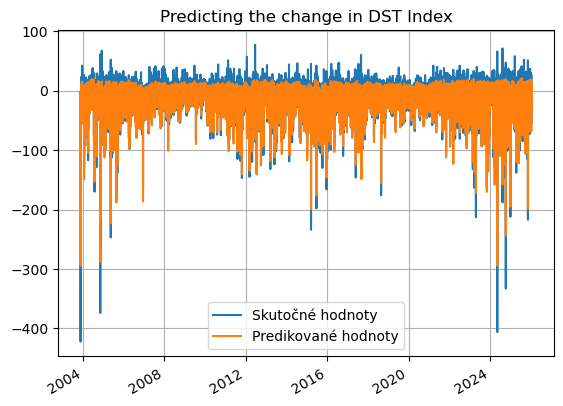

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.8970894185016582
MCC=0.6807282352455976
Výkon NN:
MAE: 6.0630, MSE: 90.4382
Perzistentný model:
MAE: 6.6837, MSE: 114.0205
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.29%
MSE Improvement: 20.68%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

529/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

684/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

732/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 10:59 737ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step   

  5/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 21s 27ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

319/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

530/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 18s 27ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 17s 27ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 16s 27ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 15s 27ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 14s 27ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step 

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.51366824
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.74**2 * RBF(length_scale=0.262) + WhiteKernel(noise_level=0.613)


Global sigma (LSTM errors): 11.302715
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194188

In [21]:
len(y_pred_persistence)

194179

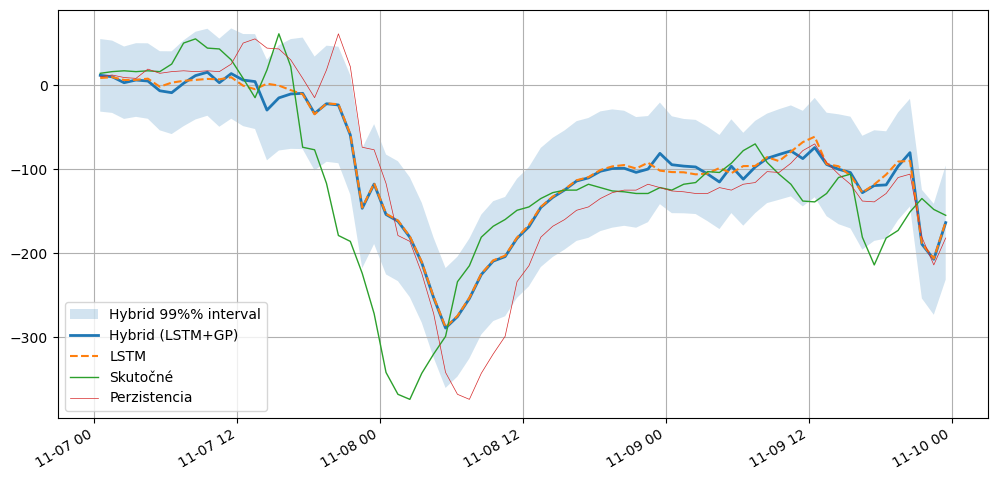

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 99.2125
MAE: 6.3996

--- Klasifikačné metriky (Prah: -20.6 nT) ---
Matthews Correlation Coefficient (MCC): 0.6657

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      144890 |        7158
Skutočná 1 |       13872 |       28259

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.91      0.95      0.93    152048
   Trieda 1 (Búrka)       0.80      0.67      0.73     42131

           accuracy                           0.89    194179
          macro avg       0.86      0.81      0.83    194179
       weighted avg       0.89      0.89      0.89    194179



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.8970846487004259
MCC=0.6807246966615619
Výkon NN:
MAE: 6.0630, MSE: 90.4382
Perzistentný model:
MAE: 6.6837, MSE: 114.0205
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 9.29%
MSE Improvement: 20.68%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9128    0.9603    0.9359    152048
           1     0.8236    0.6690    0.7383     42131

    accuracy                         0.8971    194179
   macro avg     0.8682    0.8146    0.8371    194179
weighted avg     0.8935    0.8971    0.8931    194179


===== LSTM+GP =====
ACC=0.8916978664016191
MCC=0.6656757917595878
Výkon NN:
MAE: 6.3996, MSE: 99.2125
Perzistentný model:
MAE: 6.6837, MSE: 114.0205
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 4.25%
MSE Improvement: 12.99%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9126    0.9529    0.9323    152048
           1     0.7979    0.6707    0.7288     42131



/tmp/ipykernel_381340/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_381340/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
24,2026-04-26T05:49:07,LSTM,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.905011,0.707136,"{""text"": "" precision recall f...",5.554311,75.506244,6.073318,92.330027,8.545698,18.221356
25,2026-04-26T05:49:07,LSTM+GP,12.0,4.0,DST+4,OMNI2_all,-20.0,-19.9,0.900140,0.696833,"{""text"": "" precision recall f...",5.918420,83.402773,6.073318,92.330027,2.550478,9.668852
26,2026-04-26T08:00:15,LSTM,18.0,4.0,DST+4,OMNI2_all,-20.0,-20.5,0.906018,0.710991,"{""text"": "" precision recall f...",5.535369,76.765555,6.073274,92.330599,8.856917,16.857948
27,2026-04-26T08:00:15,LSTM+GP,18.0,4.0,DST+4,OMNI2_all,-20.0,-20.5,0.898808,0.690868,"{""text"": "" precision recall f...",5.811375,81.899407,6.073274,92.330599,4.312316,11.297655
28,2026-04-26T10:23:04,LSTM,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.4,0.907292,0.714163,"{""text"": "" precision recall f...",5.450724,73.729552,6.073117,92.326875,10.248323,20.142914
29,2026-04-26T10:23:04,LSTM+GP,24.0,4.0,DST+4,OMNI2_all,-20.0,-20.4,0.899721,0.691663,"{""text"": "" precision recall f...",5.865822,82.548041,6.073117,92.326875,3.413321,10.591536
30,2026-04-26T11:21:16,LSTM,6.0,4.0,DST+4,OMNI2_all,-20.0,-19.8,0.903469,0.705638,"{""text"": "" precision recall f...",5.616163,76.475804,6.073218,92.327612,7.525756,17.169087
31,2026-04-26T11:21:16,LSTM+GP,6.0,4.0,DST+4,OMNI2_all,-20.0,-19.8,0.898119,0.691797,"{""text"": "" precision recall f...",5.924009,83.998240,6.073218,92.327612,2.456842,9.021540
32,2026-04-26T12:21:53,LSTM,12.0,5.0,DST+5,OMNI2_all,-20.0,-20.6,0.897085,0.680725,"{""text"": "" precision recall f...",6.063022,90.438223,6.683663,114.020481,9.285948,20.682476
33,2026-04-26T12:21:53,LSTM+GP,12.0,5.0,DST+5,OMNI2_all,-20.0,-20.6,0.891698,0.665676,"{""text"": "" precision recall f...",6.399577,99.212478,6.683663,114.020481,4.250449,12.987144
